In [220]:
#!pip install yfinance
#!pip install pyramid-arima

In [221]:
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline 
import seaborn as sns
import statsmodels.api as sm
from statsmodels.tsa.api import VAR
import yfinance as yf  
from pyramid.arima import auto_arima
import warnings
warnings.filterwarnings('ignore')
import numpy as np

In [222]:
companies = ["T","BBY","KO","FTI","BLK","DVA","BA","IBM","ALB","CBRE"] 
#AT&T,Best Buy, TechnitFMPI, Coca Cola, Blackrock, Davita Inc.,Boeing,IBM,Albemarle Corp, CBRE Group
df = pd.DataFrame(columns = companies)
for i in companies:
    df[i] = yf.download(i,'2015-01-01','2019-09-11')["Open"]

[*********************100%***********************]  1 of 1 downloaded
[*********************100%***********************]  1 of 1 downloaded
[*********************100%***********************]  1 of 1 downloaded
[*********************100%***********************]  1 of 1 downloaded
[*********************100%***********************]  1 of 1 downloaded
[*********************100%***********************]  1 of 1 downloaded
[*********************100%***********************]  1 of 1 downloaded
[*********************100%***********************]  1 of 1 downloaded
[*********************100%***********************]  1 of 1 downloaded
[*********************100%***********************]  1 of 1 downloaded


In [223]:
df

,T,BBY,KO,FTI,BLK,DVA,BA,IBM,ALB,CBRE
Date,,,,,,,,,,
2014-12-31,33.98,39.34,42.92,47.15,362.34,76.19,132.25,160.41,60.92,34.98
2015-01-02,33.59,39.17,42.26,46.44,357.98,75.84,131.07,161.31,60.37,34.51
2015-01-05,33.87,38.55,42.69,45.55,353.24,75.36,129.66,161.27,59.90,34.31
2015-01-06,33.77,37.65,42.41,44.42,348.70,74.89,129.05,159.67,58.44,34.04
2015-01-07,33.58,37.98,42.80,44.26,345.15,73.87,128.74,157.20,57.98,33.89
...,...,...,...,...,...,...,...,...,...,...
2019-09-04,35.53,63.70,55.35,24.76,416.28,59.50,357.68,135.71,61.60,52.50
2019-09-05,35.90,65.05,55.75,25.75,421.82,59.66,360.14,138.30,62.33,53.11
2019-09-06,35.95,66.05,55.44,25.67,424.88,57.94,361.61,141.52,63.04,53.29


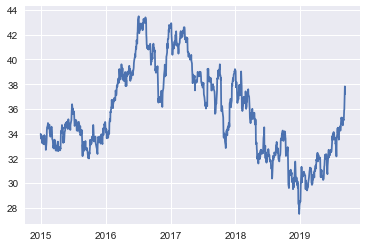

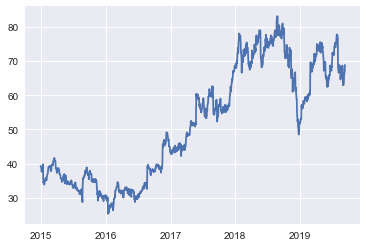

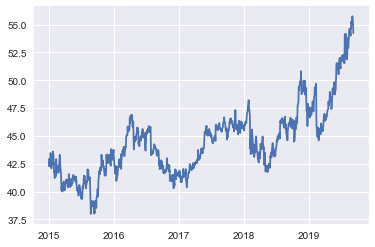

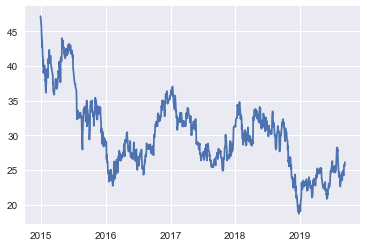

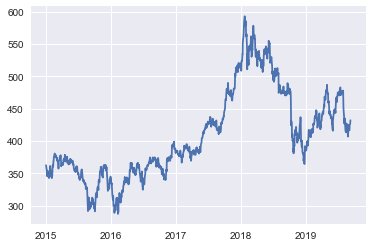

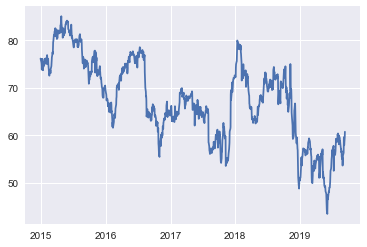

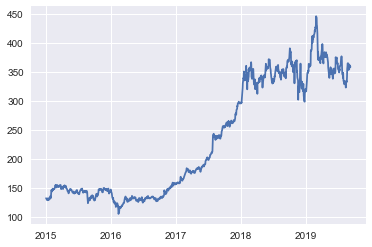

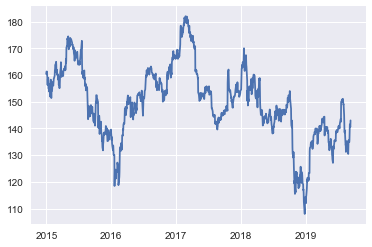

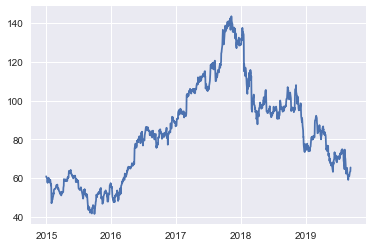

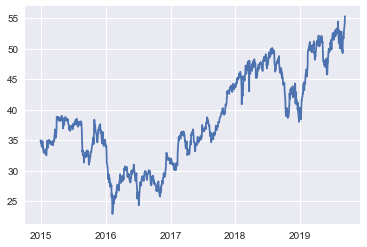

In [224]:
for i in companies:
    plt.plot(df[i])
    plt.show()

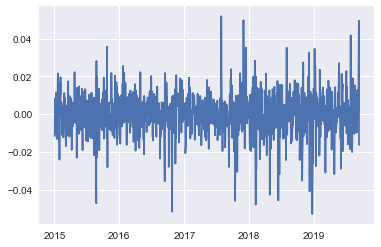

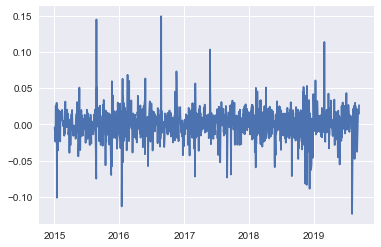

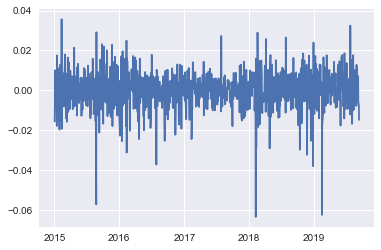

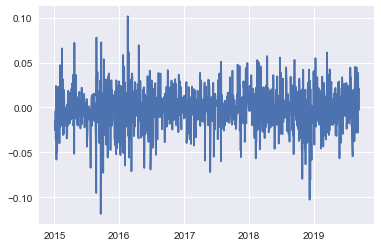

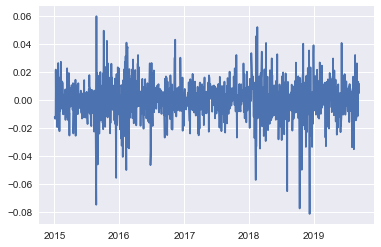

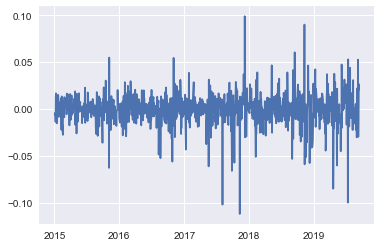

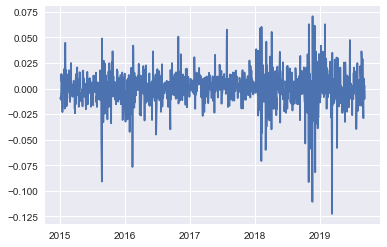

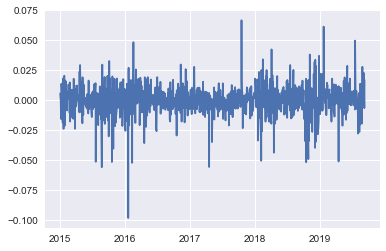

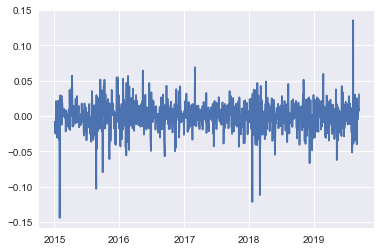

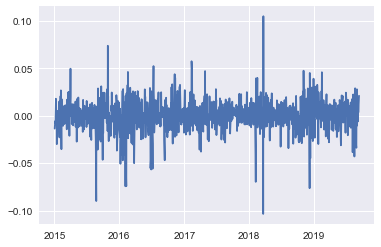

In [225]:
for i in companies:
    plt.plot(df[i].diff(1)/df[i])
    plt.show()

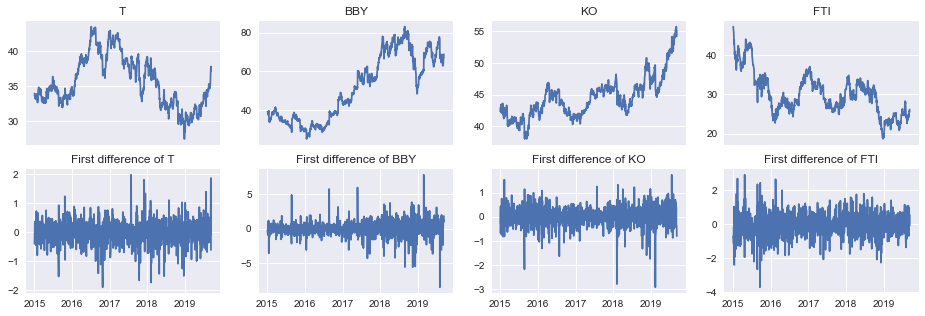

In [226]:
gridsize = (2, 4)
fig = plt.figure(figsize=(16, 5))
ax1 = plt.subplot2grid(gridsize, (0, 0))
ax2 = plt.subplot2grid(gridsize, (0, 1))
ax3 = plt.subplot2grid(gridsize, (0, 2))
ax4 = plt.subplot2grid(gridsize, (0, 3))
ax1.plot(df["T"])
ax2.plot(df["BBY"])
ax3.plot(df['KO'])
ax4.plot(df["FTI"])
ax1.set_title("T")
ax2.set_title("BBY")
ax3.set_title("KO")
ax4.set_title("FTI")
ax1.xaxis.set_visible(False)
ax2.xaxis.set_visible(False)
ax3.xaxis.set_visible(False)
ax4.xaxis.set_visible(False)

ax1 = plt.subplot2grid(gridsize, (1, 0))
ax2 = plt.subplot2grid(gridsize, (1, 1))
ax3 = plt.subplot2grid(gridsize, (1, 2))
ax4 = plt.subplot2grid(gridsize, (1, 3))
ax1.plot(df["T"].diff(1))
ax2.plot(df["BBY"].diff(1))
ax3.plot(df['KO'].diff(1))
ax4.plot(df["FTI"].diff(1))
ax1.set_title("First difference of T")
ax2.set_title("First difference of BBY")
ax3.set_title("First difference of KO")
ax4.set_title("First difference of FTI")

plt.savefig("descr_3",dpi = 500)


plt.show()

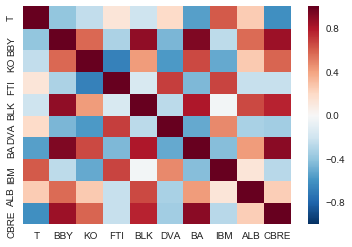

In [227]:
corr = df.corr()

# plot the heatmap
sns.heatmap(corr)
plt.savefig("corrolelogram_3",dpi = 1200)
plt.show()

In [228]:
train = df[:"2019-01-01"].copy()
test = df["2019-01-01":].copy()
print("Train has shape",train.shape)
print("Test has shape",test.shape)

Train has shape (1007, 10)
Test has shape (174, 10)


In [229]:
df

,T,BBY,KO,FTI,BLK,DVA,BA,IBM,ALB,CBRE
Date,,,,,,,,,,
2014-12-31,33.98,39.34,42.92,47.15,362.34,76.19,132.25,160.41,60.92,34.98
2015-01-02,33.59,39.17,42.26,46.44,357.98,75.84,131.07,161.31,60.37,34.51
2015-01-05,33.87,38.55,42.69,45.55,353.24,75.36,129.66,161.27,59.90,34.31
2015-01-06,33.77,37.65,42.41,44.42,348.70,74.89,129.05,159.67,58.44,34.04
2015-01-07,33.58,37.98,42.80,44.26,345.15,73.87,128.74,157.20,57.98,33.89
...,...,...,...,...,...,...,...,...,...,...
2019-09-04,35.53,63.70,55.35,24.76,416.28,59.50,357.68,135.71,61.60,52.50
2019-09-05,35.90,65.05,55.75,25.75,421.82,59.66,360.14,138.30,62.33,53.11
2019-09-06,35.95,66.05,55.44,25.67,424.88,57.94,361.61,141.52,63.04,53.29


## Benchmark model: Univariate modeling with Arima and Persistence 

In [230]:
def stationary(companies,df):
    lib = {}
    for i in companies:
        ts = sm.tsa.adfuller(df[i])
        lib[i] = (ts[0] > ts[4]['5%'])
    return lib

In [231]:
stat = stationary(companies = companies,df = train)
stat

{'ALB': True,
 'BA': True,
 'BBY': True,
 'BLK': True,
 'CBRE': True,
 'DVA': True,
 'FTI': True,
 'IBM': True,
 'KO': True,
 'T': True}

From ADF test we get that all the time series data in our case are not stationary, we will use first difference to make them stationary and thus suitable for ARIMA model

In [232]:
train_diff = train.copy()
for i in companies:
    if (stat[i]):
        train_diff.loc[:,(i)] = train_diff.loc[:,(i)].diff(1)
train_diff = train_diff.dropna()

In [233]:
stat_diff = stationary(companies = companies,df = train_diff)
stat_diff

{'ALB': False,
 'BA': False,
 'BBY': False,
 'BLK': False,
 'CBRE': False,
 'DVA': False,
 'FTI': False,
 'IBM': False,
 'KO': False,
 'T': False}

After differencing the H0 hypothesis that time series are not stationary is rejected

In [234]:
stepwise_model = auto_arima(train["ALB"], start_p=1, start_q=1,
                           max_p=7, max_q=7,
                           start_P=0, seasonal=True,
                           d=1, D=1, trace=True,
                           error_action='ignore',  
                           suppress_warnings=True, 
                           stepwise=True)
print(stepwise_model.aic())

Fit ARIMA: order=(1, 1, 1) seasonal_order=(0, 0, 0, 1); AIC=3841.714, BIC=3861.369, Fit time=0.210 seconds
Fit ARIMA: order=(0, 1, 0) seasonal_order=(0, 0, 0, 1); AIC=3842.444, BIC=3852.271, Fit time=0.023 seconds
Fit ARIMA: order=(1, 1, 0) seasonal_order=(0, 0, 0, 1); AIC=3840.519, BIC=3855.260, Fit time=0.059 seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(0, 0, 0, 1); AIC=3840.694, BIC=3855.435, Fit time=0.080 seconds
Fit ARIMA: order=(2, 1, 0) seasonal_order=(0, 0, 0, 1); AIC=3841.935, BIC=3861.590, Fit time=0.101 seconds
Fit ARIMA: order=(2, 1, 1) seasonal_order=(0, 0, 0, 1); AIC=3843.638, BIC=3868.207, Fit time=0.216 seconds
Total fit time: 0.690 seconds
3840.518589430697


In [235]:
def forecast(train, test,window, company,order = (1,1,0)):
    u = train[company].copy()
    v = test[company].copy()
    prediction = pd.DataFrame(index = test.index)
    for i in range(0,len(test)):
        model = sm.tsa.statespace.SARIMAX(u.tail(window), order=order,seasonal_order=(0,0,0,1),
                            enforce_stationarity=False, enforce_invertibility=False).fit(full_output=True, disp=0)
        prediction.loc[v.index[i],company] = model.forecast(1)[window]
        u[test.index[i]] = test.loc[test.index[i],company]
    
    plt.plot(prediction["2019-01-04":])
    plt.plot(test.loc["2019-01-04":,company])
    plt.legend(["Pred","Act"])
    plt.title("Prediction for "+ company)
    plt.show()
    return prediction
    

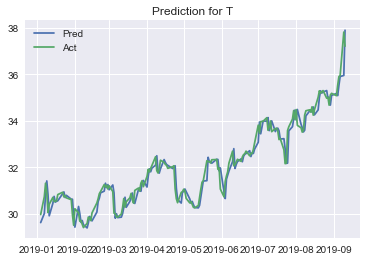

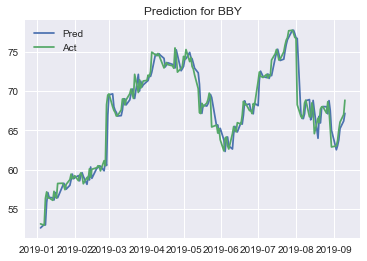

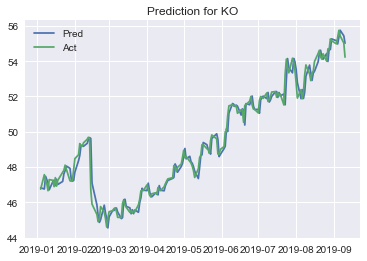

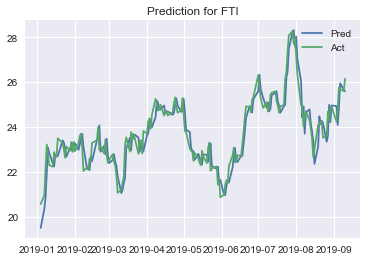

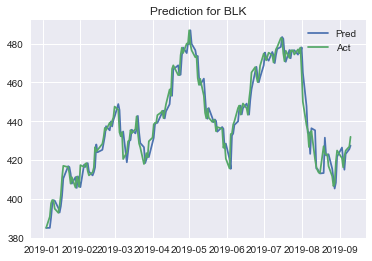

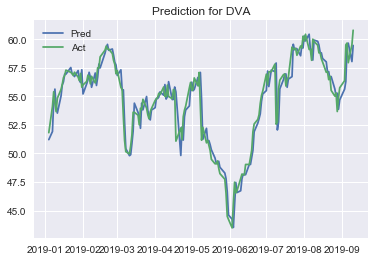

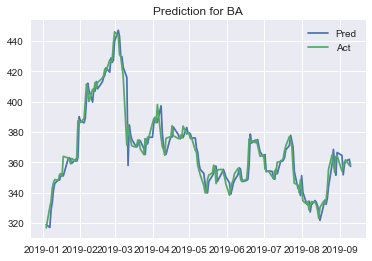

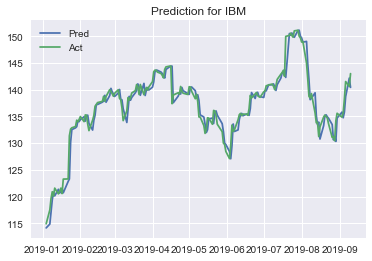

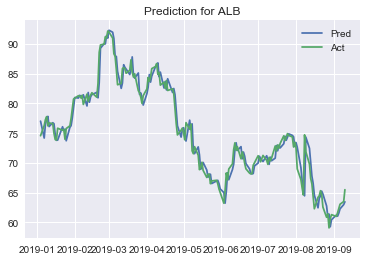

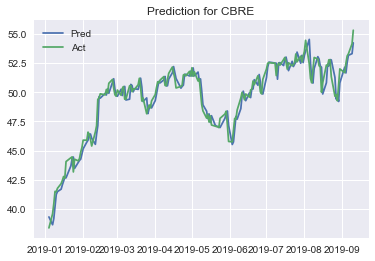

In [236]:
pred = pd.DataFrame(index = test.index[2:],columns=companies)
for c in companies:
    pred.loc[:,c] = forecast(train,test,45,c,(1,1,0))
test = test.loc["2019-01-04":,:]

In [237]:
trivial_pred = test.shift(1).dropna().loc['2019-01-08':,:]
test_trivial = test.loc['2019-01-08':,:].copy()
pred = pred.loc['2019-01-08':,:]
pred.shape,trivial_pred.shape,test_trivial.shape

((170, 10), (170, 10), (170, 10))

In [238]:
from sklearn.metrics import mean_squared_error,mean_absolute_error,r2_score


def eval(pred,test_trivial,companies,metrics = ["MSE","MAE","R2","MAPE (%)"]):
    df = pd.DataFrame(index=metrics,columns=companies)
    for c in companies:
        df.loc["MSE",c] = mean_squared_error(pred[c],test_trivial[c])
        df.loc["MAE",c] = mean_absolute_error(pred[c],test_trivial[c])
        df.loc["R2",c] = r2_score(pred[c],test_trivial[c]) #https://stats.stackexchange.com/questions/101546/what-is-the-problem-with-using-r-squared-in-time-series-models
        df.loc["MAPE (%)",c] = (np.mean(np.abs((test_trivial - pred)) / (test_trivial + 0.1) )* 100)[c]
    return df

In [239]:
triv_prec = eval(trivial_pred,test_trivial,companies)
triv_prec

,T,BBY,KO,FTI,BLK,DVA,BA,IBM,ALB,CBRE
MSE,0.137026,2.02855,0.225022,0.272115,30.3432,1.20785,49.2181,2.77441,2.63199,0.508235
MAE,0.264353,0.932941,0.342941,0.422176,4.31082,0.781471,4.79553,1.13294,1.20224,0.561235
R2,0.952411,0.939063,0.975307,0.87075,0.946298,0.909667,0.925577,0.931289,0.957899,0.942953
MAPE (%),0.81722,1.38642,0.68909,1.7702,0.982166,1.44418,1.29799,0.830379,1.62189,1.13024


In [240]:
arima_prec = eval(pred,test_trivial,companies)
arima_prec

,T,BBY,KO,FTI,BLK,DVA,BA,IBM,ALB,CBRE
MSE,0.14001,2.07972,0.236742,0.27727,30.8657,1.27523,52.507,2.84329,2.71089,0.526063
MAE,0.268783,0.937648,0.350217,0.427613,4.34478,0.806596,5.01099,1.15325,1.22388,0.577117
R2,0.951721,0.93792,0.973945,0.86897,0.945842,0.905742,0.921544,0.930518,0.956719,0.94251
MAPE (%),0.830705,1.39683,0.703339,1.79259,0.989648,1.49051,1.35681,0.845722,1.65153,1.16521


As we can see Arima model considered cannot beat the persistence model,but it is very close to it. Later in the work we will see if RNN's can beat persistence model. Overall, benchmark models have excellent quality and beating them will be very hard task.

## Benchmark model: Multivariate modeling with VAR

In [304]:
model = VAR(train_diff)

In [305]:
x = model.select_order(maxlags=12)
x.summary()

,AIC,BIC,FPE,HQIC
0,1.001*,1.050*,2.721*,1.020*
1,1.013,1.555,2.753,1.219
2,1.122,2.158,3.072,1.516
3,1.136,2.665,3.116,1.718
4,1.221,3.243,3.393,1.990
5,1.263,3.778,3.540,2.219
6,1.337,4.346,3.815,2.481
7,1.408,4.909,4.097,2.739
8,1.488,5.482,4.445,3.007
9,1.543,6.031,4.704,3.249


In [307]:
result = model.fit(0)

In [308]:
result.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Thu, 12, Sep, 2019
Time:                     17:46:57
--------------------------------------------------------------------
No. of Equations:         10.0000    BIC:                    1.04193
Nobs:                     1006.00    HQIC:                   1.01165
Log likelihood:          -14764.0    FPE:                    2.69956
AIC:                     0.993087    Det(Omega_mle):         2.67287
--------------------------------------------------------------------
Results for equation T
           coefficient       std. error           t-stat            prob
------------------------------------------------------------------------
const        -0.005378         0.012235           -0.440           0.660

Results for equation BBY
           coefficient       std. error           t-stat            prob
----------------------------------------------------------------------

In [303]:
result.coefs_exog

array([[ 1.84569981],
       [ 4.52240248],
       [ 2.93508726],
       [ 3.3650644 ],
       [29.69603356],
       [ 1.78478765],
       [10.04277026],
       [ 5.38664607],
       [ 3.72303354],
       [ 2.89158292]])

In [246]:
def invert_transformation(df_train, df_forecast):
    df_fc = df_forecast.copy()
    columns = df_train.columns
    for col in columns:        
        df_fc[str(col)] = df_train[col].iloc[-1] + df_fc[str(col)].cumsum()
    return df_fc

In [247]:
def VAR_Pred_Step(train, test,lags = 1):
    u = train.copy()
    v = test.copy()
    train_diff = u.copy().diff(1).dropna()
    model = VAR(train_diff)
    result = model.fit(0)
    fc = result.coefs_exog.reshape(1,10)
    df_forecast = pd.DataFrame(fc, index=test.index[:1], columns=train_diff.columns)
    df_results_1 = invert_transformation(train, df_forecast)
        
    return df_results_1

In [248]:
s = VAR_Pred_Step(train.iloc[:-1,:],test)

In [249]:
s #forecasts one step forward

,T,BBY,KO,FTI,BLK,DVA,BA,IBM,ALB,CBRE
Date,,,,,,,,,,
2019-01-04,28.184239,52.212796,47.894945,19.942955,391.959443,50.974935,319.926557,114.17404,77.596577,40.335323


In [250]:
test_dates = test.index
test_dates

DatetimeIndex(['2019-01-04', '2019-01-07', '2019-01-08', '2019-01-09',
               '2019-01-10', '2019-01-11', '2019-01-14', '2019-01-15',
               '2019-01-16', '2019-01-17',
               ...
               '2019-08-27', '2019-08-28', '2019-08-29', '2019-08-30',
               '2019-09-03', '2019-09-04', '2019-09-05', '2019-09-06',
               '2019-09-09', '2019-09-10'],
              dtype='datetime64[ns]', name='Date', length=172, freq=None)

In [251]:
for date in test_dates:
    train = df[:date].copy().iloc[:-1,:]
    test = df[date:].copy()
    print("Last of train",train.index[-1])
    print("First of test",test.index[0])

Last of train 2019-01-03 00:00:00
First of test 2019-01-04 00:00:00
Last of train 2019-01-04 00:00:00
First of test 2019-01-07 00:00:00
Last of train 2019-01-07 00:00:00
First of test 2019-01-08 00:00:00
Last of train 2019-01-08 00:00:00
First of test 2019-01-09 00:00:00
Last of train 2019-01-09 00:00:00
First of test 2019-01-10 00:00:00
Last of train 2019-01-10 00:00:00
First of test 2019-01-11 00:00:00
Last of train 2019-01-11 00:00:00
First of test 2019-01-14 00:00:00
Last of train 2019-01-14 00:00:00
First of test 2019-01-15 00:00:00
Last of train 2019-01-15 00:00:00
First of test 2019-01-16 00:00:00
Last of train 2019-01-16 00:00:00
First of test 2019-01-17 00:00:00
Last of train 2019-01-17 00:00:00
First of test 2019-01-18 00:00:00
Last of train 2019-01-18 00:00:00
First of test 2019-01-22 00:00:00
Last of train 2019-01-22 00:00:00
First of test 2019-01-23 00:00:00
Last of train 2019-01-23 00:00:00
First of test 2019-01-24 00:00:00
Last of train 2019-01-24 00:00:00
First of test 

In [252]:
predictions = pd.DataFrame(columns=test.columns,index=test.index)

In [259]:
for date in test_dates:
    train = df[:date].copy().iloc[:-1,:]
    test = df[date:].copy()
    s = VAR_Pred_Step(train,test)
    predictions.loc[s.index[0],:] = s.values
s = VAR_Pred_Step(train,test)
predictions.loc[test.index[0],:] = s.values
s = VAR_Pred_Step(train,test)
predictions.loc[test.index[0],:] = s.values

In [260]:
train = df[:"2019-01-04"].copy()
test = df["2019-01-04":].copy()
predictions = predictions["2019-01-04":]

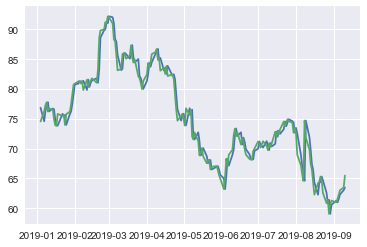

In [261]:
plt.plot(predictions["ALB"])
plt.plot(test["ALB"])
plt.show()

In [262]:
test

,T,BBY,KO,FTI,BLK,DVA,BA,IBM,ALB,CBRE
Date,,,,,,,,,,
2019-01-04,29.96,53.11,46.75,20.56,385.17,51.82,316.69,114.91,74.57,38.39
2019-01-07,30.73,52.94,47.57,20.96,390.94,54.11,330.52,117.50,76.29,39.60
2019-01-08,31.31,56.36,47.25,22.18,397.76,55.40,334.11,119.66,77.28,40.46
2019-01-09,30.88,57.18,47.08,23.22,399.50,54.36,342.96,120.91,77.78,41.52
2019-01-10,30.05,56.39,46.66,22.78,399.12,53.66,346.51,120.08,76.23,41.49
...,...,...,...,...,...,...,...,...,...,...
2019-09-04,35.53,63.70,55.35,24.76,416.28,59.50,357.68,135.71,61.60,52.50
2019-09-05,35.90,65.05,55.75,25.75,421.82,59.66,360.14,138.30,62.33,53.11
2019-09-06,35.95,66.05,55.44,25.67,424.88,57.94,361.61,141.52,63.04,53.29


In [263]:
var_eval = eval(predictions,test,companies=companies)
var_eval

,T,BBY,KO,FTI,BLK,DVA,BA,IBM,ALB,CBRE
MSE,0.140195,2.00467,0.226009,0.276607,30.1905,1.23,49.7986,2.79519,2.65257,0.513979
MAE,0.268645,0.924619,0.344019,0.426563,4.29262,0.79184,4.84909,1.13985,1.21193,0.565729
R2,0.95187,0.94339,0.975174,0.876526,0.949189,0.907922,0.927173,0.938941,0.957167,0.949374
MAPE (%),0.831775,1.37554,0.691759,1.79259,0.979042,1.46322,1.31608,0.837585,1.63465,1.14602


In [203]:
var_eval.astype(float).round(2).to_latex()

'\\begin{tabular}{lrrrrrrrrrr}\n\\toprule\n{} &     T &   BBY &    KO &   FTI &    BLK &   DVA &     BA &   IBM &   ALB &  CBRE \\\\\n\\midrule\nMSE      &  0.14 &  2.00 &  0.23 &  0.28 &  30.19 &  1.23 &  49.80 &  2.80 &  2.65 &  0.51 \\\\\nMAE      &  0.27 &  0.92 &  0.34 &  0.43 &   4.29 &  0.79 &   4.85 &  1.14 &  1.21 &  0.57 \\\\\nR2       &  0.95 &  0.94 &  0.98 &  0.88 &   0.95 &  0.91 &   0.93 &  0.94 &  0.96 &  0.95 \\\\\nMAPE (\\%) &  0.83 &  1.38 &  0.69 &  1.79 &   0.98 &  1.46 &   1.32 &  0.84 &  1.63 &  1.15 \\\\\n\\bottomrule\n\\end{tabular}\n'

## Modelling with RNN's

## Univariate forecasting

In [312]:
import keras
from keras.layers import Dense
from keras.models import Sequential
from keras.utils import to_categorical
from keras.optimizers import SGD 
from keras.callbacks import EarlyStopping
from keras.utils import np_utils
import itertools
from keras.layers import LSTM
from keras.layers.convolutional import Conv1D
from keras.layers.convolutional import MaxPooling1D
from keras.layers import Dropout
from keras.losses import mean_absolute_percentage_error
from sklearn.preprocessing import MinMaxScaler
from keras.layers import GRU


In [267]:
def series_to_supervised(data, n_in=45, n_out=1, dropnan=True):
    n_vars = 1 if type(data) is list else data.shape[1]
    dff = pd.DataFrame(data)
    cols, names = list(), list()
    # input sequence (t-n, ... t-1)
    for i in range(n_in, 0, -1):
        cols.append(dff.shift(i))
        names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(dff.shift(-i))
        if i == 0:
            names += [('var%d(t)' % (j+1)) for j in range(n_vars)]
        else:
            names += [('var%d(t+%d)' % (j+1, i)) for j in range(n_vars)]
    # put it all together
    agg = pd.concat(cols, axis=1)
    agg.columns = names
    # drop rows with NaN values
    if dropnan:
        agg.dropna(inplace=True)
    return agg

In [268]:
def nn_forec(df,company,n_lags = 1,feature_range=(0, 1),n_train_time = 172,first_layer = 64,second_layer = 32):
    print("Predicting for ", company)
    comp = df[company]
    scaler = MinMaxScaler(feature_range=feature_range)
    comp = scaler.fit_transform(comp)
    comp = pd.DataFrame(comp,columns=[company+"(t)"],index=df.index)
    for i in range(1,n_lags+1):
        comp[company+"(t-"+str(i)+")"] = comp[company+"(t)"].shift(i)
    
    comp = comp.dropna()
    values = comp.values

    n_train_time = 172
    train = values[:comp.shape[0] -n_train_time, :]
    test = values[comp.shape[0] - n_train_time :, :]
    train_X, train_y = train[:, 1:], train[:, 0]
    test_X, test_y = test[:, 1:], test[:, 0]
    train_X = train_X.reshape((train_X.shape[0], 1, train_X.shape[1]))
    test_X = test_X.reshape((test_X.shape[0], 1, test_X.shape[1]))

    model = Sequential()
    model.add(LSTM(first_layer, input_shape=(train_X.shape[1], train_X.shape[2]),return_sequences=True))
    model.add(Dropout(0.1))
    model.add(LSTM(second_layer))
    model.add(Dropout(0.1))
    model.add(Dense(1))
    model.compile(loss="mean_squared_error", optimizer='adam')



    # fit network
    history = model.fit(train_X, train_y, epochs=1000, batch_size=300, validation_data=(test_X, test_y), verbose=2, shuffle=False)

    # summarize history for loss
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'test'], loc='upper right')
    plt.show()
    
    # make a prediction
    yhat = model.predict(test_X)
    # invert scaling for forecast
    inv_yhat_sc = scaler.inverse_transform(yhat)
    # invert scaling for actual

    inv_y = scaler.inverse_transform(test_y)
    test = df["2019-01-04":].copy()
    train = df[:"2019-01-04"].copy()
    predictions = pd.DataFrame(inv_yhat_sc,columns=[company],index = test.index)
    
    lstm_eval = eval(predictions,test,companies=[company])
    print(lstm_eval)
    
    plt.plot(predictions[company])
    plt.plot(test[company])
    plt.legend(['Pred', 'Test'])
    plt.show()
    return predictions

In [269]:
test = df["2019-01-04":].copy()
train = df[:"2019-01-04"].copy()

Predicting for  T


WARNING (theano.tensor.blas): We did not found a dynamic library into the library_dir of the library we use for blas. If you use ATLAS, make sure to compile it with dynamics library.


Train on 1008 samples, validate on 172 samples
Epoch 1/1000
0s - loss: 0.3499 - val_loss: 0.0868
Epoch 2/1000
0s - loss: 0.3286 - val_loss: 0.0783
Epoch 3/1000
0s - loss: 0.3081 - val_loss: 0.0701
Epoch 4/1000
0s - loss: 0.2881 - val_loss: 0.0621
Epoch 5/1000
0s - loss: 0.2675 - val_loss: 0.0543
Epoch 6/1000
0s - loss: 0.2470 - val_loss: 0.0466
Epoch 7/1000
0s - loss: 0.2256 - val_loss: 0.0392
Epoch 8/1000
0s - loss: 0.2040 - val_loss: 0.0320
Epoch 9/1000
0s - loss: 0.1824 - val_loss: 0.0253
Epoch 10/1000
0s - loss: 0.1602 - val_loss: 0.0193
Epoch 11/1000
0s - loss: 0.1368 - val_loss: 0.0142
Epoch 12/1000
0s - loss: 0.1157 - val_loss: 0.0103
Epoch 13/1000
0s - loss: 0.0943 - val_loss: 0.0080
Epoch 14/1000
0s - loss: 0.0750 - val_loss: 0.0074
Epoch 15/1000
0s - loss: 0.0588 - val_loss: 0.0088
Epoch 16/1000
0s - loss: 0.0436 - val_loss: 0.0120
Epoch 17/1000
0s - loss: 0.0334 - val_loss: 0.0166
Epoch 18/1000
0s - loss: 0.0262 - val_loss: 0.0219
Epoch 19/1000
0s - loss: 0.0216 - val_loss: 

0s - loss: 0.0028 - val_loss: 8.1531e-04
Epoch 158/1000
0s - loss: 0.0028 - val_loss: 8.1283e-04
Epoch 159/1000
0s - loss: 0.0026 - val_loss: 8.0983e-04
Epoch 160/1000
0s - loss: 0.0027 - val_loss: 8.0588e-04
Epoch 161/1000
0s - loss: 0.0026 - val_loss: 8.0415e-04
Epoch 162/1000
0s - loss: 0.0026 - val_loss: 8.0380e-04
Epoch 163/1000
0s - loss: 0.0027 - val_loss: 8.0257e-04
Epoch 164/1000
0s - loss: 0.0026 - val_loss: 8.0231e-04
Epoch 165/1000
0s - loss: 0.0028 - val_loss: 8.0188e-04
Epoch 166/1000
0s - loss: 0.0027 - val_loss: 8.0366e-04
Epoch 167/1000
0s - loss: 0.0027 - val_loss: 8.0546e-04
Epoch 168/1000
0s - loss: 0.0027 - val_loss: 8.0269e-04
Epoch 169/1000
0s - loss: 0.0027 - val_loss: 7.9783e-04
Epoch 170/1000
0s - loss: 0.0025 - val_loss: 7.9703e-04
Epoch 171/1000
0s - loss: 0.0025 - val_loss: 7.9568e-04
Epoch 172/1000
0s - loss: 0.0025 - val_loss: 7.9095e-04
Epoch 173/1000
0s - loss: 0.0025 - val_loss: 7.8718e-04
Epoch 174/1000
0s - loss: 0.0026 - val_loss: 7.8782e-04
Epoch 1

0s - loss: 0.0021 - val_loss: 6.6865e-04
Epoch 307/1000
0s - loss: 0.0021 - val_loss: 6.7177e-04
Epoch 308/1000
0s - loss: 0.0023 - val_loss: 6.7442e-04
Epoch 309/1000
0s - loss: 0.0024 - val_loss: 6.6948e-04
Epoch 310/1000
0s - loss: 0.0023 - val_loss: 6.6643e-04
Epoch 311/1000
0s - loss: 0.0022 - val_loss: 6.6575e-04
Epoch 312/1000
0s - loss: 0.0021 - val_loss: 6.6718e-04
Epoch 313/1000
0s - loss: 0.0022 - val_loss: 6.6428e-04
Epoch 314/1000
0s - loss: 0.0024 - val_loss: 6.5945e-04
Epoch 315/1000
0s - loss: 0.0022 - val_loss: 6.6304e-04
Epoch 316/1000
0s - loss: 0.0021 - val_loss: 6.6498e-04
Epoch 317/1000
0s - loss: 0.0024 - val_loss: 6.6311e-04
Epoch 318/1000
0s - loss: 0.0021 - val_loss: 6.7458e-04
Epoch 319/1000
0s - loss: 0.0023 - val_loss: 6.6677e-04
Epoch 320/1000
0s - loss: 0.0023 - val_loss: 6.5855e-04
Epoch 321/1000
0s - loss: 0.0022 - val_loss: 6.5644e-04
Epoch 322/1000
0s - loss: 0.0024 - val_loss: 6.5488e-04
Epoch 323/1000
0s - loss: 0.0023 - val_loss: 6.5394e-04
Epoch 3

0s - loss: 0.0020 - val_loss: 5.7555e-04
Epoch 454/1000
0s - loss: 0.0019 - val_loss: 5.7771e-04
Epoch 455/1000
0s - loss: 0.0020 - val_loss: 5.7384e-04
Epoch 456/1000
0s - loss: 0.0017 - val_loss: 5.6989e-04
Epoch 457/1000
0s - loss: 0.0021 - val_loss: 5.6915e-04
Epoch 458/1000
0s - loss: 0.0019 - val_loss: 5.6746e-04
Epoch 459/1000
0s - loss: 0.0018 - val_loss: 5.6847e-04
Epoch 460/1000
0s - loss: 0.0019 - val_loss: 5.7256e-04
Epoch 461/1000
0s - loss: 0.0021 - val_loss: 5.7140e-04
Epoch 462/1000
0s - loss: 0.0018 - val_loss: 5.6822e-04
Epoch 463/1000
0s - loss: 0.0020 - val_loss: 5.6685e-04
Epoch 464/1000
0s - loss: 0.0020 - val_loss: 5.6610e-04
Epoch 465/1000
0s - loss: 0.0018 - val_loss: 5.6671e-04
Epoch 466/1000
0s - loss: 0.0018 - val_loss: 5.6938e-04
Epoch 467/1000
0s - loss: 0.0020 - val_loss: 5.6822e-04
Epoch 468/1000
0s - loss: 0.0021 - val_loss: 5.6463e-04
Epoch 469/1000
0s - loss: 0.0018 - val_loss: 5.6438e-04
Epoch 470/1000
0s - loss: 0.0018 - val_loss: 5.6997e-04
Epoch 4

0s - loss: 0.0016 - val_loss: 5.5550e-04
Epoch 603/1000
0s - loss: 0.0018 - val_loss: 5.4554e-04
Epoch 604/1000
0s - loss: 0.0019 - val_loss: 5.4443e-04
Epoch 605/1000
0s - loss: 0.0019 - val_loss: 5.4855e-04
Epoch 606/1000
0s - loss: 0.0019 - val_loss: 5.5292e-04
Epoch 607/1000
0s - loss: 0.0018 - val_loss: 5.5053e-04
Epoch 608/1000
0s - loss: 0.0018 - val_loss: 5.4142e-04
Epoch 609/1000
0s - loss: 0.0018 - val_loss: 5.4094e-04
Epoch 610/1000
0s - loss: 0.0017 - val_loss: 5.4840e-04
Epoch 611/1000
0s - loss: 0.0017 - val_loss: 5.4961e-04
Epoch 612/1000
0s - loss: 0.0019 - val_loss: 5.4782e-04
Epoch 613/1000
0s - loss: 0.0018 - val_loss: 5.4562e-04
Epoch 614/1000
0s - loss: 0.0018 - val_loss: 5.4261e-04
Epoch 615/1000
0s - loss: 0.0017 - val_loss: 5.5087e-04
Epoch 616/1000
0s - loss: 0.0019 - val_loss: 5.4996e-04
Epoch 617/1000
0s - loss: 0.0016 - val_loss: 5.4294e-04
Epoch 618/1000
0s - loss: 0.0018 - val_loss: 5.3980e-04
Epoch 619/1000
0s - loss: 0.0017 - val_loss: 5.5090e-04
Epoch 6

0s - loss: 0.0016 - val_loss: 5.4676e-04
Epoch 750/1000
0s - loss: 0.0016 - val_loss: 5.6269e-04
Epoch 751/1000
0s - loss: 0.0016 - val_loss: 5.5158e-04
Epoch 752/1000
0s - loss: 0.0017 - val_loss: 5.3909e-04
Epoch 753/1000
0s - loss: 0.0016 - val_loss: 5.4011e-04
Epoch 754/1000
0s - loss: 0.0016 - val_loss: 5.5506e-04
Epoch 755/1000
0s - loss: 0.0017 - val_loss: 5.4468e-04
Epoch 756/1000
0s - loss: 0.0018 - val_loss: 5.3818e-04
Epoch 757/1000
0s - loss: 0.0016 - val_loss: 5.3723e-04
Epoch 758/1000
0s - loss: 0.0016 - val_loss: 5.5282e-04
Epoch 759/1000
0s - loss: 0.0016 - val_loss: 5.6458e-04
Epoch 760/1000
0s - loss: 0.0015 - val_loss: 5.4161e-04
Epoch 761/1000
0s - loss: 0.0015 - val_loss: 5.4185e-04
Epoch 762/1000
0s - loss: 0.0015 - val_loss: 5.4911e-04
Epoch 763/1000
0s - loss: 0.0016 - val_loss: 5.4611e-04
Epoch 764/1000
0s - loss: 0.0015 - val_loss: 5.4757e-04
Epoch 765/1000
0s - loss: 0.0015 - val_loss: 5.4474e-04
Epoch 766/1000
0s - loss: 0.0017 - val_loss: 5.4269e-04
Epoch 7

0s - loss: 0.0014 - val_loss: 5.4135e-04
Epoch 900/1000
0s - loss: 0.0014 - val_loss: 5.6220e-04
Epoch 901/1000
0s - loss: 0.0013 - val_loss: 5.5149e-04
Epoch 902/1000
0s - loss: 0.0014 - val_loss: 5.3707e-04
Epoch 903/1000
0s - loss: 0.0014 - val_loss: 5.4558e-04
Epoch 904/1000
0s - loss: 0.0015 - val_loss: 5.6090e-04
Epoch 905/1000
0s - loss: 0.0015 - val_loss: 5.5522e-04
Epoch 906/1000
0s - loss: 0.0014 - val_loss: 5.5830e-04
Epoch 907/1000
0s - loss: 0.0014 - val_loss: 5.5470e-04
Epoch 908/1000
0s - loss: 0.0014 - val_loss: 5.4142e-04
Epoch 909/1000
0s - loss: 0.0014 - val_loss: 5.4176e-04
Epoch 910/1000
0s - loss: 0.0015 - val_loss: 5.4319e-04
Epoch 911/1000
0s - loss: 0.0014 - val_loss: 5.4453e-04
Epoch 912/1000
0s - loss: 0.0015 - val_loss: 5.6899e-04
Epoch 913/1000
0s - loss: 0.0016 - val_loss: 5.3695e-04
Epoch 914/1000
0s - loss: 0.0015 - val_loss: 5.3757e-04
Epoch 915/1000
0s - loss: 0.0014 - val_loss: 5.5926e-04
Epoch 916/1000
0s - loss: 0.0015 - val_loss: 5.7124e-04
Epoch 9

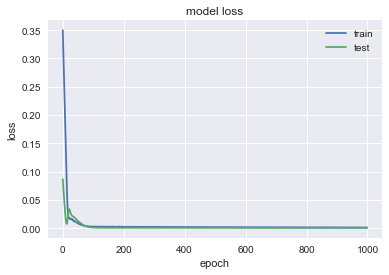

                 T
MSE       0.140023
MAE       0.270104
R2        0.950447
MAPE (%)  0.835534


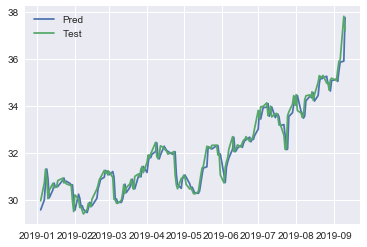

Predicting for  BBY
Train on 1008 samples, validate on 172 samples
Epoch 1/1000
0s - loss: 0.2398 - val_loss: 0.5139
Epoch 2/1000
0s - loss: 0.2274 - val_loss: 0.4908
Epoch 3/1000
0s - loss: 0.2154 - val_loss: 0.4673
Epoch 4/1000
0s - loss: 0.2034 - val_loss: 0.4432
Epoch 5/1000
0s - loss: 0.1907 - val_loss: 0.4183
Epoch 6/1000
0s - loss: 0.1781 - val_loss: 0.3922
Epoch 7/1000
0s - loss: 0.1650 - val_loss: 0.3648
Epoch 8/1000
0s - loss: 0.1522 - val_loss: 0.3358
Epoch 9/1000
0s - loss: 0.1379 - val_loss: 0.3054
Epoch 10/1000
0s - loss: 0.1234 - val_loss: 0.2736
Epoch 11/1000
0s - loss: 0.1093 - val_loss: 0.2407
Epoch 12/1000
0s - loss: 0.0947 - val_loss: 0.2074
Epoch 13/1000
0s - loss: 0.0812 - val_loss: 0.1742
Epoch 14/1000
0s - loss: 0.0683 - val_loss: 0.1422
Epoch 15/1000
0s - loss: 0.0577 - val_loss: 0.1123
Epoch 16/1000
0s - loss: 0.0485 - val_loss: 0.0855
Epoch 17/1000
0s - loss: 0.0426 - val_loss: 0.0628
Epoch 18/1000
0s - loss: 0.0377 - val_loss: 0.0446
Epoch 19/1000
0s - loss:

0s - loss: 0.0019 - val_loss: 0.0010
Epoch 163/1000
0s - loss: 0.0022 - val_loss: 0.0011
Epoch 164/1000
0s - loss: 0.0019 - val_loss: 0.0012
Epoch 165/1000
0s - loss: 0.0020 - val_loss: 0.0011
Epoch 166/1000
0s - loss: 0.0023 - val_loss: 0.0011
Epoch 167/1000
0s - loss: 0.0020 - val_loss: 0.0011
Epoch 168/1000
0s - loss: 0.0022 - val_loss: 0.0011
Epoch 169/1000
0s - loss: 0.0019 - val_loss: 0.0011
Epoch 170/1000
0s - loss: 0.0020 - val_loss: 9.9398e-04
Epoch 171/1000
0s - loss: 0.0021 - val_loss: 9.5477e-04
Epoch 172/1000
0s - loss: 0.0020 - val_loss: 0.0010
Epoch 173/1000
0s - loss: 0.0019 - val_loss: 0.0011
Epoch 174/1000
0s - loss: 0.0021 - val_loss: 0.0012
Epoch 175/1000
0s - loss: 0.0020 - val_loss: 0.0011
Epoch 176/1000
0s - loss: 0.0020 - val_loss: 9.5946e-04
Epoch 177/1000
0s - loss: 0.0020 - val_loss: 8.8538e-04
Epoch 178/1000
0s - loss: 0.0021 - val_loss: 8.9108e-04
Epoch 179/1000
0s - loss: 0.0018 - val_loss: 9.3122e-04
Epoch 180/1000
0s - loss: 0.0022 - val_loss: 9.7531e-04

0s - loss: 0.0016 - val_loss: 7.4924e-04
Epoch 314/1000
0s - loss: 0.0015 - val_loss: 7.3067e-04
Epoch 315/1000
0s - loss: 0.0015 - val_loss: 7.4957e-04
Epoch 316/1000
0s - loss: 0.0017 - val_loss: 8.0835e-04
Epoch 317/1000
0s - loss: 0.0016 - val_loss: 8.6709e-04
Epoch 318/1000
0s - loss: 0.0017 - val_loss: 8.4729e-04
Epoch 319/1000
0s - loss: 0.0017 - val_loss: 8.0556e-04
Epoch 320/1000
0s - loss: 0.0016 - val_loss: 7.6207e-04
Epoch 321/1000
0s - loss: 0.0017 - val_loss: 7.4110e-04
Epoch 322/1000
0s - loss: 0.0017 - val_loss: 7.7112e-04
Epoch 323/1000
0s - loss: 0.0016 - val_loss: 7.8430e-04
Epoch 324/1000
0s - loss: 0.0017 - val_loss: 7.6201e-04
Epoch 325/1000
0s - loss: 0.0015 - val_loss: 7.4070e-04
Epoch 326/1000
0s - loss: 0.0016 - val_loss: 7.2633e-04
Epoch 327/1000
0s - loss: 0.0015 - val_loss: 7.5748e-04
Epoch 328/1000
0s - loss: 0.0016 - val_loss: 7.8838e-04
Epoch 329/1000
0s - loss: 0.0018 - val_loss: 7.9929e-04
Epoch 330/1000
0s - loss: 0.0015 - val_loss: 8.4624e-04
Epoch 3

0s - loss: 0.0012 - val_loss: 6.2458e-04
Epoch 461/1000
0s - loss: 0.0014 - val_loss: 6.6396e-04
Epoch 462/1000
0s - loss: 0.0013 - val_loss: 6.5959e-04
Epoch 463/1000
0s - loss: 0.0012 - val_loss: 6.2664e-04
Epoch 464/1000
0s - loss: 0.0013 - val_loss: 6.1838e-04
Epoch 465/1000
0s - loss: 0.0014 - val_loss: 6.3323e-04
Epoch 466/1000
0s - loss: 0.0013 - val_loss: 6.4601e-04
Epoch 467/1000
0s - loss: 0.0013 - val_loss: 6.4408e-04
Epoch 468/1000
0s - loss: 0.0014 - val_loss: 6.7608e-04
Epoch 469/1000
0s - loss: 0.0015 - val_loss: 7.2297e-04
Epoch 470/1000
0s - loss: 0.0014 - val_loss: 7.3439e-04
Epoch 471/1000
0s - loss: 0.0016 - val_loss: 6.5460e-04
Epoch 472/1000
0s - loss: 0.0014 - val_loss: 5.9987e-04
Epoch 473/1000
0s - loss: 0.0014 - val_loss: 6.0376e-04
Epoch 474/1000
0s - loss: 0.0013 - val_loss: 6.6627e-04
Epoch 475/1000
0s - loss: 0.0015 - val_loss: 6.9792e-04
Epoch 476/1000
0s - loss: 0.0013 - val_loss: 6.4736e-04
Epoch 477/1000
0s - loss: 0.0014 - val_loss: 6.1251e-04
Epoch 4

0s - loss: 0.0012 - val_loss: 5.8302e-04
Epoch 609/1000
0s - loss: 0.0012 - val_loss: 5.8538e-04
Epoch 610/1000
0s - loss: 0.0013 - val_loss: 5.9218e-04
Epoch 611/1000
0s - loss: 0.0013 - val_loss: 5.9636e-04
Epoch 612/1000
0s - loss: 0.0013 - val_loss: 5.9402e-04
Epoch 613/1000
0s - loss: 0.0014 - val_loss: 5.9790e-04
Epoch 614/1000
0s - loss: 0.0012 - val_loss: 6.1304e-04
Epoch 615/1000
0s - loss: 0.0013 - val_loss: 6.1040e-04
Epoch 616/1000
0s - loss: 0.0011 - val_loss: 6.2175e-04
Epoch 617/1000
0s - loss: 0.0013 - val_loss: 6.5325e-04
Epoch 618/1000
0s - loss: 0.0012 - val_loss: 6.5680e-04
Epoch 619/1000
0s - loss: 0.0013 - val_loss: 6.0133e-04
Epoch 620/1000
0s - loss: 0.0012 - val_loss: 5.8142e-04
Epoch 621/1000
0s - loss: 0.0013 - val_loss: 5.9101e-04
Epoch 622/1000
0s - loss: 0.0013 - val_loss: 6.2065e-04
Epoch 623/1000
0s - loss: 0.0011 - val_loss: 6.2195e-04
Epoch 624/1000
0s - loss: 0.0011 - val_loss: 5.9068e-04
Epoch 625/1000
0s - loss: 0.0013 - val_loss: 5.8548e-04
Epoch 6

0s - loss: 0.0014 - val_loss: 6.0546e-04
Epoch 756/1000
0s - loss: 0.0011 - val_loss: 7.1059e-04
Epoch 757/1000
0s - loss: 0.0011 - val_loss: 6.7066e-04
Epoch 758/1000
0s - loss: 0.0010 - val_loss: 5.8409e-04
Epoch 759/1000
0s - loss: 0.0012 - val_loss: 5.8126e-04
Epoch 760/1000
0s - loss: 0.0011 - val_loss: 5.8958e-04
Epoch 761/1000
0s - loss: 0.0010 - val_loss: 6.0605e-04
Epoch 762/1000
0s - loss: 0.0011 - val_loss: 5.9845e-04
Epoch 763/1000
0s - loss: 0.0012 - val_loss: 6.2635e-04
Epoch 764/1000
0s - loss: 0.0012 - val_loss: 6.5779e-04
Epoch 765/1000
0s - loss: 0.0011 - val_loss: 6.0580e-04
Epoch 766/1000
0s - loss: 0.0012 - val_loss: 5.8282e-04
Epoch 767/1000
0s - loss: 0.0011 - val_loss: 5.9792e-04
Epoch 768/1000
0s - loss: 0.0011 - val_loss: 6.8178e-04
Epoch 769/1000
0s - loss: 0.0011 - val_loss: 6.5442e-04
Epoch 770/1000
0s - loss: 0.0011 - val_loss: 5.8352e-04
Epoch 771/1000
0s - loss: 0.0012 - val_loss: 5.8432e-04
Epoch 772/1000
0s - loss: 0.0012 - val_loss: 6.1305e-04
Epoch 7

0s - loss: 0.0011 - val_loss: 6.1423e-04
Epoch 902/1000
0s - loss: 9.8130e-04 - val_loss: 5.9987e-04
Epoch 903/1000
0s - loss: 0.0011 - val_loss: 5.8331e-04
Epoch 904/1000
0s - loss: 0.0012 - val_loss: 5.8525e-04
Epoch 905/1000
0s - loss: 0.0011 - val_loss: 6.3327e-04
Epoch 906/1000
0s - loss: 0.0012 - val_loss: 6.6256e-04
Epoch 907/1000
0s - loss: 9.4796e-04 - val_loss: 5.8216e-04
Epoch 908/1000
0s - loss: 0.0011 - val_loss: 5.8167e-04
Epoch 909/1000
0s - loss: 0.0011 - val_loss: 6.5795e-04
Epoch 910/1000
0s - loss: 0.0010 - val_loss: 6.0015e-04
Epoch 911/1000
0s - loss: 0.0012 - val_loss: 5.9046e-04
Epoch 912/1000
0s - loss: 0.0012 - val_loss: 5.9091e-04
Epoch 913/1000
0s - loss: 0.0011 - val_loss: 6.4213e-04
Epoch 914/1000
0s - loss: 0.0011 - val_loss: 6.1103e-04
Epoch 915/1000
0s - loss: 0.0011 - val_loss: 5.8284e-04
Epoch 916/1000
0s - loss: 0.0011 - val_loss: 5.8494e-04
Epoch 917/1000
0s - loss: 9.3805e-04 - val_loss: 6.0138e-04
Epoch 918/1000
0s - loss: 9.0687e-04 - val_loss: 6.

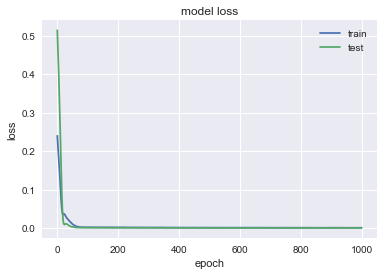

               BBY
MSE        1.98602
MAE       0.941563
R2        0.941499
MAPE (%)   1.40714


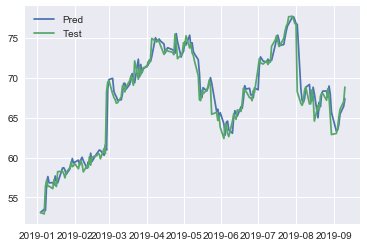

Predicting for  KO
Train on 1008 samples, validate on 172 samples
Epoch 1/1000
0s - loss: 0.1126 - val_loss: 0.4177
Epoch 2/1000
0s - loss: 0.1030 - val_loss: 0.3940
Epoch 3/1000
0s - loss: 0.0937 - val_loss: 0.3698
Epoch 4/1000
0s - loss: 0.0842 - val_loss: 0.3447
Epoch 5/1000
0s - loss: 0.0748 - val_loss: 0.3186
Epoch 6/1000
0s - loss: 0.0653 - val_loss: 0.2914
Epoch 7/1000
0s - loss: 0.0558 - val_loss: 0.2632
Epoch 8/1000
0s - loss: 0.0463 - val_loss: 0.2341
Epoch 9/1000
0s - loss: 0.0378 - val_loss: 0.2046
Epoch 10/1000
0s - loss: 0.0292 - val_loss: 0.1751
Epoch 11/1000
0s - loss: 0.0223 - val_loss: 0.1467
Epoch 12/1000
0s - loss: 0.0162 - val_loss: 0.1201
Epoch 13/1000
0s - loss: 0.0122 - val_loss: 0.0965
Epoch 14/1000
0s - loss: 0.0097 - val_loss: 0.0768
Epoch 15/1000
0s - loss: 0.0089 - val_loss: 0.0614
Epoch 16/1000
0s - loss: 0.0094 - val_loss: 0.0506
Epoch 17/1000
0s - loss: 0.0104 - val_loss: 0.0439
Epoch 18/1000
0s - loss: 0.0109 - val_loss: 0.0405
Epoch 19/1000
0s - loss: 

0s - loss: 0.0011 - val_loss: 0.0022
Epoch 161/1000
0s - loss: 0.0011 - val_loss: 0.0023
Epoch 162/1000
0s - loss: 0.0011 - val_loss: 0.0022
Epoch 163/1000
0s - loss: 0.0011 - val_loss: 0.0022
Epoch 164/1000
0s - loss: 0.0011 - val_loss: 0.0023
Epoch 165/1000
0s - loss: 0.0012 - val_loss: 0.0022
Epoch 166/1000
0s - loss: 0.0011 - val_loss: 0.0021
Epoch 167/1000
0s - loss: 0.0012 - val_loss: 0.0021
Epoch 168/1000
0s - loss: 0.0011 - val_loss: 0.0021
Epoch 169/1000
0s - loss: 0.0011 - val_loss: 0.0021
Epoch 170/1000
0s - loss: 0.0011 - val_loss: 0.0022
Epoch 171/1000
0s - loss: 0.0011 - val_loss: 0.0022
Epoch 172/1000
0s - loss: 0.0010 - val_loss: 0.0021
Epoch 173/1000
0s - loss: 0.0011 - val_loss: 0.0020
Epoch 174/1000
0s - loss: 0.0011 - val_loss: 0.0021
Epoch 175/1000
0s - loss: 0.0011 - val_loss: 0.0020
Epoch 176/1000
0s - loss: 0.0011 - val_loss: 0.0020
Epoch 177/1000
0s - loss: 0.0011 - val_loss: 0.0021
Epoch 178/1000
0s - loss: 0.0012 - val_loss: 0.0021
Epoch 179/1000
0s - loss: 0

0s - loss: 9.9086e-04 - val_loss: 0.0011
Epoch 318/1000
0s - loss: 9.9492e-04 - val_loss: 0.0011
Epoch 319/1000
0s - loss: 0.0010 - val_loss: 0.0011
Epoch 320/1000
0s - loss: 9.5896e-04 - val_loss: 0.0012
Epoch 321/1000
0s - loss: 9.1684e-04 - val_loss: 0.0013
Epoch 322/1000
0s - loss: 9.5896e-04 - val_loss: 0.0012
Epoch 323/1000
0s - loss: 9.9361e-04 - val_loss: 0.0011
Epoch 324/1000
0s - loss: 9.9609e-04 - val_loss: 0.0010
Epoch 325/1000
0s - loss: 9.8415e-04 - val_loss: 0.0010
Epoch 326/1000
0s - loss: 9.6800e-04 - val_loss: 0.0011
Epoch 327/1000
0s - loss: 0.0010 - val_loss: 0.0012
Epoch 328/1000
0s - loss: 9.7646e-04 - val_loss: 0.0011
Epoch 329/1000
0s - loss: 8.8262e-04 - val_loss: 0.0010
Epoch 330/1000
0s - loss: 9.9623e-04 - val_loss: 9.8528e-04
Epoch 331/1000
0s - loss: 0.0011 - val_loss: 9.9500e-04
Epoch 332/1000
0s - loss: 9.6358e-04 - val_loss: 0.0010
Epoch 333/1000
0s - loss: 9.3489e-04 - val_loss: 0.0010
Epoch 334/1000
0s - loss: 0.0011 - val_loss: 0.0010
Epoch 335/1000


0s - loss: 8.1832e-04 - val_loss: 7.5581e-04
Epoch 457/1000
0s - loss: 8.1379e-04 - val_loss: 7.9056e-04
Epoch 458/1000
0s - loss: 9.0367e-04 - val_loss: 7.7093e-04
Epoch 459/1000
0s - loss: 8.8250e-04 - val_loss: 7.8104e-04
Epoch 460/1000
0s - loss: 8.9523e-04 - val_loss: 8.1449e-04
Epoch 461/1000
0s - loss: 8.9937e-04 - val_loss: 7.5185e-04
Epoch 462/1000
0s - loss: 8.4290e-04 - val_loss: 7.9100e-04
Epoch 463/1000
0s - loss: 8.4293e-04 - val_loss: 7.4992e-04
Epoch 464/1000
0s - loss: 7.8654e-04 - val_loss: 7.6688e-04
Epoch 465/1000
0s - loss: 8.1855e-04 - val_loss: 7.5204e-04
Epoch 466/1000
0s - loss: 8.2348e-04 - val_loss: 7.5521e-04
Epoch 467/1000
0s - loss: 9.1310e-04 - val_loss: 7.5784e-04
Epoch 468/1000
0s - loss: 8.8650e-04 - val_loss: 7.5168e-04
Epoch 469/1000
0s - loss: 8.9589e-04 - val_loss: 7.5243e-04
Epoch 470/1000
0s - loss: 8.0754e-04 - val_loss: 7.4968e-04
Epoch 471/1000
0s - loss: 8.8432e-04 - val_loss: 7.5275e-04
Epoch 472/1000
0s - loss: 9.3673e-04 - val_loss: 7.4613

0s - loss: 8.2061e-04 - val_loss: 8.2555e-04
Epoch 596/1000
0s - loss: 7.8531e-04 - val_loss: 8.6184e-04
Epoch 597/1000
0s - loss: 7.9656e-04 - val_loss: 8.1014e-04
Epoch 598/1000
0s - loss: 8.2436e-04 - val_loss: 7.7636e-04
Epoch 599/1000
0s - loss: 7.6103e-04 - val_loss: 7.7885e-04
Epoch 600/1000
0s - loss: 8.0685e-04 - val_loss: 8.0948e-04
Epoch 601/1000
0s - loss: 7.9679e-04 - val_loss: 7.7219e-04
Epoch 602/1000
0s - loss: 7.5292e-04 - val_loss: 7.7242e-04
Epoch 603/1000
0s - loss: 7.9107e-04 - val_loss: 7.9351e-04
Epoch 604/1000
0s - loss: 8.2419e-04 - val_loss: 7.6830e-04
Epoch 605/1000
0s - loss: 7.4924e-04 - val_loss: 7.6254e-04
Epoch 606/1000
0s - loss: 8.2820e-04 - val_loss: 7.7970e-04
Epoch 607/1000
0s - loss: 7.9629e-04 - val_loss: 7.6199e-04
Epoch 608/1000
0s - loss: 8.3681e-04 - val_loss: 8.0342e-04
Epoch 609/1000
0s - loss: 7.5309e-04 - val_loss: 8.6813e-04
Epoch 610/1000
0s - loss: 7.8306e-04 - val_loss: 8.2459e-04
Epoch 611/1000
0s - loss: 8.7751e-04 - val_loss: 7.3993

0s - loss: 7.0498e-04 - val_loss: 8.3683e-04
Epoch 735/1000
0s - loss: 7.5253e-04 - val_loss: 9.3250e-04
Epoch 736/1000
0s - loss: 7.0151e-04 - val_loss: 8.3807e-04
Epoch 737/1000
0s - loss: 7.0996e-04 - val_loss: 8.3126e-04
Epoch 738/1000
0s - loss: 7.4941e-04 - val_loss: 8.5734e-04
Epoch 739/1000
0s - loss: 6.9651e-04 - val_loss: 9.1374e-04
Epoch 740/1000
0s - loss: 7.1516e-04 - val_loss: 9.1927e-04
Epoch 741/1000
0s - loss: 7.1327e-04 - val_loss: 8.4633e-04
Epoch 742/1000
0s - loss: 7.1220e-04 - val_loss: 7.9870e-04
Epoch 743/1000
0s - loss: 7.0982e-04 - val_loss: 9.2953e-04
Epoch 744/1000
0s - loss: 7.1310e-04 - val_loss: 0.0011
Epoch 745/1000
0s - loss: 7.4528e-04 - val_loss: 9.1634e-04
Epoch 746/1000
0s - loss: 7.3162e-04 - val_loss: 7.7096e-04
Epoch 747/1000
0s - loss: 7.3460e-04 - val_loss: 9.6856e-04
Epoch 748/1000
0s - loss: 7.2142e-04 - val_loss: 0.0011
Epoch 749/1000
0s - loss: 7.5408e-04 - val_loss: 9.4489e-04
Epoch 750/1000
0s - loss: 7.3539e-04 - val_loss: 8.7459e-04
Epo

0s - loss: 6.8396e-04 - val_loss: 9.1942e-04
Epoch 872/1000
0s - loss: 7.0176e-04 - val_loss: 8.3598e-04
Epoch 873/1000
0s - loss: 6.8568e-04 - val_loss: 8.7198e-04
Epoch 874/1000
0s - loss: 6.9124e-04 - val_loss: 9.5644e-04
Epoch 875/1000
0s - loss: 6.9821e-04 - val_loss: 8.8415e-04
Epoch 876/1000
0s - loss: 6.7444e-04 - val_loss: 8.6847e-04
Epoch 877/1000
0s - loss: 6.4039e-04 - val_loss: 9.7062e-04
Epoch 878/1000
0s - loss: 6.6230e-04 - val_loss: 8.9313e-04
Epoch 879/1000
0s - loss: 6.7729e-04 - val_loss: 8.8174e-04
Epoch 880/1000
0s - loss: 6.6367e-04 - val_loss: 9.0104e-04
Epoch 881/1000
0s - loss: 6.7456e-04 - val_loss: 8.5003e-04
Epoch 882/1000
0s - loss: 6.8508e-04 - val_loss: 8.9926e-04
Epoch 883/1000
0s - loss: 6.3110e-04 - val_loss: 8.9111e-04
Epoch 884/1000
0s - loss: 6.5311e-04 - val_loss: 8.4491e-04
Epoch 885/1000
0s - loss: 6.7073e-04 - val_loss: 8.6933e-04
Epoch 886/1000
0s - loss: 6.8608e-04 - val_loss: 8.7905e-04
Epoch 887/1000
0s - loss: 6.2086e-04 - val_loss: 8.7804

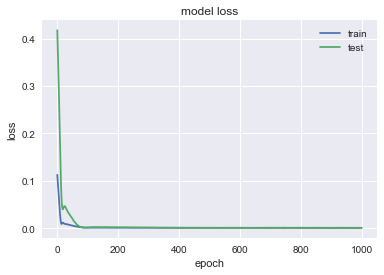

                KO
MSE       0.275455
MAE       0.380893
R2        0.967018
MAPE (%)  0.761222


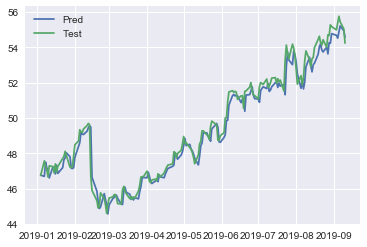

Predicting for  FTI
Train on 1008 samples, validate on 172 samples
Epoch 1/1000
0s - loss: 0.2176 - val_loss: 0.0295
Epoch 2/1000
0s - loss: 0.2020 - val_loss: 0.0248
Epoch 3/1000
0s - loss: 0.1870 - val_loss: 0.0204
Epoch 4/1000
0s - loss: 0.1720 - val_loss: 0.0163
Epoch 5/1000
0s - loss: 0.1571 - val_loss: 0.0125
Epoch 6/1000
0s - loss: 0.1419 - val_loss: 0.0091
Epoch 7/1000
0s - loss: 0.1262 - val_loss: 0.0061
Epoch 8/1000
0s - loss: 0.1103 - val_loss: 0.0038
Epoch 9/1000
0s - loss: 0.0942 - val_loss: 0.0024
Epoch 10/1000
0s - loss: 0.0792 - val_loss: 0.0021
Epoch 11/1000
0s - loss: 0.0638 - val_loss: 0.0032
Epoch 12/1000
0s - loss: 0.0505 - val_loss: 0.0060
Epoch 13/1000
0s - loss: 0.0378 - val_loss: 0.0104
Epoch 14/1000
0s - loss: 0.0287 - val_loss: 0.0164
Epoch 15/1000
0s - loss: 0.0212 - val_loss: 0.0232
Epoch 16/1000
0s - loss: 0.0176 - val_loss: 0.0300
Epoch 17/1000
0s - loss: 0.0153 - val_loss: 0.0354
Epoch 18/1000
0s - loss: 0.0144 - val_loss: 0.0385
Epoch 19/1000
0s - loss:

0s - loss: 0.0018 - val_loss: 6.2277e-04
Epoch 157/1000
0s - loss: 0.0019 - val_loss: 6.6840e-04
Epoch 158/1000
0s - loss: 0.0019 - val_loss: 6.7405e-04
Epoch 159/1000
0s - loss: 0.0020 - val_loss: 6.3396e-04
Epoch 160/1000
0s - loss: 0.0019 - val_loss: 5.9057e-04
Epoch 161/1000
0s - loss: 0.0017 - val_loss: 5.7081e-04
Epoch 162/1000
0s - loss: 0.0019 - val_loss: 6.0528e-04
Epoch 163/1000
0s - loss: 0.0019 - val_loss: 6.3119e-04
Epoch 164/1000
0s - loss: 0.0019 - val_loss: 6.2031e-04
Epoch 165/1000
0s - loss: 0.0018 - val_loss: 5.9886e-04
Epoch 166/1000
0s - loss: 0.0017 - val_loss: 6.1237e-04
Epoch 167/1000
0s - loss: 0.0020 - val_loss: 6.2386e-04
Epoch 168/1000
0s - loss: 0.0018 - val_loss: 6.2105e-04
Epoch 169/1000
0s - loss: 0.0018 - val_loss: 6.3377e-04
Epoch 170/1000
0s - loss: 0.0020 - val_loss: 6.2785e-04
Epoch 171/1000
0s - loss: 0.0019 - val_loss: 5.9295e-04
Epoch 172/1000
0s - loss: 0.0018 - val_loss: 5.5015e-04
Epoch 173/1000
0s - loss: 0.0019 - val_loss: 5.4738e-04
Epoch 1

0s - loss: 0.0016 - val_loss: 3.7586e-04
Epoch 305/1000
0s - loss: 0.0017 - val_loss: 3.7139e-04
Epoch 306/1000
0s - loss: 0.0014 - val_loss: 3.8363e-04
Epoch 307/1000
0s - loss: 0.0015 - val_loss: 3.9051e-04
Epoch 308/1000
0s - loss: 0.0015 - val_loss: 3.9975e-04
Epoch 309/1000
0s - loss: 0.0015 - val_loss: 3.8340e-04
Epoch 310/1000
0s - loss: 0.0015 - val_loss: 3.5654e-04
Epoch 311/1000
0s - loss: 0.0015 - val_loss: 3.4104e-04
Epoch 312/1000
0s - loss: 0.0016 - val_loss: 3.5467e-04
Epoch 313/1000
0s - loss: 0.0015 - val_loss: 3.6825e-04
Epoch 314/1000
0s - loss: 0.0014 - val_loss: 3.6717e-04
Epoch 315/1000
0s - loss: 0.0016 - val_loss: 3.5779e-04
Epoch 316/1000
0s - loss: 0.0015 - val_loss: 3.6343e-04
Epoch 317/1000
0s - loss: 0.0014 - val_loss: 3.8627e-04
Epoch 318/1000
0s - loss: 0.0014 - val_loss: 4.0209e-04
Epoch 319/1000
0s - loss: 0.0015 - val_loss: 3.7506e-04
Epoch 320/1000
0s - loss: 0.0015 - val_loss: 3.4956e-04
Epoch 321/1000
0s - loss: 0.0016 - val_loss: 3.4447e-04
Epoch 3

0s - loss: 0.0014 - val_loss: 3.2604e-04
Epoch 453/1000
0s - loss: 0.0014 - val_loss: 3.2568e-04
Epoch 454/1000
0s - loss: 0.0013 - val_loss: 3.2558e-04
Epoch 455/1000
0s - loss: 0.0014 - val_loss: 3.2558e-04
Epoch 456/1000
0s - loss: 0.0014 - val_loss: 3.2711e-04
Epoch 457/1000
0s - loss: 0.0015 - val_loss: 3.2648e-04
Epoch 458/1000
0s - loss: 0.0013 - val_loss: 3.2688e-04
Epoch 459/1000
0s - loss: 0.0013 - val_loss: 3.2668e-04
Epoch 460/1000
0s - loss: 0.0015 - val_loss: 3.2774e-04
Epoch 461/1000
0s - loss: 0.0014 - val_loss: 3.3042e-04
Epoch 462/1000
0s - loss: 0.0014 - val_loss: 3.2770e-04
Epoch 463/1000
0s - loss: 0.0014 - val_loss: 3.2797e-04
Epoch 464/1000
0s - loss: 0.0014 - val_loss: 3.2976e-04
Epoch 465/1000
0s - loss: 0.0015 - val_loss: 3.2776e-04
Epoch 466/1000
0s - loss: 0.0014 - val_loss: 3.3329e-04
Epoch 467/1000
0s - loss: 0.0013 - val_loss: 3.4206e-04
Epoch 468/1000
0s - loss: 0.0014 - val_loss: 3.2763e-04
Epoch 469/1000
0s - loss: 0.0013 - val_loss: 3.3062e-04
Epoch 4

0s - loss: 0.0012 - val_loss: 3.4324e-04
Epoch 601/1000
0s - loss: 0.0012 - val_loss: 3.4385e-04
Epoch 602/1000
0s - loss: 0.0012 - val_loss: 3.3584e-04
Epoch 603/1000
0s - loss: 0.0012 - val_loss: 3.3446e-04
Epoch 604/1000
0s - loss: 0.0012 - val_loss: 3.3548e-04
Epoch 605/1000
0s - loss: 0.0011 - val_loss: 3.3872e-04
Epoch 606/1000
0s - loss: 0.0013 - val_loss: 3.4258e-04
Epoch 607/1000
0s - loss: 0.0012 - val_loss: 3.4240e-04
Epoch 608/1000
0s - loss: 0.0012 - val_loss: 3.5994e-04
Epoch 609/1000
0s - loss: 0.0013 - val_loss: 3.4519e-04
Epoch 610/1000
0s - loss: 0.0012 - val_loss: 3.3589e-04
Epoch 611/1000
0s - loss: 0.0012 - val_loss: 3.3431e-04
Epoch 612/1000
0s - loss: 0.0012 - val_loss: 3.4231e-04
Epoch 613/1000
0s - loss: 0.0013 - val_loss: 3.3738e-04
Epoch 614/1000
0s - loss: 0.0012 - val_loss: 3.3351e-04
Epoch 615/1000
0s - loss: 0.0013 - val_loss: 3.3397e-04
Epoch 616/1000
0s - loss: 0.0012 - val_loss: 3.5037e-04
Epoch 617/1000
0s - loss: 0.0013 - val_loss: 3.4414e-04
Epoch 6

0s - loss: 0.0011 - val_loss: 3.3382e-04
Epoch 749/1000
0s - loss: 0.0013 - val_loss: 3.4132e-04
Epoch 750/1000
0s - loss: 0.0012 - val_loss: 3.3784e-04
Epoch 751/1000
0s - loss: 0.0011 - val_loss: 3.3484e-04
Epoch 752/1000
0s - loss: 0.0012 - val_loss: 3.4121e-04
Epoch 753/1000
0s - loss: 0.0012 - val_loss: 3.4012e-04
Epoch 754/1000
0s - loss: 0.0011 - val_loss: 3.3450e-04
Epoch 755/1000
0s - loss: 0.0011 - val_loss: 3.3387e-04
Epoch 756/1000
0s - loss: 0.0011 - val_loss: 3.3691e-04
Epoch 757/1000
0s - loss: 0.0011 - val_loss: 3.3459e-04
Epoch 758/1000
0s - loss: 0.0012 - val_loss: 3.3525e-04
Epoch 759/1000
0s - loss: 0.0011 - val_loss: 3.3922e-04
Epoch 760/1000
0s - loss: 0.0010 - val_loss: 3.3374e-04
Epoch 761/1000
0s - loss: 0.0011 - val_loss: 3.3461e-04
Epoch 762/1000
0s - loss: 0.0011 - val_loss: 3.3916e-04
Epoch 763/1000
0s - loss: 0.0012 - val_loss: 3.3642e-04
Epoch 764/1000
0s - loss: 0.0011 - val_loss: 3.3547e-04
Epoch 765/1000
0s - loss: 0.0011 - val_loss: 3.3420e-04
Epoch 7

0s - loss: 0.0011 - val_loss: 3.3486e-04
Epoch 897/1000
0s - loss: 0.0011 - val_loss: 3.5015e-04
Epoch 898/1000
0s - loss: 0.0010 - val_loss: 3.4671e-04
Epoch 899/1000
0s - loss: 9.8248e-04 - val_loss: 3.3461e-04
Epoch 900/1000
0s - loss: 0.0011 - val_loss: 3.3511e-04
Epoch 901/1000
0s - loss: 0.0011 - val_loss: 3.4006e-04
Epoch 902/1000
0s - loss: 0.0011 - val_loss: 3.3477e-04
Epoch 903/1000
0s - loss: 0.0011 - val_loss: 3.3323e-04
Epoch 904/1000
0s - loss: 0.0010 - val_loss: 3.3888e-04
Epoch 905/1000
0s - loss: 0.0011 - val_loss: 3.3751e-04
Epoch 906/1000
0s - loss: 0.0010 - val_loss: 3.3325e-04
Epoch 907/1000
0s - loss: 0.0011 - val_loss: 3.3789e-04
Epoch 908/1000
0s - loss: 0.0010 - val_loss: 3.4060e-04
Epoch 909/1000
0s - loss: 0.0010 - val_loss: 3.3246e-04
Epoch 910/1000
0s - loss: 0.0011 - val_loss: 3.3353e-04
Epoch 911/1000
0s - loss: 0.0011 - val_loss: 3.3773e-04
Epoch 912/1000
0s - loss: 0.0010 - val_loss: 3.3500e-04
Epoch 913/1000
0s - loss: 9.4815e-04 - val_loss: 3.3415e-04

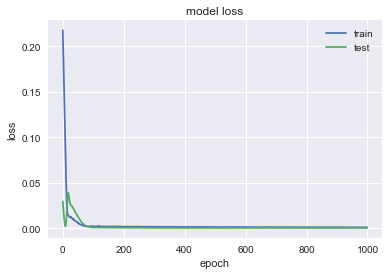

               FTI
MSE       0.272845
MAE       0.423681
R2        0.874098
MAPE (%)   1.77829


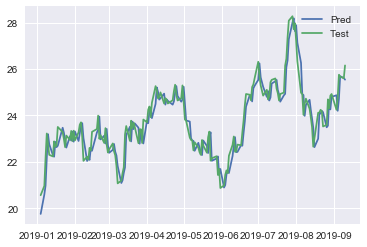

Predicting for  BLK
Train on 1008 samples, validate on 172 samples
Epoch 1/1000
0s - loss: 0.1957 - val_loss: 0.2402
Epoch 2/1000
0s - loss: 0.1837 - val_loss: 0.2249
Epoch 3/1000
0s - loss: 0.1720 - val_loss: 0.2097
Epoch 4/1000
0s - loss: 0.1604 - val_loss: 0.1944
Epoch 5/1000
0s - loss: 0.1488 - val_loss: 0.1789
Epoch 6/1000
0s - loss: 0.1371 - val_loss: 0.1631
Epoch 7/1000
0s - loss: 0.1254 - val_loss: 0.1468
Epoch 8/1000
0s - loss: 0.1132 - val_loss: 0.1303
Epoch 9/1000
0s - loss: 0.1011 - val_loss: 0.1135
Epoch 10/1000
0s - loss: 0.0888 - val_loss: 0.0968
Epoch 11/1000
0s - loss: 0.0771 - val_loss: 0.0803
Epoch 12/1000
0s - loss: 0.0660 - val_loss: 0.0646
Epoch 13/1000
0s - loss: 0.0556 - val_loss: 0.0500
Epoch 14/1000
0s - loss: 0.0465 - val_loss: 0.0371
Epoch 15/1000
0s - loss: 0.0390 - val_loss: 0.0262
Epoch 16/1000
0s - loss: 0.0332 - val_loss: 0.0177
Epoch 17/1000
0s - loss: 0.0292 - val_loss: 0.0115
Epoch 18/1000
0s - loss: 0.0272 - val_loss: 0.0074
Epoch 19/1000
0s - loss:

0s - loss: 0.0016 - val_loss: 5.6691e-04
Epoch 153/1000
0s - loss: 0.0016 - val_loss: 6.1826e-04
Epoch 154/1000
0s - loss: 0.0018 - val_loss: 6.8002e-04
Epoch 155/1000
0s - loss: 0.0018 - val_loss: 7.2366e-04
Epoch 156/1000
0s - loss: 0.0016 - val_loss: 7.0695e-04
Epoch 157/1000
0s - loss: 0.0016 - val_loss: 6.7902e-04
Epoch 158/1000
0s - loss: 0.0017 - val_loss: 6.4273e-04
Epoch 159/1000
0s - loss: 0.0017 - val_loss: 6.1340e-04
Epoch 160/1000
0s - loss: 0.0015 - val_loss: 6.2027e-04
Epoch 161/1000
0s - loss: 0.0015 - val_loss: 6.4645e-04
Epoch 162/1000
0s - loss: 0.0018 - val_loss: 6.2083e-04
Epoch 163/1000
0s - loss: 0.0017 - val_loss: 5.8987e-04
Epoch 164/1000
0s - loss: 0.0016 - val_loss: 5.5741e-04
Epoch 165/1000
0s - loss: 0.0017 - val_loss: 5.5366e-04
Epoch 166/1000
0s - loss: 0.0015 - val_loss: 5.6000e-04
Epoch 167/1000
0s - loss: 0.0018 - val_loss: 6.0159e-04
Epoch 168/1000
0s - loss: 0.0017 - val_loss: 6.6993e-04
Epoch 169/1000
0s - loss: 0.0017 - val_loss: 7.2915e-04
Epoch 1

0s - loss: 0.0013 - val_loss: 5.0580e-04
Epoch 301/1000
0s - loss: 0.0012 - val_loss: 5.1949e-04
Epoch 302/1000
0s - loss: 0.0014 - val_loss: 5.2628e-04
Epoch 303/1000
0s - loss: 0.0013 - val_loss: 5.0986e-04
Epoch 304/1000
0s - loss: 0.0014 - val_loss: 4.6112e-04
Epoch 305/1000
0s - loss: 0.0014 - val_loss: 4.3922e-04
Epoch 306/1000
0s - loss: 0.0014 - val_loss: 4.4416e-04
Epoch 307/1000
0s - loss: 0.0013 - val_loss: 4.7232e-04
Epoch 308/1000
0s - loss: 0.0014 - val_loss: 4.4319e-04
Epoch 309/1000
0s - loss: 0.0014 - val_loss: 4.1915e-04
Epoch 310/1000
0s - loss: 0.0013 - val_loss: 4.2952e-04
Epoch 311/1000
0s - loss: 0.0014 - val_loss: 4.5678e-04
Epoch 312/1000
0s - loss: 0.0012 - val_loss: 5.1016e-04
Epoch 313/1000
0s - loss: 0.0014 - val_loss: 5.3297e-04
Epoch 314/1000
0s - loss: 0.0013 - val_loss: 4.7699e-04
Epoch 315/1000
0s - loss: 0.0014 - val_loss: 4.3435e-04
Epoch 316/1000
0s - loss: 0.0013 - val_loss: 4.2660e-04
Epoch 317/1000
0s - loss: 0.0013 - val_loss: 4.4495e-04
Epoch 3

0s - loss: 0.0011 - val_loss: 3.4388e-04
Epoch 449/1000
0s - loss: 0.0012 - val_loss: 3.3453e-04
Epoch 450/1000
0s - loss: 0.0012 - val_loss: 3.3131e-04
Epoch 451/1000
0s - loss: 0.0013 - val_loss: 3.4241e-04
Epoch 452/1000
0s - loss: 0.0011 - val_loss: 3.4655e-04
Epoch 453/1000
0s - loss: 0.0012 - val_loss: 3.4875e-04
Epoch 454/1000
0s - loss: 0.0011 - val_loss: 3.4522e-04
Epoch 455/1000
0s - loss: 0.0011 - val_loss: 3.4727e-04
Epoch 456/1000
0s - loss: 0.0011 - val_loss: 3.8009e-04
Epoch 457/1000
0s - loss: 0.0010 - val_loss: 3.9272e-04
Epoch 458/1000
0s - loss: 0.0011 - val_loss: 3.7558e-04
Epoch 459/1000
0s - loss: 0.0010 - val_loss: 3.6807e-04
Epoch 460/1000
0s - loss: 0.0011 - val_loss: 3.5164e-04
Epoch 461/1000
0s - loss: 0.0012 - val_loss: 3.3196e-04
Epoch 462/1000
0s - loss: 0.0011 - val_loss: 3.3350e-04
Epoch 463/1000
0s - loss: 0.0012 - val_loss: 3.5802e-04
Epoch 464/1000
0s - loss: 0.0011 - val_loss: 3.7425e-04
Epoch 465/1000
0s - loss: 0.0011 - val_loss: 3.4373e-04
Epoch 4

0s - loss: 0.0011 - val_loss: 3.2621e-04
Epoch 596/1000
0s - loss: 0.0011 - val_loss: 3.2891e-04
Epoch 597/1000
0s - loss: 0.0011 - val_loss: 3.3029e-04
Epoch 598/1000
0s - loss: 9.9745e-04 - val_loss: 3.2276e-04
Epoch 599/1000
0s - loss: 0.0011 - val_loss: 3.2758e-04
Epoch 600/1000
0s - loss: 9.9277e-04 - val_loss: 3.2934e-04
Epoch 601/1000
0s - loss: 8.8977e-04 - val_loss: 3.2546e-04
Epoch 602/1000
0s - loss: 0.0010 - val_loss: 3.3339e-04
Epoch 603/1000
0s - loss: 0.0012 - val_loss: 3.3640e-04
Epoch 604/1000
0s - loss: 0.0010 - val_loss: 3.2673e-04
Epoch 605/1000
0s - loss: 9.7917e-04 - val_loss: 3.2322e-04
Epoch 606/1000
0s - loss: 0.0010 - val_loss: 3.4323e-04
Epoch 607/1000
0s - loss: 0.0011 - val_loss: 3.6061e-04
Epoch 608/1000
0s - loss: 9.0175e-04 - val_loss: 3.3995e-04
Epoch 609/1000
0s - loss: 0.0010 - val_loss: 3.3251e-04
Epoch 610/1000
0s - loss: 0.0010 - val_loss: 3.2818e-04
Epoch 611/1000
0s - loss: 8.9688e-04 - val_loss: 3.2699e-04
Epoch 612/1000
0s - loss: 0.0011 - val_

0s - loss: 8.8165e-04 - val_loss: 3.3005e-04
Epoch 740/1000
0s - loss: 9.3520e-04 - val_loss: 3.3959e-04
Epoch 741/1000
0s - loss: 9.4473e-04 - val_loss: 3.2684e-04
Epoch 742/1000
0s - loss: 9.3292e-04 - val_loss: 3.2073e-04
Epoch 743/1000
0s - loss: 8.7573e-04 - val_loss: 3.2362e-04
Epoch 744/1000
0s - loss: 9.5288e-04 - val_loss: 3.2637e-04
Epoch 745/1000
0s - loss: 0.0010 - val_loss: 3.2451e-04
Epoch 746/1000
0s - loss: 9.6756e-04 - val_loss: 3.2838e-04
Epoch 747/1000
0s - loss: 9.6271e-04 - val_loss: 3.2872e-04
Epoch 748/1000
0s - loss: 8.9588e-04 - val_loss: 3.2414e-04
Epoch 749/1000
0s - loss: 9.5884e-04 - val_loss: 3.2738e-04
Epoch 750/1000
0s - loss: 9.5036e-04 - val_loss: 3.4269e-04
Epoch 751/1000
0s - loss: 8.4867e-04 - val_loss: 3.3261e-04
Epoch 752/1000
0s - loss: 8.8300e-04 - val_loss: 3.3128e-04
Epoch 753/1000
0s - loss: 9.0302e-04 - val_loss: 3.3408e-04
Epoch 754/1000
0s - loss: 9.1591e-04 - val_loss: 3.2786e-04
Epoch 755/1000
0s - loss: 9.3959e-04 - val_loss: 3.2210e-04

0s - loss: 8.4829e-04 - val_loss: 3.4148e-04
Epoch 880/1000
0s - loss: 8.3630e-04 - val_loss: 3.4186e-04
Epoch 881/1000
0s - loss: 8.3027e-04 - val_loss: 3.3430e-04
Epoch 882/1000
0s - loss: 9.3241e-04 - val_loss: 3.2093e-04
Epoch 883/1000
0s - loss: 9.7445e-04 - val_loss: 3.2088e-04
Epoch 884/1000
0s - loss: 0.0010 - val_loss: 3.2486e-04
Epoch 885/1000
0s - loss: 8.9400e-04 - val_loss: 3.3103e-04
Epoch 886/1000
0s - loss: 7.8337e-04 - val_loss: 3.3571e-04
Epoch 887/1000
0s - loss: 9.7238e-04 - val_loss: 3.2205e-04
Epoch 888/1000
0s - loss: 8.0101e-04 - val_loss: 3.2248e-04
Epoch 889/1000
0s - loss: 8.4301e-04 - val_loss: 3.3636e-04
Epoch 890/1000
0s - loss: 8.4598e-04 - val_loss: 3.2687e-04
Epoch 891/1000
0s - loss: 8.9109e-04 - val_loss: 3.2197e-04
Epoch 892/1000
0s - loss: 8.8903e-04 - val_loss: 3.3392e-04
Epoch 893/1000
0s - loss: 8.1796e-04 - val_loss: 3.4599e-04
Epoch 894/1000
0s - loss: 8.1562e-04 - val_loss: 3.2363e-04
Epoch 895/1000
0s - loss: 8.2113e-04 - val_loss: 3.2196e-04

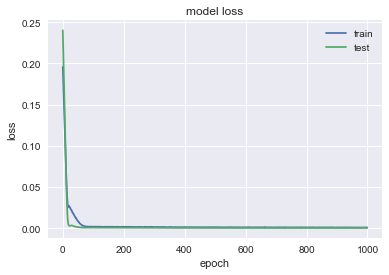

               BLK
MSE        30.5767
MAE        4.34313
R2        0.947651
MAPE (%)  0.989647


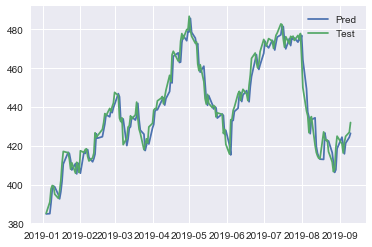

Predicting for  DVA
Train on 1008 samples, validate on 172 samples
Epoch 1/1000
0s - loss: 0.4190 - val_loss: 0.0725
Epoch 2/1000
0s - loss: 0.3949 - val_loss: 0.0646
Epoch 3/1000
0s - loss: 0.3713 - val_loss: 0.0568
Epoch 4/1000
0s - loss: 0.3471 - val_loss: 0.0491
Epoch 5/1000
0s - loss: 0.3214 - val_loss: 0.0415
Epoch 6/1000
0s - loss: 0.2952 - val_loss: 0.0340
Epoch 7/1000
0s - loss: 0.2674 - val_loss: 0.0268
Epoch 8/1000
0s - loss: 0.2376 - val_loss: 0.0199
Epoch 9/1000
0s - loss: 0.2076 - val_loss: 0.0139
Epoch 10/1000
0s - loss: 0.1768 - val_loss: 0.0091
Epoch 11/1000
0s - loss: 0.1446 - val_loss: 0.0060
Epoch 12/1000
0s - loss: 0.1132 - val_loss: 0.0052
Epoch 13/1000
0s - loss: 0.0842 - val_loss: 0.0074
Epoch 14/1000
0s - loss: 0.0592 - val_loss: 0.0130
Epoch 15/1000
0s - loss: 0.0379 - val_loss: 0.0220
Epoch 16/1000
0s - loss: 0.0238 - val_loss: 0.0335
Epoch 17/1000
0s - loss: 0.0157 - val_loss: 0.0458
Epoch 18/1000
0s - loss: 0.0138 - val_loss: 0.0559
Epoch 19/1000
0s - loss:

0s - loss: 0.0030 - val_loss: 0.0020
Epoch 161/1000
0s - loss: 0.0029 - val_loss: 0.0021
Epoch 162/1000
0s - loss: 0.0031 - val_loss: 0.0022
Epoch 163/1000
0s - loss: 0.0030 - val_loss: 0.0022
Epoch 164/1000
0s - loss: 0.0029 - val_loss: 0.0021
Epoch 165/1000
0s - loss: 0.0030 - val_loss: 0.0020
Epoch 166/1000
0s - loss: 0.0028 - val_loss: 0.0020
Epoch 167/1000
0s - loss: 0.0028 - val_loss: 0.0020
Epoch 168/1000
0s - loss: 0.0030 - val_loss: 0.0021
Epoch 169/1000
0s - loss: 0.0028 - val_loss: 0.0021
Epoch 170/1000
0s - loss: 0.0031 - val_loss: 0.0020
Epoch 171/1000
0s - loss: 0.0027 - val_loss: 0.0020
Epoch 172/1000
0s - loss: 0.0029 - val_loss: 0.0020
Epoch 173/1000
0s - loss: 0.0028 - val_loss: 0.0020
Epoch 174/1000
0s - loss: 0.0027 - val_loss: 0.0021
Epoch 175/1000
0s - loss: 0.0029 - val_loss: 0.0021
Epoch 176/1000
0s - loss: 0.0030 - val_loss: 0.0021
Epoch 177/1000
0s - loss: 0.0027 - val_loss: 0.0021
Epoch 178/1000
0s - loss: 0.0031 - val_loss: 0.0020
Epoch 179/1000
0s - loss: 0

0s - loss: 0.0025 - val_loss: 0.0015
Epoch 322/1000
0s - loss: 0.0025 - val_loss: 0.0015
Epoch 323/1000
0s - loss: 0.0023 - val_loss: 0.0015
Epoch 324/1000
0s - loss: 0.0025 - val_loss: 0.0014
Epoch 325/1000
0s - loss: 0.0024 - val_loss: 0.0014
Epoch 326/1000
0s - loss: 0.0024 - val_loss: 0.0014
Epoch 327/1000
0s - loss: 0.0024 - val_loss: 0.0015
Epoch 328/1000
0s - loss: 0.0025 - val_loss: 0.0015
Epoch 329/1000
0s - loss: 0.0025 - val_loss: 0.0014
Epoch 330/1000
0s - loss: 0.0024 - val_loss: 0.0013
Epoch 331/1000
0s - loss: 0.0024 - val_loss: 0.0013
Epoch 332/1000
0s - loss: 0.0024 - val_loss: 0.0014
Epoch 333/1000
0s - loss: 0.0025 - val_loss: 0.0015
Epoch 334/1000
0s - loss: 0.0025 - val_loss: 0.0014
Epoch 335/1000
0s - loss: 0.0023 - val_loss: 0.0014
Epoch 336/1000
0s - loss: 0.0025 - val_loss: 0.0014
Epoch 337/1000
0s - loss: 0.0025 - val_loss: 0.0014
Epoch 338/1000
0s - loss: 0.0024 - val_loss: 0.0014
Epoch 339/1000
0s - loss: 0.0021 - val_loss: 0.0014
Epoch 340/1000
0s - loss: 0

0s - loss: 0.0022 - val_loss: 8.7705e-04
Epoch 478/1000
0s - loss: 0.0022 - val_loss: 8.9990e-04
Epoch 479/1000
0s - loss: 0.0020 - val_loss: 8.9448e-04
Epoch 480/1000
0s - loss: 0.0020 - val_loss: 9.4719e-04
Epoch 481/1000
0s - loss: 0.0022 - val_loss: 0.0010
Epoch 482/1000
0s - loss: 0.0022 - val_loss: 9.4982e-04
Epoch 483/1000
0s - loss: 0.0022 - val_loss: 8.7804e-04
Epoch 484/1000
0s - loss: 0.0021 - val_loss: 8.9640e-04
Epoch 485/1000
0s - loss: 0.0022 - val_loss: 9.7714e-04
Epoch 486/1000
0s - loss: 0.0019 - val_loss: 9.5215e-04
Epoch 487/1000
0s - loss: 0.0020 - val_loss: 8.3316e-04
Epoch 488/1000
0s - loss: 0.0021 - val_loss: 8.5458e-04
Epoch 489/1000
0s - loss: 0.0020 - val_loss: 9.1869e-04
Epoch 490/1000
0s - loss: 0.0022 - val_loss: 8.7600e-04
Epoch 491/1000
0s - loss: 0.0022 - val_loss: 8.0732e-04
Epoch 492/1000
0s - loss: 0.0021 - val_loss: 8.3213e-04
Epoch 493/1000
0s - loss: 0.0020 - val_loss: 9.4638e-04
Epoch 494/1000
0s - loss: 0.0021 - val_loss: 9.3277e-04
Epoch 495/1

0s - loss: 0.0018 - val_loss: 7.1901e-04
Epoch 626/1000
0s - loss: 0.0019 - val_loss: 7.1581e-04
Epoch 627/1000
0s - loss: 0.0020 - val_loss: 7.0799e-04
Epoch 628/1000
0s - loss: 0.0019 - val_loss: 7.5051e-04
Epoch 629/1000
0s - loss: 0.0020 - val_loss: 7.6916e-04
Epoch 630/1000
0s - loss: 0.0018 - val_loss: 7.0596e-04
Epoch 631/1000
0s - loss: 0.0020 - val_loss: 7.0677e-04
Epoch 632/1000
0s - loss: 0.0020 - val_loss: 7.1181e-04
Epoch 633/1000
0s - loss: 0.0018 - val_loss: 7.0450e-04
Epoch 634/1000
0s - loss: 0.0020 - val_loss: 7.0946e-04
Epoch 635/1000
0s - loss: 0.0018 - val_loss: 7.0337e-04
Epoch 636/1000
0s - loss: 0.0017 - val_loss: 7.0405e-04
Epoch 637/1000
0s - loss: 0.0017 - val_loss: 7.1170e-04
Epoch 638/1000
0s - loss: 0.0018 - val_loss: 7.1177e-04
Epoch 639/1000
0s - loss: 0.0019 - val_loss: 7.0548e-04
Epoch 640/1000
0s - loss: 0.0018 - val_loss: 7.0305e-04
Epoch 641/1000
0s - loss: 0.0018 - val_loss: 7.1081e-04
Epoch 642/1000
0s - loss: 0.0019 - val_loss: 7.1353e-04
Epoch 6

0s - loss: 0.0017 - val_loss: 6.9860e-04
Epoch 773/1000
0s - loss: 0.0016 - val_loss: 7.0210e-04
Epoch 774/1000
0s - loss: 0.0016 - val_loss: 6.9980e-04
Epoch 775/1000
0s - loss: 0.0017 - val_loss: 7.0094e-04
Epoch 776/1000
0s - loss: 0.0017 - val_loss: 7.0366e-04
Epoch 777/1000
0s - loss: 0.0016 - val_loss: 6.9876e-04
Epoch 778/1000
0s - loss: 0.0017 - val_loss: 6.9865e-04
Epoch 779/1000
0s - loss: 0.0016 - val_loss: 6.9953e-04
Epoch 780/1000
0s - loss: 0.0018 - val_loss: 6.9880e-04
Epoch 781/1000
0s - loss: 0.0016 - val_loss: 7.0675e-04
Epoch 782/1000
0s - loss: 0.0018 - val_loss: 6.9915e-04
Epoch 783/1000
0s - loss: 0.0016 - val_loss: 7.0240e-04
Epoch 784/1000
0s - loss: 0.0017 - val_loss: 6.9871e-04
Epoch 785/1000
0s - loss: 0.0017 - val_loss: 6.9867e-04
Epoch 786/1000
0s - loss: 0.0018 - val_loss: 6.9893e-04
Epoch 787/1000
0s - loss: 0.0018 - val_loss: 7.0515e-04
Epoch 788/1000
0s - loss: 0.0016 - val_loss: 6.9867e-04
Epoch 789/1000
0s - loss: 0.0017 - val_loss: 6.9848e-04
Epoch 7

0s - loss: 0.0016 - val_loss: 7.0079e-04
Epoch 923/1000
0s - loss: 0.0014 - val_loss: 6.9851e-04
Epoch 924/1000
0s - loss: 0.0014 - val_loss: 7.0054e-04
Epoch 925/1000
0s - loss: 0.0014 - val_loss: 7.0623e-04
Epoch 926/1000
0s - loss: 0.0015 - val_loss: 6.9864e-04
Epoch 927/1000
0s - loss: 0.0016 - val_loss: 6.9949e-04
Epoch 928/1000
0s - loss: 0.0016 - val_loss: 7.0053e-04
Epoch 929/1000
0s - loss: 0.0014 - val_loss: 6.9922e-04
Epoch 930/1000
0s - loss: 0.0015 - val_loss: 7.0080e-04
Epoch 931/1000
0s - loss: 0.0015 - val_loss: 7.0023e-04
Epoch 932/1000
0s - loss: 0.0015 - val_loss: 6.9911e-04
Epoch 933/1000
0s - loss: 0.0015 - val_loss: 6.9981e-04
Epoch 934/1000
0s - loss: 0.0014 - val_loss: 6.9900e-04
Epoch 935/1000
0s - loss: 0.0014 - val_loss: 6.9976e-04
Epoch 936/1000
0s - loss: 0.0014 - val_loss: 6.9994e-04
Epoch 937/1000
0s - loss: 0.0015 - val_loss: 6.9959e-04
Epoch 938/1000
0s - loss: 0.0014 - val_loss: 6.9933e-04
Epoch 939/1000
0s - loss: 0.0015 - val_loss: 7.0115e-04
Epoch 9

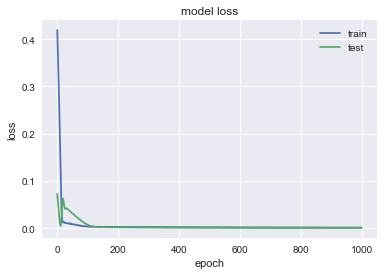

               DVA
MSE        1.21936
MAE       0.785633
R2        0.902531
MAPE (%)   1.45832


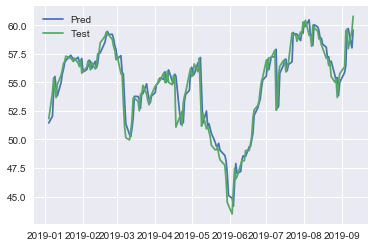

Predicting for  BA
Train on 1008 samples, validate on 172 samples
Epoch 1/1000
0s - loss: 0.1538 - val_loss: 0.5706
Epoch 2/1000
0s - loss: 0.1462 - val_loss: 0.5489
Epoch 3/1000
0s - loss: 0.1386 - val_loss: 0.5264
Epoch 4/1000
0s - loss: 0.1309 - val_loss: 0.5032
Epoch 5/1000
0s - loss: 0.1233 - val_loss: 0.4791
Epoch 6/1000
0s - loss: 0.1156 - val_loss: 0.4538
Epoch 7/1000
0s - loss: 0.1075 - val_loss: 0.4273
Epoch 8/1000
0s - loss: 0.0995 - val_loss: 0.3994
Epoch 9/1000
0s - loss: 0.0915 - val_loss: 0.3702
Epoch 10/1000
0s - loss: 0.0827 - val_loss: 0.3398
Epoch 11/1000
0s - loss: 0.0745 - val_loss: 0.3083
Epoch 12/1000
0s - loss: 0.0666 - val_loss: 0.2763
Epoch 13/1000
0s - loss: 0.0595 - val_loss: 0.2440
Epoch 14/1000
0s - loss: 0.0527 - val_loss: 0.2123
Epoch 15/1000
0s - loss: 0.0467 - val_loss: 0.1818
Epoch 16/1000
0s - loss: 0.0423 - val_loss: 0.1532
Epoch 17/1000
0s - loss: 0.0386 - val_loss: 0.1273
Epoch 18/1000
0s - loss: 0.0366 - val_loss: 0.1046
Epoch 19/1000
0s - loss: 

0s - loss: 0.0013 - val_loss: 0.0011
Epoch 158/1000
0s - loss: 0.0015 - val_loss: 0.0011
Epoch 159/1000
0s - loss: 0.0013 - val_loss: 9.5349e-04
Epoch 160/1000
0s - loss: 0.0014 - val_loss: 9.1591e-04
Epoch 161/1000
0s - loss: 0.0012 - val_loss: 9.0158e-04
Epoch 162/1000
0s - loss: 0.0013 - val_loss: 9.1649e-04
Epoch 163/1000
0s - loss: 0.0013 - val_loss: 9.6623e-04
Epoch 164/1000
0s - loss: 0.0013 - val_loss: 0.0010
Epoch 165/1000
0s - loss: 0.0013 - val_loss: 0.0010
Epoch 166/1000
0s - loss: 0.0014 - val_loss: 0.0011
Epoch 167/1000
0s - loss: 0.0014 - val_loss: 0.0011
Epoch 168/1000
0s - loss: 0.0012 - val_loss: 9.5529e-04
Epoch 169/1000
0s - loss: 0.0012 - val_loss: 9.0386e-04
Epoch 170/1000
0s - loss: 0.0013 - val_loss: 9.4146e-04
Epoch 171/1000
0s - loss: 0.0013 - val_loss: 0.0010
Epoch 172/1000
0s - loss: 0.0012 - val_loss: 0.0011
Epoch 173/1000
0s - loss: 0.0012 - val_loss: 0.0010
Epoch 174/1000
0s - loss: 0.0012 - val_loss: 9.6834e-04
Epoch 175/1000
0s - loss: 0.0013 - val_loss

0s - loss: 0.0012 - val_loss: 6.3950e-04
Epoch 306/1000
0s - loss: 0.0012 - val_loss: 6.1924e-04
Epoch 307/1000
0s - loss: 0.0011 - val_loss: 6.1538e-04
Epoch 308/1000
0s - loss: 0.0011 - val_loss: 6.1470e-04
Epoch 309/1000
0s - loss: 0.0011 - val_loss: 6.0864e-04
Epoch 310/1000
0s - loss: 0.0011 - val_loss: 6.0959e-04
Epoch 311/1000
0s - loss: 0.0011 - val_loss: 6.1761e-04
Epoch 312/1000
0s - loss: 0.0010 - val_loss: 6.1790e-04
Epoch 313/1000
0s - loss: 0.0011 - val_loss: 6.1114e-04
Epoch 314/1000
0s - loss: 0.0011 - val_loss: 6.1053e-04
Epoch 315/1000
0s - loss: 0.0011 - val_loss: 6.2569e-04
Epoch 316/1000
0s - loss: 0.0012 - val_loss: 6.2095e-04
Epoch 317/1000
0s - loss: 0.0010 - val_loss: 6.0154e-04
Epoch 318/1000
0s - loss: 0.0011 - val_loss: 5.9767e-04
Epoch 319/1000
0s - loss: 0.0010 - val_loss: 6.0766e-04
Epoch 320/1000
0s - loss: 0.0010 - val_loss: 6.1947e-04
Epoch 321/1000
0s - loss: 9.7494e-04 - val_loss: 5.9788e-04
Epoch 322/1000
0s - loss: 0.0011 - val_loss: 5.9085e-04
Epo

0s - loss: 9.7556e-04 - val_loss: 4.6024e-04
Epoch 450/1000
0s - loss: 9.0510e-04 - val_loss: 4.5902e-04
Epoch 451/1000
0s - loss: 8.4346e-04 - val_loss: 4.5834e-04
Epoch 452/1000
0s - loss: 8.1675e-04 - val_loss: 4.7258e-04
Epoch 453/1000
0s - loss: 8.8859e-04 - val_loss: 4.9368e-04
Epoch 454/1000
0s - loss: 9.7982e-04 - val_loss: 4.6222e-04
Epoch 455/1000
0s - loss: 8.4329e-04 - val_loss: 4.5970e-04
Epoch 456/1000
0s - loss: 0.0010 - val_loss: 4.5755e-04
Epoch 457/1000
0s - loss: 8.8143e-04 - val_loss: 4.5628e-04
Epoch 458/1000
0s - loss: 8.8054e-04 - val_loss: 4.5742e-04
Epoch 459/1000
0s - loss: 8.9217e-04 - val_loss: 4.6069e-04
Epoch 460/1000
0s - loss: 9.0085e-04 - val_loss: 4.5804e-04
Epoch 461/1000
0s - loss: 7.6731e-04 - val_loss: 4.5731e-04
Epoch 462/1000
0s - loss: 8.2475e-04 - val_loss: 4.5924e-04
Epoch 463/1000
0s - loss: 8.5989e-04 - val_loss: 4.5476e-04
Epoch 464/1000
0s - loss: 8.6503e-04 - val_loss: 4.5472e-04
Epoch 465/1000
0s - loss: 8.5650e-04 - val_loss: 4.5721e-04

0s - loss: 6.2691e-04 - val_loss: 4.9413e-04
Epoch 590/1000
0s - loss: 7.4092e-04 - val_loss: 4.4572e-04
Epoch 591/1000
0s - loss: 7.1810e-04 - val_loss: 4.2205e-04
Epoch 592/1000
0s - loss: 8.3976e-04 - val_loss: 4.2406e-04
Epoch 593/1000
0s - loss: 7.8998e-04 - val_loss: 4.3680e-04
Epoch 594/1000
0s - loss: 8.5531e-04 - val_loss: 4.4253e-04
Epoch 595/1000
0s - loss: 6.9804e-04 - val_loss: 4.4979e-04
Epoch 596/1000
0s - loss: 7.1795e-04 - val_loss: 4.4391e-04
Epoch 597/1000
0s - loss: 7.4834e-04 - val_loss: 4.7965e-04
Epoch 598/1000
0s - loss: 7.5448e-04 - val_loss: 5.0261e-04
Epoch 599/1000
0s - loss: 7.9168e-04 - val_loss: 4.7998e-04
Epoch 600/1000
0s - loss: 8.1071e-04 - val_loss: 4.4343e-04
Epoch 601/1000
0s - loss: 7.1792e-04 - val_loss: 4.5509e-04
Epoch 602/1000
0s - loss: 7.1858e-04 - val_loss: 5.5755e-04
Epoch 603/1000
0s - loss: 8.4896e-04 - val_loss: 6.2138e-04
Epoch 604/1000
0s - loss: 8.3544e-04 - val_loss: 4.6507e-04
Epoch 605/1000
0s - loss: 8.2967e-04 - val_loss: 4.2133

0s - loss: 7.0882e-04 - val_loss: 5.7993e-04
Epoch 730/1000
0s - loss: 7.2110e-04 - val_loss: 6.2728e-04
Epoch 731/1000
0s - loss: 5.9368e-04 - val_loss: 5.3429e-04
Epoch 732/1000
0s - loss: 7.5395e-04 - val_loss: 4.5638e-04
Epoch 733/1000
0s - loss: 6.2489e-04 - val_loss: 5.0065e-04
Epoch 734/1000
0s - loss: 6.5805e-04 - val_loss: 6.5361e-04
Epoch 735/1000
0s - loss: 6.7601e-04 - val_loss: 6.7986e-04
Epoch 736/1000
0s - loss: 7.7375e-04 - val_loss: 4.9259e-04
Epoch 737/1000
0s - loss: 7.2815e-04 - val_loss: 4.3249e-04
Epoch 738/1000
0s - loss: 7.7884e-04 - val_loss: 4.7340e-04
Epoch 739/1000
0s - loss: 7.5720e-04 - val_loss: 6.3337e-04
Epoch 740/1000
0s - loss: 7.4044e-04 - val_loss: 6.9094e-04
Epoch 741/1000
0s - loss: 7.5611e-04 - val_loss: 5.9165e-04
Epoch 742/1000
0s - loss: 6.7780e-04 - val_loss: 5.6054e-04
Epoch 743/1000
0s - loss: 6.6327e-04 - val_loss: 6.0338e-04
Epoch 744/1000
0s - loss: 6.3902e-04 - val_loss: 6.4154e-04
Epoch 745/1000
0s - loss: 8.0968e-04 - val_loss: 5.4174

0s - loss: 5.9690e-04 - val_loss: 7.3896e-04
Epoch 870/1000
0s - loss: 7.1668e-04 - val_loss: 7.1946e-04
Epoch 871/1000
0s - loss: 6.5838e-04 - val_loss: 5.6662e-04
Epoch 872/1000
0s - loss: 5.7141e-04 - val_loss: 5.3221e-04
Epoch 873/1000
0s - loss: 6.6914e-04 - val_loss: 6.2947e-04
Epoch 874/1000
0s - loss: 7.5488e-04 - val_loss: 6.0641e-04
Epoch 875/1000
0s - loss: 6.5013e-04 - val_loss: 4.9746e-04
Epoch 876/1000
0s - loss: 6.2784e-04 - val_loss: 4.9122e-04
Epoch 877/1000
0s - loss: 6.7244e-04 - val_loss: 6.2401e-04
Epoch 878/1000
0s - loss: 6.5451e-04 - val_loss: 6.3910e-04
Epoch 879/1000
0s - loss: 6.4156e-04 - val_loss: 5.4362e-04
Epoch 880/1000
0s - loss: 5.8241e-04 - val_loss: 5.7412e-04
Epoch 881/1000
0s - loss: 6.0641e-04 - val_loss: 6.1045e-04
Epoch 882/1000
0s - loss: 6.8687e-04 - val_loss: 6.5977e-04
Epoch 883/1000
0s - loss: 6.5001e-04 - val_loss: 5.9681e-04
Epoch 884/1000
0s - loss: 5.7709e-04 - val_loss: 5.6655e-04
Epoch 885/1000
0s - loss: 6.1645e-04 - val_loss: 5.8160

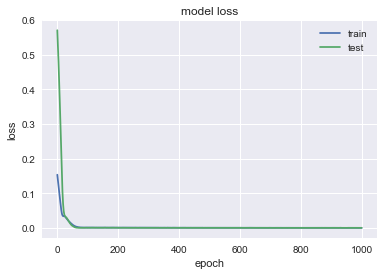

                BA
MSE        77.2369
MAE        6.61519
R2        0.855599
MAPE (%)   1.75669


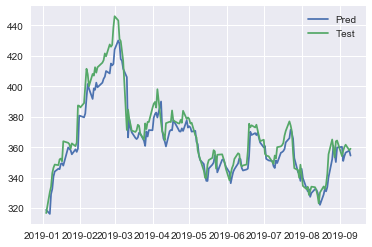

Predicting for  IBM
Train on 1008 samples, validate on 172 samples
Epoch 1/1000
0s - loss: 0.3950 - val_loss: 0.1555
Epoch 2/1000
0s - loss: 0.3707 - val_loss: 0.1423
Epoch 3/1000
0s - loss: 0.3477 - val_loss: 0.1297
Epoch 4/1000
0s - loss: 0.3252 - val_loss: 0.1172
Epoch 5/1000
0s - loss: 0.3029 - val_loss: 0.1046
Epoch 6/1000
0s - loss: 0.2795 - val_loss: 0.0920
Epoch 7/1000
0s - loss: 0.2554 - val_loss: 0.0792
Epoch 8/1000
0s - loss: 0.2310 - val_loss: 0.0663
Epoch 9/1000
0s - loss: 0.2043 - val_loss: 0.0535
Epoch 10/1000
0s - loss: 0.1784 - val_loss: 0.0411
Epoch 11/1000
0s - loss: 0.1506 - val_loss: 0.0296
Epoch 12/1000
0s - loss: 0.1239 - val_loss: 0.0195
Epoch 13/1000
0s - loss: 0.0977 - val_loss: 0.0114
Epoch 14/1000
0s - loss: 0.0732 - val_loss: 0.0062
Epoch 15/1000
0s - loss: 0.0520 - val_loss: 0.0043
Epoch 16/1000
0s - loss: 0.0352 - val_loss: 0.0059
Epoch 17/1000
0s - loss: 0.0232 - val_loss: 0.0104
Epoch 18/1000
0s - loss: 0.0171 - val_loss: 0.0163
Epoch 19/1000
0s - loss:

0s - loss: 0.0028 - val_loss: 5.5423e-04
Epoch 158/1000
0s - loss: 0.0027 - val_loss: 5.6915e-04
Epoch 159/1000
0s - loss: 0.0028 - val_loss: 5.7559e-04
Epoch 160/1000
0s - loss: 0.0028 - val_loss: 5.4585e-04
Epoch 161/1000
0s - loss: 0.0029 - val_loss: 5.5351e-04
Epoch 162/1000
0s - loss: 0.0027 - val_loss: 5.7910e-04
Epoch 163/1000
0s - loss: 0.0027 - val_loss: 5.8319e-04
Epoch 164/1000
0s - loss: 0.0027 - val_loss: 5.5573e-04
Epoch 165/1000
0s - loss: 0.0026 - val_loss: 5.3427e-04
Epoch 166/1000
0s - loss: 0.0028 - val_loss: 5.4201e-04
Epoch 167/1000
0s - loss: 0.0027 - val_loss: 5.7720e-04
Epoch 168/1000
0s - loss: 0.0025 - val_loss: 5.9641e-04
Epoch 169/1000
0s - loss: 0.0026 - val_loss: 5.7856e-04
Epoch 170/1000
0s - loss: 0.0026 - val_loss: 5.5218e-04
Epoch 171/1000
0s - loss: 0.0027 - val_loss: 5.4167e-04
Epoch 172/1000
0s - loss: 0.0027 - val_loss: 5.3798e-04
Epoch 173/1000
0s - loss: 0.0027 - val_loss: 5.7402e-04
Epoch 174/1000
0s - loss: 0.0026 - val_loss: 6.0872e-04
Epoch 1

0s - loss: 0.0023 - val_loss: 5.4048e-04
Epoch 307/1000
0s - loss: 0.0024 - val_loss: 5.0917e-04
Epoch 308/1000
0s - loss: 0.0023 - val_loss: 5.0572e-04
Epoch 309/1000
0s - loss: 0.0023 - val_loss: 5.0769e-04
Epoch 310/1000
0s - loss: 0.0022 - val_loss: 5.2127e-04
Epoch 311/1000
0s - loss: 0.0022 - val_loss: 5.1951e-04
Epoch 312/1000
0s - loss: 0.0024 - val_loss: 4.9558e-04
Epoch 313/1000
0s - loss: 0.0021 - val_loss: 4.8286e-04
Epoch 314/1000
0s - loss: 0.0024 - val_loss: 4.9400e-04
Epoch 315/1000
0s - loss: 0.0023 - val_loss: 5.0172e-04
Epoch 316/1000
0s - loss: 0.0024 - val_loss: 5.0475e-04
Epoch 317/1000
0s - loss: 0.0021 - val_loss: 5.2066e-04
Epoch 318/1000
0s - loss: 0.0022 - val_loss: 5.3204e-04
Epoch 319/1000
0s - loss: 0.0021 - val_loss: 5.0260e-04
Epoch 320/1000
0s - loss: 0.0022 - val_loss: 4.9934e-04
Epoch 321/1000
0s - loss: 0.0020 - val_loss: 5.3102e-04
Epoch 322/1000
0s - loss: 0.0024 - val_loss: 5.6772e-04
Epoch 323/1000
0s - loss: 0.0022 - val_loss: 5.5401e-04
Epoch 3

0s - loss: 0.0021 - val_loss: 5.0349e-04
Epoch 457/1000
0s - loss: 0.0020 - val_loss: 5.0063e-04
Epoch 458/1000
0s - loss: 0.0018 - val_loss: 5.2018e-04
Epoch 459/1000
0s - loss: 0.0021 - val_loss: 5.5843e-04
Epoch 460/1000
0s - loss: 0.0020 - val_loss: 5.2475e-04
Epoch 461/1000
0s - loss: 0.0019 - val_loss: 5.0438e-04
Epoch 462/1000
0s - loss: 0.0021 - val_loss: 5.0976e-04
Epoch 463/1000
0s - loss: 0.0019 - val_loss: 5.1740e-04
Epoch 464/1000
0s - loss: 0.0021 - val_loss: 5.2432e-04
Epoch 465/1000
0s - loss: 0.0019 - val_loss: 5.1286e-04
Epoch 466/1000
0s - loss: 0.0020 - val_loss: 5.0241e-04
Epoch 467/1000
0s - loss: 0.0021 - val_loss: 5.0107e-04
Epoch 468/1000
0s - loss: 0.0020 - val_loss: 5.1975e-04
Epoch 469/1000
0s - loss: 0.0020 - val_loss: 5.2300e-04
Epoch 470/1000
0s - loss: 0.0019 - val_loss: 5.1155e-04
Epoch 471/1000
0s - loss: 0.0021 - val_loss: 5.0811e-04
Epoch 472/1000
0s - loss: 0.0021 - val_loss: 5.0225e-04
Epoch 473/1000
0s - loss: 0.0019 - val_loss: 5.0776e-04
Epoch 4

0s - loss: 0.0017 - val_loss: 5.2907e-04
Epoch 604/1000
0s - loss: 0.0019 - val_loss: 5.1895e-04
Epoch 605/1000
0s - loss: 0.0018 - val_loss: 5.1178e-04
Epoch 606/1000
0s - loss: 0.0019 - val_loss: 5.2450e-04
Epoch 607/1000
0s - loss: 0.0017 - val_loss: 5.5657e-04
Epoch 608/1000
0s - loss: 0.0018 - val_loss: 5.2648e-04
Epoch 609/1000
0s - loss: 0.0018 - val_loss: 5.0130e-04
Epoch 610/1000
0s - loss: 0.0016 - val_loss: 5.0362e-04
Epoch 611/1000
0s - loss: 0.0018 - val_loss: 5.4081e-04
Epoch 612/1000
0s - loss: 0.0020 - val_loss: 5.2080e-04
Epoch 613/1000
0s - loss: 0.0018 - val_loss: 5.1670e-04
Epoch 614/1000
0s - loss: 0.0018 - val_loss: 5.1584e-04
Epoch 615/1000
0s - loss: 0.0020 - val_loss: 5.2507e-04
Epoch 616/1000
0s - loss: 0.0018 - val_loss: 5.1515e-04
Epoch 617/1000
0s - loss: 0.0018 - val_loss: 5.1138e-04
Epoch 618/1000
0s - loss: 0.0017 - val_loss: 5.0677e-04
Epoch 619/1000
0s - loss: 0.0020 - val_loss: 5.2290e-04
Epoch 620/1000
0s - loss: 0.0018 - val_loss: 5.2859e-04
Epoch 6

0s - loss: 0.0017 - val_loss: 5.2743e-04
Epoch 751/1000
0s - loss: 0.0018 - val_loss: 5.1567e-04
Epoch 752/1000
0s - loss: 0.0016 - val_loss: 5.0735e-04
Epoch 753/1000
0s - loss: 0.0016 - val_loss: 5.2018e-04
Epoch 754/1000
0s - loss: 0.0015 - val_loss: 5.3077e-04
Epoch 755/1000
0s - loss: 0.0016 - val_loss: 5.3536e-04
Epoch 756/1000
0s - loss: 0.0017 - val_loss: 5.3500e-04
Epoch 757/1000
0s - loss: 0.0017 - val_loss: 5.3751e-04
Epoch 758/1000
0s - loss: 0.0016 - val_loss: 5.4451e-04
Epoch 759/1000
0s - loss: 0.0016 - val_loss: 5.2616e-04
Epoch 760/1000
0s - loss: 0.0017 - val_loss: 5.0600e-04
Epoch 761/1000
0s - loss: 0.0017 - val_loss: 5.2867e-04
Epoch 762/1000
0s - loss: 0.0016 - val_loss: 5.3940e-04
Epoch 763/1000
0s - loss: 0.0015 - val_loss: 5.0592e-04
Epoch 764/1000
0s - loss: 0.0016 - val_loss: 5.0328e-04
Epoch 765/1000
0s - loss: 0.0018 - val_loss: 5.1714e-04
Epoch 766/1000
0s - loss: 0.0016 - val_loss: 5.1302e-04
Epoch 767/1000
0s - loss: 0.0015 - val_loss: 5.0747e-04
Epoch 7

0s - loss: 0.0013 - val_loss: 5.1129e-04
Epoch 898/1000
0s - loss: 0.0014 - val_loss: 5.1986e-04
Epoch 899/1000
0s - loss: 0.0015 - val_loss: 5.2148e-04
Epoch 900/1000
0s - loss: 0.0015 - val_loss: 5.0971e-04
Epoch 901/1000
0s - loss: 0.0014 - val_loss: 5.0293e-04
Epoch 902/1000
0s - loss: 0.0015 - val_loss: 5.1381e-04
Epoch 903/1000
0s - loss: 0.0014 - val_loss: 5.1178e-04
Epoch 904/1000
0s - loss: 0.0014 - val_loss: 5.0294e-04
Epoch 905/1000
0s - loss: 0.0014 - val_loss: 5.0385e-04
Epoch 906/1000
0s - loss: 0.0013 - val_loss: 5.3518e-04
Epoch 907/1000
0s - loss: 0.0014 - val_loss: 5.6809e-04
Epoch 908/1000
0s - loss: 0.0015 - val_loss: 5.2545e-04
Epoch 909/1000
0s - loss: 0.0014 - val_loss: 5.1500e-04
Epoch 910/1000
0s - loss: 0.0014 - val_loss: 5.3071e-04
Epoch 911/1000
0s - loss: 0.0015 - val_loss: 5.1006e-04
Epoch 912/1000
0s - loss: 0.0013 - val_loss: 4.9981e-04
Epoch 913/1000
0s - loss: 0.0014 - val_loss: 5.2075e-04
Epoch 914/1000
0s - loss: 0.0014 - val_loss: 5.2028e-04
Epoch 9

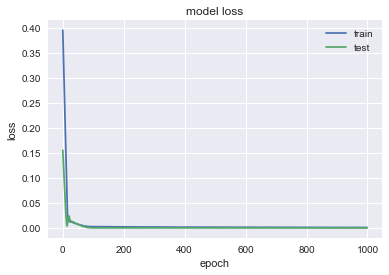

               IBM
MSE        2.89753
MAE         1.1723
R2        0.935581
MAPE (%)  0.860089


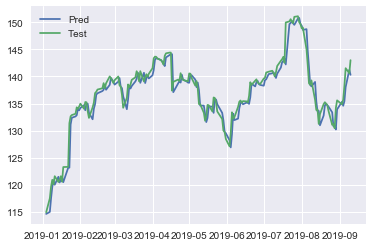

Predicting for  ALB
Train on 1008 samples, validate on 172 samples
Epoch 1/1000
0s - loss: 0.2417 - val_loss: 0.1024
Epoch 2/1000
0s - loss: 0.2274 - val_loss: 0.0932
Epoch 3/1000
0s - loss: 0.2130 - val_loss: 0.0842
Epoch 4/1000
0s - loss: 0.1989 - val_loss: 0.0752
Epoch 5/1000
0s - loss: 0.1844 - val_loss: 0.0662
Epoch 6/1000
0s - loss: 0.1698 - val_loss: 0.0572
Epoch 7/1000
0s - loss: 0.1548 - val_loss: 0.0484
Epoch 8/1000
0s - loss: 0.1392 - val_loss: 0.0396
Epoch 9/1000
0s - loss: 0.1241 - val_loss: 0.0313
Epoch 10/1000
0s - loss: 0.1081 - val_loss: 0.0234
Epoch 11/1000
0s - loss: 0.0928 - val_loss: 0.0165
Epoch 12/1000
0s - loss: 0.0780 - val_loss: 0.0107
Epoch 13/1000
0s - loss: 0.0644 - val_loss: 0.0064
Epoch 14/1000
0s - loss: 0.0525 - val_loss: 0.0039
Epoch 15/1000
0s - loss: 0.0427 - val_loss: 0.0033
Epoch 16/1000
0s - loss: 0.0346 - val_loss: 0.0045
Epoch 17/1000
0s - loss: 0.0306 - val_loss: 0.0071
Epoch 18/1000
0s - loss: 0.0279 - val_loss: 0.0103
Epoch 19/1000
0s - loss:

0s - loss: 0.0019 - val_loss: 3.5046e-04
Epoch 155/1000
0s - loss: 0.0019 - val_loss: 3.2943e-04
Epoch 156/1000
0s - loss: 0.0022 - val_loss: 3.1842e-04
Epoch 157/1000
0s - loss: 0.0021 - val_loss: 3.1462e-04
Epoch 158/1000
0s - loss: 0.0019 - val_loss: 3.0664e-04
Epoch 159/1000
0s - loss: 0.0020 - val_loss: 3.1018e-04
Epoch 160/1000
0s - loss: 0.0020 - val_loss: 3.2618e-04
Epoch 161/1000
0s - loss: 0.0021 - val_loss: 3.3862e-04
Epoch 162/1000
0s - loss: 0.0018 - val_loss: 3.4676e-04
Epoch 163/1000
0s - loss: 0.0020 - val_loss: 3.5804e-04
Epoch 164/1000
0s - loss: 0.0019 - val_loss: 3.7465e-04
Epoch 165/1000
0s - loss: 0.0021 - val_loss: 3.6917e-04
Epoch 166/1000
0s - loss: 0.0020 - val_loss: 3.4221e-04
Epoch 167/1000
0s - loss: 0.0019 - val_loss: 3.2075e-04
Epoch 168/1000
0s - loss: 0.0019 - val_loss: 3.1017e-04
Epoch 169/1000
0s - loss: 0.0020 - val_loss: 3.0270e-04
Epoch 170/1000
0s - loss: 0.0019 - val_loss: 3.0796e-04
Epoch 171/1000
0s - loss: 0.0019 - val_loss: 3.2536e-04
Epoch 1

0s - loss: 0.0014 - val_loss: 2.6802e-04
Epoch 304/1000
0s - loss: 0.0015 - val_loss: 2.7272e-04
Epoch 305/1000
0s - loss: 0.0015 - val_loss: 2.7743e-04
Epoch 306/1000
0s - loss: 0.0014 - val_loss: 2.7619e-04
Epoch 307/1000
0s - loss: 0.0015 - val_loss: 2.7543e-04
Epoch 308/1000
0s - loss: 0.0015 - val_loss: 2.8249e-04
Epoch 309/1000
0s - loss: 0.0015 - val_loss: 2.8770e-04
Epoch 310/1000
0s - loss: 0.0016 - val_loss: 2.8763e-04
Epoch 311/1000
0s - loss: 0.0016 - val_loss: 2.7768e-04
Epoch 312/1000
0s - loss: 0.0014 - val_loss: 2.6183e-04
Epoch 313/1000
0s - loss: 0.0015 - val_loss: 2.5410e-04
Epoch 314/1000
0s - loss: 0.0015 - val_loss: 2.5391e-04
Epoch 315/1000
0s - loss: 0.0015 - val_loss: 2.6354e-04
Epoch 316/1000
0s - loss: 0.0016 - val_loss: 2.7408e-04
Epoch 317/1000
0s - loss: 0.0015 - val_loss: 2.7355e-04
Epoch 318/1000
0s - loss: 0.0014 - val_loss: 2.7414e-04
Epoch 319/1000
0s - loss: 0.0014 - val_loss: 2.6856e-04
Epoch 320/1000
0s - loss: 0.0016 - val_loss: 2.5949e-04
Epoch 3

0s - loss: 0.0013 - val_loss: 2.5530e-04
Epoch 453/1000
0s - loss: 0.0015 - val_loss: 2.5326e-04
Epoch 454/1000
0s - loss: 0.0012 - val_loss: 2.6177e-04
Epoch 455/1000
0s - loss: 0.0014 - val_loss: 2.6206e-04
Epoch 456/1000
0s - loss: 0.0014 - val_loss: 2.5495e-04
Epoch 457/1000
0s - loss: 0.0012 - val_loss: 2.5318e-04
Epoch 458/1000
0s - loss: 0.0012 - val_loss: 2.5470e-04
Epoch 459/1000
0s - loss: 0.0013 - val_loss: 2.5534e-04
Epoch 460/1000
0s - loss: 0.0014 - val_loss: 2.5597e-04
Epoch 461/1000
0s - loss: 0.0014 - val_loss: 2.5655e-04
Epoch 462/1000
0s - loss: 0.0013 - val_loss: 2.5806e-04
Epoch 463/1000
0s - loss: 0.0013 - val_loss: 2.5262e-04
Epoch 464/1000
0s - loss: 0.0013 - val_loss: 2.5593e-04
Epoch 465/1000
0s - loss: 0.0013 - val_loss: 2.5477e-04
Epoch 466/1000
0s - loss: 0.0012 - val_loss: 2.5269e-04
Epoch 467/1000
0s - loss: 0.0013 - val_loss: 2.5598e-04
Epoch 468/1000
0s - loss: 0.0013 - val_loss: 2.5797e-04
Epoch 469/1000
0s - loss: 0.0012 - val_loss: 2.5385e-04
Epoch 4

0s - loss: 0.0012 - val_loss: 2.5406e-04
Epoch 601/1000
0s - loss: 0.0011 - val_loss: 2.5641e-04
Epoch 602/1000
0s - loss: 0.0011 - val_loss: 2.5656e-04
Epoch 603/1000
0s - loss: 0.0010 - val_loss: 2.5389e-04
Epoch 604/1000
0s - loss: 0.0012 - val_loss: 2.5338e-04
Epoch 605/1000
0s - loss: 0.0011 - val_loss: 2.5449e-04
Epoch 606/1000
0s - loss: 0.0011 - val_loss: 2.5471e-04
Epoch 607/1000
0s - loss: 0.0011 - val_loss: 2.5340e-04
Epoch 608/1000
0s - loss: 0.0011 - val_loss: 2.5573e-04
Epoch 609/1000
0s - loss: 0.0012 - val_loss: 2.5720e-04
Epoch 610/1000
0s - loss: 0.0012 - val_loss: 2.5402e-04
Epoch 611/1000
0s - loss: 0.0011 - val_loss: 2.5339e-04
Epoch 612/1000
0s - loss: 0.0011 - val_loss: 2.5466e-04
Epoch 613/1000
0s - loss: 0.0012 - val_loss: 2.5488e-04
Epoch 614/1000
0s - loss: 0.0011 - val_loss: 2.5361e-04
Epoch 615/1000
0s - loss: 0.0011 - val_loss: 2.5511e-04
Epoch 616/1000
0s - loss: 0.0011 - val_loss: 2.5450e-04
Epoch 617/1000
0s - loss: 0.0011 - val_loss: 2.5370e-04
Epoch 6

0s - loss: 9.6697e-04 - val_loss: 2.6017e-04
Epoch 749/1000
0s - loss: 9.9563e-04 - val_loss: 2.5601e-04
Epoch 750/1000
0s - loss: 9.5751e-04 - val_loss: 2.5314e-04
Epoch 751/1000
0s - loss: 9.3161e-04 - val_loss: 2.5342e-04
Epoch 752/1000
0s - loss: 9.6580e-04 - val_loss: 2.5645e-04
Epoch 753/1000
0s - loss: 0.0011 - val_loss: 2.5482e-04
Epoch 754/1000
0s - loss: 0.0010 - val_loss: 2.6319e-04
Epoch 755/1000
0s - loss: 0.0012 - val_loss: 2.6282e-04
Epoch 756/1000
0s - loss: 0.0010 - val_loss: 2.5571e-04
Epoch 757/1000
0s - loss: 0.0011 - val_loss: 2.5632e-04
Epoch 758/1000
0s - loss: 0.0012 - val_loss: 2.5643e-04
Epoch 759/1000
0s - loss: 9.3085e-04 - val_loss: 2.5455e-04
Epoch 760/1000
0s - loss: 0.0011 - val_loss: 2.5502e-04
Epoch 761/1000
0s - loss: 0.0010 - val_loss: 2.5402e-04
Epoch 762/1000
0s - loss: 9.0419e-04 - val_loss: 2.5436e-04
Epoch 763/1000
0s - loss: 0.0011 - val_loss: 2.5499e-04
Epoch 764/1000
0s - loss: 0.0010 - val_loss: 2.5873e-04
Epoch 765/1000
0s - loss: 9.9502e-0

0s - loss: 8.6626e-04 - val_loss: 2.5412e-04
Epoch 892/1000
0s - loss: 9.4210e-04 - val_loss: 2.6773e-04
Epoch 893/1000
0s - loss: 8.6560e-04 - val_loss: 2.5408e-04
Epoch 894/1000
0s - loss: 9.0412e-04 - val_loss: 2.5276e-04
Epoch 895/1000
0s - loss: 8.8853e-04 - val_loss: 2.5288e-04
Epoch 896/1000
0s - loss: 8.5368e-04 - val_loss: 2.5381e-04
Epoch 897/1000
0s - loss: 8.6312e-04 - val_loss: 2.5338e-04
Epoch 898/1000
0s - loss: 9.1194e-04 - val_loss: 2.5377e-04
Epoch 899/1000
0s - loss: 8.9472e-04 - val_loss: 2.5884e-04
Epoch 900/1000
0s - loss: 9.2151e-04 - val_loss: 2.6032e-04
Epoch 901/1000
0s - loss: 9.5849e-04 - val_loss: 2.5400e-04
Epoch 902/1000
0s - loss: 8.7520e-04 - val_loss: 2.5440e-04
Epoch 903/1000
0s - loss: 8.9894e-04 - val_loss: 2.6176e-04
Epoch 904/1000
0s - loss: 9.2464e-04 - val_loss: 2.5391e-04
Epoch 905/1000
0s - loss: 9.5924e-04 - val_loss: 2.6456e-04
Epoch 906/1000
0s - loss: 9.8707e-04 - val_loss: 2.5902e-04
Epoch 907/1000
0s - loss: 9.4195e-04 - val_loss: 2.6358

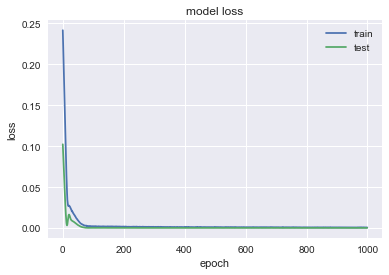

               ALB
MSE        2.67716
MAE        1.21227
R2        0.956909
MAPE (%)   1.63582


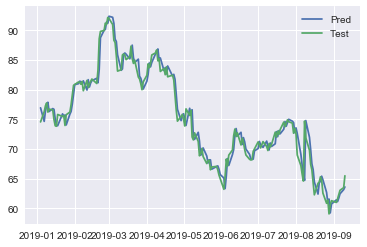

Predicting for  CBRE
Train on 1008 samples, validate on 172 samples
Epoch 1/1000
0s - loss: 0.2126 - val_loss: 0.6439
Epoch 2/1000
0s - loss: 0.1968 - val_loss: 0.6080
Epoch 3/1000
0s - loss: 0.1814 - val_loss: 0.5718
Epoch 4/1000
0s - loss: 0.1660 - val_loss: 0.5346
Epoch 5/1000
0s - loss: 0.1507 - val_loss: 0.4962
Epoch 6/1000
0s - loss: 0.1352 - val_loss: 0.4562
Epoch 7/1000
0s - loss: 0.1194 - val_loss: 0.4145
Epoch 8/1000
0s - loss: 0.1034 - val_loss: 0.3712
Epoch 9/1000
0s - loss: 0.0881 - val_loss: 0.3265
Epoch 10/1000
0s - loss: 0.0728 - val_loss: 0.2813
Epoch 11/1000
0s - loss: 0.0590 - val_loss: 0.2364
Epoch 12/1000
0s - loss: 0.0459 - val_loss: 0.1931
Epoch 13/1000
0s - loss: 0.0353 - val_loss: 0.1529
Epoch 14/1000
0s - loss: 0.0272 - val_loss: 0.1173
Epoch 15/1000
0s - loss: 0.0214 - val_loss: 0.0879
Epoch 16/1000
0s - loss: 0.0193 - val_loss: 0.0652
Epoch 17/1000
0s - loss: 0.0183 - val_loss: 0.0492
Epoch 18/1000
0s - loss: 0.0194 - val_loss: 0.0393
Epoch 19/1000
0s - loss

0s - loss: 0.0017 - val_loss: 0.0010
Epoch 158/1000
0s - loss: 0.0016 - val_loss: 0.0011
Epoch 159/1000
0s - loss: 0.0017 - val_loss: 0.0011
Epoch 160/1000
0s - loss: 0.0016 - val_loss: 0.0010
Epoch 161/1000
0s - loss: 0.0016 - val_loss: 9.7731e-04
Epoch 162/1000
0s - loss: 0.0017 - val_loss: 9.4473e-04
Epoch 163/1000
0s - loss: 0.0017 - val_loss: 9.1803e-04
Epoch 164/1000
0s - loss: 0.0016 - val_loss: 8.9567e-04
Epoch 165/1000
0s - loss: 0.0017 - val_loss: 9.2675e-04
Epoch 166/1000
0s - loss: 0.0017 - val_loss: 0.0010
Epoch 167/1000
0s - loss: 0.0016 - val_loss: 0.0011
Epoch 168/1000
0s - loss: 0.0016 - val_loss: 0.0010
Epoch 169/1000
0s - loss: 0.0015 - val_loss: 9.7199e-04
Epoch 170/1000
0s - loss: 0.0017 - val_loss: 9.6420e-04
Epoch 171/1000
0s - loss: 0.0017 - val_loss: 0.0010
Epoch 172/1000
0s - loss: 0.0017 - val_loss: 0.0010
Epoch 173/1000
0s - loss: 0.0017 - val_loss: 0.0010
Epoch 174/1000
0s - loss: 0.0016 - val_loss: 9.4467e-04
Epoch 175/1000
0s - loss: 0.0017 - val_loss: 9.

0s - loss: 0.0013 - val_loss: 5.9955e-04
Epoch 308/1000
0s - loss: 0.0013 - val_loss: 6.1610e-04
Epoch 309/1000
0s - loss: 0.0013 - val_loss: 6.8116e-04
Epoch 310/1000
0s - loss: 0.0014 - val_loss: 6.8082e-04
Epoch 311/1000
0s - loss: 0.0014 - val_loss: 6.1011e-04
Epoch 312/1000
0s - loss: 0.0013 - val_loss: 5.9898e-04
Epoch 313/1000
0s - loss: 0.0013 - val_loss: 6.2189e-04
Epoch 314/1000
0s - loss: 0.0014 - val_loss: 6.7611e-04
Epoch 315/1000
0s - loss: 0.0012 - val_loss: 6.4639e-04
Epoch 316/1000
0s - loss: 0.0014 - val_loss: 6.1116e-04
Epoch 317/1000
0s - loss: 0.0013 - val_loss: 6.1184e-04
Epoch 318/1000
0s - loss: 0.0013 - val_loss: 6.1432e-04
Epoch 319/1000
0s - loss: 0.0015 - val_loss: 6.2927e-04
Epoch 320/1000
0s - loss: 0.0014 - val_loss: 6.3295e-04
Epoch 321/1000
0s - loss: 0.0013 - val_loss: 6.1387e-04
Epoch 322/1000
0s - loss: 0.0015 - val_loss: 5.9251e-04
Epoch 323/1000
0s - loss: 0.0013 - val_loss: 5.9008e-04
Epoch 324/1000
0s - loss: 0.0014 - val_loss: 5.9996e-04
Epoch 3

0s - loss: 0.0012 - val_loss: 5.2697e-04
Epoch 455/1000
0s - loss: 0.0012 - val_loss: 5.2639e-04
Epoch 456/1000
0s - loss: 0.0012 - val_loss: 5.4074e-04
Epoch 457/1000
0s - loss: 0.0012 - val_loss: 5.3297e-04
Epoch 458/1000
0s - loss: 0.0011 - val_loss: 5.1989e-04
Epoch 459/1000
0s - loss: 0.0012 - val_loss: 5.2039e-04
Epoch 460/1000
0s - loss: 0.0011 - val_loss: 5.6265e-04
Epoch 461/1000
0s - loss: 0.0013 - val_loss: 5.9641e-04
Epoch 462/1000
0s - loss: 0.0013 - val_loss: 5.2641e-04
Epoch 463/1000
0s - loss: 0.0011 - val_loss: 5.0018e-04
Epoch 464/1000
0s - loss: 0.0011 - val_loss: 5.0378e-04
Epoch 465/1000
0s - loss: 0.0012 - val_loss: 5.7710e-04
Epoch 466/1000
0s - loss: 0.0013 - val_loss: 6.0109e-04
Epoch 467/1000
0s - loss: 0.0011 - val_loss: 5.1662e-04
Epoch 468/1000
0s - loss: 0.0011 - val_loss: 5.0390e-04
Epoch 469/1000
0s - loss: 0.0011 - val_loss: 5.0639e-04
Epoch 470/1000
0s - loss: 0.0012 - val_loss: 5.4052e-04
Epoch 471/1000
0s - loss: 0.0012 - val_loss: 5.0931e-04
Epoch 4

0s - loss: 9.6999e-04 - val_loss: 5.3057e-04
Epoch 603/1000
0s - loss: 0.0010 - val_loss: 5.8072e-04
Epoch 604/1000
0s - loss: 9.9456e-04 - val_loss: 6.5161e-04
Epoch 605/1000
0s - loss: 9.9959e-04 - val_loss: 6.2046e-04
Epoch 606/1000
0s - loss: 0.0011 - val_loss: 6.1769e-04
Epoch 607/1000
0s - loss: 0.0010 - val_loss: 6.3914e-04
Epoch 608/1000
0s - loss: 0.0011 - val_loss: 6.4513e-04
Epoch 609/1000
0s - loss: 9.8601e-04 - val_loss: 5.8513e-04
Epoch 610/1000
0s - loss: 0.0010 - val_loss: 6.8957e-04
Epoch 611/1000
0s - loss: 9.5581e-04 - val_loss: 7.8786e-04
Epoch 612/1000
0s - loss: 9.9693e-04 - val_loss: 6.2510e-04
Epoch 613/1000
0s - loss: 0.0011 - val_loss: 5.9143e-04
Epoch 614/1000
0s - loss: 8.9589e-04 - val_loss: 7.0120e-04
Epoch 615/1000
0s - loss: 0.0010 - val_loss: 7.2198e-04
Epoch 616/1000
0s - loss: 9.9959e-04 - val_loss: 5.7543e-04
Epoch 617/1000
0s - loss: 0.0010 - val_loss: 5.5462e-04
Epoch 618/1000
0s - loss: 0.0011 - val_loss: 5.8674e-04
Epoch 619/1000
0s - loss: 9.868

0s - loss: 8.6629e-04 - val_loss: 8.6294e-04
Epoch 744/1000
0s - loss: 0.0010 - val_loss: 7.7949e-04
Epoch 745/1000
0s - loss: 9.8431e-04 - val_loss: 5.9234e-04
Epoch 746/1000
0s - loss: 9.0308e-04 - val_loss: 6.9181e-04
Epoch 747/1000
0s - loss: 9.8286e-04 - val_loss: 7.3021e-04
Epoch 748/1000
0s - loss: 8.7055e-04 - val_loss: 5.4443e-04
Epoch 749/1000
0s - loss: 8.7870e-04 - val_loss: 5.1080e-04
Epoch 750/1000
0s - loss: 9.3652e-04 - val_loss: 7.1345e-04
Epoch 751/1000
0s - loss: 9.9501e-04 - val_loss: 7.2092e-04
Epoch 752/1000
0s - loss: 8.9860e-04 - val_loss: 5.9258e-04
Epoch 753/1000
0s - loss: 8.3431e-04 - val_loss: 6.4919e-04
Epoch 754/1000
0s - loss: 8.7206e-04 - val_loss: 7.9836e-04
Epoch 755/1000
0s - loss: 9.2710e-04 - val_loss: 7.0642e-04
Epoch 756/1000
0s - loss: 9.5719e-04 - val_loss: 5.2076e-04
Epoch 757/1000
0s - loss: 8.7794e-04 - val_loss: 5.3568e-04
Epoch 758/1000
0s - loss: 9.2851e-04 - val_loss: 8.1413e-04
Epoch 759/1000
0s - loss: 9.0942e-04 - val_loss: 7.6984e-04

0s - loss: 8.3720e-04 - val_loss: 6.9732e-04
Epoch 881/1000
0s - loss: 8.4055e-04 - val_loss: 5.2554e-04
Epoch 882/1000
0s - loss: 8.2741e-04 - val_loss: 5.3245e-04
Epoch 883/1000
0s - loss: 8.2254e-04 - val_loss: 5.7372e-04
Epoch 884/1000
0s - loss: 8.1992e-04 - val_loss: 6.0044e-04
Epoch 885/1000
0s - loss: 8.5774e-04 - val_loss: 6.1298e-04
Epoch 886/1000
0s - loss: 7.8715e-04 - val_loss: 5.9037e-04
Epoch 887/1000
0s - loss: 7.5367e-04 - val_loss: 5.9959e-04
Epoch 888/1000
0s - loss: 8.0542e-04 - val_loss: 6.3902e-04
Epoch 889/1000
0s - loss: 8.1183e-04 - val_loss: 5.6606e-04
Epoch 890/1000
0s - loss: 8.2015e-04 - val_loss: 6.2282e-04
Epoch 891/1000
0s - loss: 7.9734e-04 - val_loss: 7.0405e-04
Epoch 892/1000
0s - loss: 8.4132e-04 - val_loss: 6.0408e-04
Epoch 893/1000
0s - loss: 7.6747e-04 - val_loss: 5.6803e-04
Epoch 894/1000
0s - loss: 8.0275e-04 - val_loss: 6.8345e-04
Epoch 895/1000
0s - loss: 7.2478e-04 - val_loss: 7.1722e-04
Epoch 896/1000
0s - loss: 7.8601e-04 - val_loss: 5.4559

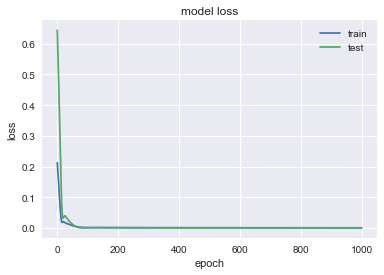

              CBRE
MSE       0.560368
MAE       0.604754
R2        0.940445
MAPE (%)   1.21767


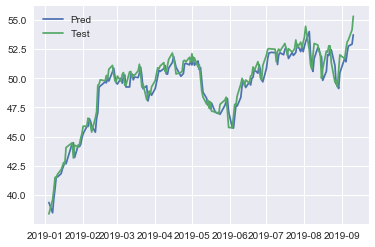

In [270]:
pred = pd.DataFrame(columns=df.columns,index = test.index)
for comp in companies:
    pred[comp] = nn_forec(df,comp).values

Predicting for  T
Train on 1008 samples, validate on 172 samples
Epoch 1/1000
0s - loss: 0.3470 - val_loss: 0.0879
Epoch 2/1000
0s - loss: 0.3323 - val_loss: 0.0816
Epoch 3/1000
0s - loss: 0.3182 - val_loss: 0.0756
Epoch 4/1000
0s - loss: 0.3046 - val_loss: 0.0698
Epoch 5/1000
0s - loss: 0.2909 - val_loss: 0.0642
Epoch 6/1000
0s - loss: 0.2774 - val_loss: 0.0587
Epoch 7/1000
0s - loss: 0.2636 - val_loss: 0.0533
Epoch 8/1000
0s - loss: 0.2504 - val_loss: 0.0480
Epoch 9/1000
0s - loss: 0.2367 - val_loss: 0.0429
Epoch 10/1000
0s - loss: 0.2223 - val_loss: 0.0380
Epoch 11/1000
0s - loss: 0.2088 - val_loss: 0.0333
Epoch 12/1000
0s - loss: 0.1941 - val_loss: 0.0288
Epoch 13/1000
0s - loss: 0.1806 - val_loss: 0.0245
Epoch 14/1000
0s - loss: 0.1662 - val_loss: 0.0207
Epoch 15/1000
0s - loss: 0.1528 - val_loss: 0.0172
Epoch 16/1000
0s - loss: 0.1377 - val_loss: 0.0142
Epoch 17/1000
0s - loss: 0.1246 - val_loss: 0.0118
Epoch 18/1000
0s - loss: 0.1104 - val_loss: 0.0099
Epoch 19/1000
0s - loss: 0

0s - loss: 0.0047 - val_loss: 0.0011
Epoch 166/1000
0s - loss: 0.0045 - val_loss: 0.0011
Epoch 167/1000
0s - loss: 0.0045 - val_loss: 0.0011
Epoch 168/1000
0s - loss: 0.0044 - val_loss: 0.0011
Epoch 169/1000
0s - loss: 0.0041 - val_loss: 0.0011
Epoch 170/1000
0s - loss: 0.0042 - val_loss: 0.0011
Epoch 171/1000
0s - loss: 0.0043 - val_loss: 0.0011
Epoch 172/1000
0s - loss: 0.0045 - val_loss: 0.0011
Epoch 173/1000
0s - loss: 0.0044 - val_loss: 0.0011
Epoch 174/1000
0s - loss: 0.0044 - val_loss: 0.0011
Epoch 175/1000
0s - loss: 0.0046 - val_loss: 0.0011
Epoch 176/1000
0s - loss: 0.0045 - val_loss: 0.0011
Epoch 177/1000
0s - loss: 0.0043 - val_loss: 0.0011
Epoch 178/1000
0s - loss: 0.0045 - val_loss: 0.0011
Epoch 179/1000
0s - loss: 0.0042 - val_loss: 0.0011
Epoch 180/1000
0s - loss: 0.0046 - val_loss: 0.0011
Epoch 181/1000
0s - loss: 0.0043 - val_loss: 0.0011
Epoch 182/1000
0s - loss: 0.0044 - val_loss: 0.0011
Epoch 183/1000
0s - loss: 0.0044 - val_loss: 0.0011
Epoch 184/1000
0s - loss: 0

0s - loss: 0.0036 - val_loss: 8.4512e-04
Epoch 322/1000
0s - loss: 0.0037 - val_loss: 8.4108e-04
Epoch 323/1000
0s - loss: 0.0036 - val_loss: 8.3099e-04
Epoch 324/1000
0s - loss: 0.0036 - val_loss: 8.2521e-04
Epoch 325/1000
0s - loss: 0.0036 - val_loss: 8.2234e-04
Epoch 326/1000
0s - loss: 0.0039 - val_loss: 8.2259e-04
Epoch 327/1000
0s - loss: 0.0038 - val_loss: 8.2787e-04
Epoch 328/1000
0s - loss: 0.0035 - val_loss: 8.3166e-04
Epoch 329/1000
0s - loss: 0.0039 - val_loss: 8.3281e-04
Epoch 330/1000
0s - loss: 0.0038 - val_loss: 8.2204e-04
Epoch 331/1000
0s - loss: 0.0037 - val_loss: 8.1054e-04
Epoch 332/1000
0s - loss: 0.0034 - val_loss: 8.0261e-04
Epoch 333/1000
0s - loss: 0.0036 - val_loss: 8.0201e-04
Epoch 334/1000
0s - loss: 0.0035 - val_loss: 8.0480e-04
Epoch 335/1000
0s - loss: 0.0040 - val_loss: 8.1341e-04
Epoch 336/1000
0s - loss: 0.0035 - val_loss: 8.0829e-04
Epoch 337/1000
0s - loss: 0.0036 - val_loss: 8.0073e-04
Epoch 338/1000
0s - loss: 0.0035 - val_loss: 7.9727e-04
Epoch 3

0s - loss: 0.0032 - val_loss: 6.4350e-04
Epoch 472/1000
0s - loss: 0.0029 - val_loss: 6.4423e-04
Epoch 473/1000
0s - loss: 0.0029 - val_loss: 6.3868e-04
Epoch 474/1000
0s - loss: 0.0030 - val_loss: 6.3022e-04
Epoch 475/1000
0s - loss: 0.0031 - val_loss: 6.2869e-04
Epoch 476/1000
0s - loss: 0.0030 - val_loss: 6.3221e-04
Epoch 477/1000
0s - loss: 0.0032 - val_loss: 6.2805e-04
Epoch 478/1000
0s - loss: 0.0030 - val_loss: 6.2359e-04
Epoch 479/1000
0s - loss: 0.0030 - val_loss: 6.2389e-04
Epoch 480/1000
0s - loss: 0.0029 - val_loss: 6.2166e-04
Epoch 481/1000
0s - loss: 0.0029 - val_loss: 6.2359e-04
Epoch 482/1000
0s - loss: 0.0028 - val_loss: 6.2751e-04
Epoch 483/1000
0s - loss: 0.0032 - val_loss: 6.2445e-04
Epoch 484/1000
0s - loss: 0.0030 - val_loss: 6.1941e-04
Epoch 485/1000
0s - loss: 0.0031 - val_loss: 6.1874e-04
Epoch 486/1000
0s - loss: 0.0029 - val_loss: 6.1785e-04
Epoch 487/1000
0s - loss: 0.0029 - val_loss: 6.1539e-04
Epoch 488/1000
0s - loss: 0.0029 - val_loss: 6.1093e-04
Epoch 4

0s - loss: 0.0027 - val_loss: 5.6060e-04
Epoch 621/1000
0s - loss: 0.0027 - val_loss: 5.5624e-04
Epoch 622/1000
0s - loss: 0.0027 - val_loss: 5.5286e-04
Epoch 623/1000
0s - loss: 0.0029 - val_loss: 5.5076e-04
Epoch 624/1000
0s - loss: 0.0027 - val_loss: 5.4926e-04
Epoch 625/1000
0s - loss: 0.0025 - val_loss: 5.5298e-04
Epoch 626/1000
0s - loss: 0.0024 - val_loss: 5.6411e-04
Epoch 627/1000
0s - loss: 0.0025 - val_loss: 5.6705e-04
Epoch 628/1000
0s - loss: 0.0026 - val_loss: 5.5931e-04
Epoch 629/1000
0s - loss: 0.0025 - val_loss: 5.5283e-04
Epoch 630/1000
0s - loss: 0.0025 - val_loss: 5.4919e-04
Epoch 631/1000
0s - loss: 0.0027 - val_loss: 5.4954e-04
Epoch 632/1000
0s - loss: 0.0028 - val_loss: 5.5443e-04
Epoch 633/1000
0s - loss: 0.0028 - val_loss: 5.5769e-04
Epoch 634/1000
0s - loss: 0.0026 - val_loss: 5.5452e-04
Epoch 635/1000
0s - loss: 0.0025 - val_loss: 5.5291e-04
Epoch 636/1000
0s - loss: 0.0026 - val_loss: 5.4962e-04
Epoch 637/1000
0s - loss: 0.0024 - val_loss: 5.5046e-04
Epoch 6

0s - loss: 0.0022 - val_loss: 5.5290e-04
Epoch 771/1000
0s - loss: 0.0023 - val_loss: 5.5693e-04
Epoch 772/1000
0s - loss: 0.0023 - val_loss: 5.4782e-04
Epoch 773/1000
0s - loss: 0.0023 - val_loss: 5.4215e-04
Epoch 774/1000
0s - loss: 0.0023 - val_loss: 5.4346e-04
Epoch 775/1000
0s - loss: 0.0024 - val_loss: 5.4440e-04
Epoch 776/1000
0s - loss: 0.0025 - val_loss: 5.4639e-04
Epoch 777/1000
0s - loss: 0.0025 - val_loss: 5.4026e-04
Epoch 778/1000
0s - loss: 0.0021 - val_loss: 5.4024e-04
Epoch 779/1000
0s - loss: 0.0021 - val_loss: 5.4451e-04
Epoch 780/1000
0s - loss: 0.0021 - val_loss: 5.5553e-04
Epoch 781/1000
0s - loss: 0.0021 - val_loss: 5.5648e-04
Epoch 782/1000
0s - loss: 0.0021 - val_loss: 5.4489e-04
Epoch 783/1000
0s - loss: 0.0020 - val_loss: 5.4371e-04
Epoch 784/1000
0s - loss: 0.0022 - val_loss: 5.4269e-04
Epoch 785/1000
0s - loss: 0.0022 - val_loss: 5.4595e-04
Epoch 786/1000
0s - loss: 0.0022 - val_loss: 5.4986e-04
Epoch 787/1000
0s - loss: 0.0021 - val_loss: 5.4635e-04
Epoch 7

0s - loss: 0.0022 - val_loss: 5.4381e-04
Epoch 922/1000
0s - loss: 0.0019 - val_loss: 5.4329e-04
Epoch 923/1000
0s - loss: 0.0019 - val_loss: 5.4376e-04
Epoch 924/1000
0s - loss: 0.0019 - val_loss: 5.4826e-04
Epoch 925/1000
0s - loss: 0.0019 - val_loss: 5.4697e-04
Epoch 926/1000
0s - loss: 0.0019 - val_loss: 5.4116e-04
Epoch 927/1000
0s - loss: 0.0020 - val_loss: 5.4112e-04
Epoch 928/1000
0s - loss: 0.0018 - val_loss: 5.4026e-04
Epoch 929/1000
0s - loss: 0.0017 - val_loss: 5.4367e-04
Epoch 930/1000
0s - loss: 0.0018 - val_loss: 5.4801e-04
Epoch 931/1000
0s - loss: 0.0019 - val_loss: 5.4690e-04
Epoch 932/1000
0s - loss: 0.0019 - val_loss: 5.4165e-04
Epoch 933/1000
0s - loss: 0.0017 - val_loss: 5.4444e-04
Epoch 934/1000
0s - loss: 0.0018 - val_loss: 5.5156e-04
Epoch 935/1000
0s - loss: 0.0017 - val_loss: 5.4563e-04
Epoch 936/1000
0s - loss: 0.0019 - val_loss: 5.4669e-04
Epoch 937/1000
0s - loss: 0.0021 - val_loss: 5.3892e-04
Epoch 938/1000
0s - loss: 0.0019 - val_loss: 5.4411e-04
Epoch 9

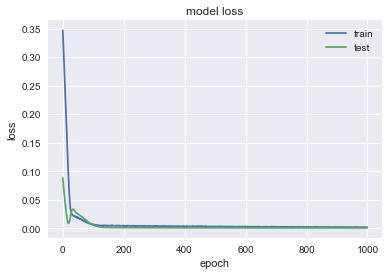

                 T
MSE       0.138668
MAE       0.266137
R2        0.949457
MAPE (%)  0.824658


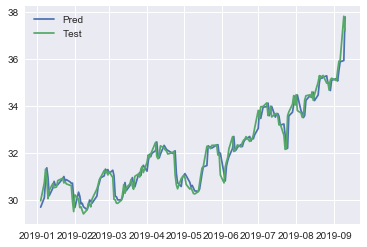

Predicting for  BBY
Train on 1008 samples, validate on 172 samples
Epoch 1/1000
0s - loss: 0.2444 - val_loss: 0.5273
Epoch 2/1000
0s - loss: 0.2353 - val_loss: 0.5105
Epoch 3/1000
0s - loss: 0.2266 - val_loss: 0.4938
Epoch 4/1000
0s - loss: 0.2179 - val_loss: 0.4770
Epoch 5/1000
0s - loss: 0.2094 - val_loss: 0.4602
Epoch 6/1000
0s - loss: 0.2007 - val_loss: 0.4432
Epoch 7/1000
0s - loss: 0.1920 - val_loss: 0.4260
Epoch 8/1000
0s - loss: 0.1837 - val_loss: 0.4085
Epoch 9/1000
0s - loss: 0.1747 - val_loss: 0.3905
Epoch 10/1000
0s - loss: 0.1657 - val_loss: 0.3721
Epoch 11/1000
0s - loss: 0.1567 - val_loss: 0.3532
Epoch 12/1000
0s - loss: 0.1475 - val_loss: 0.3338
Epoch 13/1000
0s - loss: 0.1390 - val_loss: 0.3139
Epoch 14/1000
0s - loss: 0.1296 - val_loss: 0.2935
Epoch 15/1000
0s - loss: 0.1205 - val_loss: 0.2728
Epoch 16/1000
0s - loss: 0.1117 - val_loss: 0.2518
Epoch 17/1000
0s - loss: 0.1028 - val_loss: 0.2307
Epoch 18/1000
0s - loss: 0.0947 - val_loss: 0.2096
Epoch 19/1000
0s - loss:

0s - loss: 0.0036 - val_loss: 0.0012
Epoch 163/1000
0s - loss: 0.0034 - val_loss: 0.0014
Epoch 164/1000
0s - loss: 0.0034 - val_loss: 0.0015
Epoch 165/1000
0s - loss: 0.0035 - val_loss: 0.0015
Epoch 166/1000
0s - loss: 0.0038 - val_loss: 0.0016
Epoch 167/1000
0s - loss: 0.0038 - val_loss: 0.0016
Epoch 168/1000
0s - loss: 0.0036 - val_loss: 0.0016
Epoch 169/1000
0s - loss: 0.0036 - val_loss: 0.0015
Epoch 170/1000
0s - loss: 0.0033 - val_loss: 0.0014
Epoch 171/1000
0s - loss: 0.0039 - val_loss: 0.0014
Epoch 172/1000
0s - loss: 0.0035 - val_loss: 0.0014
Epoch 173/1000
0s - loss: 0.0035 - val_loss: 0.0013
Epoch 174/1000
0s - loss: 0.0035 - val_loss: 0.0014
Epoch 175/1000
0s - loss: 0.0032 - val_loss: 0.0014
Epoch 176/1000
0s - loss: 0.0033 - val_loss: 0.0013
Epoch 177/1000
0s - loss: 0.0036 - val_loss: 0.0013
Epoch 178/1000
0s - loss: 0.0036 - val_loss: 0.0013
Epoch 179/1000
0s - loss: 0.0033 - val_loss: 0.0013
Epoch 180/1000
0s - loss: 0.0031 - val_loss: 0.0013
Epoch 181/1000
0s - loss: 0

0s - loss: 0.0032 - val_loss: 9.8957e-04
Epoch 324/1000
0s - loss: 0.0028 - val_loss: 9.4055e-04
Epoch 325/1000
0s - loss: 0.0029 - val_loss: 9.5015e-04
Epoch 326/1000
0s - loss: 0.0031 - val_loss: 9.5001e-04
Epoch 327/1000
0s - loss: 0.0025 - val_loss: 8.9828e-04
Epoch 328/1000
0s - loss: 0.0031 - val_loss: 8.7601e-04
Epoch 329/1000
0s - loss: 0.0028 - val_loss: 8.4846e-04
Epoch 330/1000
0s - loss: 0.0026 - val_loss: 8.4978e-04
Epoch 331/1000
0s - loss: 0.0028 - val_loss: 9.4664e-04
Epoch 332/1000
0s - loss: 0.0029 - val_loss: 0.0011
Epoch 333/1000
0s - loss: 0.0032 - val_loss: 0.0012
Epoch 334/1000
0s - loss: 0.0027 - val_loss: 0.0011
Epoch 335/1000
0s - loss: 0.0026 - val_loss: 0.0010
Epoch 336/1000
0s - loss: 0.0026 - val_loss: 0.0011
Epoch 337/1000
0s - loss: 0.0028 - val_loss: 0.0011
Epoch 338/1000
0s - loss: 0.0028 - val_loss: 0.0011
Epoch 339/1000
0s - loss: 0.0029 - val_loss: 0.0011
Epoch 340/1000
0s - loss: 0.0029 - val_loss: 9.5114e-04
Epoch 341/1000
0s - loss: 0.0029 - val_

0s - loss: 0.0021 - val_loss: 8.4301e-04
Epoch 477/1000
0s - loss: 0.0025 - val_loss: 8.9215e-04
Epoch 478/1000
0s - loss: 0.0022 - val_loss: 8.1432e-04
Epoch 479/1000
0s - loss: 0.0023 - val_loss: 7.2159e-04
Epoch 480/1000
0s - loss: 0.0025 - val_loss: 6.6706e-04
Epoch 481/1000
0s - loss: 0.0021 - val_loss: 6.5532e-04
Epoch 482/1000
0s - loss: 0.0022 - val_loss: 6.6432e-04
Epoch 483/1000
0s - loss: 0.0020 - val_loss: 7.1833e-04
Epoch 484/1000
0s - loss: 0.0022 - val_loss: 7.7255e-04
Epoch 485/1000
0s - loss: 0.0022 - val_loss: 7.3634e-04
Epoch 486/1000
0s - loss: 0.0021 - val_loss: 7.0497e-04
Epoch 487/1000
0s - loss: 0.0024 - val_loss: 6.9450e-04
Epoch 488/1000
0s - loss: 0.0023 - val_loss: 6.7847e-04
Epoch 489/1000
0s - loss: 0.0020 - val_loss: 6.9240e-04
Epoch 490/1000
0s - loss: 0.0026 - val_loss: 7.4133e-04
Epoch 491/1000
0s - loss: 0.0023 - val_loss: 7.5048e-04
Epoch 492/1000
0s - loss: 0.0023 - val_loss: 7.0492e-04
Epoch 493/1000
0s - loss: 0.0022 - val_loss: 6.4206e-04
Epoch 4

0s - loss: 0.0019 - val_loss: 5.9726e-04
Epoch 627/1000
0s - loss: 0.0019 - val_loss: 6.2785e-04
Epoch 628/1000
0s - loss: 0.0019 - val_loss: 7.1681e-04
Epoch 629/1000
0s - loss: 0.0020 - val_loss: 8.0464e-04
Epoch 630/1000
0s - loss: 0.0020 - val_loss: 7.4762e-04
Epoch 631/1000
0s - loss: 0.0019 - val_loss: 6.6356e-04
Epoch 632/1000
0s - loss: 0.0019 - val_loss: 6.0879e-04
Epoch 633/1000
0s - loss: 0.0020 - val_loss: 5.9279e-04
Epoch 634/1000
0s - loss: 0.0019 - val_loss: 6.3450e-04
Epoch 635/1000
0s - loss: 0.0018 - val_loss: 7.2585e-04
Epoch 636/1000
0s - loss: 0.0019 - val_loss: 7.9459e-04
Epoch 637/1000
0s - loss: 0.0020 - val_loss: 7.5857e-04
Epoch 638/1000
0s - loss: 0.0021 - val_loss: 6.4943e-04
Epoch 639/1000
0s - loss: 0.0019 - val_loss: 6.0086e-04
Epoch 640/1000
0s - loss: 0.0022 - val_loss: 5.8237e-04
Epoch 641/1000
0s - loss: 0.0016 - val_loss: 5.8420e-04
Epoch 642/1000
0s - loss: 0.0020 - val_loss: 5.9966e-04
Epoch 643/1000
0s - loss: 0.0020 - val_loss: 6.2271e-04
Epoch 6

0s - loss: 0.0020 - val_loss: 6.3000e-04
Epoch 778/1000
0s - loss: 0.0017 - val_loss: 6.9241e-04
Epoch 779/1000
0s - loss: 0.0017 - val_loss: 6.9859e-04
Epoch 780/1000
0s - loss: 0.0016 - val_loss: 6.2910e-04
Epoch 781/1000
0s - loss: 0.0015 - val_loss: 5.8329e-04
Epoch 782/1000
0s - loss: 0.0016 - val_loss: 5.8409e-04
Epoch 783/1000
0s - loss: 0.0018 - val_loss: 6.2360e-04
Epoch 784/1000
0s - loss: 0.0016 - val_loss: 6.3287e-04
Epoch 785/1000
0s - loss: 0.0016 - val_loss: 5.8992e-04
Epoch 786/1000
0s - loss: 0.0016 - val_loss: 5.8186e-04
Epoch 787/1000
0s - loss: 0.0017 - val_loss: 5.9026e-04
Epoch 788/1000
0s - loss: 0.0017 - val_loss: 5.8570e-04
Epoch 789/1000
0s - loss: 0.0017 - val_loss: 5.8322e-04
Epoch 790/1000
0s - loss: 0.0017 - val_loss: 5.8518e-04
Epoch 791/1000
0s - loss: 0.0017 - val_loss: 5.9820e-04
Epoch 792/1000
0s - loss: 0.0017 - val_loss: 6.3496e-04
Epoch 793/1000
0s - loss: 0.0016 - val_loss: 6.3383e-04
Epoch 794/1000
0s - loss: 0.0019 - val_loss: 5.9859e-04
Epoch 7

0s - loss: 0.0014 - val_loss: 5.9120e-04
Epoch 929/1000
0s - loss: 0.0015 - val_loss: 5.8041e-04
Epoch 930/1000
0s - loss: 0.0016 - val_loss: 5.8429e-04
Epoch 931/1000
0s - loss: 0.0016 - val_loss: 6.0025e-04
Epoch 932/1000
0s - loss: 0.0015 - val_loss: 6.0811e-04
Epoch 933/1000
0s - loss: 0.0016 - val_loss: 5.9186e-04
Epoch 934/1000
0s - loss: 0.0014 - val_loss: 5.8256e-04
Epoch 935/1000
0s - loss: 0.0015 - val_loss: 6.0054e-04
Epoch 936/1000
0s - loss: 0.0013 - val_loss: 6.8303e-04
Epoch 937/1000
0s - loss: 0.0017 - val_loss: 7.1371e-04
Epoch 938/1000
0s - loss: 0.0013 - val_loss: 5.8942e-04
Epoch 939/1000
0s - loss: 0.0014 - val_loss: 5.8629e-04
Epoch 940/1000
0s - loss: 0.0016 - val_loss: 5.8675e-04
Epoch 941/1000
0s - loss: 0.0013 - val_loss: 6.0432e-04
Epoch 942/1000
0s - loss: 0.0015 - val_loss: 7.0161e-04
Epoch 943/1000
0s - loss: 0.0014 - val_loss: 6.3365e-04
Epoch 944/1000
0s - loss: 0.0015 - val_loss: 5.8825e-04
Epoch 945/1000
0s - loss: 0.0014 - val_loss: 5.9169e-04
Epoch 9

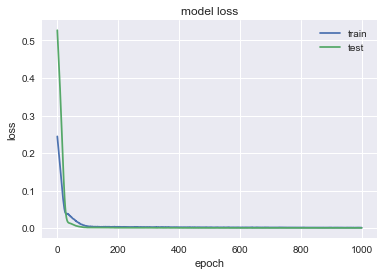

               BBY
MSE        1.97607
MAE        0.94021
R2        0.940507
MAPE (%)   1.39377


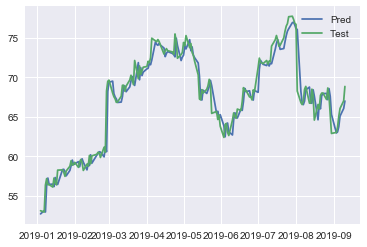

Predicting for  KO
Train on 1008 samples, validate on 172 samples
Epoch 1/1000
0s - loss: 0.1101 - val_loss: 0.4115
Epoch 2/1000
0s - loss: 0.1034 - val_loss: 0.3955
Epoch 3/1000
0s - loss: 0.0967 - val_loss: 0.3793
Epoch 4/1000
0s - loss: 0.0903 - val_loss: 0.3627
Epoch 5/1000
0s - loss: 0.0834 - val_loss: 0.3456
Epoch 6/1000
0s - loss: 0.0765 - val_loss: 0.3281
Epoch 7/1000
0s - loss: 0.0702 - val_loss: 0.3100
Epoch 8/1000
0s - loss: 0.0634 - val_loss: 0.2914
Epoch 9/1000
0s - loss: 0.0571 - val_loss: 0.2723
Epoch 10/1000
0s - loss: 0.0505 - val_loss: 0.2529
Epoch 11/1000
0s - loss: 0.0442 - val_loss: 0.2332
Epoch 12/1000
0s - loss: 0.0383 - val_loss: 0.2134
Epoch 13/1000
0s - loss: 0.0325 - val_loss: 0.1937
Epoch 14/1000
0s - loss: 0.0275 - val_loss: 0.1743
Epoch 15/1000
0s - loss: 0.0230 - val_loss: 0.1556
Epoch 16/1000
0s - loss: 0.0190 - val_loss: 0.1377
Epoch 17/1000
0s - loss: 0.0157 - val_loss: 0.1210
Epoch 18/1000
0s - loss: 0.0137 - val_loss: 0.1059
Epoch 19/1000
0s - loss: 

0s - loss: 0.0016 - val_loss: 0.0021
Epoch 165/1000
0s - loss: 0.0017 - val_loss: 0.0021
Epoch 166/1000
0s - loss: 0.0016 - val_loss: 0.0021
Epoch 167/1000
0s - loss: 0.0016 - val_loss: 0.0020
Epoch 168/1000
0s - loss: 0.0018 - val_loss: 0.0020
Epoch 169/1000
0s - loss: 0.0015 - val_loss: 0.0021
Epoch 170/1000
0s - loss: 0.0017 - val_loss: 0.0021
Epoch 171/1000
0s - loss: 0.0015 - val_loss: 0.0022
Epoch 172/1000
0s - loss: 0.0016 - val_loss: 0.0023
Epoch 173/1000
0s - loss: 0.0017 - val_loss: 0.0022
Epoch 174/1000
0s - loss: 0.0016 - val_loss: 0.0022
Epoch 175/1000
0s - loss: 0.0016 - val_loss: 0.0022
Epoch 176/1000
0s - loss: 0.0017 - val_loss: 0.0022
Epoch 177/1000
0s - loss: 0.0015 - val_loss: 0.0021
Epoch 178/1000
0s - loss: 0.0017 - val_loss: 0.0021
Epoch 179/1000
0s - loss: 0.0016 - val_loss: 0.0021
Epoch 180/1000
0s - loss: 0.0016 - val_loss: 0.0022
Epoch 181/1000
0s - loss: 0.0016 - val_loss: 0.0022
Epoch 182/1000
0s - loss: 0.0017 - val_loss: 0.0023
Epoch 183/1000
0s - loss: 0

0s - loss: 0.0014 - val_loss: 0.0014
Epoch 323/1000
0s - loss: 0.0016 - val_loss: 0.0013
Epoch 324/1000
0s - loss: 0.0013 - val_loss: 0.0013
Epoch 325/1000
0s - loss: 0.0014 - val_loss: 0.0013
Epoch 326/1000
0s - loss: 0.0014 - val_loss: 0.0014
Epoch 327/1000
0s - loss: 0.0015 - val_loss: 0.0015
Epoch 328/1000
0s - loss: 0.0014 - val_loss: 0.0014
Epoch 329/1000
0s - loss: 0.0014 - val_loss: 0.0014
Epoch 330/1000
0s - loss: 0.0014 - val_loss: 0.0014
Epoch 331/1000
0s - loss: 0.0014 - val_loss: 0.0014
Epoch 332/1000
0s - loss: 0.0015 - val_loss: 0.0014
Epoch 333/1000
0s - loss: 0.0014 - val_loss: 0.0013
Epoch 334/1000
0s - loss: 0.0013 - val_loss: 0.0014
Epoch 335/1000
0s - loss: 0.0014 - val_loss: 0.0014
Epoch 336/1000
0s - loss: 0.0013 - val_loss: 0.0014
Epoch 337/1000
0s - loss: 0.0014 - val_loss: 0.0013
Epoch 338/1000
0s - loss: 0.0014 - val_loss: 0.0013
Epoch 339/1000
0s - loss: 0.0014 - val_loss: 0.0013
Epoch 340/1000
0s - loss: 0.0014 - val_loss: 0.0013
Epoch 341/1000
0s - loss: 0

0s - loss: 0.0012 - val_loss: 8.5134e-04
Epoch 479/1000
0s - loss: 0.0012 - val_loss: 8.7811e-04
Epoch 480/1000
0s - loss: 0.0012 - val_loss: 8.9221e-04
Epoch 481/1000
0s - loss: 0.0012 - val_loss: 8.6756e-04
Epoch 482/1000
0s - loss: 0.0011 - val_loss: 8.6172e-04
Epoch 483/1000
0s - loss: 0.0012 - val_loss: 8.7057e-04
Epoch 484/1000
0s - loss: 0.0012 - val_loss: 9.1479e-04
Epoch 485/1000
0s - loss: 0.0011 - val_loss: 9.2395e-04
Epoch 486/1000
0s - loss: 0.0012 - val_loss: 8.8044e-04
Epoch 487/1000
0s - loss: 0.0010 - val_loss: 8.5833e-04
Epoch 488/1000
0s - loss: 0.0011 - val_loss: 8.6258e-04
Epoch 489/1000
0s - loss: 0.0012 - val_loss: 8.7557e-04
Epoch 490/1000
0s - loss: 0.0012 - val_loss: 8.6025e-04
Epoch 491/1000
0s - loss: 0.0011 - val_loss: 8.4821e-04
Epoch 492/1000
0s - loss: 0.0012 - val_loss: 8.3795e-04
Epoch 493/1000
0s - loss: 0.0012 - val_loss: 8.2880e-04
Epoch 494/1000
0s - loss: 0.0010 - val_loss: 8.2452e-04
Epoch 495/1000
0s - loss: 0.0011 - val_loss: 8.3977e-04
Epoch 4

0s - loss: 0.0011 - val_loss: 7.7937e-04
Epoch 624/1000
0s - loss: 8.8754e-04 - val_loss: 7.9031e-04
Epoch 625/1000
0s - loss: 9.8916e-04 - val_loss: 7.8838e-04
Epoch 626/1000
0s - loss: 0.0010 - val_loss: 7.8117e-04
Epoch 627/1000
0s - loss: 0.0010 - val_loss: 7.8673e-04
Epoch 628/1000
0s - loss: 0.0010 - val_loss: 7.9579e-04
Epoch 629/1000
0s - loss: 9.6103e-04 - val_loss: 7.7222e-04
Epoch 630/1000
0s - loss: 9.8229e-04 - val_loss: 7.4217e-04
Epoch 631/1000
0s - loss: 9.9312e-04 - val_loss: 7.4479e-04
Epoch 632/1000
0s - loss: 9.5355e-04 - val_loss: 7.8711e-04
Epoch 633/1000
0s - loss: 9.4320e-04 - val_loss: 7.8430e-04
Epoch 634/1000
0s - loss: 0.0010 - val_loss: 7.7625e-04
Epoch 635/1000
0s - loss: 9.1878e-04 - val_loss: 7.6607e-04
Epoch 636/1000
0s - loss: 0.0010 - val_loss: 7.5953e-04
Epoch 637/1000
0s - loss: 9.6595e-04 - val_loss: 7.8586e-04
Epoch 638/1000
0s - loss: 9.2537e-04 - val_loss: 8.3971e-04
Epoch 639/1000
0s - loss: 0.0011 - val_loss: 8.1322e-04
Epoch 640/1000
0s - los

0s - loss: 8.8348e-04 - val_loss: 9.3438e-04
Epoch 763/1000
0s - loss: 8.7202e-04 - val_loss: 8.9082e-04
Epoch 764/1000
0s - loss: 8.1935e-04 - val_loss: 8.8115e-04
Epoch 765/1000
0s - loss: 8.6907e-04 - val_loss: 8.7813e-04
Epoch 766/1000
0s - loss: 9.0702e-04 - val_loss: 9.6829e-04
Epoch 767/1000
0s - loss: 7.8469e-04 - val_loss: 9.5419e-04
Epoch 768/1000
0s - loss: 8.4957e-04 - val_loss: 8.8480e-04
Epoch 769/1000
0s - loss: 9.4487e-04 - val_loss: 8.6420e-04
Epoch 770/1000
0s - loss: 8.0951e-04 - val_loss: 8.5731e-04
Epoch 771/1000
0s - loss: 8.2889e-04 - val_loss: 8.7276e-04
Epoch 772/1000
0s - loss: 8.8614e-04 - val_loss: 8.7951e-04
Epoch 773/1000
0s - loss: 9.2588e-04 - val_loss: 8.5616e-04
Epoch 774/1000
0s - loss: 8.2522e-04 - val_loss: 8.6601e-04
Epoch 775/1000
0s - loss: 8.2478e-04 - val_loss: 8.7817e-04
Epoch 776/1000
0s - loss: 8.6688e-04 - val_loss: 8.1561e-04
Epoch 777/1000
0s - loss: 8.7742e-04 - val_loss: 8.1686e-04
Epoch 778/1000
0s - loss: 8.7449e-04 - val_loss: 8.2819

0s - loss: 7.9883e-04 - val_loss: 9.7316e-04
Epoch 902/1000
0s - loss: 7.7079e-04 - val_loss: 9.0061e-04
Epoch 903/1000
0s - loss: 6.7761e-04 - val_loss: 9.3879e-04
Epoch 904/1000
0s - loss: 7.1888e-04 - val_loss: 9.4525e-04
Epoch 905/1000
0s - loss: 7.3432e-04 - val_loss: 9.6955e-04
Epoch 906/1000
0s - loss: 7.0805e-04 - val_loss: 0.0010
Epoch 907/1000
0s - loss: 7.9388e-04 - val_loss: 9.8664e-04
Epoch 908/1000
0s - loss: 7.8887e-04 - val_loss: 9.3213e-04
Epoch 909/1000
0s - loss: 7.2645e-04 - val_loss: 0.0010
Epoch 910/1000
0s - loss: 7.6831e-04 - val_loss: 0.0010
Epoch 911/1000
0s - loss: 7.8965e-04 - val_loss: 9.1339e-04
Epoch 912/1000
0s - loss: 7.3935e-04 - val_loss: 8.5601e-04
Epoch 913/1000
0s - loss: 7.3123e-04 - val_loss: 9.0852e-04
Epoch 914/1000
0s - loss: 7.3677e-04 - val_loss: 0.0010
Epoch 915/1000
0s - loss: 7.4399e-04 - val_loss: 9.9112e-04
Epoch 916/1000
0s - loss: 7.4410e-04 - val_loss: 8.7633e-04
Epoch 917/1000
0s - loss: 7.5465e-04 - val_loss: 8.7935e-04
Epoch 918/1

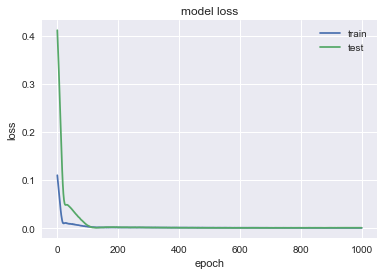

                KO
MSE       0.319146
MAE       0.415674
R2        0.960381
MAPE (%)  0.826547


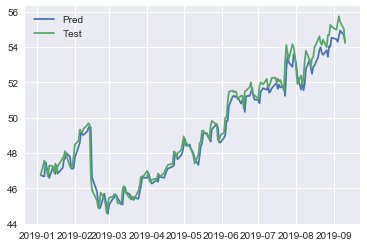

Predicting for  FTI
Train on 1008 samples, validate on 172 samples
Epoch 1/1000
0s - loss: 0.2118 - val_loss: 0.0296
Epoch 2/1000
0s - loss: 0.2003 - val_loss: 0.0258
Epoch 3/1000
0s - loss: 0.1889 - val_loss: 0.0222
Epoch 4/1000
0s - loss: 0.1776 - val_loss: 0.0188
Epoch 5/1000
0s - loss: 0.1662 - val_loss: 0.0156
Epoch 6/1000
0s - loss: 0.1544 - val_loss: 0.0127
Epoch 7/1000
0s - loss: 0.1433 - val_loss: 0.0099
Epoch 8/1000
0s - loss: 0.1319 - val_loss: 0.0075
Epoch 9/1000
0s - loss: 0.1197 - val_loss: 0.0055
Epoch 10/1000
0s - loss: 0.1081 - val_loss: 0.0038
Epoch 11/1000
0s - loss: 0.0967 - val_loss: 0.0027
Epoch 12/1000
0s - loss: 0.0859 - val_loss: 0.0021
Epoch 13/1000
0s - loss: 0.0743 - val_loss: 0.0022
Epoch 14/1000
0s - loss: 0.0641 - val_loss: 0.0031
Epoch 15/1000
0s - loss: 0.0540 - val_loss: 0.0046
Epoch 16/1000
0s - loss: 0.0457 - val_loss: 0.0070
Epoch 17/1000
0s - loss: 0.0384 - val_loss: 0.0100
Epoch 18/1000
0s - loss: 0.0315 - val_loss: 0.0137
Epoch 19/1000
0s - loss:

0s - loss: 0.0027 - val_loss: 8.2232e-04
Epoch 165/1000
0s - loss: 0.0028 - val_loss: 8.3941e-04
Epoch 166/1000
0s - loss: 0.0031 - val_loss: 8.5813e-04
Epoch 167/1000
0s - loss: 0.0027 - val_loss: 8.7701e-04
Epoch 168/1000
0s - loss: 0.0029 - val_loss: 8.6851e-04
Epoch 169/1000
0s - loss: 0.0028 - val_loss: 8.4926e-04
Epoch 170/1000
0s - loss: 0.0030 - val_loss: 8.2707e-04
Epoch 171/1000
0s - loss: 0.0030 - val_loss: 8.2787e-04
Epoch 172/1000
0s - loss: 0.0028 - val_loss: 8.4594e-04
Epoch 173/1000
0s - loss: 0.0030 - val_loss: 8.4961e-04
Epoch 174/1000
0s - loss: 0.0029 - val_loss: 8.4485e-04
Epoch 175/1000
0s - loss: 0.0027 - val_loss: 8.1038e-04
Epoch 176/1000
0s - loss: 0.0031 - val_loss: 8.1093e-04
Epoch 177/1000
0s - loss: 0.0027 - val_loss: 7.9789e-04
Epoch 178/1000
0s - loss: 0.0029 - val_loss: 8.1394e-04
Epoch 179/1000
0s - loss: 0.0028 - val_loss: 8.3192e-04
Epoch 180/1000
0s - loss: 0.0030 - val_loss: 8.7395e-04
Epoch 181/1000
0s - loss: 0.0028 - val_loss: 8.8776e-04
Epoch 1

0s - loss: 0.0024 - val_loss: 5.7969e-04
Epoch 312/1000
0s - loss: 0.0023 - val_loss: 5.8170e-04
Epoch 313/1000
0s - loss: 0.0024 - val_loss: 5.8885e-04
Epoch 314/1000
0s - loss: 0.0024 - val_loss: 5.6039e-04
Epoch 315/1000
0s - loss: 0.0026 - val_loss: 5.5380e-04
Epoch 316/1000
0s - loss: 0.0023 - val_loss: 5.5006e-04
Epoch 317/1000
0s - loss: 0.0025 - val_loss: 5.4446e-04
Epoch 318/1000
0s - loss: 0.0022 - val_loss: 5.3607e-04
Epoch 319/1000
0s - loss: 0.0024 - val_loss: 5.3406e-04
Epoch 320/1000
0s - loss: 0.0022 - val_loss: 5.5312e-04
Epoch 321/1000
0s - loss: 0.0023 - val_loss: 5.6207e-04
Epoch 322/1000
0s - loss: 0.0023 - val_loss: 5.3972e-04
Epoch 323/1000
0s - loss: 0.0022 - val_loss: 5.3692e-04
Epoch 324/1000
0s - loss: 0.0023 - val_loss: 5.1489e-04
Epoch 325/1000
0s - loss: 0.0023 - val_loss: 5.0114e-04
Epoch 326/1000
0s - loss: 0.0025 - val_loss: 5.0269e-04
Epoch 327/1000
0s - loss: 0.0027 - val_loss: 5.3426e-04
Epoch 328/1000
0s - loss: 0.0023 - val_loss: 5.6844e-04
Epoch 3

0s - loss: 0.0020 - val_loss: 3.7210e-04
Epoch 463/1000
0s - loss: 0.0021 - val_loss: 3.8669e-04
Epoch 464/1000
0s - loss: 0.0019 - val_loss: 3.9215e-04
Epoch 465/1000
0s - loss: 0.0020 - val_loss: 3.6895e-04
Epoch 466/1000
0s - loss: 0.0018 - val_loss: 3.4532e-04
Epoch 467/1000
0s - loss: 0.0019 - val_loss: 3.4170e-04
Epoch 468/1000
0s - loss: 0.0019 - val_loss: 3.4883e-04
Epoch 469/1000
0s - loss: 0.0020 - val_loss: 3.7248e-04
Epoch 470/1000
0s - loss: 0.0019 - val_loss: 3.8414e-04
Epoch 471/1000
0s - loss: 0.0018 - val_loss: 3.6807e-04
Epoch 472/1000
0s - loss: 0.0018 - val_loss: 3.5858e-04
Epoch 473/1000
0s - loss: 0.0020 - val_loss: 3.6110e-04
Epoch 474/1000
0s - loss: 0.0019 - val_loss: 3.6314e-04
Epoch 475/1000
0s - loss: 0.0018 - val_loss: 3.6117e-04
Epoch 476/1000
0s - loss: 0.0019 - val_loss: 3.6737e-04
Epoch 477/1000
0s - loss: 0.0019 - val_loss: 3.5883e-04
Epoch 478/1000
0s - loss: 0.0018 - val_loss: 3.5344e-04
Epoch 479/1000
0s - loss: 0.0021 - val_loss: 3.5492e-04
Epoch 4

0s - loss: 0.0019 - val_loss: 3.2534e-04
Epoch 614/1000
0s - loss: 0.0017 - val_loss: 3.2623e-04
Epoch 615/1000
0s - loss: 0.0016 - val_loss: 3.2281e-04
Epoch 616/1000
0s - loss: 0.0015 - val_loss: 3.2232e-04
Epoch 617/1000
0s - loss: 0.0016 - val_loss: 3.2177e-04
Epoch 618/1000
0s - loss: 0.0017 - val_loss: 3.2236e-04
Epoch 619/1000
0s - loss: 0.0015 - val_loss: 3.2609e-04
Epoch 620/1000
0s - loss: 0.0017 - val_loss: 3.3141e-04
Epoch 621/1000
0s - loss: 0.0017 - val_loss: 3.2487e-04
Epoch 622/1000
0s - loss: 0.0016 - val_loss: 3.2370e-04
Epoch 623/1000
0s - loss: 0.0017 - val_loss: 3.2217e-04
Epoch 624/1000
0s - loss: 0.0017 - val_loss: 3.2252e-04
Epoch 625/1000
0s - loss: 0.0016 - val_loss: 3.2472e-04
Epoch 626/1000
0s - loss: 0.0017 - val_loss: 3.3407e-04
Epoch 627/1000
0s - loss: 0.0017 - val_loss: 3.3476e-04
Epoch 628/1000
0s - loss: 0.0017 - val_loss: 3.2274e-04
Epoch 629/1000
0s - loss: 0.0016 - val_loss: 3.2669e-04
Epoch 630/1000
0s - loss: 0.0017 - val_loss: 3.2468e-04
Epoch 6

0s - loss: 0.0013 - val_loss: 3.3008e-04
Epoch 764/1000
0s - loss: 0.0014 - val_loss: 3.2723e-04
Epoch 765/1000
0s - loss: 0.0015 - val_loss: 3.3132e-04
Epoch 766/1000
0s - loss: 0.0014 - val_loss: 3.2573e-04
Epoch 767/1000
0s - loss: 0.0014 - val_loss: 3.3231e-04
Epoch 768/1000
0s - loss: 0.0014 - val_loss: 3.3146e-04
Epoch 769/1000
0s - loss: 0.0014 - val_loss: 3.2756e-04
Epoch 770/1000
0s - loss: 0.0014 - val_loss: 3.3591e-04
Epoch 771/1000
0s - loss: 0.0013 - val_loss: 3.3832e-04
Epoch 772/1000
0s - loss: 0.0014 - val_loss: 3.2907e-04
Epoch 773/1000
0s - loss: 0.0013 - val_loss: 3.2611e-04
Epoch 774/1000
0s - loss: 0.0013 - val_loss: 3.2627e-04
Epoch 775/1000
0s - loss: 0.0013 - val_loss: 3.2679e-04
Epoch 776/1000
0s - loss: 0.0015 - val_loss: 3.3010e-04
Epoch 777/1000
0s - loss: 0.0013 - val_loss: 3.2885e-04
Epoch 778/1000
0s - loss: 0.0013 - val_loss: 3.2647e-04
Epoch 779/1000
0s - loss: 0.0013 - val_loss: 3.2770e-04
Epoch 780/1000
0s - loss: 0.0014 - val_loss: 3.2641e-04
Epoch 7

0s - loss: 0.0013 - val_loss: 3.2889e-04
Epoch 911/1000
0s - loss: 0.0012 - val_loss: 3.2504e-04
Epoch 912/1000
0s - loss: 0.0013 - val_loss: 3.3255e-04
Epoch 913/1000
0s - loss: 0.0012 - val_loss: 3.2666e-04
Epoch 914/1000
0s - loss: 0.0012 - val_loss: 3.2618e-04
Epoch 915/1000
0s - loss: 0.0012 - val_loss: 3.2650e-04
Epoch 916/1000
0s - loss: 0.0012 - val_loss: 3.2749e-04
Epoch 917/1000
0s - loss: 0.0012 - val_loss: 3.2730e-04
Epoch 918/1000
0s - loss: 0.0012 - val_loss: 3.3144e-04
Epoch 919/1000
0s - loss: 0.0012 - val_loss: 3.2758e-04
Epoch 920/1000
0s - loss: 0.0012 - val_loss: 3.2894e-04
Epoch 921/1000
0s - loss: 0.0011 - val_loss: 3.2675e-04
Epoch 922/1000
0s - loss: 0.0012 - val_loss: 3.2750e-04
Epoch 923/1000
0s - loss: 0.0013 - val_loss: 3.2806e-04
Epoch 924/1000
0s - loss: 0.0013 - val_loss: 3.2895e-04
Epoch 925/1000
0s - loss: 0.0012 - val_loss: 3.2714e-04
Epoch 926/1000
0s - loss: 0.0011 - val_loss: 3.2658e-04
Epoch 927/1000
0s - loss: 0.0011 - val_loss: 3.2587e-04
Epoch 9

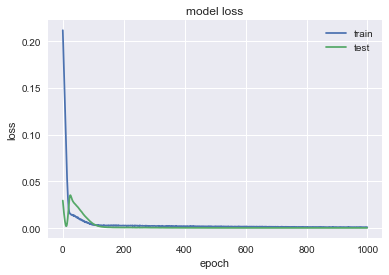

               FTI
MSE       0.266094
MAE       0.416037
R2        0.874712
MAPE (%)   1.74942


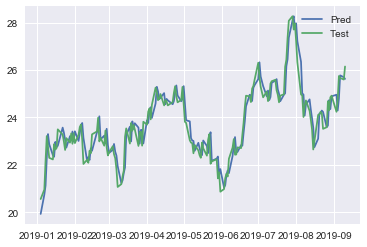

Predicting for  BLK
Train on 1008 samples, validate on 172 samples
Epoch 1/1000
0s - loss: 0.2007 - val_loss: 0.2489
Epoch 2/1000
0s - loss: 0.1917 - val_loss: 0.2378
Epoch 3/1000
0s - loss: 0.1833 - val_loss: 0.2269
Epoch 4/1000
0s - loss: 0.1753 - val_loss: 0.2161
Epoch 5/1000
0s - loss: 0.1669 - val_loss: 0.2055
Epoch 6/1000
0s - loss: 0.1590 - val_loss: 0.1949
Epoch 7/1000
0s - loss: 0.1513 - val_loss: 0.1844
Epoch 8/1000
0s - loss: 0.1434 - val_loss: 0.1738
Epoch 9/1000
0s - loss: 0.1355 - val_loss: 0.1632
Epoch 10/1000
0s - loss: 0.1282 - val_loss: 0.1526
Epoch 11/1000
0s - loss: 0.1201 - val_loss: 0.1419
Epoch 12/1000
0s - loss: 0.1124 - val_loss: 0.1313
Epoch 13/1000
0s - loss: 0.1053 - val_loss: 0.1206
Epoch 14/1000
0s - loss: 0.0973 - val_loss: 0.1100
Epoch 15/1000
0s - loss: 0.0902 - val_loss: 0.0995
Epoch 16/1000
0s - loss: 0.0830 - val_loss: 0.0892
Epoch 17/1000
0s - loss: 0.0756 - val_loss: 0.0791
Epoch 18/1000
0s - loss: 0.0693 - val_loss: 0.0694
Epoch 19/1000
0s - loss:

0s - loss: 0.0030 - val_loss: 8.7621e-04
Epoch 162/1000
0s - loss: 0.0032 - val_loss: 8.4675e-04
Epoch 163/1000
0s - loss: 0.0031 - val_loss: 8.1903e-04
Epoch 164/1000
0s - loss: 0.0031 - val_loss: 7.8940e-04
Epoch 165/1000
0s - loss: 0.0029 - val_loss: 7.9607e-04
Epoch 166/1000
0s - loss: 0.0028 - val_loss: 8.6478e-04
Epoch 167/1000
0s - loss: 0.0030 - val_loss: 9.5306e-04
Epoch 168/1000
0s - loss: 0.0028 - val_loss: 0.0010
Epoch 169/1000
0s - loss: 0.0029 - val_loss: 0.0011
Epoch 170/1000
0s - loss: 0.0031 - val_loss: 0.0010
Epoch 171/1000
0s - loss: 0.0029 - val_loss: 0.0010
Epoch 172/1000
0s - loss: 0.0028 - val_loss: 9.6710e-04
Epoch 173/1000
0s - loss: 0.0028 - val_loss: 9.1587e-04
Epoch 174/1000
0s - loss: 0.0027 - val_loss: 9.1358e-04
Epoch 175/1000
0s - loss: 0.0029 - val_loss: 9.1224e-04
Epoch 176/1000
0s - loss: 0.0031 - val_loss: 9.0325e-04
Epoch 177/1000
0s - loss: 0.0025 - val_loss: 8.9807e-04
Epoch 178/1000
0s - loss: 0.0028 - val_loss: 8.8463e-04
Epoch 179/1000
0s - los

0s - loss: 0.0023 - val_loss: 6.7572e-04
Epoch 311/1000
0s - loss: 0.0026 - val_loss: 6.6451e-04
Epoch 312/1000
0s - loss: 0.0020 - val_loss: 6.6578e-04
Epoch 313/1000
0s - loss: 0.0025 - val_loss: 6.8293e-04
Epoch 314/1000
0s - loss: 0.0024 - val_loss: 7.5910e-04
Epoch 315/1000
0s - loss: 0.0026 - val_loss: 8.2410e-04
Epoch 316/1000
0s - loss: 0.0024 - val_loss: 8.3811e-04
Epoch 317/1000
0s - loss: 0.0023 - val_loss: 8.1394e-04
Epoch 318/1000
0s - loss: 0.0025 - val_loss: 7.5873e-04
Epoch 319/1000
0s - loss: 0.0023 - val_loss: 7.1745e-04
Epoch 320/1000
0s - loss: 0.0026 - val_loss: 7.1315e-04
Epoch 321/1000
0s - loss: 0.0023 - val_loss: 6.7724e-04
Epoch 322/1000
0s - loss: 0.0023 - val_loss: 6.3452e-04
Epoch 323/1000
0s - loss: 0.0022 - val_loss: 6.4204e-04
Epoch 324/1000
0s - loss: 0.0026 - val_loss: 6.8485e-04
Epoch 325/1000
0s - loss: 0.0024 - val_loss: 7.2015e-04
Epoch 326/1000
0s - loss: 0.0023 - val_loss: 7.2261e-04
Epoch 327/1000
0s - loss: 0.0022 - val_loss: 7.0181e-04
Epoch 3

0s - loss: 0.0020 - val_loss: 4.0927e-04
Epoch 462/1000
0s - loss: 0.0019 - val_loss: 4.5833e-04
Epoch 463/1000
0s - loss: 0.0019 - val_loss: 5.5140e-04
Epoch 464/1000
0s - loss: 0.0018 - val_loss: 5.9836e-04
Epoch 465/1000
0s - loss: 0.0019 - val_loss: 5.9710e-04
Epoch 466/1000
0s - loss: 0.0018 - val_loss: 5.6728e-04
Epoch 467/1000
0s - loss: 0.0020 - val_loss: 4.9565e-04
Epoch 468/1000
0s - loss: 0.0019 - val_loss: 4.2079e-04
Epoch 469/1000
0s - loss: 0.0020 - val_loss: 3.9588e-04
Epoch 470/1000
0s - loss: 0.0020 - val_loss: 4.0130e-04
Epoch 471/1000
0s - loss: 0.0020 - val_loss: 4.3640e-04
Epoch 472/1000
0s - loss: 0.0018 - val_loss: 4.7595e-04
Epoch 473/1000
0s - loss: 0.0019 - val_loss: 4.9522e-04
Epoch 474/1000
0s - loss: 0.0019 - val_loss: 4.6741e-04
Epoch 475/1000
0s - loss: 0.0022 - val_loss: 4.3444e-04
Epoch 476/1000
0s - loss: 0.0019 - val_loss: 4.0793e-04
Epoch 477/1000
0s - loss: 0.0020 - val_loss: 3.7899e-04
Epoch 478/1000
0s - loss: 0.0018 - val_loss: 3.7650e-04
Epoch 4

0s - loss: 0.0017 - val_loss: 3.7944e-04
Epoch 615/1000
0s - loss: 0.0017 - val_loss: 3.6774e-04
Epoch 616/1000
0s - loss: 0.0016 - val_loss: 3.5449e-04
Epoch 617/1000
0s - loss: 0.0016 - val_loss: 3.5434e-04
Epoch 618/1000
0s - loss: 0.0017 - val_loss: 3.4522e-04
Epoch 619/1000
0s - loss: 0.0015 - val_loss: 3.3969e-04
Epoch 620/1000
0s - loss: 0.0017 - val_loss: 3.5809e-04
Epoch 621/1000
0s - loss: 0.0015 - val_loss: 3.8187e-04
Epoch 622/1000
0s - loss: 0.0017 - val_loss: 3.7190e-04
Epoch 623/1000
0s - loss: 0.0015 - val_loss: 3.5757e-04
Epoch 624/1000
0s - loss: 0.0015 - val_loss: 3.4614e-04
Epoch 625/1000
0s - loss: 0.0015 - val_loss: 3.4158e-04
Epoch 626/1000
0s - loss: 0.0015 - val_loss: 3.5085e-04
Epoch 627/1000
0s - loss: 0.0017 - val_loss: 3.6290e-04
Epoch 628/1000
0s - loss: 0.0014 - val_loss: 3.6308e-04
Epoch 629/1000
0s - loss: 0.0019 - val_loss: 3.6286e-04
Epoch 630/1000
0s - loss: 0.0015 - val_loss: 3.5183e-04
Epoch 631/1000
0s - loss: 0.0018 - val_loss: 3.3651e-04
Epoch 6

0s - loss: 0.0015 - val_loss: 3.3644e-04
Epoch 762/1000
0s - loss: 0.0015 - val_loss: 3.4029e-04
Epoch 763/1000
0s - loss: 0.0012 - val_loss: 3.3146e-04
Epoch 764/1000
0s - loss: 0.0014 - val_loss: 3.2639e-04
Epoch 765/1000
0s - loss: 0.0013 - val_loss: 3.2609e-04
Epoch 766/1000
0s - loss: 0.0014 - val_loss: 3.3029e-04
Epoch 767/1000
0s - loss: 0.0015 - val_loss: 3.3139e-04
Epoch 768/1000
0s - loss: 0.0013 - val_loss: 3.4355e-04
Epoch 769/1000
0s - loss: 0.0014 - val_loss: 3.4263e-04
Epoch 770/1000
0s - loss: 0.0013 - val_loss: 3.3695e-04
Epoch 771/1000
0s - loss: 0.0014 - val_loss: 3.3060e-04
Epoch 772/1000
0s - loss: 0.0014 - val_loss: 3.3852e-04
Epoch 773/1000
0s - loss: 0.0014 - val_loss: 3.3897e-04
Epoch 774/1000
0s - loss: 0.0014 - val_loss: 3.2501e-04
Epoch 775/1000
0s - loss: 0.0015 - val_loss: 3.2275e-04
Epoch 776/1000
0s - loss: 0.0014 - val_loss: 3.3073e-04
Epoch 777/1000
0s - loss: 0.0014 - val_loss: 3.4886e-04
Epoch 778/1000
0s - loss: 0.0014 - val_loss: 3.5251e-04
Epoch 7

0s - loss: 0.0012 - val_loss: 3.2793e-04
Epoch 909/1000
0s - loss: 0.0012 - val_loss: 3.2585e-04
Epoch 910/1000
0s - loss: 0.0012 - val_loss: 3.3969e-04
Epoch 911/1000
0s - loss: 0.0012 - val_loss: 3.5101e-04
Epoch 912/1000
0s - loss: 0.0012 - val_loss: 3.3561e-04
Epoch 913/1000
0s - loss: 0.0013 - val_loss: 3.2049e-04
Epoch 914/1000
0s - loss: 0.0013 - val_loss: 3.2034e-04
Epoch 915/1000
0s - loss: 0.0013 - val_loss: 3.2347e-04
Epoch 916/1000
0s - loss: 0.0011 - val_loss: 3.4637e-04
Epoch 917/1000
0s - loss: 0.0014 - val_loss: 3.7022e-04
Epoch 918/1000
0s - loss: 0.0012 - val_loss: 3.3653e-04
Epoch 919/1000
0s - loss: 0.0012 - val_loss: 3.2226e-04
Epoch 920/1000
0s - loss: 0.0011 - val_loss: 3.2660e-04
Epoch 921/1000
0s - loss: 0.0012 - val_loss: 3.3626e-04
Epoch 922/1000
0s - loss: 0.0012 - val_loss: 3.3209e-04
Epoch 923/1000
0s - loss: 0.0013 - val_loss: 3.3021e-04
Epoch 924/1000
0s - loss: 0.0013 - val_loss: 3.2254e-04
Epoch 925/1000
0s - loss: 0.0012 - val_loss: 3.3538e-04
Epoch 9

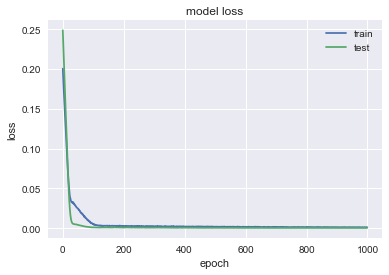

               BLK
MSE        34.2888
MAE        4.62131
R2        0.940828
MAPE (%)   1.05154


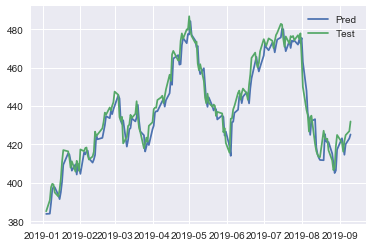

Predicting for  DVA
Train on 1008 samples, validate on 172 samples
Epoch 1/1000
0s - loss: 0.4260 - val_loss: 0.0753
Epoch 2/1000
0s - loss: 0.4079 - val_loss: 0.0691
Epoch 3/1000
0s - loss: 0.3898 - val_loss: 0.0631
Epoch 4/1000
0s - loss: 0.3715 - val_loss: 0.0573
Epoch 5/1000
0s - loss: 0.3540 - val_loss: 0.0515
Epoch 6/1000
0s - loss: 0.3353 - val_loss: 0.0459
Epoch 7/1000
0s - loss: 0.3168 - val_loss: 0.0404
Epoch 8/1000
0s - loss: 0.2985 - val_loss: 0.0350
Epoch 9/1000
0s - loss: 0.2784 - val_loss: 0.0297
Epoch 10/1000
0s - loss: 0.2573 - val_loss: 0.0247
Epoch 11/1000
0s - loss: 0.2374 - val_loss: 0.0200
Epoch 12/1000
0s - loss: 0.2160 - val_loss: 0.0157
Epoch 13/1000
0s - loss: 0.1941 - val_loss: 0.0120
Epoch 14/1000
0s - loss: 0.1724 - val_loss: 0.0089
Epoch 15/1000
0s - loss: 0.1509 - val_loss: 0.0067
Epoch 16/1000
0s - loss: 0.1284 - val_loss: 0.0055
Epoch 17/1000
0s - loss: 0.1069 - val_loss: 0.0056
Epoch 18/1000
0s - loss: 0.0892 - val_loss: 0.0070
Epoch 19/1000
0s - loss:

0s - loss: 0.0053 - val_loss: 0.0067
Epoch 166/1000
0s - loss: 0.0050 - val_loss: 0.0065
Epoch 167/1000
0s - loss: 0.0049 - val_loss: 0.0063
Epoch 168/1000
0s - loss: 0.0050 - val_loss: 0.0063
Epoch 169/1000
0s - loss: 0.0045 - val_loss: 0.0062
Epoch 170/1000
0s - loss: 0.0051 - val_loss: 0.0061
Epoch 171/1000
0s - loss: 0.0049 - val_loss: 0.0060
Epoch 172/1000
0s - loss: 0.0049 - val_loss: 0.0059
Epoch 173/1000
0s - loss: 0.0048 - val_loss: 0.0059
Epoch 174/1000
0s - loss: 0.0051 - val_loss: 0.0058
Epoch 175/1000
0s - loss: 0.0046 - val_loss: 0.0057
Epoch 176/1000
0s - loss: 0.0050 - val_loss: 0.0056
Epoch 177/1000
0s - loss: 0.0044 - val_loss: 0.0054
Epoch 178/1000
0s - loss: 0.0050 - val_loss: 0.0053
Epoch 179/1000
0s - loss: 0.0045 - val_loss: 0.0052
Epoch 180/1000
0s - loss: 0.0044 - val_loss: 0.0051
Epoch 181/1000
0s - loss: 0.0052 - val_loss: 0.0051
Epoch 182/1000
0s - loss: 0.0047 - val_loss: 0.0050
Epoch 183/1000
0s - loss: 0.0045 - val_loss: 0.0050
Epoch 184/1000
0s - loss: 0

0s - loss: 0.0041 - val_loss: 0.0027
Epoch 328/1000
0s - loss: 0.0039 - val_loss: 0.0028
Epoch 329/1000
0s - loss: 0.0045 - val_loss: 0.0026
Epoch 330/1000
0s - loss: 0.0038 - val_loss: 0.0026
Epoch 331/1000
0s - loss: 0.0039 - val_loss: 0.0026
Epoch 332/1000
0s - loss: 0.0043 - val_loss: 0.0026
Epoch 333/1000
0s - loss: 0.0042 - val_loss: 0.0027
Epoch 334/1000
0s - loss: 0.0040 - val_loss: 0.0028
Epoch 335/1000
0s - loss: 0.0043 - val_loss: 0.0027
Epoch 336/1000
0s - loss: 0.0043 - val_loss: 0.0028
Epoch 337/1000
0s - loss: 0.0040 - val_loss: 0.0027
Epoch 338/1000
0s - loss: 0.0038 - val_loss: 0.0026
Epoch 339/1000
0s - loss: 0.0040 - val_loss: 0.0026
Epoch 340/1000
0s - loss: 0.0042 - val_loss: 0.0026
Epoch 341/1000
0s - loss: 0.0043 - val_loss: 0.0026
Epoch 342/1000
0s - loss: 0.0039 - val_loss: 0.0026
Epoch 343/1000
0s - loss: 0.0040 - val_loss: 0.0026
Epoch 344/1000
0s - loss: 0.0041 - val_loss: 0.0026
Epoch 345/1000
0s - loss: 0.0039 - val_loss: 0.0026
Epoch 346/1000
0s - loss: 0

0s - loss: 0.0032 - val_loss: 0.0020
Epoch 487/1000
0s - loss: 0.0038 - val_loss: 0.0020
Epoch 488/1000
0s - loss: 0.0033 - val_loss: 0.0019
Epoch 489/1000
0s - loss: 0.0032 - val_loss: 0.0020
Epoch 490/1000
0s - loss: 0.0032 - val_loss: 0.0021
Epoch 491/1000
0s - loss: 0.0035 - val_loss: 0.0021
Epoch 492/1000
0s - loss: 0.0031 - val_loss: 0.0020
Epoch 493/1000
0s - loss: 0.0034 - val_loss: 0.0020
Epoch 494/1000
0s - loss: 0.0035 - val_loss: 0.0020
Epoch 495/1000
0s - loss: 0.0033 - val_loss: 0.0021
Epoch 496/1000
0s - loss: 0.0033 - val_loss: 0.0021
Epoch 497/1000
0s - loss: 0.0032 - val_loss: 0.0020
Epoch 498/1000
0s - loss: 0.0037 - val_loss: 0.0020
Epoch 499/1000
0s - loss: 0.0030 - val_loss: 0.0019
Epoch 500/1000
0s - loss: 0.0033 - val_loss: 0.0020
Epoch 501/1000
0s - loss: 0.0033 - val_loss: 0.0021
Epoch 502/1000
0s - loss: 0.0034 - val_loss: 0.0020
Epoch 503/1000
0s - loss: 0.0034 - val_loss: 0.0021
Epoch 504/1000
0s - loss: 0.0033 - val_loss: 0.0020
Epoch 505/1000
0s - loss: 0

0s - loss: 0.0025 - val_loss: 0.0014
Epoch 650/1000
0s - loss: 0.0026 - val_loss: 0.0013
Epoch 651/1000
0s - loss: 0.0029 - val_loss: 0.0014
Epoch 652/1000
0s - loss: 0.0026 - val_loss: 0.0014
Epoch 653/1000
0s - loss: 0.0027 - val_loss: 0.0014
Epoch 654/1000
0s - loss: 0.0027 - val_loss: 0.0014
Epoch 655/1000
0s - loss: 0.0027 - val_loss: 0.0015
Epoch 656/1000
0s - loss: 0.0028 - val_loss: 0.0014
Epoch 657/1000
0s - loss: 0.0029 - val_loss: 0.0013
Epoch 658/1000
0s - loss: 0.0028 - val_loss: 0.0013
Epoch 659/1000
0s - loss: 0.0024 - val_loss: 0.0013
Epoch 660/1000
0s - loss: 0.0026 - val_loss: 0.0013
Epoch 661/1000
0s - loss: 0.0026 - val_loss: 0.0013
Epoch 662/1000
0s - loss: 0.0027 - val_loss: 0.0013
Epoch 663/1000
0s - loss: 0.0025 - val_loss: 0.0013
Epoch 664/1000
0s - loss: 0.0028 - val_loss: 0.0014
Epoch 665/1000
0s - loss: 0.0026 - val_loss: 0.0014
Epoch 666/1000
0s - loss: 0.0027 - val_loss: 0.0014
Epoch 667/1000
0s - loss: 0.0025 - val_loss: 0.0013
Epoch 668/1000
0s - loss: 0

0s - loss: 0.0022 - val_loss: 9.5629e-04
Epoch 809/1000
0s - loss: 0.0021 - val_loss: 9.9185e-04
Epoch 810/1000
0s - loss: 0.0021 - val_loss: 9.4479e-04
Epoch 811/1000
0s - loss: 0.0022 - val_loss: 8.9867e-04
Epoch 812/1000
0s - loss: 0.0020 - val_loss: 9.4196e-04
Epoch 813/1000
0s - loss: 0.0022 - val_loss: 9.6944e-04
Epoch 814/1000
0s - loss: 0.0020 - val_loss: 9.3453e-04
Epoch 815/1000
0s - loss: 0.0021 - val_loss: 9.1804e-04
Epoch 816/1000
0s - loss: 0.0020 - val_loss: 8.9868e-04
Epoch 817/1000
0s - loss: 0.0022 - val_loss: 9.2186e-04
Epoch 818/1000
0s - loss: 0.0020 - val_loss: 9.4664e-04
Epoch 819/1000
0s - loss: 0.0021 - val_loss: 9.3866e-04
Epoch 820/1000
0s - loss: 0.0021 - val_loss: 8.8019e-04
Epoch 821/1000
0s - loss: 0.0022 - val_loss: 9.0195e-04
Epoch 822/1000
0s - loss: 0.0019 - val_loss: 9.4681e-04
Epoch 823/1000
0s - loss: 0.0022 - val_loss: 9.9774e-04
Epoch 824/1000
0s - loss: 0.0019 - val_loss: 9.7568e-04
Epoch 825/1000
0s - loss: 0.0023 - val_loss: 9.4272e-04
Epoch 8

0s - loss: 0.0017 - val_loss: 7.8685e-04
Epoch 959/1000
0s - loss: 0.0017 - val_loss: 7.6763e-04
Epoch 960/1000
0s - loss: 0.0019 - val_loss: 7.6897e-04
Epoch 961/1000
0s - loss: 0.0016 - val_loss: 7.6772e-04
Epoch 962/1000
0s - loss: 0.0018 - val_loss: 7.7871e-04
Epoch 963/1000
0s - loss: 0.0018 - val_loss: 7.6154e-04
Epoch 964/1000
0s - loss: 0.0018 - val_loss: 7.4555e-04
Epoch 965/1000
0s - loss: 0.0017 - val_loss: 7.5818e-04
Epoch 966/1000
0s - loss: 0.0018 - val_loss: 7.6976e-04
Epoch 967/1000
0s - loss: 0.0017 - val_loss: 7.6203e-04
Epoch 968/1000
0s - loss: 0.0017 - val_loss: 7.7076e-04
Epoch 969/1000
0s - loss: 0.0018 - val_loss: 7.7683e-04
Epoch 970/1000
0s - loss: 0.0017 - val_loss: 7.8122e-04
Epoch 971/1000
0s - loss: 0.0015 - val_loss: 8.2028e-04
Epoch 972/1000
0s - loss: 0.0018 - val_loss: 8.4531e-04
Epoch 973/1000
0s - loss: 0.0017 - val_loss: 8.1529e-04
Epoch 974/1000
0s - loss: 0.0018 - val_loss: 8.0438e-04
Epoch 975/1000
0s - loss: 0.0017 - val_loss: 8.0154e-04
Epoch 9

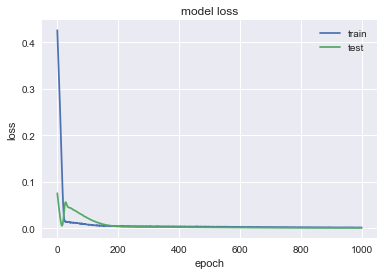

               DVA
MSE        1.28735
MAE       0.799844
R2        0.883569
MAPE (%)   1.49578


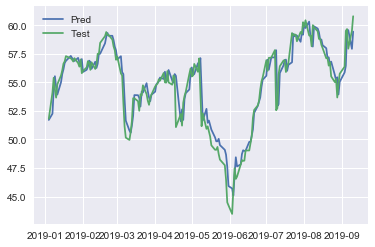

Predicting for  BA
Train on 1008 samples, validate on 172 samples
Epoch 1/1000
0s - loss: 0.1557 - val_loss: 0.5797
Epoch 2/1000
0s - loss: 0.1497 - val_loss: 0.5630
Epoch 3/1000
0s - loss: 0.1441 - val_loss: 0.5460
Epoch 4/1000
0s - loss: 0.1379 - val_loss: 0.5290
Epoch 5/1000
0s - loss: 0.1321 - val_loss: 0.5118
Epoch 6/1000
0s - loss: 0.1264 - val_loss: 0.4945
Epoch 7/1000
0s - loss: 0.1208 - val_loss: 0.4769
Epoch 8/1000
0s - loss: 0.1150 - val_loss: 0.4589
Epoch 9/1000
0s - loss: 0.1096 - val_loss: 0.4406
Epoch 10/1000
0s - loss: 0.1037 - val_loss: 0.4219
Epoch 11/1000
0s - loss: 0.0984 - val_loss: 0.4028
Epoch 12/1000
0s - loss: 0.0929 - val_loss: 0.3832
Epoch 13/1000
0s - loss: 0.0873 - val_loss: 0.3632
Epoch 14/1000
0s - loss: 0.0820 - val_loss: 0.3429
Epoch 15/1000
0s - loss: 0.0762 - val_loss: 0.3222
Epoch 16/1000
0s - loss: 0.0719 - val_loss: 0.3013
Epoch 17/1000
0s - loss: 0.0667 - val_loss: 0.2804
Epoch 18/1000
0s - loss: 0.0624 - val_loss: 0.2595
Epoch 19/1000
0s - loss: 

0s - loss: 0.0021 - val_loss: 8.3223e-04
Epoch 159/1000
0s - loss: 0.0022 - val_loss: 8.3425e-04
Epoch 160/1000
0s - loss: 0.0020 - val_loss: 8.3121e-04
Epoch 161/1000
0s - loss: 0.0022 - val_loss: 8.3447e-04
Epoch 162/1000
0s - loss: 0.0021 - val_loss: 8.7096e-04
Epoch 163/1000
0s - loss: 0.0023 - val_loss: 9.2133e-04
Epoch 164/1000
0s - loss: 0.0022 - val_loss: 9.3490e-04
Epoch 165/1000
0s - loss: 0.0020 - val_loss: 9.1124e-04
Epoch 166/1000
0s - loss: 0.0021 - val_loss: 8.8015e-04
Epoch 167/1000
0s - loss: 0.0020 - val_loss: 8.4428e-04
Epoch 168/1000
0s - loss: 0.0020 - val_loss: 8.4617e-04
Epoch 169/1000
0s - loss: 0.0023 - val_loss: 8.8056e-04
Epoch 170/1000
0s - loss: 0.0023 - val_loss: 8.9820e-04
Epoch 171/1000
0s - loss: 0.0018 - val_loss: 8.6332e-04
Epoch 172/1000
0s - loss: 0.0021 - val_loss: 8.3625e-04
Epoch 173/1000
0s - loss: 0.0019 - val_loss: 8.3091e-04
Epoch 174/1000
0s - loss: 0.0021 - val_loss: 8.3816e-04
Epoch 175/1000
0s - loss: 0.0022 - val_loss: 8.4952e-04
Epoch 1

0s - loss: 0.0018 - val_loss: 6.5452e-04
Epoch 306/1000
0s - loss: 0.0020 - val_loss: 6.6576e-04
Epoch 307/1000
0s - loss: 0.0019 - val_loss: 6.9507e-04
Epoch 308/1000
0s - loss: 0.0017 - val_loss: 6.9498e-04
Epoch 309/1000
0s - loss: 0.0017 - val_loss: 6.6972e-04
Epoch 310/1000
0s - loss: 0.0018 - val_loss: 6.4979e-04
Epoch 311/1000
0s - loss: 0.0017 - val_loss: 6.4802e-04
Epoch 312/1000
0s - loss: 0.0017 - val_loss: 6.6690e-04
Epoch 313/1000
0s - loss: 0.0018 - val_loss: 7.1289e-04
Epoch 314/1000
0s - loss: 0.0018 - val_loss: 7.0176e-04
Epoch 315/1000
0s - loss: 0.0017 - val_loss: 6.6943e-04
Epoch 316/1000
0s - loss: 0.0019 - val_loss: 6.4566e-04
Epoch 317/1000
0s - loss: 0.0016 - val_loss: 6.4018e-04
Epoch 318/1000
0s - loss: 0.0018 - val_loss: 6.3840e-04
Epoch 319/1000
0s - loss: 0.0017 - val_loss: 6.3658e-04
Epoch 320/1000
0s - loss: 0.0017 - val_loss: 6.3917e-04
Epoch 321/1000
0s - loss: 0.0017 - val_loss: 6.5069e-04
Epoch 322/1000
0s - loss: 0.0018 - val_loss: 6.7617e-04
Epoch 3

0s - loss: 0.0014 - val_loss: 4.9515e-04
Epoch 454/1000
0s - loss: 0.0015 - val_loss: 4.9232e-04
Epoch 455/1000
0s - loss: 0.0015 - val_loss: 4.8955e-04
Epoch 456/1000
0s - loss: 0.0016 - val_loss: 4.9570e-04
Epoch 457/1000
0s - loss: 0.0015 - val_loss: 4.9978e-04
Epoch 458/1000
0s - loss: 0.0015 - val_loss: 4.8966e-04
Epoch 459/1000
0s - loss: 0.0013 - val_loss: 4.9571e-04
Epoch 460/1000
0s - loss: 0.0015 - val_loss: 5.0127e-04
Epoch 461/1000
0s - loss: 0.0016 - val_loss: 4.8944e-04
Epoch 462/1000
0s - loss: 0.0014 - val_loss: 4.8797e-04
Epoch 463/1000
0s - loss: 0.0017 - val_loss: 4.8760e-04
Epoch 464/1000
0s - loss: 0.0017 - val_loss: 4.8582e-04
Epoch 465/1000
0s - loss: 0.0016 - val_loss: 4.8599e-04
Epoch 466/1000
0s - loss: 0.0015 - val_loss: 4.8510e-04
Epoch 467/1000
0s - loss: 0.0015 - val_loss: 4.8573e-04
Epoch 468/1000
0s - loss: 0.0016 - val_loss: 4.8412e-04
Epoch 469/1000
0s - loss: 0.0014 - val_loss: 4.8419e-04
Epoch 470/1000
0s - loss: 0.0016 - val_loss: 4.8319e-04
Epoch 4

0s - loss: 0.0013 - val_loss: 5.8659e-04
Epoch 602/1000
0s - loss: 0.0012 - val_loss: 4.8874e-04
Epoch 603/1000
0s - loss: 0.0013 - val_loss: 4.3957e-04
Epoch 604/1000
0s - loss: 0.0013 - val_loss: 4.2973e-04
Epoch 605/1000
0s - loss: 0.0013 - val_loss: 4.3882e-04
Epoch 606/1000
0s - loss: 0.0013 - val_loss: 4.7539e-04
Epoch 607/1000
0s - loss: 0.0012 - val_loss: 5.1941e-04
Epoch 608/1000
0s - loss: 0.0012 - val_loss: 5.0055e-04
Epoch 609/1000
0s - loss: 0.0014 - val_loss: 4.4503e-04
Epoch 610/1000
0s - loss: 0.0012 - val_loss: 4.2178e-04
Epoch 611/1000
0s - loss: 0.0012 - val_loss: 4.2145e-04
Epoch 612/1000
0s - loss: 0.0013 - val_loss: 4.4186e-04
Epoch 613/1000
0s - loss: 0.0012 - val_loss: 4.9327e-04
Epoch 614/1000
0s - loss: 0.0013 - val_loss: 5.2876e-04
Epoch 615/1000
0s - loss: 0.0014 - val_loss: 5.2919e-04
Epoch 616/1000
0s - loss: 0.0012 - val_loss: 4.9307e-04
Epoch 617/1000
0s - loss: 0.0012 - val_loss: 5.0639e-04
Epoch 618/1000
0s - loss: 0.0013 - val_loss: 5.2177e-04
Epoch 6

0s - loss: 0.0012 - val_loss: 5.5654e-04
Epoch 755/1000
0s - loss: 0.0012 - val_loss: 5.6614e-04
Epoch 756/1000
0s - loss: 0.0011 - val_loss: 5.8829e-04
Epoch 757/1000
0s - loss: 0.0011 - val_loss: 5.8867e-04
Epoch 758/1000
0s - loss: 0.0011 - val_loss: 6.3739e-04
Epoch 759/1000
0s - loss: 9.5282e-04 - val_loss: 7.4914e-04
Epoch 760/1000
0s - loss: 0.0010 - val_loss: 7.7187e-04
Epoch 761/1000
0s - loss: 0.0011 - val_loss: 6.1902e-04
Epoch 762/1000
0s - loss: 0.0011 - val_loss: 5.2888e-04
Epoch 763/1000
0s - loss: 0.0011 - val_loss: 6.1037e-04
Epoch 764/1000
0s - loss: 0.0011 - val_loss: 7.4125e-04
Epoch 765/1000
0s - loss: 0.0010 - val_loss: 7.3196e-04
Epoch 766/1000
0s - loss: 9.8589e-04 - val_loss: 6.1559e-04
Epoch 767/1000
0s - loss: 0.0011 - val_loss: 6.3224e-04
Epoch 768/1000
0s - loss: 0.0011 - val_loss: 6.4831e-04
Epoch 769/1000
0s - loss: 0.0012 - val_loss: 5.8761e-04
Epoch 770/1000
0s - loss: 0.0010 - val_loss: 6.2233e-04
Epoch 771/1000
0s - loss: 9.6250e-04 - val_loss: 6.4759

0s - loss: 9.7791e-04 - val_loss: 7.3445e-04
Epoch 904/1000
0s - loss: 9.7816e-04 - val_loss: 6.4393e-04
Epoch 905/1000
0s - loss: 8.7448e-04 - val_loss: 6.3924e-04
Epoch 906/1000
0s - loss: 9.9775e-04 - val_loss: 7.0268e-04
Epoch 907/1000
0s - loss: 0.0011 - val_loss: 6.6158e-04
Epoch 908/1000
0s - loss: 0.0011 - val_loss: 5.5261e-04
Epoch 909/1000
0s - loss: 0.0010 - val_loss: 5.5130e-04
Epoch 910/1000
0s - loss: 0.0011 - val_loss: 6.2697e-04
Epoch 911/1000
0s - loss: 8.0658e-04 - val_loss: 6.5246e-04
Epoch 912/1000
0s - loss: 9.3383e-04 - val_loss: 6.2525e-04
Epoch 913/1000
0s - loss: 0.0012 - val_loss: 7.1006e-04
Epoch 914/1000
0s - loss: 9.5378e-04 - val_loss: 7.0602e-04
Epoch 915/1000
0s - loss: 9.5239e-04 - val_loss: 6.2666e-04
Epoch 916/1000
0s - loss: 0.0010 - val_loss: 6.0741e-04
Epoch 917/1000
0s - loss: 9.9630e-04 - val_loss: 6.7449e-04
Epoch 918/1000
0s - loss: 9.4143e-04 - val_loss: 8.0588e-04
Epoch 919/1000
0s - loss: 9.9548e-04 - val_loss: 7.8121e-04
Epoch 920/1000
0s -

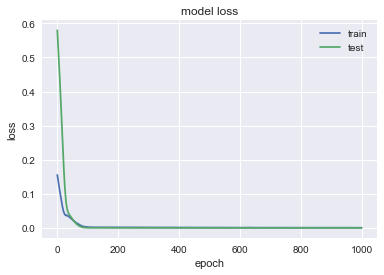

                BA
MSE        93.3836
MAE        7.52321
R2        0.816256
MAPE (%)   1.99139


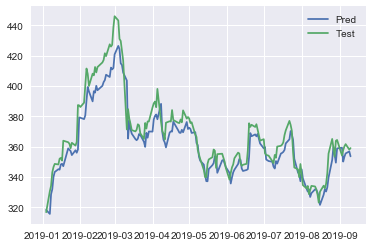

Predicting for  IBM
Train on 1008 samples, validate on 172 samples
Epoch 1/1000
0s - loss: 0.3775 - val_loss: 0.1513
Epoch 2/1000
0s - loss: 0.3602 - val_loss: 0.1415
Epoch 3/1000
0s - loss: 0.3439 - val_loss: 0.1319
Epoch 4/1000
0s - loss: 0.3271 - val_loss: 0.1224
Epoch 5/1000
0s - loss: 0.3105 - val_loss: 0.1129
Epoch 6/1000
0s - loss: 0.2940 - val_loss: 0.1035
Epoch 7/1000
0s - loss: 0.2767 - val_loss: 0.0940
Epoch 8/1000
0s - loss: 0.2593 - val_loss: 0.0846
Epoch 9/1000
0s - loss: 0.2412 - val_loss: 0.0751
Epoch 10/1000
0s - loss: 0.2231 - val_loss: 0.0656
Epoch 11/1000
0s - loss: 0.2041 - val_loss: 0.0562
Epoch 12/1000
0s - loss: 0.1847 - val_loss: 0.0471
Epoch 13/1000
0s - loss: 0.1645 - val_loss: 0.0383
Epoch 14/1000
0s - loss: 0.1460 - val_loss: 0.0301
Epoch 15/1000
0s - loss: 0.1253 - val_loss: 0.0226
Epoch 16/1000
0s - loss: 0.1077 - val_loss: 0.0161
Epoch 17/1000
0s - loss: 0.0894 - val_loss: 0.0109
Epoch 18/1000
0s - loss: 0.0731 - val_loss: 0.0071
Epoch 19/1000
0s - loss:

0s - loss: 0.0045 - val_loss: 5.8153e-04
Epoch 162/1000
0s - loss: 0.0045 - val_loss: 5.9647e-04
Epoch 163/1000
0s - loss: 0.0045 - val_loss: 6.0135e-04
Epoch 164/1000
0s - loss: 0.0044 - val_loss: 6.0712e-04
Epoch 165/1000
0s - loss: 0.0045 - val_loss: 6.1031e-04
Epoch 166/1000
0s - loss: 0.0045 - val_loss: 6.0313e-04
Epoch 167/1000
0s - loss: 0.0049 - val_loss: 5.9133e-04
Epoch 168/1000
0s - loss: 0.0046 - val_loss: 5.7485e-04
Epoch 169/1000
0s - loss: 0.0044 - val_loss: 5.6520e-04
Epoch 170/1000
0s - loss: 0.0049 - val_loss: 5.5993e-04
Epoch 171/1000
0s - loss: 0.0048 - val_loss: 5.6665e-04
Epoch 172/1000
0s - loss: 0.0047 - val_loss: 5.7613e-04
Epoch 173/1000
0s - loss: 0.0048 - val_loss: 5.8277e-04
Epoch 174/1000
0s - loss: 0.0047 - val_loss: 5.9688e-04
Epoch 175/1000
0s - loss: 0.0043 - val_loss: 5.9494e-04
Epoch 176/1000
0s - loss: 0.0044 - val_loss: 5.9279e-04
Epoch 177/1000
0s - loss: 0.0046 - val_loss: 5.9023e-04
Epoch 178/1000
0s - loss: 0.0039 - val_loss: 6.0018e-04
Epoch 1

0s - loss: 0.0039 - val_loss: 5.2340e-04
Epoch 315/1000
0s - loss: 0.0040 - val_loss: 5.2446e-04
Epoch 316/1000
0s - loss: 0.0038 - val_loss: 5.4934e-04
Epoch 317/1000
0s - loss: 0.0037 - val_loss: 5.7005e-04
Epoch 318/1000
0s - loss: 0.0040 - val_loss: 5.5559e-04
Epoch 319/1000
0s - loss: 0.0039 - val_loss: 5.3411e-04
Epoch 320/1000
0s - loss: 0.0036 - val_loss: 5.3468e-04
Epoch 321/1000
0s - loss: 0.0036 - val_loss: 5.4063e-04
Epoch 322/1000
0s - loss: 0.0038 - val_loss: 5.4276e-04
Epoch 323/1000
0s - loss: 0.0035 - val_loss: 5.5996e-04
Epoch 324/1000
0s - loss: 0.0038 - val_loss: 5.5368e-04
Epoch 325/1000
0s - loss: 0.0037 - val_loss: 5.3805e-04
Epoch 326/1000
0s - loss: 0.0038 - val_loss: 5.3092e-04
Epoch 327/1000
0s - loss: 0.0038 - val_loss: 5.5259e-04
Epoch 328/1000
0s - loss: 0.0038 - val_loss: 5.7124e-04
Epoch 329/1000
0s - loss: 0.0035 - val_loss: 5.4953e-04
Epoch 330/1000
0s - loss: 0.0035 - val_loss: 5.4206e-04
Epoch 331/1000
0s - loss: 0.0036 - val_loss: 5.3184e-04
Epoch 3

0s - loss: 0.0031 - val_loss: 5.4629e-04
Epoch 465/1000
0s - loss: 0.0031 - val_loss: 5.5788e-04
Epoch 466/1000
0s - loss: 0.0031 - val_loss: 5.3378e-04
Epoch 467/1000
0s - loss: 0.0032 - val_loss: 5.3062e-04
Epoch 468/1000
0s - loss: 0.0030 - val_loss: 5.2579e-04
Epoch 469/1000
0s - loss: 0.0031 - val_loss: 5.1224e-04
Epoch 470/1000
0s - loss: 0.0032 - val_loss: 5.0175e-04
Epoch 471/1000
0s - loss: 0.0031 - val_loss: 5.1369e-04
Epoch 472/1000
0s - loss: 0.0030 - val_loss: 5.1360e-04
Epoch 473/1000
0s - loss: 0.0034 - val_loss: 5.0161e-04
Epoch 474/1000
0s - loss: 0.0032 - val_loss: 5.0807e-04
Epoch 475/1000
0s - loss: 0.0032 - val_loss: 5.2272e-04
Epoch 476/1000
0s - loss: 0.0031 - val_loss: 5.3654e-04
Epoch 477/1000
0s - loss: 0.0029 - val_loss: 5.4837e-04
Epoch 478/1000
0s - loss: 0.0029 - val_loss: 5.5420e-04
Epoch 479/1000
0s - loss: 0.0031 - val_loss: 5.3968e-04
Epoch 480/1000
0s - loss: 0.0031 - val_loss: 5.1525e-04
Epoch 481/1000
0s - loss: 0.0028 - val_loss: 5.1336e-04
Epoch 4

0s - loss: 0.0025 - val_loss: 5.2668e-04
Epoch 613/1000
0s - loss: 0.0026 - val_loss: 5.1842e-04
Epoch 614/1000
0s - loss: 0.0026 - val_loss: 5.2773e-04
Epoch 615/1000
0s - loss: 0.0025 - val_loss: 5.3769e-04
Epoch 616/1000
0s - loss: 0.0028 - val_loss: 5.1294e-04
Epoch 617/1000
0s - loss: 0.0025 - val_loss: 5.1269e-04
Epoch 618/1000
0s - loss: 0.0026 - val_loss: 5.4568e-04
Epoch 619/1000
0s - loss: 0.0026 - val_loss: 5.6817e-04
Epoch 620/1000
0s - loss: 0.0027 - val_loss: 5.1367e-04
Epoch 621/1000
0s - loss: 0.0025 - val_loss: 4.9767e-04
Epoch 622/1000
0s - loss: 0.0026 - val_loss: 5.0182e-04
Epoch 623/1000
0s - loss: 0.0026 - val_loss: 5.2318e-04
Epoch 624/1000
0s - loss: 0.0025 - val_loss: 5.1531e-04
Epoch 625/1000
0s - loss: 0.0027 - val_loss: 5.1056e-04
Epoch 626/1000
0s - loss: 0.0027 - val_loss: 5.1265e-04
Epoch 627/1000
0s - loss: 0.0024 - val_loss: 5.2411e-04
Epoch 628/1000
0s - loss: 0.0027 - val_loss: 5.3513e-04
Epoch 629/1000
0s - loss: 0.0026 - val_loss: 5.2777e-04
Epoch 6

0s - loss: 0.0024 - val_loss: 5.1117e-04
Epoch 761/1000
0s - loss: 0.0021 - val_loss: 5.3439e-04
Epoch 762/1000
0s - loss: 0.0024 - val_loss: 5.5209e-04
Epoch 763/1000
0s - loss: 0.0023 - val_loss: 5.4087e-04
Epoch 764/1000
0s - loss: 0.0021 - val_loss: 5.1807e-04
Epoch 765/1000
0s - loss: 0.0022 - val_loss: 5.0917e-04
Epoch 766/1000
0s - loss: 0.0021 - val_loss: 5.1529e-04
Epoch 767/1000
0s - loss: 0.0020 - val_loss: 5.2904e-04
Epoch 768/1000
0s - loss: 0.0021 - val_loss: 5.2873e-04
Epoch 769/1000
0s - loss: 0.0023 - val_loss: 5.1874e-04
Epoch 770/1000
0s - loss: 0.0020 - val_loss: 5.2075e-04
Epoch 771/1000
0s - loss: 0.0021 - val_loss: 5.4367e-04
Epoch 772/1000
0s - loss: 0.0022 - val_loss: 5.4884e-04
Epoch 773/1000
0s - loss: 0.0023 - val_loss: 5.1822e-04
Epoch 774/1000
0s - loss: 0.0023 - val_loss: 5.0418e-04
Epoch 775/1000
0s - loss: 0.0021 - val_loss: 5.1164e-04
Epoch 776/1000
0s - loss: 0.0021 - val_loss: 5.2078e-04
Epoch 777/1000
0s - loss: 0.0021 - val_loss: 5.1830e-04
Epoch 7

0s - loss: 0.0018 - val_loss: 5.4363e-04
Epoch 909/1000
0s - loss: 0.0019 - val_loss: 5.3126e-04
Epoch 910/1000
0s - loss: 0.0019 - val_loss: 5.2543e-04
Epoch 911/1000
0s - loss: 0.0018 - val_loss: 5.1754e-04
Epoch 912/1000
0s - loss: 0.0018 - val_loss: 5.0665e-04
Epoch 913/1000
0s - loss: 0.0018 - val_loss: 5.0250e-04
Epoch 914/1000
0s - loss: 0.0017 - val_loss: 5.3860e-04
Epoch 915/1000
0s - loss: 0.0016 - val_loss: 5.6652e-04
Epoch 916/1000
0s - loss: 0.0018 - val_loss: 5.2170e-04
Epoch 917/1000
0s - loss: 0.0018 - val_loss: 5.0010e-04
Epoch 918/1000
0s - loss: 0.0018 - val_loss: 5.2137e-04
Epoch 919/1000
0s - loss: 0.0017 - val_loss: 5.7605e-04
Epoch 920/1000
0s - loss: 0.0018 - val_loss: 5.2743e-04
Epoch 921/1000
0s - loss: 0.0016 - val_loss: 5.0369e-04
Epoch 922/1000
0s - loss: 0.0017 - val_loss: 5.1268e-04
Epoch 923/1000
0s - loss: 0.0018 - val_loss: 4.9933e-04
Epoch 924/1000
0s - loss: 0.0018 - val_loss: 5.1434e-04
Epoch 925/1000
0s - loss: 0.0015 - val_loss: 5.6676e-04
Epoch 9

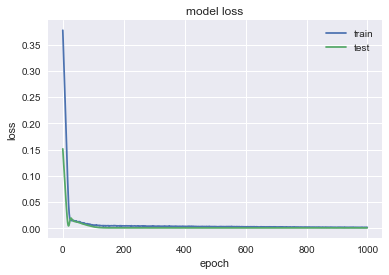

               IBM
MSE        2.75181
MAE        1.13675
R2          0.9375
MAPE (%)  0.833396


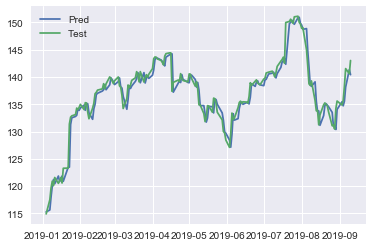

Predicting for  ALB
Train on 1008 samples, validate on 172 samples
Epoch 1/1000
0s - loss: 0.2455 - val_loss: 0.1061
Epoch 2/1000
0s - loss: 0.2358 - val_loss: 0.0995
Epoch 3/1000
0s - loss: 0.2262 - val_loss: 0.0929
Epoch 4/1000
0s - loss: 0.2163 - val_loss: 0.0864
Epoch 5/1000
0s - loss: 0.2066 - val_loss: 0.0799
Epoch 6/1000
0s - loss: 0.1963 - val_loss: 0.0734
Epoch 7/1000
0s - loss: 0.1862 - val_loss: 0.0669
Epoch 8/1000
0s - loss: 0.1764 - val_loss: 0.0604
Epoch 9/1000
0s - loss: 0.1659 - val_loss: 0.0540
Epoch 10/1000
0s - loss: 0.1548 - val_loss: 0.0477
Epoch 11/1000
0s - loss: 0.1445 - val_loss: 0.0415
Epoch 12/1000
0s - loss: 0.1337 - val_loss: 0.0355
Epoch 13/1000
0s - loss: 0.1230 - val_loss: 0.0297
Epoch 14/1000
0s - loss: 0.1122 - val_loss: 0.0243
Epoch 15/1000
0s - loss: 0.1021 - val_loss: 0.0193
Epoch 16/1000
0s - loss: 0.0915 - val_loss: 0.0149
Epoch 17/1000
0s - loss: 0.0817 - val_loss: 0.0111
Epoch 18/1000
0s - loss: 0.0725 - val_loss: 0.0080
Epoch 19/1000
0s - loss:

0s - loss: 0.0034 - val_loss: 4.2356e-04
Epoch 159/1000
0s - loss: 0.0035 - val_loss: 4.2984e-04
Epoch 160/1000
0s - loss: 0.0037 - val_loss: 4.1428e-04
Epoch 161/1000
0s - loss: 0.0034 - val_loss: 3.9348e-04
Epoch 162/1000
0s - loss: 0.0033 - val_loss: 3.7324e-04
Epoch 163/1000
0s - loss: 0.0037 - val_loss: 3.6129e-04
Epoch 164/1000
0s - loss: 0.0035 - val_loss: 3.6727e-04
Epoch 165/1000
0s - loss: 0.0031 - val_loss: 3.8958e-04
Epoch 166/1000
0s - loss: 0.0037 - val_loss: 4.1242e-04
Epoch 167/1000
0s - loss: 0.0036 - val_loss: 4.2331e-04
Epoch 168/1000
0s - loss: 0.0034 - val_loss: 4.3704e-04
Epoch 169/1000
0s - loss: 0.0033 - val_loss: 4.3732e-04
Epoch 170/1000
0s - loss: 0.0033 - val_loss: 4.3174e-04
Epoch 171/1000
0s - loss: 0.0032 - val_loss: 4.2208e-04
Epoch 172/1000
0s - loss: 0.0036 - val_loss: 4.1311e-04
Epoch 173/1000
0s - loss: 0.0034 - val_loss: 3.8941e-04
Epoch 174/1000
0s - loss: 0.0032 - val_loss: 3.7541e-04
Epoch 175/1000
0s - loss: 0.0035 - val_loss: 3.8215e-04
Epoch 1

0s - loss: 0.0028 - val_loss: 3.2868e-04
Epoch 308/1000
0s - loss: 0.0029 - val_loss: 3.3240e-04
Epoch 309/1000
0s - loss: 0.0027 - val_loss: 3.3049e-04
Epoch 310/1000
0s - loss: 0.0029 - val_loss: 3.1511e-04
Epoch 311/1000
0s - loss: 0.0029 - val_loss: 2.9659e-04
Epoch 312/1000
0s - loss: 0.0026 - val_loss: 2.9987e-04
Epoch 313/1000
0s - loss: 0.0027 - val_loss: 3.3095e-04
Epoch 314/1000
0s - loss: 0.0027 - val_loss: 3.5930e-04
Epoch 315/1000
0s - loss: 0.0025 - val_loss: 3.6756e-04
Epoch 316/1000
0s - loss: 0.0026 - val_loss: 3.6750e-04
Epoch 317/1000
0s - loss: 0.0026 - val_loss: 3.4677e-04
Epoch 318/1000
0s - loss: 0.0025 - val_loss: 3.2039e-04
Epoch 319/1000
0s - loss: 0.0024 - val_loss: 3.0797e-04
Epoch 320/1000
0s - loss: 0.0026 - val_loss: 3.0992e-04
Epoch 321/1000
0s - loss: 0.0027 - val_loss: 3.1917e-04
Epoch 322/1000
0s - loss: 0.0027 - val_loss: 3.4142e-04
Epoch 323/1000
0s - loss: 0.0029 - val_loss: 3.6713e-04
Epoch 324/1000
0s - loss: 0.0027 - val_loss: 3.6544e-04
Epoch 3

0s - loss: 0.0019 - val_loss: 2.7046e-04
Epoch 461/1000
0s - loss: 0.0023 - val_loss: 2.8161e-04
Epoch 462/1000
0s - loss: 0.0022 - val_loss: 2.8219e-04
Epoch 463/1000
0s - loss: 0.0022 - val_loss: 2.6851e-04
Epoch 464/1000
0s - loss: 0.0019 - val_loss: 2.6140e-04
Epoch 465/1000
0s - loss: 0.0020 - val_loss: 2.6245e-04
Epoch 466/1000
0s - loss: 0.0022 - val_loss: 2.7233e-04
Epoch 467/1000
0s - loss: 0.0022 - val_loss: 2.8897e-04
Epoch 468/1000
0s - loss: 0.0020 - val_loss: 3.0391e-04
Epoch 469/1000
0s - loss: 0.0019 - val_loss: 3.0284e-04
Epoch 470/1000
0s - loss: 0.0020 - val_loss: 2.9076e-04
Epoch 471/1000
0s - loss: 0.0022 - val_loss: 2.7557e-04
Epoch 472/1000
0s - loss: 0.0020 - val_loss: 2.6845e-04
Epoch 473/1000
0s - loss: 0.0018 - val_loss: 2.7020e-04
Epoch 474/1000
0s - loss: 0.0020 - val_loss: 2.8553e-04
Epoch 475/1000
0s - loss: 0.0023 - val_loss: 2.9930e-04
Epoch 476/1000
0s - loss: 0.0022 - val_loss: 2.9743e-04
Epoch 477/1000
0s - loss: 0.0021 - val_loss: 2.7249e-04
Epoch 4

0s - loss: 0.0019 - val_loss: 2.5236e-04
Epoch 608/1000
0s - loss: 0.0019 - val_loss: 2.5513e-04
Epoch 609/1000
0s - loss: 0.0021 - val_loss: 2.6434e-04
Epoch 610/1000
0s - loss: 0.0018 - val_loss: 2.6558e-04
Epoch 611/1000
0s - loss: 0.0017 - val_loss: 2.6324e-04
Epoch 612/1000
0s - loss: 0.0017 - val_loss: 2.6416e-04
Epoch 613/1000
0s - loss: 0.0017 - val_loss: 2.6506e-04
Epoch 614/1000
0s - loss: 0.0019 - val_loss: 2.6184e-04
Epoch 615/1000
0s - loss: 0.0019 - val_loss: 2.5727e-04
Epoch 616/1000
0s - loss: 0.0019 - val_loss: 2.5883e-04
Epoch 617/1000
0s - loss: 0.0019 - val_loss: 2.6669e-04
Epoch 618/1000
0s - loss: 0.0018 - val_loss: 2.7041e-04
Epoch 619/1000
0s - loss: 0.0018 - val_loss: 2.6754e-04
Epoch 620/1000
0s - loss: 0.0018 - val_loss: 2.5633e-04
Epoch 621/1000
0s - loss: 0.0017 - val_loss: 2.5310e-04
Epoch 622/1000
0s - loss: 0.0017 - val_loss: 2.5400e-04
Epoch 623/1000
0s - loss: 0.0019 - val_loss: 2.5767e-04
Epoch 624/1000
0s - loss: 0.0017 - val_loss: 2.5719e-04
Epoch 6

0s - loss: 0.0015 - val_loss: 2.5820e-04
Epoch 756/1000
0s - loss: 0.0015 - val_loss: 2.5764e-04
Epoch 757/1000
0s - loss: 0.0016 - val_loss: 2.6552e-04
Epoch 758/1000
0s - loss: 0.0018 - val_loss: 2.6627e-04
Epoch 759/1000
0s - loss: 0.0015 - val_loss: 2.5737e-04
Epoch 760/1000
0s - loss: 0.0017 - val_loss: 2.5309e-04
Epoch 761/1000
0s - loss: 0.0015 - val_loss: 2.5389e-04
Epoch 762/1000
0s - loss: 0.0016 - val_loss: 2.6241e-04
Epoch 763/1000
0s - loss: 0.0016 - val_loss: 2.6599e-04
Epoch 764/1000
0s - loss: 0.0014 - val_loss: 2.5920e-04
Epoch 765/1000
0s - loss: 0.0015 - val_loss: 2.5930e-04
Epoch 766/1000
0s - loss: 0.0016 - val_loss: 2.6066e-04
Epoch 767/1000
0s - loss: 0.0017 - val_loss: 2.5852e-04
Epoch 768/1000
0s - loss: 0.0016 - val_loss: 2.5543e-04
Epoch 769/1000
0s - loss: 0.0015 - val_loss: 2.5764e-04
Epoch 770/1000
0s - loss: 0.0014 - val_loss: 2.6106e-04
Epoch 771/1000
0s - loss: 0.0016 - val_loss: 2.6659e-04
Epoch 772/1000
0s - loss: 0.0015 - val_loss: 2.6487e-04
Epoch 7

0s - loss: 0.0012 - val_loss: 2.5986e-04
Epoch 904/1000
0s - loss: 0.0014 - val_loss: 2.7401e-04
Epoch 905/1000
0s - loss: 0.0014 - val_loss: 2.6536e-04
Epoch 906/1000
0s - loss: 0.0015 - val_loss: 2.5276e-04
Epoch 907/1000
0s - loss: 0.0014 - val_loss: 2.5249e-04
Epoch 908/1000
0s - loss: 0.0014 - val_loss: 2.5418e-04
Epoch 909/1000
0s - loss: 0.0014 - val_loss: 2.5803e-04
Epoch 910/1000
0s - loss: 0.0013 - val_loss: 2.6131e-04
Epoch 911/1000
0s - loss: 0.0012 - val_loss: 2.5906e-04
Epoch 912/1000
0s - loss: 0.0013 - val_loss: 2.5504e-04
Epoch 913/1000
0s - loss: 0.0013 - val_loss: 2.5852e-04
Epoch 914/1000
0s - loss: 0.0016 - val_loss: 2.6766e-04
Epoch 915/1000
0s - loss: 0.0014 - val_loss: 2.6243e-04
Epoch 916/1000
0s - loss: 0.0015 - val_loss: 2.5551e-04
Epoch 917/1000
0s - loss: 0.0016 - val_loss: 2.5655e-04
Epoch 918/1000
0s - loss: 0.0013 - val_loss: 2.6481e-04
Epoch 919/1000
0s - loss: 0.0015 - val_loss: 2.7478e-04
Epoch 920/1000
0s - loss: 0.0015 - val_loss: 2.5847e-04
Epoch 9

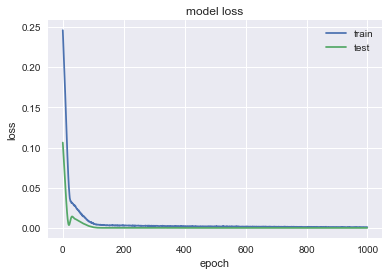

               ALB
MSE        2.64484
MAE        1.21202
R2        0.957032
MAPE (%)    1.6298


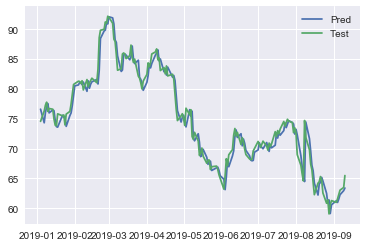

Predicting for  CBRE
Train on 1008 samples, validate on 172 samples
Epoch 1/1000
0s - loss: 0.2122 - val_loss: 0.6493
Epoch 2/1000
0s - loss: 0.2013 - val_loss: 0.6255
Epoch 3/1000
0s - loss: 0.1907 - val_loss: 0.6014
Epoch 4/1000
0s - loss: 0.1800 - val_loss: 0.5768
Epoch 5/1000
0s - loss: 0.1694 - val_loss: 0.5517
Epoch 6/1000
0s - loss: 0.1585 - val_loss: 0.5258
Epoch 7/1000
0s - loss: 0.1480 - val_loss: 0.4992
Epoch 8/1000
0s - loss: 0.1373 - val_loss: 0.4717
Epoch 9/1000
0s - loss: 0.1259 - val_loss: 0.4434
Epoch 10/1000
0s - loss: 0.1149 - val_loss: 0.4142
Epoch 11/1000
0s - loss: 0.1039 - val_loss: 0.3843
Epoch 12/1000
0s - loss: 0.0931 - val_loss: 0.3537
Epoch 13/1000
0s - loss: 0.0822 - val_loss: 0.3227
Epoch 14/1000
0s - loss: 0.0717 - val_loss: 0.2915
Epoch 15/1000
0s - loss: 0.0628 - val_loss: 0.2605
Epoch 16/1000
0s - loss: 0.0529 - val_loss: 0.2302
Epoch 17/1000
0s - loss: 0.0452 - val_loss: 0.2011
Epoch 18/1000
0s - loss: 0.0387 - val_loss: 0.1736
Epoch 19/1000
0s - loss

0s - loss: 0.0028 - val_loss: 9.4060e-04
Epoch 163/1000
0s - loss: 0.0028 - val_loss: 9.4750e-04
Epoch 164/1000
0s - loss: 0.0029 - val_loss: 9.6706e-04
Epoch 165/1000
0s - loss: 0.0028 - val_loss: 0.0010
Epoch 166/1000
0s - loss: 0.0028 - val_loss: 0.0011
Epoch 167/1000
0s - loss: 0.0028 - val_loss: 0.0011
Epoch 168/1000
0s - loss: 0.0028 - val_loss: 0.0011
Epoch 169/1000
0s - loss: 0.0026 - val_loss: 0.0011
Epoch 170/1000
0s - loss: 0.0027 - val_loss: 0.0011
Epoch 171/1000
0s - loss: 0.0029 - val_loss: 0.0012
Epoch 172/1000
0s - loss: 0.0027 - val_loss: 0.0012
Epoch 173/1000
0s - loss: 0.0027 - val_loss: 0.0012
Epoch 174/1000
0s - loss: 0.0026 - val_loss: 0.0012
Epoch 175/1000
0s - loss: 0.0024 - val_loss: 0.0012
Epoch 176/1000
0s - loss: 0.0027 - val_loss: 0.0012
Epoch 177/1000
0s - loss: 0.0027 - val_loss: 0.0013
Epoch 178/1000
0s - loss: 0.0024 - val_loss: 0.0013
Epoch 179/1000
0s - loss: 0.0026 - val_loss: 0.0012
Epoch 180/1000
0s - loss: 0.0027 - val_loss: 0.0012
Epoch 181/1000


0s - loss: 0.0023 - val_loss: 7.3812e-04
Epoch 315/1000
0s - loss: 0.0022 - val_loss: 7.5147e-04
Epoch 316/1000
0s - loss: 0.0021 - val_loss: 7.5843e-04
Epoch 317/1000
0s - loss: 0.0024 - val_loss: 7.6091e-04
Epoch 318/1000
0s - loss: 0.0024 - val_loss: 8.2419e-04
Epoch 319/1000
0s - loss: 0.0022 - val_loss: 8.8898e-04
Epoch 320/1000
0s - loss: 0.0023 - val_loss: 8.0038e-04
Epoch 321/1000
0s - loss: 0.0025 - val_loss: 7.3045e-04
Epoch 322/1000
0s - loss: 0.0020 - val_loss: 7.1710e-04
Epoch 323/1000
0s - loss: 0.0022 - val_loss: 7.1872e-04
Epoch 324/1000
0s - loss: 0.0023 - val_loss: 7.3632e-04
Epoch 325/1000
0s - loss: 0.0023 - val_loss: 7.7001e-04
Epoch 326/1000
0s - loss: 0.0022 - val_loss: 7.5720e-04
Epoch 327/1000
0s - loss: 0.0024 - val_loss: 7.6499e-04
Epoch 328/1000
0s - loss: 0.0022 - val_loss: 7.3327e-04
Epoch 329/1000
0s - loss: 0.0022 - val_loss: 7.0003e-04
Epoch 330/1000
0s - loss: 0.0023 - val_loss: 6.9094e-04
Epoch 331/1000
0s - loss: 0.0022 - val_loss: 7.0040e-04
Epoch 3

0s - loss: 0.0016 - val_loss: 5.5162e-04
Epoch 468/1000
0s - loss: 0.0018 - val_loss: 5.7072e-04
Epoch 469/1000
0s - loss: 0.0019 - val_loss: 5.6128e-04
Epoch 470/1000
0s - loss: 0.0016 - val_loss: 5.6448e-04
Epoch 471/1000
0s - loss: 0.0019 - val_loss: 5.5576e-04
Epoch 472/1000
0s - loss: 0.0021 - val_loss: 5.4784e-04
Epoch 473/1000
0s - loss: 0.0017 - val_loss: 5.5788e-04
Epoch 474/1000
0s - loss: 0.0020 - val_loss: 5.5246e-04
Epoch 475/1000
0s - loss: 0.0019 - val_loss: 5.4695e-04
Epoch 476/1000
0s - loss: 0.0016 - val_loss: 5.6674e-04
Epoch 477/1000
0s - loss: 0.0018 - val_loss: 5.6798e-04
Epoch 478/1000
0s - loss: 0.0018 - val_loss: 5.6789e-04
Epoch 479/1000
0s - loss: 0.0017 - val_loss: 5.7191e-04
Epoch 480/1000
0s - loss: 0.0019 - val_loss: 5.5527e-04
Epoch 481/1000
0s - loss: 0.0017 - val_loss: 5.3897e-04
Epoch 482/1000
0s - loss: 0.0019 - val_loss: 5.3654e-04
Epoch 483/1000
0s - loss: 0.0017 - val_loss: 5.3742e-04
Epoch 484/1000
0s - loss: 0.0020 - val_loss: 5.5384e-04
Epoch 4

0s - loss: 0.0016 - val_loss: 5.1203e-04
Epoch 621/1000
0s - loss: 0.0015 - val_loss: 5.8493e-04
Epoch 622/1000
0s - loss: 0.0014 - val_loss: 6.8358e-04
Epoch 623/1000
0s - loss: 0.0015 - val_loss: 6.3971e-04
Epoch 624/1000
0s - loss: 0.0016 - val_loss: 5.6845e-04
Epoch 625/1000
0s - loss: 0.0017 - val_loss: 5.3927e-04
Epoch 626/1000
0s - loss: 0.0014 - val_loss: 5.7406e-04
Epoch 627/1000
0s - loss: 0.0015 - val_loss: 6.1088e-04
Epoch 628/1000
0s - loss: 0.0017 - val_loss: 6.0177e-04
Epoch 629/1000
0s - loss: 0.0014 - val_loss: 6.1143e-04
Epoch 630/1000
0s - loss: 0.0015 - val_loss: 5.9585e-04
Epoch 631/1000
0s - loss: 0.0016 - val_loss: 5.8762e-04
Epoch 632/1000
0s - loss: 0.0015 - val_loss: 5.6832e-04
Epoch 633/1000
0s - loss: 0.0016 - val_loss: 5.8153e-04
Epoch 634/1000
0s - loss: 0.0015 - val_loss: 6.8006e-04
Epoch 635/1000
0s - loss: 0.0016 - val_loss: 7.3588e-04
Epoch 636/1000
0s - loss: 0.0015 - val_loss: 6.7966e-04
Epoch 637/1000
0s - loss: 0.0014 - val_loss: 5.3580e-04
Epoch 6

0s - loss: 0.0014 - val_loss: 7.4014e-04
Epoch 774/1000
0s - loss: 0.0012 - val_loss: 7.6037e-04
Epoch 775/1000
0s - loss: 0.0011 - val_loss: 7.7567e-04
Epoch 776/1000
0s - loss: 0.0013 - val_loss: 6.6297e-04
Epoch 777/1000
0s - loss: 0.0012 - val_loss: 5.9136e-04
Epoch 778/1000
0s - loss: 0.0011 - val_loss: 6.7461e-04
Epoch 779/1000
0s - loss: 0.0013 - val_loss: 7.9522e-04
Epoch 780/1000
0s - loss: 0.0012 - val_loss: 7.4142e-04
Epoch 781/1000
0s - loss: 0.0012 - val_loss: 6.7247e-04
Epoch 782/1000
0s - loss: 0.0013 - val_loss: 8.2065e-04
Epoch 783/1000
0s - loss: 0.0013 - val_loss: 8.4716e-04
Epoch 784/1000
0s - loss: 0.0011 - val_loss: 8.3522e-04
Epoch 785/1000
0s - loss: 0.0012 - val_loss: 7.8090e-04
Epoch 786/1000
0s - loss: 0.0013 - val_loss: 7.1827e-04
Epoch 787/1000
0s - loss: 0.0012 - val_loss: 6.7396e-04
Epoch 788/1000
0s - loss: 0.0011 - val_loss: 6.9981e-04
Epoch 789/1000
0s - loss: 0.0011 - val_loss: 7.8630e-04
Epoch 790/1000
0s - loss: 0.0011 - val_loss: 7.9868e-04
Epoch 7

0s - loss: 0.0011 - val_loss: 6.8425e-04
Epoch 925/1000
0s - loss: 0.0011 - val_loss: 6.1934e-04
Epoch 926/1000
0s - loss: 0.0011 - val_loss: 5.8497e-04
Epoch 927/1000
0s - loss: 0.0010 - val_loss: 5.7089e-04
Epoch 928/1000
0s - loss: 0.0010 - val_loss: 6.6064e-04
Epoch 929/1000
0s - loss: 9.1972e-04 - val_loss: 7.2131e-04
Epoch 930/1000
0s - loss: 0.0011 - val_loss: 7.1986e-04
Epoch 931/1000
0s - loss: 0.0011 - val_loss: 7.0148e-04
Epoch 932/1000
0s - loss: 9.9272e-04 - val_loss: 7.5196e-04
Epoch 933/1000
0s - loss: 0.0010 - val_loss: 8.3540e-04
Epoch 934/1000
0s - loss: 0.0011 - val_loss: 8.5710e-04
Epoch 935/1000
0s - loss: 9.9418e-04 - val_loss: 7.6467e-04
Epoch 936/1000
0s - loss: 9.6439e-04 - val_loss: 7.6329e-04
Epoch 937/1000
0s - loss: 9.6341e-04 - val_loss: 9.1479e-04
Epoch 938/1000
0s - loss: 0.0010 - val_loss: 8.5433e-04
Epoch 939/1000
0s - loss: 9.9883e-04 - val_loss: 7.0990e-04
Epoch 940/1000
0s - loss: 9.6111e-04 - val_loss: 6.8861e-04
Epoch 941/1000
0s - loss: 9.6138e-0

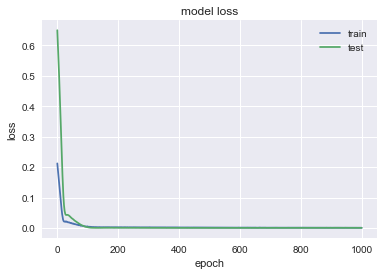

              CBRE
MSE       0.763013
MAE       0.723628
R2        0.914343
MAPE (%)   1.44861


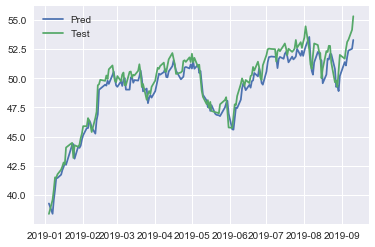

In [181]:
test = df["2019-01-04":].copy()
train = df[:"2019-01-04"].copy()
pred_2 = pd.DataFrame(columns=df.columns,index = test.index)
for comp in companies:
    pred_2[comp] = nn_forec(df,comp,first_layer = 32,second_layer=16).values

Predicting for  T
Train on 1008 samples, validate on 172 samples
Epoch 1/1000
0s - loss: 0.3360 - val_loss: 0.0812
Epoch 2/1000
0s - loss: 0.3082 - val_loss: 0.0702
Epoch 3/1000
0s - loss: 0.2802 - val_loss: 0.0591
Epoch 4/1000
0s - loss: 0.2511 - val_loss: 0.0480
Epoch 5/1000
0s - loss: 0.2207 - val_loss: 0.0369
Epoch 6/1000
0s - loss: 0.1884 - val_loss: 0.0264
Epoch 7/1000
0s - loss: 0.1539 - val_loss: 0.0171
Epoch 8/1000
0s - loss: 0.1200 - val_loss: 0.0102
Epoch 9/1000
0s - loss: 0.0870 - val_loss: 0.0069
Epoch 10/1000
0s - loss: 0.0587 - val_loss: 0.0083
Epoch 11/1000
0s - loss: 0.0363 - val_loss: 0.0147
Epoch 12/1000
0s - loss: 0.0228 - val_loss: 0.0244
Epoch 13/1000
0s - loss: 0.0173 - val_loss: 0.0340
Epoch 14/1000
0s - loss: 0.0164 - val_loss: 0.0395
Epoch 15/1000
0s - loss: 0.0167 - val_loss: 0.0394
Epoch 16/1000
0s - loss: 0.0163 - val_loss: 0.0356
Epoch 17/1000
0s - loss: 0.0148 - val_loss: 0.0304
Epoch 18/1000
0s - loss: 0.0145 - val_loss: 0.0256
Epoch 19/1000
0s - loss: 0

0s - loss: 0.0017 - val_loss: 6.9769e-04
Epoch 155/1000
0s - loss: 0.0017 - val_loss: 6.9777e-04
Epoch 156/1000
0s - loss: 0.0017 - val_loss: 6.9089e-04
Epoch 157/1000
0s - loss: 0.0018 - val_loss: 6.8568e-04
Epoch 158/1000
0s - loss: 0.0016 - val_loss: 6.8294e-04
Epoch 159/1000
0s - loss: 0.0017 - val_loss: 6.8114e-04
Epoch 160/1000
0s - loss: 0.0017 - val_loss: 6.7943e-04
Epoch 161/1000
0s - loss: 0.0015 - val_loss: 6.7759e-04
Epoch 162/1000
0s - loss: 0.0015 - val_loss: 6.7682e-04
Epoch 163/1000
0s - loss: 0.0018 - val_loss: 6.7834e-04
Epoch 164/1000
0s - loss: 0.0016 - val_loss: 6.7205e-04
Epoch 165/1000
0s - loss: 0.0017 - val_loss: 6.6704e-04
Epoch 166/1000
0s - loss: 0.0016 - val_loss: 6.6552e-04
Epoch 167/1000
0s - loss: 0.0017 - val_loss: 6.6540e-04
Epoch 168/1000
0s - loss: 0.0017 - val_loss: 6.6709e-04
Epoch 169/1000
0s - loss: 0.0016 - val_loss: 6.6973e-04
Epoch 170/1000
0s - loss: 0.0018 - val_loss: 6.6945e-04
Epoch 171/1000
0s - loss: 0.0015 - val_loss: 6.6758e-04
Epoch 1

0s - loss: 0.0015 - val_loss: 5.8032e-04
Epoch 303/1000
0s - loss: 0.0014 - val_loss: 5.7984e-04
Epoch 304/1000
0s - loss: 0.0015 - val_loss: 5.7954e-04
Epoch 305/1000
0s - loss: 0.0014 - val_loss: 5.7887e-04
Epoch 306/1000
0s - loss: 0.0015 - val_loss: 5.7792e-04
Epoch 307/1000
0s - loss: 0.0014 - val_loss: 5.7722e-04
Epoch 308/1000
0s - loss: 0.0015 - val_loss: 5.7761e-04
Epoch 309/1000
0s - loss: 0.0015 - val_loss: 5.7754e-04
Epoch 310/1000
0s - loss: 0.0015 - val_loss: 5.7578e-04
Epoch 311/1000
0s - loss: 0.0014 - val_loss: 5.7620e-04
Epoch 312/1000
0s - loss: 0.0015 - val_loss: 5.7832e-04
Epoch 313/1000
0s - loss: 0.0014 - val_loss: 5.7671e-04
Epoch 314/1000
0s - loss: 0.0014 - val_loss: 5.7557e-04
Epoch 315/1000
0s - loss: 0.0015 - val_loss: 5.7529e-04
Epoch 316/1000
0s - loss: 0.0013 - val_loss: 5.7459e-04
Epoch 317/1000
0s - loss: 0.0014 - val_loss: 5.7580e-04
Epoch 318/1000
0s - loss: 0.0015 - val_loss: 5.7198e-04
Epoch 319/1000
0s - loss: 0.0015 - val_loss: 5.7075e-04
Epoch 3

0s - loss: 0.0013 - val_loss: 5.4442e-04
Epoch 450/1000
0s - loss: 0.0014 - val_loss: 5.4209e-04
Epoch 451/1000
0s - loss: 0.0015 - val_loss: 5.4611e-04
Epoch 452/1000
0s - loss: 0.0013 - val_loss: 5.4490e-04
Epoch 453/1000
0s - loss: 0.0012 - val_loss: 5.4237e-04
Epoch 454/1000
0s - loss: 0.0012 - val_loss: 5.4975e-04
Epoch 455/1000
0s - loss: 0.0014 - val_loss: 5.6400e-04
Epoch 456/1000
0s - loss: 0.0013 - val_loss: 5.4222e-04
Epoch 457/1000
0s - loss: 0.0013 - val_loss: 5.4321e-04
Epoch 458/1000
0s - loss: 0.0013 - val_loss: 5.4807e-04
Epoch 459/1000
0s - loss: 0.0013 - val_loss: 5.6524e-04
Epoch 460/1000
0s - loss: 0.0014 - val_loss: 5.4507e-04
Epoch 461/1000
0s - loss: 0.0013 - val_loss: 5.4160e-04
Epoch 462/1000
0s - loss: 0.0013 - val_loss: 5.4190e-04
Epoch 463/1000
0s - loss: 0.0013 - val_loss: 5.6158e-04
Epoch 464/1000
0s - loss: 0.0014 - val_loss: 5.4909e-04
Epoch 465/1000
0s - loss: 0.0013 - val_loss: 5.4018e-04
Epoch 466/1000
0s - loss: 0.0015 - val_loss: 5.4472e-04
Epoch 4

0s - loss: 0.0013 - val_loss: 5.4669e-04
Epoch 598/1000
0s - loss: 0.0011 - val_loss: 5.3926e-04
Epoch 599/1000
0s - loss: 0.0012 - val_loss: 5.4705e-04
Epoch 600/1000
0s - loss: 0.0014 - val_loss: 5.4805e-04
Epoch 601/1000
0s - loss: 0.0012 - val_loss: 5.3864e-04
Epoch 602/1000
0s - loss: 0.0013 - val_loss: 5.6416e-04
Epoch 603/1000
0s - loss: 0.0012 - val_loss: 5.5639e-04
Epoch 604/1000
0s - loss: 0.0013 - val_loss: 5.4350e-04
Epoch 605/1000
0s - loss: 0.0013 - val_loss: 5.4185e-04
Epoch 606/1000
0s - loss: 0.0013 - val_loss: 5.5793e-04
Epoch 607/1000
0s - loss: 0.0012 - val_loss: 5.6366e-04
Epoch 608/1000
0s - loss: 0.0012 - val_loss: 5.4272e-04
Epoch 609/1000
0s - loss: 0.0013 - val_loss: 5.5122e-04
Epoch 610/1000
0s - loss: 0.0013 - val_loss: 5.4747e-04
Epoch 611/1000
0s - loss: 0.0012 - val_loss: 5.4519e-04
Epoch 612/1000
0s - loss: 0.0013 - val_loss: 5.4972e-04
Epoch 613/1000
0s - loss: 0.0013 - val_loss: 5.4774e-04
Epoch 614/1000
0s - loss: 0.0013 - val_loss: 5.4535e-04
Epoch 6

0s - loss: 0.0011 - val_loss: 5.4886e-04
Epoch 746/1000
0s - loss: 0.0012 - val_loss: 5.4913e-04
Epoch 747/1000
0s - loss: 0.0011 - val_loss: 5.5831e-04
Epoch 748/1000
0s - loss: 0.0012 - val_loss: 5.3782e-04
Epoch 749/1000
0s - loss: 0.0012 - val_loss: 5.4873e-04
Epoch 750/1000
0s - loss: 0.0012 - val_loss: 5.4704e-04
Epoch 751/1000
0s - loss: 0.0011 - val_loss: 5.3877e-04
Epoch 752/1000
0s - loss: 0.0012 - val_loss: 5.6922e-04
Epoch 753/1000
0s - loss: 0.0012 - val_loss: 5.4776e-04
Epoch 754/1000
0s - loss: 0.0012 - val_loss: 5.4117e-04
Epoch 755/1000
0s - loss: 0.0012 - val_loss: 5.5063e-04
Epoch 756/1000
0s - loss: 0.0011 - val_loss: 5.3866e-04
Epoch 757/1000
0s - loss: 0.0012 - val_loss: 5.4090e-04
Epoch 758/1000
0s - loss: 0.0012 - val_loss: 5.6550e-04
Epoch 759/1000
0s - loss: 0.0012 - val_loss: 5.5452e-04
Epoch 760/1000
0s - loss: 0.0011 - val_loss: 5.4104e-04
Epoch 761/1000
0s - loss: 0.0012 - val_loss: 5.5017e-04
Epoch 762/1000
0s - loss: 0.0012 - val_loss: 5.4993e-04
Epoch 7

0s - loss: 0.0010 - val_loss: 5.5092e-04
Epoch 894/1000
0s - loss: 0.0011 - val_loss: 5.4263e-04
Epoch 895/1000
0s - loss: 0.0012 - val_loss: 5.4379e-04
Epoch 896/1000
0s - loss: 0.0011 - val_loss: 5.6383e-04
Epoch 897/1000
0s - loss: 0.0011 - val_loss: 5.6224e-04
Epoch 898/1000
0s - loss: 0.0011 - val_loss: 5.4651e-04
Epoch 899/1000
0s - loss: 0.0012 - val_loss: 5.4498e-04
Epoch 900/1000
0s - loss: 0.0011 - val_loss: 5.4949e-04
Epoch 901/1000
0s - loss: 0.0012 - val_loss: 5.3856e-04
Epoch 902/1000
0s - loss: 0.0011 - val_loss: 5.4688e-04
Epoch 903/1000
0s - loss: 0.0012 - val_loss: 5.3908e-04
Epoch 904/1000
0s - loss: 0.0012 - val_loss: 5.4120e-04
Epoch 905/1000
0s - loss: 0.0011 - val_loss: 5.6495e-04
Epoch 906/1000
0s - loss: 0.0011 - val_loss: 5.3833e-04
Epoch 907/1000
0s - loss: 0.0010 - val_loss: 5.6222e-04
Epoch 908/1000
0s - loss: 0.0011 - val_loss: 5.4583e-04
Epoch 909/1000
0s - loss: 0.0011 - val_loss: 5.4000e-04
Epoch 910/1000
0s - loss: 0.0011 - val_loss: 5.4737e-04
Epoch 9

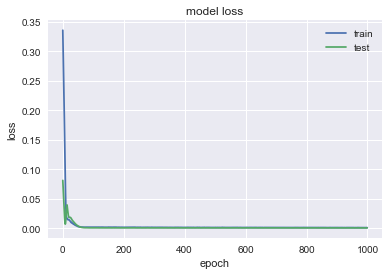

                 T
MSE       0.137619
MAE       0.262844
R2        0.952408
MAPE (%)  0.814991


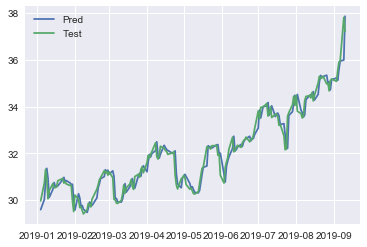

Predicting for  BBY
Train on 1008 samples, validate on 172 samples
Epoch 1/1000
0s - loss: 0.2388 - val_loss: 0.5077
Epoch 2/1000
0s - loss: 0.2220 - val_loss: 0.4749
Epoch 3/1000
0s - loss: 0.2047 - val_loss: 0.4396
Epoch 4/1000
0s - loss: 0.1864 - val_loss: 0.4012
Epoch 5/1000
0s - loss: 0.1668 - val_loss: 0.3594
Epoch 6/1000
0s - loss: 0.1461 - val_loss: 0.3140
Epoch 7/1000
0s - loss: 0.1236 - val_loss: 0.2655
Epoch 8/1000
0s - loss: 0.1013 - val_loss: 0.2152
Epoch 9/1000
0s - loss: 0.0798 - val_loss: 0.1649
Epoch 10/1000
0s - loss: 0.0606 - val_loss: 0.1176
Epoch 11/1000
0s - loss: 0.0454 - val_loss: 0.0764
Epoch 12/1000
0s - loss: 0.0345 - val_loss: 0.0444
Epoch 13/1000
0s - loss: 0.0307 - val_loss: 0.0230
Epoch 14/1000
0s - loss: 0.0315 - val_loss: 0.0112
Epoch 15/1000
0s - loss: 0.0341 - val_loss: 0.0062
Epoch 16/1000
0s - loss: 0.0364 - val_loss: 0.0046
Epoch 17/1000
0s - loss: 0.0363 - val_loss: 0.0046
Epoch 18/1000
0s - loss: 0.0341 - val_loss: 0.0057
Epoch 19/1000
0s - loss:

0s - loss: 0.0012 - val_loss: 8.6243e-04
Epoch 156/1000
0s - loss: 0.0011 - val_loss: 8.4182e-04
Epoch 157/1000
0s - loss: 0.0013 - val_loss: 8.1991e-04
Epoch 158/1000
0s - loss: 0.0012 - val_loss: 8.4044e-04
Epoch 159/1000
0s - loss: 0.0012 - val_loss: 8.3287e-04
Epoch 160/1000
0s - loss: 0.0012 - val_loss: 8.7762e-04
Epoch 161/1000
0s - loss: 0.0013 - val_loss: 9.0811e-04
Epoch 162/1000
0s - loss: 0.0013 - val_loss: 8.7011e-04
Epoch 163/1000
0s - loss: 0.0013 - val_loss: 8.6363e-04
Epoch 164/1000
0s - loss: 0.0013 - val_loss: 8.4118e-04
Epoch 165/1000
0s - loss: 0.0012 - val_loss: 8.1924e-04
Epoch 166/1000
0s - loss: 0.0012 - val_loss: 8.2006e-04
Epoch 167/1000
0s - loss: 0.0013 - val_loss: 8.6522e-04
Epoch 168/1000
0s - loss: 0.0012 - val_loss: 9.0828e-04
Epoch 169/1000
0s - loss: 0.0011 - val_loss: 8.9951e-04
Epoch 170/1000
0s - loss: 0.0012 - val_loss: 8.8393e-04
Epoch 171/1000
0s - loss: 0.0011 - val_loss: 8.3859e-04
Epoch 172/1000
0s - loss: 0.0012 - val_loss: 8.2903e-04
Epoch 1

0s - loss: 0.0010 - val_loss: 6.7830e-04
Epoch 302/1000
0s - loss: 9.0740e-04 - val_loss: 6.5556e-04
Epoch 303/1000
0s - loss: 0.0010 - val_loss: 6.8332e-04
Epoch 304/1000
0s - loss: 9.8342e-04 - val_loss: 7.1027e-04
Epoch 305/1000
0s - loss: 9.6030e-04 - val_loss: 7.0486e-04
Epoch 306/1000
0s - loss: 0.0010 - val_loss: 7.2178e-04
Epoch 307/1000
0s - loss: 0.0010 - val_loss: 7.2351e-04
Epoch 308/1000
0s - loss: 9.9645e-04 - val_loss: 6.9649e-04
Epoch 309/1000
0s - loss: 0.0010 - val_loss: 6.8547e-04
Epoch 310/1000
0s - loss: 9.5458e-04 - val_loss: 6.6014e-04
Epoch 311/1000
0s - loss: 9.9913e-04 - val_loss: 6.6192e-04
Epoch 312/1000
0s - loss: 9.2241e-04 - val_loss: 6.7723e-04
Epoch 313/1000
0s - loss: 9.2089e-04 - val_loss: 6.7648e-04
Epoch 314/1000
0s - loss: 9.7793e-04 - val_loss: 6.6634e-04
Epoch 315/1000
0s - loss: 9.8531e-04 - val_loss: 6.5465e-04
Epoch 316/1000
0s - loss: 9.7776e-04 - val_loss: 6.5248e-04
Epoch 317/1000
0s - loss: 9.6868e-04 - val_loss: 6.5217e-04
Epoch 318/1000


0s - loss: 8.7288e-04 - val_loss: 6.3282e-04
Epoch 440/1000
0s - loss: 9.5173e-04 - val_loss: 6.1103e-04
Epoch 441/1000
0s - loss: 9.6126e-04 - val_loss: 6.3129e-04
Epoch 442/1000
0s - loss: 8.9412e-04 - val_loss: 6.2526e-04
Epoch 443/1000
0s - loss: 9.3871e-04 - val_loss: 6.0190e-04
Epoch 444/1000
0s - loss: 9.3494e-04 - val_loss: 5.9356e-04
Epoch 445/1000
0s - loss: 8.8474e-04 - val_loss: 5.9905e-04
Epoch 446/1000
0s - loss: 8.2876e-04 - val_loss: 6.1236e-04
Epoch 447/1000
0s - loss: 9.3196e-04 - val_loss: 6.1157e-04
Epoch 448/1000
0s - loss: 8.5417e-04 - val_loss: 5.9839e-04
Epoch 449/1000
0s - loss: 7.9914e-04 - val_loss: 5.9861e-04
Epoch 450/1000
0s - loss: 9.1175e-04 - val_loss: 6.3993e-04
Epoch 451/1000
0s - loss: 9.1680e-04 - val_loss: 6.5229e-04
Epoch 452/1000
0s - loss: 9.0151e-04 - val_loss: 5.9966e-04
Epoch 453/1000
0s - loss: 8.6299e-04 - val_loss: 5.9242e-04
Epoch 454/1000
0s - loss: 9.1352e-04 - val_loss: 5.9743e-04
Epoch 455/1000
0s - loss: 8.2974e-04 - val_loss: 6.0400

0s - loss: 8.2482e-04 - val_loss: 6.3028e-04
Epoch 578/1000
0s - loss: 8.1983e-04 - val_loss: 5.9179e-04
Epoch 579/1000
0s - loss: 8.2369e-04 - val_loss: 5.8550e-04
Epoch 580/1000
0s - loss: 8.6456e-04 - val_loss: 5.9195e-04
Epoch 581/1000
0s - loss: 8.5160e-04 - val_loss: 6.1210e-04
Epoch 582/1000
0s - loss: 8.2633e-04 - val_loss: 6.1925e-04
Epoch 583/1000
0s - loss: 8.5324e-04 - val_loss: 6.0659e-04
Epoch 584/1000
0s - loss: 9.3735e-04 - val_loss: 5.8878e-04
Epoch 585/1000
0s - loss: 9.1869e-04 - val_loss: 5.9115e-04
Epoch 586/1000
0s - loss: 9.6731e-04 - val_loss: 6.8879e-04
Epoch 587/1000
0s - loss: 8.1582e-04 - val_loss: 5.9739e-04
Epoch 588/1000
0s - loss: 9.5050e-04 - val_loss: 6.1209e-04
Epoch 589/1000
0s - loss: 8.7639e-04 - val_loss: 6.1136e-04
Epoch 590/1000
0s - loss: 8.3272e-04 - val_loss: 6.7536e-04
Epoch 591/1000
0s - loss: 8.7364e-04 - val_loss: 5.8678e-04
Epoch 592/1000
0s - loss: 8.0388e-04 - val_loss: 6.0227e-04
Epoch 593/1000
0s - loss: 8.3450e-04 - val_loss: 5.9647

0s - loss: 7.7635e-04 - val_loss: 5.8803e-04
Epoch 716/1000
0s - loss: 8.4290e-04 - val_loss: 6.0451e-04
Epoch 717/1000
0s - loss: 8.0403e-04 - val_loss: 5.8506e-04
Epoch 718/1000
0s - loss: 8.2400e-04 - val_loss: 5.8767e-04
Epoch 719/1000
0s - loss: 7.8292e-04 - val_loss: 5.9095e-04
Epoch 720/1000
0s - loss: 7.1762e-04 - val_loss: 6.1699e-04
Epoch 721/1000
0s - loss: 7.9898e-04 - val_loss: 5.9987e-04
Epoch 722/1000
0s - loss: 7.3818e-04 - val_loss: 5.8567e-04
Epoch 723/1000
0s - loss: 7.6636e-04 - val_loss: 5.8754e-04
Epoch 724/1000
0s - loss: 8.3730e-04 - val_loss: 5.9620e-04
Epoch 725/1000
0s - loss: 8.7899e-04 - val_loss: 5.8477e-04
Epoch 726/1000
0s - loss: 7.7809e-04 - val_loss: 5.8615e-04
Epoch 727/1000
0s - loss: 8.6721e-04 - val_loss: 5.9987e-04
Epoch 728/1000
0s - loss: 8.1507e-04 - val_loss: 6.0920e-04
Epoch 729/1000
0s - loss: 7.8642e-04 - val_loss: 6.0645e-04
Epoch 730/1000
0s - loss: 7.4184e-04 - val_loss: 5.9391e-04
Epoch 731/1000
0s - loss: 7.8726e-04 - val_loss: 5.9302

0s - loss: 7.7660e-04 - val_loss: 5.9155e-04
Epoch 854/1000
0s - loss: 7.6979e-04 - val_loss: 5.9559e-04
Epoch 855/1000
0s - loss: 7.9338e-04 - val_loss: 5.8974e-04
Epoch 856/1000
0s - loss: 7.8782e-04 - val_loss: 6.0075e-04
Epoch 857/1000
0s - loss: 7.7533e-04 - val_loss: 5.9248e-04
Epoch 858/1000
0s - loss: 8.0545e-04 - val_loss: 6.0750e-04
Epoch 859/1000
0s - loss: 7.3668e-04 - val_loss: 6.1908e-04
Epoch 860/1000
0s - loss: 7.3210e-04 - val_loss: 6.0107e-04
Epoch 861/1000
0s - loss: 7.4518e-04 - val_loss: 5.8959e-04
Epoch 862/1000
0s - loss: 7.9962e-04 - val_loss: 6.4840e-04
Epoch 863/1000
0s - loss: 7.5874e-04 - val_loss: 5.9797e-04
Epoch 864/1000
0s - loss: 7.4547e-04 - val_loss: 5.8464e-04
Epoch 865/1000
0s - loss: 7.6667e-04 - val_loss: 6.0562e-04
Epoch 866/1000
0s - loss: 7.6014e-04 - val_loss: 6.6248e-04
Epoch 867/1000
0s - loss: 7.6120e-04 - val_loss: 5.8920e-04
Epoch 868/1000
0s - loss: 7.2252e-04 - val_loss: 5.8704e-04
Epoch 869/1000
0s - loss: 7.6916e-04 - val_loss: 6.0058

0s - loss: 7.3213e-04 - val_loss: 5.8761e-04
Epoch 992/1000
0s - loss: 6.8778e-04 - val_loss: 6.1900e-04
Epoch 993/1000
0s - loss: 7.5709e-04 - val_loss: 5.8821e-04
Epoch 994/1000
0s - loss: 7.2724e-04 - val_loss: 5.8805e-04
Epoch 995/1000
0s - loss: 7.7014e-04 - val_loss: 6.2069e-04
Epoch 996/1000
0s - loss: 7.1194e-04 - val_loss: 5.8630e-04
Epoch 997/1000
0s - loss: 6.6519e-04 - val_loss: 5.9335e-04
Epoch 998/1000
0s - loss: 7.3717e-04 - val_loss: 6.1504e-04
Epoch 999/1000
0s - loss: 7.2438e-04 - val_loss: 5.8659e-04
Epoch 1000/1000
0s - loss: 6.9989e-04 - val_loss: 6.0562e-04


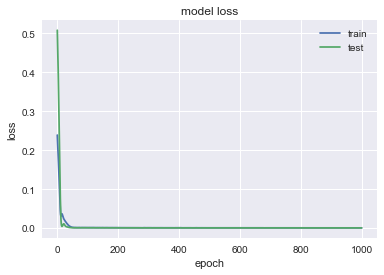

               BBY
MSE         2.0163
MAE        0.94094
R2        0.940661
MAPE (%)   1.39611


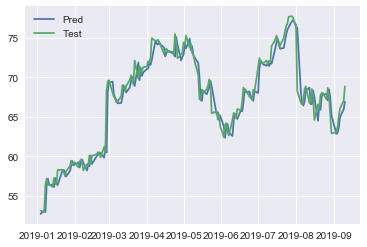

Predicting for  KO
Train on 1008 samples, validate on 172 samples
Epoch 1/1000
0s - loss: 0.1128 - val_loss: 0.4137
Epoch 2/1000
0s - loss: 0.0996 - val_loss: 0.3798
Epoch 3/1000
0s - loss: 0.0865 - val_loss: 0.3438
Epoch 4/1000
0s - loss: 0.0730 - val_loss: 0.3048
Epoch 5/1000
0s - loss: 0.0593 - val_loss: 0.2626
Epoch 6/1000
0s - loss: 0.0452 - val_loss: 0.2178
Epoch 7/1000
0s - loss: 0.0319 - val_loss: 0.1720
Epoch 8/1000
0s - loss: 0.0204 - val_loss: 0.1277
Epoch 9/1000
0s - loss: 0.0121 - val_loss: 0.0887
Epoch 10/1000
0s - loss: 0.0081 - val_loss: 0.0587
Epoch 11/1000
0s - loss: 0.0088 - val_loss: 0.0398
Epoch 12/1000
0s - loss: 0.0112 - val_loss: 0.0308
Epoch 13/1000
0s - loss: 0.0133 - val_loss: 0.0290
Epoch 14/1000
0s - loss: 0.0129 - val_loss: 0.0317
Epoch 15/1000
0s - loss: 0.0120 - val_loss: 0.0369
Epoch 16/1000
0s - loss: 0.0104 - val_loss: 0.0424
Epoch 17/1000
0s - loss: 0.0094 - val_loss: 0.0463
Epoch 18/1000
0s - loss: 0.0087 - val_loss: 0.0479
Epoch 19/1000
0s - loss: 

0s - loss: 8.2888e-04 - val_loss: 0.0014
Epoch 155/1000
0s - loss: 8.7658e-04 - val_loss: 0.0014
Epoch 156/1000
0s - loss: 7.9162e-04 - val_loss: 0.0015
Epoch 157/1000
0s - loss: 9.0951e-04 - val_loss: 0.0015
Epoch 158/1000
0s - loss: 8.4150e-04 - val_loss: 0.0014
Epoch 159/1000
0s - loss: 8.1070e-04 - val_loss: 0.0015
Epoch 160/1000
0s - loss: 7.7991e-04 - val_loss: 0.0016
Epoch 161/1000
0s - loss: 7.8250e-04 - val_loss: 0.0015
Epoch 162/1000
0s - loss: 7.7927e-04 - val_loss: 0.0014
Epoch 163/1000
0s - loss: 7.5665e-04 - val_loss: 0.0014
Epoch 164/1000
0s - loss: 8.1932e-04 - val_loss: 0.0014
Epoch 165/1000
0s - loss: 8.5916e-04 - val_loss: 0.0016
Epoch 166/1000
0s - loss: 8.1115e-04 - val_loss: 0.0017
Epoch 167/1000
0s - loss: 8.4007e-04 - val_loss: 0.0016
Epoch 168/1000
0s - loss: 8.4845e-04 - val_loss: 0.0015
Epoch 169/1000
0s - loss: 7.9554e-04 - val_loss: 0.0014
Epoch 170/1000
0s - loss: 8.9517e-04 - val_loss: 0.0015
Epoch 171/1000
0s - loss: 8.2264e-04 - val_loss: 0.0016
Epoch 1

0s - loss: 7.5946e-04 - val_loss: 8.9762e-04
Epoch 301/1000
0s - loss: 6.8712e-04 - val_loss: 8.7089e-04
Epoch 302/1000
0s - loss: 7.3850e-04 - val_loss: 8.6826e-04
Epoch 303/1000
0s - loss: 7.4916e-04 - val_loss: 8.5793e-04
Epoch 304/1000
0s - loss: 7.3603e-04 - val_loss: 8.5548e-04
Epoch 305/1000
0s - loss: 7.1758e-04 - val_loss: 8.6490e-04
Epoch 306/1000
0s - loss: 7.1144e-04 - val_loss: 8.7540e-04
Epoch 307/1000
0s - loss: 7.2535e-04 - val_loss: 8.6051e-04
Epoch 308/1000
0s - loss: 7.4682e-04 - val_loss: 8.6396e-04
Epoch 309/1000
0s - loss: 7.5413e-04 - val_loss: 8.8912e-04
Epoch 310/1000
0s - loss: 7.3470e-04 - val_loss: 8.6272e-04
Epoch 311/1000
0s - loss: 7.8588e-04 - val_loss: 8.6949e-04
Epoch 312/1000
0s - loss: 7.6500e-04 - val_loss: 8.9290e-04
Epoch 313/1000
0s - loss: 7.9810e-04 - val_loss: 8.6787e-04
Epoch 314/1000
0s - loss: 6.8906e-04 - val_loss: 8.4516e-04
Epoch 315/1000
0s - loss: 6.8493e-04 - val_loss: 8.4404e-04
Epoch 316/1000
0s - loss: 7.2805e-04 - val_loss: 8.8922

0s - loss: 6.7046e-04 - val_loss: 7.3883e-04
Epoch 439/1000
0s - loss: 7.0686e-04 - val_loss: 7.4037e-04
Epoch 440/1000
0s - loss: 7.0440e-04 - val_loss: 7.5147e-04
Epoch 441/1000
0s - loss: 6.8238e-04 - val_loss: 7.4097e-04
Epoch 442/1000
0s - loss: 6.6305e-04 - val_loss: 7.1977e-04
Epoch 443/1000
0s - loss: 7.1500e-04 - val_loss: 7.6430e-04
Epoch 444/1000
0s - loss: 6.4560e-04 - val_loss: 8.2764e-04
Epoch 445/1000
0s - loss: 7.6620e-04 - val_loss: 7.2249e-04
Epoch 446/1000
0s - loss: 6.7705e-04 - val_loss: 7.1588e-04
Epoch 447/1000
0s - loss: 7.1739e-04 - val_loss: 8.3422e-04
Epoch 448/1000
0s - loss: 7.1437e-04 - val_loss: 8.2204e-04
Epoch 449/1000
0s - loss: 6.9581e-04 - val_loss: 7.1964e-04
Epoch 450/1000
0s - loss: 6.8952e-04 - val_loss: 7.3677e-04
Epoch 451/1000
0s - loss: 6.9459e-04 - val_loss: 8.0518e-04
Epoch 452/1000
0s - loss: 7.1158e-04 - val_loss: 7.3620e-04
Epoch 453/1000
0s - loss: 6.9695e-04 - val_loss: 7.1154e-04
Epoch 454/1000
0s - loss: 6.5120e-04 - val_loss: 7.1944

0s - loss: 6.7707e-04 - val_loss: 8.7265e-04
Epoch 577/1000
0s - loss: 6.7707e-04 - val_loss: 8.0673e-04
Epoch 578/1000
0s - loss: 7.1400e-04 - val_loss: 7.9514e-04
Epoch 579/1000
0s - loss: 6.4705e-04 - val_loss: 9.5117e-04
Epoch 580/1000
0s - loss: 6.5388e-04 - val_loss: 8.7040e-04
Epoch 581/1000
0s - loss: 6.5092e-04 - val_loss: 8.0560e-04
Epoch 582/1000
0s - loss: 6.8428e-04 - val_loss: 9.0052e-04
Epoch 583/1000
0s - loss: 6.7505e-04 - val_loss: 8.6573e-04
Epoch 584/1000
0s - loss: 6.5360e-04 - val_loss: 8.1488e-04
Epoch 585/1000
0s - loss: 6.5227e-04 - val_loss: 7.9920e-04
Epoch 586/1000
0s - loss: 6.8208e-04 - val_loss: 8.7009e-04
Epoch 587/1000
0s - loss: 6.3728e-04 - val_loss: 7.8709e-04
Epoch 588/1000
0s - loss: 6.5225e-04 - val_loss: 8.2905e-04
Epoch 589/1000
0s - loss: 6.5416e-04 - val_loss: 8.6597e-04
Epoch 590/1000
0s - loss: 6.3342e-04 - val_loss: 7.9793e-04
Epoch 591/1000
0s - loss: 6.6960e-04 - val_loss: 7.7978e-04
Epoch 592/1000
0s - loss: 7.0801e-04 - val_loss: 8.1986

0s - loss: 6.4625e-04 - val_loss: 7.8692e-04
Epoch 715/1000
0s - loss: 6.3398e-04 - val_loss: 7.5587e-04
Epoch 716/1000
0s - loss: 6.4579e-04 - val_loss: 7.6723e-04
Epoch 717/1000
0s - loss: 6.3005e-04 - val_loss: 9.2867e-04
Epoch 718/1000
0s - loss: 6.2858e-04 - val_loss: 8.1838e-04
Epoch 719/1000
0s - loss: 6.4004e-04 - val_loss: 8.9559e-04
Epoch 720/1000
0s - loss: 6.1491e-04 - val_loss: 0.0010
Epoch 721/1000
0s - loss: 6.4004e-04 - val_loss: 8.3050e-04
Epoch 722/1000
0s - loss: 6.6793e-04 - val_loss: 8.1357e-04
Epoch 723/1000
0s - loss: 6.5683e-04 - val_loss: 9.9760e-04
Epoch 724/1000
0s - loss: 6.1886e-04 - val_loss: 7.5755e-04
Epoch 725/1000
0s - loss: 6.4237e-04 - val_loss: 8.2784e-04
Epoch 726/1000
0s - loss: 6.3262e-04 - val_loss: 8.7758e-04
Epoch 727/1000
0s - loss: 6.5520e-04 - val_loss: 8.1489e-04
Epoch 728/1000
0s - loss: 6.1516e-04 - val_loss: 7.8809e-04
Epoch 729/1000
0s - loss: 6.5593e-04 - val_loss: 8.5316e-04
Epoch 730/1000
0s - loss: 6.5750e-04 - val_loss: 8.5966e-04

0s - loss: 6.1343e-04 - val_loss: 8.3552e-04
Epoch 853/1000
0s - loss: 6.1859e-04 - val_loss: 8.0006e-04
Epoch 854/1000
0s - loss: 5.9261e-04 - val_loss: 8.9264e-04
Epoch 855/1000
0s - loss: 6.3216e-04 - val_loss: 8.3897e-04
Epoch 856/1000
0s - loss: 6.1219e-04 - val_loss: 7.9662e-04
Epoch 857/1000
0s - loss: 5.9624e-04 - val_loss: 9.2032e-04
Epoch 858/1000
0s - loss: 6.1296e-04 - val_loss: 8.1034e-04
Epoch 859/1000
0s - loss: 6.3619e-04 - val_loss: 8.1125e-04
Epoch 860/1000
0s - loss: 6.1602e-04 - val_loss: 8.2976e-04
Epoch 861/1000
0s - loss: 5.9516e-04 - val_loss: 8.4998e-04
Epoch 862/1000
0s - loss: 6.2990e-04 - val_loss: 8.4192e-04
Epoch 863/1000
0s - loss: 6.0232e-04 - val_loss: 7.9095e-04
Epoch 864/1000
0s - loss: 6.3850e-04 - val_loss: 8.9702e-04
Epoch 865/1000
0s - loss: 6.1058e-04 - val_loss: 9.0429e-04
Epoch 866/1000
0s - loss: 6.1761e-04 - val_loss: 7.5974e-04
Epoch 867/1000
0s - loss: 6.4417e-04 - val_loss: 9.5287e-04
Epoch 868/1000
0s - loss: 6.2993e-04 - val_loss: 8.0735

0s - loss: 5.9716e-04 - val_loss: 8.0900e-04
Epoch 991/1000
0s - loss: 5.8559e-04 - val_loss: 7.6190e-04
Epoch 992/1000
0s - loss: 5.8569e-04 - val_loss: 8.3199e-04
Epoch 993/1000
0s - loss: 5.7411e-04 - val_loss: 7.9538e-04
Epoch 994/1000
0s - loss: 5.9169e-04 - val_loss: 7.9995e-04
Epoch 995/1000
0s - loss: 5.7643e-04 - val_loss: 8.0428e-04
Epoch 996/1000
0s - loss: 5.7717e-04 - val_loss: 8.1220e-04
Epoch 997/1000
0s - loss: 6.0247e-04 - val_loss: 8.8205e-04
Epoch 998/1000
0s - loss: 5.8704e-04 - val_loss: 8.4875e-04
Epoch 999/1000
0s - loss: 5.9038e-04 - val_loss: 8.6485e-04
Epoch 1000/1000
0s - loss: 6.2318e-04 - val_loss: 8.8370e-04


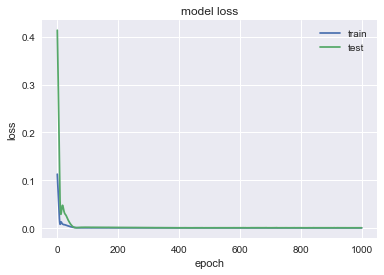

                KO
MSE       0.278735
MAE       0.383916
R2        0.966532
MAPE (%)  0.767115


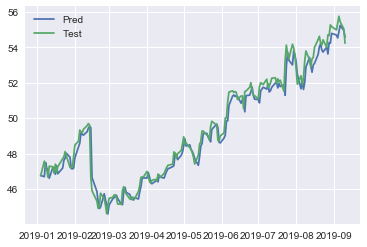

Predicting for  FTI
Train on 1008 samples, validate on 172 samples
Epoch 1/1000
0s - loss: 0.2127 - val_loss: 0.0275
Epoch 2/1000
0s - loss: 0.1916 - val_loss: 0.0215
Epoch 3/1000
0s - loss: 0.1705 - val_loss: 0.0157
Epoch 4/1000
0s - loss: 0.1484 - val_loss: 0.0104
Epoch 5/1000
0s - loss: 0.1256 - val_loss: 0.0058
Epoch 6/1000
0s - loss: 0.1010 - val_loss: 0.0027
Epoch 7/1000
0s - loss: 0.0771 - val_loss: 0.0020
Epoch 8/1000
0s - loss: 0.0545 - val_loss: 0.0046
Epoch 9/1000
0s - loss: 0.0352 - val_loss: 0.0114
Epoch 10/1000
0s - loss: 0.0217 - val_loss: 0.0221
Epoch 11/1000
0s - loss: 0.0147 - val_loss: 0.0337
Epoch 12/1000
0s - loss: 0.0135 - val_loss: 0.0418
Epoch 13/1000
0s - loss: 0.0139 - val_loss: 0.0430
Epoch 14/1000
0s - loss: 0.0134 - val_loss: 0.0387
Epoch 15/1000
0s - loss: 0.0119 - val_loss: 0.0326
Epoch 16/1000
0s - loss: 0.0109 - val_loss: 0.0271
Epoch 17/1000
0s - loss: 0.0104 - val_loss: 0.0231
Epoch 18/1000
0s - loss: 0.0110 - val_loss: 0.0209
Epoch 19/1000
0s - loss:

0s - loss: 0.0012 - val_loss: 4.2118e-04
Epoch 155/1000
0s - loss: 0.0013 - val_loss: 4.1424e-04
Epoch 156/1000
0s - loss: 0.0013 - val_loss: 4.2825e-04
Epoch 157/1000
0s - loss: 0.0012 - val_loss: 4.4695e-04
Epoch 158/1000
0s - loss: 0.0012 - val_loss: 4.5623e-04
Epoch 159/1000
0s - loss: 0.0012 - val_loss: 4.3829e-04
Epoch 160/1000
0s - loss: 0.0013 - val_loss: 4.2521e-04
Epoch 161/1000
0s - loss: 0.0012 - val_loss: 4.2616e-04
Epoch 162/1000
0s - loss: 0.0012 - val_loss: 4.2246e-04
Epoch 163/1000
0s - loss: 0.0013 - val_loss: 4.1902e-04
Epoch 164/1000
0s - loss: 0.0012 - val_loss: 4.3532e-04
Epoch 165/1000
0s - loss: 0.0012 - val_loss: 4.3840e-04
Epoch 166/1000
0s - loss: 0.0012 - val_loss: 4.2162e-04
Epoch 167/1000
0s - loss: 0.0012 - val_loss: 4.0386e-04
Epoch 168/1000
0s - loss: 0.0013 - val_loss: 4.0676e-04
Epoch 169/1000
0s - loss: 0.0013 - val_loss: 4.0857e-04
Epoch 170/1000
0s - loss: 0.0013 - val_loss: 4.1275e-04
Epoch 171/1000
0s - loss: 0.0013 - val_loss: 4.0624e-04
Epoch 1

0s - loss: 0.0012 - val_loss: 3.2491e-04
Epoch 303/1000
0s - loss: 0.0011 - val_loss: 3.2862e-04
Epoch 304/1000
0s - loss: 0.0011 - val_loss: 3.3098e-04
Epoch 305/1000
0s - loss: 0.0010 - val_loss: 3.3746e-04
Epoch 306/1000
0s - loss: 9.8797e-04 - val_loss: 3.3065e-04
Epoch 307/1000
0s - loss: 0.0011 - val_loss: 3.2469e-04
Epoch 308/1000
0s - loss: 0.0011 - val_loss: 3.2608e-04
Epoch 309/1000
0s - loss: 0.0011 - val_loss: 3.2782e-04
Epoch 310/1000
0s - loss: 0.0010 - val_loss: 3.2813e-04
Epoch 311/1000
0s - loss: 0.0010 - val_loss: 3.2593e-04
Epoch 312/1000
0s - loss: 0.0010 - val_loss: 3.2495e-04
Epoch 313/1000
0s - loss: 0.0011 - val_loss: 3.2755e-04
Epoch 314/1000
0s - loss: 0.0011 - val_loss: 3.2618e-04
Epoch 315/1000
0s - loss: 0.0011 - val_loss: 3.2610e-04
Epoch 316/1000
0s - loss: 0.0010 - val_loss: 3.2535e-04
Epoch 317/1000
0s - loss: 0.0011 - val_loss: 3.2844e-04
Epoch 318/1000
0s - loss: 0.0011 - val_loss: 3.2760e-04
Epoch 319/1000
0s - loss: 0.0010 - val_loss: 3.2595e-04
Epo

0s - loss: 0.0010 - val_loss: 3.4125e-04
Epoch 449/1000
0s - loss: 0.0011 - val_loss: 3.4569e-04
Epoch 450/1000
0s - loss: 0.0010 - val_loss: 3.3789e-04
Epoch 451/1000
0s - loss: 0.0010 - val_loss: 3.3529e-04
Epoch 452/1000
0s - loss: 0.0011 - val_loss: 3.3664e-04
Epoch 453/1000
0s - loss: 0.0010 - val_loss: 3.3736e-04
Epoch 454/1000
0s - loss: 9.9637e-04 - val_loss: 3.3656e-04
Epoch 455/1000
0s - loss: 9.4268e-04 - val_loss: 3.3858e-04
Epoch 456/1000
0s - loss: 9.8362e-04 - val_loss: 3.4479e-04
Epoch 457/1000
0s - loss: 0.0010 - val_loss: 3.4725e-04
Epoch 458/1000
0s - loss: 0.0010 - val_loss: 3.4154e-04
Epoch 459/1000
0s - loss: 0.0010 - val_loss: 3.4962e-04
Epoch 460/1000
0s - loss: 0.0010 - val_loss: 3.5210e-04
Epoch 461/1000
0s - loss: 0.0011 - val_loss: 3.3886e-04
Epoch 462/1000
0s - loss: 0.0011 - val_loss: 3.3888e-04
Epoch 463/1000
0s - loss: 9.3736e-04 - val_loss: 3.4344e-04
Epoch 464/1000
0s - loss: 0.0010 - val_loss: 3.3622e-04
Epoch 465/1000
0s - loss: 0.0010 - val_loss: 3.

0s - loss: 9.6978e-04 - val_loss: 3.4047e-04
Epoch 591/1000
0s - loss: 9.9722e-04 - val_loss: 3.3771e-04
Epoch 592/1000
0s - loss: 9.3489e-04 - val_loss: 3.4225e-04
Epoch 593/1000
0s - loss: 9.9012e-04 - val_loss: 3.4173e-04
Epoch 594/1000
0s - loss: 9.7122e-04 - val_loss: 3.4675e-04
Epoch 595/1000
0s - loss: 9.2871e-04 - val_loss: 3.3746e-04
Epoch 596/1000
0s - loss: 9.2841e-04 - val_loss: 3.4194e-04
Epoch 597/1000
0s - loss: 9.8648e-04 - val_loss: 3.4441e-04
Epoch 598/1000
0s - loss: 9.7042e-04 - val_loss: 3.3701e-04
Epoch 599/1000
0s - loss: 9.1597e-04 - val_loss: 3.3810e-04
Epoch 600/1000
0s - loss: 0.0010 - val_loss: 3.4834e-04
Epoch 601/1000
0s - loss: 0.0010 - val_loss: 3.4240e-04
Epoch 602/1000
0s - loss: 9.0598e-04 - val_loss: 3.5455e-04
Epoch 603/1000
0s - loss: 9.7930e-04 - val_loss: 3.3963e-04
Epoch 604/1000
0s - loss: 0.0010 - val_loss: 3.3848e-04
Epoch 605/1000
0s - loss: 9.3569e-04 - val_loss: 3.4360e-04
Epoch 606/1000
0s - loss: 0.0010 - val_loss: 3.3649e-04
Epoch 607/1

0s - loss: 9.6327e-04 - val_loss: 3.4015e-04
Epoch 729/1000
0s - loss: 9.5152e-04 - val_loss: 3.4526e-04
Epoch 730/1000
0s - loss: 9.4924e-04 - val_loss: 3.3670e-04
Epoch 731/1000
0s - loss: 8.6390e-04 - val_loss: 3.4363e-04
Epoch 732/1000
0s - loss: 9.5567e-04 - val_loss: 3.5084e-04
Epoch 733/1000
0s - loss: 9.0100e-04 - val_loss: 3.3960e-04
Epoch 734/1000
0s - loss: 9.5931e-04 - val_loss: 3.4792e-04
Epoch 735/1000
0s - loss: 9.1308e-04 - val_loss: 3.4256e-04
Epoch 736/1000
0s - loss: 9.2403e-04 - val_loss: 3.4571e-04
Epoch 737/1000
0s - loss: 9.5376e-04 - val_loss: 3.3845e-04
Epoch 738/1000
0s - loss: 9.1748e-04 - val_loss: 3.4196e-04
Epoch 739/1000
0s - loss: 9.2409e-04 - val_loss: 3.4695e-04
Epoch 740/1000
0s - loss: 9.2631e-04 - val_loss: 3.3969e-04
Epoch 741/1000
0s - loss: 9.2795e-04 - val_loss: 3.4586e-04
Epoch 742/1000
0s - loss: 9.1661e-04 - val_loss: 3.3719e-04
Epoch 743/1000
0s - loss: 9.2472e-04 - val_loss: 3.4321e-04
Epoch 744/1000
0s - loss: 9.1312e-04 - val_loss: 3.4994

0s - loss: 9.2109e-04 - val_loss: 3.3768e-04
Epoch 867/1000
0s - loss: 8.9125e-04 - val_loss: 3.4213e-04
Epoch 868/1000
0s - loss: 8.7044e-04 - val_loss: 3.3896e-04
Epoch 869/1000
0s - loss: 8.8856e-04 - val_loss: 3.3910e-04
Epoch 870/1000
0s - loss: 8.6236e-04 - val_loss: 3.5070e-04
Epoch 871/1000
0s - loss: 9.2844e-04 - val_loss: 3.3522e-04
Epoch 872/1000
0s - loss: 8.6182e-04 - val_loss: 3.3459e-04
Epoch 873/1000
0s - loss: 8.8831e-04 - val_loss: 3.3980e-04
Epoch 874/1000
0s - loss: 8.6854e-04 - val_loss: 3.3370e-04
Epoch 875/1000
0s - loss: 8.6488e-04 - val_loss: 3.3639e-04
Epoch 876/1000
0s - loss: 8.9587e-04 - val_loss: 3.4419e-04
Epoch 877/1000
0s - loss: 8.6620e-04 - val_loss: 3.4111e-04
Epoch 878/1000
0s - loss: 8.9041e-04 - val_loss: 3.3693e-04
Epoch 879/1000
0s - loss: 8.7836e-04 - val_loss: 3.3490e-04
Epoch 880/1000
0s - loss: 8.3017e-04 - val_loss: 3.3494e-04
Epoch 881/1000
0s - loss: 8.6050e-04 - val_loss: 3.3921e-04
Epoch 882/1000
0s - loss: 8.8445e-04 - val_loss: 3.4097

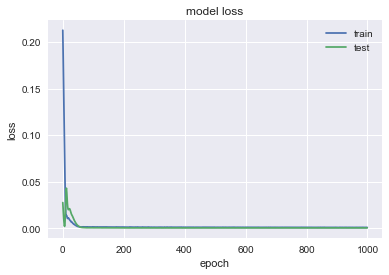

               FTI
MSE       0.271079
MAE       0.421736
R2         0.87744
MAPE (%)   1.77333


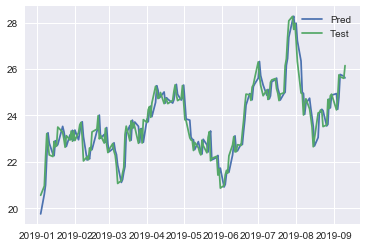

Predicting for  BLK
Train on 1008 samples, validate on 172 samples
Epoch 1/1000
0s - loss: 0.1950 - val_loss: 0.2371
Epoch 2/1000
0s - loss: 0.1797 - val_loss: 0.2176
Epoch 3/1000
0s - loss: 0.1647 - val_loss: 0.1972
Epoch 4/1000
0s - loss: 0.1488 - val_loss: 0.1756
Epoch 5/1000
0s - loss: 0.1321 - val_loss: 0.1527
Epoch 6/1000
0s - loss: 0.1145 - val_loss: 0.1286
Epoch 7/1000
0s - loss: 0.0962 - val_loss: 0.1037
Epoch 8/1000
0s - loss: 0.0780 - val_loss: 0.0788
Epoch 9/1000
0s - loss: 0.0611 - val_loss: 0.0554
Epoch 10/1000
0s - loss: 0.0456 - val_loss: 0.0349
Epoch 11/1000
0s - loss: 0.0335 - val_loss: 0.0191
Epoch 12/1000
0s - loss: 0.0261 - val_loss: 0.0089
Epoch 13/1000
0s - loss: 0.0236 - val_loss: 0.0040
Epoch 14/1000
0s - loss: 0.0237 - val_loss: 0.0024
Epoch 15/1000
0s - loss: 0.0248 - val_loss: 0.0022
Epoch 16/1000
0s - loss: 0.0256 - val_loss: 0.0021
Epoch 17/1000
0s - loss: 0.0246 - val_loss: 0.0021
Epoch 18/1000
0s - loss: 0.0236 - val_loss: 0.0022
Epoch 19/1000
0s - loss:

0s - loss: 0.0011 - val_loss: 4.9773e-04
Epoch 152/1000
0s - loss: 0.0011 - val_loss: 4.9386e-04
Epoch 153/1000
0s - loss: 0.0011 - val_loss: 5.1852e-04
Epoch 154/1000
0s - loss: 0.0011 - val_loss: 5.3661e-04
Epoch 155/1000
0s - loss: 0.0011 - val_loss: 5.3479e-04
Epoch 156/1000
0s - loss: 0.0010 - val_loss: 5.7171e-04
Epoch 157/1000
0s - loss: 0.0011 - val_loss: 5.5407e-04
Epoch 158/1000
0s - loss: 9.7602e-04 - val_loss: 4.6340e-04
Epoch 159/1000
0s - loss: 0.0011 - val_loss: 4.4862e-04
Epoch 160/1000
0s - loss: 9.8021e-04 - val_loss: 4.9020e-04
Epoch 161/1000
0s - loss: 0.0012 - val_loss: 4.8627e-04
Epoch 162/1000
0s - loss: 0.0010 - val_loss: 4.7268e-04
Epoch 163/1000
0s - loss: 0.0010 - val_loss: 4.9325e-04
Epoch 164/1000
0s - loss: 0.0010 - val_loss: 5.1734e-04
Epoch 165/1000
0s - loss: 0.0011 - val_loss: 5.2492e-04
Epoch 166/1000
0s - loss: 9.3501e-04 - val_loss: 5.0809e-04
Epoch 167/1000
0s - loss: 0.0011 - val_loss: 4.9225e-04
Epoch 168/1000
0s - loss: 9.5814e-04 - val_loss: 4.

0s - loss: 9.6447e-04 - val_loss: 3.8696e-04
Epoch 292/1000
0s - loss: 8.7547e-04 - val_loss: 4.4278e-04
Epoch 293/1000
0s - loss: 8.6617e-04 - val_loss: 3.7424e-04
Epoch 294/1000
0s - loss: 9.1937e-04 - val_loss: 3.3872e-04
Epoch 295/1000
0s - loss: 8.2874e-04 - val_loss: 3.6051e-04
Epoch 296/1000
0s - loss: 9.2582e-04 - val_loss: 4.3405e-04
Epoch 297/1000
0s - loss: 8.6672e-04 - val_loss: 4.2317e-04
Epoch 298/1000
0s - loss: 8.1551e-04 - val_loss: 3.4081e-04
Epoch 299/1000
0s - loss: 8.8123e-04 - val_loss: 3.3145e-04
Epoch 300/1000
0s - loss: 8.9979e-04 - val_loss: 3.8461e-04
Epoch 301/1000
0s - loss: 8.1941e-04 - val_loss: 4.0852e-04
Epoch 302/1000
0s - loss: 8.9113e-04 - val_loss: 3.8538e-04
Epoch 303/1000
0s - loss: 7.9067e-04 - val_loss: 3.6206e-04
Epoch 304/1000
0s - loss: 9.2344e-04 - val_loss: 3.5776e-04
Epoch 305/1000
0s - loss: 9.5244e-04 - val_loss: 3.8882e-04
Epoch 306/1000
0s - loss: 8.3032e-04 - val_loss: 3.9122e-04
Epoch 307/1000
0s - loss: 7.9192e-04 - val_loss: 3.4387

0s - loss: 7.3612e-04 - val_loss: 3.5563e-04
Epoch 430/1000
0s - loss: 8.7388e-04 - val_loss: 3.2094e-04
Epoch 431/1000
0s - loss: 8.8186e-04 - val_loss: 3.2171e-04
Epoch 432/1000
0s - loss: 8.8802e-04 - val_loss: 3.3347e-04
Epoch 433/1000
0s - loss: 7.5511e-04 - val_loss: 3.4411e-04
Epoch 434/1000
0s - loss: 7.8827e-04 - val_loss: 3.2767e-04
Epoch 435/1000
0s - loss: 8.3375e-04 - val_loss: 3.2323e-04
Epoch 436/1000
0s - loss: 7.3792e-04 - val_loss: 3.3867e-04
Epoch 437/1000
0s - loss: 7.9776e-04 - val_loss: 3.3567e-04
Epoch 438/1000
0s - loss: 7.5709e-04 - val_loss: 3.2572e-04
Epoch 439/1000
0s - loss: 8.2036e-04 - val_loss: 3.2440e-04
Epoch 440/1000
0s - loss: 7.5983e-04 - val_loss: 3.2517e-04
Epoch 441/1000
0s - loss: 7.8668e-04 - val_loss: 3.2936e-04
Epoch 442/1000
0s - loss: 8.4012e-04 - val_loss: 3.2877e-04
Epoch 443/1000
0s - loss: 8.4041e-04 - val_loss: 3.2237e-04
Epoch 444/1000
0s - loss: 7.8894e-04 - val_loss: 3.2510e-04
Epoch 445/1000
0s - loss: 7.7649e-04 - val_loss: 3.6160

0s - loss: 7.7432e-04 - val_loss: 3.2511e-04
Epoch 568/1000
0s - loss: 7.9872e-04 - val_loss: 3.2957e-04
Epoch 569/1000
0s - loss: 7.0520e-04 - val_loss: 3.2113e-04
Epoch 570/1000
0s - loss: 7.1888e-04 - val_loss: 3.2715e-04
Epoch 571/1000
0s - loss: 7.2667e-04 - val_loss: 3.3147e-04
Epoch 572/1000
0s - loss: 7.6402e-04 - val_loss: 3.2033e-04
Epoch 573/1000
0s - loss: 7.6309e-04 - val_loss: 3.2630e-04
Epoch 574/1000
0s - loss: 7.5622e-04 - val_loss: 3.2832e-04
Epoch 575/1000
0s - loss: 7.8417e-04 - val_loss: 3.2104e-04
Epoch 576/1000
0s - loss: 7.3141e-04 - val_loss: 3.2191e-04
Epoch 577/1000
0s - loss: 7.5957e-04 - val_loss: 3.3181e-04
Epoch 578/1000
0s - loss: 7.3184e-04 - val_loss: 3.2492e-04
Epoch 579/1000
0s - loss: 7.6572e-04 - val_loss: 3.2157e-04
Epoch 580/1000
0s - loss: 7.3999e-04 - val_loss: 3.2147e-04
Epoch 581/1000
0s - loss: 7.2745e-04 - val_loss: 3.3320e-04
Epoch 582/1000
0s - loss: 6.7955e-04 - val_loss: 3.2512e-04
Epoch 583/1000
0s - loss: 7.2664e-04 - val_loss: 3.2298

0s - loss: 7.1662e-04 - val_loss: 3.3008e-04
Epoch 706/1000
0s - loss: 7.6576e-04 - val_loss: 3.2010e-04
Epoch 707/1000
0s - loss: 6.7816e-04 - val_loss: 3.3185e-04
Epoch 708/1000
0s - loss: 7.6784e-04 - val_loss: 3.2120e-04
Epoch 709/1000
0s - loss: 7.4464e-04 - val_loss: 3.2019e-04
Epoch 710/1000
0s - loss: 7.1288e-04 - val_loss: 3.3064e-04
Epoch 711/1000
0s - loss: 8.0728e-04 - val_loss: 3.2517e-04
Epoch 712/1000
0s - loss: 7.5936e-04 - val_loss: 3.2576e-04
Epoch 713/1000
0s - loss: 7.4887e-04 - val_loss: 3.2308e-04
Epoch 714/1000
0s - loss: 7.2763e-04 - val_loss: 3.2779e-04
Epoch 715/1000
0s - loss: 6.9215e-04 - val_loss: 3.2867e-04
Epoch 716/1000
0s - loss: 6.3550e-04 - val_loss: 3.2537e-04
Epoch 717/1000
0s - loss: 7.2521e-04 - val_loss: 3.2452e-04
Epoch 718/1000
0s - loss: 6.2492e-04 - val_loss: 3.4233e-04
Epoch 719/1000
0s - loss: 7.2723e-04 - val_loss: 3.2174e-04
Epoch 720/1000
0s - loss: 7.1922e-04 - val_loss: 3.2129e-04
Epoch 721/1000
0s - loss: 7.5708e-04 - val_loss: 3.2953

0s - loss: 7.1051e-04 - val_loss: 3.2117e-04
Epoch 844/1000
0s - loss: 6.9109e-04 - val_loss: 3.2301e-04
Epoch 845/1000
0s - loss: 6.8855e-04 - val_loss: 3.5083e-04
Epoch 846/1000
0s - loss: 7.0711e-04 - val_loss: 3.2540e-04
Epoch 847/1000
0s - loss: 5.9809e-04 - val_loss: 3.2009e-04
Epoch 848/1000
0s - loss: 6.5800e-04 - val_loss: 3.2939e-04
Epoch 849/1000
0s - loss: 7.4290e-04 - val_loss: 3.2498e-04
Epoch 850/1000
0s - loss: 7.1848e-04 - val_loss: 3.2730e-04
Epoch 851/1000
0s - loss: 6.5283e-04 - val_loss: 3.2961e-04
Epoch 852/1000
0s - loss: 6.1455e-04 - val_loss: 3.2355e-04
Epoch 853/1000
0s - loss: 6.8816e-04 - val_loss: 3.2862e-04
Epoch 854/1000
0s - loss: 6.9456e-04 - val_loss: 3.2640e-04
Epoch 855/1000
0s - loss: 7.0727e-04 - val_loss: 3.2242e-04
Epoch 856/1000
0s - loss: 6.5282e-04 - val_loss: 3.2326e-04
Epoch 857/1000
0s - loss: 7.1048e-04 - val_loss: 3.2849e-04
Epoch 858/1000
0s - loss: 7.3252e-04 - val_loss: 3.4624e-04
Epoch 859/1000
0s - loss: 7.3255e-04 - val_loss: 3.2125

0s - loss: 7.0590e-04 - val_loss: 3.2445e-04
Epoch 982/1000
0s - loss: 6.4252e-04 - val_loss: 3.4562e-04
Epoch 983/1000
0s - loss: 6.6993e-04 - val_loss: 3.4221e-04
Epoch 984/1000
0s - loss: 6.3289e-04 - val_loss: 3.2178e-04
Epoch 985/1000
0s - loss: 6.5368e-04 - val_loss: 3.3726e-04
Epoch 986/1000
0s - loss: 6.9031e-04 - val_loss: 3.2903e-04
Epoch 987/1000
0s - loss: 6.6150e-04 - val_loss: 3.2026e-04
Epoch 988/1000
0s - loss: 7.3413e-04 - val_loss: 3.3006e-04
Epoch 989/1000
0s - loss: 5.7734e-04 - val_loss: 3.2185e-04
Epoch 990/1000
0s - loss: 6.6987e-04 - val_loss: 3.2406e-04
Epoch 991/1000
0s - loss: 7.0744e-04 - val_loss: 3.2768e-04
Epoch 992/1000
0s - loss: 6.1631e-04 - val_loss: 3.3136e-04
Epoch 993/1000
0s - loss: 6.1231e-04 - val_loss: 3.2873e-04
Epoch 994/1000
0s - loss: 6.2646e-04 - val_loss: 3.1879e-04
Epoch 995/1000
0s - loss: 6.6854e-04 - val_loss: 3.2094e-04
Epoch 996/1000
0s - loss: 6.2447e-04 - val_loss: 3.5197e-04
Epoch 997/1000
0s - loss: 6.2129e-04 - val_loss: 3.2378

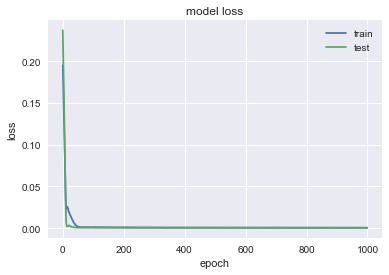

               BLK
MSE        30.0655
MAE        4.28625
R2        0.949036
MAPE (%)  0.977509


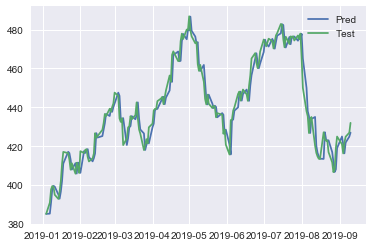

Predicting for  DVA
Train on 1008 samples, validate on 172 samples
Epoch 1/1000
0s - loss: 0.4100 - val_loss: 0.0672
Epoch 2/1000
0s - loss: 0.3695 - val_loss: 0.0549
Epoch 3/1000
0s - loss: 0.3283 - val_loss: 0.0427
Epoch 4/1000
0s - loss: 0.2835 - val_loss: 0.0307
Epoch 5/1000
0s - loss: 0.2369 - val_loss: 0.0195
Epoch 6/1000
0s - loss: 0.1873 - val_loss: 0.0104
Epoch 7/1000
0s - loss: 0.1371 - val_loss: 0.0050
Epoch 8/1000
0s - loss: 0.0886 - val_loss: 0.0057
Epoch 9/1000
0s - loss: 0.0492 - val_loss: 0.0145
Epoch 10/1000
0s - loss: 0.0225 - val_loss: 0.0313
Epoch 11/1000
0s - loss: 0.0119 - val_loss: 0.0511
Epoch 12/1000
0s - loss: 0.0130 - val_loss: 0.0640
Epoch 13/1000
0s - loss: 0.0161 - val_loss: 0.0640
Epoch 14/1000
0s - loss: 0.0143 - val_loss: 0.0551
Epoch 15/1000
0s - loss: 0.0104 - val_loss: 0.0444
Epoch 16/1000
0s - loss: 0.0084 - val_loss: 0.0361
Epoch 17/1000
0s - loss: 0.0087 - val_loss: 0.0313
Epoch 18/1000
0s - loss: 0.0092 - val_loss: 0.0295
Epoch 19/1000
0s - loss:

0s - loss: 0.0017 - val_loss: 0.0014
Epoch 161/1000
0s - loss: 0.0019 - val_loss: 0.0014
Epoch 162/1000
0s - loss: 0.0018 - val_loss: 0.0014
Epoch 163/1000
0s - loss: 0.0019 - val_loss: 0.0014
Epoch 164/1000
0s - loss: 0.0018 - val_loss: 0.0014
Epoch 165/1000
0s - loss: 0.0018 - val_loss: 0.0014
Epoch 166/1000
0s - loss: 0.0017 - val_loss: 0.0014
Epoch 167/1000
0s - loss: 0.0016 - val_loss: 0.0014
Epoch 168/1000
0s - loss: 0.0019 - val_loss: 0.0014
Epoch 169/1000
0s - loss: 0.0019 - val_loss: 0.0014
Epoch 170/1000
0s - loss: 0.0018 - val_loss: 0.0014
Epoch 171/1000
0s - loss: 0.0017 - val_loss: 0.0014
Epoch 172/1000
0s - loss: 0.0018 - val_loss: 0.0014
Epoch 173/1000
0s - loss: 0.0018 - val_loss: 0.0014
Epoch 174/1000
0s - loss: 0.0017 - val_loss: 0.0013
Epoch 175/1000
0s - loss: 0.0018 - val_loss: 0.0014
Epoch 176/1000
0s - loss: 0.0017 - val_loss: 0.0014
Epoch 177/1000
0s - loss: 0.0019 - val_loss: 0.0014
Epoch 178/1000
0s - loss: 0.0019 - val_loss: 0.0014
Epoch 179/1000
0s - loss: 0

0s - loss: 0.0016 - val_loss: 0.0011
Epoch 319/1000
0s - loss: 0.0017 - val_loss: 0.0011
Epoch 320/1000
0s - loss: 0.0016 - val_loss: 0.0011
Epoch 321/1000
0s - loss: 0.0015 - val_loss: 0.0010
Epoch 322/1000
0s - loss: 0.0016 - val_loss: 0.0010
Epoch 323/1000
0s - loss: 0.0016 - val_loss: 0.0010
Epoch 324/1000
0s - loss: 0.0016 - val_loss: 0.0010
Epoch 325/1000
0s - loss: 0.0016 - val_loss: 0.0010
Epoch 326/1000
0s - loss: 0.0014 - val_loss: 9.8121e-04
Epoch 327/1000
0s - loss: 0.0016 - val_loss: 9.8599e-04
Epoch 328/1000
0s - loss: 0.0015 - val_loss: 0.0010
Epoch 329/1000
0s - loss: 0.0015 - val_loss: 0.0010
Epoch 330/1000
0s - loss: 0.0016 - val_loss: 0.0011
Epoch 331/1000
0s - loss: 0.0014 - val_loss: 0.0010
Epoch 332/1000
0s - loss: 0.0016 - val_loss: 0.0010
Epoch 333/1000
0s - loss: 0.0016 - val_loss: 9.7926e-04
Epoch 334/1000
0s - loss: 0.0017 - val_loss: 9.5852e-04
Epoch 335/1000
0s - loss: 0.0016 - val_loss: 9.8441e-04
Epoch 336/1000
0s - loss: 0.0016 - val_loss: 9.7979e-04
Epo

0s - loss: 0.0015 - val_loss: 7.5403e-04
Epoch 467/1000
0s - loss: 0.0014 - val_loss: 7.5414e-04
Epoch 468/1000
0s - loss: 0.0014 - val_loss: 7.8679e-04
Epoch 469/1000
0s - loss: 0.0016 - val_loss: 7.6308e-04
Epoch 470/1000
0s - loss: 0.0015 - val_loss: 7.5576e-04
Epoch 471/1000
0s - loss: 0.0014 - val_loss: 7.7130e-04
Epoch 472/1000
0s - loss: 0.0013 - val_loss: 7.7324e-04
Epoch 473/1000
0s - loss: 0.0014 - val_loss: 7.5278e-04
Epoch 474/1000
0s - loss: 0.0014 - val_loss: 7.7226e-04
Epoch 475/1000
0s - loss: 0.0015 - val_loss: 7.5904e-04
Epoch 476/1000
0s - loss: 0.0014 - val_loss: 7.2464e-04
Epoch 477/1000
0s - loss: 0.0016 - val_loss: 7.2836e-04
Epoch 478/1000
0s - loss: 0.0015 - val_loss: 7.4016e-04
Epoch 479/1000
0s - loss: 0.0014 - val_loss: 7.2662e-04
Epoch 480/1000
0s - loss: 0.0014 - val_loss: 7.2964e-04
Epoch 481/1000
0s - loss: 0.0016 - val_loss: 7.6568e-04
Epoch 482/1000
0s - loss: 0.0015 - val_loss: 7.6464e-04
Epoch 483/1000
0s - loss: 0.0015 - val_loss: 7.1878e-04
Epoch 4

0s - loss: 0.0014 - val_loss: 6.9785e-04
Epoch 615/1000
0s - loss: 0.0015 - val_loss: 7.1024e-04
Epoch 616/1000
0s - loss: 0.0014 - val_loss: 6.9882e-04
Epoch 617/1000
0s - loss: 0.0014 - val_loss: 7.0682e-04
Epoch 618/1000
0s - loss: 0.0014 - val_loss: 7.0689e-04
Epoch 619/1000
0s - loss: 0.0013 - val_loss: 7.0156e-04
Epoch 620/1000
0s - loss: 0.0014 - val_loss: 7.0916e-04
Epoch 621/1000
0s - loss: 0.0014 - val_loss: 7.0589e-04
Epoch 622/1000
0s - loss: 0.0013 - val_loss: 7.0336e-04
Epoch 623/1000
0s - loss: 0.0014 - val_loss: 7.0062e-04
Epoch 624/1000
0s - loss: 0.0014 - val_loss: 6.9823e-04
Epoch 625/1000
0s - loss: 0.0014 - val_loss: 7.0240e-04
Epoch 626/1000
0s - loss: 0.0013 - val_loss: 7.0090e-04
Epoch 627/1000
0s - loss: 0.0013 - val_loss: 7.0325e-04
Epoch 628/1000
0s - loss: 0.0014 - val_loss: 7.0246e-04
Epoch 629/1000
0s - loss: 0.0013 - val_loss: 7.0476e-04
Epoch 630/1000
0s - loss: 0.0013 - val_loss: 7.0187e-04
Epoch 631/1000
0s - loss: 0.0013 - val_loss: 6.9919e-04
Epoch 6

0s - loss: 0.0014 - val_loss: 7.0899e-04
Epoch 763/1000
0s - loss: 0.0012 - val_loss: 7.2455e-04
Epoch 764/1000
0s - loss: 0.0013 - val_loss: 7.3214e-04
Epoch 765/1000
0s - loss: 0.0013 - val_loss: 7.1371e-04
Epoch 766/1000
0s - loss: 0.0013 - val_loss: 7.7019e-04
Epoch 767/1000
0s - loss: 0.0014 - val_loss: 7.0905e-04
Epoch 768/1000
0s - loss: 0.0013 - val_loss: 7.1386e-04
Epoch 769/1000
0s - loss: 0.0012 - val_loss: 7.2763e-04
Epoch 770/1000
0s - loss: 0.0013 - val_loss: 7.1712e-04
Epoch 771/1000
0s - loss: 0.0013 - val_loss: 7.1698e-04
Epoch 772/1000
0s - loss: 0.0012 - val_loss: 7.0867e-04
Epoch 773/1000
0s - loss: 0.0012 - val_loss: 7.1341e-04
Epoch 774/1000
0s - loss: 0.0012 - val_loss: 7.0805e-04
Epoch 775/1000
0s - loss: 0.0013 - val_loss: 7.1022e-04
Epoch 776/1000
0s - loss: 0.0012 - val_loss: 7.2610e-04
Epoch 777/1000
0s - loss: 0.0013 - val_loss: 7.0855e-04
Epoch 778/1000
0s - loss: 0.0012 - val_loss: 7.0887e-04
Epoch 779/1000
0s - loss: 0.0012 - val_loss: 7.1626e-04
Epoch 7

0s - loss: 0.0011 - val_loss: 7.0636e-04
Epoch 911/1000
0s - loss: 0.0011 - val_loss: 7.0798e-04
Epoch 912/1000
0s - loss: 0.0012 - val_loss: 7.0522e-04
Epoch 913/1000
0s - loss: 0.0012 - val_loss: 7.0410e-04
Epoch 914/1000
0s - loss: 0.0012 - val_loss: 7.1269e-04
Epoch 915/1000
0s - loss: 0.0012 - val_loss: 7.0985e-04
Epoch 916/1000
0s - loss: 0.0012 - val_loss: 7.0762e-04
Epoch 917/1000
0s - loss: 0.0011 - val_loss: 7.1373e-04
Epoch 918/1000
0s - loss: 0.0012 - val_loss: 7.0544e-04
Epoch 919/1000
0s - loss: 0.0012 - val_loss: 7.1000e-04
Epoch 920/1000
0s - loss: 0.0012 - val_loss: 7.0514e-04
Epoch 921/1000
0s - loss: 0.0012 - val_loss: 7.2196e-04
Epoch 922/1000
0s - loss: 0.0012 - val_loss: 7.0604e-04
Epoch 923/1000
0s - loss: 0.0012 - val_loss: 7.2108e-04
Epoch 924/1000
0s - loss: 0.0012 - val_loss: 7.0632e-04
Epoch 925/1000
0s - loss: 0.0012 - val_loss: 7.0469e-04
Epoch 926/1000
0s - loss: 0.0012 - val_loss: 7.0361e-04
Epoch 927/1000
0s - loss: 0.0012 - val_loss: 7.0414e-04
Epoch 9

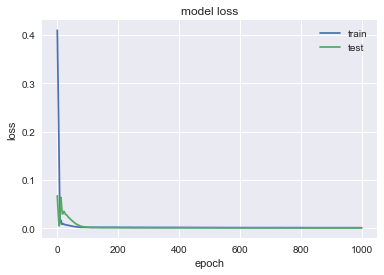

               DVA
MSE        1.22562
MAE       0.792505
R2        0.906766
MAPE (%)   1.46438


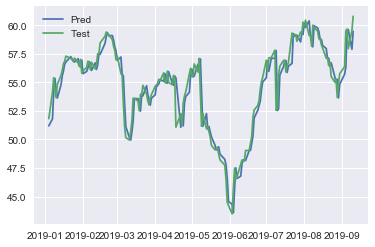

Predicting for  BA
Train on 1008 samples, validate on 172 samples
Epoch 1/1000
0s - loss: 0.1514 - val_loss: 0.5573
Epoch 2/1000
0s - loss: 0.1406 - val_loss: 0.5251
Epoch 3/1000
0s - loss: 0.1296 - val_loss: 0.4905
Epoch 4/1000
0s - loss: 0.1182 - val_loss: 0.4531
Epoch 5/1000
0s - loss: 0.1063 - val_loss: 0.4126
Epoch 6/1000
0s - loss: 0.0938 - val_loss: 0.3688
Epoch 7/1000
0s - loss: 0.0811 - val_loss: 0.3222
Epoch 8/1000
0s - loss: 0.0681 - val_loss: 0.2734
Epoch 9/1000
0s - loss: 0.0559 - val_loss: 0.2239
Epoch 10/1000
0s - loss: 0.0458 - val_loss: 0.1759
Epoch 11/1000
0s - loss: 0.0374 - val_loss: 0.1317
Epoch 12/1000
0s - loss: 0.0317 - val_loss: 0.0939
Epoch 13/1000
0s - loss: 0.0296 - val_loss: 0.0643
Epoch 14/1000
0s - loss: 0.0296 - val_loss: 0.0434
Epoch 15/1000
0s - loss: 0.0311 - val_loss: 0.0304
Epoch 16/1000
0s - loss: 0.0321 - val_loss: 0.0233
Epoch 17/1000
0s - loss: 0.0324 - val_loss: 0.0204
Epoch 18/1000
0s - loss: 0.0317 - val_loss: 0.0201
Epoch 19/1000
0s - loss: 

0s - loss: 6.6109e-04 - val_loss: 7.3539e-04
Epoch 147/1000
0s - loss: 7.7748e-04 - val_loss: 8.1044e-04
Epoch 148/1000
0s - loss: 6.9203e-04 - val_loss: 8.3998e-04
Epoch 149/1000
0s - loss: 7.1086e-04 - val_loss: 7.6521e-04
Epoch 150/1000
0s - loss: 7.5871e-04 - val_loss: 6.7524e-04
Epoch 151/1000
0s - loss: 7.6172e-04 - val_loss: 6.6240e-04
Epoch 152/1000
0s - loss: 7.5457e-04 - val_loss: 6.8279e-04
Epoch 153/1000
0s - loss: 7.1394e-04 - val_loss: 7.2003e-04
Epoch 154/1000
0s - loss: 7.9238e-04 - val_loss: 7.6659e-04
Epoch 155/1000
0s - loss: 7.0978e-04 - val_loss: 8.4269e-04
Epoch 156/1000
0s - loss: 7.2072e-04 - val_loss: 8.4658e-04
Epoch 157/1000
0s - loss: 8.2599e-04 - val_loss: 7.3671e-04
Epoch 158/1000
0s - loss: 7.8757e-04 - val_loss: 6.7241e-04
Epoch 159/1000
0s - loss: 7.3833e-04 - val_loss: 6.5123e-04
Epoch 160/1000
0s - loss: 7.3374e-04 - val_loss: 6.6249e-04
Epoch 161/1000
0s - loss: 7.8188e-04 - val_loss: 7.0660e-04
Epoch 162/1000
0s - loss: 7.1405e-04 - val_loss: 7.7097

0s - loss: 5.7307e-04 - val_loss: 5.3614e-04
Epoch 285/1000
0s - loss: 6.0514e-04 - val_loss: 5.3538e-04
Epoch 286/1000
0s - loss: 6.1836e-04 - val_loss: 5.0915e-04
Epoch 287/1000
0s - loss: 6.4981e-04 - val_loss: 4.9473e-04
Epoch 288/1000
0s - loss: 6.5240e-04 - val_loss: 4.9401e-04
Epoch 289/1000
0s - loss: 6.3816e-04 - val_loss: 4.9264e-04
Epoch 290/1000
0s - loss: 5.7804e-04 - val_loss: 4.9424e-04
Epoch 291/1000
0s - loss: 5.5423e-04 - val_loss: 5.1055e-04
Epoch 292/1000
0s - loss: 5.8688e-04 - val_loss: 5.0292e-04
Epoch 293/1000
0s - loss: 5.8991e-04 - val_loss: 4.8712e-04
Epoch 294/1000
0s - loss: 6.3057e-04 - val_loss: 4.8820e-04
Epoch 295/1000
0s - loss: 5.4732e-04 - val_loss: 4.9607e-04
Epoch 296/1000
0s - loss: 5.9966e-04 - val_loss: 4.9827e-04
Epoch 297/1000
0s - loss: 6.1037e-04 - val_loss: 4.8830e-04
Epoch 298/1000
0s - loss: 6.4601e-04 - val_loss: 4.9166e-04
Epoch 299/1000
0s - loss: 6.2269e-04 - val_loss: 4.8407e-04
Epoch 300/1000
0s - loss: 5.5955e-04 - val_loss: 4.8323

0s - loss: 4.6506e-04 - val_loss: 4.6168e-04
Epoch 423/1000
0s - loss: 5.7285e-04 - val_loss: 4.8820e-04
Epoch 424/1000
0s - loss: 5.7068e-04 - val_loss: 4.3729e-04
Epoch 425/1000
0s - loss: 4.7421e-04 - val_loss: 4.2341e-04
Epoch 426/1000
0s - loss: 5.9460e-04 - val_loss: 4.2982e-04
Epoch 427/1000
0s - loss: 5.8482e-04 - val_loss: 4.6220e-04
Epoch 428/1000
0s - loss: 5.2847e-04 - val_loss: 4.6474e-04
Epoch 429/1000
0s - loss: 4.7340e-04 - val_loss: 4.3179e-04
Epoch 430/1000
0s - loss: 4.8047e-04 - val_loss: 4.4055e-04
Epoch 431/1000
0s - loss: 5.3493e-04 - val_loss: 4.4879e-04
Epoch 432/1000
0s - loss: 5.2986e-04 - val_loss: 4.3757e-04
Epoch 433/1000
0s - loss: 4.9140e-04 - val_loss: 4.2497e-04
Epoch 434/1000
0s - loss: 5.0013e-04 - val_loss: 4.3827e-04
Epoch 435/1000
0s - loss: 5.2702e-04 - val_loss: 4.6015e-04
Epoch 436/1000
0s - loss: 5.5785e-04 - val_loss: 4.3383e-04
Epoch 437/1000
0s - loss: 4.3801e-04 - val_loss: 4.2118e-04
Epoch 438/1000
0s - loss: 4.7173e-04 - val_loss: 4.2880

0s - loss: 4.6818e-04 - val_loss: 4.1984e-04
Epoch 561/1000
0s - loss: 5.2184e-04 - val_loss: 4.2493e-04
Epoch 562/1000
0s - loss: 5.1366e-04 - val_loss: 5.2276e-04
Epoch 563/1000
0s - loss: 5.1232e-04 - val_loss: 5.2914e-04
Epoch 564/1000
0s - loss: 4.5861e-04 - val_loss: 4.3047e-04
Epoch 565/1000
0s - loss: 5.1952e-04 - val_loss: 4.4287e-04
Epoch 566/1000
0s - loss: 4.7186e-04 - val_loss: 5.2991e-04
Epoch 567/1000
0s - loss: 4.6753e-04 - val_loss: 4.9705e-04
Epoch 568/1000
0s - loss: 4.9952e-04 - val_loss: 4.6699e-04
Epoch 569/1000
0s - loss: 5.1557e-04 - val_loss: 4.7667e-04
Epoch 570/1000
0s - loss: 4.2623e-04 - val_loss: 4.5892e-04
Epoch 571/1000
0s - loss: 4.8285e-04 - val_loss: 4.7943e-04
Epoch 572/1000
0s - loss: 4.4358e-04 - val_loss: 5.0447e-04
Epoch 573/1000
0s - loss: 5.4524e-04 - val_loss: 5.1324e-04
Epoch 574/1000
0s - loss: 5.0444e-04 - val_loss: 4.8081e-04
Epoch 575/1000
0s - loss: 4.4056e-04 - val_loss: 4.4508e-04
Epoch 576/1000
0s - loss: 5.0026e-04 - val_loss: 4.7081

0s - loss: 4.6607e-04 - val_loss: 4.7649e-04
Epoch 699/1000
0s - loss: 4.4585e-04 - val_loss: 5.2372e-04
Epoch 700/1000
0s - loss: 4.2387e-04 - val_loss: 4.4071e-04
Epoch 701/1000
0s - loss: 4.6846e-04 - val_loss: 4.6294e-04
Epoch 702/1000
0s - loss: 4.6730e-04 - val_loss: 5.2181e-04
Epoch 703/1000
0s - loss: 4.2966e-04 - val_loss: 5.3341e-04
Epoch 704/1000
0s - loss: 4.4770e-04 - val_loss: 5.3519e-04
Epoch 705/1000
0s - loss: 4.5295e-04 - val_loss: 4.5728e-04
Epoch 706/1000
0s - loss: 4.8381e-04 - val_loss: 4.9048e-04
Epoch 707/1000
0s - loss: 4.2962e-04 - val_loss: 5.1790e-04
Epoch 708/1000
0s - loss: 4.5603e-04 - val_loss: 5.0683e-04
Epoch 709/1000
0s - loss: 4.7224e-04 - val_loss: 4.9758e-04
Epoch 710/1000
0s - loss: 4.2893e-04 - val_loss: 5.4826e-04
Epoch 711/1000
0s - loss: 4.5159e-04 - val_loss: 4.5289e-04
Epoch 712/1000
0s - loss: 5.0171e-04 - val_loss: 4.4374e-04
Epoch 713/1000
0s - loss: 4.3503e-04 - val_loss: 5.5123e-04
Epoch 714/1000
0s - loss: 4.7515e-04 - val_loss: 4.5622

0s - loss: 3.8069e-04 - val_loss: 5.1216e-04
Epoch 837/1000
0s - loss: 3.9242e-04 - val_loss: 5.6777e-04
Epoch 838/1000
0s - loss: 3.8380e-04 - val_loss: 5.0765e-04
Epoch 839/1000
0s - loss: 4.2449e-04 - val_loss: 4.7514e-04
Epoch 840/1000
0s - loss: 3.9700e-04 - val_loss: 5.1461e-04
Epoch 841/1000
0s - loss: 3.8705e-04 - val_loss: 5.1470e-04
Epoch 842/1000
0s - loss: 4.1947e-04 - val_loss: 4.5211e-04
Epoch 843/1000
0s - loss: 4.1187e-04 - val_loss: 5.3919e-04
Epoch 844/1000
0s - loss: 4.6145e-04 - val_loss: 4.9362e-04
Epoch 845/1000
0s - loss: 4.1401e-04 - val_loss: 4.5856e-04
Epoch 846/1000
0s - loss: 4.5224e-04 - val_loss: 4.5510e-04
Epoch 847/1000
0s - loss: 4.6603e-04 - val_loss: 5.0173e-04
Epoch 848/1000
0s - loss: 4.2035e-04 - val_loss: 5.3344e-04
Epoch 849/1000
0s - loss: 3.7187e-04 - val_loss: 4.2628e-04
Epoch 850/1000
0s - loss: 4.5860e-04 - val_loss: 4.6109e-04
Epoch 851/1000
0s - loss: 4.5439e-04 - val_loss: 5.8819e-04
Epoch 852/1000
0s - loss: 4.6879e-04 - val_loss: 4.4440

0s - loss: 3.9255e-04 - val_loss: 5.0833e-04
Epoch 975/1000
0s - loss: 4.0412e-04 - val_loss: 4.3554e-04
Epoch 976/1000
0s - loss: 4.3544e-04 - val_loss: 4.6005e-04
Epoch 977/1000
0s - loss: 4.4937e-04 - val_loss: 4.5799e-04
Epoch 978/1000
0s - loss: 3.7437e-04 - val_loss: 4.7374e-04
Epoch 979/1000
0s - loss: 3.9143e-04 - val_loss: 5.3206e-04
Epoch 980/1000
0s - loss: 4.1232e-04 - val_loss: 4.9786e-04
Epoch 981/1000
0s - loss: 3.7096e-04 - val_loss: 4.2376e-04
Epoch 982/1000
0s - loss: 4.4932e-04 - val_loss: 4.2139e-04
Epoch 983/1000
0s - loss: 4.0608e-04 - val_loss: 4.6835e-04
Epoch 984/1000
0s - loss: 4.1594e-04 - val_loss: 4.2946e-04
Epoch 985/1000
0s - loss: 4.2225e-04 - val_loss: 4.4986e-04
Epoch 986/1000
0s - loss: 4.4952e-04 - val_loss: 4.8644e-04
Epoch 987/1000
0s - loss: 3.8418e-04 - val_loss: 4.6024e-04
Epoch 988/1000
0s - loss: 4.1646e-04 - val_loss: 4.3413e-04
Epoch 989/1000
0s - loss: 3.9912e-04 - val_loss: 5.0940e-04
Epoch 990/1000
0s - loss: 4.0872e-04 - val_loss: 4.8114

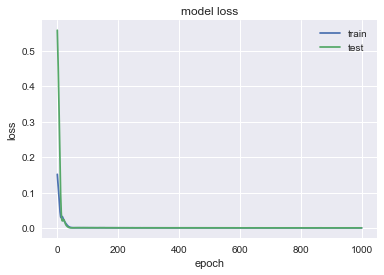

                BA
MSE         54.953
MAE        5.21404
R2        0.905011
MAPE (%)   1.39796


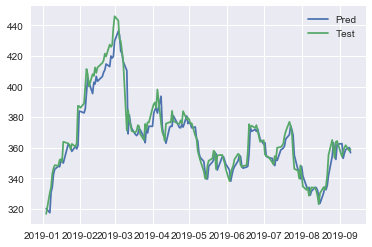

Predicting for  IBM
Train on 1008 samples, validate on 172 samples
Epoch 1/1000
0s - loss: 0.3676 - val_loss: 0.1416
Epoch 2/1000
0s - loss: 0.3365 - val_loss: 0.1241
Epoch 3/1000
0s - loss: 0.3043 - val_loss: 0.1056
Epoch 4/1000
0s - loss: 0.2685 - val_loss: 0.0859
Epoch 5/1000
0s - loss: 0.2301 - val_loss: 0.0654
Epoch 6/1000
0s - loss: 0.1885 - val_loss: 0.0450
Epoch 7/1000
0s - loss: 0.1446 - val_loss: 0.0262
Epoch 8/1000
0s - loss: 0.1011 - val_loss: 0.0116
Epoch 9/1000
0s - loss: 0.0629 - val_loss: 0.0040
Epoch 10/1000
0s - loss: 0.0326 - val_loss: 0.0056
Epoch 11/1000
0s - loss: 0.0162 - val_loss: 0.0153
Epoch 12/1000
0s - loss: 0.0118 - val_loss: 0.0264
Epoch 13/1000
0s - loss: 0.0143 - val_loss: 0.0307
Epoch 14/1000
0s - loss: 0.0142 - val_loss: 0.0267
Epoch 15/1000
0s - loss: 0.0116 - val_loss: 0.0197
Epoch 16/1000
0s - loss: 0.0100 - val_loss: 0.0138
Epoch 17/1000
0s - loss: 0.0102 - val_loss: 0.0102
Epoch 18/1000
0s - loss: 0.0109 - val_loss: 0.0086
Epoch 19/1000
0s - loss:

0s - loss: 0.0017 - val_loss: 5.2635e-04
Epoch 154/1000
0s - loss: 0.0018 - val_loss: 5.3969e-04
Epoch 155/1000
0s - loss: 0.0017 - val_loss: 5.1385e-04
Epoch 156/1000
0s - loss: 0.0017 - val_loss: 5.0880e-04
Epoch 157/1000
0s - loss: 0.0019 - val_loss: 5.3489e-04
Epoch 158/1000
0s - loss: 0.0018 - val_loss: 5.3426e-04
Epoch 159/1000
0s - loss: 0.0017 - val_loss: 5.1986e-04
Epoch 160/1000
0s - loss: 0.0017 - val_loss: 5.1619e-04
Epoch 161/1000
0s - loss: 0.0018 - val_loss: 5.2145e-04
Epoch 162/1000
0s - loss: 0.0017 - val_loss: 5.2720e-04
Epoch 163/1000
0s - loss: 0.0017 - val_loss: 5.1976e-04
Epoch 164/1000
0s - loss: 0.0017 - val_loss: 5.2081e-04
Epoch 165/1000
0s - loss: 0.0018 - val_loss: 5.2024e-04
Epoch 166/1000
0s - loss: 0.0018 - val_loss: 5.1087e-04
Epoch 167/1000
0s - loss: 0.0018 - val_loss: 5.2035e-04
Epoch 168/1000
0s - loss: 0.0017 - val_loss: 5.2327e-04
Epoch 169/1000
0s - loss: 0.0019 - val_loss: 5.2018e-04
Epoch 170/1000
0s - loss: 0.0018 - val_loss: 5.1467e-04
Epoch 1

0s - loss: 0.0016 - val_loss: 5.1923e-04
Epoch 301/1000
0s - loss: 0.0015 - val_loss: 4.9301e-04
Epoch 302/1000
0s - loss: 0.0014 - val_loss: 4.9897e-04
Epoch 303/1000
0s - loss: 0.0016 - val_loss: 5.2501e-04
Epoch 304/1000
0s - loss: 0.0015 - val_loss: 5.1852e-04
Epoch 305/1000
0s - loss: 0.0015 - val_loss: 5.1651e-04
Epoch 306/1000
0s - loss: 0.0015 - val_loss: 5.1612e-04
Epoch 307/1000
0s - loss: 0.0015 - val_loss: 5.0749e-04
Epoch 308/1000
0s - loss: 0.0015 - val_loss: 5.0603e-04
Epoch 309/1000
0s - loss: 0.0015 - val_loss: 5.1247e-04
Epoch 310/1000
0s - loss: 0.0014 - val_loss: 5.2245e-04
Epoch 311/1000
0s - loss: 0.0015 - val_loss: 5.0371e-04
Epoch 312/1000
0s - loss: 0.0014 - val_loss: 4.9499e-04
Epoch 313/1000
0s - loss: 0.0014 - val_loss: 5.0163e-04
Epoch 314/1000
0s - loss: 0.0015 - val_loss: 5.3094e-04
Epoch 315/1000
0s - loss: 0.0015 - val_loss: 5.1410e-04
Epoch 316/1000
0s - loss: 0.0014 - val_loss: 4.9177e-04
Epoch 317/1000
0s - loss: 0.0015 - val_loss: 5.0060e-04
Epoch 3

0s - loss: 0.0014 - val_loss: 5.1411e-04
Epoch 449/1000
0s - loss: 0.0013 - val_loss: 5.1982e-04
Epoch 450/1000
0s - loss: 0.0013 - val_loss: 5.1201e-04
Epoch 451/1000
0s - loss: 0.0014 - val_loss: 5.2587e-04
Epoch 452/1000
0s - loss: 0.0014 - val_loss: 5.2597e-04
Epoch 453/1000
0s - loss: 0.0014 - val_loss: 5.0363e-04
Epoch 454/1000
0s - loss: 0.0013 - val_loss: 5.0779e-04
Epoch 455/1000
0s - loss: 0.0014 - val_loss: 5.4758e-04
Epoch 456/1000
0s - loss: 0.0014 - val_loss: 5.0698e-04
Epoch 457/1000
0s - loss: 0.0014 - val_loss: 5.0439e-04
Epoch 458/1000
0s - loss: 0.0014 - val_loss: 5.2086e-04
Epoch 459/1000
0s - loss: 0.0014 - val_loss: 5.2744e-04
Epoch 460/1000
0s - loss: 0.0014 - val_loss: 5.0674e-04
Epoch 461/1000
0s - loss: 0.0014 - val_loss: 5.1132e-04
Epoch 462/1000
0s - loss: 0.0014 - val_loss: 5.3550e-04
Epoch 463/1000
0s - loss: 0.0014 - val_loss: 5.1719e-04
Epoch 464/1000
0s - loss: 0.0014 - val_loss: 5.1572e-04
Epoch 465/1000
0s - loss: 0.0014 - val_loss: 5.3439e-04
Epoch 4

0s - loss: 0.0012 - val_loss: 5.2892e-04
Epoch 597/1000
0s - loss: 0.0013 - val_loss: 5.1016e-04
Epoch 598/1000
0s - loss: 0.0012 - val_loss: 5.1832e-04
Epoch 599/1000
0s - loss: 0.0012 - val_loss: 5.1291e-04
Epoch 600/1000
0s - loss: 0.0013 - val_loss: 5.2125e-04
Epoch 601/1000
0s - loss: 0.0013 - val_loss: 5.1521e-04
Epoch 602/1000
0s - loss: 0.0013 - val_loss: 5.1297e-04
Epoch 603/1000
0s - loss: 0.0012 - val_loss: 5.1896e-04
Epoch 604/1000
0s - loss: 0.0013 - val_loss: 5.1938e-04
Epoch 605/1000
0s - loss: 0.0013 - val_loss: 5.3797e-04
Epoch 606/1000
0s - loss: 0.0013 - val_loss: 5.1885e-04
Epoch 607/1000
0s - loss: 0.0013 - val_loss: 5.1074e-04
Epoch 608/1000
0s - loss: 0.0013 - val_loss: 5.0798e-04
Epoch 609/1000
0s - loss: 0.0013 - val_loss: 5.1003e-04
Epoch 610/1000
0s - loss: 0.0013 - val_loss: 5.2078e-04
Epoch 611/1000
0s - loss: 0.0013 - val_loss: 5.0761e-04
Epoch 612/1000
0s - loss: 0.0013 - val_loss: 5.1974e-04
Epoch 613/1000
0s - loss: 0.0014 - val_loss: 5.4690e-04
Epoch 6

0s - loss: 0.0013 - val_loss: 5.2099e-04
Epoch 745/1000
0s - loss: 0.0012 - val_loss: 5.1680e-04
Epoch 746/1000
0s - loss: 0.0012 - val_loss: 5.2522e-04
Epoch 747/1000
0s - loss: 0.0013 - val_loss: 5.1140e-04
Epoch 748/1000
0s - loss: 0.0013 - val_loss: 5.5757e-04
Epoch 749/1000
0s - loss: 0.0013 - val_loss: 5.1928e-04
Epoch 750/1000
0s - loss: 0.0012 - val_loss: 5.0787e-04
Epoch 751/1000
0s - loss: 0.0012 - val_loss: 5.6918e-04
Epoch 752/1000
0s - loss: 0.0013 - val_loss: 5.0460e-04
Epoch 753/1000
0s - loss: 0.0013 - val_loss: 5.1225e-04
Epoch 754/1000
0s - loss: 0.0012 - val_loss: 5.1523e-04
Epoch 755/1000
0s - loss: 0.0012 - val_loss: 5.2326e-04
Epoch 756/1000
0s - loss: 0.0012 - val_loss: 5.4171e-04
Epoch 757/1000
0s - loss: 0.0012 - val_loss: 5.0911e-04
Epoch 758/1000
0s - loss: 0.0012 - val_loss: 5.2562e-04
Epoch 759/1000
0s - loss: 0.0013 - val_loss: 5.0949e-04
Epoch 760/1000
0s - loss: 0.0012 - val_loss: 5.0779e-04
Epoch 761/1000
0s - loss: 0.0013 - val_loss: 5.3251e-04
Epoch 7

0s - loss: 0.0011 - val_loss: 5.3553e-04
Epoch 893/1000
0s - loss: 0.0011 - val_loss: 5.3357e-04
Epoch 894/1000
0s - loss: 0.0011 - val_loss: 5.1254e-04
Epoch 895/1000
0s - loss: 0.0012 - val_loss: 5.5043e-04
Epoch 896/1000
0s - loss: 0.0012 - val_loss: 5.0925e-04
Epoch 897/1000
0s - loss: 0.0011 - val_loss: 5.2828e-04
Epoch 898/1000
0s - loss: 0.0011 - val_loss: 5.1290e-04
Epoch 899/1000
0s - loss: 0.0012 - val_loss: 5.3225e-04
Epoch 900/1000
0s - loss: 0.0011 - val_loss: 5.2920e-04
Epoch 901/1000
0s - loss: 0.0012 - val_loss: 5.1760e-04
Epoch 902/1000
0s - loss: 0.0012 - val_loss: 5.0724e-04
Epoch 903/1000
0s - loss: 0.0011 - val_loss: 5.5215e-04
Epoch 904/1000
0s - loss: 0.0012 - val_loss: 5.0427e-04
Epoch 905/1000
0s - loss: 0.0011 - val_loss: 5.1639e-04
Epoch 906/1000
0s - loss: 0.0011 - val_loss: 5.2986e-04
Epoch 907/1000
0s - loss: 0.0010 - val_loss: 5.3309e-04
Epoch 908/1000
0s - loss: 0.0012 - val_loss: 5.1567e-04
Epoch 909/1000
0s - loss: 0.0012 - val_loss: 5.3528e-04
Epoch 9

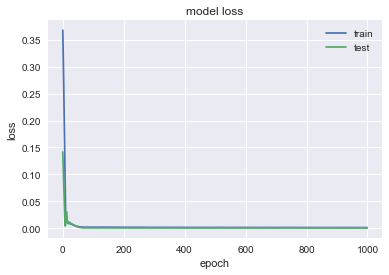

               IBM
MSE         2.9003
MAE        1.17177
R2        0.935835
MAPE (%)  0.860064


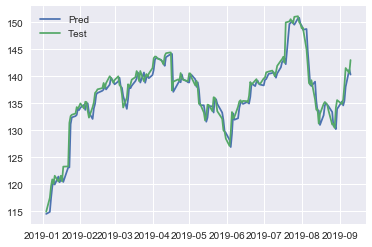

Predicting for  ALB
Train on 1008 samples, validate on 172 samples
Epoch 1/1000
0s - loss: 0.2417 - val_loss: 0.1003
Epoch 2/1000
0s - loss: 0.2218 - val_loss: 0.0880
Epoch 3/1000
0s - loss: 0.2016 - val_loss: 0.0754
Epoch 4/1000
0s - loss: 0.1805 - val_loss: 0.0625
Epoch 5/1000
0s - loss: 0.1581 - val_loss: 0.0493
Epoch 6/1000
0s - loss: 0.1349 - val_loss: 0.0363
Epoch 7/1000
0s - loss: 0.1106 - val_loss: 0.0241
Epoch 8/1000
0s - loss: 0.0861 - val_loss: 0.0136
Epoch 9/1000
0s - loss: 0.0644 - val_loss: 0.0062
Epoch 10/1000
0s - loss: 0.0450 - val_loss: 0.0031
Epoch 11/1000
0s - loss: 0.0314 - val_loss: 0.0047
Epoch 12/1000
0s - loss: 0.0242 - val_loss: 0.0101
Epoch 13/1000
0s - loss: 0.0231 - val_loss: 0.0165
Epoch 14/1000
0s - loss: 0.0250 - val_loss: 0.0206
Epoch 15/1000
0s - loss: 0.0264 - val_loss: 0.0209
Epoch 16/1000
0s - loss: 0.0257 - val_loss: 0.0184
Epoch 17/1000
0s - loss: 0.0249 - val_loss: 0.0148
Epoch 18/1000
0s - loss: 0.0225 - val_loss: 0.0116
Epoch 19/1000
0s - loss:

0s - loss: 0.0011 - val_loss: 2.9305e-04
Epoch 153/1000
0s - loss: 0.0012 - val_loss: 2.8300e-04
Epoch 154/1000
0s - loss: 0.0011 - val_loss: 2.7551e-04
Epoch 155/1000
0s - loss: 0.0010 - val_loss: 2.7534e-04
Epoch 156/1000
0s - loss: 0.0011 - val_loss: 2.7996e-04
Epoch 157/1000
0s - loss: 0.0011 - val_loss: 2.9413e-04
Epoch 158/1000
0s - loss: 0.0012 - val_loss: 2.9071e-04
Epoch 159/1000
0s - loss: 0.0011 - val_loss: 2.8265e-04
Epoch 160/1000
0s - loss: 0.0011 - val_loss: 2.9243e-04
Epoch 161/1000
0s - loss: 0.0011 - val_loss: 3.0923e-04
Epoch 162/1000
0s - loss: 0.0011 - val_loss: 3.0211e-04
Epoch 163/1000
0s - loss: 0.0011 - val_loss: 2.8453e-04
Epoch 164/1000
0s - loss: 0.0011 - val_loss: 2.7297e-04
Epoch 165/1000
0s - loss: 0.0011 - val_loss: 2.6898e-04
Epoch 166/1000
0s - loss: 0.0011 - val_loss: 2.7651e-04
Epoch 167/1000
0s - loss: 0.0011 - val_loss: 2.9114e-04
Epoch 168/1000
0s - loss: 0.0012 - val_loss: 2.8755e-04
Epoch 169/1000
0s - loss: 0.0012 - val_loss: 2.8223e-04
Epoch 1

0s - loss: 7.9037e-04 - val_loss: 2.5591e-04
Epoch 295/1000
0s - loss: 9.0829e-04 - val_loss: 2.5197e-04
Epoch 296/1000
0s - loss: 8.5931e-04 - val_loss: 2.5208e-04
Epoch 297/1000
0s - loss: 9.0329e-04 - val_loss: 2.5595e-04
Epoch 298/1000
0s - loss: 7.9441e-04 - val_loss: 2.5534e-04
Epoch 299/1000
0s - loss: 9.5194e-04 - val_loss: 2.5327e-04
Epoch 300/1000
0s - loss: 8.4447e-04 - val_loss: 2.5447e-04
Epoch 301/1000
0s - loss: 8.3965e-04 - val_loss: 2.5950e-04
Epoch 302/1000
0s - loss: 8.9434e-04 - val_loss: 2.5950e-04
Epoch 303/1000
0s - loss: 8.5128e-04 - val_loss: 2.5437e-04
Epoch 304/1000
0s - loss: 8.7171e-04 - val_loss: 2.5342e-04
Epoch 305/1000
0s - loss: 8.2537e-04 - val_loss: 2.5362e-04
Epoch 306/1000
0s - loss: 8.9676e-04 - val_loss: 2.5778e-04
Epoch 307/1000
0s - loss: 8.2282e-04 - val_loss: 2.6086e-04
Epoch 308/1000
0s - loss: 9.2638e-04 - val_loss: 2.5470e-04
Epoch 309/1000
0s - loss: 9.0470e-04 - val_loss: 2.5265e-04
Epoch 310/1000
0s - loss: 9.0726e-04 - val_loss: 2.5587

0s - loss: 7.7620e-04 - val_loss: 2.5389e-04
Epoch 433/1000
0s - loss: 8.1771e-04 - val_loss: 2.5601e-04
Epoch 434/1000
0s - loss: 7.3098e-04 - val_loss: 2.5381e-04
Epoch 435/1000
0s - loss: 8.4691e-04 - val_loss: 2.6422e-04
Epoch 436/1000
0s - loss: 7.8640e-04 - val_loss: 2.5607e-04
Epoch 437/1000
0s - loss: 8.0268e-04 - val_loss: 2.5491e-04
Epoch 438/1000
0s - loss: 7.7818e-04 - val_loss: 2.5518e-04
Epoch 439/1000
0s - loss: 7.9378e-04 - val_loss: 2.5407e-04
Epoch 440/1000
0s - loss: 7.8047e-04 - val_loss: 2.5600e-04
Epoch 441/1000
0s - loss: 7.6971e-04 - val_loss: 2.5599e-04
Epoch 442/1000
0s - loss: 8.0538e-04 - val_loss: 2.5404e-04
Epoch 443/1000
0s - loss: 7.8216e-04 - val_loss: 2.5411e-04
Epoch 444/1000
0s - loss: 8.2288e-04 - val_loss: 2.5481e-04
Epoch 445/1000
0s - loss: 8.1306e-04 - val_loss: 2.5411e-04
Epoch 446/1000
0s - loss: 7.6865e-04 - val_loss: 2.5555e-04
Epoch 447/1000
0s - loss: 8.9283e-04 - val_loss: 2.5448e-04
Epoch 448/1000
0s - loss: 8.0999e-04 - val_loss: 2.5477

0s - loss: 7.5851e-04 - val_loss: 2.5697e-04
Epoch 571/1000
0s - loss: 7.4399e-04 - val_loss: 2.5595e-04
Epoch 572/1000
0s - loss: 7.6776e-04 - val_loss: 2.5435e-04
Epoch 573/1000
0s - loss: 7.7185e-04 - val_loss: 2.5386e-04
Epoch 574/1000
0s - loss: 7.4057e-04 - val_loss: 2.5330e-04
Epoch 575/1000
0s - loss: 7.5342e-04 - val_loss: 2.5411e-04
Epoch 576/1000
0s - loss: 7.2274e-04 - val_loss: 2.5457e-04
Epoch 577/1000
0s - loss: 7.1771e-04 - val_loss: 2.5387e-04
Epoch 578/1000
0s - loss: 7.5126e-04 - val_loss: 2.5626e-04
Epoch 579/1000
0s - loss: 6.9400e-04 - val_loss: 2.5431e-04
Epoch 580/1000
0s - loss: 7.2117e-04 - val_loss: 2.5658e-04
Epoch 581/1000
0s - loss: 7.1610e-04 - val_loss: 2.5462e-04
Epoch 582/1000
0s - loss: 7.5823e-04 - val_loss: 2.5571e-04
Epoch 583/1000
0s - loss: 6.9575e-04 - val_loss: 2.5716e-04
Epoch 584/1000
0s - loss: 7.5055e-04 - val_loss: 2.5337e-04
Epoch 585/1000
0s - loss: 7.8091e-04 - val_loss: 2.6234e-04
Epoch 586/1000
0s - loss: 7.7200e-04 - val_loss: 2.5566

0s - loss: 7.8538e-04 - val_loss: 2.5720e-04
Epoch 709/1000
0s - loss: 7.2744e-04 - val_loss: 2.5358e-04
Epoch 710/1000
0s - loss: 6.5842e-04 - val_loss: 2.5578e-04
Epoch 711/1000
0s - loss: 7.3388e-04 - val_loss: 2.5670e-04
Epoch 712/1000
0s - loss: 6.9356e-04 - val_loss: 2.5903e-04
Epoch 713/1000
0s - loss: 6.5872e-04 - val_loss: 2.5432e-04
Epoch 714/1000
0s - loss: 7.4981e-04 - val_loss: 2.5432e-04
Epoch 715/1000
0s - loss: 6.5261e-04 - val_loss: 2.5495e-04
Epoch 716/1000
0s - loss: 6.9156e-04 - val_loss: 2.5386e-04
Epoch 717/1000
0s - loss: 6.5855e-04 - val_loss: 2.5396e-04
Epoch 718/1000
0s - loss: 6.7921e-04 - val_loss: 2.5378e-04
Epoch 719/1000
0s - loss: 6.3827e-04 - val_loss: 2.5381e-04
Epoch 720/1000
0s - loss: 7.0668e-04 - val_loss: 2.5757e-04
Epoch 721/1000
0s - loss: 6.5513e-04 - val_loss: 2.5520e-04
Epoch 722/1000
0s - loss: 6.8495e-04 - val_loss: 2.5782e-04
Epoch 723/1000
0s - loss: 8.1334e-04 - val_loss: 2.6215e-04
Epoch 724/1000
0s - loss: 7.3994e-04 - val_loss: 2.6517

0s - loss: 6.8073e-04 - val_loss: 2.5355e-04
Epoch 847/1000
0s - loss: 7.6535e-04 - val_loss: 2.5406e-04
Epoch 848/1000
0s - loss: 6.9679e-04 - val_loss: 2.5394e-04
Epoch 849/1000
0s - loss: 7.0215e-04 - val_loss: 2.5322e-04
Epoch 850/1000
0s - loss: 6.4826e-04 - val_loss: 2.6420e-04
Epoch 851/1000
0s - loss: 6.5980e-04 - val_loss: 2.5450e-04
Epoch 852/1000
0s - loss: 6.3150e-04 - val_loss: 2.6635e-04
Epoch 853/1000
0s - loss: 6.5238e-04 - val_loss: 2.5636e-04
Epoch 854/1000
0s - loss: 6.5594e-04 - val_loss: 2.7270e-04
Epoch 855/1000
0s - loss: 6.7120e-04 - val_loss: 2.6108e-04
Epoch 856/1000
0s - loss: 7.2516e-04 - val_loss: 2.5334e-04
Epoch 857/1000
0s - loss: 7.4419e-04 - val_loss: 2.5303e-04
Epoch 858/1000
0s - loss: 6.7981e-04 - val_loss: 2.7327e-04
Epoch 859/1000
0s - loss: 6.2608e-04 - val_loss: 2.5371e-04
Epoch 860/1000
0s - loss: 6.6194e-04 - val_loss: 2.5518e-04
Epoch 861/1000
0s - loss: 6.4803e-04 - val_loss: 2.5438e-04
Epoch 862/1000
0s - loss: 6.4221e-04 - val_loss: 2.6096

0s - loss: 6.0211e-04 - val_loss: 2.5484e-04
Epoch 985/1000
0s - loss: 6.4195e-04 - val_loss: 2.5638e-04
Epoch 986/1000
0s - loss: 6.7336e-04 - val_loss: 2.5552e-04
Epoch 987/1000
0s - loss: 6.3370e-04 - val_loss: 2.5324e-04
Epoch 988/1000
0s - loss: 6.1828e-04 - val_loss: 2.5740e-04
Epoch 989/1000
0s - loss: 6.8494e-04 - val_loss: 2.5568e-04
Epoch 990/1000
0s - loss: 6.5209e-04 - val_loss: 2.5618e-04
Epoch 991/1000
0s - loss: 6.7371e-04 - val_loss: 2.5466e-04
Epoch 992/1000
0s - loss: 6.3625e-04 - val_loss: 2.5385e-04
Epoch 993/1000
0s - loss: 5.7103e-04 - val_loss: 2.5497e-04
Epoch 994/1000
0s - loss: 5.9151e-04 - val_loss: 2.5503e-04
Epoch 995/1000
0s - loss: 7.5429e-04 - val_loss: 2.5369e-04
Epoch 996/1000
0s - loss: 5.9151e-04 - val_loss: 2.5396e-04
Epoch 997/1000
0s - loss: 6.3209e-04 - val_loss: 2.5338e-04
Epoch 998/1000
0s - loss: 5.9407e-04 - val_loss: 2.5912e-04
Epoch 999/1000
0s - loss: 6.2240e-04 - val_loss: 2.5624e-04
Epoch 1000/1000
0s - loss: 6.2104e-04 - val_loss: 2.544

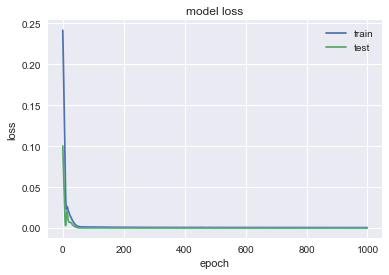

               ALB
MSE        2.64744
MAE        1.21111
R2        0.957331
MAPE (%)   1.63265


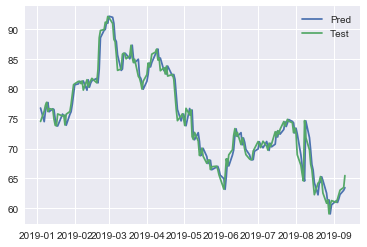

Predicting for  CBRE
Train on 1008 samples, validate on 172 samples
Epoch 1/1000
0s - loss: 0.2146 - val_loss: 0.6478
Epoch 2/1000
0s - loss: 0.1973 - val_loss: 0.6066
Epoch 3/1000
0s - loss: 0.1797 - val_loss: 0.5623
Epoch 4/1000
0s - loss: 0.1608 - val_loss: 0.5134
Epoch 5/1000
0s - loss: 0.1406 - val_loss: 0.4591
Epoch 6/1000
0s - loss: 0.1189 - val_loss: 0.3992
Epoch 7/1000
0s - loss: 0.0962 - val_loss: 0.3344
Epoch 8/1000
0s - loss: 0.0740 - val_loss: 0.2665
Epoch 9/1000
0s - loss: 0.0522 - val_loss: 0.1988
Epoch 10/1000
0s - loss: 0.0341 - val_loss: 0.1362
Epoch 11/1000
0s - loss: 0.0220 - val_loss: 0.0844
Epoch 12/1000
0s - loss: 0.0169 - val_loss: 0.0480
Epoch 13/1000
0s - loss: 0.0173 - val_loss: 0.0274
Epoch 14/1000
0s - loss: 0.0208 - val_loss: 0.0189
Epoch 15/1000
0s - loss: 0.0227 - val_loss: 0.0181
Epoch 16/1000
0s - loss: 0.0221 - val_loss: 0.0220
Epoch 17/1000
0s - loss: 0.0198 - val_loss: 0.0283
Epoch 18/1000
0s - loss: 0.0181 - val_loss: 0.0349
Epoch 19/1000
0s - loss

0s - loss: 0.0011 - val_loss: 8.1294e-04
Epoch 157/1000
0s - loss: 0.0010 - val_loss: 8.0128e-04
Epoch 158/1000
0s - loss: 0.0010 - val_loss: 8.0469e-04
Epoch 159/1000
0s - loss: 9.8586e-04 - val_loss: 8.1776e-04
Epoch 160/1000
0s - loss: 0.0011 - val_loss: 8.5925e-04
Epoch 161/1000
0s - loss: 9.8895e-04 - val_loss: 8.4389e-04
Epoch 162/1000
0s - loss: 0.0011 - val_loss: 8.3258e-04
Epoch 163/1000
0s - loss: 9.5686e-04 - val_loss: 8.4250e-04
Epoch 164/1000
0s - loss: 0.0010 - val_loss: 7.9149e-04
Epoch 165/1000
0s - loss: 0.0010 - val_loss: 7.6312e-04
Epoch 166/1000
0s - loss: 0.0010 - val_loss: 7.9000e-04
Epoch 167/1000
0s - loss: 9.9680e-04 - val_loss: 9.1937e-04
Epoch 168/1000
0s - loss: 9.9432e-04 - val_loss: 8.8720e-04
Epoch 169/1000
0s - loss: 9.9977e-04 - val_loss: 7.7970e-04
Epoch 170/1000
0s - loss: 0.0010 - val_loss: 7.1450e-04
Epoch 171/1000
0s - loss: 0.0010 - val_loss: 6.9938e-04
Epoch 172/1000
0s - loss: 0.0010 - val_loss: 7.6898e-04
Epoch 173/1000
0s - loss: 0.0010 - val_

0s - loss: 9.2371e-04 - val_loss: 5.3945e-04
Epoch 297/1000
0s - loss: 8.1986e-04 - val_loss: 5.3747e-04
Epoch 298/1000
0s - loss: 8.5206e-04 - val_loss: 5.3877e-04
Epoch 299/1000
0s - loss: 8.1027e-04 - val_loss: 5.3493e-04
Epoch 300/1000
0s - loss: 8.4520e-04 - val_loss: 5.5491e-04
Epoch 301/1000
0s - loss: 8.9635e-04 - val_loss: 5.3719e-04
Epoch 302/1000
0s - loss: 7.9164e-04 - val_loss: 5.3477e-04
Epoch 303/1000
0s - loss: 8.4358e-04 - val_loss: 5.3064e-04
Epoch 304/1000
0s - loss: 8.0730e-04 - val_loss: 5.3608e-04
Epoch 305/1000
0s - loss: 8.6829e-04 - val_loss: 5.3252e-04
Epoch 306/1000
0s - loss: 8.8954e-04 - val_loss: 5.3177e-04
Epoch 307/1000
0s - loss: 8.8848e-04 - val_loss: 5.2939e-04
Epoch 308/1000
0s - loss: 7.8733e-04 - val_loss: 5.3170e-04
Epoch 309/1000
0s - loss: 9.1616e-04 - val_loss: 5.3068e-04
Epoch 310/1000
0s - loss: 9.1098e-04 - val_loss: 5.3517e-04
Epoch 311/1000
0s - loss: 8.2224e-04 - val_loss: 5.3288e-04
Epoch 312/1000
0s - loss: 8.3106e-04 - val_loss: 5.3259

0s - loss: 8.0322e-04 - val_loss: 5.0255e-04
Epoch 435/1000
0s - loss: 7.7317e-04 - val_loss: 5.5515e-04
Epoch 436/1000
0s - loss: 7.8884e-04 - val_loss: 6.0827e-04
Epoch 437/1000
0s - loss: 7.8153e-04 - val_loss: 5.0188e-04
Epoch 438/1000
0s - loss: 7.2322e-04 - val_loss: 5.2838e-04
Epoch 439/1000
0s - loss: 8.1659e-04 - val_loss: 6.7898e-04
Epoch 440/1000
0s - loss: 7.6110e-04 - val_loss: 5.7945e-04
Epoch 441/1000
0s - loss: 8.6294e-04 - val_loss: 5.3151e-04
Epoch 442/1000
0s - loss: 7.1794e-04 - val_loss: 5.8435e-04
Epoch 443/1000
0s - loss: 7.6633e-04 - val_loss: 5.6863e-04
Epoch 444/1000
0s - loss: 7.3528e-04 - val_loss: 5.0831e-04
Epoch 445/1000
0s - loss: 6.8875e-04 - val_loss: 5.1027e-04
Epoch 446/1000
0s - loss: 7.9273e-04 - val_loss: 5.1951e-04
Epoch 447/1000
0s - loss: 7.9331e-04 - val_loss: 6.1503e-04
Epoch 448/1000
0s - loss: 7.7231e-04 - val_loss: 5.1440e-04
Epoch 449/1000
0s - loss: 8.4974e-04 - val_loss: 4.7759e-04
Epoch 450/1000
0s - loss: 8.5415e-04 - val_loss: 5.5815

0s - loss: 7.9651e-04 - val_loss: 5.3775e-04
Epoch 573/1000
0s - loss: 7.7015e-04 - val_loss: 4.8904e-04
Epoch 574/1000
0s - loss: 6.9247e-04 - val_loss: 5.2725e-04
Epoch 575/1000
0s - loss: 6.9312e-04 - val_loss: 5.3910e-04
Epoch 576/1000
0s - loss: 7.2835e-04 - val_loss: 4.9052e-04
Epoch 577/1000
0s - loss: 8.4390e-04 - val_loss: 5.0331e-04
Epoch 578/1000
0s - loss: 7.0202e-04 - val_loss: 5.7869e-04
Epoch 579/1000
0s - loss: 7.2833e-04 - val_loss: 5.6202e-04
Epoch 580/1000
0s - loss: 8.1138e-04 - val_loss: 5.3754e-04
Epoch 581/1000
0s - loss: 7.6961e-04 - val_loss: 6.2903e-04
Epoch 582/1000
0s - loss: 7.4775e-04 - val_loss: 7.3703e-04
Epoch 583/1000
0s - loss: 7.9447e-04 - val_loss: 5.6182e-04
Epoch 584/1000
0s - loss: 7.4378e-04 - val_loss: 4.9283e-04
Epoch 585/1000
0s - loss: 7.7236e-04 - val_loss: 6.1033e-04
Epoch 586/1000
0s - loss: 6.8964e-04 - val_loss: 6.9692e-04
Epoch 587/1000
0s - loss: 6.8828e-04 - val_loss: 5.3365e-04
Epoch 588/1000
0s - loss: 7.0397e-04 - val_loss: 5.4756

0s - loss: 7.0187e-04 - val_loss: 5.7935e-04
Epoch 711/1000
0s - loss: 7.3028e-04 - val_loss: 5.4890e-04
Epoch 712/1000
0s - loss: 7.0537e-04 - val_loss: 5.4509e-04
Epoch 713/1000
0s - loss: 7.0457e-04 - val_loss: 5.7234e-04
Epoch 714/1000
0s - loss: 6.4393e-04 - val_loss: 5.1004e-04
Epoch 715/1000
0s - loss: 6.9209e-04 - val_loss: 5.9168e-04
Epoch 716/1000
0s - loss: 6.6164e-04 - val_loss: 6.5395e-04
Epoch 717/1000
0s - loss: 6.9902e-04 - val_loss: 5.1715e-04
Epoch 718/1000
0s - loss: 7.0675e-04 - val_loss: 5.8090e-04
Epoch 719/1000
0s - loss: 7.0004e-04 - val_loss: 7.0194e-04
Epoch 720/1000
0s - loss: 7.1088e-04 - val_loss: 5.9215e-04
Epoch 721/1000
0s - loss: 6.9883e-04 - val_loss: 5.7334e-04
Epoch 722/1000
0s - loss: 6.9452e-04 - val_loss: 6.1456e-04
Epoch 723/1000
0s - loss: 7.0241e-04 - val_loss: 5.8425e-04
Epoch 724/1000
0s - loss: 6.8403e-04 - val_loss: 5.6350e-04
Epoch 725/1000
0s - loss: 7.0773e-04 - val_loss: 6.6731e-04
Epoch 726/1000
0s - loss: 6.2411e-04 - val_loss: 5.8550

0s - loss: 6.7161e-04 - val_loss: 6.8145e-04
Epoch 849/1000
0s - loss: 6.4085e-04 - val_loss: 6.3915e-04
Epoch 850/1000
0s - loss: 6.2684e-04 - val_loss: 5.0705e-04
Epoch 851/1000
0s - loss: 6.8668e-04 - val_loss: 6.3657e-04
Epoch 852/1000
0s - loss: 6.7082e-04 - val_loss: 6.1539e-04
Epoch 853/1000
0s - loss: 6.8832e-04 - val_loss: 4.8909e-04
Epoch 854/1000
0s - loss: 6.7731e-04 - val_loss: 6.3239e-04
Epoch 855/1000
0s - loss: 6.3168e-04 - val_loss: 5.7619e-04
Epoch 856/1000
0s - loss: 6.6367e-04 - val_loss: 5.5928e-04
Epoch 857/1000
0s - loss: 7.1038e-04 - val_loss: 8.2044e-04
Epoch 858/1000
0s - loss: 6.7150e-04 - val_loss: 5.6318e-04
Epoch 859/1000
0s - loss: 6.3697e-04 - val_loss: 5.6507e-04
Epoch 860/1000
0s - loss: 7.0759e-04 - val_loss: 6.6685e-04
Epoch 861/1000
0s - loss: 6.8596e-04 - val_loss: 5.1994e-04
Epoch 862/1000
0s - loss: 6.3362e-04 - val_loss: 6.0260e-04
Epoch 863/1000
0s - loss: 6.6207e-04 - val_loss: 5.6665e-04
Epoch 864/1000
0s - loss: 6.8440e-04 - val_loss: 5.2015

0s - loss: 5.8822e-04 - val_loss: 4.7837e-04
Epoch 987/1000
0s - loss: 5.6540e-04 - val_loss: 6.8414e-04
Epoch 988/1000
0s - loss: 6.3441e-04 - val_loss: 5.5747e-04
Epoch 989/1000
0s - loss: 5.2883e-04 - val_loss: 5.4063e-04
Epoch 990/1000
0s - loss: 6.5517e-04 - val_loss: 6.2820e-04
Epoch 991/1000
0s - loss: 6.1469e-04 - val_loss: 5.7244e-04
Epoch 992/1000
0s - loss: 6.4691e-04 - val_loss: 5.2390e-04
Epoch 993/1000
0s - loss: 5.8953e-04 - val_loss: 5.5063e-04
Epoch 994/1000
0s - loss: 6.0574e-04 - val_loss: 6.5361e-04
Epoch 995/1000
0s - loss: 6.3330e-04 - val_loss: 4.9205e-04
Epoch 996/1000
0s - loss: 6.1491e-04 - val_loss: 5.3907e-04
Epoch 997/1000
0s - loss: 6.6012e-04 - val_loss: 6.8328e-04
Epoch 998/1000
0s - loss: 6.3069e-04 - val_loss: 5.1218e-04
Epoch 999/1000
0s - loss: 5.5804e-04 - val_loss: 6.0645e-04
Epoch 1000/1000
0s - loss: 6.3980e-04 - val_loss: 5.8837e-04


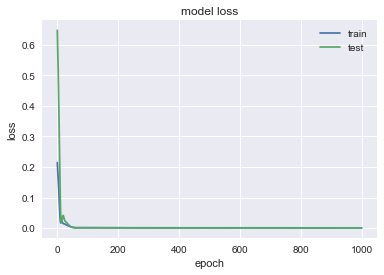

              CBRE
MSE       0.618033
MAE       0.640409
R2         0.93469
MAPE (%)   1.28925


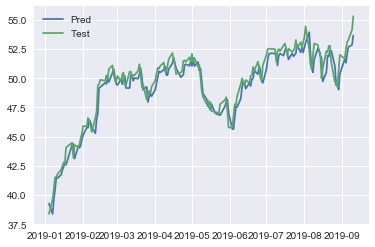

In [185]:
test = df["2019-01-04":].copy()
train = df[:"2019-01-04"].copy()
pred_3 = pd.DataFrame(columns=df.columns,index = test.index)
for comp in companies:
    pred_3[comp] = nn_forec(df,comp,first_layer = 128,second_layer=64).values

Predicting for  T
Train on 1008 samples, validate on 172 samples
Epoch 1/500
0s - loss: 0.3306 - val_loss: 0.0760
Epoch 2/500
0s - loss: 0.2887 - val_loss: 0.0597
Epoch 3/500
0s - loss: 0.2441 - val_loss: 0.0426
Epoch 4/500
0s - loss: 0.1947 - val_loss: 0.0260
Epoch 5/500
0s - loss: 0.1417 - val_loss: 0.0124
Epoch 6/500
0s - loss: 0.0899 - val_loss: 0.0062
Epoch 7/500
0s - loss: 0.0466 - val_loss: 0.0118
Epoch 8/500
0s - loss: 0.0209 - val_loss: 0.0287
Epoch 9/500
0s - loss: 0.0157 - val_loss: 0.0457
Epoch 10/500
0s - loss: 0.0193 - val_loss: 0.0485
Epoch 11/500
0s - loss: 0.0185 - val_loss: 0.0389
Epoch 12/500
0s - loss: 0.0144 - val_loss: 0.0274
Epoch 13/500
0s - loss: 0.0130 - val_loss: 0.0194
Epoch 14/500
0s - loss: 0.0134 - val_loss: 0.0152
Epoch 15/500
0s - loss: 0.0145 - val_loss: 0.0138
Epoch 16/500
0s - loss: 0.0142 - val_loss: 0.0141
Epoch 17/500
0s - loss: 0.0124 - val_loss: 0.0153
Epoch 18/500
0s - loss: 0.0109 - val_loss: 0.0166
Epoch 19/500
0s - loss: 0.0096 - val_loss: 0

0s - loss: 0.0011 - val_loss: 5.9604e-04
Epoch 155/500
0s - loss: 0.0012 - val_loss: 5.9534e-04
Epoch 156/500
0s - loss: 0.0011 - val_loss: 5.9493e-04
Epoch 157/500
0s - loss: 0.0012 - val_loss: 5.9668e-04
Epoch 158/500
0s - loss: 0.0011 - val_loss: 5.9772e-04
Epoch 159/500
0s - loss: 0.0012 - val_loss: 5.9649e-04
Epoch 160/500
0s - loss: 0.0011 - val_loss: 5.9735e-04
Epoch 161/500
0s - loss: 0.0011 - val_loss: 5.9789e-04
Epoch 162/500
0s - loss: 0.0012 - val_loss: 5.9803e-04
Epoch 163/500
0s - loss: 0.0011 - val_loss: 5.9796e-04
Epoch 164/500
0s - loss: 0.0012 - val_loss: 5.9807e-04
Epoch 165/500
0s - loss: 0.0012 - val_loss: 5.9730e-04
Epoch 166/500
0s - loss: 0.0011 - val_loss: 5.9773e-04
Epoch 167/500
0s - loss: 0.0011 - val_loss: 5.9469e-04
Epoch 168/500
0s - loss: 0.0012 - val_loss: 5.9574e-04
Epoch 169/500
0s - loss: 0.0012 - val_loss: 5.9139e-04
Epoch 170/500
0s - loss: 0.0011 - val_loss: 5.9384e-04
Epoch 171/500
0s - loss: 0.0011 - val_loss: 5.8780e-04
Epoch 172/500
0s - loss:

0s - loss: 9.9955e-04 - val_loss: 5.4748e-04
Epoch 304/500
0s - loss: 9.5977e-04 - val_loss: 5.5033e-04
Epoch 305/500
0s - loss: 0.0011 - val_loss: 5.5279e-04
Epoch 306/500
0s - loss: 0.0011 - val_loss: 5.4590e-04
Epoch 307/500
0s - loss: 0.0010 - val_loss: 5.4693e-04
Epoch 308/500
0s - loss: 9.8200e-04 - val_loss: 5.5727e-04
Epoch 309/500
0s - loss: 0.0011 - val_loss: 5.5112e-04
Epoch 310/500
0s - loss: 9.9136e-04 - val_loss: 5.4477e-04
Epoch 311/500
0s - loss: 9.9027e-04 - val_loss: 5.4804e-04
Epoch 312/500
0s - loss: 0.0011 - val_loss: 5.4804e-04
Epoch 313/500
0s - loss: 0.0010 - val_loss: 5.4705e-04
Epoch 314/500
0s - loss: 0.0010 - val_loss: 5.4759e-04
Epoch 315/500
0s - loss: 0.0011 - val_loss: 5.4974e-04
Epoch 316/500
0s - loss: 0.0010 - val_loss: 5.4450e-04
Epoch 317/500
0s - loss: 9.6207e-04 - val_loss: 5.4393e-04
Epoch 318/500
0s - loss: 0.0010 - val_loss: 5.5568e-04
Epoch 319/500
0s - loss: 9.9130e-04 - val_loss: 5.5584e-04
Epoch 320/500
0s - loss: 0.0010 - val_loss: 5.4488e

0s - loss: 9.1456e-04 - val_loss: 5.4088e-04
Epoch 449/500
0s - loss: 9.6987e-04 - val_loss: 5.4170e-04
Epoch 450/500
0s - loss: 0.0010 - val_loss: 5.6558e-04
Epoch 451/500
0s - loss: 0.0011 - val_loss: 5.3808e-04
Epoch 452/500
0s - loss: 9.4264e-04 - val_loss: 5.3990e-04
Epoch 453/500
0s - loss: 9.6072e-04 - val_loss: 5.6566e-04
Epoch 454/500
0s - loss: 9.8881e-04 - val_loss: 5.4098e-04
Epoch 455/500
0s - loss: 0.0010 - val_loss: 5.4306e-04
Epoch 456/500
0s - loss: 9.5406e-04 - val_loss: 5.5495e-04
Epoch 457/500
0s - loss: 9.2981e-04 - val_loss: 5.4773e-04
Epoch 458/500
0s - loss: 9.4930e-04 - val_loss: 5.3813e-04
Epoch 459/500
0s - loss: 9.3204e-04 - val_loss: 5.5201e-04
Epoch 460/500
0s - loss: 9.9489e-04 - val_loss: 5.4860e-04
Epoch 461/500
0s - loss: 0.0010 - val_loss: 5.4419e-04
Epoch 462/500
0s - loss: 9.6142e-04 - val_loss: 5.5298e-04
Epoch 463/500
0s - loss: 0.0010 - val_loss: 5.4364e-04
Epoch 464/500
0s - loss: 0.0010 - val_loss: 5.4612e-04
Epoch 465/500
0s - loss: 9.3449e-04

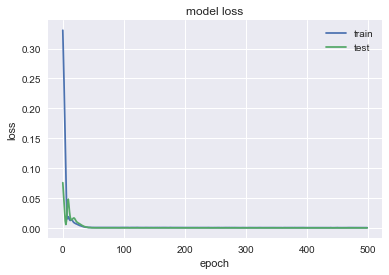

                 T
MSE       0.141634
MAE       0.272035
R2        0.950315
MAPE (%)  0.841369


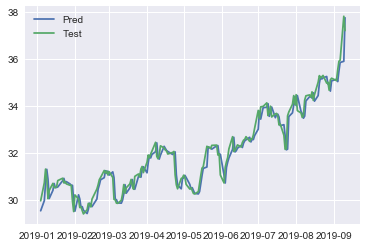

Predicting for  BBY
Train on 1008 samples, validate on 172 samples
Epoch 1/500
0s - loss: 0.2311 - val_loss: 0.4799
Epoch 2/500
0s - loss: 0.2034 - val_loss: 0.4228
Epoch 3/500
0s - loss: 0.1732 - val_loss: 0.3580
Epoch 4/500
0s - loss: 0.1402 - val_loss: 0.2859
Epoch 5/500
0s - loss: 0.1053 - val_loss: 0.2090
Epoch 6/500
0s - loss: 0.0714 - val_loss: 0.1334
Epoch 7/500
0s - loss: 0.0433 - val_loss: 0.0684
Epoch 8/500
0s - loss: 0.0260 - val_loss: 0.0243
Epoch 9/500
0s - loss: 0.0240 - val_loss: 0.0053
Epoch 10/500
0s - loss: 0.0318 - val_loss: 0.0021
Epoch 11/500
0s - loss: 0.0373 - val_loss: 0.0020
Epoch 12/500
0s - loss: 0.0355 - val_loss: 0.0022
Epoch 13/500
0s - loss: 0.0290 - val_loss: 0.0049
Epoch 14/500
0s - loss: 0.0237 - val_loss: 0.0091
Epoch 15/500
0s - loss: 0.0204 - val_loss: 0.0117
Epoch 16/500
0s - loss: 0.0179 - val_loss: 0.0115
Epoch 17/500
0s - loss: 0.0159 - val_loss: 0.0090
Epoch 18/500
0s - loss: 0.0139 - val_loss: 0.0060
Epoch 19/500
0s - loss: 0.0128 - val_loss:

0s - loss: 8.5758e-04 - val_loss: 7.7141e-04
Epoch 146/500
0s - loss: 7.6898e-04 - val_loss: 7.3838e-04
Epoch 147/500
0s - loss: 7.9130e-04 - val_loss: 7.1972e-04
Epoch 148/500
0s - loss: 7.9698e-04 - val_loss: 7.3026e-04
Epoch 149/500
0s - loss: 7.3301e-04 - val_loss: 7.4561e-04
Epoch 150/500
0s - loss: 7.7471e-04 - val_loss: 7.3103e-04
Epoch 151/500
0s - loss: 8.0759e-04 - val_loss: 7.0688e-04
Epoch 152/500
0s - loss: 6.9399e-04 - val_loss: 7.0965e-04
Epoch 153/500
0s - loss: 7.6370e-04 - val_loss: 7.1649e-04
Epoch 154/500
0s - loss: 7.7017e-04 - val_loss: 7.1795e-04
Epoch 155/500
0s - loss: 7.0866e-04 - val_loss: 7.1390e-04
Epoch 156/500
0s - loss: 6.8610e-04 - val_loss: 7.0501e-04
Epoch 157/500
0s - loss: 7.9898e-04 - val_loss: 7.0465e-04
Epoch 158/500
0s - loss: 7.2677e-04 - val_loss: 7.1582e-04
Epoch 159/500
0s - loss: 7.8700e-04 - val_loss: 7.1750e-04
Epoch 160/500
0s - loss: 7.6781e-04 - val_loss: 7.3312e-04
Epoch 161/500
0s - loss: 7.6358e-04 - val_loss: 7.3372e-04
Epoch 162/5

0s - loss: 6.5924e-04 - val_loss: 6.2675e-04
Epoch 285/500
0s - loss: 6.4286e-04 - val_loss: 6.0614e-04
Epoch 286/500
0s - loss: 6.4996e-04 - val_loss: 6.1077e-04
Epoch 287/500
0s - loss: 6.7451e-04 - val_loss: 6.4672e-04
Epoch 288/500
0s - loss: 6.2528e-04 - val_loss: 6.2519e-04
Epoch 289/500
0s - loss: 6.9753e-04 - val_loss: 6.0873e-04
Epoch 290/500
0s - loss: 6.6992e-04 - val_loss: 6.3284e-04
Epoch 291/500
0s - loss: 7.1915e-04 - val_loss: 6.3109e-04
Epoch 292/500
0s - loss: 6.1319e-04 - val_loss: 6.0806e-04
Epoch 293/500
0s - loss: 6.6386e-04 - val_loss: 6.2267e-04
Epoch 294/500
0s - loss: 6.8565e-04 - val_loss: 6.1509e-04
Epoch 295/500
0s - loss: 6.3795e-04 - val_loss: 6.0421e-04
Epoch 296/500
0s - loss: 6.7392e-04 - val_loss: 6.2009e-04
Epoch 297/500
0s - loss: 6.9334e-04 - val_loss: 6.5910e-04
Epoch 298/500
0s - loss: 6.5056e-04 - val_loss: 6.0506e-04
Epoch 299/500
0s - loss: 6.4942e-04 - val_loss: 6.0546e-04
Epoch 300/500
0s - loss: 6.8996e-04 - val_loss: 6.4318e-04
Epoch 301/5

0s - loss: 6.4461e-04 - val_loss: 5.9927e-04
Epoch 424/500
0s - loss: 6.5310e-04 - val_loss: 6.1346e-04
Epoch 425/500
0s - loss: 6.3195e-04 - val_loss: 5.8892e-04
Epoch 426/500
0s - loss: 6.4711e-04 - val_loss: 5.9281e-04
Epoch 427/500
0s - loss: 6.8980e-04 - val_loss: 6.1303e-04
Epoch 428/500
0s - loss: 6.1110e-04 - val_loss: 5.9110e-04
Epoch 429/500
0s - loss: 6.5050e-04 - val_loss: 6.0971e-04
Epoch 430/500
0s - loss: 6.4466e-04 - val_loss: 6.4435e-04
Epoch 431/500
0s - loss: 5.5632e-04 - val_loss: 5.9202e-04
Epoch 432/500
0s - loss: 7.2519e-04 - val_loss: 5.9222e-04
Epoch 433/500
0s - loss: 6.2472e-04 - val_loss: 6.1811e-04
Epoch 434/500
0s - loss: 6.3910e-04 - val_loss: 5.9748e-04
Epoch 435/500
0s - loss: 6.4642e-04 - val_loss: 5.9316e-04
Epoch 436/500
0s - loss: 6.1699e-04 - val_loss: 6.2886e-04
Epoch 437/500
0s - loss: 6.6042e-04 - val_loss: 6.0656e-04
Epoch 438/500
0s - loss: 5.6786e-04 - val_loss: 5.9052e-04
Epoch 439/500
0s - loss: 6.4105e-04 - val_loss: 6.0894e-04
Epoch 440/5

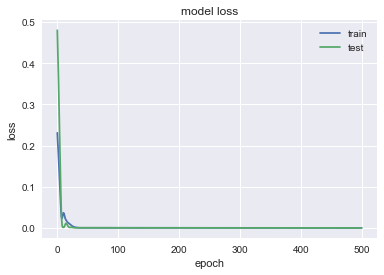

               BBY
MSE        1.96761
MAE       0.925133
R2        0.942936
MAPE (%)   1.37905


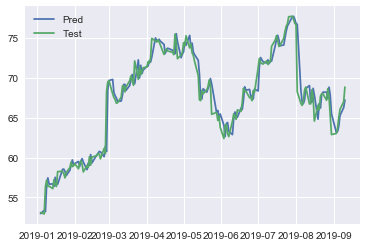

Predicting for  KO
Train on 1008 samples, validate on 172 samples
Epoch 1/500
0s - loss: 0.1101 - val_loss: 0.3911
Epoch 2/500
0s - loss: 0.0885 - val_loss: 0.3307
Epoch 3/500
0s - loss: 0.0667 - val_loss: 0.2642
Epoch 4/500
0s - loss: 0.0442 - val_loss: 0.1924
Epoch 5/500
0s - loss: 0.0237 - val_loss: 0.1215
Epoch 6/500
0s - loss: 0.0096 - val_loss: 0.0629
Epoch 7/500
0s - loss: 0.0063 - val_loss: 0.0283
Epoch 8/500
0s - loss: 0.0123 - val_loss: 0.0167
Epoch 9/500
0s - loss: 0.0164 - val_loss: 0.0177
Epoch 10/500
0s - loss: 0.0144 - val_loss: 0.0263
Epoch 11/500
0s - loss: 0.0104 - val_loss: 0.0379
Epoch 12/500
0s - loss: 0.0082 - val_loss: 0.0464
Epoch 13/500
0s - loss: 0.0074 - val_loss: 0.0483
Epoch 14/500
0s - loss: 0.0067 - val_loss: 0.0443
Epoch 15/500
0s - loss: 0.0062 - val_loss: 0.0373
Epoch 16/500
0s - loss: 0.0061 - val_loss: 0.0302
Epoch 17/500
0s - loss: 0.0061 - val_loss: 0.0250
Epoch 18/500
0s - loss: 0.0064 - val_loss: 0.0223
Epoch 19/500
0s - loss: 0.0061 - val_loss: 

0s - loss: 6.4605e-04 - val_loss: 9.6945e-04
Epoch 153/500
0s - loss: 6.4430e-04 - val_loss: 8.9741e-04
Epoch 154/500
0s - loss: 6.4731e-04 - val_loss: 9.2159e-04
Epoch 155/500
0s - loss: 6.3756e-04 - val_loss: 0.0010
Epoch 156/500
0s - loss: 6.3859e-04 - val_loss: 9.5994e-04
Epoch 157/500
0s - loss: 6.6763e-04 - val_loss: 9.1442e-04
Epoch 158/500
0s - loss: 6.1956e-04 - val_loss: 9.6533e-04
Epoch 159/500
0s - loss: 6.3528e-04 - val_loss: 0.0010
Epoch 160/500
0s - loss: 6.6735e-04 - val_loss: 9.3000e-04
Epoch 161/500
0s - loss: 6.2178e-04 - val_loss: 9.1093e-04
Epoch 162/500
0s - loss: 6.2549e-04 - val_loss: 9.5150e-04
Epoch 163/500
0s - loss: 6.7692e-04 - val_loss: 9.5220e-04
Epoch 164/500
0s - loss: 6.4959e-04 - val_loss: 9.2966e-04
Epoch 165/500
0s - loss: 6.1479e-04 - val_loss: 9.1508e-04
Epoch 166/500
0s - loss: 6.1569e-04 - val_loss: 9.4661e-04
Epoch 167/500
0s - loss: 6.2454e-04 - val_loss: 9.3832e-04
Epoch 168/500
0s - loss: 6.2581e-04 - val_loss: 9.0647e-04
Epoch 169/500
0s - 

0s - loss: 5.8560e-04 - val_loss: 7.4227e-04
Epoch 292/500
0s - loss: 6.0875e-04 - val_loss: 7.2820e-04
Epoch 293/500
0s - loss: 6.3394e-04 - val_loss: 7.2951e-04
Epoch 294/500
0s - loss: 5.9900e-04 - val_loss: 7.3307e-04
Epoch 295/500
0s - loss: 6.0463e-04 - val_loss: 7.2950e-04
Epoch 296/500
0s - loss: 6.0701e-04 - val_loss: 7.3492e-04
Epoch 297/500
0s - loss: 5.8470e-04 - val_loss: 7.3872e-04
Epoch 298/500
0s - loss: 5.9456e-04 - val_loss: 7.2441e-04
Epoch 299/500
0s - loss: 6.3366e-04 - val_loss: 7.4094e-04
Epoch 300/500
0s - loss: 6.0648e-04 - val_loss: 7.2410e-04
Epoch 301/500
0s - loss: 5.9898e-04 - val_loss: 7.2505e-04
Epoch 302/500
0s - loss: 6.0940e-04 - val_loss: 7.4790e-04
Epoch 303/500
0s - loss: 5.9518e-04 - val_loss: 7.3825e-04
Epoch 304/500
0s - loss: 5.9148e-04 - val_loss: 7.2433e-04
Epoch 305/500
0s - loss: 5.9063e-04 - val_loss: 7.2920e-04
Epoch 306/500
0s - loss: 5.9190e-04 - val_loss: 7.2962e-04
Epoch 307/500
0s - loss: 5.5683e-04 - val_loss: 7.2465e-04
Epoch 308/5

0s - loss: 6.1367e-04 - val_loss: 7.6799e-04
Epoch 431/500
0s - loss: 6.1090e-04 - val_loss: 7.2221e-04
Epoch 432/500
0s - loss: 6.1743e-04 - val_loss: 7.7957e-04
Epoch 433/500
0s - loss: 5.7528e-04 - val_loss: 7.4374e-04
Epoch 434/500
0s - loss: 6.1939e-04 - val_loss: 7.3190e-04
Epoch 435/500
0s - loss: 5.8476e-04 - val_loss: 7.9363e-04
Epoch 436/500
0s - loss: 6.1251e-04 - val_loss: 7.5662e-04
Epoch 437/500
0s - loss: 5.8539e-04 - val_loss: 7.6697e-04
Epoch 438/500
0s - loss: 5.8318e-04 - val_loss: 7.4382e-04
Epoch 439/500
0s - loss: 6.0502e-04 - val_loss: 7.7735e-04
Epoch 440/500
0s - loss: 5.9434e-04 - val_loss: 7.6317e-04
Epoch 441/500
0s - loss: 6.0905e-04 - val_loss: 7.2413e-04
Epoch 442/500
0s - loss: 6.0186e-04 - val_loss: 8.4122e-04
Epoch 443/500
0s - loss: 5.9201e-04 - val_loss: 7.3472e-04
Epoch 444/500
0s - loss: 6.3224e-04 - val_loss: 8.1398e-04
Epoch 445/500
0s - loss: 5.8287e-04 - val_loss: 8.7089e-04
Epoch 446/500
0s - loss: 6.1354e-04 - val_loss: 7.2921e-04
Epoch 447/5

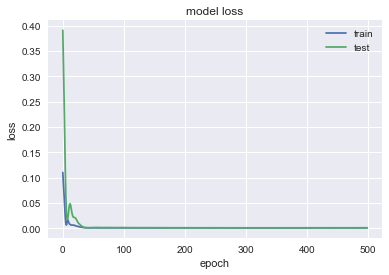

                KO
MSE       0.276735
MAE        0.38389
R2        0.967375
MAPE (%)  0.768207


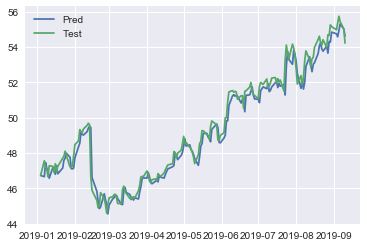

Predicting for  FTI
Train on 1008 samples, validate on 172 samples
Epoch 1/500
0s - loss: 0.2113 - val_loss: 0.0246
Epoch 2/500
0s - loss: 0.1763 - val_loss: 0.0156
Epoch 3/500
0s - loss: 0.1401 - val_loss: 0.0076
Epoch 4/500
0s - loss: 0.1022 - val_loss: 0.0023
Epoch 5/500
0s - loss: 0.0647 - val_loss: 0.0030
Epoch 6/500
0s - loss: 0.0330 - val_loss: 0.0132
Epoch 7/500
0s - loss: 0.0155 - val_loss: 0.0319
Epoch 8/500
0s - loss: 0.0136 - val_loss: 0.0464
Epoch 9/500
0s - loss: 0.0157 - val_loss: 0.0446
Epoch 10/500
0s - loss: 0.0128 - val_loss: 0.0329
Epoch 11/500
0s - loss: 0.0088 - val_loss: 0.0222
Epoch 12/500
0s - loss: 0.0088 - val_loss: 0.0160
Epoch 13/500
0s - loss: 0.0095 - val_loss: 0.0135
Epoch 14/500
0s - loss: 0.0101 - val_loss: 0.0135
Epoch 15/500
0s - loss: 0.0092 - val_loss: 0.0149
Epoch 16/500
0s - loss: 0.0082 - val_loss: 0.0165
Epoch 17/500
0s - loss: 0.0073 - val_loss: 0.0174
Epoch 18/500
0s - loss: 0.0064 - val_loss: 0.0168
Epoch 19/500
0s - loss: 0.0060 - val_loss:

0s - loss: 9.5355e-04 - val_loss: 3.5637e-04
Epoch 149/500
0s - loss: 9.3265e-04 - val_loss: 3.6088e-04
Epoch 150/500
0s - loss: 9.4080e-04 - val_loss: 3.7037e-04
Epoch 151/500
0s - loss: 8.8285e-04 - val_loss: 3.4992e-04
Epoch 152/500
0s - loss: 9.3770e-04 - val_loss: 3.5765e-04
Epoch 153/500
0s - loss: 9.5175e-04 - val_loss: 3.4559e-04
Epoch 154/500
0s - loss: 9.3613e-04 - val_loss: 3.3184e-04
Epoch 155/500
0s - loss: 9.3342e-04 - val_loss: 3.4181e-04
Epoch 156/500
0s - loss: 9.4540e-04 - val_loss: 3.5185e-04
Epoch 157/500
0s - loss: 8.7614e-04 - val_loss: 3.4306e-04
Epoch 158/500
0s - loss: 0.0010 - val_loss: 3.4295e-04
Epoch 159/500
0s - loss: 9.3036e-04 - val_loss: 3.5503e-04
Epoch 160/500
0s - loss: 8.6398e-04 - val_loss: 3.5366e-04
Epoch 161/500
0s - loss: 9.5276e-04 - val_loss: 3.4755e-04
Epoch 162/500
0s - loss: 9.6489e-04 - val_loss: 3.4919e-04
Epoch 163/500
0s - loss: 8.8230e-04 - val_loss: 3.4628e-04
Epoch 164/500
0s - loss: 9.4489e-04 - val_loss: 3.4146e-04
Epoch 165/500
0

0s - loss: 8.3569e-04 - val_loss: 3.3258e-04
Epoch 288/500
0s - loss: 9.0590e-04 - val_loss: 3.3630e-04
Epoch 289/500
0s - loss: 8.8425e-04 - val_loss: 3.3326e-04
Epoch 290/500
0s - loss: 8.9558e-04 - val_loss: 3.3233e-04
Epoch 291/500
0s - loss: 8.9739e-04 - val_loss: 3.4077e-04
Epoch 292/500
0s - loss: 9.6361e-04 - val_loss: 3.3123e-04
Epoch 293/500
0s - loss: 8.2710e-04 - val_loss: 3.3280e-04
Epoch 294/500
0s - loss: 8.4721e-04 - val_loss: 3.3194e-04
Epoch 295/500
0s - loss: 7.7281e-04 - val_loss: 3.3123e-04
Epoch 296/500
0s - loss: 8.3942e-04 - val_loss: 3.3121e-04
Epoch 297/500
0s - loss: 8.0795e-04 - val_loss: 3.3146e-04
Epoch 298/500
0s - loss: 8.5708e-04 - val_loss: 3.3142e-04
Epoch 299/500
0s - loss: 8.5898e-04 - val_loss: 3.3177e-04
Epoch 300/500
0s - loss: 9.0040e-04 - val_loss: 3.3195e-04
Epoch 301/500
0s - loss: 8.5296e-04 - val_loss: 3.3286e-04
Epoch 302/500
0s - loss: 9.0099e-04 - val_loss: 3.3781e-04
Epoch 303/500
0s - loss: 9.0298e-04 - val_loss: 3.3310e-04
Epoch 304/5

0s - loss: 8.5225e-04 - val_loss: 3.3925e-04
Epoch 427/500
0s - loss: 7.9064e-04 - val_loss: 3.4383e-04
Epoch 428/500
0s - loss: 8.2685e-04 - val_loss: 3.4104e-04
Epoch 429/500
0s - loss: 7.9532e-04 - val_loss: 3.3878e-04
Epoch 430/500
0s - loss: 8.0306e-04 - val_loss: 3.4354e-04
Epoch 431/500
0s - loss: 8.1756e-04 - val_loss: 3.4080e-04
Epoch 432/500
0s - loss: 7.6016e-04 - val_loss: 3.4243e-04
Epoch 433/500
0s - loss: 7.9244e-04 - val_loss: 3.3986e-04
Epoch 434/500
0s - loss: 8.3632e-04 - val_loss: 3.4805e-04
Epoch 435/500
0s - loss: 8.5349e-04 - val_loss: 3.4314e-04
Epoch 436/500
0s - loss: 8.4113e-04 - val_loss: 3.3933e-04
Epoch 437/500
0s - loss: 8.1297e-04 - val_loss: 3.5019e-04
Epoch 438/500
0s - loss: 8.3433e-04 - val_loss: 3.4188e-04
Epoch 439/500
0s - loss: 8.5386e-04 - val_loss: 3.4734e-04
Epoch 440/500
0s - loss: 7.7398e-04 - val_loss: 3.3927e-04
Epoch 441/500
0s - loss: 8.2177e-04 - val_loss: 3.4259e-04
Epoch 442/500
0s - loss: 8.0213e-04 - val_loss: 3.3739e-04
Epoch 443/5

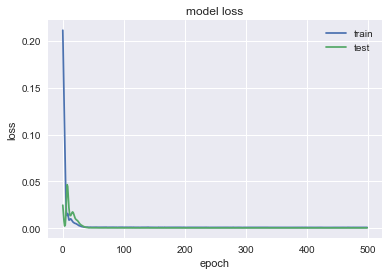

               FTI
MSE       0.288283
MAE       0.435996
R2        0.870615
MAPE (%)   1.82985


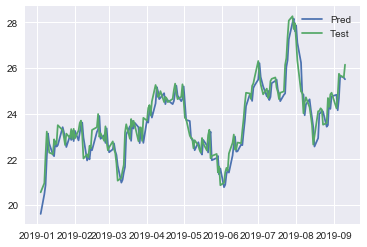

Predicting for  BLK
Train on 1008 samples, validate on 172 samples
Epoch 1/500
0s - loss: 0.1860 - val_loss: 0.2168
Epoch 2/500
0s - loss: 0.1587 - val_loss: 0.1805
Epoch 3/500
0s - loss: 0.1296 - val_loss: 0.1409
Epoch 4/500
0s - loss: 0.0990 - val_loss: 0.0995
Epoch 5/500
0s - loss: 0.0683 - val_loss: 0.0595
Epoch 6/500
0s - loss: 0.0413 - val_loss: 0.0267
Epoch 7/500
0s - loss: 0.0235 - val_loss: 0.0071
Epoch 8/500
0s - loss: 0.0180 - val_loss: 0.0020
Epoch 9/500
0s - loss: 0.0220 - val_loss: 0.0036
Epoch 10/500
0s - loss: 0.0255 - val_loss: 0.0036
Epoch 11/500
0s - loss: 0.0242 - val_loss: 0.0020
Epoch 12/500
0s - loss: 0.0205 - val_loss: 0.0018
Epoch 13/500
0s - loss: 0.0178 - val_loss: 0.0030
Epoch 14/500
0s - loss: 0.0164 - val_loss: 0.0040
Epoch 15/500
0s - loss: 0.0150 - val_loss: 0.0039
Epoch 16/500
0s - loss: 0.0133 - val_loss: 0.0031
Epoch 17/500
0s - loss: 0.0117 - val_loss: 0.0021
Epoch 18/500
0s - loss: 0.0108 - val_loss: 0.0014
Epoch 19/500
0s - loss: 0.0098 - val_loss:

0s - loss: 7.1138e-04 - val_loss: 4.1984e-04
Epoch 145/500
0s - loss: 6.9531e-04 - val_loss: 4.5953e-04
Epoch 146/500
0s - loss: 7.1345e-04 - val_loss: 4.2464e-04
Epoch 147/500
0s - loss: 6.3877e-04 - val_loss: 3.8247e-04
Epoch 148/500
0s - loss: 7.1513e-04 - val_loss: 3.7908e-04
Epoch 149/500
0s - loss: 7.2004e-04 - val_loss: 3.9317e-04
Epoch 150/500
0s - loss: 7.6505e-04 - val_loss: 4.1600e-04
Epoch 151/500
0s - loss: 7.4903e-04 - val_loss: 4.0872e-04
Epoch 152/500
0s - loss: 7.2853e-04 - val_loss: 3.8720e-04
Epoch 153/500
0s - loss: 7.0741e-04 - val_loss: 3.7760e-04
Epoch 154/500
0s - loss: 6.7891e-04 - val_loss: 3.7892e-04
Epoch 155/500
0s - loss: 6.9779e-04 - val_loss: 3.8148e-04
Epoch 156/500
0s - loss: 7.1549e-04 - val_loss: 4.0442e-04
Epoch 157/500
0s - loss: 6.7671e-04 - val_loss: 4.1413e-04
Epoch 158/500
0s - loss: 7.3952e-04 - val_loss: 3.9953e-04
Epoch 159/500
0s - loss: 7.4277e-04 - val_loss: 3.7296e-04
Epoch 160/500
0s - loss: 7.1753e-04 - val_loss: 3.7197e-04
Epoch 161/5

0s - loss: 5.9478e-04 - val_loss: 3.3809e-04
Epoch 284/500
0s - loss: 5.9152e-04 - val_loss: 3.3026e-04
Epoch 285/500
0s - loss: 6.1119e-04 - val_loss: 3.4056e-04
Epoch 286/500
0s - loss: 6.4913e-04 - val_loss: 3.4852e-04
Epoch 287/500
0s - loss: 6.4819e-04 - val_loss: 3.2941e-04
Epoch 288/500
0s - loss: 6.2305e-04 - val_loss: 3.2596e-04
Epoch 289/500
0s - loss: 6.1353e-04 - val_loss: 3.4113e-04
Epoch 290/500
0s - loss: 6.0246e-04 - val_loss: 3.2676e-04
Epoch 291/500
0s - loss: 6.0421e-04 - val_loss: 3.2881e-04
Epoch 292/500
0s - loss: 5.9871e-04 - val_loss: 3.3125e-04
Epoch 293/500
0s - loss: 5.7371e-04 - val_loss: 3.2891e-04
Epoch 294/500
0s - loss: 5.8017e-04 - val_loss: 3.3233e-04
Epoch 295/500
0s - loss: 6.5707e-04 - val_loss: 3.4013e-04
Epoch 296/500
0s - loss: 6.5357e-04 - val_loss: 3.4793e-04
Epoch 297/500
0s - loss: 6.2325e-04 - val_loss: 3.2935e-04
Epoch 298/500
0s - loss: 6.1176e-04 - val_loss: 3.2086e-04
Epoch 299/500
0s - loss: 6.4356e-04 - val_loss: 3.3856e-04
Epoch 300/5

0s - loss: 6.3247e-04 - val_loss: 3.2106e-04
Epoch 423/500
0s - loss: 6.1327e-04 - val_loss: 3.2035e-04
Epoch 424/500
0s - loss: 5.6436e-04 - val_loss: 3.2771e-04
Epoch 425/500
0s - loss: 6.0826e-04 - val_loss: 3.2893e-04
Epoch 426/500
0s - loss: 6.1929e-04 - val_loss: 3.2114e-04
Epoch 427/500
0s - loss: 5.8985e-04 - val_loss: 3.2629e-04
Epoch 428/500
0s - loss: 5.3868e-04 - val_loss: 3.3934e-04
Epoch 429/500
0s - loss: 6.0547e-04 - val_loss: 3.2028e-04
Epoch 430/500
0s - loss: 6.0019e-04 - val_loss: 3.2273e-04
Epoch 431/500
0s - loss: 6.7364e-04 - val_loss: 3.3919e-04
Epoch 432/500
0s - loss: 6.1614e-04 - val_loss: 3.2629e-04
Epoch 433/500
0s - loss: 6.2737e-04 - val_loss: 3.2107e-04
Epoch 434/500
0s - loss: 6.1867e-04 - val_loss: 3.2133e-04
Epoch 435/500
0s - loss: 5.7976e-04 - val_loss: 3.2287e-04
Epoch 436/500
0s - loss: 5.2562e-04 - val_loss: 3.2515e-04
Epoch 437/500
0s - loss: 5.2479e-04 - val_loss: 3.2124e-04
Epoch 438/500
0s - loss: 6.1411e-04 - val_loss: 3.2568e-04
Epoch 439/5

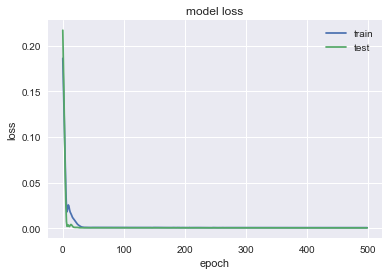

               BLK
MSE        30.1165
MAE        4.30231
R2        0.948503
MAPE (%)  0.980776


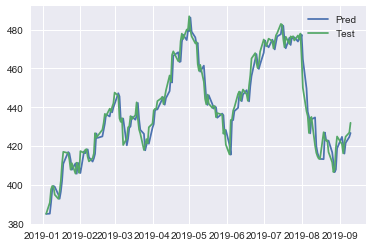

Predicting for  DVA
Train on 1008 samples, validate on 172 samples
Epoch 1/500
0s - loss: 0.4102 - val_loss: 0.0643
Epoch 2/500
0s - loss: 0.3549 - val_loss: 0.0480
Epoch 3/500
0s - loss: 0.2953 - val_loss: 0.0311
Epoch 4/500
0s - loss: 0.2274 - val_loss: 0.0153
Epoch 5/500
0s - loss: 0.1547 - val_loss: 0.0051
Epoch 6/500
0s - loss: 0.0840 - val_loss: 0.0075
Epoch 7/500
0s - loss: 0.0315 - val_loss: 0.0291
Epoch 8/500
0s - loss: 0.0120 - val_loss: 0.0628
Epoch 9/500
0s - loss: 0.0210 - val_loss: 0.0774
Epoch 10/500
0s - loss: 0.0226 - val_loss: 0.0634
Epoch 11/500
0s - loss: 0.0126 - val_loss: 0.0427
Epoch 12/500
0s - loss: 0.0071 - val_loss: 0.0291
Epoch 13/500
0s - loss: 0.0085 - val_loss: 0.0232
Epoch 14/500
0s - loss: 0.0105 - val_loss: 0.0226
Epoch 15/500
0s - loss: 0.0104 - val_loss: 0.0253
Epoch 16/500
0s - loss: 0.0088 - val_loss: 0.0297
Epoch 17/500
0s - loss: 0.0076 - val_loss: 0.0335
Epoch 18/500
0s - loss: 0.0075 - val_loss: 0.0347
Epoch 19/500
0s - loss: 0.0071 - val_loss:

0s - loss: 0.0013 - val_loss: 9.7572e-04
Epoch 164/500
0s - loss: 0.0013 - val_loss: 9.5921e-04
Epoch 165/500
0s - loss: 0.0012 - val_loss: 0.0011
Epoch 166/500
0s - loss: 0.0012 - val_loss: 0.0011
Epoch 167/500
0s - loss: 0.0012 - val_loss: 9.9944e-04
Epoch 168/500
0s - loss: 0.0012 - val_loss: 9.9411e-04
Epoch 169/500
0s - loss: 0.0012 - val_loss: 0.0010
Epoch 170/500
0s - loss: 0.0012 - val_loss: 0.0010
Epoch 171/500
0s - loss: 0.0013 - val_loss: 0.0010
Epoch 172/500
0s - loss: 0.0012 - val_loss: 9.9521e-04
Epoch 173/500
0s - loss: 0.0013 - val_loss: 9.9856e-04
Epoch 174/500
0s - loss: 0.0013 - val_loss: 0.0010
Epoch 175/500
0s - loss: 0.0012 - val_loss: 0.0010
Epoch 176/500
0s - loss: 0.0012 - val_loss: 9.5813e-04
Epoch 177/500
0s - loss: 0.0012 - val_loss: 9.7435e-04
Epoch 178/500
0s - loss: 0.0012 - val_loss: 0.0010
Epoch 179/500
0s - loss: 0.0012 - val_loss: 0.0010
Epoch 180/500
0s - loss: 0.0012 - val_loss: 9.8536e-04
Epoch 181/500
0s - loss: 0.0012 - val_loss: 9.9274e-04
Epoch

0s - loss: 0.0011 - val_loss: 8.2122e-04
Epoch 314/500
0s - loss: 0.0012 - val_loss: 7.4632e-04
Epoch 315/500
0s - loss: 0.0011 - val_loss: 8.2982e-04
Epoch 316/500
0s - loss: 0.0011 - val_loss: 8.1860e-04
Epoch 317/500
0s - loss: 0.0011 - val_loss: 7.5156e-04
Epoch 318/500
0s - loss: 0.0012 - val_loss: 8.4276e-04
Epoch 319/500
0s - loss: 0.0012 - val_loss: 8.1963e-04
Epoch 320/500
0s - loss: 0.0012 - val_loss: 7.5454e-04
Epoch 321/500
0s - loss: 0.0012 - val_loss: 8.0192e-04
Epoch 322/500
0s - loss: 0.0011 - val_loss: 7.8122e-04
Epoch 323/500
0s - loss: 0.0011 - val_loss: 7.8383e-04
Epoch 324/500
0s - loss: 0.0011 - val_loss: 7.4710e-04
Epoch 325/500
0s - loss: 0.0011 - val_loss: 7.9195e-04
Epoch 326/500
0s - loss: 0.0011 - val_loss: 7.5045e-04
Epoch 327/500
0s - loss: 0.0011 - val_loss: 7.6945e-04
Epoch 328/500
0s - loss: 0.0011 - val_loss: 7.7317e-04
Epoch 329/500
0s - loss: 0.0011 - val_loss: 7.4235e-04
Epoch 330/500
0s - loss: 0.0011 - val_loss: 7.6503e-04
Epoch 331/500
0s - loss:

0s - loss: 0.0011 - val_loss: 6.9893e-04
Epoch 463/500
0s - loss: 0.0010 - val_loss: 7.0191e-04
Epoch 464/500
0s - loss: 0.0011 - val_loss: 6.9739e-04
Epoch 465/500
0s - loss: 0.0010 - val_loss: 6.9969e-04
Epoch 466/500
0s - loss: 0.0011 - val_loss: 6.9759e-04
Epoch 467/500
0s - loss: 0.0010 - val_loss: 7.0091e-04
Epoch 468/500
0s - loss: 0.0011 - val_loss: 6.9771e-04
Epoch 469/500
0s - loss: 0.0010 - val_loss: 7.0207e-04
Epoch 470/500
0s - loss: 0.0010 - val_loss: 6.9789e-04
Epoch 471/500
0s - loss: 0.0010 - val_loss: 6.9908e-04
Epoch 472/500
0s - loss: 0.0011 - val_loss: 6.9927e-04
Epoch 473/500
0s - loss: 0.0010 - val_loss: 6.9742e-04
Epoch 474/500
0s - loss: 0.0011 - val_loss: 7.1042e-04
Epoch 475/500
0s - loss: 0.0011 - val_loss: 6.9883e-04
Epoch 476/500
0s - loss: 0.0011 - val_loss: 7.1175e-04
Epoch 477/500
0s - loss: 0.0011 - val_loss: 6.9718e-04
Epoch 478/500
0s - loss: 9.9335e-04 - val_loss: 7.0353e-04
Epoch 479/500
0s - loss: 0.0011 - val_loss: 6.9768e-04
Epoch 480/500
0s - l

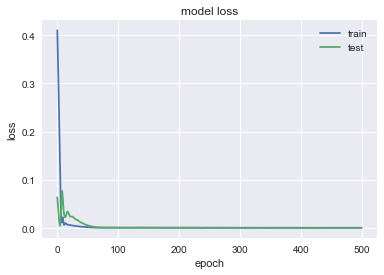

               DVA
MSE        1.21266
MAE       0.784972
R2        0.906371
MAPE (%)   1.45281


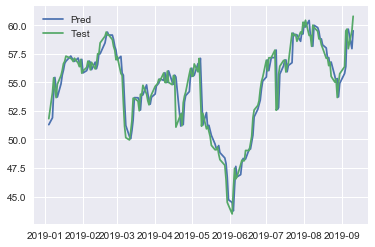

Predicting for  BA
Train on 1008 samples, validate on 172 samples
Epoch 1/500
0s - loss: 0.1490 - val_loss: 0.5376
Epoch 2/500
0s - loss: 0.1300 - val_loss: 0.4780
Epoch 3/500
0s - loss: 0.1107 - val_loss: 0.4120
Epoch 4/500
0s - loss: 0.0900 - val_loss: 0.3393
Epoch 5/500
0s - loss: 0.0691 - val_loss: 0.2616
Epoch 6/500
0s - loss: 0.0493 - val_loss: 0.1838
Epoch 7/500
0s - loss: 0.0340 - val_loss: 0.1135
Epoch 8/500
0s - loss: 0.0260 - val_loss: 0.0594
Epoch 9/500
0s - loss: 0.0258 - val_loss: 0.0266
Epoch 10/500
0s - loss: 0.0303 - val_loss: 0.0122
Epoch 11/500
0s - loss: 0.0339 - val_loss: 0.0083
Epoch 12/500
0s - loss: 0.0324 - val_loss: 0.0096
Epoch 13/500
0s - loss: 0.0279 - val_loss: 0.0138
Epoch 14/500
0s - loss: 0.0232 - val_loss: 0.0185
Epoch 15/500
0s - loss: 0.0190 - val_loss: 0.0213
Epoch 16/500
0s - loss: 0.0160 - val_loss: 0.0207
Epoch 17/500
0s - loss: 0.0136 - val_loss: 0.0173
Epoch 18/500
0s - loss: 0.0115 - val_loss: 0.0125
Epoch 19/500
0s - loss: 0.0097 - val_loss: 

0s - loss: 4.5870e-04 - val_loss: 5.8143e-04
Epoch 145/500
0s - loss: 4.2653e-04 - val_loss: 5.3517e-04
Epoch 146/500
0s - loss: 4.8764e-04 - val_loss: 5.3142e-04
Epoch 147/500
0s - loss: 4.5397e-04 - val_loss: 5.6204e-04
Epoch 148/500
0s - loss: 4.5861e-04 - val_loss: 6.3803e-04
Epoch 149/500
0s - loss: 4.4632e-04 - val_loss: 5.7152e-04
Epoch 150/500
0s - loss: 4.7357e-04 - val_loss: 5.3258e-04
Epoch 151/500
0s - loss: 4.2069e-04 - val_loss: 5.6466e-04
Epoch 152/500
0s - loss: 4.5682e-04 - val_loss: 6.2906e-04
Epoch 153/500
0s - loss: 4.4679e-04 - val_loss: 6.0576e-04
Epoch 154/500
0s - loss: 3.7376e-04 - val_loss: 5.3566e-04
Epoch 155/500
0s - loss: 4.1345e-04 - val_loss: 5.3513e-04
Epoch 156/500
0s - loss: 4.2426e-04 - val_loss: 5.8317e-04
Epoch 157/500
0s - loss: 4.3304e-04 - val_loss: 5.9239e-04
Epoch 158/500
0s - loss: 4.0203e-04 - val_loss: 5.3252e-04
Epoch 159/500
0s - loss: 4.0207e-04 - val_loss: 5.3442e-04
Epoch 160/500
0s - loss: 4.2329e-04 - val_loss: 5.6860e-04
Epoch 161/5

0s - loss: 3.4692e-04 - val_loss: 4.5156e-04
Epoch 284/500
0s - loss: 3.9762e-04 - val_loss: 4.3743e-04
Epoch 285/500
0s - loss: 3.6967e-04 - val_loss: 4.3735e-04
Epoch 286/500
0s - loss: 4.0825e-04 - val_loss: 4.3569e-04
Epoch 287/500
0s - loss: 4.1173e-04 - val_loss: 4.3916e-04
Epoch 288/500
0s - loss: 3.5704e-04 - val_loss: 4.3839e-04
Epoch 289/500
0s - loss: 3.8421e-04 - val_loss: 4.3463e-04
Epoch 290/500
0s - loss: 3.3681e-04 - val_loss: 4.3442e-04
Epoch 291/500
0s - loss: 3.8299e-04 - val_loss: 4.3443e-04
Epoch 292/500
0s - loss: 3.6452e-04 - val_loss: 4.3551e-04
Epoch 293/500
0s - loss: 3.5093e-04 - val_loss: 4.5082e-04
Epoch 294/500
0s - loss: 3.6108e-04 - val_loss: 4.3899e-04
Epoch 295/500
0s - loss: 3.8389e-04 - val_loss: 4.3852e-04
Epoch 296/500
0s - loss: 3.6890e-04 - val_loss: 4.3314e-04
Epoch 297/500
0s - loss: 3.6815e-04 - val_loss: 4.4823e-04
Epoch 298/500
0s - loss: 3.5214e-04 - val_loss: 4.3330e-04
Epoch 299/500
0s - loss: 3.6584e-04 - val_loss: 4.3205e-04
Epoch 300/5

0s - loss: 2.9102e-04 - val_loss: 4.1833e-04
Epoch 423/500
0s - loss: 3.4388e-04 - val_loss: 4.1860e-04
Epoch 424/500
0s - loss: 3.6756e-04 - val_loss: 4.6496e-04
Epoch 425/500
0s - loss: 3.4942e-04 - val_loss: 4.7265e-04
Epoch 426/500
0s - loss: 3.2132e-04 - val_loss: 4.2503e-04
Epoch 427/500
0s - loss: 3.1112e-04 - val_loss: 4.6393e-04
Epoch 428/500
0s - loss: 3.1240e-04 - val_loss: 4.6105e-04
Epoch 429/500
0s - loss: 3.3414e-04 - val_loss: 4.4749e-04
Epoch 430/500
0s - loss: 3.2277e-04 - val_loss: 4.4277e-04
Epoch 431/500
0s - loss: 3.6231e-04 - val_loss: 4.8479e-04
Epoch 432/500
0s - loss: 3.2070e-04 - val_loss: 4.2538e-04
Epoch 433/500
0s - loss: 3.2303e-04 - val_loss: 4.2245e-04
Epoch 434/500
0s - loss: 3.3892e-04 - val_loss: 4.3619e-04
Epoch 435/500
0s - loss: 3.7865e-04 - val_loss: 4.4464e-04
Epoch 436/500
0s - loss: 3.3826e-04 - val_loss: 4.3146e-04
Epoch 437/500
0s - loss: 3.4623e-04 - val_loss: 4.2216e-04
Epoch 438/500
0s - loss: 2.9933e-04 - val_loss: 4.4397e-04
Epoch 439/5

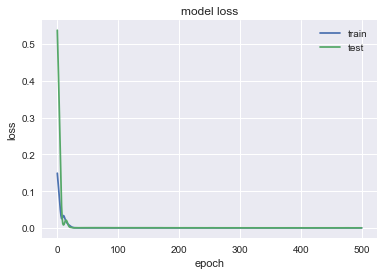

                BA
MSE        50.9042
MAE        4.93648
R2        0.916716
MAPE (%)   1.33115


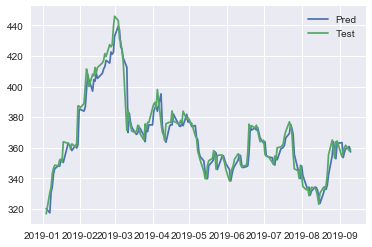

Predicting for  IBM
Train on 1008 samples, validate on 172 samples
Epoch 1/500
0s - loss: 0.3749 - val_loss: 0.1358
Epoch 2/500
0s - loss: 0.3207 - val_loss: 0.1072
Epoch 3/500
0s - loss: 0.2643 - val_loss: 0.0767
Epoch 4/500
0s - loss: 0.2021 - val_loss: 0.0456
Epoch 5/500
0s - loss: 0.1360 - val_loss: 0.0187
Epoch 6/500
0s - loss: 0.0736 - val_loss: 0.0038
Epoch 7/500
0s - loss: 0.0281 - val_loss: 0.0093
Epoch 8/500
0s - loss: 0.0113 - val_loss: 0.0303
Epoch 9/500
0s - loss: 0.0175 - val_loss: 0.0399
Epoch 10/500
0s - loss: 0.0185 - val_loss: 0.0295
Epoch 11/500
0s - loss: 0.0115 - val_loss: 0.0159
Epoch 12/500
0s - loss: 0.0083 - val_loss: 0.0083
Epoch 13/500
0s - loss: 0.0097 - val_loss: 0.0055
Epoch 14/500
0s - loss: 0.0118 - val_loss: 0.0052
Epoch 15/500
0s - loss: 0.0108 - val_loss: 0.0062
Epoch 16/500
0s - loss: 0.0090 - val_loss: 0.0082
Epoch 17/500
0s - loss: 0.0079 - val_loss: 0.0101
Epoch 18/500
0s - loss: 0.0068 - val_loss: 0.0106
Epoch 19/500
0s - loss: 0.0066 - val_loss:

0s - loss: 0.0011 - val_loss: 4.9926e-04
Epoch 155/500
0s - loss: 0.0012 - val_loss: 5.0049e-04
Epoch 156/500
0s - loss: 0.0013 - val_loss: 5.1143e-04
Epoch 157/500
0s - loss: 0.0012 - val_loss: 5.1446e-04
Epoch 158/500
0s - loss: 0.0012 - val_loss: 4.8426e-04
Epoch 159/500
0s - loss: 0.0012 - val_loss: 5.0193e-04
Epoch 160/500
0s - loss: 0.0012 - val_loss: 5.2216e-04
Epoch 161/500
0s - loss: 0.0011 - val_loss: 5.0088e-04
Epoch 162/500
0s - loss: 0.0011 - val_loss: 4.8901e-04
Epoch 163/500
0s - loss: 0.0011 - val_loss: 5.1121e-04
Epoch 164/500
0s - loss: 0.0011 - val_loss: 5.0942e-04
Epoch 165/500
0s - loss: 0.0011 - val_loss: 4.9360e-04
Epoch 166/500
0s - loss: 0.0012 - val_loss: 5.1239e-04
Epoch 167/500
0s - loss: 0.0011 - val_loss: 5.1416e-04
Epoch 168/500
0s - loss: 0.0011 - val_loss: 4.9229e-04
Epoch 169/500
0s - loss: 0.0012 - val_loss: 4.9814e-04
Epoch 170/500
0s - loss: 0.0011 - val_loss: 5.1299e-04
Epoch 171/500
0s - loss: 0.0011 - val_loss: 5.0399e-04
Epoch 172/500
0s - loss:

0s - loss: 0.0011 - val_loss: 5.1627e-04
Epoch 304/500
0s - loss: 9.7735e-04 - val_loss: 5.0263e-04
Epoch 305/500
0s - loss: 0.0011 - val_loss: 5.2146e-04
Epoch 306/500
0s - loss: 0.0010 - val_loss: 5.0431e-04
Epoch 307/500
0s - loss: 0.0010 - val_loss: 5.0450e-04
Epoch 308/500
0s - loss: 0.0010 - val_loss: 5.2139e-04
Epoch 309/500
0s - loss: 0.0010 - val_loss: 5.1097e-04
Epoch 310/500
0s - loss: 9.9142e-04 - val_loss: 5.1478e-04
Epoch 311/500
0s - loss: 0.0011 - val_loss: 5.1802e-04
Epoch 312/500
0s - loss: 0.0010 - val_loss: 5.1857e-04
Epoch 313/500
0s - loss: 0.0010 - val_loss: 5.0523e-04
Epoch 314/500
0s - loss: 0.0011 - val_loss: 5.1230e-04
Epoch 315/500
0s - loss: 0.0010 - val_loss: 5.4940e-04
Epoch 316/500
0s - loss: 0.0011 - val_loss: 5.0252e-04
Epoch 317/500
0s - loss: 0.0010 - val_loss: 5.0124e-04
Epoch 318/500
0s - loss: 0.0010 - val_loss: 5.4139e-04
Epoch 319/500
0s - loss: 0.0011 - val_loss: 5.0533e-04
Epoch 320/500
0s - loss: 0.0010 - val_loss: 5.0030e-04
Epoch 321/500
0s

0s - loss: 9.5371e-04 - val_loss: 5.1692e-04
Epoch 451/500
0s - loss: 0.0011 - val_loss: 5.1928e-04
Epoch 452/500
0s - loss: 0.0010 - val_loss: 5.1563e-04
Epoch 453/500
0s - loss: 9.9257e-04 - val_loss: 5.3476e-04
Epoch 454/500
0s - loss: 0.0010 - val_loss: 5.2089e-04
Epoch 455/500
0s - loss: 0.0010 - val_loss: 5.0808e-04
Epoch 456/500
0s - loss: 0.0010 - val_loss: 5.1620e-04
Epoch 457/500
0s - loss: 0.0010 - val_loss: 5.1693e-04
Epoch 458/500
0s - loss: 0.0010 - val_loss: 5.1018e-04
Epoch 459/500
0s - loss: 0.0010 - val_loss: 5.1515e-04
Epoch 460/500
0s - loss: 0.0011 - val_loss: 5.1770e-04
Epoch 461/500
0s - loss: 0.0010 - val_loss: 5.2135e-04
Epoch 462/500
0s - loss: 0.0010 - val_loss: 5.1878e-04
Epoch 463/500
0s - loss: 0.0010 - val_loss: 5.2756e-04
Epoch 464/500
0s - loss: 0.0010 - val_loss: 5.2749e-04
Epoch 465/500
0s - loss: 0.0011 - val_loss: 5.1246e-04
Epoch 466/500
0s - loss: 0.0010 - val_loss: 5.4081e-04
Epoch 467/500
0s - loss: 0.0010 - val_loss: 5.0382e-04
Epoch 468/500
0s

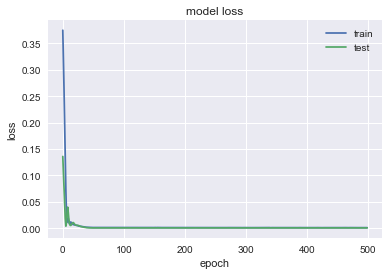

               IBM
MSE        2.79588
MAE        1.14759
R2        0.939412
MAPE (%)   0.84297


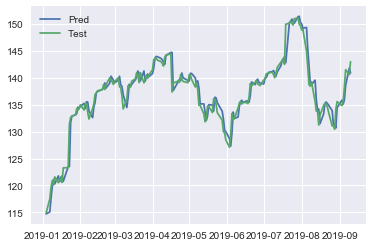

Predicting for  ALB
Train on 1008 samples, validate on 172 samples
Epoch 1/500
0s - loss: 0.2373 - val_loss: 0.0934
Epoch 2/500
0s - loss: 0.2041 - val_loss: 0.0733
Epoch 3/500
0s - loss: 0.1686 - val_loss: 0.0523
Epoch 4/500
0s - loss: 0.1303 - val_loss: 0.0315
Epoch 5/500
0s - loss: 0.0914 - val_loss: 0.0138
Epoch 6/500
0s - loss: 0.0552 - val_loss: 0.0036
Epoch 7/500
0s - loss: 0.0292 - val_loss: 0.0052
Epoch 8/500
0s - loss: 0.0190 - val_loss: 0.0171
Epoch 9/500
0s - loss: 0.0229 - val_loss: 0.0279
Epoch 10/500
0s - loss: 0.0285 - val_loss: 0.0276
Epoch 11/500
0s - loss: 0.0270 - val_loss: 0.0196
Epoch 12/500
0s - loss: 0.0222 - val_loss: 0.0117
Epoch 13/500
0s - loss: 0.0195 - val_loss: 0.0071
Epoch 14/500
0s - loss: 0.0182 - val_loss: 0.0051
Epoch 15/500
0s - loss: 0.0164 - val_loss: 0.0046
Epoch 16/500
0s - loss: 0.0148 - val_loss: 0.0050
Epoch 17/500
0s - loss: 0.0131 - val_loss: 0.0058
Epoch 18/500
0s - loss: 0.0119 - val_loss: 0.0065
Epoch 19/500
0s - loss: 0.0110 - val_loss:

0s - loss: 6.3918e-04 - val_loss: 2.5905e-04
Epoch 146/500
0s - loss: 6.5800e-04 - val_loss: 2.6524e-04
Epoch 147/500
0s - loss: 6.4230e-04 - val_loss: 2.7120e-04
Epoch 148/500
0s - loss: 6.1637e-04 - val_loss: 2.6457e-04
Epoch 149/500
0s - loss: 6.3902e-04 - val_loss: 2.5671e-04
Epoch 150/500
0s - loss: 6.1886e-04 - val_loss: 2.5343e-04
Epoch 151/500
0s - loss: 7.1743e-04 - val_loss: 2.5616e-04
Epoch 152/500
0s - loss: 6.5468e-04 - val_loss: 2.6242e-04
Epoch 153/500
0s - loss: 6.1082e-04 - val_loss: 2.6188e-04
Epoch 154/500
0s - loss: 6.3492e-04 - val_loss: 2.5670e-04
Epoch 155/500
0s - loss: 6.1129e-04 - val_loss: 2.5392e-04
Epoch 156/500
0s - loss: 6.9778e-04 - val_loss: 2.5952e-04
Epoch 157/500
0s - loss: 6.1501e-04 - val_loss: 2.5944e-04
Epoch 158/500
0s - loss: 6.6894e-04 - val_loss: 2.5367e-04
Epoch 159/500
0s - loss: 5.9798e-04 - val_loss: 2.5221e-04
Epoch 160/500
0s - loss: 6.4787e-04 - val_loss: 2.5652e-04
Epoch 161/500
0s - loss: 6.6826e-04 - val_loss: 2.5744e-04
Epoch 162/5

0s - loss: 5.2696e-04 - val_loss: 2.5573e-04
Epoch 285/500
0s - loss: 6.4054e-04 - val_loss: 2.5389e-04
Epoch 286/500
0s - loss: 5.4188e-04 - val_loss: 2.5347e-04
Epoch 287/500
0s - loss: 5.6933e-04 - val_loss: 2.5390e-04
Epoch 288/500
0s - loss: 5.5350e-04 - val_loss: 2.5525e-04
Epoch 289/500
0s - loss: 5.8109e-04 - val_loss: 2.5448e-04
Epoch 290/500
0s - loss: 5.1560e-04 - val_loss: 2.5400e-04
Epoch 291/500
0s - loss: 5.7747e-04 - val_loss: 2.6005e-04
Epoch 292/500
0s - loss: 5.4541e-04 - val_loss: 2.5661e-04
Epoch 293/500
0s - loss: 5.9373e-04 - val_loss: 2.5342e-04
Epoch 294/500
0s - loss: 5.8643e-04 - val_loss: 2.5997e-04
Epoch 295/500
0s - loss: 5.5649e-04 - val_loss: 2.5841e-04
Epoch 296/500
0s - loss: 5.1831e-04 - val_loss: 2.5464e-04
Epoch 297/500
0s - loss: 5.4790e-04 - val_loss: 2.5425e-04
Epoch 298/500
0s - loss: 5.4019e-04 - val_loss: 2.5401e-04
Epoch 299/500
0s - loss: 5.2145e-04 - val_loss: 2.5328e-04
Epoch 300/500
0s - loss: 5.9581e-04 - val_loss: 2.5319e-04
Epoch 301/5

0s - loss: 5.3930e-04 - val_loss: 2.6358e-04
Epoch 424/500
0s - loss: 4.7135e-04 - val_loss: 2.5423e-04
Epoch 425/500
0s - loss: 5.3220e-04 - val_loss: 2.5447e-04
Epoch 426/500
0s - loss: 5.4242e-04 - val_loss: 2.6462e-04
Epoch 427/500
0s - loss: 5.3626e-04 - val_loss: 2.5417e-04
Epoch 428/500
0s - loss: 5.1731e-04 - val_loss: 2.5542e-04
Epoch 429/500
0s - loss: 5.9091e-04 - val_loss: 2.5716e-04
Epoch 430/500
0s - loss: 5.5120e-04 - val_loss: 2.5557e-04
Epoch 431/500
0s - loss: 5.5523e-04 - val_loss: 2.5376e-04
Epoch 432/500
0s - loss: 5.3918e-04 - val_loss: 2.5936e-04
Epoch 433/500
0s - loss: 5.4211e-04 - val_loss: 2.5485e-04
Epoch 434/500
0s - loss: 5.2479e-04 - val_loss: 2.5541e-04
Epoch 435/500
0s - loss: 5.1822e-04 - val_loss: 2.5590e-04
Epoch 436/500
0s - loss: 5.0966e-04 - val_loss: 2.5365e-04
Epoch 437/500
0s - loss: 5.3653e-04 - val_loss: 2.5332e-04
Epoch 438/500
0s - loss: 5.2893e-04 - val_loss: 2.5668e-04
Epoch 439/500
0s - loss: 4.9652e-04 - val_loss: 2.5329e-04
Epoch 440/5

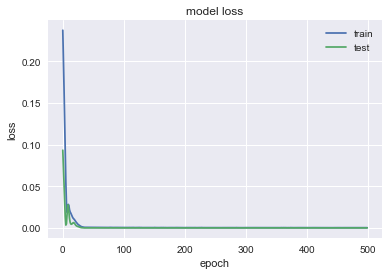

               ALB
MSE        2.68885
MAE        1.21439
R2        0.956694
MAPE (%)   1.63987


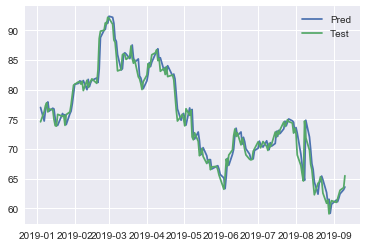

Predicting for  CBRE
Train on 1008 samples, validate on 172 samples
Epoch 1/500
0s - loss: 0.2082 - val_loss: 0.6064
Epoch 2/500
0s - loss: 0.1756 - val_loss: 0.5219
Epoch 3/500
0s - loss: 0.1412 - val_loss: 0.4276
Epoch 4/500
0s - loss: 0.1047 - val_loss: 0.3235
Epoch 5/500
0s - loss: 0.0678 - val_loss: 0.2156
Epoch 6/500
0s - loss: 0.0355 - val_loss: 0.1169
Epoch 7/500
0s - loss: 0.0156 - val_loss: 0.0454
Epoch 8/500
0s - loss: 0.0132 - val_loss: 0.0120
Epoch 9/500
0s - loss: 0.0218 - val_loss: 0.0047
Epoch 10/500
0s - loss: 0.0255 - val_loss: 0.0072
Epoch 11/500
0s - loss: 0.0209 - val_loss: 0.0170
Epoch 12/500
0s - loss: 0.0157 - val_loss: 0.0305
Epoch 13/500
0s - loss: 0.0135 - val_loss: 0.0401
Epoch 14/500
0s - loss: 0.0121 - val_loss: 0.0414
Epoch 15/500
0s - loss: 0.0113 - val_loss: 0.0358
Epoch 16/500
0s - loss: 0.0103 - val_loss: 0.0273
Epoch 17/500
0s - loss: 0.0095 - val_loss: 0.0198
Epoch 18/500
0s - loss: 0.0097 - val_loss: 0.0150
Epoch 19/500
0s - loss: 0.0095 - val_loss

0s - loss: 7.5379e-04 - val_loss: 6.1839e-04
Epoch 147/500
0s - loss: 7.1725e-04 - val_loss: 6.3344e-04
Epoch 148/500
0s - loss: 6.7418e-04 - val_loss: 6.8138e-04
Epoch 149/500
0s - loss: 6.8377e-04 - val_loss: 6.4591e-04
Epoch 150/500
0s - loss: 7.0335e-04 - val_loss: 6.2638e-04
Epoch 151/500
0s - loss: 6.7209e-04 - val_loss: 6.6895e-04
Epoch 152/500
0s - loss: 6.6478e-04 - val_loss: 6.6351e-04
Epoch 153/500
0s - loss: 6.6313e-04 - val_loss: 6.0875e-04
Epoch 154/500
0s - loss: 7.4541e-04 - val_loss: 5.9087e-04
Epoch 155/500
0s - loss: 6.2870e-04 - val_loss: 7.1570e-04
Epoch 156/500
0s - loss: 6.7067e-04 - val_loss: 7.5668e-04
Epoch 157/500
0s - loss: 6.8515e-04 - val_loss: 6.3498e-04
Epoch 158/500
0s - loss: 6.7794e-04 - val_loss: 6.0494e-04
Epoch 159/500
0s - loss: 6.6740e-04 - val_loss: 6.4844e-04
Epoch 160/500
0s - loss: 6.0731e-04 - val_loss: 6.6527e-04
Epoch 161/500
0s - loss: 6.6520e-04 - val_loss: 6.1224e-04
Epoch 162/500
0s - loss: 6.4414e-04 - val_loss: 6.1004e-04
Epoch 163/5

0s - loss: 6.1076e-04 - val_loss: 4.9947e-04
Epoch 286/500
0s - loss: 6.1090e-04 - val_loss: 5.1165e-04
Epoch 287/500
0s - loss: 5.9146e-04 - val_loss: 5.3315e-04
Epoch 288/500
0s - loss: 6.2198e-04 - val_loss: 4.9867e-04
Epoch 289/500
0s - loss: 6.3612e-04 - val_loss: 5.0011e-04
Epoch 290/500
0s - loss: 6.0026e-04 - val_loss: 5.2741e-04
Epoch 291/500
0s - loss: 5.8738e-04 - val_loss: 5.0877e-04
Epoch 292/500
0s - loss: 5.8097e-04 - val_loss: 5.0340e-04
Epoch 293/500
0s - loss: 6.4097e-04 - val_loss: 5.1179e-04
Epoch 294/500
0s - loss: 6.2003e-04 - val_loss: 5.0151e-04
Epoch 295/500
0s - loss: 6.2510e-04 - val_loss: 5.0554e-04
Epoch 296/500
0s - loss: 5.7352e-04 - val_loss: 5.0678e-04
Epoch 297/500
0s - loss: 5.8928e-04 - val_loss: 4.9588e-04
Epoch 298/500
0s - loss: 6.2050e-04 - val_loss: 4.9837e-04
Epoch 299/500
0s - loss: 6.0660e-04 - val_loss: 5.4129e-04
Epoch 300/500
0s - loss: 6.7111e-04 - val_loss: 4.9891e-04
Epoch 301/500
0s - loss: 5.7790e-04 - val_loss: 5.0686e-04
Epoch 302/5

0s - loss: 5.7580e-04 - val_loss: 6.3213e-04
Epoch 425/500
0s - loss: 5.5811e-04 - val_loss: 5.2158e-04
Epoch 426/500
0s - loss: 5.6165e-04 - val_loss: 5.2438e-04
Epoch 427/500
0s - loss: 5.6459e-04 - val_loss: 5.3694e-04
Epoch 428/500
0s - loss: 6.1634e-04 - val_loss: 5.1758e-04
Epoch 429/500
0s - loss: 5.3153e-04 - val_loss: 5.7086e-04
Epoch 430/500
0s - loss: 6.4844e-04 - val_loss: 5.2021e-04
Epoch 431/500
0s - loss: 5.9395e-04 - val_loss: 4.9246e-04
Epoch 432/500
0s - loss: 5.9184e-04 - val_loss: 6.2981e-04
Epoch 433/500
0s - loss: 5.8569e-04 - val_loss: 5.2578e-04
Epoch 434/500
0s - loss: 5.4540e-04 - val_loss: 5.1324e-04
Epoch 435/500
0s - loss: 6.1668e-04 - val_loss: 5.7484e-04
Epoch 436/500
0s - loss: 6.1821e-04 - val_loss: 5.2761e-04
Epoch 437/500
0s - loss: 5.8515e-04 - val_loss: 4.7972e-04
Epoch 438/500
0s - loss: 6.1419e-04 - val_loss: 5.3037e-04
Epoch 439/500
0s - loss: 5.9498e-04 - val_loss: 5.3449e-04
Epoch 440/500
0s - loss: 5.3736e-04 - val_loss: 5.3515e-04
Epoch 441/5

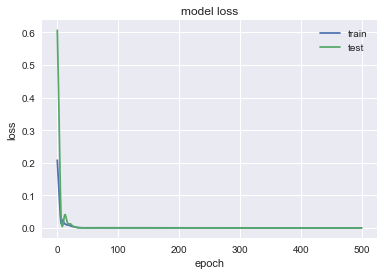

              CBRE
MSE       0.579479
MAE       0.618002
R2        0.939797
MAPE (%)   1.24603


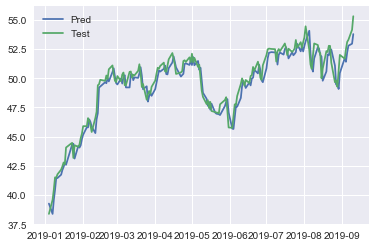

In [190]:
test = df["2019-01-04":].copy()
train = df[:"2019-01-04"].copy()
pred_4 = pd.DataFrame(columns=df.columns,index = test.index)
for comp in companies:
    pred_4[comp] = nn_forec(df,comp,first_layer = 256,second_layer=128).values

In [143]:
lstm_uni_64_32 = eval(pred,test,companies=companies)
lstm_uni_64_32

,T,BBY,KO,FTI,BLK,DVA,BA,IBM,ALB,CBRE
MSE,0.137666,1.95272,0.288354,0.274166,30.3083,1.21791,61.4713,2.85306,2.68678,0.690934
MAE,0.264318,0.916538,0.392269,0.42476,4.30348,0.794582,5.61866,1.15406,1.22405,0.683262
R2,0.951483,0.942891,0.965266,0.873377,0.949037,0.903307,0.889032,0.937705,0.956141,0.925501
MAPE (%),0.819047,1.36395,0.783147,1.78257,0.981479,1.46933,1.4986,0.847189,1.64438,1.37279


In [173]:
lstm_uni_64_32.astype(float).round(2).to_latex()

'\\begin{tabular}{lrrrrrrrrrr}\n\\toprule\n{} &      T &    BBY &     KO &    FTI &     BLK &    DVA &      BA &    IBM &    ALB &   CBRE \\\\\n\\midrule\nMSE      &  0.138 &  1.953 &  0.288 &  0.274 &  30.308 &  1.218 &  61.471 &  2.853 &  2.687 &  0.691 \\\\\nMAE      &  0.264 &  0.917 &  0.392 &  0.425 &   4.303 &  0.795 &   5.619 &  1.154 &  1.224 &  0.683 \\\\\nR2       &  0.951 &  0.943 &  0.965 &  0.873 &   0.949 &  0.903 &   0.889 &  0.938 &  0.956 &  0.926 \\\\\nMAPE (\\%) &  0.819 &  1.364 &  0.783 &  1.783 &   0.981 &  1.469 &   1.499 &  0.847 &  1.644 &  1.373 \\\\\n\\bottomrule\n\\end{tabular}\n'

In [177]:
lstm_uni_64_32.astype(float).round(2)

,T,BBY,KO,FTI,BLK,DVA,BA,IBM,ALB,CBRE
MSE,0.14,1.95,0.29,0.27,30.31,1.22,61.47,2.85,2.69,0.69
MAE,0.26,0.92,0.39,0.42,4.30,0.79,5.62,1.15,1.22,0.68
R2,0.95,0.94,0.97,0.87,0.95,0.90,0.89,0.94,0.96,0.93
MAPE (%),0.82,1.36,0.78,1.78,0.98,1.47,1.50,0.85,1.64,1.37


In [178]:
print("Average = ",lstm_uni_64_32.astype(float).round(2).loc['MAPE (%)',:].mean())

Average =  1.2550000000000001


In [182]:
lstm_uni_32_16 = eval(pred_2,test,companies=companies)
lstm_uni_32_16

,T,BBY,KO,FTI,BLK,DVA,BA,IBM,ALB,CBRE
MSE,0.138668,1.97607,0.319146,0.266094,34.2888,1.28735,93.3836,2.75181,2.64484,0.763013
MAE,0.266137,0.94021,0.415674,0.416037,4.62131,0.799844,7.52321,1.13675,1.21202,0.723628
R2,0.949457,0.940507,0.960381,0.874712,0.940828,0.883569,0.816256,0.9375,0.957032,0.914343
MAPE (%),0.824658,1.39377,0.826547,1.74942,1.05154,1.49578,1.99139,0.833396,1.6298,1.44861


In [183]:
lstm_uni_32_16.astype(float).round(2).to_latex()

'\\begin{tabular}{lrrrrrrrrrr}\n\\toprule\n{} &     T &   BBY &    KO &   FTI &    BLK &   DVA &     BA &   IBM &   ALB &  CBRE \\\\\n\\midrule\nMSE      &  0.14 &  1.98 &  0.32 &  0.27 &  34.29 &  1.29 &  93.38 &  2.75 &  2.64 &  0.76 \\\\\nMAE      &  0.27 &  0.94 &  0.42 &  0.42 &   4.62 &  0.80 &   7.52 &  1.14 &  1.21 &  0.72 \\\\\nR2       &  0.95 &  0.94 &  0.96 &  0.87 &   0.94 &  0.88 &   0.82 &  0.94 &  0.96 &  0.91 \\\\\nMAPE (\\%) &  0.82 &  1.39 &  0.83 &  1.75 &   1.05 &  1.50 &   1.99 &  0.83 &  1.63 &  1.45 \\\\\n\\bottomrule\n\\end{tabular}\n'

In [184]:
print("Average = ",lstm_uni_32_16.astype(float).round(2).loc['MAPE (%)',:].mean())

Average =  1.3239999999999998


In [186]:
lstm_uni_128_64 = eval(pred_3,test,companies=companies)
lstm_uni_128_64

,T,BBY,KO,FTI,BLK,DVA,BA,IBM,ALB,CBRE
MSE,0.137619,2.0163,0.278735,0.271079,30.0655,1.22562,54.953,2.9003,2.64744,0.618033
MAE,0.262844,0.94094,0.383916,0.421736,4.28625,0.792505,5.21404,1.17177,1.21111,0.640409
R2,0.952408,0.940661,0.966532,0.87744,0.949036,0.906766,0.905011,0.935835,0.957331,0.93469
MAPE (%),0.814991,1.39611,0.767115,1.77333,0.977509,1.46438,1.39796,0.860064,1.63265,1.28925


In [187]:
lstm_uni_128_64.astype(float).round(2).to_latex()

'\\begin{tabular}{lrrrrrrrrrr}\n\\toprule\n{} &     T &   BBY &    KO &   FTI &    BLK &   DVA &     BA &   IBM &   ALB &  CBRE \\\\\n\\midrule\nMSE      &  0.14 &  2.02 &  0.28 &  0.27 &  30.07 &  1.23 &  54.95 &  2.90 &  2.65 &  0.62 \\\\\nMAE      &  0.26 &  0.94 &  0.38 &  0.42 &   4.29 &  0.79 &   5.21 &  1.17 &  1.21 &  0.64 \\\\\nR2       &  0.95 &  0.94 &  0.97 &  0.88 &   0.95 &  0.91 &   0.91 &  0.94 &  0.96 &  0.93 \\\\\nMAPE (\\%) &  0.81 &  1.40 &  0.77 &  1.77 &   0.98 &  1.46 &   1.40 &  0.86 &  1.63 &  1.29 \\\\\n\\bottomrule\n\\end{tabular}\n'

In [188]:
print("Average = ",lstm_uni_128_64.astype(float).round(2).loc['MAPE (%)',:].mean())

Average =  1.2369999999999997


In [191]:
lstm_uni_256_128 = eval(pred_4,test,companies=companies)
lstm_uni_256_128

,T,BBY,KO,FTI,BLK,DVA,BA,IBM,ALB,CBRE
MSE,0.141634,1.96761,0.276735,0.288283,30.1165,1.21266,50.9042,2.79588,2.68885,0.579479
MAE,0.272035,0.925133,0.38389,0.435996,4.30231,0.784972,4.93648,1.14759,1.21439,0.618002
R2,0.950315,0.942936,0.967375,0.870615,0.948503,0.906371,0.916716,0.939412,0.956694,0.939797
MAPE (%),0.841369,1.37905,0.768207,1.82985,0.980776,1.45281,1.33115,0.84297,1.63987,1.24603


In [192]:
lstm_uni_256_128.astype(float).round(2).to_latex()

'\\begin{tabular}{lrrrrrrrrrr}\n\\toprule\n{} &     T &   BBY &    KO &   FTI &    BLK &   DVA &     BA &   IBM &   ALB &  CBRE \\\\\n\\midrule\nMSE      &  0.14 &  1.97 &  0.28 &  0.29 &  30.12 &  1.21 &  50.90 &  2.80 &  2.69 &  0.58 \\\\\nMAE      &  0.27 &  0.93 &  0.38 &  0.44 &   4.30 &  0.78 &   4.94 &  1.15 &  1.21 &  0.62 \\\\\nR2       &  0.95 &  0.94 &  0.97 &  0.87 &   0.95 &  0.91 &   0.92 &  0.94 &  0.96 &  0.94 \\\\\nMAPE (\\%) &  0.84 &  1.38 &  0.77 &  1.83 &   0.98 &  1.45 &   1.33 &  0.84 &  1.64 &  1.25 \\\\\n\\bottomrule\n\\end{tabular}\n'

In [193]:
print("Average = ",lstm_uni_256_128.astype(float).round(2).loc['MAPE (%)',:].mean())

Average =  1.231


In [176]:
triv_prec.astype(float).round(3)

,T,BBY,KO,FTI,BLK,DVA,BA,IBM,ALB,CBRE
MSE,0.137,2.029,0.225,0.272,30.343,1.208,49.218,2.774,2.632,0.508
MAE,0.264,0.933,0.343,0.422,4.311,0.781,4.796,1.133,1.202,0.561
R2,0.952,0.939,0.975,0.871,0.946,0.910,0.926,0.931,0.958,0.943
MAPE (%),0.817,1.386,0.689,1.770,0.982,1.444,1.298,0.830,1.622,1.130


In [166]:
print("Average = ",triv_prec.astype(float).round(2).loc['MAPE (%)',:].mean())

Average =  1.1969999999999998


In [171]:
arima_prec.astype(float).round(2).to_latex()

'\\begin{tabular}{lrrrrrrrrrr}\n\\toprule\n{} &     T &   BBY &    KO &   FTI &    BLK &   DVA &     BA &   IBM &   ALB &  CBRE \\\\\n\\midrule\nMSE      &  0.14 &  2.08 &  0.24 &  0.28 &  30.87 &  1.28 &  52.51 &  2.84 &  2.71 &  0.53 \\\\\nMAE      &  0.27 &  0.94 &  0.35 &  0.43 &   4.34 &  0.81 &   5.01 &  1.15 &  1.22 &  0.58 \\\\\nR2       &  0.95 &  0.94 &  0.97 &  0.87 &   0.95 &  0.91 &   0.92 &  0.93 &  0.96 &  0.94 \\\\\nMAPE (\\%) &  0.83 &  1.40 &  0.70 &  1.79 &   0.99 &  1.49 &   1.36 &  0.85 &  1.65 &  1.17 \\\\\n\\bottomrule\n\\end{tabular}\n'

In [167]:
print("Average = ",arima_prec.astype(float).round(2).loc['MAPE (%)',:].mean())

Average =  1.223


## GRU

In [197]:
def nn_forec_GRU(df,company,n_lags = 1,feature_range=(0, 1),n_train_time = 172,first_layer = 64,second_layer = 32):
    print("Predicting for ", company)
    comp = df[company]
    scaler = MinMaxScaler(feature_range=feature_range)
    comp = scaler.fit_transform(comp)
    comp = pd.DataFrame(comp,columns=[company+"(t)"],index=df.index)
    for i in range(1,n_lags+1):
        comp[company+"(t-"+str(i)+")"] = comp[company+"(t)"].shift(i)
    
    comp = comp.dropna()
    values = comp.values

    n_train_time = 172
    train = values[:comp.shape[0] -n_train_time, :]
    test = values[comp.shape[0] - n_train_time :, :]
    train_X, train_y = train[:, 1:], train[:, 0]
    test_X, test_y = test[:, 1:], test[:, 0]
    train_X = train_X.reshape((train_X.shape[0], 1, train_X.shape[1]))
    test_X = test_X.reshape((test_X.shape[0], 1, test_X.shape[1]))

    model = Sequential()
    model.add(GRU(first_layer, input_shape=(train_X.shape[1], train_X.shape[2]),return_sequences=True))
    model.add(Dropout(0.1))
    model.add(GRU(second_layer))
    model.add(Dropout(0.1))
    model.add(Dense(1))
    model.compile(loss="mean_squared_error", optimizer='adam')



    # fit network
    history = model.fit(train_X, train_y, epochs=1000, batch_size=300, validation_data=(test_X, test_y), verbose=2, shuffle=False)

    # summarize history for loss
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'test'], loc='upper right')
    plt.show()
    
    # make a prediction
    yhat = model.predict(test_X)
    # invert scaling for forecast
    inv_yhat_sc = scaler.inverse_transform(yhat)
    # invert scaling for actual

    inv_y = scaler.inverse_transform(test_y)
    test = df["2019-01-04":].copy()
    train = df[:"2019-01-04"].copy()
    predictions = pd.DataFrame(inv_yhat_sc,columns=[company],index = test.index)
    
    lstm_eval = eval(predictions,test,companies=[company])
    print(lstm_eval)
    
    plt.plot(predictions[company])
    plt.plot(test[company])
    plt.legend(['Pred', 'Test'])
    plt.show()
    return predictions

Predicting for  T
Train on 1008 samples, validate on 172 samples
Epoch 1/1000
0s - loss: 0.3137 - val_loss: 0.0701
Epoch 2/1000
0s - loss: 0.2679 - val_loss: 0.0546
Epoch 3/1000
0s - loss: 0.2274 - val_loss: 0.0407
Epoch 4/1000
0s - loss: 0.1880 - val_loss: 0.0287
Epoch 5/1000
0s - loss: 0.1519 - val_loss: 0.0187
Epoch 6/1000
0s - loss: 0.1185 - val_loss: 0.0112
Epoch 7/1000
0s - loss: 0.0872 - val_loss: 0.0068
Epoch 8/1000
0s - loss: 0.0615 - val_loss: 0.0058
Epoch 9/1000
0s - loss: 0.0417 - val_loss: 0.0084
Epoch 10/1000
0s - loss: 0.0272 - val_loss: 0.0137
Epoch 11/1000
0s - loss: 0.0197 - val_loss: 0.0202
Epoch 12/1000
0s - loss: 0.0161 - val_loss: 0.0261
Epoch 13/1000
0s - loss: 0.0151 - val_loss: 0.0296
Epoch 14/1000
0s - loss: 0.0154 - val_loss: 0.0301
Epoch 15/1000
0s - loss: 0.0148 - val_loss: 0.0283
Epoch 16/1000
0s - loss: 0.0143 - val_loss: 0.0253
Epoch 17/1000
0s - loss: 0.0134 - val_loss: 0.0220
Epoch 18/1000
0s - loss: 0.0139 - val_loss: 0.0192
Epoch 19/1000
0s - loss: 0

0s - loss: 0.0024 - val_loss: 5.6505e-04
Epoch 156/1000
0s - loss: 0.0025 - val_loss: 5.6625e-04
Epoch 157/1000
0s - loss: 0.0026 - val_loss: 5.6053e-04
Epoch 158/1000
0s - loss: 0.0025 - val_loss: 5.5744e-04
Epoch 159/1000
0s - loss: 0.0025 - val_loss: 5.5595e-04
Epoch 160/1000
0s - loss: 0.0025 - val_loss: 5.5599e-04
Epoch 161/1000
0s - loss: 0.0025 - val_loss: 5.6440e-04
Epoch 162/1000
0s - loss: 0.0026 - val_loss: 5.7169e-04
Epoch 163/1000
0s - loss: 0.0026 - val_loss: 5.6687e-04
Epoch 164/1000
0s - loss: 0.0025 - val_loss: 5.6180e-04
Epoch 165/1000
0s - loss: 0.0026 - val_loss: 5.6254e-04
Epoch 166/1000
0s - loss: 0.0027 - val_loss: 5.6166e-04
Epoch 167/1000
0s - loss: 0.0026 - val_loss: 5.5655e-04
Epoch 168/1000
0s - loss: 0.0024 - val_loss: 5.5737e-04
Epoch 169/1000
0s - loss: 0.0027 - val_loss: 5.5860e-04
Epoch 170/1000
0s - loss: 0.0026 - val_loss: 5.6164e-04
Epoch 171/1000
0s - loss: 0.0025 - val_loss: 5.5965e-04
Epoch 172/1000
0s - loss: 0.0028 - val_loss: 5.5756e-04
Epoch 1

0s - loss: 0.0022 - val_loss: 5.4645e-04
Epoch 307/1000
0s - loss: 0.0021 - val_loss: 5.5614e-04
Epoch 308/1000
0s - loss: 0.0022 - val_loss: 5.7007e-04
Epoch 309/1000
0s - loss: 0.0021 - val_loss: 5.5427e-04
Epoch 310/1000
0s - loss: 0.0022 - val_loss: 5.4822e-04
Epoch 311/1000
0s - loss: 0.0021 - val_loss: 5.4618e-04
Epoch 312/1000
0s - loss: 0.0021 - val_loss: 5.4451e-04
Epoch 313/1000
0s - loss: 0.0019 - val_loss: 5.4712e-04
Epoch 314/1000
0s - loss: 0.0022 - val_loss: 5.5145e-04
Epoch 315/1000
0s - loss: 0.0021 - val_loss: 5.4982e-04
Epoch 316/1000
0s - loss: 0.0021 - val_loss: 5.5899e-04
Epoch 317/1000
0s - loss: 0.0024 - val_loss: 5.6681e-04
Epoch 318/1000
0s - loss: 0.0021 - val_loss: 5.5059e-04
Epoch 319/1000
0s - loss: 0.0020 - val_loss: 5.4530e-04
Epoch 320/1000
0s - loss: 0.0019 - val_loss: 5.4706e-04
Epoch 321/1000
0s - loss: 0.0020 - val_loss: 5.5923e-04
Epoch 322/1000
0s - loss: 0.0021 - val_loss: 5.5555e-04
Epoch 323/1000
0s - loss: 0.0021 - val_loss: 5.4540e-04
Epoch 3

0s - loss: 0.0019 - val_loss: 5.4607e-04
Epoch 455/1000
0s - loss: 0.0018 - val_loss: 5.3766e-04
Epoch 456/1000
0s - loss: 0.0019 - val_loss: 5.5309e-04
Epoch 457/1000
0s - loss: 0.0020 - val_loss: 5.6581e-04
Epoch 458/1000
0s - loss: 0.0018 - val_loss: 5.5516e-04
Epoch 459/1000
0s - loss: 0.0018 - val_loss: 5.4096e-04
Epoch 460/1000
0s - loss: 0.0018 - val_loss: 5.4145e-04
Epoch 461/1000
0s - loss: 0.0018 - val_loss: 5.4716e-04
Epoch 462/1000
0s - loss: 0.0017 - val_loss: 5.4998e-04
Epoch 463/1000
0s - loss: 0.0018 - val_loss: 5.4863e-04
Epoch 464/1000
0s - loss: 0.0018 - val_loss: 5.4858e-04
Epoch 465/1000
0s - loss: 0.0018 - val_loss: 5.4534e-04
Epoch 466/1000
0s - loss: 0.0019 - val_loss: 5.4400e-04
Epoch 467/1000
0s - loss: 0.0019 - val_loss: 5.4579e-04
Epoch 468/1000
0s - loss: 0.0018 - val_loss: 5.4383e-04
Epoch 469/1000
0s - loss: 0.0019 - val_loss: 5.4651e-04
Epoch 470/1000
0s - loss: 0.0017 - val_loss: 5.4487e-04
Epoch 471/1000
0s - loss: 0.0016 - val_loss: 5.5957e-04
Epoch 4

0s - loss: 0.0015 - val_loss: 5.5370e-04
Epoch 604/1000
0s - loss: 0.0017 - val_loss: 5.5158e-04
Epoch 605/1000
0s - loss: 0.0017 - val_loss: 5.4325e-04
Epoch 606/1000
0s - loss: 0.0016 - val_loss: 5.4892e-04
Epoch 607/1000
0s - loss: 0.0016 - val_loss: 5.4560e-04
Epoch 608/1000
0s - loss: 0.0017 - val_loss: 5.4286e-04
Epoch 609/1000
0s - loss: 0.0017 - val_loss: 5.3848e-04
Epoch 610/1000
0s - loss: 0.0016 - val_loss: 5.4721e-04
Epoch 611/1000
0s - loss: 0.0016 - val_loss: 5.5086e-04
Epoch 612/1000
0s - loss: 0.0017 - val_loss: 5.7415e-04
Epoch 613/1000
0s - loss: 0.0016 - val_loss: 5.5494e-04
Epoch 614/1000
0s - loss: 0.0017 - val_loss: 5.4981e-04
Epoch 615/1000
0s - loss: 0.0016 - val_loss: 5.5228e-04
Epoch 616/1000
0s - loss: 0.0016 - val_loss: 5.4603e-04
Epoch 617/1000
0s - loss: 0.0017 - val_loss: 5.3845e-04
Epoch 618/1000
0s - loss: 0.0016 - val_loss: 5.3833e-04
Epoch 619/1000
0s - loss: 0.0016 - val_loss: 5.4242e-04
Epoch 620/1000
0s - loss: 0.0016 - val_loss: 5.5530e-04
Epoch 6

0s - loss: 0.0015 - val_loss: 5.4224e-04
Epoch 752/1000
0s - loss: 0.0015 - val_loss: 5.6479e-04
Epoch 753/1000
0s - loss: 0.0014 - val_loss: 5.5226e-04
Epoch 754/1000
0s - loss: 0.0014 - val_loss: 5.4462e-04
Epoch 755/1000
0s - loss: 0.0014 - val_loss: 5.6534e-04
Epoch 756/1000
0s - loss: 0.0014 - val_loss: 5.3887e-04
Epoch 757/1000
0s - loss: 0.0014 - val_loss: 5.4412e-04
Epoch 758/1000
0s - loss: 0.0014 - val_loss: 5.4668e-04
Epoch 759/1000
0s - loss: 0.0015 - val_loss: 5.4109e-04
Epoch 760/1000
0s - loss: 0.0015 - val_loss: 5.7405e-04
Epoch 761/1000
0s - loss: 0.0015 - val_loss: 5.5546e-04
Epoch 762/1000
0s - loss: 0.0015 - val_loss: 5.3832e-04
Epoch 763/1000
0s - loss: 0.0014 - val_loss: 5.5934e-04
Epoch 764/1000
0s - loss: 0.0014 - val_loss: 5.4671e-04
Epoch 765/1000
0s - loss: 0.0015 - val_loss: 5.4436e-04
Epoch 766/1000
0s - loss: 0.0013 - val_loss: 5.4890e-04
Epoch 767/1000
0s - loss: 0.0014 - val_loss: 5.4523e-04
Epoch 768/1000
0s - loss: 0.0015 - val_loss: 5.3871e-04
Epoch 7

0s - loss: 0.0013 - val_loss: 5.4110e-04
Epoch 901/1000
0s - loss: 0.0012 - val_loss: 5.4189e-04
Epoch 902/1000
0s - loss: 0.0013 - val_loss: 5.8819e-04
Epoch 903/1000
0s - loss: 0.0013 - val_loss: 5.4116e-04
Epoch 904/1000
0s - loss: 0.0013 - val_loss: 5.5857e-04
Epoch 905/1000
0s - loss: 0.0013 - val_loss: 5.6834e-04
Epoch 906/1000
0s - loss: 0.0014 - val_loss: 5.3810e-04
Epoch 907/1000
0s - loss: 0.0013 - val_loss: 5.7622e-04
Epoch 908/1000
0s - loss: 0.0012 - val_loss: 5.5060e-04
Epoch 909/1000
0s - loss: 0.0013 - val_loss: 5.4376e-04
Epoch 910/1000
0s - loss: 0.0013 - val_loss: 5.5831e-04
Epoch 911/1000
0s - loss: 0.0013 - val_loss: 5.4719e-04
Epoch 912/1000
0s - loss: 0.0014 - val_loss: 5.4836e-04
Epoch 913/1000
0s - loss: 0.0013 - val_loss: 5.6835e-04
Epoch 914/1000
0s - loss: 0.0014 - val_loss: 5.3797e-04
Epoch 915/1000
0s - loss: 0.0013 - val_loss: 5.5325e-04
Epoch 916/1000
0s - loss: 0.0013 - val_loss: 5.5082e-04
Epoch 917/1000
0s - loss: 0.0013 - val_loss: 5.3816e-04
Epoch 9

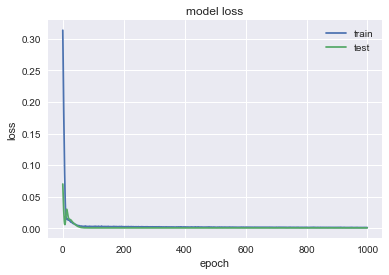

                 T
MSE       0.142723
MAE       0.274081
R2        0.949908
MAPE (%)  0.847423


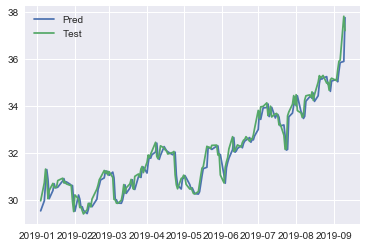

Predicting for  BBY
Train on 1008 samples, validate on 172 samples
Epoch 1/1000
0s - loss: 0.2346 - val_loss: 0.4770
Epoch 2/1000
0s - loss: 0.1973 - val_loss: 0.4074
Epoch 3/1000
0s - loss: 0.1649 - val_loss: 0.3419
Epoch 4/1000
0s - loss: 0.1347 - val_loss: 0.2808
Epoch 5/1000
0s - loss: 0.1071 - val_loss: 0.2240
Epoch 6/1000
0s - loss: 0.0838 - val_loss: 0.1721
Epoch 7/1000
0s - loss: 0.0641 - val_loss: 0.1262
Epoch 8/1000
0s - loss: 0.0473 - val_loss: 0.0873
Epoch 9/1000
0s - loss: 0.0363 - val_loss: 0.0564
Epoch 10/1000
0s - loss: 0.0274 - val_loss: 0.0339
Epoch 11/1000
0s - loss: 0.0264 - val_loss: 0.0193
Epoch 12/1000
0s - loss: 0.0267 - val_loss: 0.0110
Epoch 13/1000
0s - loss: 0.0289 - val_loss: 0.0068
Epoch 14/1000
0s - loss: 0.0286 - val_loss: 0.0051
Epoch 15/1000
0s - loss: 0.0298 - val_loss: 0.0047
Epoch 16/1000
0s - loss: 0.0281 - val_loss: 0.0051
Epoch 17/1000
0s - loss: 0.0263 - val_loss: 0.0059
Epoch 18/1000
0s - loss: 0.0234 - val_loss: 0.0068
Epoch 19/1000
0s - loss:

0s - loss: 0.0016 - val_loss: 6.5977e-04
Epoch 152/1000
0s - loss: 0.0018 - val_loss: 6.2834e-04
Epoch 153/1000
0s - loss: 0.0018 - val_loss: 6.5045e-04
Epoch 154/1000
0s - loss: 0.0019 - val_loss: 7.4538e-04
Epoch 155/1000
0s - loss: 0.0018 - val_loss: 7.6389e-04
Epoch 156/1000
0s - loss: 0.0016 - val_loss: 6.9918e-04
Epoch 157/1000
0s - loss: 0.0015 - val_loss: 6.8667e-04
Epoch 158/1000
0s - loss: 0.0019 - val_loss: 6.9595e-04
Epoch 159/1000
0s - loss: 0.0017 - val_loss: 6.7898e-04
Epoch 160/1000
0s - loss: 0.0019 - val_loss: 6.8012e-04
Epoch 161/1000
0s - loss: 0.0018 - val_loss: 6.7591e-04
Epoch 162/1000
0s - loss: 0.0018 - val_loss: 6.4708e-04
Epoch 163/1000
0s - loss: 0.0019 - val_loss: 6.4693e-04
Epoch 164/1000
0s - loss: 0.0018 - val_loss: 6.8990e-04
Epoch 165/1000
0s - loss: 0.0018 - val_loss: 7.1651e-04
Epoch 166/1000
0s - loss: 0.0018 - val_loss: 7.0420e-04
Epoch 167/1000
0s - loss: 0.0017 - val_loss: 6.6297e-04
Epoch 168/1000
0s - loss: 0.0016 - val_loss: 6.4884e-04
Epoch 1

0s - loss: 0.0016 - val_loss: 6.2989e-04
Epoch 299/1000
0s - loss: 0.0015 - val_loss: 6.4100e-04
Epoch 300/1000
0s - loss: 0.0015 - val_loss: 6.4958e-04
Epoch 301/1000
0s - loss: 0.0014 - val_loss: 6.3666e-04
Epoch 302/1000
0s - loss: 0.0015 - val_loss: 6.4453e-04
Epoch 303/1000
0s - loss: 0.0015 - val_loss: 6.4846e-04
Epoch 304/1000
0s - loss: 0.0015 - val_loss: 6.5108e-04
Epoch 305/1000
0s - loss: 0.0015 - val_loss: 6.5110e-04
Epoch 306/1000
0s - loss: 0.0015 - val_loss: 6.3434e-04
Epoch 307/1000
0s - loss: 0.0014 - val_loss: 6.0932e-04
Epoch 308/1000
0s - loss: 0.0014 - val_loss: 6.1948e-04
Epoch 309/1000
0s - loss: 0.0014 - val_loss: 6.9767e-04
Epoch 310/1000
0s - loss: 0.0016 - val_loss: 7.0734e-04
Epoch 311/1000
0s - loss: 0.0014 - val_loss: 6.4340e-04
Epoch 312/1000
0s - loss: 0.0014 - val_loss: 6.4080e-04
Epoch 313/1000
0s - loss: 0.0014 - val_loss: 6.7674e-04
Epoch 314/1000
0s - loss: 0.0017 - val_loss: 7.0483e-04
Epoch 315/1000
0s - loss: 0.0015 - val_loss: 6.5141e-04
Epoch 3

0s - loss: 0.0012 - val_loss: 6.2831e-04
Epoch 449/1000
0s - loss: 0.0013 - val_loss: 6.8333e-04
Epoch 450/1000
0s - loss: 0.0013 - val_loss: 6.5102e-04
Epoch 451/1000
0s - loss: 0.0013 - val_loss: 6.0765e-04
Epoch 452/1000
0s - loss: 0.0012 - val_loss: 6.4955e-04
Epoch 453/1000
0s - loss: 0.0014 - val_loss: 6.5587e-04
Epoch 454/1000
0s - loss: 0.0012 - val_loss: 5.8735e-04
Epoch 455/1000
0s - loss: 0.0012 - val_loss: 5.8927e-04
Epoch 456/1000
0s - loss: 0.0014 - val_loss: 6.1321e-04
Epoch 457/1000
0s - loss: 0.0013 - val_loss: 6.2251e-04
Epoch 458/1000
0s - loss: 0.0013 - val_loss: 6.0118e-04
Epoch 459/1000
0s - loss: 0.0013 - val_loss: 5.9330e-04
Epoch 460/1000
0s - loss: 0.0013 - val_loss: 6.3424e-04
Epoch 461/1000
0s - loss: 0.0012 - val_loss: 6.2756e-04
Epoch 462/1000
0s - loss: 0.0013 - val_loss: 6.0506e-04
Epoch 463/1000
0s - loss: 0.0013 - val_loss: 5.9736e-04
Epoch 464/1000
0s - loss: 0.0013 - val_loss: 6.5716e-04
Epoch 465/1000
0s - loss: 0.0012 - val_loss: 6.3463e-04
Epoch 4

0s - loss: 0.0012 - val_loss: 6.5595e-04
Epoch 598/1000
0s - loss: 0.0012 - val_loss: 6.8722e-04
Epoch 599/1000
0s - loss: 0.0012 - val_loss: 5.8617e-04
Epoch 600/1000
0s - loss: 0.0010 - val_loss: 5.8565e-04
Epoch 601/1000
0s - loss: 0.0011 - val_loss: 6.1798e-04
Epoch 602/1000
0s - loss: 0.0010 - val_loss: 6.1323e-04
Epoch 603/1000
0s - loss: 0.0011 - val_loss: 6.0102e-04
Epoch 604/1000
0s - loss: 0.0011 - val_loss: 6.1504e-04
Epoch 605/1000
0s - loss: 0.0012 - val_loss: 6.1156e-04
Epoch 606/1000
0s - loss: 0.0011 - val_loss: 6.1322e-04
Epoch 607/1000
0s - loss: 0.0013 - val_loss: 6.1100e-04
Epoch 608/1000
0s - loss: 0.0012 - val_loss: 7.0090e-04
Epoch 609/1000
0s - loss: 0.0011 - val_loss: 6.0823e-04
Epoch 610/1000
0s - loss: 0.0012 - val_loss: 6.1986e-04
Epoch 611/1000
0s - loss: 0.0012 - val_loss: 5.8960e-04
Epoch 612/1000
0s - loss: 0.0012 - val_loss: 6.5874e-04
Epoch 613/1000
0s - loss: 0.0012 - val_loss: 6.2007e-04
Epoch 614/1000
0s - loss: 0.0012 - val_loss: 6.0742e-04
Epoch 6

0s - loss: 0.0011 - val_loss: 6.0365e-04
Epoch 748/1000
0s - loss: 9.8764e-04 - val_loss: 6.2984e-04
Epoch 749/1000
0s - loss: 0.0011 - val_loss: 6.4506e-04
Epoch 750/1000
0s - loss: 0.0010 - val_loss: 5.8605e-04
Epoch 751/1000
0s - loss: 0.0010 - val_loss: 5.8703e-04
Epoch 752/1000
0s - loss: 0.0011 - val_loss: 6.1092e-04
Epoch 753/1000
0s - loss: 9.8926e-04 - val_loss: 5.9117e-04
Epoch 754/1000
0s - loss: 9.4631e-04 - val_loss: 5.8624e-04
Epoch 755/1000
0s - loss: 0.0011 - val_loss: 6.8115e-04
Epoch 756/1000
0s - loss: 0.0011 - val_loss: 6.2305e-04
Epoch 757/1000
0s - loss: 9.5464e-04 - val_loss: 5.8546e-04
Epoch 758/1000
0s - loss: 0.0010 - val_loss: 6.8693e-04
Epoch 759/1000
0s - loss: 0.0010 - val_loss: 6.7409e-04
Epoch 760/1000
0s - loss: 9.8617e-04 - val_loss: 5.8454e-04
Epoch 761/1000
0s - loss: 0.0011 - val_loss: 6.0173e-04
Epoch 762/1000
0s - loss: 0.0011 - val_loss: 7.2344e-04
Epoch 763/1000
0s - loss: 0.0011 - val_loss: 5.8688e-04
Epoch 764/1000
0s - loss: 0.0010 - val_loss

0s - loss: 9.9553e-04 - val_loss: 6.4306e-04
Epoch 894/1000
0s - loss: 8.7584e-04 - val_loss: 6.1861e-04
Epoch 895/1000
0s - loss: 8.6321e-04 - val_loss: 6.5153e-04
Epoch 896/1000
0s - loss: 0.0010 - val_loss: 6.9352e-04
Epoch 897/1000
0s - loss: 9.4551e-04 - val_loss: 5.8884e-04
Epoch 898/1000
0s - loss: 9.9276e-04 - val_loss: 5.9544e-04
Epoch 899/1000
0s - loss: 0.0010 - val_loss: 6.4175e-04
Epoch 900/1000
0s - loss: 0.0010 - val_loss: 5.9725e-04
Epoch 901/1000
0s - loss: 8.5118e-04 - val_loss: 6.2816e-04
Epoch 902/1000
0s - loss: 9.9351e-04 - val_loss: 6.1029e-04
Epoch 903/1000
0s - loss: 9.3084e-04 - val_loss: 5.8510e-04
Epoch 904/1000
0s - loss: 8.6065e-04 - val_loss: 6.4602e-04
Epoch 905/1000
0s - loss: 0.0010 - val_loss: 6.0064e-04
Epoch 906/1000
0s - loss: 9.2057e-04 - val_loss: 5.9050e-04
Epoch 907/1000
0s - loss: 9.9792e-04 - val_loss: 6.7033e-04
Epoch 908/1000
0s - loss: 9.9229e-04 - val_loss: 5.9802e-04
Epoch 909/1000
0s - loss: 0.0010 - val_loss: 5.8545e-04
Epoch 910/1000


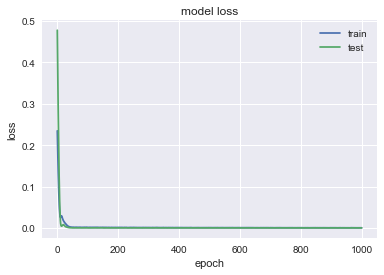

               BBY
MSE        1.99169
MAE       0.927835
R2        0.941768
MAPE (%)   1.37834


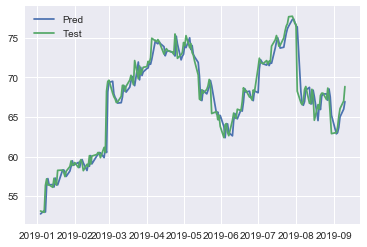

Predicting for  KO
Train on 1008 samples, validate on 172 samples
Epoch 1/1000
0s - loss: 0.1090 - val_loss: 0.3836
Epoch 2/1000
0s - loss: 0.0858 - val_loss: 0.3215
Epoch 3/1000
0s - loss: 0.0650 - val_loss: 0.2613
Epoch 4/1000
0s - loss: 0.0462 - val_loss: 0.2039
Epoch 5/1000
0s - loss: 0.0298 - val_loss: 0.1511
Epoch 6/1000
0s - loss: 0.0178 - val_loss: 0.1053
Epoch 7/1000
0s - loss: 0.0097 - val_loss: 0.0690
Epoch 8/1000
0s - loss: 0.0068 - val_loss: 0.0439
Epoch 9/1000
0s - loss: 0.0078 - val_loss: 0.0294
Epoch 10/1000
0s - loss: 0.0101 - val_loss: 0.0231
Epoch 11/1000
0s - loss: 0.0116 - val_loss: 0.0223
Epoch 12/1000
0s - loss: 0.0114 - val_loss: 0.0248
Epoch 13/1000
0s - loss: 0.0099 - val_loss: 0.0290
Epoch 14/1000
0s - loss: 0.0088 - val_loss: 0.0333
Epoch 15/1000
0s - loss: 0.0077 - val_loss: 0.0363
Epoch 16/1000
0s - loss: 0.0072 - val_loss: 0.0376
Epoch 17/1000
0s - loss: 0.0066 - val_loss: 0.0371
Epoch 18/1000
0s - loss: 0.0065 - val_loss: 0.0353
Epoch 19/1000
0s - loss: 

0s - loss: 0.0012 - val_loss: 7.9248e-04
Epoch 153/1000
0s - loss: 0.0011 - val_loss: 7.8708e-04
Epoch 154/1000
0s - loss: 0.0011 - val_loss: 7.8053e-04
Epoch 155/1000
0s - loss: 0.0011 - val_loss: 7.8363e-04
Epoch 156/1000
0s - loss: 0.0011 - val_loss: 7.7849e-04
Epoch 157/1000
0s - loss: 0.0010 - val_loss: 7.8485e-04
Epoch 158/1000
0s - loss: 0.0011 - val_loss: 7.8194e-04
Epoch 159/1000
0s - loss: 0.0011 - val_loss: 7.7710e-04
Epoch 160/1000
0s - loss: 0.0011 - val_loss: 7.7664e-04
Epoch 161/1000
0s - loss: 9.5690e-04 - val_loss: 7.8013e-04
Epoch 162/1000
0s - loss: 9.5621e-04 - val_loss: 7.7971e-04
Epoch 163/1000
0s - loss: 0.0010 - val_loss: 7.8407e-04
Epoch 164/1000
0s - loss: 0.0010 - val_loss: 7.8247e-04
Epoch 165/1000
0s - loss: 9.4829e-04 - val_loss: 7.8209e-04
Epoch 166/1000
0s - loss: 0.0010 - val_loss: 7.8140e-04
Epoch 167/1000
0s - loss: 0.0010 - val_loss: 7.7969e-04
Epoch 168/1000
0s - loss: 0.0011 - val_loss: 7.8936e-04
Epoch 169/1000
0s - loss: 9.4241e-04 - val_loss: 7.

0s - loss: 9.3526e-04 - val_loss: 7.3445e-04
Epoch 295/1000
0s - loss: 8.8555e-04 - val_loss: 7.2944e-04
Epoch 296/1000
0s - loss: 8.8343e-04 - val_loss: 7.7279e-04
Epoch 297/1000
0s - loss: 8.8152e-04 - val_loss: 7.5024e-04
Epoch 298/1000
0s - loss: 9.2100e-04 - val_loss: 7.3229e-04
Epoch 299/1000
0s - loss: 9.2162e-04 - val_loss: 7.5473e-04
Epoch 300/1000
0s - loss: 9.0327e-04 - val_loss: 7.5747e-04
Epoch 301/1000
0s - loss: 8.7046e-04 - val_loss: 7.3016e-04
Epoch 302/1000
0s - loss: 8.2620e-04 - val_loss: 7.3609e-04
Epoch 303/1000
0s - loss: 9.0491e-04 - val_loss: 7.4054e-04
Epoch 304/1000
0s - loss: 8.8285e-04 - val_loss: 7.6101e-04
Epoch 305/1000
0s - loss: 9.7107e-04 - val_loss: 7.3697e-04
Epoch 306/1000
0s - loss: 9.0749e-04 - val_loss: 7.3615e-04
Epoch 307/1000
0s - loss: 9.1555e-04 - val_loss: 7.3859e-04
Epoch 308/1000
0s - loss: 8.6012e-04 - val_loss: 7.5103e-04
Epoch 309/1000
0s - loss: 8.7490e-04 - val_loss: 7.7113e-04
Epoch 310/1000
0s - loss: 9.4170e-04 - val_loss: 7.4676

0s - loss: 8.2083e-04 - val_loss: 8.2194e-04
Epoch 432/1000
0s - loss: 8.1290e-04 - val_loss: 8.3627e-04
Epoch 433/1000
0s - loss: 7.7140e-04 - val_loss: 7.4449e-04
Epoch 434/1000
0s - loss: 7.8706e-04 - val_loss: 7.6841e-04
Epoch 435/1000
0s - loss: 7.7434e-04 - val_loss: 8.4251e-04
Epoch 436/1000
0s - loss: 8.2147e-04 - val_loss: 7.8096e-04
Epoch 437/1000
0s - loss: 7.9228e-04 - val_loss: 7.8019e-04
Epoch 438/1000
0s - loss: 8.2773e-04 - val_loss: 8.0983e-04
Epoch 439/1000
0s - loss: 8.1784e-04 - val_loss: 7.8653e-04
Epoch 440/1000
0s - loss: 7.9053e-04 - val_loss: 8.0881e-04
Epoch 441/1000
0s - loss: 7.8818e-04 - val_loss: 7.8423e-04
Epoch 442/1000
0s - loss: 8.2847e-04 - val_loss: 7.7890e-04
Epoch 443/1000
0s - loss: 7.9582e-04 - val_loss: 8.8476e-04
Epoch 444/1000
0s - loss: 8.4459e-04 - val_loss: 8.1664e-04
Epoch 445/1000
0s - loss: 7.5620e-04 - val_loss: 7.6138e-04
Epoch 446/1000
0s - loss: 8.4488e-04 - val_loss: 7.5569e-04
Epoch 447/1000
0s - loss: 7.5976e-04 - val_loss: 7.6653

0s - loss: 6.8485e-04 - val_loss: 7.4885e-04
Epoch 571/1000
0s - loss: 7.9934e-04 - val_loss: 7.7071e-04
Epoch 572/1000
0s - loss: 7.2784e-04 - val_loss: 8.0933e-04
Epoch 573/1000
0s - loss: 7.5033e-04 - val_loss: 7.5321e-04
Epoch 574/1000
0s - loss: 7.4386e-04 - val_loss: 7.3626e-04
Epoch 575/1000
0s - loss: 7.2987e-04 - val_loss: 8.2657e-04
Epoch 576/1000
0s - loss: 7.1362e-04 - val_loss: 8.4790e-04
Epoch 577/1000
0s - loss: 7.0125e-04 - val_loss: 7.8238e-04
Epoch 578/1000
0s - loss: 7.5818e-04 - val_loss: 7.8012e-04
Epoch 579/1000
0s - loss: 7.2216e-04 - val_loss: 8.5200e-04
Epoch 580/1000
0s - loss: 6.8369e-04 - val_loss: 8.2118e-04
Epoch 581/1000
0s - loss: 7.2637e-04 - val_loss: 7.9655e-04
Epoch 582/1000
0s - loss: 7.5232e-04 - val_loss: 7.7699e-04
Epoch 583/1000
0s - loss: 7.1964e-04 - val_loss: 8.2017e-04
Epoch 584/1000
0s - loss: 7.7618e-04 - val_loss: 9.1764e-04
Epoch 585/1000
0s - loss: 7.6334e-04 - val_loss: 8.2183e-04
Epoch 586/1000
0s - loss: 7.7885e-04 - val_loss: 7.6901

0s - loss: 6.9621e-04 - val_loss: 7.9437e-04
Epoch 709/1000
0s - loss: 6.9501e-04 - val_loss: 8.5461e-04
Epoch 710/1000
0s - loss: 7.1493e-04 - val_loss: 8.0035e-04
Epoch 711/1000
0s - loss: 7.4006e-04 - val_loss: 7.6382e-04
Epoch 712/1000
0s - loss: 6.6328e-04 - val_loss: 7.8345e-04
Epoch 713/1000
0s - loss: 6.9801e-04 - val_loss: 7.6884e-04
Epoch 714/1000
0s - loss: 6.5773e-04 - val_loss: 7.2103e-04
Epoch 715/1000
0s - loss: 6.5027e-04 - val_loss: 7.9444e-04
Epoch 716/1000
0s - loss: 7.2608e-04 - val_loss: 7.6214e-04
Epoch 717/1000
0s - loss: 7.1895e-04 - val_loss: 7.2285e-04
Epoch 718/1000
0s - loss: 7.0069e-04 - val_loss: 8.1868e-04
Epoch 719/1000
0s - loss: 6.4143e-04 - val_loss: 7.6475e-04
Epoch 720/1000
0s - loss: 6.5406e-04 - val_loss: 8.0482e-04
Epoch 721/1000
0s - loss: 6.4994e-04 - val_loss: 8.6751e-04
Epoch 722/1000
0s - loss: 6.2861e-04 - val_loss: 7.7871e-04
Epoch 723/1000
0s - loss: 7.0974e-04 - val_loss: 8.3641e-04
Epoch 724/1000
0s - loss: 6.8430e-04 - val_loss: 8.2612

0s - loss: 6.2950e-04 - val_loss: 7.9112e-04
Epoch 847/1000
0s - loss: 6.3480e-04 - val_loss: 8.5145e-04
Epoch 848/1000
0s - loss: 6.3330e-04 - val_loss: 7.9135e-04
Epoch 849/1000
0s - loss: 6.3003e-04 - val_loss: 7.9693e-04
Epoch 850/1000
0s - loss: 6.2855e-04 - val_loss: 7.7739e-04
Epoch 851/1000
0s - loss: 6.7450e-04 - val_loss: 7.7007e-04
Epoch 852/1000
0s - loss: 6.4057e-04 - val_loss: 8.5596e-04
Epoch 853/1000
0s - loss: 6.2157e-04 - val_loss: 7.8264e-04
Epoch 854/1000
0s - loss: 6.6267e-04 - val_loss: 7.7887e-04
Epoch 855/1000
0s - loss: 6.4850e-04 - val_loss: 9.0204e-04
Epoch 856/1000
0s - loss: 6.6245e-04 - val_loss: 8.3122e-04
Epoch 857/1000
0s - loss: 6.0963e-04 - val_loss: 9.0333e-04
Epoch 858/1000
0s - loss: 6.1972e-04 - val_loss: 8.7900e-04
Epoch 859/1000
0s - loss: 6.1156e-04 - val_loss: 8.9008e-04
Epoch 860/1000
0s - loss: 6.6592e-04 - val_loss: 7.6216e-04
Epoch 861/1000
0s - loss: 6.4804e-04 - val_loss: 7.7259e-04
Epoch 862/1000
0s - loss: 6.4456e-04 - val_loss: 8.1556

0s - loss: 6.0719e-04 - val_loss: 8.4270e-04
Epoch 984/1000
0s - loss: 6.2156e-04 - val_loss: 7.6243e-04
Epoch 985/1000
0s - loss: 6.2452e-04 - val_loss: 9.2640e-04
Epoch 986/1000
0s - loss: 6.2487e-04 - val_loss: 7.7553e-04
Epoch 987/1000
0s - loss: 6.4660e-04 - val_loss: 8.0084e-04
Epoch 988/1000
0s - loss: 6.0464e-04 - val_loss: 8.3246e-04
Epoch 989/1000
0s - loss: 6.0585e-04 - val_loss: 7.3365e-04
Epoch 990/1000
0s - loss: 6.1109e-04 - val_loss: 7.8654e-04
Epoch 991/1000
0s - loss: 5.8823e-04 - val_loss: 7.7858e-04
Epoch 992/1000
0s - loss: 5.7625e-04 - val_loss: 7.5804e-04
Epoch 993/1000
0s - loss: 6.0226e-04 - val_loss: 8.1387e-04
Epoch 994/1000
0s - loss: 6.3736e-04 - val_loss: 8.1859e-04
Epoch 995/1000
0s - loss: 6.2737e-04 - val_loss: 8.9287e-04
Epoch 996/1000
0s - loss: 6.2595e-04 - val_loss: 8.3706e-04
Epoch 997/1000
0s - loss: 6.1076e-04 - val_loss: 9.3332e-04
Epoch 998/1000
0s - loss: 5.5536e-04 - val_loss: 8.4346e-04
Epoch 999/1000
0s - loss: 6.4290e-04 - val_loss: 8.5091

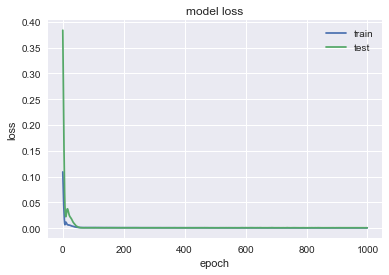

                KO
MSE       0.272612
MAE       0.379253
R2        0.967578
MAPE (%)   0.75854


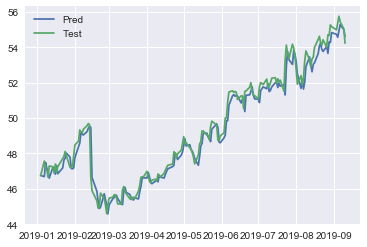

Predicting for  FTI
Train on 1008 samples, validate on 172 samples
Epoch 1/1000
0s - loss: 0.2174 - val_loss: 0.0240
Epoch 2/1000
0s - loss: 0.1767 - val_loss: 0.0150
Epoch 3/1000
0s - loss: 0.1411 - val_loss: 0.0082
Epoch 4/1000
0s - loss: 0.1097 - val_loss: 0.0037
Epoch 5/1000
0s - loss: 0.0808 - val_loss: 0.0018
Epoch 6/1000
0s - loss: 0.0576 - val_loss: 0.0027
Epoch 7/1000
0s - loss: 0.0383 - val_loss: 0.0065
Epoch 8/1000
0s - loss: 0.0253 - val_loss: 0.0130
Epoch 9/1000
0s - loss: 0.0163 - val_loss: 0.0209
Epoch 10/1000
0s - loss: 0.0135 - val_loss: 0.0281
Epoch 11/1000
0s - loss: 0.0121 - val_loss: 0.0326
Epoch 12/1000
0s - loss: 0.0118 - val_loss: 0.0333
Epoch 13/1000
0s - loss: 0.0118 - val_loss: 0.0312
Epoch 14/1000
0s - loss: 0.0108 - val_loss: 0.0274
Epoch 15/1000
0s - loss: 0.0099 - val_loss: 0.0235
Epoch 16/1000
0s - loss: 0.0097 - val_loss: 0.0203
Epoch 17/1000
0s - loss: 0.0098 - val_loss: 0.0180
Epoch 18/1000
0s - loss: 0.0101 - val_loss: 0.0166
Epoch 19/1000
0s - loss:

0s - loss: 0.0019 - val_loss: 3.3657e-04
Epoch 154/1000
0s - loss: 0.0019 - val_loss: 3.3135e-04
Epoch 155/1000
0s - loss: 0.0018 - val_loss: 3.4245e-04
Epoch 156/1000
0s - loss: 0.0016 - val_loss: 3.4321e-04
Epoch 157/1000
0s - loss: 0.0017 - val_loss: 3.2661e-04
Epoch 158/1000
0s - loss: 0.0018 - val_loss: 3.2358e-04
Epoch 159/1000
0s - loss: 0.0017 - val_loss: 3.3037e-04
Epoch 160/1000
0s - loss: 0.0017 - val_loss: 3.4111e-04
Epoch 161/1000
0s - loss: 0.0020 - val_loss: 3.4437e-04
Epoch 162/1000
0s - loss: 0.0017 - val_loss: 3.2830e-04
Epoch 163/1000
0s - loss: 0.0016 - val_loss: 3.2474e-04
Epoch 164/1000
0s - loss: 0.0017 - val_loss: 3.2611e-04
Epoch 165/1000
0s - loss: 0.0016 - val_loss: 3.3095e-04
Epoch 166/1000
0s - loss: 0.0017 - val_loss: 3.2702e-04
Epoch 167/1000
0s - loss: 0.0018 - val_loss: 3.2326e-04
Epoch 168/1000
0s - loss: 0.0019 - val_loss: 3.3056e-04
Epoch 169/1000
0s - loss: 0.0017 - val_loss: 3.4476e-04
Epoch 170/1000
0s - loss: 0.0018 - val_loss: 3.4107e-04
Epoch 1

0s - loss: 0.0015 - val_loss: 3.3248e-04
Epoch 302/1000
0s - loss: 0.0014 - val_loss: 3.3852e-04
Epoch 303/1000
0s - loss: 0.0014 - val_loss: 3.2495e-04
Epoch 304/1000
0s - loss: 0.0015 - val_loss: 3.2299e-04
Epoch 305/1000
0s - loss: 0.0014 - val_loss: 3.3682e-04
Epoch 306/1000
0s - loss: 0.0016 - val_loss: 3.4634e-04
Epoch 307/1000
0s - loss: 0.0015 - val_loss: 3.2599e-04
Epoch 308/1000
0s - loss: 0.0015 - val_loss: 3.2391e-04
Epoch 309/1000
0s - loss: 0.0013 - val_loss: 3.2733e-04
Epoch 310/1000
0s - loss: 0.0014 - val_loss: 3.3577e-04
Epoch 311/1000
0s - loss: 0.0015 - val_loss: 3.3158e-04
Epoch 312/1000
0s - loss: 0.0014 - val_loss: 3.2640e-04
Epoch 313/1000
0s - loss: 0.0014 - val_loss: 3.2666e-04
Epoch 314/1000
0s - loss: 0.0016 - val_loss: 3.2713e-04
Epoch 315/1000
0s - loss: 0.0014 - val_loss: 3.2695e-04
Epoch 316/1000
0s - loss: 0.0013 - val_loss: 3.3053e-04
Epoch 317/1000
0s - loss: 0.0015 - val_loss: 3.2726e-04
Epoch 318/1000
0s - loss: 0.0014 - val_loss: 3.2770e-04
Epoch 3

0s - loss: 0.0013 - val_loss: 3.3335e-04
Epoch 451/1000
0s - loss: 0.0012 - val_loss: 3.4233e-04
Epoch 452/1000
0s - loss: 0.0012 - val_loss: 3.3338e-04
Epoch 453/1000
0s - loss: 0.0012 - val_loss: 3.3276e-04
Epoch 454/1000
0s - loss: 0.0013 - val_loss: 3.3181e-04
Epoch 455/1000
0s - loss: 0.0013 - val_loss: 3.3215e-04
Epoch 456/1000
0s - loss: 0.0012 - val_loss: 3.3377e-04
Epoch 457/1000
0s - loss: 0.0013 - val_loss: 3.3494e-04
Epoch 458/1000
0s - loss: 0.0012 - val_loss: 3.3196e-04
Epoch 459/1000
0s - loss: 0.0013 - val_loss: 3.3408e-04
Epoch 460/1000
0s - loss: 0.0013 - val_loss: 3.3194e-04
Epoch 461/1000
0s - loss: 0.0014 - val_loss: 3.3681e-04
Epoch 462/1000
0s - loss: 0.0013 - val_loss: 3.3631e-04
Epoch 463/1000
0s - loss: 0.0013 - val_loss: 3.3338e-04
Epoch 464/1000
0s - loss: 0.0013 - val_loss: 3.3502e-04
Epoch 465/1000
0s - loss: 0.0013 - val_loss: 3.3376e-04
Epoch 466/1000
0s - loss: 0.0013 - val_loss: 3.3444e-04
Epoch 467/1000
0s - loss: 0.0013 - val_loss: 3.4236e-04
Epoch 4

0s - loss: 0.0012 - val_loss: 3.4937e-04
Epoch 601/1000
0s - loss: 0.0011 - val_loss: 3.3665e-04
Epoch 602/1000
0s - loss: 0.0012 - val_loss: 3.4077e-04
Epoch 603/1000
0s - loss: 0.0012 - val_loss: 3.5069e-04
Epoch 604/1000
0s - loss: 0.0011 - val_loss: 3.3204e-04
Epoch 605/1000
0s - loss: 0.0012 - val_loss: 3.3533e-04
Epoch 606/1000
0s - loss: 0.0011 - val_loss: 3.3349e-04
Epoch 607/1000
0s - loss: 0.0011 - val_loss: 3.3279e-04
Epoch 608/1000
0s - loss: 0.0012 - val_loss: 3.3434e-04
Epoch 609/1000
0s - loss: 0.0011 - val_loss: 3.3667e-04
Epoch 610/1000
0s - loss: 0.0011 - val_loss: 3.3800e-04
Epoch 611/1000
0s - loss: 0.0011 - val_loss: 3.3301e-04
Epoch 612/1000
0s - loss: 0.0011 - val_loss: 3.3244e-04
Epoch 613/1000
0s - loss: 0.0011 - val_loss: 3.3331e-04
Epoch 614/1000
0s - loss: 0.0011 - val_loss: 3.3454e-04
Epoch 615/1000
0s - loss: 0.0011 - val_loss: 3.3662e-04
Epoch 616/1000
0s - loss: 0.0011 - val_loss: 3.3897e-04
Epoch 617/1000
0s - loss: 0.0011 - val_loss: 3.4118e-04
Epoch 6

0s - loss: 0.0010 - val_loss: 3.4340e-04
Epoch 749/1000
0s - loss: 0.0010 - val_loss: 3.3682e-04
Epoch 750/1000
0s - loss: 0.0010 - val_loss: 3.4088e-04
Epoch 751/1000
0s - loss: 0.0011 - val_loss: 3.3605e-04
Epoch 752/1000
0s - loss: 0.0010 - val_loss: 3.3404e-04
Epoch 753/1000
0s - loss: 0.0012 - val_loss: 3.4024e-04
Epoch 754/1000
0s - loss: 0.0011 - val_loss: 3.3755e-04
Epoch 755/1000
0s - loss: 0.0011 - val_loss: 3.3709e-04
Epoch 756/1000
0s - loss: 0.0010 - val_loss: 3.4041e-04
Epoch 757/1000
0s - loss: 0.0011 - val_loss: 3.4714e-04
Epoch 758/1000
0s - loss: 0.0011 - val_loss: 3.4467e-04
Epoch 759/1000
0s - loss: 0.0010 - val_loss: 3.3541e-04
Epoch 760/1000
0s - loss: 0.0010 - val_loss: 3.3875e-04
Epoch 761/1000
0s - loss: 0.0011 - val_loss: 3.3387e-04
Epoch 762/1000
0s - loss: 9.9844e-04 - val_loss: 3.3608e-04
Epoch 763/1000
0s - loss: 0.0011 - val_loss: 3.3386e-04
Epoch 764/1000
0s - loss: 9.8715e-04 - val_loss: 3.3789e-04
Epoch 765/1000
0s - loss: 0.0011 - val_loss: 3.4221e-04

0s - loss: 9.7404e-04 - val_loss: 3.4130e-04
Epoch 892/1000
0s - loss: 0.0010 - val_loss: 3.4787e-04
Epoch 893/1000
0s - loss: 9.2145e-04 - val_loss: 3.3656e-04
Epoch 894/1000
0s - loss: 9.3113e-04 - val_loss: 3.3319e-04
Epoch 895/1000
0s - loss: 9.3070e-04 - val_loss: 3.3256e-04
Epoch 896/1000
0s - loss: 8.7969e-04 - val_loss: 3.3254e-04
Epoch 897/1000
0s - loss: 9.7104e-04 - val_loss: 3.3258e-04
Epoch 898/1000
0s - loss: 9.5580e-04 - val_loss: 3.3406e-04
Epoch 899/1000
0s - loss: 9.2626e-04 - val_loss: 3.3847e-04
Epoch 900/1000
0s - loss: 9.5187e-04 - val_loss: 3.3456e-04
Epoch 901/1000
0s - loss: 9.9978e-04 - val_loss: 3.3353e-04
Epoch 902/1000
0s - loss: 9.3114e-04 - val_loss: 3.3226e-04
Epoch 903/1000
0s - loss: 9.7952e-04 - val_loss: 3.3362e-04
Epoch 904/1000
0s - loss: 9.0310e-04 - val_loss: 3.3235e-04
Epoch 905/1000
0s - loss: 9.2084e-04 - val_loss: 3.3423e-04
Epoch 906/1000
0s - loss: 9.5851e-04 - val_loss: 3.3971e-04
Epoch 907/1000
0s - loss: 0.0010 - val_loss: 3.5728e-04
Epo

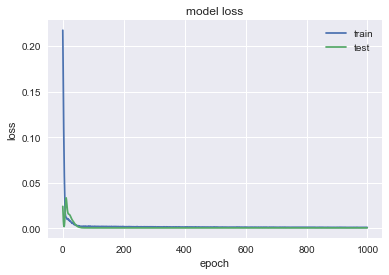

               FTI
MSE       0.291586
MAE       0.438753
R2        0.867124
MAPE (%)   1.83964


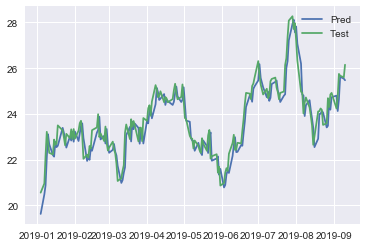

Predicting for  BLK
Train on 1008 samples, validate on 172 samples
Epoch 1/1000
0s - loss: 0.1841 - val_loss: 0.2131
Epoch 2/1000
0s - loss: 0.1559 - val_loss: 0.1788
Epoch 3/1000
0s - loss: 0.1305 - val_loss: 0.1465
Epoch 4/1000
0s - loss: 0.1067 - val_loss: 0.1161
Epoch 5/1000
0s - loss: 0.0843 - val_loss: 0.0881
Epoch 6/1000
0s - loss: 0.0651 - val_loss: 0.0630
Epoch 7/1000
0s - loss: 0.0489 - val_loss: 0.0417
Epoch 8/1000
0s - loss: 0.0359 - val_loss: 0.0249
Epoch 9/1000
0s - loss: 0.0268 - val_loss: 0.0132
Epoch 10/1000
0s - loss: 0.0216 - val_loss: 0.0062
Epoch 11/1000
0s - loss: 0.0199 - val_loss: 0.0030
Epoch 12/1000
0s - loss: 0.0194 - val_loss: 0.0020
Epoch 13/1000
0s - loss: 0.0209 - val_loss: 0.0018
Epoch 14/1000
0s - loss: 0.0207 - val_loss: 0.0017
Epoch 15/1000
0s - loss: 0.0202 - val_loss: 0.0017
Epoch 16/1000
0s - loss: 0.0194 - val_loss: 0.0018
Epoch 17/1000
0s - loss: 0.0180 - val_loss: 0.0020
Epoch 18/1000
0s - loss: 0.0170 - val_loss: 0.0023
Epoch 19/1000
0s - loss:

0s - loss: 0.0015 - val_loss: 3.9875e-04
Epoch 155/1000
0s - loss: 0.0016 - val_loss: 3.9769e-04
Epoch 156/1000
0s - loss: 0.0014 - val_loss: 4.0256e-04
Epoch 157/1000
0s - loss: 0.0016 - val_loss: 4.0175e-04
Epoch 158/1000
0s - loss: 0.0017 - val_loss: 3.8120e-04
Epoch 159/1000
0s - loss: 0.0013 - val_loss: 3.7731e-04
Epoch 160/1000
0s - loss: 0.0013 - val_loss: 3.9075e-04
Epoch 161/1000
0s - loss: 0.0015 - val_loss: 4.0216e-04
Epoch 162/1000
0s - loss: 0.0015 - val_loss: 3.9743e-04
Epoch 163/1000
0s - loss: 0.0014 - val_loss: 3.7431e-04
Epoch 164/1000
0s - loss: 0.0015 - val_loss: 3.5734e-04
Epoch 165/1000
0s - loss: 0.0015 - val_loss: 3.6144e-04
Epoch 166/1000
0s - loss: 0.0015 - val_loss: 3.8306e-04
Epoch 167/1000
0s - loss: 0.0014 - val_loss: 3.9905e-04
Epoch 168/1000
0s - loss: 0.0014 - val_loss: 4.0889e-04
Epoch 169/1000
0s - loss: 0.0015 - val_loss: 4.1132e-04
Epoch 170/1000
0s - loss: 0.0015 - val_loss: 3.7154e-04
Epoch 171/1000
0s - loss: 0.0013 - val_loss: 3.7073e-04
Epoch 1

0s - loss: 0.0013 - val_loss: 3.6269e-04
Epoch 302/1000
0s - loss: 0.0014 - val_loss: 3.5812e-04
Epoch 303/1000
0s - loss: 0.0013 - val_loss: 3.5315e-04
Epoch 304/1000
0s - loss: 0.0011 - val_loss: 3.5000e-04
Epoch 305/1000
0s - loss: 0.0012 - val_loss: 3.4950e-04
Epoch 306/1000
0s - loss: 0.0012 - val_loss: 3.5237e-04
Epoch 307/1000
0s - loss: 0.0014 - val_loss: 3.4214e-04
Epoch 308/1000
0s - loss: 0.0012 - val_loss: 3.5754e-04
Epoch 309/1000
0s - loss: 0.0011 - val_loss: 3.6523e-04
Epoch 310/1000
0s - loss: 0.0013 - val_loss: 3.5124e-04
Epoch 311/1000
0s - loss: 0.0012 - val_loss: 3.6250e-04
Epoch 312/1000
0s - loss: 0.0011 - val_loss: 3.9691e-04
Epoch 313/1000
0s - loss: 0.0012 - val_loss: 4.1285e-04
Epoch 314/1000
0s - loss: 0.0011 - val_loss: 3.4651e-04
Epoch 315/1000
0s - loss: 0.0011 - val_loss: 3.3015e-04
Epoch 316/1000
0s - loss: 0.0011 - val_loss: 3.5045e-04
Epoch 317/1000
0s - loss: 0.0013 - val_loss: 3.3913e-04
Epoch 318/1000
0s - loss: 0.0012 - val_loss: 3.4098e-04
Epoch 3

0s - loss: 9.9010e-04 - val_loss: 3.2425e-04
Epoch 450/1000
0s - loss: 0.0011 - val_loss: 3.1992e-04
Epoch 451/1000
0s - loss: 0.0011 - val_loss: 3.4296e-04
Epoch 452/1000
0s - loss: 0.0010 - val_loss: 3.5923e-04
Epoch 453/1000
0s - loss: 9.4366e-04 - val_loss: 3.3207e-04
Epoch 454/1000
0s - loss: 0.0011 - val_loss: 3.2916e-04
Epoch 455/1000
0s - loss: 0.0011 - val_loss: 3.3878e-04
Epoch 456/1000
0s - loss: 0.0010 - val_loss: 3.4139e-04
Epoch 457/1000
0s - loss: 0.0011 - val_loss: 3.4744e-04
Epoch 458/1000
0s - loss: 9.4430e-04 - val_loss: 3.3172e-04
Epoch 459/1000
0s - loss: 0.0011 - val_loss: 3.2343e-04
Epoch 460/1000
0s - loss: 0.0011 - val_loss: 3.2266e-04
Epoch 461/1000
0s - loss: 0.0011 - val_loss: 3.2189e-04
Epoch 462/1000
0s - loss: 0.0011 - val_loss: 3.2722e-04
Epoch 463/1000
0s - loss: 0.0012 - val_loss: 3.4654e-04
Epoch 464/1000
0s - loss: 0.0011 - val_loss: 3.3522e-04
Epoch 465/1000
0s - loss: 0.0011 - val_loss: 3.3298e-04
Epoch 466/1000
0s - loss: 0.0010 - val_loss: 3.3121

0s - loss: 9.7527e-04 - val_loss: 3.2821e-04
Epoch 595/1000
0s - loss: 0.0011 - val_loss: 3.2101e-04
Epoch 596/1000
0s - loss: 8.1125e-04 - val_loss: 3.2859e-04
Epoch 597/1000
0s - loss: 9.2715e-04 - val_loss: 3.2103e-04
Epoch 598/1000
0s - loss: 9.2205e-04 - val_loss: 3.2537e-04
Epoch 599/1000
0s - loss: 8.7121e-04 - val_loss: 3.2565e-04
Epoch 600/1000
0s - loss: 8.6712e-04 - val_loss: 3.1970e-04
Epoch 601/1000
0s - loss: 9.0915e-04 - val_loss: 3.2369e-04
Epoch 602/1000
0s - loss: 9.7275e-04 - val_loss: 3.4768e-04
Epoch 603/1000
0s - loss: 9.7807e-04 - val_loss: 3.2495e-04
Epoch 604/1000
0s - loss: 0.0010 - val_loss: 3.2262e-04
Epoch 605/1000
0s - loss: 0.0010 - val_loss: 3.2713e-04
Epoch 606/1000
0s - loss: 9.3767e-04 - val_loss: 3.3276e-04
Epoch 607/1000
0s - loss: 9.3005e-04 - val_loss: 3.3400e-04
Epoch 608/1000
0s - loss: 9.9203e-04 - val_loss: 3.1877e-04
Epoch 609/1000
0s - loss: 9.7465e-04 - val_loss: 3.2363e-04
Epoch 610/1000
0s - loss: 9.6880e-04 - val_loss: 3.4672e-04
Epoch 6

0s - loss: 7.8004e-04 - val_loss: 3.3751e-04
Epoch 734/1000
0s - loss: 8.1228e-04 - val_loss: 3.2024e-04
Epoch 735/1000
0s - loss: 8.9930e-04 - val_loss: 3.2860e-04
Epoch 736/1000
0s - loss: 8.0629e-04 - val_loss: 3.4277e-04
Epoch 737/1000
0s - loss: 8.0667e-04 - val_loss: 3.2809e-04
Epoch 738/1000
0s - loss: 8.4813e-04 - val_loss: 3.2762e-04
Epoch 739/1000
0s - loss: 8.8844e-04 - val_loss: 3.2698e-04
Epoch 740/1000
0s - loss: 8.8309e-04 - val_loss: 3.2363e-04
Epoch 741/1000
0s - loss: 8.9502e-04 - val_loss: 3.2831e-04
Epoch 742/1000
0s - loss: 7.5417e-04 - val_loss: 3.2697e-04
Epoch 743/1000
0s - loss: 7.7773e-04 - val_loss: 3.3240e-04
Epoch 744/1000
0s - loss: 8.7005e-04 - val_loss: 3.2590e-04
Epoch 745/1000
0s - loss: 8.0216e-04 - val_loss: 3.2170e-04
Epoch 746/1000
0s - loss: 8.6067e-04 - val_loss: 3.2307e-04
Epoch 747/1000
0s - loss: 9.1117e-04 - val_loss: 3.1992e-04
Epoch 748/1000
0s - loss: 9.0113e-04 - val_loss: 3.2204e-04
Epoch 749/1000
0s - loss: 8.3557e-04 - val_loss: 3.2858

0s - loss: 7.5863e-04 - val_loss: 3.2386e-04
Epoch 872/1000
0s - loss: 8.1946e-04 - val_loss: 3.5006e-04
Epoch 873/1000
0s - loss: 7.6467e-04 - val_loss: 3.1940e-04
Epoch 874/1000
0s - loss: 8.1278e-04 - val_loss: 3.2686e-04
Epoch 875/1000
0s - loss: 7.6933e-04 - val_loss: 3.2787e-04
Epoch 876/1000
0s - loss: 9.0216e-04 - val_loss: 3.2117e-04
Epoch 877/1000
0s - loss: 7.8178e-04 - val_loss: 3.2278e-04
Epoch 878/1000
0s - loss: 9.0193e-04 - val_loss: 3.3373e-04
Epoch 879/1000
0s - loss: 8.1751e-04 - val_loss: 3.2477e-04
Epoch 880/1000
0s - loss: 7.8367e-04 - val_loss: 3.2541e-04
Epoch 881/1000
0s - loss: 7.7387e-04 - val_loss: 3.2826e-04
Epoch 882/1000
0s - loss: 8.0880e-04 - val_loss: 3.1857e-04
Epoch 883/1000
0s - loss: 7.6734e-04 - val_loss: 3.2963e-04
Epoch 884/1000
0s - loss: 8.7060e-04 - val_loss: 3.5028e-04
Epoch 885/1000
0s - loss: 8.6271e-04 - val_loss: 3.1830e-04
Epoch 886/1000
0s - loss: 7.6342e-04 - val_loss: 3.1944e-04
Epoch 887/1000
0s - loss: 8.4828e-04 - val_loss: 3.3751

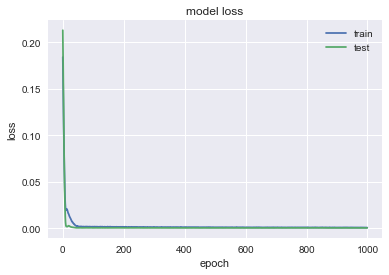

               BLK
MSE        29.8278
MAE        4.27524
R2        0.948831
MAPE (%)   0.97495


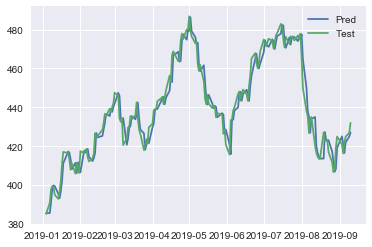

Predicting for  DVA
Train on 1008 samples, validate on 172 samples
Epoch 1/1000
0s - loss: 0.4411 - val_loss: 0.0678
Epoch 2/1000
0s - loss: 0.3764 - val_loss: 0.0515
Epoch 3/1000
0s - loss: 0.3167 - val_loss: 0.0374
Epoch 4/1000
0s - loss: 0.2633 - val_loss: 0.0254
Epoch 5/1000
0s - loss: 0.2120 - val_loss: 0.0156
Epoch 6/1000
0s - loss: 0.1662 - val_loss: 0.0084
Epoch 7/1000
0s - loss: 0.1215 - val_loss: 0.0045
Epoch 8/1000
0s - loss: 0.0824 - val_loss: 0.0046
Epoch 9/1000
0s - loss: 0.0505 - val_loss: 0.0093
Epoch 10/1000
0s - loss: 0.0286 - val_loss: 0.0182
Epoch 11/1000
0s - loss: 0.0154 - val_loss: 0.0297
Epoch 12/1000
0s - loss: 0.0112 - val_loss: 0.0405
Epoch 13/1000
0s - loss: 0.0114 - val_loss: 0.0472
Epoch 14/1000
0s - loss: 0.0129 - val_loss: 0.0485
Epoch 15/1000
0s - loss: 0.0123 - val_loss: 0.0454
Epoch 16/1000
0s - loss: 0.0110 - val_loss: 0.0401
Epoch 17/1000
0s - loss: 0.0098 - val_loss: 0.0348
Epoch 18/1000
0s - loss: 0.0092 - val_loss: 0.0306
Epoch 19/1000
0s - loss:

0s - loss: 0.0028 - val_loss: 8.3321e-04
Epoch 161/1000
0s - loss: 0.0028 - val_loss: 8.6576e-04
Epoch 162/1000
0s - loss: 0.0031 - val_loss: 8.8092e-04
Epoch 163/1000
0s - loss: 0.0029 - val_loss: 8.4659e-04
Epoch 164/1000
0s - loss: 0.0029 - val_loss: 8.0918e-04
Epoch 165/1000
0s - loss: 0.0030 - val_loss: 8.2688e-04
Epoch 166/1000
0s - loss: 0.0028 - val_loss: 8.4050e-04
Epoch 167/1000
0s - loss: 0.0027 - val_loss: 8.3898e-04
Epoch 168/1000
0s - loss: 0.0029 - val_loss: 8.3764e-04
Epoch 169/1000
0s - loss: 0.0029 - val_loss: 8.3629e-04
Epoch 170/1000
0s - loss: 0.0027 - val_loss: 8.0605e-04
Epoch 171/1000
0s - loss: 0.0027 - val_loss: 8.1151e-04
Epoch 172/1000
0s - loss: 0.0030 - val_loss: 8.7644e-04
Epoch 173/1000
0s - loss: 0.0028 - val_loss: 9.0859e-04
Epoch 174/1000
0s - loss: 0.0027 - val_loss: 8.6779e-04
Epoch 175/1000
0s - loss: 0.0030 - val_loss: 8.2308e-04
Epoch 176/1000
0s - loss: 0.0025 - val_loss: 8.0732e-04
Epoch 177/1000
0s - loss: 0.0029 - val_loss: 8.1516e-04
Epoch 1

0s - loss: 0.0024 - val_loss: 7.8572e-04
Epoch 311/1000
0s - loss: 0.0025 - val_loss: 7.6951e-04
Epoch 312/1000
0s - loss: 0.0024 - val_loss: 7.8361e-04
Epoch 313/1000
0s - loss: 0.0025 - val_loss: 7.9774e-04
Epoch 314/1000
0s - loss: 0.0025 - val_loss: 7.9025e-04
Epoch 315/1000
0s - loss: 0.0024 - val_loss: 8.0005e-04
Epoch 316/1000
0s - loss: 0.0025 - val_loss: 8.0145e-04
Epoch 317/1000
0s - loss: 0.0023 - val_loss: 7.8825e-04
Epoch 318/1000
0s - loss: 0.0022 - val_loss: 7.7646e-04
Epoch 319/1000
0s - loss: 0.0021 - val_loss: 7.3813e-04
Epoch 320/1000
0s - loss: 0.0023 - val_loss: 7.5569e-04
Epoch 321/1000
0s - loss: 0.0023 - val_loss: 7.9407e-04
Epoch 322/1000
0s - loss: 0.0023 - val_loss: 7.8245e-04
Epoch 323/1000
0s - loss: 0.0023 - val_loss: 7.5444e-04
Epoch 324/1000
0s - loss: 0.0023 - val_loss: 7.3874e-04
Epoch 325/1000
0s - loss: 0.0021 - val_loss: 7.3699e-04
Epoch 326/1000
0s - loss: 0.0023 - val_loss: 7.6833e-04
Epoch 327/1000
0s - loss: 0.0023 - val_loss: 7.8461e-04
Epoch 3

0s - loss: 0.0023 - val_loss: 7.3344e-04
Epoch 459/1000
0s - loss: 0.0019 - val_loss: 7.2786e-04
Epoch 460/1000
0s - loss: 0.0021 - val_loss: 6.9951e-04
Epoch 461/1000
0s - loss: 0.0021 - val_loss: 7.1747e-04
Epoch 462/1000
0s - loss: 0.0019 - val_loss: 7.2322e-04
Epoch 463/1000
0s - loss: 0.0020 - val_loss: 7.0930e-04
Epoch 464/1000
0s - loss: 0.0019 - val_loss: 7.1302e-04
Epoch 465/1000
0s - loss: 0.0021 - val_loss: 7.0812e-04
Epoch 466/1000
0s - loss: 0.0021 - val_loss: 7.1810e-04
Epoch 467/1000
0s - loss: 0.0020 - val_loss: 7.1122e-04
Epoch 468/1000
0s - loss: 0.0020 - val_loss: 7.0802e-04
Epoch 469/1000
0s - loss: 0.0018 - val_loss: 7.0185e-04
Epoch 470/1000
0s - loss: 0.0019 - val_loss: 7.5501e-04
Epoch 471/1000
0s - loss: 0.0021 - val_loss: 7.1422e-04
Epoch 472/1000
0s - loss: 0.0022 - val_loss: 7.0475e-04
Epoch 473/1000
0s - loss: 0.0022 - val_loss: 7.0953e-04
Epoch 474/1000
0s - loss: 0.0021 - val_loss: 7.6494e-04
Epoch 475/1000
0s - loss: 0.0022 - val_loss: 6.9898e-04
Epoch 4

0s - loss: 0.0018 - val_loss: 7.0259e-04
Epoch 606/1000
0s - loss: 0.0017 - val_loss: 6.9678e-04
Epoch 607/1000
0s - loss: 0.0018 - val_loss: 6.9706e-04
Epoch 608/1000
0s - loss: 0.0018 - val_loss: 7.0160e-04
Epoch 609/1000
0s - loss: 0.0017 - val_loss: 6.9971e-04
Epoch 610/1000
0s - loss: 0.0017 - val_loss: 6.9894e-04
Epoch 611/1000
0s - loss: 0.0018 - val_loss: 7.0173e-04
Epoch 612/1000
0s - loss: 0.0019 - val_loss: 6.9805e-04
Epoch 613/1000
0s - loss: 0.0018 - val_loss: 6.9732e-04
Epoch 614/1000
0s - loss: 0.0016 - val_loss: 7.0166e-04
Epoch 615/1000
0s - loss: 0.0019 - val_loss: 7.1309e-04
Epoch 616/1000
0s - loss: 0.0019 - val_loss: 7.0041e-04
Epoch 617/1000
0s - loss: 0.0018 - val_loss: 7.0183e-04
Epoch 618/1000
0s - loss: 0.0018 - val_loss: 7.1317e-04
Epoch 619/1000
0s - loss: 0.0017 - val_loss: 6.9731e-04
Epoch 620/1000
0s - loss: 0.0018 - val_loss: 7.0067e-04
Epoch 621/1000
0s - loss: 0.0018 - val_loss: 7.0247e-04
Epoch 622/1000
0s - loss: 0.0017 - val_loss: 6.9939e-04
Epoch 6

0s - loss: 0.0016 - val_loss: 7.0229e-04
Epoch 757/1000
0s - loss: 0.0015 - val_loss: 7.0057e-04
Epoch 758/1000
0s - loss: 0.0015 - val_loss: 7.0267e-04
Epoch 759/1000
0s - loss: 0.0015 - val_loss: 7.0056e-04
Epoch 760/1000
0s - loss: 0.0015 - val_loss: 7.0094e-04
Epoch 761/1000
0s - loss: 0.0016 - val_loss: 7.0315e-04
Epoch 762/1000
0s - loss: 0.0017 - val_loss: 7.1771e-04
Epoch 763/1000
0s - loss: 0.0016 - val_loss: 7.1350e-04
Epoch 764/1000
0s - loss: 0.0015 - val_loss: 7.0328e-04
Epoch 765/1000
0s - loss: 0.0015 - val_loss: 7.0878e-04
Epoch 766/1000
0s - loss: 0.0014 - val_loss: 7.4039e-04
Epoch 767/1000
0s - loss: 0.0016 - val_loss: 7.1041e-04
Epoch 768/1000
0s - loss: 0.0015 - val_loss: 7.0057e-04
Epoch 769/1000
0s - loss: 0.0015 - val_loss: 7.0770e-04
Epoch 770/1000
0s - loss: 0.0015 - val_loss: 7.0351e-04
Epoch 771/1000
0s - loss: 0.0016 - val_loss: 7.0522e-04
Epoch 772/1000
0s - loss: 0.0015 - val_loss: 6.9653e-04
Epoch 773/1000
0s - loss: 0.0016 - val_loss: 6.9744e-04
Epoch 7

0s - loss: 0.0013 - val_loss: 7.0255e-04
Epoch 909/1000
0s - loss: 0.0014 - val_loss: 7.0447e-04
Epoch 910/1000
0s - loss: 0.0015 - val_loss: 7.0230e-04
Epoch 911/1000
0s - loss: 0.0014 - val_loss: 7.0337e-04
Epoch 912/1000
0s - loss: 0.0013 - val_loss: 7.0921e-04
Epoch 913/1000
0s - loss: 0.0013 - val_loss: 7.0936e-04
Epoch 914/1000
0s - loss: 0.0013 - val_loss: 7.0154e-04
Epoch 915/1000
0s - loss: 0.0012 - val_loss: 7.0009e-04
Epoch 916/1000
0s - loss: 0.0014 - val_loss: 7.0210e-04
Epoch 917/1000
0s - loss: 0.0013 - val_loss: 7.1035e-04
Epoch 918/1000
0s - loss: 0.0013 - val_loss: 7.0575e-04
Epoch 919/1000
0s - loss: 0.0014 - val_loss: 7.1182e-04
Epoch 920/1000
0s - loss: 0.0013 - val_loss: 7.0198e-04
Epoch 921/1000
0s - loss: 0.0013 - val_loss: 7.0506e-04
Epoch 922/1000
0s - loss: 0.0013 - val_loss: 7.1214e-04
Epoch 923/1000
0s - loss: 0.0013 - val_loss: 7.0111e-04
Epoch 924/1000
0s - loss: 0.0014 - val_loss: 7.0115e-04
Epoch 925/1000
0s - loss: 0.0014 - val_loss: 7.1102e-04
Epoch 9

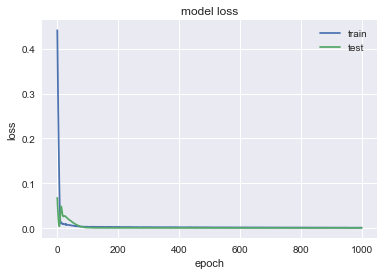

               DVA
MSE        1.22603
MAE       0.795163
R2        0.905504
MAPE (%)   1.46896


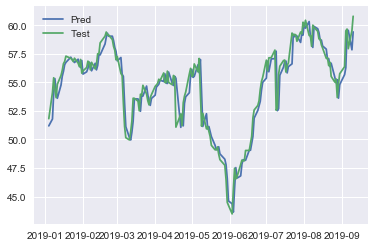

Predicting for  BA
Train on 1008 samples, validate on 172 samples
Epoch 1/1000
0s - loss: 0.1419 - val_loss: 0.5011
Epoch 2/1000
0s - loss: 0.1165 - val_loss: 0.4236
Epoch 3/1000
0s - loss: 0.0935 - val_loss: 0.3502
Epoch 4/1000
0s - loss: 0.0738 - val_loss: 0.2820
Epoch 5/1000
0s - loss: 0.0565 - val_loss: 0.2199
Epoch 6/1000
0s - loss: 0.0428 - val_loss: 0.1651
Epoch 7/1000
0s - loss: 0.0332 - val_loss: 0.1187
Epoch 8/1000
0s - loss: 0.0271 - val_loss: 0.0818
Epoch 9/1000
0s - loss: 0.0247 - val_loss: 0.0544
Epoch 10/1000
0s - loss: 0.0246 - val_loss: 0.0360
Epoch 11/1000
0s - loss: 0.0251 - val_loss: 0.0247
Epoch 12/1000
0s - loss: 0.0259 - val_loss: 0.0186
Epoch 13/1000
0s - loss: 0.0261 - val_loss: 0.0159
Epoch 14/1000
0s - loss: 0.0251 - val_loss: 0.0154
Epoch 15/1000
0s - loss: 0.0232 - val_loss: 0.0158
Epoch 16/1000
0s - loss: 0.0205 - val_loss: 0.0167
Epoch 17/1000
0s - loss: 0.0183 - val_loss: 0.0175
Epoch 18/1000
0s - loss: 0.0166 - val_loss: 0.0176
Epoch 19/1000
0s - loss: 

0s - loss: 0.0010 - val_loss: 4.8245e-04
Epoch 152/1000
0s - loss: 0.0011 - val_loss: 4.6643e-04
Epoch 153/1000
0s - loss: 9.6693e-04 - val_loss: 4.7064e-04
Epoch 154/1000
0s - loss: 0.0010 - val_loss: 4.7397e-04
Epoch 155/1000
0s - loss: 0.0011 - val_loss: 4.6847e-04
Epoch 156/1000
0s - loss: 0.0011 - val_loss: 4.6689e-04
Epoch 157/1000
0s - loss: 0.0010 - val_loss: 4.6440e-04
Epoch 158/1000
0s - loss: 9.8850e-04 - val_loss: 4.6696e-04
Epoch 159/1000
0s - loss: 0.0010 - val_loss: 4.7793e-04
Epoch 160/1000
0s - loss: 9.5499e-04 - val_loss: 4.6354e-04
Epoch 161/1000
0s - loss: 9.6184e-04 - val_loss: 4.7363e-04
Epoch 162/1000
0s - loss: 0.0011 - val_loss: 4.8570e-04
Epoch 163/1000
0s - loss: 0.0011 - val_loss: 4.6666e-04
Epoch 164/1000
0s - loss: 0.0011 - val_loss: 4.6885e-04
Epoch 165/1000
0s - loss: 0.0010 - val_loss: 4.6913e-04
Epoch 166/1000
0s - loss: 0.0011 - val_loss: 4.6525e-04
Epoch 167/1000
0s - loss: 0.0010 - val_loss: 4.6354e-04
Epoch 168/1000
0s - loss: 0.0011 - val_loss: 4.

0s - loss: 9.1425e-04 - val_loss: 4.4590e-04
Epoch 297/1000
0s - loss: 8.8550e-04 - val_loss: 4.5857e-04
Epoch 298/1000
0s - loss: 8.8578e-04 - val_loss: 4.5382e-04
Epoch 299/1000
0s - loss: 9.8845e-04 - val_loss: 4.5654e-04
Epoch 300/1000
0s - loss: 8.8642e-04 - val_loss: 4.4534e-04
Epoch 301/1000
0s - loss: 8.9179e-04 - val_loss: 4.3834e-04
Epoch 302/1000
0s - loss: 9.1435e-04 - val_loss: 4.6231e-04
Epoch 303/1000
0s - loss: 8.8657e-04 - val_loss: 5.2591e-04
Epoch 304/1000
0s - loss: 8.6267e-04 - val_loss: 5.0630e-04
Epoch 305/1000
0s - loss: 8.5109e-04 - val_loss: 4.5685e-04
Epoch 306/1000
0s - loss: 8.3294e-04 - val_loss: 4.3710e-04
Epoch 307/1000
0s - loss: 9.0776e-04 - val_loss: 4.7443e-04
Epoch 308/1000
0s - loss: 8.2012e-04 - val_loss: 5.6542e-04
Epoch 309/1000
0s - loss: 8.2899e-04 - val_loss: 5.1410e-04
Epoch 310/1000
0s - loss: 7.9602e-04 - val_loss: 4.3575e-04
Epoch 311/1000
0s - loss: 8.8034e-04 - val_loss: 4.3753e-04
Epoch 312/1000
0s - loss: 0.0010 - val_loss: 4.3252e-04

0s - loss: 6.9915e-04 - val_loss: 4.9217e-04
Epoch 434/1000
0s - loss: 7.3780e-04 - val_loss: 6.3058e-04
Epoch 435/1000
0s - loss: 7.4805e-04 - val_loss: 5.0048e-04
Epoch 436/1000
0s - loss: 7.5122e-04 - val_loss: 4.1759e-04
Epoch 437/1000
0s - loss: 8.4778e-04 - val_loss: 4.2119e-04
Epoch 438/1000
0s - loss: 8.0843e-04 - val_loss: 4.8687e-04
Epoch 439/1000
0s - loss: 7.7208e-04 - val_loss: 5.3097e-04
Epoch 440/1000
0s - loss: 6.3465e-04 - val_loss: 4.3630e-04
Epoch 441/1000
0s - loss: 8.0193e-04 - val_loss: 4.2357e-04
Epoch 442/1000
0s - loss: 7.0133e-04 - val_loss: 4.5626e-04
Epoch 443/1000
0s - loss: 8.4839e-04 - val_loss: 4.3729e-04
Epoch 444/1000
0s - loss: 7.4225e-04 - val_loss: 4.4459e-04
Epoch 445/1000
0s - loss: 7.9817e-04 - val_loss: 4.8175e-04
Epoch 446/1000
0s - loss: 7.0931e-04 - val_loss: 5.4907e-04
Epoch 447/1000
0s - loss: 6.7624e-04 - val_loss: 5.2076e-04
Epoch 448/1000
0s - loss: 7.1593e-04 - val_loss: 5.2369e-04
Epoch 449/1000
0s - loss: 6.9590e-04 - val_loss: 4.7129

0s - loss: 7.6991e-04 - val_loss: 4.4763e-04
Epoch 575/1000
0s - loss: 6.9913e-04 - val_loss: 4.1776e-04
Epoch 576/1000
0s - loss: 6.7801e-04 - val_loss: 4.4199e-04
Epoch 577/1000
0s - loss: 6.6787e-04 - val_loss: 5.4196e-04
Epoch 578/1000
0s - loss: 7.5285e-04 - val_loss: 4.4344e-04
Epoch 579/1000
0s - loss: 6.4666e-04 - val_loss: 4.6002e-04
Epoch 580/1000
0s - loss: 6.9988e-04 - val_loss: 5.0126e-04
Epoch 581/1000
0s - loss: 7.4568e-04 - val_loss: 4.5455e-04
Epoch 582/1000
0s - loss: 6.8428e-04 - val_loss: 4.4919e-04
Epoch 583/1000
0s - loss: 7.3643e-04 - val_loss: 4.9556e-04
Epoch 584/1000
0s - loss: 7.0966e-04 - val_loss: 4.8056e-04
Epoch 585/1000
0s - loss: 6.5249e-04 - val_loss: 4.4551e-04
Epoch 586/1000
0s - loss: 7.0957e-04 - val_loss: 4.9840e-04
Epoch 587/1000
0s - loss: 6.5356e-04 - val_loss: 5.2871e-04
Epoch 588/1000
0s - loss: 7.1390e-04 - val_loss: 5.0016e-04
Epoch 589/1000
0s - loss: 5.9141e-04 - val_loss: 5.6123e-04
Epoch 590/1000
0s - loss: 6.8810e-04 - val_loss: 4.6414

0s - loss: 5.8733e-04 - val_loss: 5.2116e-04
Epoch 716/1000
0s - loss: 6.4237e-04 - val_loss: 4.6225e-04
Epoch 717/1000
0s - loss: 6.0846e-04 - val_loss: 4.5740e-04
Epoch 718/1000
0s - loss: 7.3185e-04 - val_loss: 6.1669e-04
Epoch 719/1000
0s - loss: 6.5055e-04 - val_loss: 6.4753e-04
Epoch 720/1000
0s - loss: 5.8893e-04 - val_loss: 5.0012e-04
Epoch 721/1000
0s - loss: 6.9114e-04 - val_loss: 5.3333e-04
Epoch 722/1000
0s - loss: 5.7530e-04 - val_loss: 5.2647e-04
Epoch 723/1000
0s - loss: 5.8617e-04 - val_loss: 4.6978e-04
Epoch 724/1000
0s - loss: 7.2078e-04 - val_loss: 4.5482e-04
Epoch 725/1000
0s - loss: 5.9547e-04 - val_loss: 5.3503e-04
Epoch 726/1000
0s - loss: 5.8715e-04 - val_loss: 4.4499e-04
Epoch 727/1000
0s - loss: 5.7233e-04 - val_loss: 4.8336e-04
Epoch 728/1000
0s - loss: 6.6153e-04 - val_loss: 5.4407e-04
Epoch 729/1000
0s - loss: 6.3656e-04 - val_loss: 5.1398e-04
Epoch 730/1000
0s - loss: 6.3206e-04 - val_loss: 5.3983e-04
Epoch 731/1000
0s - loss: 5.9387e-04 - val_loss: 5.1629

0s - loss: 6.0393e-04 - val_loss: 4.2635e-04
Epoch 853/1000
0s - loss: 6.0929e-04 - val_loss: 5.0768e-04
Epoch 854/1000
0s - loss: 6.1030e-04 - val_loss: 5.7037e-04
Epoch 855/1000
0s - loss: 6.3127e-04 - val_loss: 4.3788e-04
Epoch 856/1000
0s - loss: 5.8289e-04 - val_loss: 4.9769e-04
Epoch 857/1000
0s - loss: 6.0253e-04 - val_loss: 5.1690e-04
Epoch 858/1000
0s - loss: 5.7215e-04 - val_loss: 4.3427e-04
Epoch 859/1000
0s - loss: 5.5831e-04 - val_loss: 5.2475e-04
Epoch 860/1000
0s - loss: 5.9779e-04 - val_loss: 5.2347e-04
Epoch 861/1000
0s - loss: 5.6732e-04 - val_loss: 5.6523e-04
Epoch 862/1000
0s - loss: 5.6863e-04 - val_loss: 5.8840e-04
Epoch 863/1000
0s - loss: 5.6449e-04 - val_loss: 4.6591e-04
Epoch 864/1000
0s - loss: 6.0591e-04 - val_loss: 4.7157e-04
Epoch 865/1000
0s - loss: 5.9383e-04 - val_loss: 5.3849e-04
Epoch 866/1000
0s - loss: 6.2400e-04 - val_loss: 5.7192e-04
Epoch 867/1000
0s - loss: 6.5370e-04 - val_loss: 4.5861e-04
Epoch 868/1000
0s - loss: 5.1522e-04 - val_loss: 6.7972

0s - loss: 5.9173e-04 - val_loss: 5.5342e-04
Epoch 994/1000
0s - loss: 4.8740e-04 - val_loss: 4.1879e-04
Epoch 995/1000
0s - loss: 5.7004e-04 - val_loss: 4.7980e-04
Epoch 996/1000
0s - loss: 6.5051e-04 - val_loss: 5.5817e-04
Epoch 997/1000
0s - loss: 4.9177e-04 - val_loss: 4.4704e-04
Epoch 998/1000
0s - loss: 5.6690e-04 - val_loss: 5.2048e-04
Epoch 999/1000
0s - loss: 5.7382e-04 - val_loss: 4.6381e-04
Epoch 1000/1000
0s - loss: 5.5491e-04 - val_loss: 4.9831e-04


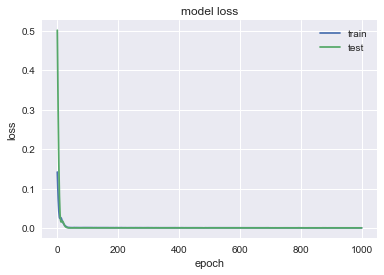

                BA
MSE        57.9068
MAE        5.40378
R2        0.902635
MAPE (%)   1.44949


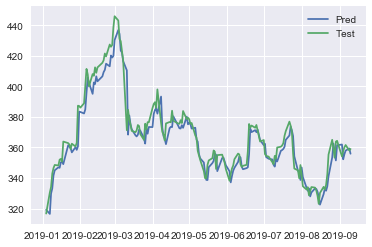

Predicting for  IBM
Train on 1008 samples, validate on 172 samples
Epoch 1/1000
0s - loss: 0.3701 - val_loss: 0.1307
Epoch 2/1000
0s - loss: 0.3088 - val_loss: 0.1013
Epoch 3/1000
0s - loss: 0.2528 - val_loss: 0.0753
Epoch 4/1000
0s - loss: 0.2006 - val_loss: 0.0522
Epoch 5/1000
0s - loss: 0.1541 - val_loss: 0.0324
Epoch 6/1000
0s - loss: 0.1118 - val_loss: 0.0169
Epoch 7/1000
0s - loss: 0.0738 - val_loss: 0.0068
Epoch 8/1000
0s - loss: 0.0441 - val_loss: 0.0029
Epoch 9/1000
0s - loss: 0.0249 - val_loss: 0.0052
Epoch 10/1000
0s - loss: 0.0139 - val_loss: 0.0116
Epoch 11/1000
0s - loss: 0.0110 - val_loss: 0.0184
Epoch 12/1000
0s - loss: 0.0120 - val_loss: 0.0220
Epoch 13/1000
0s - loss: 0.0129 - val_loss: 0.0210
Epoch 14/1000
0s - loss: 0.0120 - val_loss: 0.0173
Epoch 15/1000
0s - loss: 0.0107 - val_loss: 0.0132
Epoch 16/1000
0s - loss: 0.0099 - val_loss: 0.0099
Epoch 17/1000
0s - loss: 0.0092 - val_loss: 0.0079
Epoch 18/1000
0s - loss: 0.0096 - val_loss: 0.0068
Epoch 19/1000
0s - loss:

0s - loss: 0.0027 - val_loss: 5.3920e-04
Epoch 153/1000
0s - loss: 0.0027 - val_loss: 5.1967e-04
Epoch 154/1000
0s - loss: 0.0029 - val_loss: 5.2029e-04
Epoch 155/1000
0s - loss: 0.0028 - val_loss: 5.3153e-04
Epoch 156/1000
0s - loss: 0.0027 - val_loss: 5.5166e-04
Epoch 157/1000
0s - loss: 0.0026 - val_loss: 5.6376e-04
Epoch 158/1000
0s - loss: 0.0026 - val_loss: 5.2684e-04
Epoch 159/1000
0s - loss: 0.0028 - val_loss: 4.8984e-04
Epoch 160/1000
0s - loss: 0.0027 - val_loss: 4.8600e-04
Epoch 161/1000
0s - loss: 0.0027 - val_loss: 5.0364e-04
Epoch 162/1000
0s - loss: 0.0025 - val_loss: 5.5153e-04
Epoch 163/1000
0s - loss: 0.0028 - val_loss: 5.1512e-04
Epoch 164/1000
0s - loss: 0.0026 - val_loss: 4.9432e-04
Epoch 165/1000
0s - loss: 0.0025 - val_loss: 4.8860e-04
Epoch 166/1000
0s - loss: 0.0027 - val_loss: 4.9173e-04
Epoch 167/1000
0s - loss: 0.0026 - val_loss: 5.0248e-04
Epoch 168/1000
0s - loss: 0.0026 - val_loss: 5.2001e-04
Epoch 169/1000
0s - loss: 0.0027 - val_loss: 5.2987e-04
Epoch 1

0s - loss: 0.0022 - val_loss: 4.9478e-04
Epoch 301/1000
0s - loss: 0.0023 - val_loss: 5.0097e-04
Epoch 302/1000
0s - loss: 0.0021 - val_loss: 5.1662e-04
Epoch 303/1000
0s - loss: 0.0021 - val_loss: 5.2722e-04
Epoch 304/1000
0s - loss: 0.0023 - val_loss: 5.0652e-04
Epoch 305/1000
0s - loss: 0.0022 - val_loss: 5.0577e-04
Epoch 306/1000
0s - loss: 0.0022 - val_loss: 5.2745e-04
Epoch 307/1000
0s - loss: 0.0023 - val_loss: 5.2479e-04
Epoch 308/1000
0s - loss: 0.0022 - val_loss: 4.9357e-04
Epoch 309/1000
0s - loss: 0.0022 - val_loss: 4.8978e-04
Epoch 310/1000
0s - loss: 0.0020 - val_loss: 4.9885e-04
Epoch 311/1000
0s - loss: 0.0021 - val_loss: 5.0942e-04
Epoch 312/1000
0s - loss: 0.0021 - val_loss: 5.0469e-04
Epoch 313/1000
0s - loss: 0.0020 - val_loss: 4.9928e-04
Epoch 314/1000
0s - loss: 0.0020 - val_loss: 5.1526e-04
Epoch 315/1000
0s - loss: 0.0023 - val_loss: 5.1496e-04
Epoch 316/1000
0s - loss: 0.0023 - val_loss: 5.0539e-04
Epoch 317/1000
0s - loss: 0.0022 - val_loss: 4.9501e-04
Epoch 3

0s - loss: 0.0018 - val_loss: 5.1365e-04
Epoch 448/1000
0s - loss: 0.0019 - val_loss: 5.1217e-04
Epoch 449/1000
0s - loss: 0.0019 - val_loss: 5.1685e-04
Epoch 450/1000
0s - loss: 0.0019 - val_loss: 5.0706e-04
Epoch 451/1000
0s - loss: 0.0019 - val_loss: 5.1250e-04
Epoch 452/1000
0s - loss: 0.0020 - val_loss: 5.4400e-04
Epoch 453/1000
0s - loss: 0.0019 - val_loss: 5.1894e-04
Epoch 454/1000
0s - loss: 0.0018 - val_loss: 5.2054e-04
Epoch 455/1000
0s - loss: 0.0017 - val_loss: 5.3352e-04
Epoch 456/1000
0s - loss: 0.0018 - val_loss: 5.0723e-04
Epoch 457/1000
0s - loss: 0.0019 - val_loss: 5.0439e-04
Epoch 458/1000
0s - loss: 0.0020 - val_loss: 5.2652e-04
Epoch 459/1000
0s - loss: 0.0018 - val_loss: 5.5466e-04
Epoch 460/1000
0s - loss: 0.0018 - val_loss: 5.0527e-04
Epoch 461/1000
0s - loss: 0.0019 - val_loss: 5.0566e-04
Epoch 462/1000
0s - loss: 0.0019 - val_loss: 5.3436e-04
Epoch 463/1000
0s - loss: 0.0018 - val_loss: 5.0804e-04
Epoch 464/1000
0s - loss: 0.0019 - val_loss: 5.0281e-04
Epoch 4

0s - loss: 0.0017 - val_loss: 5.0476e-04
Epoch 596/1000
0s - loss: 0.0018 - val_loss: 5.0773e-04
Epoch 597/1000
0s - loss: 0.0017 - val_loss: 5.2137e-04
Epoch 598/1000
0s - loss: 0.0016 - val_loss: 5.4529e-04
Epoch 599/1000
0s - loss: 0.0017 - val_loss: 5.4024e-04
Epoch 600/1000
0s - loss: 0.0019 - val_loss: 5.0802e-04
Epoch 601/1000
0s - loss: 0.0016 - val_loss: 5.4063e-04
Epoch 602/1000
0s - loss: 0.0018 - val_loss: 5.3195e-04
Epoch 603/1000
0s - loss: 0.0017 - val_loss: 5.0863e-04
Epoch 604/1000
0s - loss: 0.0016 - val_loss: 5.2409e-04
Epoch 605/1000
0s - loss: 0.0017 - val_loss: 5.2303e-04
Epoch 606/1000
0s - loss: 0.0017 - val_loss: 5.0301e-04
Epoch 607/1000
0s - loss: 0.0016 - val_loss: 5.2336e-04
Epoch 608/1000
0s - loss: 0.0016 - val_loss: 5.0618e-04
Epoch 609/1000
0s - loss: 0.0016 - val_loss: 5.1204e-04
Epoch 610/1000
0s - loss: 0.0017 - val_loss: 5.4895e-04
Epoch 611/1000
0s - loss: 0.0017 - val_loss: 5.0599e-04
Epoch 612/1000
0s - loss: 0.0016 - val_loss: 5.0601e-04
Epoch 6

0s - loss: 0.0015 - val_loss: 5.3383e-04
Epoch 747/1000
0s - loss: 0.0015 - val_loss: 5.4034e-04
Epoch 748/1000
0s - loss: 0.0014 - val_loss: 5.0300e-04
Epoch 749/1000
0s - loss: 0.0014 - val_loss: 5.2024e-04
Epoch 750/1000
0s - loss: 0.0015 - val_loss: 5.4460e-04
Epoch 751/1000
0s - loss: 0.0015 - val_loss: 5.0172e-04
Epoch 752/1000
0s - loss: 0.0015 - val_loss: 5.3838e-04
Epoch 753/1000
0s - loss: 0.0015 - val_loss: 5.0991e-04
Epoch 754/1000
0s - loss: 0.0014 - val_loss: 5.0804e-04
Epoch 755/1000
0s - loss: 0.0015 - val_loss: 5.2405e-04
Epoch 756/1000
0s - loss: 0.0014 - val_loss: 5.1534e-04
Epoch 757/1000
0s - loss: 0.0014 - val_loss: 5.0123e-04
Epoch 758/1000
0s - loss: 0.0015 - val_loss: 5.2173e-04
Epoch 759/1000
0s - loss: 0.0014 - val_loss: 5.0408e-04
Epoch 760/1000
0s - loss: 0.0014 - val_loss: 5.0014e-04
Epoch 761/1000
0s - loss: 0.0014 - val_loss: 5.0943e-04
Epoch 762/1000
0s - loss: 0.0015 - val_loss: 5.1619e-04
Epoch 763/1000
0s - loss: 0.0015 - val_loss: 5.0554e-04
Epoch 7

0s - loss: 0.0013 - val_loss: 5.1584e-04
Epoch 897/1000
0s - loss: 0.0012 - val_loss: 5.1105e-04
Epoch 898/1000
0s - loss: 0.0012 - val_loss: 5.1607e-04
Epoch 899/1000
0s - loss: 0.0012 - val_loss: 5.0515e-04
Epoch 900/1000
0s - loss: 0.0013 - val_loss: 5.0164e-04
Epoch 901/1000
0s - loss: 0.0013 - val_loss: 5.4610e-04
Epoch 902/1000
0s - loss: 0.0013 - val_loss: 5.1955e-04
Epoch 903/1000
0s - loss: 0.0013 - val_loss: 5.2520e-04
Epoch 904/1000
0s - loss: 0.0013 - val_loss: 5.0374e-04
Epoch 905/1000
0s - loss: 0.0012 - val_loss: 5.0231e-04
Epoch 906/1000
0s - loss: 0.0012 - val_loss: 5.1595e-04
Epoch 907/1000
0s - loss: 0.0012 - val_loss: 5.2787e-04
Epoch 908/1000
0s - loss: 0.0014 - val_loss: 5.0316e-04
Epoch 909/1000
0s - loss: 0.0013 - val_loss: 5.2920e-04
Epoch 910/1000
0s - loss: 0.0012 - val_loss: 5.2685e-04
Epoch 911/1000
0s - loss: 0.0012 - val_loss: 5.1029e-04
Epoch 912/1000
0s - loss: 0.0012 - val_loss: 5.2120e-04
Epoch 913/1000
0s - loss: 0.0012 - val_loss: 4.9588e-04
Epoch 9

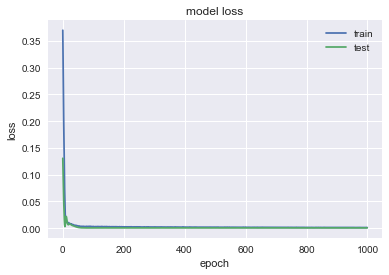

               IBM
MSE        2.87237
MAE        1.16448
R2        0.936404
MAPE (%)  0.854811


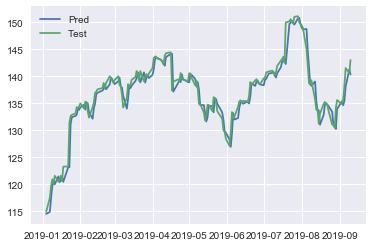

Predicting for  ALB
Train on 1008 samples, validate on 172 samples
Epoch 1/1000
0s - loss: 0.2129 - val_loss: 0.0807
Epoch 2/1000
0s - loss: 0.1759 - val_loss: 0.0601
Epoch 3/1000
0s - loss: 0.1408 - val_loss: 0.0419
Epoch 4/1000
0s - loss: 0.1090 - val_loss: 0.0265
Epoch 5/1000
0s - loss: 0.0805 - val_loss: 0.0144
Epoch 6/1000
0s - loss: 0.0567 - val_loss: 0.0063
Epoch 7/1000
0s - loss: 0.0381 - val_loss: 0.0025
Epoch 8/1000
0s - loss: 0.0249 - val_loss: 0.0031
Epoch 9/1000
0s - loss: 0.0196 - val_loss: 0.0067
Epoch 10/1000
0s - loss: 0.0184 - val_loss: 0.0114
Epoch 11/1000
0s - loss: 0.0186 - val_loss: 0.0147
Epoch 12/1000
0s - loss: 0.0198 - val_loss: 0.0155
Epoch 13/1000
0s - loss: 0.0201 - val_loss: 0.0140
Epoch 14/1000
0s - loss: 0.0188 - val_loss: 0.0115
Epoch 15/1000
0s - loss: 0.0173 - val_loss: 0.0090
Epoch 16/1000
0s - loss: 0.0156 - val_loss: 0.0069
Epoch 17/1000
0s - loss: 0.0148 - val_loss: 0.0056
Epoch 18/1000
0s - loss: 0.0144 - val_loss: 0.0049
Epoch 19/1000
0s - loss:

0s - loss: 0.0013 - val_loss: 2.5206e-04
Epoch 153/1000
0s - loss: 0.0017 - val_loss: 2.5427e-04
Epoch 154/1000
0s - loss: 0.0018 - val_loss: 2.7570e-04
Epoch 155/1000
0s - loss: 0.0016 - val_loss: 2.8109e-04
Epoch 156/1000
0s - loss: 0.0017 - val_loss: 2.5834e-04
Epoch 157/1000
0s - loss: 0.0017 - val_loss: 2.5245e-04
Epoch 158/1000
0s - loss: 0.0015 - val_loss: 2.5280e-04
Epoch 159/1000
0s - loss: 0.0016 - val_loss: 2.6186e-04
Epoch 160/1000
0s - loss: 0.0017 - val_loss: 2.6829e-04
Epoch 161/1000
0s - loss: 0.0016 - val_loss: 2.7059e-04
Epoch 162/1000
0s - loss: 0.0016 - val_loss: 2.6575e-04
Epoch 163/1000
0s - loss: 0.0016 - val_loss: 2.6130e-04
Epoch 164/1000
0s - loss: 0.0017 - val_loss: 2.6518e-04
Epoch 165/1000
0s - loss: 0.0016 - val_loss: 2.5443e-04
Epoch 166/1000
0s - loss: 0.0017 - val_loss: 2.5163e-04
Epoch 167/1000
0s - loss: 0.0015 - val_loss: 2.5167e-04
Epoch 168/1000
0s - loss: 0.0018 - val_loss: 2.5642e-04
Epoch 169/1000
0s - loss: 0.0016 - val_loss: 2.7234e-04
Epoch 1

0s - loss: 0.0012 - val_loss: 2.5268e-04
Epoch 302/1000
0s - loss: 0.0013 - val_loss: 2.5639e-04
Epoch 303/1000
0s - loss: 0.0014 - val_loss: 2.6068e-04
Epoch 304/1000
0s - loss: 0.0011 - val_loss: 2.5390e-04
Epoch 305/1000
0s - loss: 0.0012 - val_loss: 2.5249e-04
Epoch 306/1000
0s - loss: 0.0013 - val_loss: 2.5297e-04
Epoch 307/1000
0s - loss: 0.0014 - val_loss: 2.5399e-04
Epoch 308/1000
0s - loss: 0.0012 - val_loss: 2.5271e-04
Epoch 309/1000
0s - loss: 0.0013 - val_loss: 2.5308e-04
Epoch 310/1000
0s - loss: 0.0014 - val_loss: 2.5402e-04
Epoch 311/1000
0s - loss: 0.0014 - val_loss: 2.5373e-04
Epoch 312/1000
0s - loss: 0.0013 - val_loss: 2.5260e-04
Epoch 313/1000
0s - loss: 0.0012 - val_loss: 2.5464e-04
Epoch 314/1000
0s - loss: 0.0013 - val_loss: 2.5589e-04
Epoch 315/1000
0s - loss: 0.0013 - val_loss: 2.5452e-04
Epoch 316/1000
0s - loss: 0.0014 - val_loss: 2.6714e-04
Epoch 317/1000
0s - loss: 0.0013 - val_loss: 2.5291e-04
Epoch 318/1000
0s - loss: 0.0013 - val_loss: 2.6055e-04
Epoch 3

0s - loss: 0.0011 - val_loss: 2.5398e-04
Epoch 451/1000
0s - loss: 0.0011 - val_loss: 2.5482e-04
Epoch 452/1000
0s - loss: 0.0012 - val_loss: 2.5322e-04
Epoch 453/1000
0s - loss: 0.0011 - val_loss: 2.5338e-04
Epoch 454/1000
0s - loss: 0.0011 - val_loss: 2.5284e-04
Epoch 455/1000
0s - loss: 0.0011 - val_loss: 2.5421e-04
Epoch 456/1000
0s - loss: 0.0012 - val_loss: 2.5957e-04
Epoch 457/1000
0s - loss: 0.0011 - val_loss: 2.5274e-04
Epoch 458/1000
0s - loss: 0.0013 - val_loss: 2.5618e-04
Epoch 459/1000
0s - loss: 0.0012 - val_loss: 2.6350e-04
Epoch 460/1000
0s - loss: 0.0012 - val_loss: 2.6863e-04
Epoch 461/1000
0s - loss: 0.0011 - val_loss: 2.5858e-04
Epoch 462/1000
0s - loss: 0.0011 - val_loss: 2.8520e-04
Epoch 463/1000
0s - loss: 0.0010 - val_loss: 2.5397e-04
Epoch 464/1000
0s - loss: 0.0013 - val_loss: 2.6333e-04
Epoch 465/1000
0s - loss: 0.0011 - val_loss: 2.5458e-04
Epoch 466/1000
0s - loss: 0.0011 - val_loss: 2.5310e-04
Epoch 467/1000
0s - loss: 0.0011 - val_loss: 2.5498e-04
Epoch 4

0s - loss: 9.4992e-04 - val_loss: 2.5948e-04
Epoch 598/1000
0s - loss: 9.3576e-04 - val_loss: 2.5542e-04
Epoch 599/1000
0s - loss: 0.0010 - val_loss: 2.5699e-04
Epoch 600/1000
0s - loss: 0.0011 - val_loss: 2.6421e-04
Epoch 601/1000
0s - loss: 9.1819e-04 - val_loss: 2.6009e-04
Epoch 602/1000
0s - loss: 9.7515e-04 - val_loss: 2.5565e-04
Epoch 603/1000
0s - loss: 9.1437e-04 - val_loss: 2.5442e-04
Epoch 604/1000
0s - loss: 9.7759e-04 - val_loss: 2.5354e-04
Epoch 605/1000
0s - loss: 0.0010 - val_loss: 2.6265e-04
Epoch 606/1000
0s - loss: 0.0011 - val_loss: 2.5434e-04
Epoch 607/1000
0s - loss: 9.4544e-04 - val_loss: 2.6224e-04
Epoch 608/1000
0s - loss: 9.0297e-04 - val_loss: 2.5564e-04
Epoch 609/1000
0s - loss: 0.0011 - val_loss: 2.5893e-04
Epoch 610/1000
0s - loss: 0.0011 - val_loss: 2.5283e-04
Epoch 611/1000
0s - loss: 0.0011 - val_loss: 2.5605e-04
Epoch 612/1000
0s - loss: 9.5518e-04 - val_loss: 2.5925e-04
Epoch 613/1000
0s - loss: 8.8307e-04 - val_loss: 2.5527e-04
Epoch 614/1000
0s - los

0s - loss: 9.4935e-04 - val_loss: 2.5298e-04
Epoch 741/1000
0s - loss: 8.1562e-04 - val_loss: 2.5463e-04
Epoch 742/1000
0s - loss: 9.7659e-04 - val_loss: 2.6978e-04
Epoch 743/1000
0s - loss: 9.2336e-04 - val_loss: 2.5637e-04
Epoch 744/1000
0s - loss: 9.2319e-04 - val_loss: 2.7053e-04
Epoch 745/1000
0s - loss: 9.5298e-04 - val_loss: 2.5964e-04
Epoch 746/1000
0s - loss: 8.3942e-04 - val_loss: 2.5352e-04
Epoch 747/1000
0s - loss: 9.7821e-04 - val_loss: 2.5481e-04
Epoch 748/1000
0s - loss: 8.9025e-04 - val_loss: 2.6418e-04
Epoch 749/1000
0s - loss: 8.9201e-04 - val_loss: 2.5492e-04
Epoch 750/1000
0s - loss: 9.0789e-04 - val_loss: 2.5521e-04
Epoch 751/1000
0s - loss: 8.5114e-04 - val_loss: 2.5337e-04
Epoch 752/1000
0s - loss: 9.3516e-04 - val_loss: 2.5575e-04
Epoch 753/1000
0s - loss: 8.9294e-04 - val_loss: 2.5467e-04
Epoch 754/1000
0s - loss: 8.3537e-04 - val_loss: 2.6030e-04
Epoch 755/1000
0s - loss: 8.7583e-04 - val_loss: 2.6487e-04
Epoch 756/1000
0s - loss: 9.7313e-04 - val_loss: 2.5657

0s - loss: 7.9860e-04 - val_loss: 2.6117e-04
Epoch 881/1000
0s - loss: 8.3968e-04 - val_loss: 2.5570e-04
Epoch 882/1000
0s - loss: 8.5596e-04 - val_loss: 2.6032e-04
Epoch 883/1000
0s - loss: 8.5320e-04 - val_loss: 2.5481e-04
Epoch 884/1000
0s - loss: 8.1543e-04 - val_loss: 2.5679e-04
Epoch 885/1000
0s - loss: 7.5182e-04 - val_loss: 2.5438e-04
Epoch 886/1000
0s - loss: 8.8931e-04 - val_loss: 2.5502e-04
Epoch 887/1000
0s - loss: 7.6169e-04 - val_loss: 2.5507e-04
Epoch 888/1000
0s - loss: 7.4362e-04 - val_loss: 2.5455e-04
Epoch 889/1000
0s - loss: 8.5515e-04 - val_loss: 2.5557e-04
Epoch 890/1000
0s - loss: 8.3109e-04 - val_loss: 2.5714e-04
Epoch 891/1000
0s - loss: 8.1144e-04 - val_loss: 2.5632e-04
Epoch 892/1000
0s - loss: 8.3194e-04 - val_loss: 2.5306e-04
Epoch 893/1000
0s - loss: 8.2526e-04 - val_loss: 2.5327e-04
Epoch 894/1000
0s - loss: 7.6693e-04 - val_loss: 2.5909e-04
Epoch 895/1000
0s - loss: 7.9503e-04 - val_loss: 2.6093e-04
Epoch 896/1000
0s - loss: 7.9598e-04 - val_loss: 2.5938

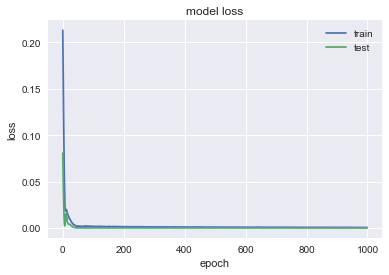

               ALB
MSE        2.87484
MAE        1.24255
R2        0.952528
MAPE (%)    1.6827


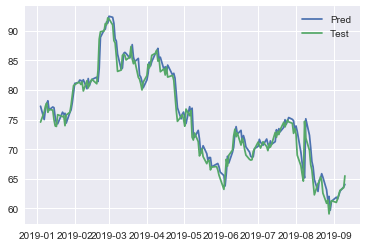

Predicting for  CBRE
Train on 1008 samples, validate on 172 samples
Epoch 1/1000
0s - loss: 0.1962 - val_loss: 0.5536
Epoch 2/1000
0s - loss: 0.1541 - val_loss: 0.4520
Epoch 3/1000
0s - loss: 0.1171 - val_loss: 0.3584
Epoch 4/1000
0s - loss: 0.0856 - val_loss: 0.2736
Epoch 5/1000
0s - loss: 0.0578 - val_loss: 0.1988
Epoch 6/1000
0s - loss: 0.0363 - val_loss: 0.1355
Epoch 7/1000
0s - loss: 0.0230 - val_loss: 0.0857
Epoch 8/1000
0s - loss: 0.0140 - val_loss: 0.0501
Epoch 9/1000
0s - loss: 0.0127 - val_loss: 0.0281
Epoch 10/1000
0s - loss: 0.0129 - val_loss: 0.0167
Epoch 11/1000
0s - loss: 0.0155 - val_loss: 0.0122
Epoch 12/1000
0s - loss: 0.0161 - val_loss: 0.0118
Epoch 13/1000
0s - loss: 0.0160 - val_loss: 0.0140
Epoch 14/1000
0s - loss: 0.0145 - val_loss: 0.0177
Epoch 15/1000
0s - loss: 0.0128 - val_loss: 0.0217
Epoch 16/1000
0s - loss: 0.0122 - val_loss: 0.0252
Epoch 17/1000
0s - loss: 0.0110 - val_loss: 0.0270
Epoch 18/1000
0s - loss: 0.0103 - val_loss: 0.0269
Epoch 19/1000
0s - loss

0s - loss: 0.0017 - val_loss: 5.3346e-04
Epoch 158/1000
0s - loss: 0.0015 - val_loss: 5.3150e-04
Epoch 159/1000
0s - loss: 0.0014 - val_loss: 5.4073e-04
Epoch 160/1000
0s - loss: 0.0016 - val_loss: 5.6129e-04
Epoch 161/1000
0s - loss: 0.0014 - val_loss: 5.6758e-04
Epoch 162/1000
0s - loss: 0.0014 - val_loss: 5.2395e-04
Epoch 163/1000
0s - loss: 0.0016 - val_loss: 5.1520e-04
Epoch 164/1000
0s - loss: 0.0014 - val_loss: 5.1619e-04
Epoch 165/1000
0s - loss: 0.0016 - val_loss: 5.5875e-04
Epoch 166/1000
0s - loss: 0.0016 - val_loss: 5.5814e-04
Epoch 167/1000
0s - loss: 0.0016 - val_loss: 5.2135e-04
Epoch 168/1000
0s - loss: 0.0014 - val_loss: 5.1654e-04
Epoch 169/1000
0s - loss: 0.0015 - val_loss: 5.1768e-04
Epoch 170/1000
0s - loss: 0.0016 - val_loss: 5.4178e-04
Epoch 171/1000
0s - loss: 0.0014 - val_loss: 5.7968e-04
Epoch 172/1000
0s - loss: 0.0015 - val_loss: 5.6327e-04
Epoch 173/1000
0s - loss: 0.0014 - val_loss: 5.2171e-04
Epoch 174/1000
0s - loss: 0.0015 - val_loss: 5.1414e-04
Epoch 1

0s - loss: 0.0013 - val_loss: 5.6056e-04
Epoch 309/1000
0s - loss: 0.0012 - val_loss: 5.7235e-04
Epoch 310/1000
0s - loss: 0.0012 - val_loss: 5.8603e-04
Epoch 311/1000
0s - loss: 0.0012 - val_loss: 5.3936e-04
Epoch 312/1000
0s - loss: 0.0012 - val_loss: 4.8850e-04
Epoch 313/1000
0s - loss: 0.0013 - val_loss: 5.0502e-04
Epoch 314/1000
0s - loss: 0.0013 - val_loss: 5.7738e-04
Epoch 315/1000
0s - loss: 0.0012 - val_loss: 5.6447e-04
Epoch 316/1000
0s - loss: 0.0012 - val_loss: 5.4973e-04
Epoch 317/1000
0s - loss: 0.0012 - val_loss: 5.3154e-04
Epoch 318/1000
0s - loss: 0.0012 - val_loss: 5.2826e-04
Epoch 319/1000
0s - loss: 0.0012 - val_loss: 5.5444e-04
Epoch 320/1000
0s - loss: 0.0013 - val_loss: 5.9109e-04
Epoch 321/1000
0s - loss: 0.0013 - val_loss: 5.6408e-04
Epoch 322/1000
0s - loss: 0.0011 - val_loss: 5.1936e-04
Epoch 323/1000
0s - loss: 0.0013 - val_loss: 5.0984e-04
Epoch 324/1000
0s - loss: 0.0012 - val_loss: 5.1061e-04
Epoch 325/1000
0s - loss: 0.0013 - val_loss: 5.1453e-04
Epoch 3

0s - loss: 0.0011 - val_loss: 5.5934e-04
Epoch 456/1000
0s - loss: 9.3840e-04 - val_loss: 6.7052e-04
Epoch 457/1000
0s - loss: 0.0011 - val_loss: 6.1644e-04
Epoch 458/1000
0s - loss: 0.0011 - val_loss: 5.3634e-04
Epoch 459/1000
0s - loss: 0.0011 - val_loss: 6.1872e-04
Epoch 460/1000
0s - loss: 0.0010 - val_loss: 6.4149e-04
Epoch 461/1000
0s - loss: 0.0011 - val_loss: 5.6036e-04
Epoch 462/1000
0s - loss: 0.0011 - val_loss: 6.0159e-04
Epoch 463/1000
0s - loss: 0.0010 - val_loss: 7.4233e-04
Epoch 464/1000
0s - loss: 0.0011 - val_loss: 6.8999e-04
Epoch 465/1000
0s - loss: 0.0011 - val_loss: 6.0514e-04
Epoch 466/1000
0s - loss: 9.9645e-04 - val_loss: 5.8484e-04
Epoch 467/1000
0s - loss: 0.0010 - val_loss: 6.9101e-04
Epoch 468/1000
0s - loss: 9.9177e-04 - val_loss: 6.6780e-04
Epoch 469/1000
0s - loss: 0.0010 - val_loss: 5.8017e-04
Epoch 470/1000
0s - loss: 9.8546e-04 - val_loss: 6.2493e-04
Epoch 471/1000
0s - loss: 0.0011 - val_loss: 5.4924e-04
Epoch 472/1000
0s - loss: 0.0011 - val_loss: 4.

0s - loss: 9.7078e-04 - val_loss: 6.6900e-04
Epoch 598/1000
0s - loss: 7.9207e-04 - val_loss: 7.5413e-04
Epoch 599/1000
0s - loss: 9.1769e-04 - val_loss: 6.2912e-04
Epoch 600/1000
0s - loss: 8.6196e-04 - val_loss: 6.2144e-04
Epoch 601/1000
0s - loss: 9.9516e-04 - val_loss: 6.9205e-04
Epoch 602/1000
0s - loss: 9.7118e-04 - val_loss: 5.9024e-04
Epoch 603/1000
0s - loss: 9.2626e-04 - val_loss: 5.8574e-04
Epoch 604/1000
0s - loss: 8.4751e-04 - val_loss: 6.0364e-04
Epoch 605/1000
0s - loss: 8.7508e-04 - val_loss: 7.1301e-04
Epoch 606/1000
0s - loss: 9.1916e-04 - val_loss: 5.5821e-04
Epoch 607/1000
0s - loss: 8.9058e-04 - val_loss: 4.8036e-04
Epoch 608/1000
0s - loss: 9.1929e-04 - val_loss: 5.8231e-04
Epoch 609/1000
0s - loss: 9.4755e-04 - val_loss: 6.0536e-04
Epoch 610/1000
0s - loss: 8.7754e-04 - val_loss: 4.8320e-04
Epoch 611/1000
0s - loss: 8.8589e-04 - val_loss: 6.1004e-04
Epoch 612/1000
0s - loss: 9.7537e-04 - val_loss: 8.0679e-04
Epoch 613/1000
0s - loss: 8.9028e-04 - val_loss: 6.4871

0s - loss: 8.7813e-04 - val_loss: 7.1622e-04
Epoch 739/1000
0s - loss: 8.7234e-04 - val_loss: 6.0759e-04
Epoch 740/1000
0s - loss: 8.3373e-04 - val_loss: 6.1794e-04
Epoch 741/1000
0s - loss: 8.7618e-04 - val_loss: 6.0011e-04
Epoch 742/1000
0s - loss: 8.3689e-04 - val_loss: 5.7778e-04
Epoch 743/1000
0s - loss: 7.8529e-04 - val_loss: 6.0411e-04
Epoch 744/1000
0s - loss: 7.5083e-04 - val_loss: 5.9894e-04
Epoch 745/1000
0s - loss: 7.9815e-04 - val_loss: 4.9596e-04
Epoch 746/1000
0s - loss: 7.4760e-04 - val_loss: 5.8729e-04
Epoch 747/1000
0s - loss: 8.2218e-04 - val_loss: 7.5211e-04
Epoch 748/1000
0s - loss: 7.5848e-04 - val_loss: 5.7751e-04
Epoch 749/1000
0s - loss: 7.5905e-04 - val_loss: 6.4813e-04
Epoch 750/1000
0s - loss: 8.5310e-04 - val_loss: 7.8091e-04
Epoch 751/1000
0s - loss: 8.0556e-04 - val_loss: 6.3964e-04
Epoch 752/1000
0s - loss: 7.8404e-04 - val_loss: 6.1301e-04
Epoch 753/1000
0s - loss: 7.7749e-04 - val_loss: 5.4113e-04
Epoch 754/1000
0s - loss: 8.4463e-04 - val_loss: 5.6596

0s - loss: 7.5213e-04 - val_loss: 6.1485e-04
Epoch 878/1000
0s - loss: 6.9921e-04 - val_loss: 5.9379e-04
Epoch 879/1000
0s - loss: 6.6771e-04 - val_loss: 6.4787e-04
Epoch 880/1000
0s - loss: 7.4467e-04 - val_loss: 6.9679e-04
Epoch 881/1000
0s - loss: 6.8530e-04 - val_loss: 5.3589e-04
Epoch 882/1000
0s - loss: 7.0490e-04 - val_loss: 5.9240e-04
Epoch 883/1000
0s - loss: 7.1224e-04 - val_loss: 6.1324e-04
Epoch 884/1000
0s - loss: 6.9059e-04 - val_loss: 4.9105e-04
Epoch 885/1000
0s - loss: 7.0153e-04 - val_loss: 5.1915e-04
Epoch 886/1000
0s - loss: 7.0706e-04 - val_loss: 6.0851e-04
Epoch 887/1000
0s - loss: 7.1045e-04 - val_loss: 5.0896e-04
Epoch 888/1000
0s - loss: 6.5195e-04 - val_loss: 7.7022e-04
Epoch 889/1000
0s - loss: 7.0447e-04 - val_loss: 5.5718e-04
Epoch 890/1000
0s - loss: 7.8039e-04 - val_loss: 5.6363e-04
Epoch 891/1000
0s - loss: 7.4305e-04 - val_loss: 7.2854e-04
Epoch 892/1000
0s - loss: 6.9771e-04 - val_loss: 5.8310e-04
Epoch 893/1000
0s - loss: 6.5537e-04 - val_loss: 5.1349

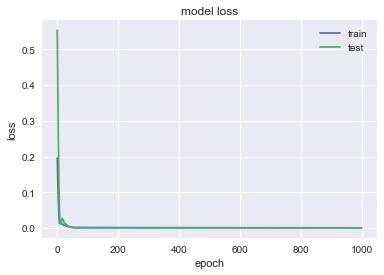

              CBRE
MSE        0.67075
MAE       0.672865
R2        0.929254
MAPE (%)   1.35442


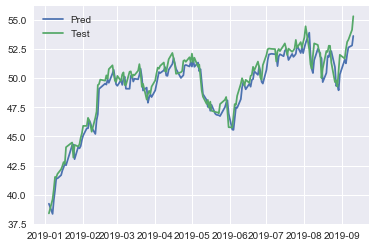

In [199]:
test = df["2019-01-04":].copy()
train = df[:"2019-01-04"].copy()
pred_gru_1 = pd.DataFrame(columns=df.columns,index = test.index)
for comp in companies:
    pred_gru_1[comp] = nn_forec_GRU(df,comp,first_layer = 64,second_layer=32).values

Predicting for  T
Train on 1008 samples, validate on 172 samples
Epoch 1/1000
0s - loss: 0.4198 - val_loss: 0.1000
Epoch 2/1000
0s - loss: 0.3799 - val_loss: 0.0859
Epoch 3/1000
0s - loss: 0.3454 - val_loss: 0.0732
Epoch 4/1000
0s - loss: 0.3123 - val_loss: 0.0618
Epoch 5/1000
0s - loss: 0.2825 - val_loss: 0.0515
Epoch 6/1000
0s - loss: 0.2530 - val_loss: 0.0422
Epoch 7/1000
0s - loss: 0.2252 - val_loss: 0.0340
Epoch 8/1000
0s - loss: 0.1999 - val_loss: 0.0267
Epoch 9/1000
0s - loss: 0.1750 - val_loss: 0.0205
Epoch 10/1000
0s - loss: 0.1516 - val_loss: 0.0155
Epoch 11/1000
0s - loss: 0.1297 - val_loss: 0.0118
Epoch 12/1000
0s - loss: 0.1098 - val_loss: 0.0094
Epoch 13/1000
0s - loss: 0.0912 - val_loss: 0.0084
Epoch 14/1000
0s - loss: 0.0746 - val_loss: 0.0088
Epoch 15/1000
0s - loss: 0.0619 - val_loss: 0.0105
Epoch 16/1000
0s - loss: 0.0501 - val_loss: 0.0134
Epoch 17/1000
0s - loss: 0.0418 - val_loss: 0.0171
Epoch 18/1000
0s - loss: 0.0344 - val_loss: 0.0211
Epoch 19/1000
0s - loss: 0

0s - loss: 0.0042 - val_loss: 6.0537e-04
Epoch 164/1000
0s - loss: 0.0042 - val_loss: 6.0382e-04
Epoch 165/1000
0s - loss: 0.0040 - val_loss: 6.0427e-04
Epoch 166/1000
0s - loss: 0.0047 - val_loss: 6.0626e-04
Epoch 167/1000
0s - loss: 0.0040 - val_loss: 6.0558e-04
Epoch 168/1000
0s - loss: 0.0046 - val_loss: 6.0565e-04
Epoch 169/1000
0s - loss: 0.0043 - val_loss: 6.0643e-04
Epoch 170/1000
0s - loss: 0.0043 - val_loss: 6.0647e-04
Epoch 171/1000
0s - loss: 0.0044 - val_loss: 6.0668e-04
Epoch 172/1000
0s - loss: 0.0042 - val_loss: 6.0810e-04
Epoch 173/1000
0s - loss: 0.0042 - val_loss: 6.0927e-04
Epoch 174/1000
0s - loss: 0.0047 - val_loss: 6.0794e-04
Epoch 175/1000
0s - loss: 0.0043 - val_loss: 6.0578e-04
Epoch 176/1000
0s - loss: 0.0043 - val_loss: 6.0475e-04
Epoch 177/1000
0s - loss: 0.0041 - val_loss: 6.0340e-04
Epoch 178/1000
0s - loss: 0.0039 - val_loss: 6.0262e-04
Epoch 179/1000
0s - loss: 0.0045 - val_loss: 6.0286e-04
Epoch 180/1000
0s - loss: 0.0042 - val_loss: 6.0238e-04
Epoch 1

0s - loss: 0.0036 - val_loss: 5.8667e-04
Epoch 313/1000
0s - loss: 0.0035 - val_loss: 5.7786e-04
Epoch 314/1000
0s - loss: 0.0036 - val_loss: 5.7348e-04
Epoch 315/1000
0s - loss: 0.0037 - val_loss: 5.7317e-04
Epoch 316/1000
0s - loss: 0.0036 - val_loss: 5.7811e-04
Epoch 317/1000
0s - loss: 0.0035 - val_loss: 5.8519e-04
Epoch 318/1000
0s - loss: 0.0039 - val_loss: 5.8301e-04
Epoch 319/1000
0s - loss: 0.0034 - val_loss: 5.7900e-04
Epoch 320/1000
0s - loss: 0.0035 - val_loss: 5.7758e-04
Epoch 321/1000
0s - loss: 0.0039 - val_loss: 5.7745e-04
Epoch 322/1000
0s - loss: 0.0033 - val_loss: 5.7572e-04
Epoch 323/1000
0s - loss: 0.0037 - val_loss: 5.7589e-04
Epoch 324/1000
0s - loss: 0.0035 - val_loss: 5.7610e-04
Epoch 325/1000
0s - loss: 0.0035 - val_loss: 5.7554e-04
Epoch 326/1000
0s - loss: 0.0032 - val_loss: 5.7736e-04
Epoch 327/1000
0s - loss: 0.0038 - val_loss: 5.7959e-04
Epoch 328/1000
0s - loss: 0.0036 - val_loss: 5.8615e-04
Epoch 329/1000
0s - loss: 0.0036 - val_loss: 5.8663e-04
Epoch 3

0s - loss: 0.0027 - val_loss: 5.6527e-04
Epoch 467/1000
0s - loss: 0.0028 - val_loss: 5.5956e-04
Epoch 468/1000
0s - loss: 0.0027 - val_loss: 5.5868e-04
Epoch 469/1000
0s - loss: 0.0027 - val_loss: 5.6221e-04
Epoch 470/1000
0s - loss: 0.0029 - val_loss: 5.6999e-04
Epoch 471/1000
0s - loss: 0.0028 - val_loss: 5.6609e-04
Epoch 472/1000
0s - loss: 0.0026 - val_loss: 5.6268e-04
Epoch 473/1000
0s - loss: 0.0029 - val_loss: 5.6141e-04
Epoch 474/1000
0s - loss: 0.0027 - val_loss: 5.6107e-04
Epoch 475/1000
0s - loss: 0.0032 - val_loss: 5.5939e-04
Epoch 476/1000
0s - loss: 0.0028 - val_loss: 5.5999e-04
Epoch 477/1000
0s - loss: 0.0029 - val_loss: 5.6030e-04
Epoch 478/1000
0s - loss: 0.0027 - val_loss: 5.6226e-04
Epoch 479/1000
0s - loss: 0.0028 - val_loss: 5.5899e-04
Epoch 480/1000
0s - loss: 0.0031 - val_loss: 5.5733e-04
Epoch 481/1000
0s - loss: 0.0028 - val_loss: 5.5805e-04
Epoch 482/1000
0s - loss: 0.0028 - val_loss: 5.6315e-04
Epoch 483/1000
0s - loss: 0.0028 - val_loss: 5.6607e-04
Epoch 4

0s - loss: 0.0024 - val_loss: 5.5037e-04
Epoch 620/1000
0s - loss: 0.0024 - val_loss: 5.4737e-04
Epoch 621/1000
0s - loss: 0.0024 - val_loss: 5.5713e-04
Epoch 622/1000
0s - loss: 0.0024 - val_loss: 5.6793e-04
Epoch 623/1000
0s - loss: 0.0024 - val_loss: 5.5682e-04
Epoch 624/1000
0s - loss: 0.0023 - val_loss: 5.4722e-04
Epoch 625/1000
0s - loss: 0.0027 - val_loss: 5.4733e-04
Epoch 626/1000
0s - loss: 0.0022 - val_loss: 5.5267e-04
Epoch 627/1000
0s - loss: 0.0023 - val_loss: 5.5774e-04
Epoch 628/1000
0s - loss: 0.0025 - val_loss: 5.6843e-04
Epoch 629/1000
0s - loss: 0.0024 - val_loss: 5.5148e-04
Epoch 630/1000
0s - loss: 0.0023 - val_loss: 5.4816e-04
Epoch 631/1000
0s - loss: 0.0027 - val_loss: 5.4714e-04
Epoch 632/1000
0s - loss: 0.0025 - val_loss: 5.4795e-04
Epoch 633/1000
0s - loss: 0.0024 - val_loss: 5.4637e-04
Epoch 634/1000
0s - loss: 0.0023 - val_loss: 5.4707e-04
Epoch 635/1000
0s - loss: 0.0022 - val_loss: 5.5143e-04
Epoch 636/1000
0s - loss: 0.0024 - val_loss: 5.5414e-04
Epoch 6

0s - loss: 0.0021 - val_loss: 5.5411e-04
Epoch 768/1000
0s - loss: 0.0021 - val_loss: 5.5427e-04
Epoch 769/1000
0s - loss: 0.0020 - val_loss: 5.4420e-04
Epoch 770/1000
0s - loss: 0.0018 - val_loss: 5.4280e-04
Epoch 771/1000
0s - loss: 0.0021 - val_loss: 5.4859e-04
Epoch 772/1000
0s - loss: 0.0019 - val_loss: 5.6231e-04
Epoch 773/1000
0s - loss: 0.0021 - val_loss: 5.4587e-04
Epoch 774/1000
0s - loss: 0.0020 - val_loss: 5.4345e-04
Epoch 775/1000
0s - loss: 0.0021 - val_loss: 5.4152e-04
Epoch 776/1000
0s - loss: 0.0020 - val_loss: 5.5736e-04
Epoch 777/1000
0s - loss: 0.0020 - val_loss: 5.5328e-04
Epoch 778/1000
0s - loss: 0.0020 - val_loss: 5.4514e-04
Epoch 779/1000
0s - loss: 0.0019 - val_loss: 5.4562e-04
Epoch 780/1000
0s - loss: 0.0022 - val_loss: 5.4203e-04
Epoch 781/1000
0s - loss: 0.0019 - val_loss: 5.4155e-04
Epoch 782/1000
0s - loss: 0.0020 - val_loss: 5.4567e-04
Epoch 783/1000
0s - loss: 0.0021 - val_loss: 5.5678e-04
Epoch 784/1000
0s - loss: 0.0021 - val_loss: 5.5186e-04
Epoch 7

0s - loss: 0.0018 - val_loss: 5.4249e-04
Epoch 918/1000
0s - loss: 0.0018 - val_loss: 5.4831e-04
Epoch 919/1000
0s - loss: 0.0017 - val_loss: 5.4565e-04
Epoch 920/1000
0s - loss: 0.0018 - val_loss: 5.4074e-04
Epoch 921/1000
0s - loss: 0.0018 - val_loss: 5.3982e-04
Epoch 922/1000
0s - loss: 0.0016 - val_loss: 5.5438e-04
Epoch 923/1000
0s - loss: 0.0019 - val_loss: 5.6483e-04
Epoch 924/1000
0s - loss: 0.0017 - val_loss: 5.4132e-04
Epoch 925/1000
0s - loss: 0.0018 - val_loss: 5.3934e-04
Epoch 926/1000
0s - loss: 0.0019 - val_loss: 5.4090e-04
Epoch 927/1000
0s - loss: 0.0018 - val_loss: 5.5760e-04
Epoch 928/1000
0s - loss: 0.0018 - val_loss: 5.5681e-04
Epoch 929/1000
0s - loss: 0.0017 - val_loss: 5.4287e-04
Epoch 930/1000
0s - loss: 0.0017 - val_loss: 5.4396e-04
Epoch 931/1000
0s - loss: 0.0018 - val_loss: 5.4467e-04
Epoch 932/1000
0s - loss: 0.0018 - val_loss: 5.4678e-04
Epoch 933/1000
0s - loss: 0.0018 - val_loss: 5.4326e-04
Epoch 934/1000
0s - loss: 0.0018 - val_loss: 5.4236e-04
Epoch 9

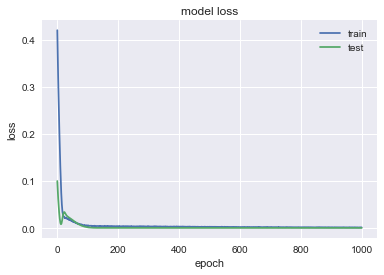

                 T
MSE       0.139748
MAE       0.269273
R2        0.949941
MAPE (%)  0.833063


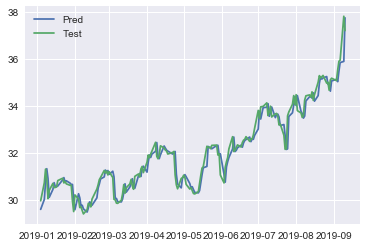

Predicting for  BBY
Train on 1008 samples, validate on 172 samples
Epoch 1/1000
0s - loss: 0.2483 - val_loss: 0.5176
Epoch 2/1000
0s - loss: 0.2208 - val_loss: 0.4659
Epoch 3/1000
0s - loss: 0.1945 - val_loss: 0.4164
Epoch 4/1000
0s - loss: 0.1724 - val_loss: 0.3694
Epoch 5/1000
0s - loss: 0.1504 - val_loss: 0.3248
Epoch 6/1000
0s - loss: 0.1303 - val_loss: 0.2827
Epoch 7/1000
0s - loss: 0.1109 - val_loss: 0.2432
Epoch 8/1000
0s - loss: 0.0951 - val_loss: 0.2064
Epoch 9/1000
0s - loss: 0.0802 - val_loss: 0.1726
Epoch 10/1000
0s - loss: 0.0679 - val_loss: 0.1419
Epoch 11/1000
0s - loss: 0.0581 - val_loss: 0.1147
Epoch 12/1000
0s - loss: 0.0497 - val_loss: 0.0912
Epoch 13/1000
0s - loss: 0.0422 - val_loss: 0.0713
Epoch 14/1000
0s - loss: 0.0378 - val_loss: 0.0550
Epoch 15/1000
0s - loss: 0.0344 - val_loss: 0.0420
Epoch 16/1000
0s - loss: 0.0326 - val_loss: 0.0322
Epoch 17/1000
0s - loss: 0.0325 - val_loss: 0.0249
Epoch 18/1000
0s - loss: 0.0316 - val_loss: 0.0198
Epoch 19/1000
0s - loss:

0s - loss: 0.0033 - val_loss: 9.2519e-04
Epoch 155/1000
0s - loss: 0.0030 - val_loss: 9.0313e-04
Epoch 156/1000
0s - loss: 0.0031 - val_loss: 8.9112e-04
Epoch 157/1000
0s - loss: 0.0030 - val_loss: 8.6320e-04
Epoch 158/1000
0s - loss: 0.0030 - val_loss: 7.9575e-04
Epoch 159/1000
0s - loss: 0.0029 - val_loss: 7.9357e-04
Epoch 160/1000
0s - loss: 0.0031 - val_loss: 8.1588e-04
Epoch 161/1000
0s - loss: 0.0029 - val_loss: 8.1878e-04
Epoch 162/1000
0s - loss: 0.0035 - val_loss: 7.8915e-04
Epoch 163/1000
0s - loss: 0.0031 - val_loss: 7.4833e-04
Epoch 164/1000
0s - loss: 0.0033 - val_loss: 7.6006e-04
Epoch 165/1000
0s - loss: 0.0033 - val_loss: 7.9079e-04
Epoch 166/1000
0s - loss: 0.0029 - val_loss: 7.9356e-04
Epoch 167/1000
0s - loss: 0.0033 - val_loss: 8.2072e-04
Epoch 168/1000
0s - loss: 0.0033 - val_loss: 8.6022e-04
Epoch 169/1000
0s - loss: 0.0028 - val_loss: 8.6496e-04
Epoch 170/1000
0s - loss: 0.0026 - val_loss: 8.7710e-04
Epoch 171/1000
0s - loss: 0.0030 - val_loss: 8.5975e-04
Epoch 1

0s - loss: 0.0024 - val_loss: 8.1789e-04
Epoch 307/1000
0s - loss: 0.0025 - val_loss: 6.8537e-04
Epoch 308/1000
0s - loss: 0.0026 - val_loss: 6.3414e-04
Epoch 309/1000
0s - loss: 0.0025 - val_loss: 6.5129e-04
Epoch 310/1000
0s - loss: 0.0023 - val_loss: 7.4549e-04
Epoch 311/1000
0s - loss: 0.0021 - val_loss: 8.0904e-04
Epoch 312/1000
0s - loss: 0.0022 - val_loss: 8.0002e-04
Epoch 313/1000
0s - loss: 0.0023 - val_loss: 7.8642e-04
Epoch 314/1000
0s - loss: 0.0025 - val_loss: 7.6311e-04
Epoch 315/1000
0s - loss: 0.0025 - val_loss: 7.5326e-04
Epoch 316/1000
0s - loss: 0.0024 - val_loss: 7.5319e-04
Epoch 317/1000
0s - loss: 0.0021 - val_loss: 7.3664e-04
Epoch 318/1000
0s - loss: 0.0023 - val_loss: 6.8210e-04
Epoch 319/1000
0s - loss: 0.0025 - val_loss: 6.7215e-04
Epoch 320/1000
0s - loss: 0.0026 - val_loss: 6.8309e-04
Epoch 321/1000
0s - loss: 0.0025 - val_loss: 6.7677e-04
Epoch 322/1000
0s - loss: 0.0024 - val_loss: 6.8119e-04
Epoch 323/1000
0s - loss: 0.0021 - val_loss: 7.2443e-04
Epoch 3

0s - loss: 0.0022 - val_loss: 7.4353e-04
Epoch 460/1000
0s - loss: 0.0022 - val_loss: 7.4348e-04
Epoch 461/1000
0s - loss: 0.0020 - val_loss: 6.8026e-04
Epoch 462/1000
0s - loss: 0.0021 - val_loss: 6.5922e-04
Epoch 463/1000
0s - loss: 0.0021 - val_loss: 7.3368e-04
Epoch 464/1000
0s - loss: 0.0019 - val_loss: 7.1931e-04
Epoch 465/1000
0s - loss: 0.0019 - val_loss: 6.8565e-04
Epoch 466/1000
0s - loss: 0.0020 - val_loss: 6.7013e-04
Epoch 467/1000
0s - loss: 0.0021 - val_loss: 6.9299e-04
Epoch 468/1000
0s - loss: 0.0020 - val_loss: 7.6423e-04
Epoch 469/1000
0s - loss: 0.0022 - val_loss: 7.6424e-04
Epoch 470/1000
0s - loss: 0.0024 - val_loss: 6.8670e-04
Epoch 471/1000
0s - loss: 0.0021 - val_loss: 6.8076e-04
Epoch 472/1000
0s - loss: 0.0021 - val_loss: 6.9751e-04
Epoch 473/1000
0s - loss: 0.0020 - val_loss: 7.2583e-04
Epoch 474/1000
0s - loss: 0.0018 - val_loss: 7.5025e-04
Epoch 475/1000
0s - loss: 0.0019 - val_loss: 7.2342e-04
Epoch 476/1000
0s - loss: 0.0019 - val_loss: 6.6893e-04
Epoch 4

0s - loss: 0.0016 - val_loss: 6.9844e-04
Epoch 612/1000
0s - loss: 0.0017 - val_loss: 6.6386e-04
Epoch 613/1000
0s - loss: 0.0016 - val_loss: 6.5425e-04
Epoch 614/1000
0s - loss: 0.0021 - val_loss: 6.6699e-04
Epoch 615/1000
0s - loss: 0.0018 - val_loss: 6.5209e-04
Epoch 616/1000
0s - loss: 0.0017 - val_loss: 6.0445e-04
Epoch 617/1000
0s - loss: 0.0017 - val_loss: 5.9737e-04
Epoch 618/1000
0s - loss: 0.0018 - val_loss: 6.2366e-04
Epoch 619/1000
0s - loss: 0.0016 - val_loss: 6.4132e-04
Epoch 620/1000
0s - loss: 0.0018 - val_loss: 6.0401e-04
Epoch 621/1000
0s - loss: 0.0020 - val_loss: 5.8935e-04
Epoch 622/1000
0s - loss: 0.0017 - val_loss: 6.3032e-04
Epoch 623/1000
0s - loss: 0.0020 - val_loss: 7.5219e-04
Epoch 624/1000
0s - loss: 0.0016 - val_loss: 7.4812e-04
Epoch 625/1000
0s - loss: 0.0018 - val_loss: 7.1296e-04
Epoch 626/1000
0s - loss: 0.0021 - val_loss: 6.2027e-04
Epoch 627/1000
0s - loss: 0.0016 - val_loss: 5.8522e-04
Epoch 628/1000
0s - loss: 0.0020 - val_loss: 6.1337e-04
Epoch 6

0s - loss: 0.0016 - val_loss: 5.8938e-04
Epoch 766/1000
0s - loss: 0.0014 - val_loss: 5.9274e-04
Epoch 767/1000
0s - loss: 0.0016 - val_loss: 6.1083e-04
Epoch 768/1000
0s - loss: 0.0014 - val_loss: 6.1046e-04
Epoch 769/1000
0s - loss: 0.0014 - val_loss: 6.2658e-04
Epoch 770/1000
0s - loss: 0.0016 - val_loss: 6.3456e-04
Epoch 771/1000
0s - loss: 0.0014 - val_loss: 6.5379e-04
Epoch 772/1000
0s - loss: 0.0014 - val_loss: 6.6355e-04
Epoch 773/1000
0s - loss: 0.0016 - val_loss: 6.1685e-04
Epoch 774/1000
0s - loss: 0.0016 - val_loss: 6.0441e-04
Epoch 775/1000
0s - loss: 0.0016 - val_loss: 6.9323e-04
Epoch 776/1000
0s - loss: 0.0014 - val_loss: 7.1470e-04
Epoch 777/1000
0s - loss: 0.0016 - val_loss: 6.6947e-04
Epoch 778/1000
0s - loss: 0.0015 - val_loss: 6.4475e-04
Epoch 779/1000
0s - loss: 0.0015 - val_loss: 6.5963e-04
Epoch 780/1000
0s - loss: 0.0016 - val_loss: 6.8110e-04
Epoch 781/1000
0s - loss: 0.0014 - val_loss: 6.9051e-04
Epoch 782/1000
0s - loss: 0.0014 - val_loss: 6.9725e-04
Epoch 7

0s - loss: 0.0013 - val_loss: 6.0566e-04
Epoch 918/1000
0s - loss: 0.0014 - val_loss: 6.1390e-04
Epoch 919/1000
0s - loss: 0.0015 - val_loss: 6.6199e-04
Epoch 920/1000
0s - loss: 0.0013 - val_loss: 6.3473e-04
Epoch 921/1000
0s - loss: 0.0016 - val_loss: 6.0226e-04
Epoch 922/1000
0s - loss: 0.0014 - val_loss: 6.0563e-04
Epoch 923/1000
0s - loss: 0.0015 - val_loss: 6.2457e-04
Epoch 924/1000
0s - loss: 0.0015 - val_loss: 5.8693e-04
Epoch 925/1000
0s - loss: 0.0013 - val_loss: 5.9363e-04
Epoch 926/1000
0s - loss: 0.0015 - val_loss: 6.5387e-04
Epoch 927/1000
0s - loss: 0.0015 - val_loss: 7.4485e-04
Epoch 928/1000
0s - loss: 0.0014 - val_loss: 5.8868e-04
Epoch 929/1000
0s - loss: 0.0013 - val_loss: 5.9047e-04
Epoch 930/1000
0s - loss: 0.0016 - val_loss: 6.1822e-04
Epoch 931/1000
0s - loss: 0.0014 - val_loss: 7.0389e-04
Epoch 932/1000
0s - loss: 0.0014 - val_loss: 6.6377e-04
Epoch 933/1000
0s - loss: 0.0013 - val_loss: 6.0042e-04
Epoch 934/1000
0s - loss: 0.0014 - val_loss: 6.2765e-04
Epoch 9

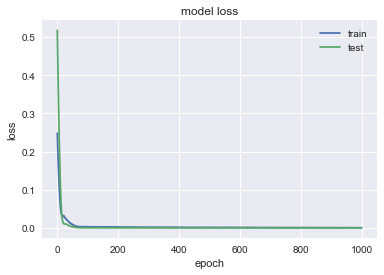

               BBY
MSE        2.01835
MAE       0.944827
R2        0.940112
MAPE (%)    1.4008


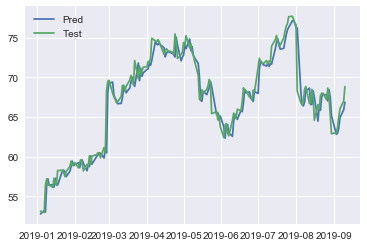

Predicting for  KO
Train on 1008 samples, validate on 172 samples
Epoch 1/1000
0s - loss: 0.1165 - val_loss: 0.4242
Epoch 2/1000
0s - loss: 0.1014 - val_loss: 0.3870
Epoch 3/1000
0s - loss: 0.0881 - val_loss: 0.3512
Epoch 4/1000
0s - loss: 0.0753 - val_loss: 0.3167
Epoch 5/1000
0s - loss: 0.0636 - val_loss: 0.2832
Epoch 6/1000
0s - loss: 0.0528 - val_loss: 0.2506
Epoch 7/1000
0s - loss: 0.0429 - val_loss: 0.2192
Epoch 8/1000
0s - loss: 0.0335 - val_loss: 0.1893
Epoch 9/1000
0s - loss: 0.0264 - val_loss: 0.1611
Epoch 10/1000
0s - loss: 0.0202 - val_loss: 0.1352
Epoch 11/1000
0s - loss: 0.0147 - val_loss: 0.1122
Epoch 12/1000
0s - loss: 0.0119 - val_loss: 0.0924
Epoch 13/1000
0s - loss: 0.0101 - val_loss: 0.0761
Epoch 14/1000
0s - loss: 0.0092 - val_loss: 0.0635
Epoch 15/1000
0s - loss: 0.0096 - val_loss: 0.0543
Epoch 16/1000
0s - loss: 0.0099 - val_loss: 0.0480
Epoch 17/1000
0s - loss: 0.0109 - val_loss: 0.0442
Epoch 18/1000
0s - loss: 0.0109 - val_loss: 0.0424
Epoch 19/1000
0s - loss: 

0s - loss: 0.0015 - val_loss: 8.6725e-04
Epoch 159/1000
0s - loss: 0.0015 - val_loss: 8.6362e-04
Epoch 160/1000
0s - loss: 0.0014 - val_loss: 8.6714e-04
Epoch 161/1000
0s - loss: 0.0016 - val_loss: 8.7156e-04
Epoch 162/1000
0s - loss: 0.0015 - val_loss: 8.6735e-04
Epoch 163/1000
0s - loss: 0.0018 - val_loss: 8.6517e-04
Epoch 164/1000
0s - loss: 0.0016 - val_loss: 8.6398e-04
Epoch 165/1000
0s - loss: 0.0015 - val_loss: 8.6442e-04
Epoch 166/1000
0s - loss: 0.0016 - val_loss: 8.6420e-04
Epoch 167/1000
0s - loss: 0.0015 - val_loss: 8.6171e-04
Epoch 168/1000
0s - loss: 0.0015 - val_loss: 8.6085e-04
Epoch 169/1000
0s - loss: 0.0015 - val_loss: 8.5836e-04
Epoch 170/1000
0s - loss: 0.0015 - val_loss: 8.6717e-04
Epoch 171/1000
0s - loss: 0.0014 - val_loss: 8.7142e-04
Epoch 172/1000
0s - loss: 0.0014 - val_loss: 8.6648e-04
Epoch 173/1000
0s - loss: 0.0016 - val_loss: 8.5996e-04
Epoch 174/1000
0s - loss: 0.0016 - val_loss: 8.5435e-04
Epoch 175/1000
0s - loss: 0.0016 - val_loss: 8.5147e-04
Epoch 1

0s - loss: 0.0013 - val_loss: 8.0898e-04
Epoch 307/1000
0s - loss: 0.0012 - val_loss: 8.0807e-04
Epoch 308/1000
0s - loss: 0.0012 - val_loss: 8.0744e-04
Epoch 309/1000
0s - loss: 0.0012 - val_loss: 8.0764e-04
Epoch 310/1000
0s - loss: 0.0013 - val_loss: 8.0821e-04
Epoch 311/1000
0s - loss: 0.0013 - val_loss: 8.0838e-04
Epoch 312/1000
0s - loss: 0.0012 - val_loss: 8.0561e-04
Epoch 313/1000
0s - loss: 0.0012 - val_loss: 8.0403e-04
Epoch 314/1000
0s - loss: 0.0012 - val_loss: 8.1388e-04
Epoch 315/1000
0s - loss: 0.0013 - val_loss: 8.0634e-04
Epoch 316/1000
0s - loss: 0.0012 - val_loss: 8.0660e-04
Epoch 317/1000
0s - loss: 0.0013 - val_loss: 8.1572e-04
Epoch 318/1000
0s - loss: 0.0013 - val_loss: 8.0549e-04
Epoch 319/1000
0s - loss: 0.0012 - val_loss: 7.9817e-04
Epoch 320/1000
0s - loss: 0.0013 - val_loss: 7.9998e-04
Epoch 321/1000
0s - loss: 0.0011 - val_loss: 7.9852e-04
Epoch 322/1000
0s - loss: 0.0013 - val_loss: 8.1592e-04
Epoch 323/1000
0s - loss: 0.0012 - val_loss: 8.0135e-04
Epoch 3

0s - loss: 0.0011 - val_loss: 7.8673e-04
Epoch 458/1000
0s - loss: 0.0011 - val_loss: 7.4895e-04
Epoch 459/1000
0s - loss: 0.0010 - val_loss: 7.4392e-04
Epoch 460/1000
0s - loss: 0.0011 - val_loss: 7.5241e-04
Epoch 461/1000
0s - loss: 0.0011 - val_loss: 7.9320e-04
Epoch 462/1000
0s - loss: 0.0011 - val_loss: 8.1140e-04
Epoch 463/1000
0s - loss: 0.0011 - val_loss: 7.7703e-04
Epoch 464/1000
0s - loss: 0.0010 - val_loss: 7.6003e-04
Epoch 465/1000
0s - loss: 0.0011 - val_loss: 7.5481e-04
Epoch 466/1000
0s - loss: 0.0010 - val_loss: 7.7133e-04
Epoch 467/1000
0s - loss: 0.0011 - val_loss: 7.6083e-04
Epoch 468/1000
0s - loss: 9.7162e-04 - val_loss: 7.4672e-04
Epoch 469/1000
0s - loss: 0.0010 - val_loss: 7.5975e-04
Epoch 470/1000
0s - loss: 0.0010 - val_loss: 7.5165e-04
Epoch 471/1000
0s - loss: 0.0011 - val_loss: 7.4592e-04
Epoch 472/1000
0s - loss: 0.0010 - val_loss: 7.3811e-04
Epoch 473/1000
0s - loss: 0.0010 - val_loss: 7.4523e-04
Epoch 474/1000
0s - loss: 0.0010 - val_loss: 7.5268e-04
Epo

0s - loss: 9.1590e-04 - val_loss: 8.2492e-04
Epoch 601/1000
0s - loss: 8.7927e-04 - val_loss: 7.6404e-04
Epoch 602/1000
0s - loss: 8.9234e-04 - val_loss: 7.3418e-04
Epoch 603/1000
0s - loss: 9.9515e-04 - val_loss: 7.8347e-04
Epoch 604/1000
0s - loss: 8.7828e-04 - val_loss: 8.2211e-04
Epoch 605/1000
0s - loss: 8.4186e-04 - val_loss: 7.8905e-04
Epoch 606/1000
0s - loss: 8.6502e-04 - val_loss: 8.0608e-04
Epoch 607/1000
0s - loss: 9.0852e-04 - val_loss: 8.2268e-04
Epoch 608/1000
0s - loss: 9.1979e-04 - val_loss: 7.9874e-04
Epoch 609/1000
0s - loss: 8.5627e-04 - val_loss: 7.6174e-04
Epoch 610/1000
0s - loss: 9.2391e-04 - val_loss: 7.8215e-04
Epoch 611/1000
0s - loss: 8.9477e-04 - val_loss: 8.3243e-04
Epoch 612/1000
0s - loss: 8.8359e-04 - val_loss: 7.6518e-04
Epoch 613/1000
0s - loss: 8.9119e-04 - val_loss: 7.2193e-04
Epoch 614/1000
0s - loss: 9.2819e-04 - val_loss: 7.2820e-04
Epoch 615/1000
0s - loss: 8.4480e-04 - val_loss: 7.7534e-04
Epoch 616/1000
0s - loss: 8.4203e-04 - val_loss: 8.5742

0s - loss: 8.1597e-04 - val_loss: 7.5384e-04
Epoch 744/1000
0s - loss: 8.1816e-04 - val_loss: 7.7759e-04
Epoch 745/1000
0s - loss: 7.3372e-04 - val_loss: 7.5158e-04
Epoch 746/1000
0s - loss: 7.8620e-04 - val_loss: 7.2450e-04
Epoch 747/1000
0s - loss: 7.3772e-04 - val_loss: 7.5232e-04
Epoch 748/1000
0s - loss: 7.9412e-04 - val_loss: 7.8433e-04
Epoch 749/1000
0s - loss: 8.2534e-04 - val_loss: 7.3970e-04
Epoch 750/1000
0s - loss: 7.4954e-04 - val_loss: 7.2665e-04
Epoch 751/1000
0s - loss: 8.0769e-04 - val_loss: 7.6092e-04
Epoch 752/1000
0s - loss: 7.9068e-04 - val_loss: 7.5198e-04
Epoch 753/1000
0s - loss: 7.9132e-04 - val_loss: 7.5885e-04
Epoch 754/1000
0s - loss: 7.7940e-04 - val_loss: 7.9107e-04
Epoch 755/1000
0s - loss: 8.1149e-04 - val_loss: 8.1611e-04
Epoch 756/1000
0s - loss: 7.1452e-04 - val_loss: 7.9886e-04
Epoch 757/1000
0s - loss: 8.1754e-04 - val_loss: 8.0457e-04
Epoch 758/1000
0s - loss: 7.8089e-04 - val_loss: 8.0455e-04
Epoch 759/1000
0s - loss: 7.6658e-04 - val_loss: 8.3939

0s - loss: 7.0819e-04 - val_loss: 8.7359e-04
Epoch 888/1000
0s - loss: 7.0386e-04 - val_loss: 8.5475e-04
Epoch 889/1000
0s - loss: 7.0109e-04 - val_loss: 8.4676e-04
Epoch 890/1000
0s - loss: 7.8216e-04 - val_loss: 8.9032e-04
Epoch 891/1000
0s - loss: 7.4607e-04 - val_loss: 9.1667e-04
Epoch 892/1000
0s - loss: 6.2213e-04 - val_loss: 8.4015e-04
Epoch 893/1000
0s - loss: 6.7698e-04 - val_loss: 8.2517e-04
Epoch 894/1000
0s - loss: 6.8732e-04 - val_loss: 8.5991e-04
Epoch 895/1000
0s - loss: 7.3878e-04 - val_loss: 8.8380e-04
Epoch 896/1000
0s - loss: 6.7030e-04 - val_loss: 8.7731e-04
Epoch 897/1000
0s - loss: 6.9642e-04 - val_loss: 8.4326e-04
Epoch 898/1000
0s - loss: 7.1442e-04 - val_loss: 8.5086e-04
Epoch 899/1000
0s - loss: 6.3996e-04 - val_loss: 8.6943e-04
Epoch 900/1000
0s - loss: 7.1500e-04 - val_loss: 8.4856e-04
Epoch 901/1000
0s - loss: 7.2485e-04 - val_loss: 8.3172e-04
Epoch 902/1000
0s - loss: 7.2164e-04 - val_loss: 8.3360e-04
Epoch 903/1000
0s - loss: 7.1853e-04 - val_loss: 8.3644

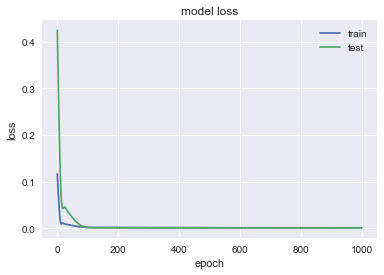

                KO
MSE       0.268766
MAE       0.374781
R2        0.967627
MAPE (%)  0.749176


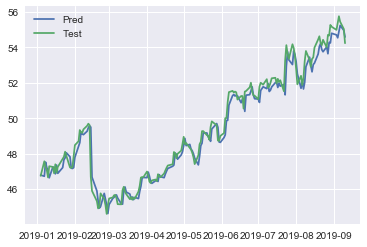

Predicting for  FTI
Train on 1008 samples, validate on 172 samples
Epoch 1/1000
0s - loss: 0.2190 - val_loss: 0.0274
Epoch 2/1000
0s - loss: 0.1935 - val_loss: 0.0208
Epoch 3/1000
0s - loss: 0.1699 - val_loss: 0.0152
Epoch 4/1000
0s - loss: 0.1484 - val_loss: 0.0105
Epoch 5/1000
0s - loss: 0.1284 - val_loss: 0.0068
Epoch 6/1000
0s - loss: 0.1087 - val_loss: 0.0040
Epoch 7/1000
0s - loss: 0.0912 - val_loss: 0.0024
Epoch 8/1000
0s - loss: 0.0749 - val_loss: 0.0019
Epoch 9/1000
0s - loss: 0.0610 - val_loss: 0.0027
Epoch 10/1000
0s - loss: 0.0477 - val_loss: 0.0047
Epoch 11/1000
0s - loss: 0.0376 - val_loss: 0.0080
Epoch 12/1000
0s - loss: 0.0290 - val_loss: 0.0123
Epoch 13/1000
0s - loss: 0.0223 - val_loss: 0.0172
Epoch 14/1000
0s - loss: 0.0180 - val_loss: 0.0222
Epoch 15/1000
0s - loss: 0.0161 - val_loss: 0.0265
Epoch 16/1000
0s - loss: 0.0153 - val_loss: 0.0298
Epoch 17/1000
0s - loss: 0.0148 - val_loss: 0.0315
Epoch 18/1000
0s - loss: 0.0141 - val_loss: 0.0319
Epoch 19/1000
0s - loss:

0s - loss: 0.0027 - val_loss: 3.9114e-04
Epoch 158/1000
0s - loss: 0.0029 - val_loss: 3.8742e-04
Epoch 159/1000
0s - loss: 0.0026 - val_loss: 3.7047e-04
Epoch 160/1000
0s - loss: 0.0027 - val_loss: 3.5922e-04
Epoch 161/1000
0s - loss: 0.0026 - val_loss: 3.4779e-04
Epoch 162/1000
0s - loss: 0.0027 - val_loss: 3.4049e-04
Epoch 163/1000
0s - loss: 0.0029 - val_loss: 3.4704e-04
Epoch 164/1000
0s - loss: 0.0027 - val_loss: 3.5569e-04
Epoch 165/1000
0s - loss: 0.0027 - val_loss: 3.5772e-04
Epoch 166/1000
0s - loss: 0.0027 - val_loss: 3.5004e-04
Epoch 167/1000
0s - loss: 0.0024 - val_loss: 3.4770e-04
Epoch 168/1000
0s - loss: 0.0028 - val_loss: 3.5613e-04
Epoch 169/1000
0s - loss: 0.0028 - val_loss: 3.5542e-04
Epoch 170/1000
0s - loss: 0.0026 - val_loss: 3.4541e-04
Epoch 171/1000
0s - loss: 0.0025 - val_loss: 3.3667e-04
Epoch 172/1000
0s - loss: 0.0024 - val_loss: 3.3821e-04
Epoch 173/1000
0s - loss: 0.0028 - val_loss: 3.4594e-04
Epoch 174/1000
0s - loss: 0.0028 - val_loss: 3.5201e-04
Epoch 1

0s - loss: 0.0020 - val_loss: 3.3948e-04
Epoch 310/1000
0s - loss: 0.0020 - val_loss: 3.2265e-04
Epoch 311/1000
0s - loss: 0.0021 - val_loss: 3.2265e-04
Epoch 312/1000
0s - loss: 0.0022 - val_loss: 3.3908e-04
Epoch 313/1000
0s - loss: 0.0022 - val_loss: 3.5889e-04
Epoch 314/1000
0s - loss: 0.0021 - val_loss: 3.3842e-04
Epoch 315/1000
0s - loss: 0.0020 - val_loss: 3.2388e-04
Epoch 316/1000
0s - loss: 0.0023 - val_loss: 3.2279e-04
Epoch 317/1000
0s - loss: 0.0023 - val_loss: 3.2734e-04
Epoch 318/1000
0s - loss: 0.0024 - val_loss: 3.3369e-04
Epoch 319/1000
0s - loss: 0.0021 - val_loss: 3.4613e-04
Epoch 320/1000
0s - loss: 0.0018 - val_loss: 3.4288e-04
Epoch 321/1000
0s - loss: 0.0021 - val_loss: 3.2683e-04
Epoch 322/1000
0s - loss: 0.0019 - val_loss: 3.2227e-04
Epoch 323/1000
0s - loss: 0.0022 - val_loss: 3.3003e-04
Epoch 324/1000
0s - loss: 0.0021 - val_loss: 3.4583e-04
Epoch 325/1000
0s - loss: 0.0020 - val_loss: 3.4891e-04
Epoch 326/1000
0s - loss: 0.0021 - val_loss: 3.4401e-04
Epoch 3

0s - loss: 0.0017 - val_loss: 3.2904e-04
Epoch 460/1000
0s - loss: 0.0018 - val_loss: 3.2455e-04
Epoch 461/1000
0s - loss: 0.0017 - val_loss: 3.2452e-04
Epoch 462/1000
0s - loss: 0.0017 - val_loss: 3.2905e-04
Epoch 463/1000
0s - loss: 0.0017 - val_loss: 3.3672e-04
Epoch 464/1000
0s - loss: 0.0016 - val_loss: 3.2522e-04
Epoch 465/1000
0s - loss: 0.0016 - val_loss: 3.2620e-04
Epoch 466/1000
0s - loss: 0.0018 - val_loss: 3.2608e-04
Epoch 467/1000
0s - loss: 0.0017 - val_loss: 3.2570e-04
Epoch 468/1000
0s - loss: 0.0019 - val_loss: 3.2653e-04
Epoch 469/1000
0s - loss: 0.0017 - val_loss: 3.2577e-04
Epoch 470/1000
0s - loss: 0.0016 - val_loss: 3.2708e-04
Epoch 471/1000
0s - loss: 0.0017 - val_loss: 3.2552e-04
Epoch 472/1000
0s - loss: 0.0017 - val_loss: 3.2641e-04
Epoch 473/1000
0s - loss: 0.0017 - val_loss: 3.2500e-04
Epoch 474/1000
0s - loss: 0.0017 - val_loss: 3.2496e-04
Epoch 475/1000
0s - loss: 0.0017 - val_loss: 3.2471e-04
Epoch 476/1000
0s - loss: 0.0017 - val_loss: 3.2489e-04
Epoch 4

0s - loss: 0.0015 - val_loss: 3.2993e-04
Epoch 611/1000
0s - loss: 0.0014 - val_loss: 3.2814e-04
Epoch 612/1000
0s - loss: 0.0017 - val_loss: 3.2852e-04
Epoch 613/1000
0s - loss: 0.0013 - val_loss: 3.2806e-04
Epoch 614/1000
0s - loss: 0.0014 - val_loss: 3.3216e-04
Epoch 615/1000
0s - loss: 0.0014 - val_loss: 3.2767e-04
Epoch 616/1000
0s - loss: 0.0014 - val_loss: 3.4134e-04
Epoch 617/1000
0s - loss: 0.0014 - val_loss: 3.2981e-04
Epoch 618/1000
0s - loss: 0.0014 - val_loss: 3.2865e-04
Epoch 619/1000
0s - loss: 0.0014 - val_loss: 3.2808e-04
Epoch 620/1000
0s - loss: 0.0014 - val_loss: 3.2969e-04
Epoch 621/1000
0s - loss: 0.0014 - val_loss: 3.2972e-04
Epoch 622/1000
0s - loss: 0.0015 - val_loss: 3.2940e-04
Epoch 623/1000
0s - loss: 0.0014 - val_loss: 3.3140e-04
Epoch 624/1000
0s - loss: 0.0014 - val_loss: 3.3063e-04
Epoch 625/1000
0s - loss: 0.0014 - val_loss: 3.3080e-04
Epoch 626/1000
0s - loss: 0.0014 - val_loss: 3.3135e-04
Epoch 627/1000
0s - loss: 0.0013 - val_loss: 3.4105e-04
Epoch 6

0s - loss: 0.0013 - val_loss: 3.2810e-04
Epoch 764/1000
0s - loss: 0.0013 - val_loss: 3.2912e-04
Epoch 765/1000
0s - loss: 0.0013 - val_loss: 3.3089e-04
Epoch 766/1000
0s - loss: 0.0012 - val_loss: 3.3082e-04
Epoch 767/1000
0s - loss: 0.0013 - val_loss: 3.3185e-04
Epoch 768/1000
0s - loss: 0.0012 - val_loss: 3.3366e-04
Epoch 769/1000
0s - loss: 0.0013 - val_loss: 3.3792e-04
Epoch 770/1000
0s - loss: 0.0013 - val_loss: 3.3127e-04
Epoch 771/1000
0s - loss: 0.0013 - val_loss: 3.3280e-04
Epoch 772/1000
0s - loss: 0.0013 - val_loss: 3.3150e-04
Epoch 773/1000
0s - loss: 0.0013 - val_loss: 3.3496e-04
Epoch 774/1000
0s - loss: 0.0012 - val_loss: 3.3247e-04
Epoch 775/1000
0s - loss: 0.0013 - val_loss: 3.3087e-04
Epoch 776/1000
0s - loss: 0.0012 - val_loss: 3.3015e-04
Epoch 777/1000
0s - loss: 0.0012 - val_loss: 3.3186e-04
Epoch 778/1000
0s - loss: 0.0014 - val_loss: 3.3025e-04
Epoch 779/1000
0s - loss: 0.0011 - val_loss: 3.2970e-04
Epoch 780/1000
0s - loss: 0.0012 - val_loss: 3.2903e-04
Epoch 7

0s - loss: 0.0010 - val_loss: 3.3148e-04
Epoch 918/1000
0s - loss: 0.0011 - val_loss: 3.3688e-04
Epoch 919/1000
0s - loss: 0.0011 - val_loss: 3.3360e-04
Epoch 920/1000
0s - loss: 0.0010 - val_loss: 3.3495e-04
Epoch 921/1000
0s - loss: 0.0011 - val_loss: 3.3591e-04
Epoch 922/1000
0s - loss: 0.0012 - val_loss: 3.3504e-04
Epoch 923/1000
0s - loss: 0.0012 - val_loss: 3.3041e-04
Epoch 924/1000
0s - loss: 0.0011 - val_loss: 3.2999e-04
Epoch 925/1000
0s - loss: 0.0011 - val_loss: 3.3270e-04
Epoch 926/1000
0s - loss: 0.0012 - val_loss: 3.3366e-04
Epoch 927/1000
0s - loss: 0.0011 - val_loss: 3.3626e-04
Epoch 928/1000
0s - loss: 0.0011 - val_loss: 3.3746e-04
Epoch 929/1000
0s - loss: 0.0010 - val_loss: 3.3160e-04
Epoch 930/1000
0s - loss: 0.0011 - val_loss: 3.3465e-04
Epoch 931/1000
0s - loss: 0.0011 - val_loss: 3.4467e-04
Epoch 932/1000
0s - loss: 0.0011 - val_loss: 3.3205e-04
Epoch 933/1000
0s - loss: 0.0011 - val_loss: 3.3846e-04
Epoch 934/1000
0s - loss: 0.0011 - val_loss: 3.3445e-04
Epoch 9

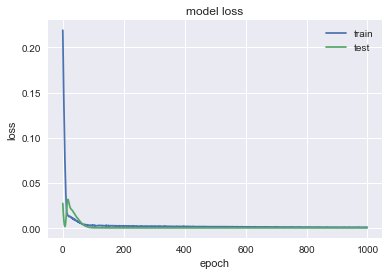

               FTI
MSE       0.269119
MAE        0.41999
R2        0.876974
MAPE (%)   1.76545


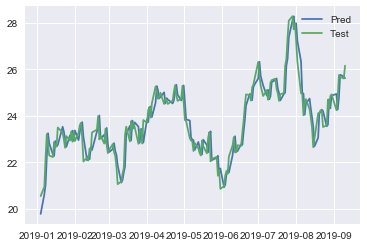

Predicting for  BLK
Train on 1008 samples, validate on 172 samples
Epoch 1/1000
0s - loss: 0.1809 - val_loss: 0.2175
Epoch 2/1000
0s - loss: 0.1646 - val_loss: 0.1968
Epoch 3/1000
0s - loss: 0.1481 - val_loss: 0.1766
Epoch 4/1000
0s - loss: 0.1340 - val_loss: 0.1569
Epoch 5/1000
0s - loss: 0.1186 - val_loss: 0.1380
Epoch 6/1000
0s - loss: 0.1052 - val_loss: 0.1198
Epoch 7/1000
0s - loss: 0.0921 - val_loss: 0.1025
Epoch 8/1000
0s - loss: 0.0802 - val_loss: 0.0863
Epoch 9/1000
0s - loss: 0.0686 - val_loss: 0.0712
Epoch 10/1000
0s - loss: 0.0572 - val_loss: 0.0575
Epoch 11/1000
0s - loss: 0.0507 - val_loss: 0.0453
Epoch 12/1000
0s - loss: 0.0436 - val_loss: 0.0348
Epoch 13/1000
0s - loss: 0.0359 - val_loss: 0.0260
Epoch 14/1000
0s - loss: 0.0322 - val_loss: 0.0191
Epoch 15/1000
0s - loss: 0.0284 - val_loss: 0.0138
Epoch 16/1000
0s - loss: 0.0264 - val_loss: 0.0099
Epoch 17/1000
0s - loss: 0.0259 - val_loss: 0.0072
Epoch 18/1000
0s - loss: 0.0251 - val_loss: 0.0055
Epoch 19/1000
0s - loss:

0s - loss: 0.0022 - val_loss: 4.2030e-04
Epoch 154/1000
0s - loss: 0.0028 - val_loss: 4.7460e-04
Epoch 155/1000
0s - loss: 0.0029 - val_loss: 5.2662e-04
Epoch 156/1000
0s - loss: 0.0028 - val_loss: 5.3382e-04
Epoch 157/1000
0s - loss: 0.0022 - val_loss: 5.2397e-04
Epoch 158/1000
0s - loss: 0.0027 - val_loss: 5.0473e-04
Epoch 159/1000
0s - loss: 0.0024 - val_loss: 5.1866e-04
Epoch 160/1000
0s - loss: 0.0025 - val_loss: 5.2647e-04
Epoch 161/1000
0s - loss: 0.0025 - val_loss: 5.0710e-04
Epoch 162/1000
0s - loss: 0.0027 - val_loss: 4.7990e-04
Epoch 163/1000
0s - loss: 0.0028 - val_loss: 4.5921e-04
Epoch 164/1000
0s - loss: 0.0026 - val_loss: 4.3778e-04
Epoch 165/1000
0s - loss: 0.0027 - val_loss: 4.3549e-04
Epoch 166/1000
0s - loss: 0.0029 - val_loss: 4.4831e-04
Epoch 167/1000
0s - loss: 0.0023 - val_loss: 5.0949e-04
Epoch 168/1000
0s - loss: 0.0023 - val_loss: 5.3604e-04
Epoch 169/1000
0s - loss: 0.0028 - val_loss: 4.9811e-04
Epoch 170/1000
0s - loss: 0.0027 - val_loss: 4.3979e-04
Epoch 1

0s - loss: 0.0021 - val_loss: 3.8020e-04
Epoch 307/1000
0s - loss: 0.0020 - val_loss: 3.6417e-04
Epoch 308/1000
0s - loss: 0.0020 - val_loss: 3.6781e-04
Epoch 309/1000
0s - loss: 0.0019 - val_loss: 3.7602e-04
Epoch 310/1000
0s - loss: 0.0023 - val_loss: 4.0914e-04
Epoch 311/1000
0s - loss: 0.0021 - val_loss: 4.6513e-04
Epoch 312/1000
0s - loss: 0.0021 - val_loss: 4.8908e-04
Epoch 313/1000
0s - loss: 0.0022 - val_loss: 4.6180e-04
Epoch 314/1000
0s - loss: 0.0021 - val_loss: 3.9947e-04
Epoch 315/1000
0s - loss: 0.0019 - val_loss: 3.6830e-04
Epoch 316/1000
0s - loss: 0.0020 - val_loss: 3.9266e-04
Epoch 317/1000
0s - loss: 0.0019 - val_loss: 4.5230e-04
Epoch 318/1000
0s - loss: 0.0021 - val_loss: 4.5005e-04
Epoch 319/1000
0s - loss: 0.0020 - val_loss: 3.9450e-04
Epoch 320/1000
0s - loss: 0.0019 - val_loss: 3.5657e-04
Epoch 321/1000
0s - loss: 0.0020 - val_loss: 3.6609e-04
Epoch 322/1000
0s - loss: 0.0020 - val_loss: 3.9623e-04
Epoch 323/1000
0s - loss: 0.0020 - val_loss: 4.0514e-04
Epoch 3

0s - loss: 0.0016 - val_loss: 3.8655e-04
Epoch 460/1000
0s - loss: 0.0015 - val_loss: 4.0708e-04
Epoch 461/1000
0s - loss: 0.0017 - val_loss: 3.7746e-04
Epoch 462/1000
0s - loss: 0.0016 - val_loss: 3.6780e-04
Epoch 463/1000
0s - loss: 0.0016 - val_loss: 3.6766e-04
Epoch 464/1000
0s - loss: 0.0017 - val_loss: 3.4514e-04
Epoch 465/1000
0s - loss: 0.0015 - val_loss: 3.3542e-04
Epoch 466/1000
0s - loss: 0.0016 - val_loss: 3.4364e-04
Epoch 467/1000
0s - loss: 0.0017 - val_loss: 3.6538e-04
Epoch 468/1000
0s - loss: 0.0017 - val_loss: 3.7357e-04
Epoch 469/1000
0s - loss: 0.0015 - val_loss: 3.5924e-04
Epoch 470/1000
0s - loss: 0.0018 - val_loss: 3.4112e-04
Epoch 471/1000
0s - loss: 0.0017 - val_loss: 3.4487e-04
Epoch 472/1000
0s - loss: 0.0016 - val_loss: 3.4943e-04
Epoch 473/1000
0s - loss: 0.0016 - val_loss: 3.5643e-04
Epoch 474/1000
0s - loss: 0.0017 - val_loss: 3.8914e-04
Epoch 475/1000
0s - loss: 0.0017 - val_loss: 4.1778e-04
Epoch 476/1000
0s - loss: 0.0017 - val_loss: 3.8432e-04
Epoch 4

0s - loss: 0.0012 - val_loss: 3.3895e-04
Epoch 612/1000
0s - loss: 0.0014 - val_loss: 3.2867e-04
Epoch 613/1000
0s - loss: 0.0013 - val_loss: 3.2836e-04
Epoch 614/1000
0s - loss: 0.0015 - val_loss: 3.2993e-04
Epoch 615/1000
0s - loss: 0.0015 - val_loss: 3.4747e-04
Epoch 616/1000
0s - loss: 0.0016 - val_loss: 3.5912e-04
Epoch 617/1000
0s - loss: 0.0014 - val_loss: 3.5057e-04
Epoch 618/1000
0s - loss: 0.0012 - val_loss: 3.4807e-04
Epoch 619/1000
0s - loss: 0.0014 - val_loss: 3.3452e-04
Epoch 620/1000
0s - loss: 0.0012 - val_loss: 3.2466e-04
Epoch 621/1000
0s - loss: 0.0014 - val_loss: 3.2862e-04
Epoch 622/1000
0s - loss: 0.0013 - val_loss: 3.5725e-04
Epoch 623/1000
0s - loss: 0.0014 - val_loss: 3.6677e-04
Epoch 624/1000
0s - loss: 0.0013 - val_loss: 3.5543e-04
Epoch 625/1000
0s - loss: 0.0013 - val_loss: 3.5239e-04
Epoch 626/1000
0s - loss: 0.0015 - val_loss: 3.5380e-04
Epoch 627/1000
0s - loss: 0.0013 - val_loss: 3.5477e-04
Epoch 628/1000
0s - loss: 0.0014 - val_loss: 3.4830e-04
Epoch 6

0s - loss: 0.0012 - val_loss: 3.3501e-04
Epoch 765/1000
0s - loss: 0.0013 - val_loss: 3.5017e-04
Epoch 766/1000
0s - loss: 0.0012 - val_loss: 3.4189e-04
Epoch 767/1000
0s - loss: 0.0011 - val_loss: 3.2951e-04
Epoch 768/1000
0s - loss: 0.0012 - val_loss: 3.2862e-04
Epoch 769/1000
0s - loss: 0.0012 - val_loss: 3.4261e-04
Epoch 770/1000
0s - loss: 0.0011 - val_loss: 3.4926e-04
Epoch 771/1000
0s - loss: 0.0015 - val_loss: 3.2553e-04
Epoch 772/1000
0s - loss: 0.0013 - val_loss: 3.2301e-04
Epoch 773/1000
0s - loss: 0.0012 - val_loss: 3.5666e-04
Epoch 774/1000
0s - loss: 0.0012 - val_loss: 3.5005e-04
Epoch 775/1000
0s - loss: 0.0013 - val_loss: 3.2030e-04
Epoch 776/1000
0s - loss: 0.0012 - val_loss: 3.2264e-04
Epoch 777/1000
0s - loss: 9.2853e-04 - val_loss: 3.6300e-04
Epoch 778/1000
0s - loss: 0.0012 - val_loss: 3.8866e-04
Epoch 779/1000
0s - loss: 0.0011 - val_loss: 3.3493e-04
Epoch 780/1000
0s - loss: 0.0012 - val_loss: 3.1930e-04
Epoch 781/1000
0s - loss: 0.0012 - val_loss: 3.2501e-04
Epo

0s - loss: 0.0010 - val_loss: 3.3208e-04
Epoch 916/1000
0s - loss: 0.0011 - val_loss: 3.4791e-04
Epoch 917/1000
0s - loss: 0.0010 - val_loss: 3.2628e-04
Epoch 918/1000
0s - loss: 0.0011 - val_loss: 3.2086e-04
Epoch 919/1000
0s - loss: 0.0012 - val_loss: 3.2719e-04
Epoch 920/1000
0s - loss: 0.0011 - val_loss: 3.2810e-04
Epoch 921/1000
0s - loss: 0.0010 - val_loss: 3.4032e-04
Epoch 922/1000
0s - loss: 0.0012 - val_loss: 3.4996e-04
Epoch 923/1000
0s - loss: 0.0011 - val_loss: 3.3643e-04
Epoch 924/1000
0s - loss: 0.0011 - val_loss: 3.3446e-04
Epoch 925/1000
0s - loss: 0.0012 - val_loss: 3.2381e-04
Epoch 926/1000
0s - loss: 0.0011 - val_loss: 3.3109e-04
Epoch 927/1000
0s - loss: 0.0011 - val_loss: 3.5101e-04
Epoch 928/1000
0s - loss: 0.0011 - val_loss: 3.2663e-04
Epoch 929/1000
0s - loss: 0.0011 - val_loss: 3.2442e-04
Epoch 930/1000
0s - loss: 0.0012 - val_loss: 3.4116e-04
Epoch 931/1000
0s - loss: 0.0011 - val_loss: 3.3854e-04
Epoch 932/1000
0s - loss: 0.0011 - val_loss: 3.4268e-04
Epoch 9

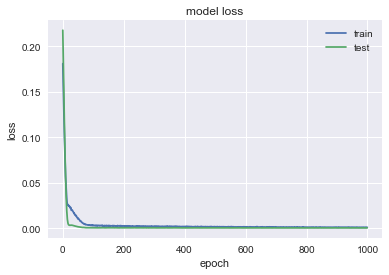

               BLK
MSE         30.152
MAE        4.31071
R2        0.948197
MAPE (%)  0.982428


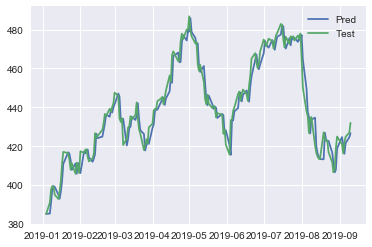

Predicting for  DVA
Train on 1008 samples, validate on 172 samples
Epoch 1/1000
0s - loss: 0.4419 - val_loss: 0.0718
Epoch 2/1000
0s - loss: 0.3942 - val_loss: 0.0588
Epoch 3/1000
0s - loss: 0.3506 - val_loss: 0.0471
Epoch 4/1000
0s - loss: 0.3103 - val_loss: 0.0367
Epoch 5/1000
0s - loss: 0.2696 - val_loss: 0.0276
Epoch 6/1000
0s - loss: 0.2327 - val_loss: 0.0197
Epoch 7/1000
0s - loss: 0.1959 - val_loss: 0.0133
Epoch 8/1000
0s - loss: 0.1634 - val_loss: 0.0085
Epoch 9/1000
0s - loss: 0.1313 - val_loss: 0.0055
Epoch 10/1000
0s - loss: 0.1035 - val_loss: 0.0045
Epoch 11/1000
0s - loss: 0.0783 - val_loss: 0.0055
Epoch 12/1000
0s - loss: 0.0576 - val_loss: 0.0087
Epoch 13/1000
0s - loss: 0.0425 - val_loss: 0.0137
Epoch 14/1000
0s - loss: 0.0299 - val_loss: 0.0201
Epoch 15/1000
0s - loss: 0.0211 - val_loss: 0.0272
Epoch 16/1000
0s - loss: 0.0168 - val_loss: 0.0340
Epoch 17/1000
0s - loss: 0.0145 - val_loss: 0.0397
Epoch 18/1000
0s - loss: 0.0142 - val_loss: 0.0436
Epoch 19/1000
0s - loss:

0s - loss: 0.0047 - val_loss: 0.0011
Epoch 169/1000
0s - loss: 0.0044 - val_loss: 0.0011
Epoch 170/1000
0s - loss: 0.0048 - val_loss: 0.0011
Epoch 171/1000
0s - loss: 0.0047 - val_loss: 0.0011
Epoch 172/1000
0s - loss: 0.0047 - val_loss: 0.0011
Epoch 173/1000
0s - loss: 0.0047 - val_loss: 0.0011
Epoch 174/1000
0s - loss: 0.0046 - val_loss: 0.0010
Epoch 175/1000
0s - loss: 0.0045 - val_loss: 0.0010
Epoch 176/1000
0s - loss: 0.0045 - val_loss: 0.0011
Epoch 177/1000
0s - loss: 0.0047 - val_loss: 0.0011
Epoch 178/1000
0s - loss: 0.0049 - val_loss: 0.0011
Epoch 179/1000
0s - loss: 0.0050 - val_loss: 0.0011
Epoch 180/1000
0s - loss: 0.0047 - val_loss: 0.0010
Epoch 181/1000
0s - loss: 0.0048 - val_loss: 0.0010
Epoch 182/1000
0s - loss: 0.0046 - val_loss: 0.0010
Epoch 183/1000
0s - loss: 0.0047 - val_loss: 0.0010
Epoch 184/1000
0s - loss: 0.0047 - val_loss: 0.0011
Epoch 185/1000
0s - loss: 0.0049 - val_loss: 0.0011
Epoch 186/1000
0s - loss: 0.0046 - val_loss: 0.0010
Epoch 187/1000
0s - loss: 0

0s - loss: 0.0036 - val_loss: 8.7351e-04
Epoch 320/1000
0s - loss: 0.0037 - val_loss: 8.8531e-04
Epoch 321/1000
0s - loss: 0.0036 - val_loss: 8.7469e-04
Epoch 322/1000
0s - loss: 0.0036 - val_loss: 8.9236e-04
Epoch 323/1000
0s - loss: 0.0036 - val_loss: 8.7655e-04
Epoch 324/1000
0s - loss: 0.0039 - val_loss: 8.6929e-04
Epoch 325/1000
0s - loss: 0.0036 - val_loss: 8.5820e-04
Epoch 326/1000
0s - loss: 0.0036 - val_loss: 8.9227e-04
Epoch 327/1000
0s - loss: 0.0038 - val_loss: 9.3425e-04
Epoch 328/1000
0s - loss: 0.0039 - val_loss: 8.9625e-04
Epoch 329/1000
0s - loss: 0.0038 - val_loss: 8.4149e-04
Epoch 330/1000
0s - loss: 0.0035 - val_loss: 8.3942e-04
Epoch 331/1000
0s - loss: 0.0032 - val_loss: 8.6060e-04
Epoch 332/1000
0s - loss: 0.0039 - val_loss: 8.9278e-04
Epoch 333/1000
0s - loss: 0.0035 - val_loss: 9.3391e-04
Epoch 334/1000
0s - loss: 0.0033 - val_loss: 9.0034e-04
Epoch 335/1000
0s - loss: 0.0039 - val_loss: 8.3394e-04
Epoch 336/1000
0s - loss: 0.0037 - val_loss: 8.3550e-04
Epoch 3

0s - loss: 0.0031 - val_loss: 7.9384e-04
Epoch 471/1000
0s - loss: 0.0029 - val_loss: 7.6945e-04
Epoch 472/1000
0s - loss: 0.0032 - val_loss: 7.7133e-04
Epoch 473/1000
0s - loss: 0.0032 - val_loss: 8.0018e-04
Epoch 474/1000
0s - loss: 0.0029 - val_loss: 7.8487e-04
Epoch 475/1000
0s - loss: 0.0029 - val_loss: 7.7374e-04
Epoch 476/1000
0s - loss: 0.0029 - val_loss: 8.0906e-04
Epoch 477/1000
0s - loss: 0.0031 - val_loss: 8.0094e-04
Epoch 478/1000
0s - loss: 0.0030 - val_loss: 7.8304e-04
Epoch 479/1000
0s - loss: 0.0032 - val_loss: 7.8665e-04
Epoch 480/1000
0s - loss: 0.0030 - val_loss: 8.1781e-04
Epoch 481/1000
0s - loss: 0.0030 - val_loss: 7.7592e-04
Epoch 482/1000
0s - loss: 0.0029 - val_loss: 7.6459e-04
Epoch 483/1000
0s - loss: 0.0031 - val_loss: 7.8762e-04
Epoch 484/1000
0s - loss: 0.0029 - val_loss: 7.9460e-04
Epoch 485/1000
0s - loss: 0.0028 - val_loss: 7.8671e-04
Epoch 486/1000
0s - loss: 0.0029 - val_loss: 7.9092e-04
Epoch 487/1000
0s - loss: 0.0027 - val_loss: 7.8300e-04
Epoch 4

0s - loss: 0.0025 - val_loss: 7.2347e-04
Epoch 618/1000
0s - loss: 0.0024 - val_loss: 7.1696e-04
Epoch 619/1000
0s - loss: 0.0023 - val_loss: 7.4329e-04
Epoch 620/1000
0s - loss: 0.0026 - val_loss: 7.4886e-04
Epoch 621/1000
0s - loss: 0.0024 - val_loss: 7.2702e-04
Epoch 622/1000
0s - loss: 0.0026 - val_loss: 7.2511e-04
Epoch 623/1000
0s - loss: 0.0024 - val_loss: 7.6867e-04
Epoch 624/1000
0s - loss: 0.0024 - val_loss: 7.4993e-04
Epoch 625/1000
0s - loss: 0.0025 - val_loss: 7.2863e-04
Epoch 626/1000
0s - loss: 0.0024 - val_loss: 7.3345e-04
Epoch 627/1000
0s - loss: 0.0023 - val_loss: 7.7830e-04
Epoch 628/1000
0s - loss: 0.0023 - val_loss: 7.6584e-04
Epoch 629/1000
0s - loss: 0.0024 - val_loss: 7.1094e-04
Epoch 630/1000
0s - loss: 0.0022 - val_loss: 7.0544e-04
Epoch 631/1000
0s - loss: 0.0023 - val_loss: 7.1428e-04
Epoch 632/1000
0s - loss: 0.0025 - val_loss: 7.3621e-04
Epoch 633/1000
0s - loss: 0.0024 - val_loss: 7.6087e-04
Epoch 634/1000
0s - loss: 0.0023 - val_loss: 7.4786e-04
Epoch 6

0s - loss: 0.0022 - val_loss: 7.4090e-04
Epoch 768/1000
0s - loss: 0.0017 - val_loss: 7.3124e-04
Epoch 769/1000
0s - loss: 0.0018 - val_loss: 7.1018e-04
Epoch 770/1000
0s - loss: 0.0020 - val_loss: 7.4836e-04
Epoch 771/1000
0s - loss: 0.0022 - val_loss: 7.8137e-04
Epoch 772/1000
0s - loss: 0.0020 - val_loss: 7.1005e-04
Epoch 773/1000
0s - loss: 0.0019 - val_loss: 7.1042e-04
Epoch 774/1000
0s - loss: 0.0020 - val_loss: 7.3570e-04
Epoch 775/1000
0s - loss: 0.0020 - val_loss: 7.1828e-04
Epoch 776/1000
0s - loss: 0.0019 - val_loss: 7.1179e-04
Epoch 777/1000
0s - loss: 0.0019 - val_loss: 7.1465e-04
Epoch 778/1000
0s - loss: 0.0018 - val_loss: 7.3251e-04
Epoch 779/1000
0s - loss: 0.0019 - val_loss: 7.1419e-04
Epoch 780/1000
0s - loss: 0.0019 - val_loss: 7.0155e-04
Epoch 781/1000
0s - loss: 0.0019 - val_loss: 7.0690e-04
Epoch 782/1000
0s - loss: 0.0018 - val_loss: 7.1212e-04
Epoch 783/1000
0s - loss: 0.0018 - val_loss: 7.0330e-04
Epoch 784/1000
0s - loss: 0.0018 - val_loss: 7.0605e-04
Epoch 7

0s - loss: 0.0016 - val_loss: 7.1591e-04
Epoch 923/1000
0s - loss: 0.0016 - val_loss: 7.0881e-04
Epoch 924/1000
0s - loss: 0.0015 - val_loss: 7.0004e-04
Epoch 925/1000
0s - loss: 0.0015 - val_loss: 7.1231e-04
Epoch 926/1000
0s - loss: 0.0015 - val_loss: 7.2862e-04
Epoch 927/1000
0s - loss: 0.0015 - val_loss: 6.9958e-04
Epoch 928/1000
0s - loss: 0.0016 - val_loss: 7.1869e-04
Epoch 929/1000
0s - loss: 0.0016 - val_loss: 7.1094e-04
Epoch 930/1000
0s - loss: 0.0015 - val_loss: 7.0017e-04
Epoch 931/1000
0s - loss: 0.0017 - val_loss: 7.0689e-04
Epoch 932/1000
0s - loss: 0.0017 - val_loss: 7.1849e-04
Epoch 933/1000
0s - loss: 0.0015 - val_loss: 7.1078e-04
Epoch 934/1000
0s - loss: 0.0015 - val_loss: 7.0612e-04
Epoch 935/1000
0s - loss: 0.0016 - val_loss: 7.1328e-04
Epoch 936/1000
0s - loss: 0.0015 - val_loss: 7.1524e-04
Epoch 937/1000
0s - loss: 0.0015 - val_loss: 7.3314e-04
Epoch 938/1000
0s - loss: 0.0016 - val_loss: 7.1834e-04
Epoch 939/1000
0s - loss: 0.0016 - val_loss: 7.2474e-04
Epoch 9

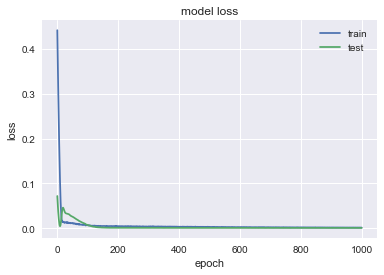

               DVA
MSE        1.24204
MAE       0.791996
R2        0.898841
MAPE (%)   1.47349


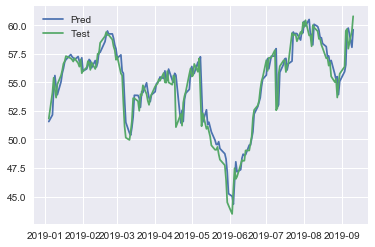

Predicting for  BA
Train on 1008 samples, validate on 172 samples
Epoch 1/1000
0s - loss: 0.1466 - val_loss: 0.5368
Epoch 2/1000
0s - loss: 0.1337 - val_loss: 0.4990
Epoch 3/1000
0s - loss: 0.1211 - val_loss: 0.4615
Epoch 4/1000
0s - loss: 0.1100 - val_loss: 0.4248
Epoch 5/1000
0s - loss: 0.0990 - val_loss: 0.3892
Epoch 6/1000
0s - loss: 0.0884 - val_loss: 0.3545
Epoch 7/1000
0s - loss: 0.0790 - val_loss: 0.3208
Epoch 8/1000
0s - loss: 0.0706 - val_loss: 0.2882
Epoch 9/1000
0s - loss: 0.0627 - val_loss: 0.2569
Epoch 10/1000
0s - loss: 0.0556 - val_loss: 0.2271
Epoch 11/1000
0s - loss: 0.0507 - val_loss: 0.1990
Epoch 12/1000
0s - loss: 0.0445 - val_loss: 0.1730
Epoch 13/1000
0s - loss: 0.0401 - val_loss: 0.1492
Epoch 14/1000
0s - loss: 0.0367 - val_loss: 0.1278
Epoch 15/1000
0s - loss: 0.0337 - val_loss: 0.1090
Epoch 16/1000
0s - loss: 0.0335 - val_loss: 0.0930
Epoch 17/1000
0s - loss: 0.0324 - val_loss: 0.0795
Epoch 18/1000
0s - loss: 0.0321 - val_loss: 0.0684
Epoch 19/1000
0s - loss: 

0s - loss: 0.0019 - val_loss: 4.6385e-04
Epoch 157/1000
0s - loss: 0.0020 - val_loss: 4.7190e-04
Epoch 158/1000
0s - loss: 0.0018 - val_loss: 4.9021e-04
Epoch 159/1000
0s - loss: 0.0021 - val_loss: 4.9782e-04
Epoch 160/1000
0s - loss: 0.0017 - val_loss: 4.9579e-04
Epoch 161/1000
0s - loss: 0.0022 - val_loss: 4.9613e-04
Epoch 162/1000
0s - loss: 0.0021 - val_loss: 4.8744e-04
Epoch 163/1000
0s - loss: 0.0020 - val_loss: 4.7443e-04
Epoch 164/1000
0s - loss: 0.0017 - val_loss: 4.6933e-04
Epoch 165/1000
0s - loss: 0.0018 - val_loss: 4.6924e-04
Epoch 166/1000
0s - loss: 0.0016 - val_loss: 4.6892e-04
Epoch 167/1000
0s - loss: 0.0022 - val_loss: 4.6546e-04
Epoch 168/1000
0s - loss: 0.0020 - val_loss: 4.7014e-04
Epoch 169/1000
0s - loss: 0.0018 - val_loss: 4.9888e-04
Epoch 170/1000
0s - loss: 0.0021 - val_loss: 5.3540e-04
Epoch 171/1000
0s - loss: 0.0019 - val_loss: 5.5029e-04
Epoch 172/1000
0s - loss: 0.0020 - val_loss: 5.5817e-04
Epoch 173/1000
0s - loss: 0.0021 - val_loss: 5.1751e-04
Epoch 1

0s - loss: 0.0016 - val_loss: 5.0089e-04
Epoch 310/1000
0s - loss: 0.0015 - val_loss: 4.8665e-04
Epoch 311/1000
0s - loss: 0.0018 - val_loss: 4.9232e-04
Epoch 312/1000
0s - loss: 0.0016 - val_loss: 4.5515e-04
Epoch 313/1000
0s - loss: 0.0016 - val_loss: 4.4711e-04
Epoch 314/1000
0s - loss: 0.0017 - val_loss: 4.6609e-04
Epoch 315/1000
0s - loss: 0.0019 - val_loss: 4.8772e-04
Epoch 316/1000
0s - loss: 0.0017 - val_loss: 4.9400e-04
Epoch 317/1000
0s - loss: 0.0015 - val_loss: 4.9080e-04
Epoch 318/1000
0s - loss: 0.0016 - val_loss: 5.0283e-04
Epoch 319/1000
0s - loss: 0.0015 - val_loss: 5.4709e-04
Epoch 320/1000
0s - loss: 0.0013 - val_loss: 5.8729e-04
Epoch 321/1000
0s - loss: 0.0017 - val_loss: 5.9569e-04
Epoch 322/1000
0s - loss: 0.0015 - val_loss: 5.2543e-04
Epoch 323/1000
0s - loss: 0.0017 - val_loss: 4.5982e-04
Epoch 324/1000
0s - loss: 0.0014 - val_loss: 4.3222e-04
Epoch 325/1000
0s - loss: 0.0015 - val_loss: 4.4251e-04
Epoch 326/1000
0s - loss: 0.0016 - val_loss: 4.7121e-04
Epoch 3

0s - loss: 0.0013 - val_loss: 4.7265e-04
Epoch 462/1000
0s - loss: 0.0012 - val_loss: 4.2301e-04
Epoch 463/1000
0s - loss: 0.0011 - val_loss: 4.2161e-04
Epoch 464/1000
0s - loss: 0.0012 - val_loss: 5.0650e-04
Epoch 465/1000
0s - loss: 0.0012 - val_loss: 6.3876e-04
Epoch 466/1000
0s - loss: 0.0014 - val_loss: 5.6988e-04
Epoch 467/1000
0s - loss: 0.0013 - val_loss: 4.9223e-04
Epoch 468/1000
0s - loss: 0.0014 - val_loss: 4.4435e-04
Epoch 469/1000
0s - loss: 0.0013 - val_loss: 4.2959e-04
Epoch 470/1000
0s - loss: 0.0012 - val_loss: 4.7101e-04
Epoch 471/1000
0s - loss: 0.0012 - val_loss: 6.0995e-04
Epoch 472/1000
0s - loss: 0.0013 - val_loss: 6.2807e-04
Epoch 473/1000
0s - loss: 0.0011 - val_loss: 5.0348e-04
Epoch 474/1000
0s - loss: 0.0012 - val_loss: 4.8503e-04
Epoch 475/1000
0s - loss: 0.0012 - val_loss: 4.8276e-04
Epoch 476/1000
0s - loss: 0.0012 - val_loss: 5.3973e-04
Epoch 477/1000
0s - loss: 0.0012 - val_loss: 5.4878e-04
Epoch 478/1000
0s - loss: 0.0013 - val_loss: 4.7310e-04
Epoch 4

0s - loss: 0.0013 - val_loss: 4.6242e-04
Epoch 610/1000
0s - loss: 0.0010 - val_loss: 4.8054e-04
Epoch 611/1000
0s - loss: 0.0010 - val_loss: 5.1530e-04
Epoch 612/1000
0s - loss: 0.0011 - val_loss: 5.4839e-04
Epoch 613/1000
0s - loss: 0.0013 - val_loss: 5.2607e-04
Epoch 614/1000
0s - loss: 0.0011 - val_loss: 5.3035e-04
Epoch 615/1000
0s - loss: 0.0011 - val_loss: 5.8977e-04
Epoch 616/1000
0s - loss: 0.0011 - val_loss: 6.9079e-04
Epoch 617/1000
0s - loss: 0.0011 - val_loss: 6.5202e-04
Epoch 618/1000
0s - loss: 0.0011 - val_loss: 6.1511e-04
Epoch 619/1000
0s - loss: 0.0012 - val_loss: 6.0515e-04
Epoch 620/1000
0s - loss: 0.0011 - val_loss: 5.3378e-04
Epoch 621/1000
0s - loss: 0.0013 - val_loss: 6.0722e-04
Epoch 622/1000
0s - loss: 0.0012 - val_loss: 6.9003e-04
Epoch 623/1000
0s - loss: 0.0011 - val_loss: 5.8394e-04
Epoch 624/1000
0s - loss: 9.7586e-04 - val_loss: 5.2137e-04
Epoch 625/1000
0s - loss: 0.0011 - val_loss: 5.9068e-04
Epoch 626/1000
0s - loss: 0.0011 - val_loss: 6.6211e-04
Epo

0s - loss: 9.3213e-04 - val_loss: 5.3162e-04
Epoch 761/1000
0s - loss: 8.8420e-04 - val_loss: 5.2201e-04
Epoch 762/1000
0s - loss: 0.0010 - val_loss: 5.8479e-04
Epoch 763/1000
0s - loss: 0.0010 - val_loss: 5.1920e-04
Epoch 764/1000
0s - loss: 0.0012 - val_loss: 4.6654e-04
Epoch 765/1000
0s - loss: 9.9768e-04 - val_loss: 4.6275e-04
Epoch 766/1000
0s - loss: 9.9809e-04 - val_loss: 5.2507e-04
Epoch 767/1000
0s - loss: 0.0010 - val_loss: 6.0012e-04
Epoch 768/1000
0s - loss: 0.0010 - val_loss: 5.6370e-04
Epoch 769/1000
0s - loss: 9.6963e-04 - val_loss: 4.9663e-04
Epoch 770/1000
0s - loss: 9.9524e-04 - val_loss: 5.2407e-04
Epoch 771/1000
0s - loss: 9.2641e-04 - val_loss: 6.2129e-04
Epoch 772/1000
0s - loss: 8.8949e-04 - val_loss: 6.9492e-04
Epoch 773/1000
0s - loss: 0.0010 - val_loss: 5.6162e-04
Epoch 774/1000
0s - loss: 0.0010 - val_loss: 4.8067e-04
Epoch 775/1000
0s - loss: 9.2386e-04 - val_loss: 5.1107e-04
Epoch 776/1000
0s - loss: 9.4995e-04 - val_loss: 6.0351e-04
Epoch 777/1000
0s - los

0s - loss: 8.5640e-04 - val_loss: 4.6503e-04
Epoch 910/1000
0s - loss: 8.7954e-04 - val_loss: 5.2345e-04
Epoch 911/1000
0s - loss: 9.4054e-04 - val_loss: 6.7927e-04
Epoch 912/1000
0s - loss: 8.9866e-04 - val_loss: 6.3477e-04
Epoch 913/1000
0s - loss: 9.6453e-04 - val_loss: 4.9376e-04
Epoch 914/1000
0s - loss: 9.2363e-04 - val_loss: 4.9414e-04
Epoch 915/1000
0s - loss: 9.7288e-04 - val_loss: 6.0292e-04
Epoch 916/1000
0s - loss: 8.6175e-04 - val_loss: 6.8355e-04
Epoch 917/1000
0s - loss: 8.7397e-04 - val_loss: 6.1083e-04
Epoch 918/1000
0s - loss: 8.4719e-04 - val_loss: 4.9464e-04
Epoch 919/1000
0s - loss: 8.8260e-04 - val_loss: 5.4655e-04
Epoch 920/1000
0s - loss: 8.7726e-04 - val_loss: 6.0445e-04
Epoch 921/1000
0s - loss: 0.0010 - val_loss: 5.2483e-04
Epoch 922/1000
0s - loss: 0.0010 - val_loss: 5.2174e-04
Epoch 923/1000
0s - loss: 0.0011 - val_loss: 6.3587e-04
Epoch 924/1000
0s - loss: 9.2441e-04 - val_loss: 5.6552e-04
Epoch 925/1000
0s - loss: 9.6687e-04 - val_loss: 4.5853e-04
Epoch 9

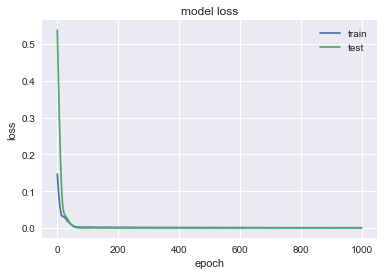

                BA
MSE        73.2921
MAE        6.41121
R2        0.870313
MAPE (%)   1.71015


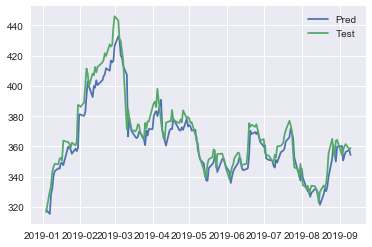

Predicting for  IBM
Train on 1008 samples, validate on 172 samples
Epoch 1/1000
0s - loss: 0.3569 - val_loss: 0.1350
Epoch 2/1000
0s - loss: 0.3203 - val_loss: 0.1162
Epoch 3/1000
0s - loss: 0.2874 - val_loss: 0.0985
Epoch 4/1000
0s - loss: 0.2528 - val_loss: 0.0818
Epoch 5/1000
0s - loss: 0.2216 - val_loss: 0.0661
Epoch 6/1000
0s - loss: 0.1888 - val_loss: 0.0516
Epoch 7/1000
0s - loss: 0.1610 - val_loss: 0.0385
Epoch 8/1000
0s - loss: 0.1315 - val_loss: 0.0271
Epoch 9/1000
0s - loss: 0.1065 - val_loss: 0.0177
Epoch 10/1000
0s - loss: 0.0831 - val_loss: 0.0105
Epoch 11/1000
0s - loss: 0.0640 - val_loss: 0.0058
Epoch 12/1000
0s - loss: 0.0481 - val_loss: 0.0035
Epoch 13/1000
0s - loss: 0.0340 - val_loss: 0.0035
Epoch 14/1000
0s - loss: 0.0243 - val_loss: 0.0053
Epoch 15/1000
0s - loss: 0.0195 - val_loss: 0.0082
Epoch 16/1000
0s - loss: 0.0156 - val_loss: 0.0114
Epoch 17/1000
0s - loss: 0.0145 - val_loss: 0.0140
Epoch 18/1000
0s - loss: 0.0142 - val_loss: 0.0157
Epoch 19/1000
0s - loss:

0s - loss: 0.0044 - val_loss: 5.3866e-04
Epoch 163/1000
0s - loss: 0.0046 - val_loss: 5.4853e-04
Epoch 164/1000
0s - loss: 0.0041 - val_loss: 5.3641e-04
Epoch 165/1000
0s - loss: 0.0045 - val_loss: 5.1569e-04
Epoch 166/1000
0s - loss: 0.0041 - val_loss: 5.2626e-04
Epoch 167/1000
0s - loss: 0.0047 - val_loss: 5.4952e-04
Epoch 168/1000
0s - loss: 0.0046 - val_loss: 5.3284e-04
Epoch 169/1000
0s - loss: 0.0044 - val_loss: 5.0560e-04
Epoch 170/1000
0s - loss: 0.0045 - val_loss: 4.9898e-04
Epoch 171/1000
0s - loss: 0.0044 - val_loss: 5.0798e-04
Epoch 172/1000
0s - loss: 0.0046 - val_loss: 5.1811e-04
Epoch 173/1000
0s - loss: 0.0045 - val_loss: 5.1810e-04
Epoch 174/1000
0s - loss: 0.0043 - val_loss: 5.2840e-04
Epoch 175/1000
0s - loss: 0.0043 - val_loss: 5.2801e-04
Epoch 176/1000
0s - loss: 0.0042 - val_loss: 5.2911e-04
Epoch 177/1000
0s - loss: 0.0046 - val_loss: 5.1901e-04
Epoch 178/1000
0s - loss: 0.0044 - val_loss: 5.0743e-04
Epoch 179/1000
0s - loss: 0.0043 - val_loss: 5.0180e-04
Epoch 1

0s - loss: 0.0034 - val_loss: 5.7805e-04
Epoch 316/1000
0s - loss: 0.0033 - val_loss: 5.4977e-04
Epoch 317/1000
0s - loss: 0.0037 - val_loss: 5.1164e-04
Epoch 318/1000
0s - loss: 0.0034 - val_loss: 4.9643e-04
Epoch 319/1000
0s - loss: 0.0036 - val_loss: 4.9952e-04
Epoch 320/1000
0s - loss: 0.0030 - val_loss: 5.3599e-04
Epoch 321/1000
0s - loss: 0.0035 - val_loss: 5.3068e-04
Epoch 322/1000
0s - loss: 0.0031 - val_loss: 5.3087e-04
Epoch 323/1000
0s - loss: 0.0034 - val_loss: 5.2299e-04
Epoch 324/1000
0s - loss: 0.0033 - val_loss: 5.1191e-04
Epoch 325/1000
0s - loss: 0.0035 - val_loss: 5.0353e-04
Epoch 326/1000
0s - loss: 0.0037 - val_loss: 5.0770e-04
Epoch 327/1000
0s - loss: 0.0034 - val_loss: 5.1096e-04
Epoch 328/1000
0s - loss: 0.0033 - val_loss: 5.0776e-04
Epoch 329/1000
0s - loss: 0.0030 - val_loss: 5.0320e-04
Epoch 330/1000
0s - loss: 0.0032 - val_loss: 5.1505e-04
Epoch 331/1000
0s - loss: 0.0032 - val_loss: 5.0909e-04
Epoch 332/1000
0s - loss: 0.0035 - val_loss: 5.2832e-04
Epoch 3

0s - loss: 0.0027 - val_loss: 5.1184e-04
Epoch 469/1000
0s - loss: 0.0028 - val_loss: 5.1304e-04
Epoch 470/1000
0s - loss: 0.0027 - val_loss: 5.1640e-04
Epoch 471/1000
0s - loss: 0.0029 - val_loss: 5.2166e-04
Epoch 472/1000
0s - loss: 0.0026 - val_loss: 5.1762e-04
Epoch 473/1000
0s - loss: 0.0028 - val_loss: 5.0098e-04
Epoch 474/1000
0s - loss: 0.0030 - val_loss: 4.9477e-04
Epoch 475/1000
0s - loss: 0.0026 - val_loss: 5.0196e-04
Epoch 476/1000
0s - loss: 0.0027 - val_loss: 5.2617e-04
Epoch 477/1000
0s - loss: 0.0027 - val_loss: 5.1506e-04
Epoch 478/1000
0s - loss: 0.0029 - val_loss: 4.9104e-04
Epoch 479/1000
0s - loss: 0.0029 - val_loss: 4.9286e-04
Epoch 480/1000
0s - loss: 0.0028 - val_loss: 5.0145e-04
Epoch 481/1000
0s - loss: 0.0027 - val_loss: 5.4671e-04
Epoch 482/1000
0s - loss: 0.0029 - val_loss: 5.1986e-04
Epoch 483/1000
0s - loss: 0.0027 - val_loss: 5.0120e-04
Epoch 484/1000
0s - loss: 0.0027 - val_loss: 5.0928e-04
Epoch 485/1000
0s - loss: 0.0025 - val_loss: 5.3623e-04
Epoch 4

0s - loss: 0.0024 - val_loss: 4.9507e-04
Epoch 622/1000
0s - loss: 0.0024 - val_loss: 5.1550e-04
Epoch 623/1000
0s - loss: 0.0021 - val_loss: 5.2274e-04
Epoch 624/1000
0s - loss: 0.0021 - val_loss: 5.1663e-04
Epoch 625/1000
0s - loss: 0.0023 - val_loss: 4.9703e-04
Epoch 626/1000
0s - loss: 0.0022 - val_loss: 4.9817e-04
Epoch 627/1000
0s - loss: 0.0023 - val_loss: 5.2989e-04
Epoch 628/1000
0s - loss: 0.0023 - val_loss: 5.4290e-04
Epoch 629/1000
0s - loss: 0.0021 - val_loss: 5.1977e-04
Epoch 630/1000
0s - loss: 0.0021 - val_loss: 5.0760e-04
Epoch 631/1000
0s - loss: 0.0022 - val_loss: 5.1585e-04
Epoch 632/1000
0s - loss: 0.0021 - val_loss: 5.1273e-04
Epoch 633/1000
0s - loss: 0.0022 - val_loss: 5.1106e-04
Epoch 634/1000
0s - loss: 0.0023 - val_loss: 5.1771e-04
Epoch 635/1000
0s - loss: 0.0022 - val_loss: 5.3014e-04
Epoch 636/1000
0s - loss: 0.0023 - val_loss: 5.4909e-04
Epoch 637/1000
0s - loss: 0.0022 - val_loss: 5.4148e-04
Epoch 638/1000
0s - loss: 0.0022 - val_loss: 5.1345e-04
Epoch 6

0s - loss: 0.0019 - val_loss: 5.1205e-04
Epoch 775/1000
0s - loss: 0.0018 - val_loss: 5.0438e-04
Epoch 776/1000
0s - loss: 0.0019 - val_loss: 5.2537e-04
Epoch 777/1000
0s - loss: 0.0018 - val_loss: 5.2659e-04
Epoch 778/1000
0s - loss: 0.0017 - val_loss: 4.9854e-04
Epoch 779/1000
0s - loss: 0.0017 - val_loss: 4.9972e-04
Epoch 780/1000
0s - loss: 0.0018 - val_loss: 5.0086e-04
Epoch 781/1000
0s - loss: 0.0017 - val_loss: 5.1014e-04
Epoch 782/1000
0s - loss: 0.0017 - val_loss: 5.2576e-04
Epoch 783/1000
0s - loss: 0.0018 - val_loss: 5.1300e-04
Epoch 784/1000
0s - loss: 0.0017 - val_loss: 5.1238e-04
Epoch 785/1000
0s - loss: 0.0017 - val_loss: 4.9600e-04
Epoch 786/1000
0s - loss: 0.0017 - val_loss: 4.9543e-04
Epoch 787/1000
0s - loss: 0.0017 - val_loss: 5.1629e-04
Epoch 788/1000
0s - loss: 0.0017 - val_loss: 5.1077e-04
Epoch 789/1000
0s - loss: 0.0018 - val_loss: 4.8847e-04
Epoch 790/1000
0s - loss: 0.0015 - val_loss: 4.9408e-04
Epoch 791/1000
0s - loss: 0.0018 - val_loss: 5.0694e-04
Epoch 7

0s - loss: 0.0014 - val_loss: 5.2912e-04
Epoch 928/1000
0s - loss: 0.0015 - val_loss: 5.1115e-04
Epoch 929/1000
0s - loss: 0.0014 - val_loss: 5.0015e-04
Epoch 930/1000
0s - loss: 0.0014 - val_loss: 5.2237e-04
Epoch 931/1000
0s - loss: 0.0015 - val_loss: 5.0035e-04
Epoch 932/1000
0s - loss: 0.0013 - val_loss: 4.9383e-04
Epoch 933/1000
0s - loss: 0.0013 - val_loss: 4.9173e-04
Epoch 934/1000
0s - loss: 0.0015 - val_loss: 4.9038e-04
Epoch 935/1000
0s - loss: 0.0013 - val_loss: 5.1095e-04
Epoch 936/1000
0s - loss: 0.0015 - val_loss: 5.0703e-04
Epoch 937/1000
0s - loss: 0.0014 - val_loss: 5.0240e-04
Epoch 938/1000
0s - loss: 0.0014 - val_loss: 4.9993e-04
Epoch 939/1000
0s - loss: 0.0015 - val_loss: 5.2019e-04
Epoch 940/1000
0s - loss: 0.0016 - val_loss: 5.0985e-04
Epoch 941/1000
0s - loss: 0.0014 - val_loss: 5.0408e-04
Epoch 942/1000
0s - loss: 0.0016 - val_loss: 5.2674e-04
Epoch 943/1000
0s - loss: 0.0015 - val_loss: 5.1673e-04
Epoch 944/1000
0s - loss: 0.0015 - val_loss: 5.0533e-04
Epoch 9

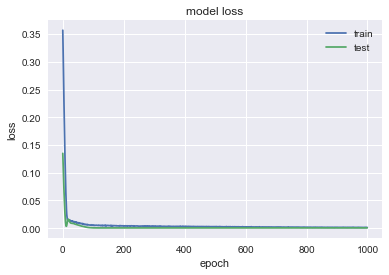

               IBM
MSE        3.00392
MAE        1.21772
R2        0.932403
MAPE (%)  0.892179


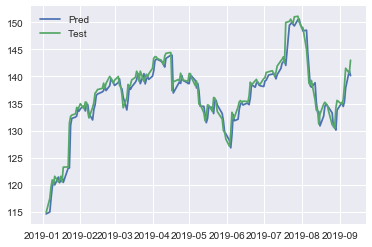

Predicting for  ALB
Train on 1008 samples, validate on 172 samples
Epoch 1/1000
0s - loss: 0.2514 - val_loss: 0.1021
Epoch 2/1000
0s - loss: 0.2253 - val_loss: 0.0867
Epoch 3/1000
0s - loss: 0.2007 - val_loss: 0.0726
Epoch 4/1000
0s - loss: 0.1775 - val_loss: 0.0596
Epoch 5/1000
0s - loss: 0.1557 - val_loss: 0.0479
Epoch 6/1000
0s - loss: 0.1361 - val_loss: 0.0373
Epoch 7/1000
0s - loss: 0.1173 - val_loss: 0.0281
Epoch 8/1000
0s - loss: 0.1001 - val_loss: 0.0202
Epoch 9/1000
0s - loss: 0.0841 - val_loss: 0.0138
Epoch 10/1000
0s - loss: 0.0706 - val_loss: 0.0088
Epoch 11/1000
0s - loss: 0.0589 - val_loss: 0.0055
Epoch 12/1000
0s - loss: 0.0495 - val_loss: 0.0036
Epoch 13/1000
0s - loss: 0.0419 - val_loss: 0.0032
Epoch 14/1000
0s - loss: 0.0350 - val_loss: 0.0038
Epoch 15/1000
0s - loss: 0.0310 - val_loss: 0.0053
Epoch 16/1000
0s - loss: 0.0283 - val_loss: 0.0073
Epoch 17/1000
0s - loss: 0.0285 - val_loss: 0.0092
Epoch 18/1000
0s - loss: 0.0281 - val_loss: 0.0109
Epoch 19/1000
0s - loss:

0s - loss: 0.0029 - val_loss: 2.8854e-04
Epoch 155/1000
0s - loss: 0.0031 - val_loss: 2.8442e-04
Epoch 156/1000
0s - loss: 0.0030 - val_loss: 2.7502e-04
Epoch 157/1000
0s - loss: 0.0033 - val_loss: 2.7122e-04
Epoch 158/1000
0s - loss: 0.0031 - val_loss: 2.7016e-04
Epoch 159/1000
0s - loss: 0.0030 - val_loss: 2.6316e-04
Epoch 160/1000
0s - loss: 0.0031 - val_loss: 2.6226e-04
Epoch 161/1000
0s - loss: 0.0033 - val_loss: 2.7026e-04
Epoch 162/1000
0s - loss: 0.0032 - val_loss: 2.7955e-04
Epoch 163/1000
0s - loss: 0.0029 - val_loss: 2.8880e-04
Epoch 164/1000
0s - loss: 0.0030 - val_loss: 2.9453e-04
Epoch 165/1000
0s - loss: 0.0034 - val_loss: 2.8735e-04
Epoch 166/1000
0s - loss: 0.0032 - val_loss: 2.8087e-04
Epoch 167/1000
0s - loss: 0.0029 - val_loss: 2.7766e-04
Epoch 168/1000
0s - loss: 0.0032 - val_loss: 2.8079e-04
Epoch 169/1000
0s - loss: 0.0032 - val_loss: 2.8101e-04
Epoch 170/1000
0s - loss: 0.0028 - val_loss: 2.8154e-04
Epoch 171/1000
0s - loss: 0.0031 - val_loss: 2.8241e-04
Epoch 1

Epoch 306/1000
0s - loss: 0.0027 - val_loss: 2.5636e-04
Epoch 307/1000
0s - loss: 0.0027 - val_loss: 2.5342e-04
Epoch 308/1000
0s - loss: 0.0022 - val_loss: 2.5401e-04
Epoch 309/1000
0s - loss: 0.0024 - val_loss: 2.5411e-04
Epoch 310/1000
0s - loss: 0.0024 - val_loss: 2.5328e-04
Epoch 311/1000
0s - loss: 0.0023 - val_loss: 2.6468e-04
Epoch 312/1000
0s - loss: 0.0025 - val_loss: 2.8122e-04
Epoch 313/1000
0s - loss: 0.0022 - val_loss: 2.6963e-04
Epoch 314/1000
0s - loss: 0.0025 - val_loss: 2.5298e-04
Epoch 315/1000
0s - loss: 0.0025 - val_loss: 2.5177e-04
Epoch 316/1000
0s - loss: 0.0028 - val_loss: 2.5791e-04
Epoch 317/1000
0s - loss: 0.0022 - val_loss: 2.7105e-04
Epoch 318/1000
0s - loss: 0.0023 - val_loss: 2.8631e-04
Epoch 319/1000
0s - loss: 0.0023 - val_loss: 2.8077e-04
Epoch 320/1000
0s - loss: 0.0024 - val_loss: 2.6061e-04
Epoch 321/1000
0s - loss: 0.0023 - val_loss: 2.5442e-04
Epoch 322/1000
0s - loss: 0.0023 - val_loss: 2.5832e-04
Epoch 323/1000
0s - loss: 0.0022 - val_loss: 2.7

0s - loss: 0.0020 - val_loss: 2.5346e-04
Epoch 454/1000
0s - loss: 0.0020 - val_loss: 2.5633e-04
Epoch 455/1000
0s - loss: 0.0020 - val_loss: 2.6011e-04
Epoch 456/1000
0s - loss: 0.0022 - val_loss: 2.5459e-04
Epoch 457/1000
0s - loss: 0.0020 - val_loss: 2.5219e-04
Epoch 458/1000
0s - loss: 0.0019 - val_loss: 2.5230e-04
Epoch 459/1000
0s - loss: 0.0019 - val_loss: 2.5395e-04
Epoch 460/1000
0s - loss: 0.0020 - val_loss: 2.5750e-04
Epoch 461/1000
0s - loss: 0.0020 - val_loss: 2.5291e-04
Epoch 462/1000
0s - loss: 0.0020 - val_loss: 2.5377e-04
Epoch 463/1000
0s - loss: 0.0020 - val_loss: 2.6767e-04
Epoch 464/1000
0s - loss: 0.0021 - val_loss: 2.6189e-04
Epoch 465/1000
0s - loss: 0.0018 - val_loss: 2.5216e-04
Epoch 466/1000
0s - loss: 0.0019 - val_loss: 2.5517e-04
Epoch 467/1000
0s - loss: 0.0020 - val_loss: 2.5684e-04
Epoch 468/1000
0s - loss: 0.0018 - val_loss: 2.5217e-04
Epoch 469/1000
0s - loss: 0.0019 - val_loss: 2.6379e-04
Epoch 470/1000
0s - loss: 0.0020 - val_loss: 2.7085e-04
Epoch 4

Epoch 606/1000
0s - loss: 0.0017 - val_loss: 2.5555e-04
Epoch 607/1000
0s - loss: 0.0016 - val_loss: 2.5300e-04
Epoch 608/1000
0s - loss: 0.0015 - val_loss: 2.5447e-04
Epoch 609/1000
0s - loss: 0.0017 - val_loss: 2.5347e-04
Epoch 610/1000
0s - loss: 0.0018 - val_loss: 2.6225e-04
Epoch 611/1000
0s - loss: 0.0016 - val_loss: 2.6416e-04
Epoch 612/1000
0s - loss: 0.0017 - val_loss: 2.5377e-04
Epoch 613/1000
0s - loss: 0.0017 - val_loss: 2.5487e-04
Epoch 614/1000
0s - loss: 0.0016 - val_loss: 2.5345e-04
Epoch 615/1000
0s - loss: 0.0016 - val_loss: 2.5267e-04
Epoch 616/1000
0s - loss: 0.0016 - val_loss: 2.5214e-04
Epoch 617/1000
0s - loss: 0.0018 - val_loss: 2.5577e-04
Epoch 618/1000
0s - loss: 0.0017 - val_loss: 2.5542e-04
Epoch 619/1000
0s - loss: 0.0016 - val_loss: 2.5417e-04
Epoch 620/1000
0s - loss: 0.0017 - val_loss: 2.5582e-04
Epoch 621/1000
0s - loss: 0.0016 - val_loss: 2.5252e-04
Epoch 622/1000
0s - loss: 0.0016 - val_loss: 2.5253e-04
Epoch 623/1000
0s - loss: 0.0016 - val_loss: 2.5

0s - loss: 0.0014 - val_loss: 2.5457e-04
Epoch 756/1000
0s - loss: 0.0016 - val_loss: 2.5224e-04
Epoch 757/1000
0s - loss: 0.0012 - val_loss: 2.5214e-04
Epoch 758/1000
0s - loss: 0.0014 - val_loss: 2.5255e-04
Epoch 759/1000
0s - loss: 0.0013 - val_loss: 2.5217e-04
Epoch 760/1000
0s - loss: 0.0015 - val_loss: 2.5800e-04
Epoch 761/1000
0s - loss: 0.0014 - val_loss: 2.5671e-04
Epoch 762/1000
0s - loss: 0.0015 - val_loss: 2.5282e-04
Epoch 763/1000
0s - loss: 0.0013 - val_loss: 2.5979e-04
Epoch 764/1000
0s - loss: 0.0014 - val_loss: 2.6313e-04
Epoch 765/1000
0s - loss: 0.0014 - val_loss: 2.5292e-04
Epoch 766/1000
0s - loss: 0.0014 - val_loss: 2.6147e-04
Epoch 767/1000
0s - loss: 0.0013 - val_loss: 2.5240e-04
Epoch 768/1000
0s - loss: 0.0014 - val_loss: 2.6330e-04
Epoch 769/1000
0s - loss: 0.0013 - val_loss: 2.6136e-04
Epoch 770/1000
0s - loss: 0.0012 - val_loss: 2.5391e-04
Epoch 771/1000
0s - loss: 0.0014 - val_loss: 2.5240e-04
Epoch 772/1000
0s - loss: 0.0012 - val_loss: 2.5291e-04
Epoch 7

0s - loss: 0.0012 - val_loss: 2.5283e-04
Epoch 908/1000
0s - loss: 0.0011 - val_loss: 2.5455e-04
Epoch 909/1000
0s - loss: 0.0011 - val_loss: 2.5606e-04
Epoch 910/1000
0s - loss: 0.0013 - val_loss: 2.5694e-04
Epoch 911/1000
0s - loss: 0.0011 - val_loss: 2.6652e-04
Epoch 912/1000
0s - loss: 0.0011 - val_loss: 2.5388e-04
Epoch 913/1000
0s - loss: 0.0013 - val_loss: 2.5609e-04
Epoch 914/1000
0s - loss: 0.0013 - val_loss: 2.5290e-04
Epoch 915/1000
0s - loss: 0.0012 - val_loss: 2.5263e-04
Epoch 916/1000
0s - loss: 9.7892e-04 - val_loss: 2.5305e-04
Epoch 917/1000
0s - loss: 0.0013 - val_loss: 2.5487e-04
Epoch 918/1000
0s - loss: 0.0011 - val_loss: 2.6715e-04
Epoch 919/1000
0s - loss: 0.0011 - val_loss: 2.5243e-04
Epoch 920/1000
0s - loss: 0.0012 - val_loss: 2.7007e-04
Epoch 921/1000
0s - loss: 0.0013 - val_loss: 2.5396e-04
Epoch 922/1000
0s - loss: 0.0012 - val_loss: 2.5687e-04
Epoch 923/1000
0s - loss: 0.0011 - val_loss: 2.5689e-04
Epoch 924/1000
0s - loss: 0.0012 - val_loss: 2.5911e-04
Epo

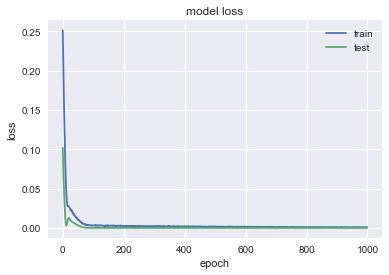

               ALB
MSE        2.63959
MAE        1.20858
R2        0.956861
MAPE (%)    1.6296


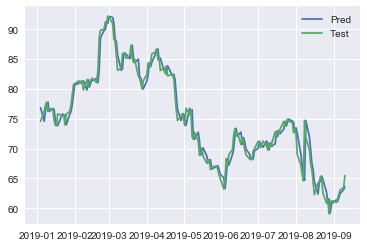

Predicting for  CBRE
Train on 1008 samples, validate on 172 samples
Epoch 1/1000
0s - loss: 0.2135 - val_loss: 0.6267
Epoch 2/1000
0s - loss: 0.1853 - val_loss: 0.5596
Epoch 3/1000
0s - loss: 0.1593 - val_loss: 0.4966
Epoch 4/1000
0s - loss: 0.1366 - val_loss: 0.4375
Epoch 5/1000
0s - loss: 0.1147 - val_loss: 0.3822
Epoch 6/1000
0s - loss: 0.0953 - val_loss: 0.3304
Epoch 7/1000
0s - loss: 0.0775 - val_loss: 0.2823
Epoch 8/1000
0s - loss: 0.0628 - val_loss: 0.2379
Epoch 9/1000
0s - loss: 0.0501 - val_loss: 0.1975
Epoch 10/1000
0s - loss: 0.0388 - val_loss: 0.1615
Epoch 11/1000
0s - loss: 0.0297 - val_loss: 0.1300
Epoch 12/1000
0s - loss: 0.0246 - val_loss: 0.1035
Epoch 13/1000
0s - loss: 0.0207 - val_loss: 0.0817
Epoch 14/1000
0s - loss: 0.0185 - val_loss: 0.0646
Epoch 15/1000
0s - loss: 0.0171 - val_loss: 0.0518
Epoch 16/1000
0s - loss: 0.0171 - val_loss: 0.0426
Epoch 17/1000
0s - loss: 0.0164 - val_loss: 0.0363
Epoch 18/1000
0s - loss: 0.0173 - val_loss: 0.0325
Epoch 19/1000
0s - loss

0s - loss: 0.0029 - val_loss: 5.7874e-04
Epoch 157/1000
0s - loss: 0.0028 - val_loss: 6.0468e-04
Epoch 158/1000
0s - loss: 0.0023 - val_loss: 6.5360e-04
Epoch 159/1000
0s - loss: 0.0026 - val_loss: 6.8588e-04
Epoch 160/1000
0s - loss: 0.0026 - val_loss: 6.7845e-04
Epoch 161/1000
0s - loss: 0.0028 - val_loss: 6.3065e-04
Epoch 162/1000
0s - loss: 0.0024 - val_loss: 5.9177e-04
Epoch 163/1000
0s - loss: 0.0024 - val_loss: 5.5663e-04
Epoch 164/1000
0s - loss: 0.0025 - val_loss: 5.3880e-04
Epoch 165/1000
0s - loss: 0.0025 - val_loss: 5.4469e-04
Epoch 166/1000
0s - loss: 0.0024 - val_loss: 5.6817e-04
Epoch 167/1000
0s - loss: 0.0027 - val_loss: 5.9984e-04
Epoch 168/1000
0s - loss: 0.0026 - val_loss: 6.1400e-04
Epoch 169/1000
0s - loss: 0.0026 - val_loss: 6.1179e-04
Epoch 170/1000
0s - loss: 0.0030 - val_loss: 6.0204e-04
Epoch 171/1000
0s - loss: 0.0026 - val_loss: 5.8015e-04
Epoch 172/1000
0s - loss: 0.0024 - val_loss: 5.6842e-04
Epoch 173/1000
0s - loss: 0.0027 - val_loss: 5.6764e-04
Epoch 1

0s - loss: 0.0020 - val_loss: 6.1165e-04
Epoch 309/1000
0s - loss: 0.0019 - val_loss: 5.8014e-04
Epoch 310/1000
0s - loss: 0.0019 - val_loss: 5.6166e-04
Epoch 311/1000
0s - loss: 0.0020 - val_loss: 5.3674e-04
Epoch 312/1000
0s - loss: 0.0019 - val_loss: 5.2261e-04
Epoch 313/1000
0s - loss: 0.0021 - val_loss: 5.5424e-04
Epoch 314/1000
0s - loss: 0.0021 - val_loss: 5.5909e-04
Epoch 315/1000
0s - loss: 0.0018 - val_loss: 5.4121e-04
Epoch 316/1000
0s - loss: 0.0021 - val_loss: 5.5332e-04
Epoch 317/1000
0s - loss: 0.0019 - val_loss: 5.8538e-04
Epoch 318/1000
0s - loss: 0.0020 - val_loss: 5.7175e-04
Epoch 319/1000
0s - loss: 0.0018 - val_loss: 5.3664e-04
Epoch 320/1000
0s - loss: 0.0020 - val_loss: 5.5502e-04
Epoch 321/1000
0s - loss: 0.0019 - val_loss: 5.6779e-04
Epoch 322/1000
0s - loss: 0.0018 - val_loss: 5.4220e-04
Epoch 323/1000
0s - loss: 0.0020 - val_loss: 5.3891e-04
Epoch 324/1000
0s - loss: 0.0019 - val_loss: 5.8405e-04
Epoch 325/1000
0s - loss: 0.0020 - val_loss: 6.0540e-04
Epoch 3

0s - loss: 0.0018 - val_loss: 6.9603e-04
Epoch 462/1000
0s - loss: 0.0014 - val_loss: 6.0593e-04
Epoch 463/1000
0s - loss: 0.0015 - val_loss: 5.4689e-04
Epoch 464/1000
0s - loss: 0.0015 - val_loss: 5.4754e-04
Epoch 465/1000
0s - loss: 0.0017 - val_loss: 5.9997e-04
Epoch 466/1000
0s - loss: 0.0016 - val_loss: 6.3554e-04
Epoch 467/1000
0s - loss: 0.0014 - val_loss: 6.4343e-04
Epoch 468/1000
0s - loss: 0.0015 - val_loss: 5.9974e-04
Epoch 469/1000
0s - loss: 0.0014 - val_loss: 5.6616e-04
Epoch 470/1000
0s - loss: 0.0016 - val_loss: 6.0017e-04
Epoch 471/1000
0s - loss: 0.0015 - val_loss: 7.6993e-04
Epoch 472/1000
0s - loss: 0.0014 - val_loss: 7.3387e-04
Epoch 473/1000
0s - loss: 0.0014 - val_loss: 6.6090e-04
Epoch 474/1000
0s - loss: 0.0016 - val_loss: 6.7435e-04
Epoch 475/1000
0s - loss: 0.0015 - val_loss: 6.7369e-04
Epoch 476/1000
0s - loss: 0.0014 - val_loss: 7.2998e-04
Epoch 477/1000
0s - loss: 0.0015 - val_loss: 7.6655e-04
Epoch 478/1000
0s - loss: 0.0016 - val_loss: 7.5020e-04
Epoch 4

0s - loss: 0.0012 - val_loss: 6.1456e-04
Epoch 615/1000
0s - loss: 0.0013 - val_loss: 7.0203e-04
Epoch 616/1000
0s - loss: 0.0013 - val_loss: 6.5787e-04
Epoch 617/1000
0s - loss: 0.0014 - val_loss: 5.9272e-04
Epoch 618/1000
0s - loss: 0.0013 - val_loss: 5.5705e-04
Epoch 619/1000
0s - loss: 0.0013 - val_loss: 6.1035e-04
Epoch 620/1000
0s - loss: 0.0014 - val_loss: 6.8127e-04
Epoch 621/1000
0s - loss: 0.0012 - val_loss: 5.8727e-04
Epoch 622/1000
0s - loss: 0.0013 - val_loss: 5.4995e-04
Epoch 623/1000
0s - loss: 0.0012 - val_loss: 5.7885e-04
Epoch 624/1000
0s - loss: 0.0012 - val_loss: 6.2089e-04
Epoch 625/1000
0s - loss: 0.0014 - val_loss: 7.4800e-04
Epoch 626/1000
0s - loss: 0.0013 - val_loss: 7.1716e-04
Epoch 627/1000
0s - loss: 0.0014 - val_loss: 6.0763e-04
Epoch 628/1000
0s - loss: 0.0013 - val_loss: 6.3283e-04
Epoch 629/1000
0s - loss: 0.0011 - val_loss: 7.1843e-04
Epoch 630/1000
0s - loss: 0.0014 - val_loss: 6.3295e-04
Epoch 631/1000
0s - loss: 0.0012 - val_loss: 5.6073e-04
Epoch 6

0s - loss: 0.0011 - val_loss: 5.1231e-04
Epoch 762/1000
0s - loss: 0.0012 - val_loss: 5.9648e-04
Epoch 763/1000
0s - loss: 0.0012 - val_loss: 7.3169e-04
Epoch 764/1000
0s - loss: 9.7303e-04 - val_loss: 5.9221e-04
Epoch 765/1000
0s - loss: 0.0010 - val_loss: 5.3493e-04
Epoch 766/1000
0s - loss: 0.0011 - val_loss: 6.0269e-04
Epoch 767/1000
0s - loss: 0.0010 - val_loss: 7.7303e-04
Epoch 768/1000
0s - loss: 0.0010 - val_loss: 6.6536e-04
Epoch 769/1000
0s - loss: 0.0011 - val_loss: 5.5198e-04
Epoch 770/1000
0s - loss: 0.0011 - val_loss: 6.7453e-04
Epoch 771/1000
0s - loss: 0.0010 - val_loss: 7.1644e-04
Epoch 772/1000
0s - loss: 0.0011 - val_loss: 6.3687e-04
Epoch 773/1000
0s - loss: 9.4274e-04 - val_loss: 6.1375e-04
Epoch 774/1000
0s - loss: 0.0010 - val_loss: 6.9378e-04
Epoch 775/1000
0s - loss: 0.0011 - val_loss: 7.0067e-04
Epoch 776/1000
0s - loss: 0.0011 - val_loss: 5.9465e-04
Epoch 777/1000
0s - loss: 0.0011 - val_loss: 5.8479e-04
Epoch 778/1000
0s - loss: 9.9149e-04 - val_loss: 6.3669

0s - loss: 0.0010 - val_loss: 6.9527e-04
Epoch 906/1000
0s - loss: 0.0010 - val_loss: 5.8174e-04
Epoch 907/1000
0s - loss: 9.1285e-04 - val_loss: 5.7802e-04
Epoch 908/1000
0s - loss: 9.4888e-04 - val_loss: 6.6032e-04
Epoch 909/1000
0s - loss: 9.3356e-04 - val_loss: 7.4924e-04
Epoch 910/1000
0s - loss: 9.4603e-04 - val_loss: 6.6521e-04
Epoch 911/1000
0s - loss: 9.5485e-04 - val_loss: 5.9738e-04
Epoch 912/1000
0s - loss: 0.0010 - val_loss: 6.7182e-04
Epoch 913/1000
0s - loss: 0.0010 - val_loss: 6.2226e-04
Epoch 914/1000
0s - loss: 9.1214e-04 - val_loss: 5.5844e-04
Epoch 915/1000
0s - loss: 8.8538e-04 - val_loss: 5.8070e-04
Epoch 916/1000
0s - loss: 0.0010 - val_loss: 5.3652e-04
Epoch 917/1000
0s - loss: 9.4936e-04 - val_loss: 5.4626e-04
Epoch 918/1000
0s - loss: 8.8646e-04 - val_loss: 6.1342e-04
Epoch 919/1000
0s - loss: 9.7500e-04 - val_loss: 6.5443e-04
Epoch 920/1000
0s - loss: 9.3877e-04 - val_loss: 6.1429e-04
Epoch 921/1000
0s - loss: 9.1609e-04 - val_loss: 6.8741e-04
Epoch 922/1000


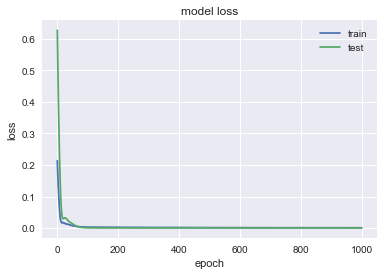

              CBRE
MSE       0.644627
MAE       0.656766
R2         0.93185
MAPE (%)   1.32193


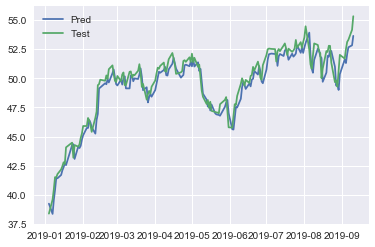

In [203]:
test = df["2019-01-04":].copy()
train = df[:"2019-01-04"].copy()
pred_gru_2 = pd.DataFrame(columns=df.columns,index = test.index)
for comp in companies:
    pred_gru_2[comp] = nn_forec_GRU(df,comp,first_layer = 32,second_layer=16).values

Predicting for  T
Train on 1008 samples, validate on 172 samples
Epoch 1/1000
0s - loss: 0.2915 - val_loss: 0.0559
Epoch 2/1000
0s - loss: 0.2144 - val_loss: 0.0325
Epoch 3/1000
0s - loss: 0.1458 - val_loss: 0.0149
Epoch 4/1000
0s - loss: 0.0872 - val_loss: 0.0054
Epoch 5/1000
0s - loss: 0.0434 - val_loss: 0.0067
Epoch 6/1000
0s - loss: 0.0175 - val_loss: 0.0178
Epoch 7/1000
0s - loss: 0.0116 - val_loss: 0.0308
Epoch 8/1000
0s - loss: 0.0142 - val_loss: 0.0354
Epoch 9/1000
0s - loss: 0.0155 - val_loss: 0.0300
Epoch 10/1000
0s - loss: 0.0119 - val_loss: 0.0211
Epoch 11/1000
0s - loss: 0.0093 - val_loss: 0.0140
Epoch 12/1000
0s - loss: 0.0092 - val_loss: 0.0100
Epoch 13/1000
0s - loss: 0.0096 - val_loss: 0.0082
Epoch 14/1000
0s - loss: 0.0100 - val_loss: 0.0077
Epoch 15/1000
0s - loss: 0.0095 - val_loss: 0.0081
Epoch 16/1000
0s - loss: 0.0083 - val_loss: 0.0088
Epoch 17/1000
0s - loss: 0.0068 - val_loss: 0.0093
Epoch 18/1000
0s - loss: 0.0062 - val_loss: 0.0093
Epoch 19/1000
0s - loss: 0

0s - loss: 0.0016 - val_loss: 5.4899e-04
Epoch 152/1000
0s - loss: 0.0016 - val_loss: 5.4730e-04
Epoch 153/1000
0s - loss: 0.0016 - val_loss: 5.4958e-04
Epoch 154/1000
0s - loss: 0.0016 - val_loss: 5.5856e-04
Epoch 155/1000
0s - loss: 0.0016 - val_loss: 5.6688e-04
Epoch 156/1000
0s - loss: 0.0016 - val_loss: 5.4680e-04
Epoch 157/1000
0s - loss: 0.0018 - val_loss: 5.4636e-04
Epoch 158/1000
0s - loss: 0.0017 - val_loss: 5.5562e-04
Epoch 159/1000
0s - loss: 0.0016 - val_loss: 5.5263e-04
Epoch 160/1000
0s - loss: 0.0016 - val_loss: 5.4740e-04
Epoch 161/1000
0s - loss: 0.0016 - val_loss: 5.4513e-04
Epoch 162/1000
0s - loss: 0.0016 - val_loss: 5.4793e-04
Epoch 163/1000
0s - loss: 0.0017 - val_loss: 5.6540e-04
Epoch 164/1000
0s - loss: 0.0017 - val_loss: 5.6046e-04
Epoch 165/1000
0s - loss: 0.0015 - val_loss: 5.4874e-04
Epoch 166/1000
0s - loss: 0.0016 - val_loss: 5.4509e-04
Epoch 167/1000
0s - loss: 0.0016 - val_loss: 5.4488e-04
Epoch 168/1000
0s - loss: 0.0016 - val_loss: 5.5043e-04
Epoch 1

0s - loss: 0.0014 - val_loss: 5.4744e-04
Epoch 301/1000
0s - loss: 0.0013 - val_loss: 5.6314e-04
Epoch 302/1000
0s - loss: 0.0013 - val_loss: 5.4318e-04
Epoch 303/1000
0s - loss: 0.0014 - val_loss: 5.4704e-04
Epoch 304/1000
0s - loss: 0.0014 - val_loss: 5.4553e-04
Epoch 305/1000
0s - loss: 0.0013 - val_loss: 5.4045e-04
Epoch 306/1000
0s - loss: 0.0015 - val_loss: 5.6234e-04
Epoch 307/1000
0s - loss: 0.0016 - val_loss: 5.5133e-04
Epoch 308/1000
0s - loss: 0.0014 - val_loss: 5.4433e-04
Epoch 309/1000
0s - loss: 0.0015 - val_loss: 5.4530e-04
Epoch 310/1000
0s - loss: 0.0014 - val_loss: 5.3942e-04
Epoch 311/1000
0s - loss: 0.0014 - val_loss: 5.4147e-04
Epoch 312/1000
0s - loss: 0.0013 - val_loss: 5.6406e-04
Epoch 313/1000
0s - loss: 0.0015 - val_loss: 5.3881e-04
Epoch 314/1000
0s - loss: 0.0013 - val_loss: 5.4878e-04
Epoch 315/1000
0s - loss: 0.0013 - val_loss: 5.5705e-04
Epoch 316/1000
0s - loss: 0.0013 - val_loss: 5.4013e-04
Epoch 317/1000
0s - loss: 0.0014 - val_loss: 5.4881e-04
Epoch 3

0s - loss: 0.0013 - val_loss: 5.4794e-04
Epoch 448/1000
0s - loss: 0.0013 - val_loss: 5.4798e-04
Epoch 449/1000
0s - loss: 0.0012 - val_loss: 5.6191e-04
Epoch 450/1000
0s - loss: 0.0013 - val_loss: 5.4121e-04
Epoch 451/1000
0s - loss: 0.0013 - val_loss: 5.6003e-04
Epoch 452/1000
0s - loss: 0.0013 - val_loss: 5.4392e-04
Epoch 453/1000
0s - loss: 0.0012 - val_loss: 5.5999e-04
Epoch 454/1000
0s - loss: 0.0013 - val_loss: 5.4278e-04
Epoch 455/1000
0s - loss: 0.0013 - val_loss: 5.4850e-04
Epoch 456/1000
0s - loss: 0.0013 - val_loss: 5.5849e-04
Epoch 457/1000
0s - loss: 0.0013 - val_loss: 5.4136e-04
Epoch 458/1000
0s - loss: 0.0012 - val_loss: 5.5283e-04
Epoch 459/1000
0s - loss: 0.0013 - val_loss: 5.7901e-04
Epoch 460/1000
0s - loss: 0.0013 - val_loss: 5.4028e-04
Epoch 461/1000
0s - loss: 0.0012 - val_loss: 5.5842e-04
Epoch 462/1000
0s - loss: 0.0013 - val_loss: 5.6395e-04
Epoch 463/1000
0s - loss: 0.0013 - val_loss: 5.5501e-04
Epoch 464/1000
0s - loss: 0.0013 - val_loss: 5.6051e-04
Epoch 4

0s - loss: 0.0012 - val_loss: 5.7889e-04
Epoch 595/1000
0s - loss: 0.0012 - val_loss: 5.3959e-04
Epoch 596/1000
0s - loss: 0.0012 - val_loss: 6.5305e-04
Epoch 597/1000
0s - loss: 0.0013 - val_loss: 5.4052e-04
Epoch 598/1000
0s - loss: 0.0013 - val_loss: 5.8700e-04
Epoch 599/1000
0s - loss: 0.0012 - val_loss: 5.3978e-04
Epoch 600/1000
0s - loss: 0.0011 - val_loss: 5.4072e-04
Epoch 601/1000
0s - loss: 0.0012 - val_loss: 5.6659e-04
Epoch 602/1000
0s - loss: 0.0012 - val_loss: 5.3965e-04
Epoch 603/1000
0s - loss: 0.0010 - val_loss: 5.7421e-04
Epoch 604/1000
0s - loss: 0.0013 - val_loss: 5.3905e-04
Epoch 605/1000
0s - loss: 0.0012 - val_loss: 5.4786e-04
Epoch 606/1000
0s - loss: 0.0012 - val_loss: 5.4697e-04
Epoch 607/1000
0s - loss: 0.0012 - val_loss: 5.7210e-04
Epoch 608/1000
0s - loss: 0.0013 - val_loss: 5.4383e-04
Epoch 609/1000
0s - loss: 0.0012 - val_loss: 5.8597e-04
Epoch 610/1000
0s - loss: 0.0012 - val_loss: 5.4250e-04
Epoch 611/1000
0s - loss: 0.0012 - val_loss: 5.4540e-04
Epoch 6

0s - loss: 0.0012 - val_loss: 5.9061e-04
Epoch 742/1000
0s - loss: 0.0011 - val_loss: 5.4373e-04
Epoch 743/1000
0s - loss: 0.0011 - val_loss: 5.6202e-04
Epoch 744/1000
0s - loss: 0.0011 - val_loss: 5.4069e-04
Epoch 745/1000
0s - loss: 0.0010 - val_loss: 5.4975e-04
Epoch 746/1000
0s - loss: 0.0011 - val_loss: 5.5915e-04
Epoch 747/1000
0s - loss: 0.0012 - val_loss: 5.3867e-04
Epoch 748/1000
0s - loss: 0.0010 - val_loss: 5.6274e-04
Epoch 749/1000
0s - loss: 0.0011 - val_loss: 5.4005e-04
Epoch 750/1000
0s - loss: 0.0011 - val_loss: 5.8277e-04
Epoch 751/1000
0s - loss: 0.0011 - val_loss: 5.4218e-04
Epoch 752/1000
0s - loss: 9.9746e-04 - val_loss: 5.4820e-04
Epoch 753/1000
0s - loss: 0.0011 - val_loss: 5.4683e-04
Epoch 754/1000
0s - loss: 0.0010 - val_loss: 5.4974e-04
Epoch 755/1000
0s - loss: 0.0011 - val_loss: 5.5381e-04
Epoch 756/1000
0s - loss: 0.0011 - val_loss: 5.3869e-04
Epoch 757/1000
0s - loss: 0.0011 - val_loss: 5.9880e-04
Epoch 758/1000
0s - loss: 0.0010 - val_loss: 5.4500e-04
Epo

0s - loss: 9.5787e-04 - val_loss: 5.3854e-04
Epoch 888/1000
0s - loss: 9.9623e-04 - val_loss: 5.7600e-04
Epoch 889/1000
0s - loss: 0.0011 - val_loss: 5.3997e-04
Epoch 890/1000
0s - loss: 0.0010 - val_loss: 5.8453e-04
Epoch 891/1000
0s - loss: 0.0011 - val_loss: 5.4093e-04
Epoch 892/1000
0s - loss: 0.0010 - val_loss: 5.4971e-04
Epoch 893/1000
0s - loss: 0.0011 - val_loss: 5.4250e-04
Epoch 894/1000
0s - loss: 9.7111e-04 - val_loss: 5.5439e-04
Epoch 895/1000
0s - loss: 0.0010 - val_loss: 5.4901e-04
Epoch 896/1000
0s - loss: 9.6298e-04 - val_loss: 5.5314e-04
Epoch 897/1000
0s - loss: 0.0010 - val_loss: 5.4183e-04
Epoch 898/1000
0s - loss: 0.0010 - val_loss: 5.5722e-04
Epoch 899/1000
0s - loss: 0.0010 - val_loss: 5.4181e-04
Epoch 900/1000
0s - loss: 0.0011 - val_loss: 6.3572e-04
Epoch 901/1000
0s - loss: 0.0011 - val_loss: 5.4005e-04
Epoch 902/1000
0s - loss: 0.0010 - val_loss: 5.8488e-04
Epoch 903/1000
0s - loss: 0.0011 - val_loss: 5.4553e-04
Epoch 904/1000
0s - loss: 0.0011 - val_loss: 5.

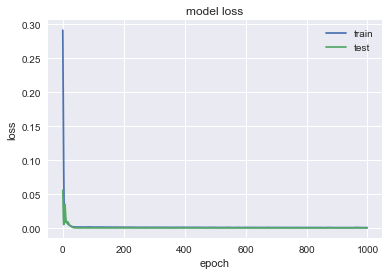

                 T
MSE       0.139723
MAE       0.268435
R2        0.951086
MAPE (%)  0.830765


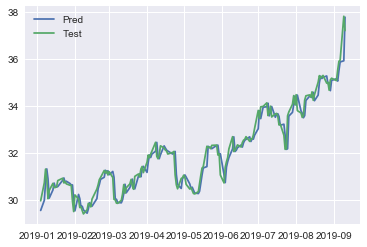

Predicting for  BBY
Train on 1008 samples, validate on 172 samples
Epoch 1/1000
0s - loss: 0.2169 - val_loss: 0.4225
Epoch 2/1000
0s - loss: 0.1656 - val_loss: 0.3241
Epoch 3/1000
0s - loss: 0.1209 - val_loss: 0.2330
Epoch 4/1000
0s - loss: 0.0808 - val_loss: 0.1517
Epoch 5/1000
0s - loss: 0.0485 - val_loss: 0.0844
Epoch 6/1000
0s - loss: 0.0265 - val_loss: 0.0364
Epoch 7/1000
0s - loss: 0.0168 - val_loss: 0.0103
Epoch 8/1000
0s - loss: 0.0181 - val_loss: 0.0021
Epoch 9/1000
0s - loss: 0.0235 - val_loss: 0.0017
Epoch 10/1000
0s - loss: 0.0257 - val_loss: 0.0016
Epoch 11/1000
0s - loss: 0.0231 - val_loss: 0.0014
Epoch 12/1000
0s - loss: 0.0182 - val_loss: 0.0028
Epoch 13/1000
0s - loss: 0.0143 - val_loss: 0.0053
Epoch 14/1000
0s - loss: 0.0118 - val_loss: 0.0074
Epoch 15/1000
0s - loss: 0.0104 - val_loss: 0.0077
Epoch 16/1000
0s - loss: 0.0094 - val_loss: 0.0063
Epoch 17/1000
0s - loss: 0.0077 - val_loss: 0.0042
Epoch 18/1000
0s - loss: 0.0064 - val_loss: 0.0025
Epoch 19/1000
0s - loss:

0s - loss: 0.0011 - val_loss: 6.6120e-04
Epoch 153/1000
0s - loss: 0.0011 - val_loss: 6.1986e-04
Epoch 154/1000
0s - loss: 0.0010 - val_loss: 6.3453e-04
Epoch 155/1000
0s - loss: 0.0010 - val_loss: 6.9692e-04
Epoch 156/1000
0s - loss: 0.0010 - val_loss: 6.4228e-04
Epoch 157/1000
0s - loss: 9.5669e-04 - val_loss: 6.1808e-04
Epoch 158/1000
0s - loss: 0.0011 - val_loss: 6.1887e-04
Epoch 159/1000
0s - loss: 0.0011 - val_loss: 6.6592e-04
Epoch 160/1000
0s - loss: 0.0011 - val_loss: 7.0212e-04
Epoch 161/1000
0s - loss: 0.0012 - val_loss: 6.3176e-04
Epoch 162/1000
0s - loss: 0.0010 - val_loss: 6.1619e-04
Epoch 163/1000
0s - loss: 0.0010 - val_loss: 6.2951e-04
Epoch 164/1000
0s - loss: 0.0011 - val_loss: 6.9487e-04
Epoch 165/1000
0s - loss: 9.5538e-04 - val_loss: 6.7606e-04
Epoch 166/1000
0s - loss: 0.0011 - val_loss: 6.4231e-04
Epoch 167/1000
0s - loss: 0.0010 - val_loss: 6.4274e-04
Epoch 168/1000
0s - loss: 9.5741e-04 - val_loss: 6.4428e-04
Epoch 169/1000
0s - loss: 0.0010 - val_loss: 6.4323

0s - loss: 8.8578e-04 - val_loss: 6.1423e-04
Epoch 296/1000
0s - loss: 8.6870e-04 - val_loss: 6.3644e-04
Epoch 297/1000
0s - loss: 7.7985e-04 - val_loss: 6.0681e-04
Epoch 298/1000
0s - loss: 8.3471e-04 - val_loss: 6.0524e-04
Epoch 299/1000
0s - loss: 9.0121e-04 - val_loss: 5.9589e-04
Epoch 300/1000
0s - loss: 9.6398e-04 - val_loss: 5.9692e-04
Epoch 301/1000
0s - loss: 8.2515e-04 - val_loss: 6.3360e-04
Epoch 302/1000
0s - loss: 8.6321e-04 - val_loss: 6.1120e-04
Epoch 303/1000
0s - loss: 0.0010 - val_loss: 5.9474e-04
Epoch 304/1000
0s - loss: 9.1404e-04 - val_loss: 5.9691e-04
Epoch 305/1000
0s - loss: 8.2830e-04 - val_loss: 5.9435e-04
Epoch 306/1000
0s - loss: 8.4416e-04 - val_loss: 6.0812e-04
Epoch 307/1000
0s - loss: 9.3722e-04 - val_loss: 5.9740e-04
Epoch 308/1000
0s - loss: 8.5419e-04 - val_loss: 6.0266e-04
Epoch 309/1000
0s - loss: 8.8557e-04 - val_loss: 5.9704e-04
Epoch 310/1000
0s - loss: 9.8641e-04 - val_loss: 5.9571e-04
Epoch 311/1000
0s - loss: 8.8158e-04 - val_loss: 5.9541e-04

0s - loss: 7.7411e-04 - val_loss: 5.8860e-04
Epoch 434/1000
0s - loss: 9.8166e-04 - val_loss: 6.4645e-04
Epoch 435/1000
0s - loss: 8.3596e-04 - val_loss: 6.0031e-04
Epoch 436/1000
0s - loss: 8.4833e-04 - val_loss: 5.9010e-04
Epoch 437/1000
0s - loss: 9.0230e-04 - val_loss: 6.4928e-04
Epoch 438/1000
0s - loss: 8.4008e-04 - val_loss: 6.8651e-04
Epoch 439/1000
0s - loss: 7.7971e-04 - val_loss: 5.8431e-04
Epoch 440/1000
0s - loss: 8.5632e-04 - val_loss: 5.8685e-04
Epoch 441/1000
0s - loss: 9.1584e-04 - val_loss: 7.5741e-04
Epoch 442/1000
0s - loss: 8.7301e-04 - val_loss: 6.0066e-04
Epoch 443/1000
0s - loss: 8.4317e-04 - val_loss: 6.0524e-04
Epoch 444/1000
0s - loss: 9.8365e-04 - val_loss: 6.8316e-04
Epoch 445/1000
0s - loss: 9.1849e-04 - val_loss: 5.9599e-04
Epoch 446/1000
0s - loss: 8.3340e-04 - val_loss: 6.4882e-04
Epoch 447/1000
0s - loss: 8.2018e-04 - val_loss: 6.9874e-04
Epoch 448/1000
0s - loss: 8.7426e-04 - val_loss: 6.4537e-04
Epoch 449/1000
0s - loss: 8.2982e-04 - val_loss: 6.4350

0s - loss: 7.3777e-04 - val_loss: 5.8690e-04
Epoch 572/1000
0s - loss: 7.8105e-04 - val_loss: 6.3127e-04
Epoch 573/1000
0s - loss: 7.6443e-04 - val_loss: 5.9108e-04
Epoch 574/1000
0s - loss: 8.1061e-04 - val_loss: 5.8726e-04
Epoch 575/1000
0s - loss: 8.9048e-04 - val_loss: 7.3987e-04
Epoch 576/1000
0s - loss: 7.8537e-04 - val_loss: 6.1146e-04
Epoch 577/1000
0s - loss: 8.6719e-04 - val_loss: 6.0835e-04
Epoch 578/1000
0s - loss: 9.5574e-04 - val_loss: 6.2560e-04
Epoch 579/1000
0s - loss: 8.4538e-04 - val_loss: 5.8957e-04
Epoch 580/1000
0s - loss: 8.6706e-04 - val_loss: 6.4365e-04
Epoch 581/1000
0s - loss: 7.8489e-04 - val_loss: 5.9347e-04
Epoch 582/1000
0s - loss: 7.7499e-04 - val_loss: 5.8769e-04
Epoch 583/1000
0s - loss: 8.0669e-04 - val_loss: 5.8990e-04
Epoch 584/1000
0s - loss: 7.9492e-04 - val_loss: 5.8943e-04
Epoch 585/1000
0s - loss: 7.5456e-04 - val_loss: 5.9834e-04
Epoch 586/1000
0s - loss: 7.8216e-04 - val_loss: 6.3739e-04
Epoch 587/1000
0s - loss: 8.4876e-04 - val_loss: 5.8474

0s - loss: 7.8910e-04 - val_loss: 6.2795e-04
Epoch 711/1000
0s - loss: 7.5953e-04 - val_loss: 6.5030e-04
Epoch 712/1000
0s - loss: 8.8315e-04 - val_loss: 6.5109e-04
Epoch 713/1000
0s - loss: 7.5932e-04 - val_loss: 5.9521e-04
Epoch 714/1000
0s - loss: 7.1488e-04 - val_loss: 6.2872e-04
Epoch 715/1000
0s - loss: 7.0747e-04 - val_loss: 5.9204e-04
Epoch 716/1000
0s - loss: 7.2022e-04 - val_loss: 5.8765e-04
Epoch 717/1000
0s - loss: 7.5089e-04 - val_loss: 6.3947e-04
Epoch 718/1000
0s - loss: 7.8605e-04 - val_loss: 6.0187e-04
Epoch 719/1000
0s - loss: 7.1402e-04 - val_loss: 5.8545e-04
Epoch 720/1000
0s - loss: 7.0698e-04 - val_loss: 5.8830e-04
Epoch 721/1000
0s - loss: 8.0913e-04 - val_loss: 5.9520e-04
Epoch 722/1000
0s - loss: 8.1044e-04 - val_loss: 5.9559e-04
Epoch 723/1000
0s - loss: 7.6237e-04 - val_loss: 6.5452e-04
Epoch 724/1000
0s - loss: 6.9697e-04 - val_loss: 5.8430e-04
Epoch 725/1000
0s - loss: 7.0924e-04 - val_loss: 6.3342e-04
Epoch 726/1000
0s - loss: 7.6028e-04 - val_loss: 5.9573

0s - loss: 6.8437e-04 - val_loss: 5.8731e-04
Epoch 849/1000
0s - loss: 6.3849e-04 - val_loss: 6.1308e-04
Epoch 850/1000
0s - loss: 7.1403e-04 - val_loss: 6.0577e-04
Epoch 851/1000
0s - loss: 7.4174e-04 - val_loss: 5.8640e-04
Epoch 852/1000
0s - loss: 7.1740e-04 - val_loss: 5.9926e-04
Epoch 853/1000
0s - loss: 7.9147e-04 - val_loss: 6.3037e-04
Epoch 854/1000
0s - loss: 6.1532e-04 - val_loss: 5.9085e-04
Epoch 855/1000
0s - loss: 7.3466e-04 - val_loss: 5.9302e-04
Epoch 856/1000
0s - loss: 7.4213e-04 - val_loss: 5.8992e-04
Epoch 857/1000
0s - loss: 7.1547e-04 - val_loss: 5.9139e-04
Epoch 858/1000
0s - loss: 6.6780e-04 - val_loss: 6.1128e-04
Epoch 859/1000
0s - loss: 7.9713e-04 - val_loss: 5.9029e-04
Epoch 860/1000
0s - loss: 7.2715e-04 - val_loss: 6.1107e-04
Epoch 861/1000
0s - loss: 6.7403e-04 - val_loss: 5.8796e-04
Epoch 862/1000
0s - loss: 7.2274e-04 - val_loss: 6.1928e-04
Epoch 863/1000
0s - loss: 6.9365e-04 - val_loss: 5.8628e-04
Epoch 864/1000
0s - loss: 6.4160e-04 - val_loss: 6.0772

0s - loss: 6.5934e-04 - val_loss: 6.3295e-04
Epoch 987/1000
0s - loss: 6.6095e-04 - val_loss: 5.9071e-04
Epoch 988/1000
0s - loss: 6.5694e-04 - val_loss: 6.2254e-04
Epoch 989/1000
0s - loss: 6.4917e-04 - val_loss: 6.2954e-04
Epoch 990/1000
0s - loss: 6.0567e-04 - val_loss: 5.8864e-04
Epoch 991/1000
0s - loss: 6.9891e-04 - val_loss: 6.0152e-04
Epoch 992/1000
0s - loss: 6.7824e-04 - val_loss: 6.5496e-04
Epoch 993/1000
0s - loss: 7.5193e-04 - val_loss: 5.8486e-04
Epoch 994/1000
0s - loss: 6.5715e-04 - val_loss: 6.0260e-04
Epoch 995/1000
0s - loss: 7.4550e-04 - val_loss: 6.0499e-04
Epoch 996/1000
0s - loss: 6.8260e-04 - val_loss: 5.9611e-04
Epoch 997/1000
0s - loss: 6.7573e-04 - val_loss: 6.1386e-04
Epoch 998/1000
0s - loss: 7.4955e-04 - val_loss: 5.9452e-04
Epoch 999/1000
0s - loss: 7.0286e-04 - val_loss: 6.2759e-04
Epoch 1000/1000
0s - loss: 7.5594e-04 - val_loss: 5.9348e-04


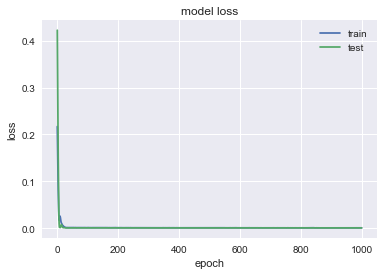

               BBY
MSE        1.97585
MAE       0.931703
R2        0.942472
MAPE (%)   1.39005


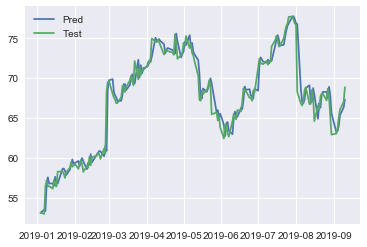

Predicting for  KO
Train on 1008 samples, validate on 172 samples
Epoch 1/1000
0s - loss: 0.1008 - val_loss: 0.3289
Epoch 2/1000
0s - loss: 0.0649 - val_loss: 0.2308
Epoch 3/1000
0s - loss: 0.0361 - val_loss: 0.1451
Epoch 4/1000
0s - loss: 0.0156 - val_loss: 0.0766
Epoch 5/1000
0s - loss: 0.0054 - val_loss: 0.0323
Epoch 6/1000
0s - loss: 0.0062 - val_loss: 0.0130
Epoch 7/1000
0s - loss: 0.0116 - val_loss: 0.0088
Epoch 8/1000
0s - loss: 0.0131 - val_loss: 0.0109
Epoch 9/1000
0s - loss: 0.0099 - val_loss: 0.0178
Epoch 10/1000
0s - loss: 0.0069 - val_loss: 0.0266
Epoch 11/1000
0s - loss: 0.0055 - val_loss: 0.0324
Epoch 12/1000
0s - loss: 0.0050 - val_loss: 0.0326
Epoch 13/1000
0s - loss: 0.0043 - val_loss: 0.0281
Epoch 14/1000
0s - loss: 0.0041 - val_loss: 0.0218
Epoch 15/1000
0s - loss: 0.0038 - val_loss: 0.0163
Epoch 16/1000
0s - loss: 0.0039 - val_loss: 0.0129
Epoch 17/1000
0s - loss: 0.0041 - val_loss: 0.0115
Epoch 18/1000
0s - loss: 0.0038 - val_loss: 0.0113
Epoch 19/1000
0s - loss: 

0s - loss: 8.0172e-04 - val_loss: 7.4662e-04
Epoch 144/1000
0s - loss: 7.2921e-04 - val_loss: 7.4970e-04
Epoch 145/1000
0s - loss: 8.5492e-04 - val_loss: 7.5237e-04
Epoch 146/1000
0s - loss: 8.0002e-04 - val_loss: 7.3779e-04
Epoch 147/1000
0s - loss: 8.4116e-04 - val_loss: 7.3712e-04
Epoch 148/1000
0s - loss: 8.0744e-04 - val_loss: 7.3861e-04
Epoch 149/1000
0s - loss: 7.6010e-04 - val_loss: 7.4142e-04
Epoch 150/1000
0s - loss: 8.4176e-04 - val_loss: 7.4355e-04
Epoch 151/1000
0s - loss: 7.8146e-04 - val_loss: 7.4238e-04
Epoch 152/1000
0s - loss: 7.8086e-04 - val_loss: 7.4438e-04
Epoch 153/1000
0s - loss: 8.1308e-04 - val_loss: 7.3987e-04
Epoch 154/1000
0s - loss: 7.9762e-04 - val_loss: 7.3741e-04
Epoch 155/1000
0s - loss: 8.0683e-04 - val_loss: 7.6118e-04
Epoch 156/1000
0s - loss: 7.1946e-04 - val_loss: 7.3759e-04
Epoch 157/1000
0s - loss: 7.9122e-04 - val_loss: 7.3484e-04
Epoch 158/1000
0s - loss: 8.1727e-04 - val_loss: 7.4439e-04
Epoch 159/1000
0s - loss: 7.6342e-04 - val_loss: 7.5354

0s - loss: 6.7148e-04 - val_loss: 7.9120e-04
Epoch 283/1000
0s - loss: 6.8341e-04 - val_loss: 7.4862e-04
Epoch 284/1000
0s - loss: 7.1375e-04 - val_loss: 7.5431e-04
Epoch 285/1000
0s - loss: 6.9260e-04 - val_loss: 7.4415e-04
Epoch 286/1000
0s - loss: 7.3219e-04 - val_loss: 7.2238e-04
Epoch 287/1000
0s - loss: 7.1617e-04 - val_loss: 7.4787e-04
Epoch 288/1000
0s - loss: 6.8428e-04 - val_loss: 7.2771e-04
Epoch 289/1000
0s - loss: 6.8157e-04 - val_loss: 7.2958e-04
Epoch 290/1000
0s - loss: 7.1006e-04 - val_loss: 7.7753e-04
Epoch 291/1000
0s - loss: 6.4777e-04 - val_loss: 7.6001e-04
Epoch 292/1000
0s - loss: 7.1230e-04 - val_loss: 7.5364e-04
Epoch 293/1000
0s - loss: 7.0014e-04 - val_loss: 7.3138e-04
Epoch 294/1000
0s - loss: 6.6594e-04 - val_loss: 7.6414e-04
Epoch 295/1000
0s - loss: 7.0922e-04 - val_loss: 7.9141e-04
Epoch 296/1000
0s - loss: 7.1495e-04 - val_loss: 7.3541e-04
Epoch 297/1000
0s - loss: 7.0140e-04 - val_loss: 8.0405e-04
Epoch 298/1000
0s - loss: 6.8236e-04 - val_loss: 7.5237

0s - loss: 6.7505e-04 - val_loss: 8.3007e-04
Epoch 421/1000
0s - loss: 6.7183e-04 - val_loss: 8.0276e-04
Epoch 422/1000
0s - loss: 7.0022e-04 - val_loss: 7.6684e-04
Epoch 423/1000
0s - loss: 6.4255e-04 - val_loss: 7.9563e-04
Epoch 424/1000
0s - loss: 6.7365e-04 - val_loss: 7.9731e-04
Epoch 425/1000
0s - loss: 6.3771e-04 - val_loss: 7.1850e-04
Epoch 426/1000
0s - loss: 6.5484e-04 - val_loss: 7.8159e-04
Epoch 427/1000
0s - loss: 6.1637e-04 - val_loss: 7.3176e-04
Epoch 428/1000
0s - loss: 6.4992e-04 - val_loss: 7.4027e-04
Epoch 429/1000
0s - loss: 6.8455e-04 - val_loss: 8.0674e-04
Epoch 430/1000
0s - loss: 6.5513e-04 - val_loss: 7.3005e-04
Epoch 431/1000
0s - loss: 6.4427e-04 - val_loss: 8.5645e-04
Epoch 432/1000
0s - loss: 6.9810e-04 - val_loss: 8.9016e-04
Epoch 433/1000
0s - loss: 6.8408e-04 - val_loss: 7.4827e-04
Epoch 434/1000
0s - loss: 6.7074e-04 - val_loss: 0.0011
Epoch 435/1000
0s - loss: 6.5723e-04 - val_loss: 7.5078e-04
Epoch 436/1000
0s - loss: 7.3608e-04 - val_loss: 8.2977e-04

0s - loss: 6.4917e-04 - val_loss: 9.4411e-04
Epoch 559/1000
0s - loss: 6.6122e-04 - val_loss: 7.4297e-04
Epoch 560/1000
0s - loss: 6.6848e-04 - val_loss: 9.1208e-04
Epoch 561/1000
0s - loss: 6.7466e-04 - val_loss: 8.2940e-04
Epoch 562/1000
0s - loss: 6.4908e-04 - val_loss: 7.8602e-04
Epoch 563/1000
0s - loss: 6.3954e-04 - val_loss: 8.8894e-04
Epoch 564/1000
0s - loss: 6.0199e-04 - val_loss: 7.4933e-04
Epoch 565/1000
0s - loss: 6.3680e-04 - val_loss: 8.1705e-04
Epoch 566/1000
0s - loss: 6.3012e-04 - val_loss: 7.9342e-04
Epoch 567/1000
0s - loss: 6.5754e-04 - val_loss: 7.6421e-04
Epoch 568/1000
0s - loss: 6.2581e-04 - val_loss: 9.5707e-04
Epoch 569/1000
0s - loss: 6.2862e-04 - val_loss: 8.7600e-04
Epoch 570/1000
0s - loss: 6.4595e-04 - val_loss: 7.9609e-04
Epoch 571/1000
0s - loss: 6.1612e-04 - val_loss: 8.6597e-04
Epoch 572/1000
0s - loss: 6.1968e-04 - val_loss: 7.4782e-04
Epoch 573/1000
0s - loss: 6.1158e-04 - val_loss: 7.6241e-04
Epoch 574/1000
0s - loss: 6.2669e-04 - val_loss: 7.4896

0s - loss: 6.4297e-04 - val_loss: 8.1935e-04
Epoch 696/1000
0s - loss: 6.3391e-04 - val_loss: 8.3023e-04
Epoch 697/1000
0s - loss: 5.9270e-04 - val_loss: 8.0811e-04
Epoch 698/1000
0s - loss: 6.3404e-04 - val_loss: 7.5556e-04
Epoch 699/1000
0s - loss: 6.0696e-04 - val_loss: 7.7288e-04
Epoch 700/1000
0s - loss: 6.0015e-04 - val_loss: 7.4610e-04
Epoch 701/1000
0s - loss: 5.9791e-04 - val_loss: 8.1475e-04
Epoch 702/1000
0s - loss: 6.1351e-04 - val_loss: 8.3921e-04
Epoch 703/1000
0s - loss: 6.1020e-04 - val_loss: 8.3824e-04
Epoch 704/1000
0s - loss: 5.9131e-04 - val_loss: 8.1120e-04
Epoch 705/1000
0s - loss: 6.0858e-04 - val_loss: 8.3663e-04
Epoch 706/1000
0s - loss: 5.9260e-04 - val_loss: 7.5684e-04
Epoch 707/1000
0s - loss: 6.3438e-04 - val_loss: 7.5642e-04
Epoch 708/1000
0s - loss: 6.0612e-04 - val_loss: 7.7602e-04
Epoch 709/1000
0s - loss: 5.8413e-04 - val_loss: 7.2997e-04
Epoch 710/1000
0s - loss: 6.2995e-04 - val_loss: 7.5029e-04
Epoch 711/1000
0s - loss: 6.0959e-04 - val_loss: 7.6552

0s - loss: 6.2115e-04 - val_loss: 8.1960e-04
Epoch 835/1000
0s - loss: 5.9915e-04 - val_loss: 7.8218e-04
Epoch 836/1000
0s - loss: 6.2151e-04 - val_loss: 7.9322e-04
Epoch 837/1000
0s - loss: 6.0263e-04 - val_loss: 7.6711e-04
Epoch 838/1000
0s - loss: 6.3113e-04 - val_loss: 7.5829e-04
Epoch 839/1000
0s - loss: 6.1909e-04 - val_loss: 7.3507e-04
Epoch 840/1000
0s - loss: 6.3147e-04 - val_loss: 7.7588e-04
Epoch 841/1000
0s - loss: 5.9514e-04 - val_loss: 7.7908e-04
Epoch 842/1000
0s - loss: 6.0615e-04 - val_loss: 8.0229e-04
Epoch 843/1000
0s - loss: 5.9337e-04 - val_loss: 8.5972e-04
Epoch 844/1000
0s - loss: 5.8482e-04 - val_loss: 8.0810e-04
Epoch 845/1000
0s - loss: 6.1062e-04 - val_loss: 8.7274e-04
Epoch 846/1000
0s - loss: 5.8499e-04 - val_loss: 7.8410e-04
Epoch 847/1000
0s - loss: 5.6118e-04 - val_loss: 7.4361e-04
Epoch 848/1000
0s - loss: 6.0555e-04 - val_loss: 7.5214e-04
Epoch 849/1000
0s - loss: 5.9706e-04 - val_loss: 7.5317e-04
Epoch 850/1000
0s - loss: 6.0380e-04 - val_loss: 8.5056

0s - loss: 5.7347e-04 - val_loss: 7.3314e-04
Epoch 972/1000
0s - loss: 6.6080e-04 - val_loss: 8.5788e-04
Epoch 973/1000
0s - loss: 6.2564e-04 - val_loss: 8.3775e-04
Epoch 974/1000
0s - loss: 6.0292e-04 - val_loss: 8.1148e-04
Epoch 975/1000
0s - loss: 5.7561e-04 - val_loss: 7.7620e-04
Epoch 976/1000
0s - loss: 5.9917e-04 - val_loss: 7.4330e-04
Epoch 977/1000
0s - loss: 5.9958e-04 - val_loss: 7.9733e-04
Epoch 978/1000
0s - loss: 5.7227e-04 - val_loss: 8.4087e-04
Epoch 979/1000
0s - loss: 5.5687e-04 - val_loss: 9.0441e-04
Epoch 980/1000
0s - loss: 5.8874e-04 - val_loss: 7.6172e-04
Epoch 981/1000
0s - loss: 5.9708e-04 - val_loss: 7.7431e-04
Epoch 982/1000
0s - loss: 5.6564e-04 - val_loss: 7.3526e-04
Epoch 983/1000
0s - loss: 5.6212e-04 - val_loss: 7.9294e-04
Epoch 984/1000
0s - loss: 5.5874e-04 - val_loss: 7.5967e-04
Epoch 985/1000
0s - loss: 6.0383e-04 - val_loss: 8.5366e-04
Epoch 986/1000
0s - loss: 5.6397e-04 - val_loss: 7.5242e-04
Epoch 987/1000
0s - loss: 5.5516e-04 - val_loss: 8.3877

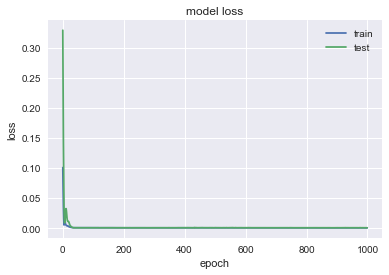

                KO
MSE       0.248345
MAE       0.359181
R2        0.970979
MAPE (%)  0.720182


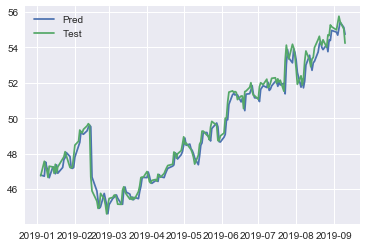

Predicting for  FTI
Train on 1008 samples, validate on 172 samples
Epoch 1/1000
0s - loss: 0.1964 - val_loss: 0.0172
Epoch 2/1000
0s - loss: 0.1354 - val_loss: 0.0062
Epoch 3/1000
0s - loss: 0.0839 - val_loss: 0.0014
Epoch 4/1000
0s - loss: 0.0430 - val_loss: 0.0052
Epoch 5/1000
0s - loss: 0.0177 - val_loss: 0.0179
Epoch 6/1000
0s - loss: 0.0101 - val_loss: 0.0325
Epoch 7/1000
0s - loss: 0.0126 - val_loss: 0.0373
Epoch 8/1000
0s - loss: 0.0133 - val_loss: 0.0306
Epoch 9/1000
0s - loss: 0.0088 - val_loss: 0.0205
Epoch 10/1000
0s - loss: 0.0063 - val_loss: 0.0132
Epoch 11/1000
0s - loss: 0.0067 - val_loss: 0.0093
Epoch 12/1000
0s - loss: 0.0077 - val_loss: 0.0080
Epoch 13/1000
0s - loss: 0.0079 - val_loss: 0.0083
Epoch 14/1000
0s - loss: 0.0069 - val_loss: 0.0095
Epoch 15/1000
0s - loss: 0.0057 - val_loss: 0.0106
Epoch 16/1000
0s - loss: 0.0049 - val_loss: 0.0108
Epoch 17/1000
0s - loss: 0.0047 - val_loss: 0.0100
Epoch 18/1000
0s - loss: 0.0042 - val_loss: 0.0084
Epoch 19/1000
0s - loss:

0s - loss: 0.0011 - val_loss: 3.3058e-04
Epoch 152/1000
0s - loss: 0.0011 - val_loss: 3.2752e-04
Epoch 153/1000
0s - loss: 0.0012 - val_loss: 3.2542e-04
Epoch 154/1000
0s - loss: 0.0012 - val_loss: 3.2913e-04
Epoch 155/1000
0s - loss: 0.0012 - val_loss: 3.3525e-04
Epoch 156/1000
0s - loss: 0.0012 - val_loss: 3.2709e-04
Epoch 157/1000
0s - loss: 0.0011 - val_loss: 3.2490e-04
Epoch 158/1000
0s - loss: 0.0012 - val_loss: 3.2932e-04
Epoch 159/1000
0s - loss: 0.0012 - val_loss: 3.2694e-04
Epoch 160/1000
0s - loss: 0.0012 - val_loss: 3.2920e-04
Epoch 161/1000
0s - loss: 0.0012 - val_loss: 3.3532e-04
Epoch 162/1000
0s - loss: 0.0012 - val_loss: 3.2957e-04
Epoch 163/1000
0s - loss: 0.0011 - val_loss: 3.2714e-04
Epoch 164/1000
0s - loss: 0.0011 - val_loss: 3.2499e-04
Epoch 165/1000
0s - loss: 0.0012 - val_loss: 3.2631e-04
Epoch 166/1000
0s - loss: 0.0011 - val_loss: 3.2651e-04
Epoch 167/1000
0s - loss: 0.0012 - val_loss: 3.2718e-04
Epoch 168/1000
0s - loss: 0.0011 - val_loss: 3.2936e-04
Epoch 1

0s - loss: 0.0011 - val_loss: 3.3467e-04
Epoch 301/1000
0s - loss: 0.0010 - val_loss: 3.3754e-04
Epoch 302/1000
0s - loss: 0.0011 - val_loss: 3.3994e-04
Epoch 303/1000
0s - loss: 0.0010 - val_loss: 3.3386e-04
Epoch 304/1000
0s - loss: 0.0010 - val_loss: 3.3351e-04
Epoch 305/1000
0s - loss: 0.0011 - val_loss: 3.3372e-04
Epoch 306/1000
0s - loss: 0.0011 - val_loss: 3.3719e-04
Epoch 307/1000
0s - loss: 0.0011 - val_loss: 3.3394e-04
Epoch 308/1000
0s - loss: 9.8173e-04 - val_loss: 3.3650e-04
Epoch 309/1000
0s - loss: 0.0011 - val_loss: 3.3760e-04
Epoch 310/1000
0s - loss: 0.0011 - val_loss: 3.3419e-04
Epoch 311/1000
0s - loss: 0.0010 - val_loss: 3.3340e-04
Epoch 312/1000
0s - loss: 9.7819e-04 - val_loss: 3.3281e-04
Epoch 313/1000
0s - loss: 9.6963e-04 - val_loss: 3.3472e-04
Epoch 314/1000
0s - loss: 0.0011 - val_loss: 3.3407e-04
Epoch 315/1000
0s - loss: 0.0011 - val_loss: 3.4087e-04
Epoch 316/1000
0s - loss: 0.0011 - val_loss: 3.3605e-04
Epoch 317/1000
0s - loss: 9.9109e-04 - val_loss: 3.

0s - loss: 9.8756e-04 - val_loss: 3.5144e-04
Epoch 446/1000
0s - loss: 9.7897e-04 - val_loss: 3.3982e-04
Epoch 447/1000
0s - loss: 9.1615e-04 - val_loss: 3.4679e-04
Epoch 448/1000
0s - loss: 9.6079e-04 - val_loss: 3.4501e-04
Epoch 449/1000
0s - loss: 0.0010 - val_loss: 3.4194e-04
Epoch 450/1000
0s - loss: 0.0010 - val_loss: 3.7404e-04
Epoch 451/1000
0s - loss: 0.0010 - val_loss: 3.3952e-04
Epoch 452/1000
0s - loss: 9.6782e-04 - val_loss: 3.4074e-04
Epoch 453/1000
0s - loss: 0.0010 - val_loss: 3.6043e-04
Epoch 454/1000
0s - loss: 9.9253e-04 - val_loss: 3.4220e-04
Epoch 455/1000
0s - loss: 9.8931e-04 - val_loss: 3.6412e-04
Epoch 456/1000
0s - loss: 9.8665e-04 - val_loss: 3.5597e-04
Epoch 457/1000
0s - loss: 0.0010 - val_loss: 3.5862e-04
Epoch 458/1000
0s - loss: 8.9507e-04 - val_loss: 3.4094e-04
Epoch 459/1000
0s - loss: 9.7001e-04 - val_loss: 3.3680e-04
Epoch 460/1000
0s - loss: 0.0010 - val_loss: 3.4390e-04
Epoch 461/1000
0s - loss: 0.0010 - val_loss: 3.3568e-04
Epoch 462/1000
0s - los

0s - loss: 9.3672e-04 - val_loss: 3.4289e-04
Epoch 586/1000
0s - loss: 9.4465e-04 - val_loss: 3.3703e-04
Epoch 587/1000
0s - loss: 9.1773e-04 - val_loss: 3.5079e-04
Epoch 588/1000
0s - loss: 9.9338e-04 - val_loss: 3.3870e-04
Epoch 589/1000
0s - loss: 9.0992e-04 - val_loss: 3.5847e-04
Epoch 590/1000
0s - loss: 8.4977e-04 - val_loss: 3.3922e-04
Epoch 591/1000
0s - loss: 8.4682e-04 - val_loss: 3.3603e-04
Epoch 592/1000
0s - loss: 9.8738e-04 - val_loss: 3.3614e-04
Epoch 593/1000
0s - loss: 9.1117e-04 - val_loss: 3.3490e-04
Epoch 594/1000
0s - loss: 9.6102e-04 - val_loss: 3.3547e-04
Epoch 595/1000
0s - loss: 9.2801e-04 - val_loss: 3.3846e-04
Epoch 596/1000
0s - loss: 9.0240e-04 - val_loss: 3.4818e-04
Epoch 597/1000
0s - loss: 8.5973e-04 - val_loss: 3.4187e-04
Epoch 598/1000
0s - loss: 9.8837e-04 - val_loss: 3.3882e-04
Epoch 599/1000
0s - loss: 9.5697e-04 - val_loss: 3.4523e-04
Epoch 600/1000
0s - loss: 9.7154e-04 - val_loss: 3.4093e-04
Epoch 601/1000
0s - loss: 9.7083e-04 - val_loss: 3.4022

0s - loss: 9.3530e-04 - val_loss: 3.3874e-04
Epoch 724/1000
0s - loss: 8.3168e-04 - val_loss: 3.4187e-04
Epoch 725/1000
0s - loss: 9.5826e-04 - val_loss: 3.4107e-04
Epoch 726/1000
0s - loss: 8.8652e-04 - val_loss: 3.6742e-04
Epoch 727/1000
0s - loss: 8.7421e-04 - val_loss: 3.4327e-04
Epoch 728/1000
0s - loss: 8.8844e-04 - val_loss: 3.6567e-04
Epoch 729/1000
0s - loss: 8.9587e-04 - val_loss: 3.3767e-04
Epoch 730/1000
0s - loss: 9.2461e-04 - val_loss: 3.4126e-04
Epoch 731/1000
0s - loss: 8.4812e-04 - val_loss: 3.3912e-04
Epoch 732/1000
0s - loss: 8.8207e-04 - val_loss: 3.5870e-04
Epoch 733/1000
0s - loss: 9.1385e-04 - val_loss: 3.4854e-04
Epoch 734/1000
0s - loss: 9.1453e-04 - val_loss: 3.4281e-04
Epoch 735/1000
0s - loss: 8.3103e-04 - val_loss: 3.3749e-04
Epoch 736/1000
0s - loss: 8.6502e-04 - val_loss: 3.3437e-04
Epoch 737/1000
0s - loss: 9.6720e-04 - val_loss: 3.3666e-04
Epoch 738/1000
0s - loss: 8.4155e-04 - val_loss: 3.5243e-04
Epoch 739/1000
0s - loss: 8.8827e-04 - val_loss: 3.4765

0s - loss: 8.3635e-04 - val_loss: 3.3608e-04
Epoch 862/1000
0s - loss: 8.4462e-04 - val_loss: 3.3795e-04
Epoch 863/1000
0s - loss: 8.2202e-04 - val_loss: 3.4019e-04
Epoch 864/1000
0s - loss: 8.3135e-04 - val_loss: 3.3833e-04
Epoch 865/1000
0s - loss: 8.2061e-04 - val_loss: 3.5119e-04
Epoch 866/1000
0s - loss: 8.1991e-04 - val_loss: 3.4412e-04
Epoch 867/1000
0s - loss: 8.6001e-04 - val_loss: 3.8751e-04
Epoch 868/1000
0s - loss: 8.4846e-04 - val_loss: 3.4423e-04
Epoch 869/1000
0s - loss: 8.4472e-04 - val_loss: 3.4798e-04
Epoch 870/1000
0s - loss: 8.9551e-04 - val_loss: 3.4565e-04
Epoch 871/1000
0s - loss: 8.3029e-04 - val_loss: 3.5161e-04
Epoch 872/1000
0s - loss: 8.6512e-04 - val_loss: 3.4203e-04
Epoch 873/1000
0s - loss: 7.8848e-04 - val_loss: 3.6856e-04
Epoch 874/1000
0s - loss: 8.6340e-04 - val_loss: 3.3717e-04
Epoch 875/1000
0s - loss: 8.7065e-04 - val_loss: 3.3383e-04
Epoch 876/1000
0s - loss: 8.6501e-04 - val_loss: 3.3672e-04
Epoch 877/1000
0s - loss: 7.9931e-04 - val_loss: 3.4002

0s - loss: 8.1199e-04 - val_loss: 3.4510e-04


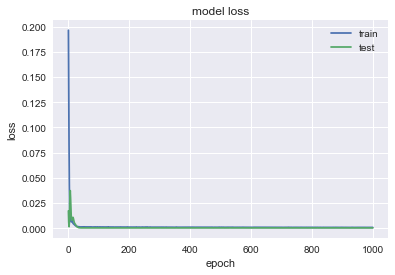

               FTI
MSE       0.279326
MAE       0.428901
R2        0.873638
MAPE (%)   1.80097


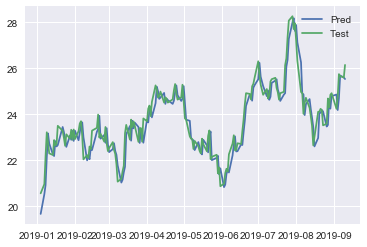

Predicting for  BLK
Train on 1008 samples, validate on 172 samples
Epoch 1/1000
0s - loss: 0.1695 - val_loss: 0.1814
Epoch 2/1000
0s - loss: 0.1240 - val_loss: 0.1273
Epoch 3/1000
0s - loss: 0.0855 - val_loss: 0.0795
Epoch 4/1000
0s - loss: 0.0523 - val_loss: 0.0410
Epoch 5/1000
0s - loss: 0.0284 - val_loss: 0.0149
Epoch 6/1000
0s - loss: 0.0162 - val_loss: 0.0030
Epoch 7/1000
0s - loss: 0.0149 - val_loss: 0.0019
Epoch 8/1000
0s - loss: 0.0185 - val_loss: 0.0034
Epoch 9/1000
0s - loss: 0.0198 - val_loss: 0.0028
Epoch 10/1000
0s - loss: 0.0180 - val_loss: 0.0015
Epoch 11/1000
0s - loss: 0.0147 - val_loss: 0.0013
Epoch 12/1000
0s - loss: 0.0123 - val_loss: 0.0022
Epoch 13/1000
0s - loss: 0.0112 - val_loss: 0.0031
Epoch 14/1000
0s - loss: 0.0104 - val_loss: 0.0031
Epoch 15/1000
0s - loss: 0.0089 - val_loss: 0.0023
Epoch 16/1000
0s - loss: 0.0076 - val_loss: 0.0015
Epoch 17/1000
0s - loss: 0.0068 - val_loss: 9.4791e-04
Epoch 18/1000
0s - loss: 0.0060 - val_loss: 7.0623e-04
Epoch 19/1000
0s

0s - loss: 9.8254e-04 - val_loss: 3.5138e-04
Epoch 149/1000
0s - loss: 9.6134e-04 - val_loss: 3.4762e-04
Epoch 150/1000
0s - loss: 8.5776e-04 - val_loss: 3.4322e-04
Epoch 151/1000
0s - loss: 8.9767e-04 - val_loss: 3.5998e-04
Epoch 152/1000
0s - loss: 9.2211e-04 - val_loss: 3.6516e-04
Epoch 153/1000
0s - loss: 9.1095e-04 - val_loss: 3.4120e-04
Epoch 154/1000
0s - loss: 9.4309e-04 - val_loss: 3.3546e-04
Epoch 155/1000
0s - loss: 0.0010 - val_loss: 3.5328e-04
Epoch 156/1000
0s - loss: 9.4513e-04 - val_loss: 3.6805e-04
Epoch 157/1000
0s - loss: 9.0822e-04 - val_loss: 3.5014e-04
Epoch 158/1000
0s - loss: 9.2824e-04 - val_loss: 3.3863e-04
Epoch 159/1000
0s - loss: 9.2128e-04 - val_loss: 3.3910e-04
Epoch 160/1000
0s - loss: 9.2548e-04 - val_loss: 3.3946e-04
Epoch 161/1000
0s - loss: 9.0199e-04 - val_loss: 3.5224e-04
Epoch 162/1000
0s - loss: 0.0011 - val_loss: 3.5399e-04
Epoch 163/1000
0s - loss: 9.1330e-04 - val_loss: 3.4014e-04
Epoch 164/1000
0s - loss: 0.0010 - val_loss: 3.3304e-04
Epoch 1

0s - loss: 8.1723e-04 - val_loss: 3.2007e-04
Epoch 287/1000
0s - loss: 8.1168e-04 - val_loss: 3.5618e-04
Epoch 288/1000
0s - loss: 8.1158e-04 - val_loss: 3.3665e-04
Epoch 289/1000
0s - loss: 7.7909e-04 - val_loss: 3.2201e-04
Epoch 290/1000
0s - loss: 8.2875e-04 - val_loss: 3.2764e-04
Epoch 291/1000
0s - loss: 7.9948e-04 - val_loss: 3.5501e-04
Epoch 292/1000
0s - loss: 7.9661e-04 - val_loss: 3.4515e-04
Epoch 293/1000
0s - loss: 8.2424e-04 - val_loss: 3.1913e-04
Epoch 294/1000
0s - loss: 7.3098e-04 - val_loss: 3.2346e-04
Epoch 295/1000
0s - loss: 8.1741e-04 - val_loss: 3.5328e-04
Epoch 296/1000
0s - loss: 9.1666e-04 - val_loss: 3.2226e-04
Epoch 297/1000
0s - loss: 8.0981e-04 - val_loss: 3.2233e-04
Epoch 298/1000
0s - loss: 8.0819e-04 - val_loss: 3.8679e-04
Epoch 299/1000
0s - loss: 8.5629e-04 - val_loss: 3.3591e-04
Epoch 300/1000
0s - loss: 7.5426e-04 - val_loss: 3.2307e-04
Epoch 301/1000
0s - loss: 7.9158e-04 - val_loss: 3.4016e-04
Epoch 302/1000
0s - loss: 7.7257e-04 - val_loss: 3.2405

0s - loss: 8.4288e-04 - val_loss: 3.2193e-04
Epoch 425/1000
0s - loss: 7.1563e-04 - val_loss: 3.2009e-04
Epoch 426/1000
0s - loss: 8.4398e-04 - val_loss: 3.7215e-04
Epoch 427/1000
0s - loss: 7.1605e-04 - val_loss: 3.2283e-04
Epoch 428/1000
0s - loss: 7.6331e-04 - val_loss: 3.2278e-04
Epoch 429/1000
0s - loss: 8.0010e-04 - val_loss: 3.2658e-04
Epoch 430/1000
0s - loss: 7.6315e-04 - val_loss: 3.2046e-04
Epoch 431/1000
0s - loss: 7.7427e-04 - val_loss: 3.4147e-04
Epoch 432/1000
0s - loss: 7.8184e-04 - val_loss: 3.2429e-04
Epoch 433/1000
0s - loss: 7.1112e-04 - val_loss: 3.2333e-04
Epoch 434/1000
0s - loss: 7.5241e-04 - val_loss: 3.3474e-04
Epoch 435/1000
0s - loss: 7.5512e-04 - val_loss: 3.2509e-04
Epoch 436/1000
0s - loss: 7.3570e-04 - val_loss: 3.2004e-04
Epoch 437/1000
0s - loss: 7.1550e-04 - val_loss: 3.3825e-04
Epoch 438/1000
0s - loss: 6.8988e-04 - val_loss: 3.3505e-04
Epoch 439/1000
0s - loss: 7.0528e-04 - val_loss: 3.1897e-04
Epoch 440/1000
0s - loss: 7.4384e-04 - val_loss: 3.5995

0s - loss: 6.8944e-04 - val_loss: 3.2377e-04
Epoch 563/1000
0s - loss: 6.7770e-04 - val_loss: 3.3497e-04
Epoch 564/1000
0s - loss: 6.2847e-04 - val_loss: 3.1843e-04
Epoch 565/1000
0s - loss: 6.9239e-04 - val_loss: 3.3428e-04
Epoch 566/1000
0s - loss: 7.4126e-04 - val_loss: 3.2174e-04
Epoch 567/1000
0s - loss: 6.8635e-04 - val_loss: 3.2769e-04
Epoch 568/1000
0s - loss: 7.5145e-04 - val_loss: 3.4423e-04
Epoch 569/1000
0s - loss: 7.2933e-04 - val_loss: 3.3745e-04
Epoch 570/1000
0s - loss: 6.9461e-04 - val_loss: 3.3930e-04
Epoch 571/1000
0s - loss: 6.9454e-04 - val_loss: 3.3097e-04
Epoch 572/1000
0s - loss: 7.0021e-04 - val_loss: 3.2091e-04
Epoch 573/1000
0s - loss: 7.4913e-04 - val_loss: 3.4470e-04
Epoch 574/1000
0s - loss: 7.6465e-04 - val_loss: 3.1830e-04
Epoch 575/1000
0s - loss: 7.7872e-04 - val_loss: 3.3400e-04
Epoch 576/1000
0s - loss: 7.7139e-04 - val_loss: 3.1897e-04
Epoch 577/1000
0s - loss: 7.5643e-04 - val_loss: 3.2106e-04
Epoch 578/1000
0s - loss: 7.5434e-04 - val_loss: 3.5303

0s - loss: 6.8115e-04 - val_loss: 3.3303e-04
Epoch 701/1000
0s - loss: 6.9238e-04 - val_loss: 3.1989e-04
Epoch 702/1000
0s - loss: 7.5197e-04 - val_loss: 3.2500e-04
Epoch 703/1000
0s - loss: 6.1346e-04 - val_loss: 3.2324e-04
Epoch 704/1000
0s - loss: 6.9549e-04 - val_loss: 3.2942e-04
Epoch 705/1000
0s - loss: 6.4612e-04 - val_loss: 3.1964e-04
Epoch 706/1000
0s - loss: 6.7600e-04 - val_loss: 3.2147e-04
Epoch 707/1000
0s - loss: 7.2030e-04 - val_loss: 3.6179e-04
Epoch 708/1000
0s - loss: 6.6183e-04 - val_loss: 3.2720e-04
Epoch 709/1000
0s - loss: 7.3060e-04 - val_loss: 3.3001e-04
Epoch 710/1000
0s - loss: 7.7403e-04 - val_loss: 3.2165e-04
Epoch 711/1000
0s - loss: 6.8550e-04 - val_loss: 3.2150e-04
Epoch 712/1000
0s - loss: 6.7413e-04 - val_loss: 3.2956e-04
Epoch 713/1000
0s - loss: 6.3570e-04 - val_loss: 3.1947e-04
Epoch 714/1000
0s - loss: 7.3739e-04 - val_loss: 3.2575e-04
Epoch 715/1000
0s - loss: 6.2629e-04 - val_loss: 3.3426e-04
Epoch 716/1000
0s - loss: 6.4425e-04 - val_loss: 3.2016

0s - loss: 6.8637e-04 - val_loss: 3.2417e-04
Epoch 839/1000
0s - loss: 6.8055e-04 - val_loss: 3.3675e-04
Epoch 840/1000
0s - loss: 7.4879e-04 - val_loss: 3.2864e-04
Epoch 841/1000
0s - loss: 6.3870e-04 - val_loss: 3.1724e-04
Epoch 842/1000
0s - loss: 6.8191e-04 - val_loss: 3.4253e-04
Epoch 843/1000
0s - loss: 6.4315e-04 - val_loss: 3.2337e-04
Epoch 844/1000
0s - loss: 6.3673e-04 - val_loss: 3.2287e-04
Epoch 845/1000
0s - loss: 6.3106e-04 - val_loss: 3.2290e-04
Epoch 846/1000
0s - loss: 6.8296e-04 - val_loss: 3.2120e-04
Epoch 847/1000
0s - loss: 6.2952e-04 - val_loss: 3.2383e-04
Epoch 848/1000
0s - loss: 6.1635e-04 - val_loss: 3.3461e-04
Epoch 849/1000
0s - loss: 5.4781e-04 - val_loss: 3.1933e-04
Epoch 850/1000
0s - loss: 6.3449e-04 - val_loss: 3.2893e-04
Epoch 851/1000
0s - loss: 6.3697e-04 - val_loss: 3.1849e-04
Epoch 852/1000
0s - loss: 6.7183e-04 - val_loss: 3.2660e-04
Epoch 853/1000
0s - loss: 6.3369e-04 - val_loss: 3.2545e-04
Epoch 854/1000
0s - loss: 6.2874e-04 - val_loss: 3.2267

0s - loss: 6.3851e-04 - val_loss: 3.2676e-04
Epoch 977/1000
0s - loss: 5.9988e-04 - val_loss: 3.2188e-04
Epoch 978/1000
0s - loss: 6.0059e-04 - val_loss: 3.5370e-04
Epoch 979/1000
0s - loss: 6.4052e-04 - val_loss: 3.2031e-04
Epoch 980/1000
0s - loss: 6.3549e-04 - val_loss: 3.3492e-04
Epoch 981/1000
0s - loss: 6.8971e-04 - val_loss: 3.1837e-04
Epoch 982/1000
0s - loss: 6.3330e-04 - val_loss: 3.2822e-04
Epoch 983/1000
0s - loss: 7.0707e-04 - val_loss: 3.2151e-04
Epoch 984/1000
0s - loss: 6.5079e-04 - val_loss: 3.2441e-04
Epoch 985/1000
0s - loss: 6.6373e-04 - val_loss: 3.2914e-04
Epoch 986/1000
0s - loss: 5.9311e-04 - val_loss: 3.1717e-04
Epoch 987/1000
0s - loss: 6.5547e-04 - val_loss: 3.3894e-04
Epoch 988/1000
0s - loss: 6.2405e-04 - val_loss: 3.2259e-04
Epoch 989/1000
0s - loss: 6.3593e-04 - val_loss: 3.3596e-04
Epoch 990/1000
0s - loss: 6.2883e-04 - val_loss: 3.1953e-04
Epoch 991/1000
0s - loss: 6.2791e-04 - val_loss: 3.2874e-04
Epoch 992/1000
0s - loss: 6.2308e-04 - val_loss: 3.1879

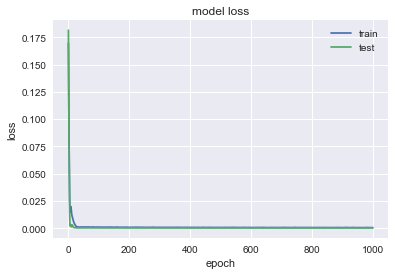

               BLK
MSE        30.0223
MAE        4.27643
R2        0.949196
MAPE (%)   0.97548


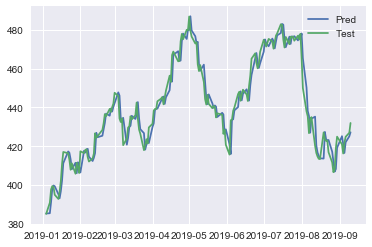

Predicting for  DVA
Train on 1008 samples, validate on 172 samples
Epoch 1/1000
0s - loss: 0.4183 - val_loss: 0.0543
Epoch 2/1000
0s - loss: 0.3046 - val_loss: 0.0300
Epoch 3/1000
0s - loss: 0.2058 - val_loss: 0.0123
Epoch 4/1000
0s - loss: 0.1208 - val_loss: 0.0035
Epoch 5/1000
0s - loss: 0.0558 - val_loss: 0.0071
Epoch 6/1000
0s - loss: 0.0172 - val_loss: 0.0237
Epoch 7/1000
0s - loss: 0.0098 - val_loss: 0.0439
Epoch 8/1000
0s - loss: 0.0166 - val_loss: 0.0512
Epoch 9/1000
0s - loss: 0.0183 - val_loss: 0.0431
Epoch 10/1000
0s - loss: 0.0113 - val_loss: 0.0300
Epoch 11/1000
0s - loss: 0.0059 - val_loss: 0.0202
Epoch 12/1000
0s - loss: 0.0062 - val_loss: 0.0150
Epoch 13/1000
0s - loss: 0.0073 - val_loss: 0.0132
Epoch 14/1000
0s - loss: 0.0082 - val_loss: 0.0137
Epoch 15/1000
0s - loss: 0.0070 - val_loss: 0.0155
Epoch 16/1000
0s - loss: 0.0064 - val_loss: 0.0177
Epoch 17/1000
0s - loss: 0.0053 - val_loss: 0.0191
Epoch 18/1000
0s - loss: 0.0053 - val_loss: 0.0192
Epoch 19/1000
0s - loss:

0s - loss: 0.0019 - val_loss: 7.6765e-04
Epoch 154/1000
0s - loss: 0.0017 - val_loss: 7.5348e-04
Epoch 155/1000
0s - loss: 0.0017 - val_loss: 7.3766e-04
Epoch 156/1000
0s - loss: 0.0017 - val_loss: 7.4200e-04
Epoch 157/1000
0s - loss: 0.0016 - val_loss: 7.6233e-04
Epoch 158/1000
0s - loss: 0.0017 - val_loss: 7.7465e-04
Epoch 159/1000
0s - loss: 0.0018 - val_loss: 7.5447e-04
Epoch 160/1000
0s - loss: 0.0017 - val_loss: 7.5644e-04
Epoch 161/1000
0s - loss: 0.0017 - val_loss: 7.6055e-04
Epoch 162/1000
0s - loss: 0.0018 - val_loss: 7.3920e-04
Epoch 163/1000
0s - loss: 0.0017 - val_loss: 7.5379e-04
Epoch 164/1000
0s - loss: 0.0017 - val_loss: 7.6770e-04
Epoch 165/1000
0s - loss: 0.0018 - val_loss: 7.5605e-04
Epoch 166/1000
0s - loss: 0.0018 - val_loss: 7.4648e-04
Epoch 167/1000
0s - loss: 0.0016 - val_loss: 7.3958e-04
Epoch 168/1000
0s - loss: 0.0016 - val_loss: 7.3200e-04
Epoch 169/1000
0s - loss: 0.0018 - val_loss: 7.2858e-04
Epoch 170/1000
0s - loss: 0.0018 - val_loss: 7.2658e-04
Epoch 1

0s - loss: 0.0015 - val_loss: 7.4693e-04
Epoch 301/1000
0s - loss: 0.0015 - val_loss: 7.1199e-04
Epoch 302/1000
0s - loss: 0.0016 - val_loss: 6.9995e-04
Epoch 303/1000
0s - loss: 0.0016 - val_loss: 7.1992e-04
Epoch 304/1000
0s - loss: 0.0014 - val_loss: 7.1367e-04
Epoch 305/1000
0s - loss: 0.0014 - val_loss: 7.0280e-04
Epoch 306/1000
0s - loss: 0.0015 - val_loss: 7.0674e-04
Epoch 307/1000
0s - loss: 0.0016 - val_loss: 6.9668e-04
Epoch 308/1000
0s - loss: 0.0016 - val_loss: 7.0651e-04
Epoch 309/1000
0s - loss: 0.0015 - val_loss: 7.1910e-04
Epoch 310/1000
0s - loss: 0.0015 - val_loss: 7.1125e-04
Epoch 311/1000
0s - loss: 0.0016 - val_loss: 7.0461e-04
Epoch 312/1000
0s - loss: 0.0015 - val_loss: 6.9946e-04
Epoch 313/1000
0s - loss: 0.0014 - val_loss: 7.0717e-04
Epoch 314/1000
0s - loss: 0.0016 - val_loss: 7.1719e-04
Epoch 315/1000
0s - loss: 0.0015 - val_loss: 6.9777e-04
Epoch 316/1000
0s - loss: 0.0015 - val_loss: 6.9613e-04
Epoch 317/1000
0s - loss: 0.0015 - val_loss: 7.0276e-04
Epoch 3

0s - loss: 0.0014 - val_loss: 6.9926e-04
Epoch 448/1000
0s - loss: 0.0014 - val_loss: 7.1708e-04
Epoch 449/1000
0s - loss: 0.0014 - val_loss: 6.9852e-04
Epoch 450/1000
0s - loss: 0.0013 - val_loss: 7.0549e-04
Epoch 451/1000
0s - loss: 0.0013 - val_loss: 6.9907e-04
Epoch 452/1000
0s - loss: 0.0013 - val_loss: 7.0210e-04
Epoch 453/1000
0s - loss: 0.0014 - val_loss: 7.1032e-04
Epoch 454/1000
0s - loss: 0.0015 - val_loss: 7.0092e-04
Epoch 455/1000
0s - loss: 0.0013 - val_loss: 7.0270e-04
Epoch 456/1000
0s - loss: 0.0014 - val_loss: 7.0648e-04
Epoch 457/1000
0s - loss: 0.0013 - val_loss: 7.0524e-04
Epoch 458/1000
0s - loss: 0.0013 - val_loss: 7.1051e-04
Epoch 459/1000
0s - loss: 0.0014 - val_loss: 7.0590e-04
Epoch 460/1000
0s - loss: 0.0014 - val_loss: 7.1522e-04
Epoch 461/1000
0s - loss: 0.0014 - val_loss: 7.0476e-04
Epoch 462/1000
0s - loss: 0.0014 - val_loss: 7.0798e-04
Epoch 463/1000
0s - loss: 0.0014 - val_loss: 7.0054e-04
Epoch 464/1000
0s - loss: 0.0014 - val_loss: 7.0395e-04
Epoch 4

0s - loss: 0.0013 - val_loss: 7.0616e-04
Epoch 595/1000
0s - loss: 0.0013 - val_loss: 7.0431e-04
Epoch 596/1000
0s - loss: 0.0012 - val_loss: 7.0658e-04
Epoch 597/1000
0s - loss: 0.0014 - val_loss: 7.0702e-04
Epoch 598/1000
0s - loss: 0.0012 - val_loss: 7.1374e-04
Epoch 599/1000
0s - loss: 0.0012 - val_loss: 7.1207e-04
Epoch 600/1000
0s - loss: 0.0013 - val_loss: 7.2172e-04
Epoch 601/1000
0s - loss: 0.0013 - val_loss: 7.0848e-04
Epoch 602/1000
0s - loss: 0.0012 - val_loss: 7.1818e-04
Epoch 603/1000
0s - loss: 0.0014 - val_loss: 7.1585e-04
Epoch 604/1000
0s - loss: 0.0012 - val_loss: 7.1004e-04
Epoch 605/1000
0s - loss: 0.0013 - val_loss: 7.0993e-04
Epoch 606/1000
0s - loss: 0.0013 - val_loss: 7.1028e-04
Epoch 607/1000
0s - loss: 0.0012 - val_loss: 7.0719e-04
Epoch 608/1000
0s - loss: 0.0013 - val_loss: 7.0698e-04
Epoch 609/1000
0s - loss: 0.0013 - val_loss: 7.2959e-04
Epoch 610/1000
0s - loss: 0.0013 - val_loss: 7.0828e-04
Epoch 611/1000
0s - loss: 0.0013 - val_loss: 7.1645e-04
Epoch 6

0s - loss: 0.0012 - val_loss: 7.1906e-04
Epoch 742/1000
0s - loss: 0.0012 - val_loss: 7.3109e-04
Epoch 743/1000
0s - loss: 0.0012 - val_loss: 7.1912e-04
Epoch 744/1000
0s - loss: 0.0012 - val_loss: 7.0769e-04
Epoch 745/1000
0s - loss: 0.0012 - val_loss: 7.1637e-04
Epoch 746/1000
0s - loss: 0.0012 - val_loss: 7.0945e-04
Epoch 747/1000
0s - loss: 0.0012 - val_loss: 7.1308e-04
Epoch 748/1000
0s - loss: 0.0012 - val_loss: 7.0631e-04
Epoch 749/1000
0s - loss: 0.0011 - val_loss: 7.1583e-04
Epoch 750/1000
0s - loss: 0.0012 - val_loss: 7.1368e-04
Epoch 751/1000
0s - loss: 0.0012 - val_loss: 7.2426e-04
Epoch 752/1000
0s - loss: 0.0012 - val_loss: 7.1685e-04
Epoch 753/1000
0s - loss: 0.0012 - val_loss: 7.1565e-04
Epoch 754/1000
0s - loss: 0.0012 - val_loss: 7.1764e-04
Epoch 755/1000
0s - loss: 0.0013 - val_loss: 7.1850e-04
Epoch 756/1000
0s - loss: 0.0012 - val_loss: 7.0904e-04
Epoch 757/1000
0s - loss: 0.0012 - val_loss: 7.0928e-04
Epoch 758/1000
0s - loss: 0.0011 - val_loss: 7.1154e-04
Epoch 7

0s - loss: 0.0010 - val_loss: 7.2820e-04
Epoch 889/1000
0s - loss: 0.0011 - val_loss: 7.1004e-04
Epoch 890/1000
0s - loss: 0.0011 - val_loss: 7.2640e-04
Epoch 891/1000
0s - loss: 0.0011 - val_loss: 7.2157e-04
Epoch 892/1000
0s - loss: 0.0011 - val_loss: 7.2200e-04
Epoch 893/1000
0s - loss: 0.0011 - val_loss: 7.1212e-04
Epoch 894/1000
0s - loss: 0.0011 - val_loss: 7.3450e-04
Epoch 895/1000
0s - loss: 0.0011 - val_loss: 7.0751e-04
Epoch 896/1000
0s - loss: 0.0011 - val_loss: 7.2161e-04
Epoch 897/1000
0s - loss: 0.0011 - val_loss: 7.0944e-04
Epoch 898/1000
0s - loss: 0.0012 - val_loss: 7.3272e-04
Epoch 899/1000
0s - loss: 0.0011 - val_loss: 7.1159e-04
Epoch 900/1000
0s - loss: 0.0011 - val_loss: 7.3950e-04
Epoch 901/1000
0s - loss: 0.0012 - val_loss: 7.5435e-04
Epoch 902/1000
0s - loss: 0.0012 - val_loss: 7.4236e-04
Epoch 903/1000
0s - loss: 0.0012 - val_loss: 7.3137e-04
Epoch 904/1000
0s - loss: 0.0011 - val_loss: 7.3380e-04
Epoch 905/1000
0s - loss: 0.0011 - val_loss: 7.1337e-04
Epoch 9

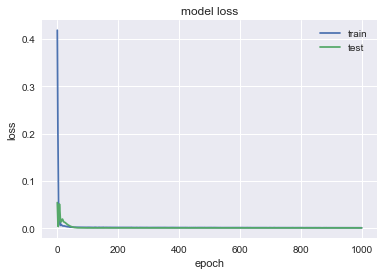

               DVA
MSE         1.2256
MAE       0.788905
R2        0.908079
MAPE (%)   1.45828


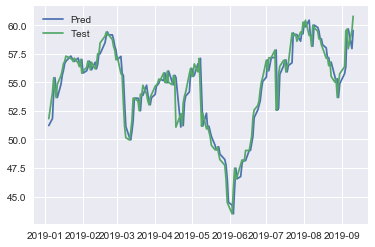

Predicting for  BA
Train on 1008 samples, validate on 172 samples
Epoch 1/1000
0s - loss: 0.1216 - val_loss: 0.4094
Epoch 2/1000
0s - loss: 0.0874 - val_loss: 0.3029
Epoch 3/1000
0s - loss: 0.0588 - val_loss: 0.2059
Epoch 4/1000
0s - loss: 0.0358 - val_loss: 0.1241
Epoch 5/1000
0s - loss: 0.0216 - val_loss: 0.0631
Epoch 6/1000
0s - loss: 0.0169 - val_loss: 0.0257
Epoch 7/1000
0s - loss: 0.0186 - val_loss: 0.0087
Epoch 8/1000
0s - loss: 0.0221 - val_loss: 0.0036
Epoch 9/1000
0s - loss: 0.0227 - val_loss: 0.0031
Epoch 10/1000
0s - loss: 0.0198 - val_loss: 0.0048
Epoch 11/1000
0s - loss: 0.0158 - val_loss: 0.0082
Epoch 12/1000
0s - loss: 0.0121 - val_loss: 0.0115
Epoch 13/1000
0s - loss: 0.0094 - val_loss: 0.0130
Epoch 14/1000
0s - loss: 0.0076 - val_loss: 0.0117
Epoch 15/1000
0s - loss: 0.0061 - val_loss: 0.0086
Epoch 16/1000
0s - loss: 0.0049 - val_loss: 0.0052
Epoch 17/1000
0s - loss: 0.0040 - val_loss: 0.0028
Epoch 18/1000
0s - loss: 0.0032 - val_loss: 0.0015
Epoch 19/1000
0s - loss: 

0s - loss: 6.6678e-04 - val_loss: 4.4956e-04
Epoch 142/1000
0s - loss: 6.7717e-04 - val_loss: 4.4204e-04
Epoch 143/1000
0s - loss: 5.6545e-04 - val_loss: 4.4726e-04
Epoch 144/1000
0s - loss: 5.7375e-04 - val_loss: 4.4506e-04
Epoch 145/1000
0s - loss: 6.0806e-04 - val_loss: 4.5539e-04
Epoch 146/1000
0s - loss: 5.7282e-04 - val_loss: 4.4388e-04
Epoch 147/1000
0s - loss: 5.9051e-04 - val_loss: 4.5705e-04
Epoch 148/1000
0s - loss: 6.2359e-04 - val_loss: 4.4288e-04
Epoch 149/1000
0s - loss: 5.4045e-04 - val_loss: 4.4265e-04
Epoch 150/1000
0s - loss: 6.3702e-04 - val_loss: 4.4276e-04
Epoch 151/1000
0s - loss: 5.3343e-04 - val_loss: 4.4933e-04
Epoch 152/1000
0s - loss: 5.7241e-04 - val_loss: 4.5093e-04
Epoch 153/1000
0s - loss: 5.9413e-04 - val_loss: 4.4465e-04
Epoch 154/1000
0s - loss: 6.1681e-04 - val_loss: 4.4276e-04
Epoch 155/1000
0s - loss: 6.1282e-04 - val_loss: 4.4958e-04
Epoch 156/1000
0s - loss: 6.3197e-04 - val_loss: 5.0638e-04
Epoch 157/1000
0s - loss: 7.1861e-04 - val_loss: 5.0721

0s - loss: 5.5370e-04 - val_loss: 4.2177e-04
Epoch 280/1000
0s - loss: 4.9324e-04 - val_loss: 4.6370e-04
Epoch 281/1000
0s - loss: 5.3894e-04 - val_loss: 5.3872e-04
Epoch 282/1000
0s - loss: 5.8507e-04 - val_loss: 4.3665e-04
Epoch 283/1000
0s - loss: 4.8827e-04 - val_loss: 4.3046e-04
Epoch 284/1000
0s - loss: 5.0197e-04 - val_loss: 4.2294e-04
Epoch 285/1000
0s - loss: 5.6594e-04 - val_loss: 4.4723e-04
Epoch 286/1000
0s - loss: 5.1482e-04 - val_loss: 4.5507e-04
Epoch 287/1000
0s - loss: 5.4341e-04 - val_loss: 4.3195e-04
Epoch 288/1000
0s - loss: 5.4817e-04 - val_loss: 4.2051e-04
Epoch 289/1000
0s - loss: 5.0302e-04 - val_loss: 4.4874e-04
Epoch 290/1000
0s - loss: 5.4660e-04 - val_loss: 4.4043e-04
Epoch 291/1000
0s - loss: 5.7255e-04 - val_loss: 4.2266e-04
Epoch 292/1000
0s - loss: 4.9728e-04 - val_loss: 4.6500e-04
Epoch 293/1000
0s - loss: 4.1206e-04 - val_loss: 4.6634e-04
Epoch 294/1000
0s - loss: 4.9292e-04 - val_loss: 4.3105e-04
Epoch 295/1000
0s - loss: 4.9434e-04 - val_loss: 4.5965

0s - loss: 5.1587e-04 - val_loss: 4.5287e-04
Epoch 417/1000
0s - loss: 5.0248e-04 - val_loss: 4.3039e-04
Epoch 418/1000
0s - loss: 4.5839e-04 - val_loss: 4.5078e-04
Epoch 419/1000
0s - loss: 5.7027e-04 - val_loss: 4.6861e-04
Epoch 420/1000
0s - loss: 4.8954e-04 - val_loss: 4.3093e-04
Epoch 421/1000
0s - loss: 5.0033e-04 - val_loss: 4.1697e-04
Epoch 422/1000
0s - loss: 4.8732e-04 - val_loss: 4.9261e-04
Epoch 423/1000
0s - loss: 6.0466e-04 - val_loss: 5.1492e-04
Epoch 424/1000
0s - loss: 5.1999e-04 - val_loss: 4.1740e-04
Epoch 425/1000
0s - loss: 5.0386e-04 - val_loss: 5.4000e-04
Epoch 426/1000
0s - loss: 4.1573e-04 - val_loss: 4.7588e-04
Epoch 427/1000
0s - loss: 5.5703e-04 - val_loss: 4.8228e-04
Epoch 428/1000
0s - loss: 4.6891e-04 - val_loss: 5.1897e-04
Epoch 429/1000
0s - loss: 3.9423e-04 - val_loss: 4.7115e-04
Epoch 430/1000
0s - loss: 4.5457e-04 - val_loss: 5.5901e-04
Epoch 431/1000
0s - loss: 4.4728e-04 - val_loss: 4.9729e-04
Epoch 432/1000
0s - loss: 5.1343e-04 - val_loss: 4.1939

0s - loss: 4.5364e-04 - val_loss: 6.0450e-04
Epoch 555/1000
0s - loss: 5.1225e-04 - val_loss: 4.7489e-04
Epoch 556/1000
0s - loss: 4.3415e-04 - val_loss: 4.5884e-04
Epoch 557/1000
0s - loss: 4.6595e-04 - val_loss: 6.1701e-04
Epoch 558/1000
0s - loss: 4.3026e-04 - val_loss: 4.6044e-04
Epoch 559/1000
0s - loss: 5.0337e-04 - val_loss: 5.1050e-04
Epoch 560/1000
0s - loss: 4.5004e-04 - val_loss: 5.2489e-04
Epoch 561/1000
0s - loss: 4.8395e-04 - val_loss: 4.2483e-04
Epoch 562/1000
0s - loss: 4.6717e-04 - val_loss: 4.8613e-04
Epoch 563/1000
0s - loss: 4.2333e-04 - val_loss: 4.5992e-04
Epoch 564/1000
0s - loss: 4.7747e-04 - val_loss: 4.2369e-04
Epoch 565/1000
0s - loss: 4.2147e-04 - val_loss: 5.4511e-04
Epoch 566/1000
0s - loss: 5.2842e-04 - val_loss: 5.2679e-04
Epoch 567/1000
0s - loss: 4.7869e-04 - val_loss: 4.2011e-04
Epoch 568/1000
0s - loss: 3.9616e-04 - val_loss: 7.0662e-04
Epoch 569/1000
0s - loss: 5.0595e-04 - val_loss: 4.3496e-04
Epoch 570/1000
0s - loss: 4.9410e-04 - val_loss: 4.2980

0s - loss: 4.1961e-04 - val_loss: 5.7266e-04
Epoch 693/1000
0s - loss: 4.3119e-04 - val_loss: 4.7137e-04
Epoch 694/1000
0s - loss: 4.5340e-04 - val_loss: 4.3511e-04
Epoch 695/1000
0s - loss: 4.4528e-04 - val_loss: 5.8173e-04
Epoch 696/1000
0s - loss: 4.4284e-04 - val_loss: 4.8210e-04
Epoch 697/1000
0s - loss: 4.4375e-04 - val_loss: 4.7400e-04
Epoch 698/1000
0s - loss: 4.4549e-04 - val_loss: 5.0266e-04
Epoch 699/1000
0s - loss: 3.9289e-04 - val_loss: 4.3022e-04
Epoch 700/1000
0s - loss: 4.1919e-04 - val_loss: 4.6596e-04
Epoch 701/1000
0s - loss: 4.2288e-04 - val_loss: 5.5039e-04
Epoch 702/1000
0s - loss: 4.1181e-04 - val_loss: 4.6486e-04
Epoch 703/1000
0s - loss: 4.1327e-04 - val_loss: 4.6607e-04
Epoch 704/1000
0s - loss: 4.2464e-04 - val_loss: 4.9836e-04
Epoch 705/1000
0s - loss: 3.4447e-04 - val_loss: 4.6617e-04
Epoch 706/1000
0s - loss: 4.0498e-04 - val_loss: 5.1806e-04
Epoch 707/1000
0s - loss: 4.1915e-04 - val_loss: 4.3076e-04
Epoch 708/1000
0s - loss: 4.7770e-04 - val_loss: 4.7551

0s - loss: 4.6747e-04 - val_loss: 4.6442e-04
Epoch 831/1000
0s - loss: 4.3156e-04 - val_loss: 5.9732e-04
Epoch 832/1000
0s - loss: 4.2086e-04 - val_loss: 4.6900e-04
Epoch 833/1000
0s - loss: 4.6217e-04 - val_loss: 5.4173e-04
Epoch 834/1000
0s - loss: 4.5695e-04 - val_loss: 4.2050e-04
Epoch 835/1000
0s - loss: 4.2460e-04 - val_loss: 5.8227e-04
Epoch 836/1000
0s - loss: 3.9919e-04 - val_loss: 4.2561e-04
Epoch 837/1000
0s - loss: 3.6292e-04 - val_loss: 5.1819e-04
Epoch 838/1000
0s - loss: 4.0164e-04 - val_loss: 4.3274e-04
Epoch 839/1000
0s - loss: 3.7699e-04 - val_loss: 5.7572e-04
Epoch 840/1000
0s - loss: 3.8419e-04 - val_loss: 4.5212e-04
Epoch 841/1000
0s - loss: 4.6893e-04 - val_loss: 5.2272e-04
Epoch 842/1000
0s - loss: 5.0352e-04 - val_loss: 5.5634e-04
Epoch 843/1000
0s - loss: 4.8620e-04 - val_loss: 4.3288e-04
Epoch 844/1000
0s - loss: 4.3860e-04 - val_loss: 5.9745e-04
Epoch 845/1000
0s - loss: 3.8168e-04 - val_loss: 4.2082e-04
Epoch 846/1000
0s - loss: 3.8611e-04 - val_loss: 5.0172

0s - loss: 3.9619e-04 - val_loss: 4.3656e-04
Epoch 969/1000
0s - loss: 3.8713e-04 - val_loss: 4.3977e-04
Epoch 970/1000
0s - loss: 3.9554e-04 - val_loss: 5.8992e-04
Epoch 971/1000
0s - loss: 3.9674e-04 - val_loss: 4.4876e-04
Epoch 972/1000
0s - loss: 4.1320e-04 - val_loss: 4.4593e-04
Epoch 973/1000
0s - loss: 3.6857e-04 - val_loss: 4.8803e-04
Epoch 974/1000
0s - loss: 4.0467e-04 - val_loss: 4.3259e-04
Epoch 975/1000
0s - loss: 3.8803e-04 - val_loss: 4.5562e-04
Epoch 976/1000
0s - loss: 3.8314e-04 - val_loss: 5.1203e-04
Epoch 977/1000
0s - loss: 4.0554e-04 - val_loss: 4.3839e-04
Epoch 978/1000
0s - loss: 3.8712e-04 - val_loss: 4.3509e-04
Epoch 979/1000
0s - loss: 3.8057e-04 - val_loss: 4.6074e-04
Epoch 980/1000
0s - loss: 3.3128e-04 - val_loss: 4.4648e-04
Epoch 981/1000
0s - loss: 3.7994e-04 - val_loss: 5.2375e-04
Epoch 982/1000
0s - loss: 3.8354e-04 - val_loss: 4.6187e-04
Epoch 983/1000
0s - loss: 3.6726e-04 - val_loss: 4.5456e-04
Epoch 984/1000
0s - loss: 3.9965e-04 - val_loss: 4.2042

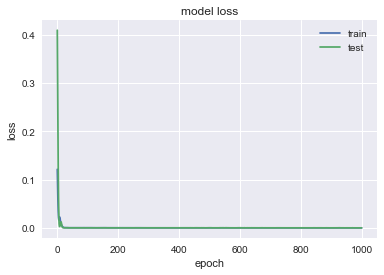

                BA
MSE        50.8294
MAE        4.95398
R2        0.914763
MAPE (%)   1.33461


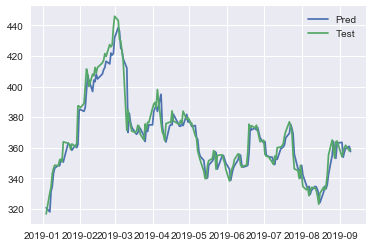

Predicting for  IBM
Train on 1008 samples, validate on 172 samples
Epoch 1/1000
0s - loss: 0.3508 - val_loss: 0.1117
Epoch 2/1000
0s - loss: 0.2594 - val_loss: 0.0718
Epoch 3/1000
0s - loss: 0.1794 - val_loss: 0.0385
Epoch 4/1000
0s - loss: 0.1094 - val_loss: 0.0142
Epoch 5/1000
0s - loss: 0.0542 - val_loss: 0.0026
Epoch 6/1000
0s - loss: 0.0197 - val_loss: 0.0063
Epoch 7/1000
0s - loss: 0.0088 - val_loss: 0.0192
Epoch 8/1000
0s - loss: 0.0128 - val_loss: 0.0268
Epoch 9/1000
0s - loss: 0.0150 - val_loss: 0.0226
Epoch 10/1000
0s - loss: 0.0106 - val_loss: 0.0138
Epoch 11/1000
0s - loss: 0.0071 - val_loss: 0.0073
Epoch 12/1000
0s - loss: 0.0066 - val_loss: 0.0041
Epoch 13/1000
0s - loss: 0.0079 - val_loss: 0.0030
Epoch 14/1000
0s - loss: 0.0081 - val_loss: 0.0030
Epoch 15/1000
0s - loss: 0.0079 - val_loss: 0.0036
Epoch 16/1000
0s - loss: 0.0065 - val_loss: 0.0047
Epoch 17/1000
0s - loss: 0.0058 - val_loss: 0.0058
Epoch 18/1000
0s - loss: 0.0052 - val_loss: 0.0062
Epoch 19/1000
0s - loss:

0s - loss: 0.0017 - val_loss: 5.0585e-04
Epoch 154/1000
0s - loss: 0.0017 - val_loss: 5.2331e-04
Epoch 155/1000
0s - loss: 0.0018 - val_loss: 5.6237e-04
Epoch 156/1000
0s - loss: 0.0018 - val_loss: 5.2258e-04
Epoch 157/1000
0s - loss: 0.0019 - val_loss: 4.8902e-04
Epoch 158/1000
0s - loss: 0.0017 - val_loss: 4.9701e-04
Epoch 159/1000
0s - loss: 0.0017 - val_loss: 5.4807e-04
Epoch 160/1000
0s - loss: 0.0018 - val_loss: 5.0934e-04
Epoch 161/1000
0s - loss: 0.0016 - val_loss: 4.9132e-04
Epoch 162/1000
0s - loss: 0.0016 - val_loss: 4.9434e-04
Epoch 163/1000
0s - loss: 0.0017 - val_loss: 5.2677e-04
Epoch 164/1000
0s - loss: 0.0017 - val_loss: 5.2962e-04
Epoch 165/1000
0s - loss: 0.0017 - val_loss: 5.0738e-04
Epoch 166/1000
0s - loss: 0.0018 - val_loss: 5.0413e-04
Epoch 167/1000
0s - loss: 0.0017 - val_loss: 5.2679e-04
Epoch 168/1000
0s - loss: 0.0018 - val_loss: 5.1167e-04
Epoch 169/1000
0s - loss: 0.0017 - val_loss: 5.0166e-04
Epoch 170/1000
0s - loss: 0.0017 - val_loss: 5.1426e-04
Epoch 1

0s - loss: 0.0014 - val_loss: 5.1551e-04
Epoch 301/1000
0s - loss: 0.0014 - val_loss: 5.1055e-04
Epoch 302/1000
0s - loss: 0.0015 - val_loss: 5.0338e-04
Epoch 303/1000
0s - loss: 0.0016 - val_loss: 5.0618e-04
Epoch 304/1000
0s - loss: 0.0015 - val_loss: 5.1455e-04
Epoch 305/1000
0s - loss: 0.0015 - val_loss: 5.0653e-04
Epoch 306/1000
0s - loss: 0.0015 - val_loss: 5.1510e-04
Epoch 307/1000
0s - loss: 0.0015 - val_loss: 5.0457e-04
Epoch 308/1000
0s - loss: 0.0014 - val_loss: 5.1382e-04
Epoch 309/1000
0s - loss: 0.0013 - val_loss: 5.3453e-04
Epoch 310/1000
0s - loss: 0.0013 - val_loss: 5.0918e-04
Epoch 311/1000
0s - loss: 0.0014 - val_loss: 5.1702e-04
Epoch 312/1000
0s - loss: 0.0013 - val_loss: 5.3818e-04
Epoch 313/1000
0s - loss: 0.0015 - val_loss: 5.0668e-04
Epoch 314/1000
0s - loss: 0.0015 - val_loss: 5.0913e-04
Epoch 315/1000
0s - loss: 0.0013 - val_loss: 5.0301e-04
Epoch 316/1000
0s - loss: 0.0014 - val_loss: 5.1819e-04
Epoch 317/1000
0s - loss: 0.0015 - val_loss: 5.1260e-04
Epoch 3

0s - loss: 0.0013 - val_loss: 5.1809e-04
Epoch 448/1000
0s - loss: 0.0013 - val_loss: 5.1510e-04
Epoch 449/1000
0s - loss: 0.0014 - val_loss: 5.2840e-04
Epoch 450/1000
0s - loss: 0.0014 - val_loss: 5.1032e-04
Epoch 451/1000
0s - loss: 0.0013 - val_loss: 5.2909e-04
Epoch 452/1000
0s - loss: 0.0013 - val_loss: 5.1714e-04
Epoch 453/1000
0s - loss: 0.0013 - val_loss: 5.2858e-04
Epoch 454/1000
0s - loss: 0.0014 - val_loss: 5.1370e-04
Epoch 455/1000
0s - loss: 0.0013 - val_loss: 5.0610e-04
Epoch 456/1000
0s - loss: 0.0013 - val_loss: 5.2083e-04
Epoch 457/1000
0s - loss: 0.0013 - val_loss: 5.0813e-04
Epoch 458/1000
0s - loss: 0.0014 - val_loss: 5.2017e-04
Epoch 459/1000
0s - loss: 0.0012 - val_loss: 5.3036e-04
Epoch 460/1000
0s - loss: 0.0012 - val_loss: 5.1743e-04
Epoch 461/1000
0s - loss: 0.0013 - val_loss: 5.4170e-04
Epoch 462/1000
0s - loss: 0.0013 - val_loss: 5.1041e-04
Epoch 463/1000
0s - loss: 0.0013 - val_loss: 5.2625e-04
Epoch 464/1000
0s - loss: 0.0014 - val_loss: 5.1313e-04
Epoch 4

0s - loss: 0.0012 - val_loss: 5.7073e-04
Epoch 595/1000
0s - loss: 0.0012 - val_loss: 5.0553e-04
Epoch 596/1000
0s - loss: 0.0012 - val_loss: 5.1820e-04
Epoch 597/1000
0s - loss: 0.0011 - val_loss: 5.2486e-04
Epoch 598/1000
0s - loss: 0.0013 - val_loss: 5.0587e-04
Epoch 599/1000
0s - loss: 0.0013 - val_loss: 5.5392e-04
Epoch 600/1000
0s - loss: 0.0013 - val_loss: 5.1186e-04
Epoch 601/1000
0s - loss: 0.0013 - val_loss: 5.2911e-04
Epoch 602/1000
0s - loss: 0.0012 - val_loss: 5.3301e-04
Epoch 603/1000
0s - loss: 0.0012 - val_loss: 5.1978e-04
Epoch 604/1000
0s - loss: 0.0012 - val_loss: 5.1089e-04
Epoch 605/1000
0s - loss: 0.0012 - val_loss: 5.0668e-04
Epoch 606/1000
0s - loss: 0.0012 - val_loss: 5.3078e-04
Epoch 607/1000
0s - loss: 0.0012 - val_loss: 5.1440e-04
Epoch 608/1000
0s - loss: 0.0011 - val_loss: 5.4190e-04
Epoch 609/1000
0s - loss: 0.0013 - val_loss: 5.1163e-04
Epoch 610/1000
0s - loss: 0.0012 - val_loss: 5.1810e-04
Epoch 611/1000
0s - loss: 0.0012 - val_loss: 5.0882e-04
Epoch 6

0s - loss: 0.0010 - val_loss: 5.2108e-04
Epoch 742/1000
0s - loss: 0.0011 - val_loss: 5.1494e-04
Epoch 743/1000
0s - loss: 0.0010 - val_loss: 5.2236e-04
Epoch 744/1000
0s - loss: 0.0010 - val_loss: 5.1085e-04
Epoch 745/1000
0s - loss: 0.0011 - val_loss: 5.1807e-04
Epoch 746/1000
0s - loss: 0.0011 - val_loss: 5.1100e-04
Epoch 747/1000
0s - loss: 0.0011 - val_loss: 5.2077e-04
Epoch 748/1000
0s - loss: 0.0011 - val_loss: 5.1408e-04
Epoch 749/1000
0s - loss: 0.0012 - val_loss: 5.2185e-04
Epoch 750/1000
0s - loss: 0.0011 - val_loss: 4.9902e-04
Epoch 751/1000
0s - loss: 0.0011 - val_loss: 5.2757e-04
Epoch 752/1000
0s - loss: 0.0011 - val_loss: 5.1958e-04
Epoch 753/1000
0s - loss: 0.0012 - val_loss: 5.2185e-04
Epoch 754/1000
0s - loss: 0.0011 - val_loss: 5.1208e-04
Epoch 755/1000
0s - loss: 0.0011 - val_loss: 5.2368e-04
Epoch 756/1000
0s - loss: 0.0011 - val_loss: 5.0764e-04
Epoch 757/1000
0s - loss: 0.0011 - val_loss: 5.1624e-04
Epoch 758/1000
0s - loss: 0.0011 - val_loss: 5.1702e-04
Epoch 7

0s - loss: 9.9120e-04 - val_loss: 5.1002e-04
Epoch 889/1000
0s - loss: 0.0011 - val_loss: 5.9291e-04
Epoch 890/1000
0s - loss: 0.0010 - val_loss: 5.2430e-04
Epoch 891/1000
0s - loss: 0.0011 - val_loss: 6.0871e-04
Epoch 892/1000
0s - loss: 0.0011 - val_loss: 5.2580e-04
Epoch 893/1000
0s - loss: 0.0011 - val_loss: 5.8187e-04
Epoch 894/1000
0s - loss: 0.0010 - val_loss: 5.0737e-04
Epoch 895/1000
0s - loss: 0.0011 - val_loss: 5.4026e-04
Epoch 896/1000
0s - loss: 0.0010 - val_loss: 5.0766e-04
Epoch 897/1000
0s - loss: 9.4032e-04 - val_loss: 5.4910e-04
Epoch 898/1000
0s - loss: 0.0012 - val_loss: 5.1087e-04
Epoch 899/1000
0s - loss: 0.0010 - val_loss: 5.6673e-04
Epoch 900/1000
0s - loss: 0.0010 - val_loss: 5.0828e-04
Epoch 901/1000
0s - loss: 0.0011 - val_loss: 5.4209e-04
Epoch 902/1000
0s - loss: 0.0010 - val_loss: 5.0084e-04
Epoch 903/1000
0s - loss: 9.9841e-04 - val_loss: 5.2959e-04
Epoch 904/1000
0s - loss: 0.0010 - val_loss: 5.0408e-04
Epoch 905/1000
0s - loss: 9.6563e-04 - val_loss: 5.

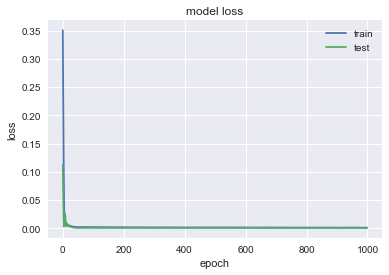

               IBM
MSE        2.74583
MAE         1.1297
R2        0.939538
MAPE (%)  0.829836


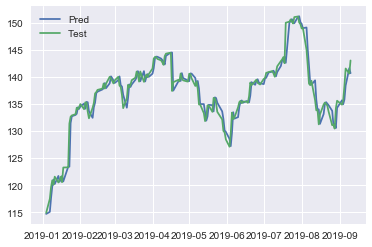

Predicting for  ALB
Train on 1008 samples, validate on 172 samples
Epoch 1/1000
0s - loss: 0.2181 - val_loss: 0.0754
Epoch 2/1000
0s - loss: 0.1604 - val_loss: 0.0461
Epoch 3/1000
0s - loss: 0.1096 - val_loss: 0.0227
Epoch 4/1000
0s - loss: 0.0652 - val_loss: 0.0072
Epoch 5/1000
0s - loss: 0.0336 - val_loss: 0.0021
Epoch 6/1000
0s - loss: 0.0168 - val_loss: 0.0076
Epoch 7/1000
0s - loss: 0.0152 - val_loss: 0.0175
Epoch 8/1000
0s - loss: 0.0194 - val_loss: 0.0224
Epoch 9/1000
0s - loss: 0.0216 - val_loss: 0.0191
Epoch 10/1000
0s - loss: 0.0188 - val_loss: 0.0124
Epoch 11/1000
0s - loss: 0.0150 - val_loss: 0.0070
Epoch 12/1000
0s - loss: 0.0131 - val_loss: 0.0040
Epoch 13/1000
0s - loss: 0.0119 - val_loss: 0.0028
Epoch 14/1000
0s - loss: 0.0109 - val_loss: 0.0025
Epoch 15/1000
0s - loss: 0.0093 - val_loss: 0.0027
Epoch 16/1000
0s - loss: 0.0084 - val_loss: 0.0032
Epoch 17/1000
0s - loss: 0.0074 - val_loss: 0.0036
Epoch 18/1000
0s - loss: 0.0067 - val_loss: 0.0036
Epoch 19/1000
0s - loss:

0s - loss: 0.0010 - val_loss: 2.6432e-04
Epoch 151/1000
0s - loss: 9.1782e-04 - val_loss: 2.5573e-04
Epoch 152/1000
0s - loss: 8.8968e-04 - val_loss: 2.5219e-04
Epoch 153/1000
0s - loss: 9.1977e-04 - val_loss: 2.5219e-04
Epoch 154/1000
0s - loss: 9.0156e-04 - val_loss: 2.5363e-04
Epoch 155/1000
0s - loss: 0.0010 - val_loss: 2.5299e-04
Epoch 156/1000
0s - loss: 0.0010 - val_loss: 2.5323e-04
Epoch 157/1000
0s - loss: 9.9713e-04 - val_loss: 2.5521e-04
Epoch 158/1000
0s - loss: 9.9145e-04 - val_loss: 2.5266e-04
Epoch 159/1000
0s - loss: 0.0011 - val_loss: 2.5286e-04
Epoch 160/1000
0s - loss: 9.9875e-04 - val_loss: 2.5364e-04
Epoch 161/1000
0s - loss: 9.3464e-04 - val_loss: 2.6484e-04
Epoch 162/1000
0s - loss: 9.9328e-04 - val_loss: 2.5263e-04
Epoch 163/1000
0s - loss: 9.6414e-04 - val_loss: 2.5435e-04
Epoch 164/1000
0s - loss: 0.0011 - val_loss: 2.5506e-04
Epoch 165/1000
0s - loss: 8.5782e-04 - val_loss: 2.6579e-04
Epoch 166/1000
0s - loss: 9.3119e-04 - val_loss: 2.5282e-04
Epoch 167/1000


0s - loss: 7.5914e-04 - val_loss: 2.5797e-04
Epoch 289/1000
0s - loss: 8.5320e-04 - val_loss: 2.5692e-04
Epoch 290/1000
0s - loss: 8.1664e-04 - val_loss: 2.5367e-04
Epoch 291/1000
0s - loss: 8.0575e-04 - val_loss: 2.5417e-04
Epoch 292/1000
0s - loss: 7.5101e-04 - val_loss: 2.6188e-04
Epoch 293/1000
0s - loss: 8.0588e-04 - val_loss: 2.6127e-04
Epoch 294/1000
0s - loss: 9.7715e-04 - val_loss: 2.5835e-04
Epoch 295/1000
0s - loss: 8.8971e-04 - val_loss: 2.5391e-04
Epoch 296/1000
0s - loss: 8.5772e-04 - val_loss: 2.5666e-04
Epoch 297/1000
0s - loss: 7.7905e-04 - val_loss: 2.5327e-04
Epoch 298/1000
0s - loss: 7.7788e-04 - val_loss: 2.5493e-04
Epoch 299/1000
0s - loss: 8.3592e-04 - val_loss: 2.5791e-04
Epoch 300/1000
0s - loss: 8.2373e-04 - val_loss: 2.5754e-04
Epoch 301/1000
0s - loss: 8.6019e-04 - val_loss: 2.5572e-04
Epoch 302/1000
0s - loss: 7.0941e-04 - val_loss: 2.5373e-04
Epoch 303/1000
0s - loss: 8.0964e-04 - val_loss: 2.6085e-04
Epoch 304/1000
0s - loss: 8.3130e-04 - val_loss: 2.5384

0s - loss: 7.5391e-04 - val_loss: 2.6398e-04
Epoch 427/1000
0s - loss: 7.4230e-04 - val_loss: 2.5904e-04
Epoch 428/1000
0s - loss: 7.8054e-04 - val_loss: 2.5594e-04
Epoch 429/1000
0s - loss: 7.2089e-04 - val_loss: 2.5392e-04
Epoch 430/1000
0s - loss: 7.8655e-04 - val_loss: 2.5874e-04
Epoch 431/1000
0s - loss: 7.6579e-04 - val_loss: 2.5336e-04
Epoch 432/1000
0s - loss: 7.4757e-04 - val_loss: 2.5397e-04
Epoch 433/1000
0s - loss: 7.8416e-04 - val_loss: 2.5688e-04
Epoch 434/1000
0s - loss: 7.3205e-04 - val_loss: 2.5583e-04
Epoch 435/1000
0s - loss: 8.2468e-04 - val_loss: 2.6083e-04
Epoch 436/1000
0s - loss: 8.4165e-04 - val_loss: 2.5481e-04
Epoch 437/1000
0s - loss: 6.9855e-04 - val_loss: 2.5937e-04
Epoch 438/1000
0s - loss: 8.1000e-04 - val_loss: 2.5695e-04
Epoch 439/1000
0s - loss: 7.2982e-04 - val_loss: 2.5986e-04
Epoch 440/1000
0s - loss: 7.5316e-04 - val_loss: 2.5871e-04
Epoch 441/1000
0s - loss: 7.9212e-04 - val_loss: 2.5418e-04
Epoch 442/1000
0s - loss: 7.6505e-04 - val_loss: 2.7442

0s - loss: 7.1739e-04 - val_loss: 2.5438e-04
Epoch 565/1000
0s - loss: 6.8763e-04 - val_loss: 2.5395e-04
Epoch 566/1000
0s - loss: 7.2264e-04 - val_loss: 2.5569e-04
Epoch 567/1000
0s - loss: 7.8936e-04 - val_loss: 2.5648e-04
Epoch 568/1000
0s - loss: 7.2696e-04 - val_loss: 2.8613e-04
Epoch 569/1000
0s - loss: 7.5812e-04 - val_loss: 2.5974e-04
Epoch 570/1000
0s - loss: 7.3853e-04 - val_loss: 2.5476e-04
Epoch 571/1000
0s - loss: 6.5063e-04 - val_loss: 2.5604e-04
Epoch 572/1000
0s - loss: 6.5881e-04 - val_loss: 2.5366e-04
Epoch 573/1000
0s - loss: 7.4599e-04 - val_loss: 2.5575e-04
Epoch 574/1000
0s - loss: 6.7304e-04 - val_loss: 2.5796e-04
Epoch 575/1000
0s - loss: 6.5286e-04 - val_loss: 2.5522e-04
Epoch 576/1000
0s - loss: 6.8315e-04 - val_loss: 2.5406e-04
Epoch 577/1000
0s - loss: 6.5845e-04 - val_loss: 2.5681e-04
Epoch 578/1000
0s - loss: 6.6611e-04 - val_loss: 2.5458e-04
Epoch 579/1000
0s - loss: 7.4142e-04 - val_loss: 2.5990e-04
Epoch 580/1000
0s - loss: 7.2595e-04 - val_loss: 2.5336

0s - loss: 6.6551e-04 - val_loss: 2.6248e-04
Epoch 703/1000
0s - loss: 6.8233e-04 - val_loss: 2.7549e-04
Epoch 704/1000
0s - loss: 6.6023e-04 - val_loss: 2.5320e-04
Epoch 705/1000
0s - loss: 7.0844e-04 - val_loss: 2.6740e-04
Epoch 706/1000
0s - loss: 7.2345e-04 - val_loss: 2.5828e-04
Epoch 707/1000
0s - loss: 6.2913e-04 - val_loss: 2.5706e-04
Epoch 708/1000
0s - loss: 6.9078e-04 - val_loss: 2.5400e-04
Epoch 709/1000
0s - loss: 6.4612e-04 - val_loss: 2.5949e-04
Epoch 710/1000
0s - loss: 6.2214e-04 - val_loss: 2.5312e-04
Epoch 711/1000
0s - loss: 6.8002e-04 - val_loss: 2.5884e-04
Epoch 712/1000
0s - loss: 6.0209e-04 - val_loss: 2.5300e-04
Epoch 713/1000
0s - loss: 6.8338e-04 - val_loss: 2.5712e-04
Epoch 714/1000
0s - loss: 6.3692e-04 - val_loss: 2.5903e-04
Epoch 715/1000
0s - loss: 6.3526e-04 - val_loss: 2.5760e-04
Epoch 716/1000
0s - loss: 7.5548e-04 - val_loss: 2.5374e-04
Epoch 717/1000
0s - loss: 5.9450e-04 - val_loss: 2.5602e-04
Epoch 718/1000
0s - loss: 6.3139e-04 - val_loss: 2.5400

0s - loss: 6.1110e-04 - val_loss: 2.5831e-04
Epoch 841/1000
0s - loss: 6.7877e-04 - val_loss: 2.5762e-04
Epoch 842/1000
0s - loss: 6.1724e-04 - val_loss: 2.6499e-04
Epoch 843/1000
0s - loss: 5.5839e-04 - val_loss: 2.5418e-04
Epoch 844/1000
0s - loss: 5.6103e-04 - val_loss: 2.5960e-04
Epoch 845/1000
0s - loss: 5.8145e-04 - val_loss: 2.5622e-04
Epoch 846/1000
0s - loss: 7.0943e-04 - val_loss: 2.7168e-04
Epoch 847/1000
0s - loss: 6.8204e-04 - val_loss: 2.5684e-04
Epoch 848/1000
0s - loss: 6.5127e-04 - val_loss: 2.5644e-04
Epoch 849/1000
0s - loss: 5.8406e-04 - val_loss: 2.5434e-04
Epoch 850/1000
0s - loss: 7.9400e-04 - val_loss: 2.6902e-04
Epoch 851/1000
0s - loss: 6.2812e-04 - val_loss: 2.5411e-04
Epoch 852/1000
0s - loss: 6.5985e-04 - val_loss: 2.5427e-04
Epoch 853/1000
0s - loss: 6.1215e-04 - val_loss: 2.6799e-04
Epoch 854/1000
0s - loss: 5.9779e-04 - val_loss: 2.5829e-04
Epoch 855/1000
0s - loss: 6.1308e-04 - val_loss: 2.6268e-04
Epoch 856/1000
0s - loss: 7.5881e-04 - val_loss: 2.6231

0s - loss: 8.7418e-04 - val_loss: 3.0027e-04
Epoch 978/1000
0s - loss: 7.6686e-04 - val_loss: 2.5314e-04
Epoch 979/1000
0s - loss: 8.7483e-04 - val_loss: 2.5798e-04
Epoch 980/1000
0s - loss: 8.1401e-04 - val_loss: 2.5637e-04
Epoch 981/1000
0s - loss: 8.1483e-04 - val_loss: 2.5391e-04
Epoch 982/1000
0s - loss: 6.0831e-04 - val_loss: 2.5943e-04
Epoch 983/1000
0s - loss: 6.4608e-04 - val_loss: 2.5619e-04
Epoch 984/1000
0s - loss: 5.5142e-04 - val_loss: 2.9660e-04
Epoch 985/1000
0s - loss: 5.6084e-04 - val_loss: 2.7536e-04
Epoch 986/1000
0s - loss: 6.1301e-04 - val_loss: 2.7286e-04
Epoch 987/1000
0s - loss: 5.8918e-04 - val_loss: 2.6040e-04
Epoch 988/1000
0s - loss: 5.9945e-04 - val_loss: 2.6951e-04
Epoch 989/1000
0s - loss: 5.9906e-04 - val_loss: 2.5613e-04
Epoch 990/1000
0s - loss: 6.0606e-04 - val_loss: 2.5380e-04
Epoch 991/1000
0s - loss: 5.6149e-04 - val_loss: 2.7843e-04
Epoch 992/1000
0s - loss: 5.5676e-04 - val_loss: 2.6488e-04
Epoch 993/1000
0s - loss: 5.8524e-04 - val_loss: 2.5589

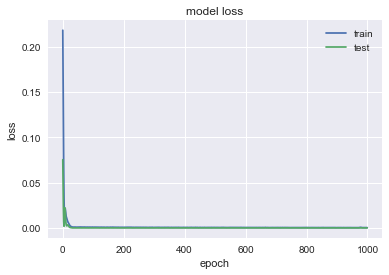

              ALB
MSE       2.66736
MAE       1.21242
R2        0.95665
MAPE (%)  1.63659


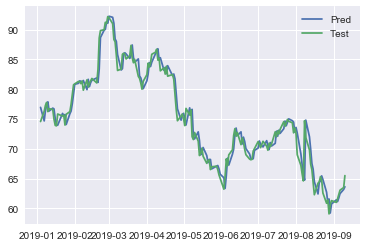

Predicting for  CBRE
Train on 1008 samples, validate on 172 samples
Epoch 1/1000
0s - loss: 0.1909 - val_loss: 0.5070
Epoch 2/1000
0s - loss: 0.1312 - val_loss: 0.3623
Epoch 3/1000
0s - loss: 0.0825 - val_loss: 0.2350
Epoch 4/1000
0s - loss: 0.0441 - val_loss: 0.1299
Epoch 5/1000
0s - loss: 0.0186 - val_loss: 0.0550
Epoch 6/1000
0s - loss: 0.0087 - val_loss: 0.0155
Epoch 7/1000
0s - loss: 0.0125 - val_loss: 0.0035
Epoch 8/1000
0s - loss: 0.0182 - val_loss: 0.0022
Epoch 9/1000
0s - loss: 0.0177 - val_loss: 0.0045
Epoch 10/1000
0s - loss: 0.0134 - val_loss: 0.0112
Epoch 11/1000
0s - loss: 0.0102 - val_loss: 0.0200
Epoch 12/1000
0s - loss: 0.0083 - val_loss: 0.0260
Epoch 13/1000
0s - loss: 0.0079 - val_loss: 0.0266
Epoch 14/1000
0s - loss: 0.0071 - val_loss: 0.0225
Epoch 15/1000
0s - loss: 0.0062 - val_loss: 0.0167
Epoch 16/1000
0s - loss: 0.0059 - val_loss: 0.0116
Epoch 17/1000
0s - loss: 0.0058 - val_loss: 0.0085
Epoch 18/1000
0s - loss: 0.0054 - val_loss: 0.0071
Epoch 19/1000
0s - loss

0s - loss: 9.3628e-04 - val_loss: 5.0341e-04
Epoch 151/1000
0s - loss: 0.0010 - val_loss: 5.4025e-04
Epoch 152/1000
0s - loss: 9.9498e-04 - val_loss: 5.5344e-04
Epoch 153/1000
0s - loss: 9.5580e-04 - val_loss: 5.0348e-04
Epoch 154/1000
0s - loss: 9.6461e-04 - val_loss: 5.0921e-04
Epoch 155/1000
0s - loss: 0.0011 - val_loss: 5.1373e-04
Epoch 156/1000
0s - loss: 0.0010 - val_loss: 5.2466e-04
Epoch 157/1000
0s - loss: 9.6933e-04 - val_loss: 5.8473e-04
Epoch 158/1000
0s - loss: 0.0010 - val_loss: 5.4066e-04
Epoch 159/1000
0s - loss: 9.3994e-04 - val_loss: 5.0547e-04
Epoch 160/1000
0s - loss: 9.3063e-04 - val_loss: 5.0682e-04
Epoch 161/1000
0s - loss: 9.7522e-04 - val_loss: 5.1372e-04
Epoch 162/1000
0s - loss: 9.5943e-04 - val_loss: 5.5120e-04
Epoch 163/1000
0s - loss: 9.5458e-04 - val_loss: 5.2974e-04
Epoch 164/1000
0s - loss: 8.9141e-04 - val_loss: 5.2867e-04
Epoch 165/1000
0s - loss: 9.7243e-04 - val_loss: 5.4018e-04
Epoch 166/1000
0s - loss: 9.6196e-04 - val_loss: 5.0352e-04
Epoch 167/1

0s - loss: 8.5982e-04 - val_loss: 5.6314e-04
Epoch 290/1000
0s - loss: 8.5723e-04 - val_loss: 4.9312e-04
Epoch 291/1000
0s - loss: 8.1137e-04 - val_loss: 4.8300e-04
Epoch 292/1000
0s - loss: 9.3747e-04 - val_loss: 6.4786e-04
Epoch 293/1000
0s - loss: 8.1277e-04 - val_loss: 5.8191e-04
Epoch 294/1000
0s - loss: 8.2154e-04 - val_loss: 4.7899e-04
Epoch 295/1000
0s - loss: 8.7379e-04 - val_loss: 5.3467e-04
Epoch 296/1000
0s - loss: 7.8965e-04 - val_loss: 6.5055e-04
Epoch 297/1000
0s - loss: 8.3052e-04 - val_loss: 5.0274e-04
Epoch 298/1000
0s - loss: 7.6980e-04 - val_loss: 5.3932e-04
Epoch 299/1000
0s - loss: 8.1554e-04 - val_loss: 5.6980e-04
Epoch 300/1000
0s - loss: 8.0221e-04 - val_loss: 5.1303e-04
Epoch 301/1000
0s - loss: 7.6541e-04 - val_loss: 5.4133e-04
Epoch 302/1000
0s - loss: 8.2009e-04 - val_loss: 5.5193e-04
Epoch 303/1000
0s - loss: 9.2645e-04 - val_loss: 5.0677e-04
Epoch 304/1000
0s - loss: 8.0020e-04 - val_loss: 5.3023e-04
Epoch 305/1000
0s - loss: 7.9306e-04 - val_loss: 5.9290

0s - loss: 7.8689e-04 - val_loss: 7.1081e-04
Epoch 428/1000
0s - loss: 7.7096e-04 - val_loss: 7.1792e-04
Epoch 429/1000
0s - loss: 7.2166e-04 - val_loss: 5.0086e-04
Epoch 430/1000
0s - loss: 7.6830e-04 - val_loss: 5.8336e-04
Epoch 431/1000
0s - loss: 7.9827e-04 - val_loss: 6.6539e-04
Epoch 432/1000
0s - loss: 8.1296e-04 - val_loss: 4.6950e-04
Epoch 433/1000
0s - loss: 7.4641e-04 - val_loss: 6.7492e-04
Epoch 434/1000
0s - loss: 6.9071e-04 - val_loss: 6.0903e-04
Epoch 435/1000
0s - loss: 8.1310e-04 - val_loss: 5.6005e-04
Epoch 436/1000
0s - loss: 7.8522e-04 - val_loss: 5.8376e-04
Epoch 437/1000
0s - loss: 7.2748e-04 - val_loss: 4.7124e-04
Epoch 438/1000
0s - loss: 7.6522e-04 - val_loss: 5.9658e-04
Epoch 439/1000
0s - loss: 7.8177e-04 - val_loss: 6.3199e-04
Epoch 440/1000
0s - loss: 7.3367e-04 - val_loss: 4.7380e-04
Epoch 441/1000
0s - loss: 7.8148e-04 - val_loss: 5.7877e-04
Epoch 442/1000
0s - loss: 6.9643e-04 - val_loss: 6.3229e-04
Epoch 443/1000
0s - loss: 7.3420e-04 - val_loss: 5.6775

0s - loss: 6.5696e-04 - val_loss: 5.7370e-04
Epoch 565/1000
0s - loss: 7.1621e-04 - val_loss: 5.8407e-04
Epoch 566/1000
0s - loss: 6.7068e-04 - val_loss: 4.7667e-04
Epoch 567/1000
0s - loss: 7.2883e-04 - val_loss: 6.5222e-04
Epoch 568/1000
0s - loss: 8.3328e-04 - val_loss: 6.9069e-04
Epoch 569/1000
0s - loss: 7.1160e-04 - val_loss: 4.8564e-04
Epoch 570/1000
0s - loss: 7.2524e-04 - val_loss: 7.2621e-04
Epoch 571/1000
0s - loss: 7.5027e-04 - val_loss: 4.9469e-04
Epoch 572/1000
0s - loss: 6.9771e-04 - val_loss: 5.0461e-04
Epoch 573/1000
0s - loss: 6.5318e-04 - val_loss: 6.1899e-04
Epoch 574/1000
0s - loss: 6.4324e-04 - val_loss: 5.6844e-04
Epoch 575/1000
0s - loss: 7.3112e-04 - val_loss: 4.9153e-04
Epoch 576/1000
0s - loss: 6.7432e-04 - val_loss: 5.8306e-04
Epoch 577/1000
0s - loss: 6.2151e-04 - val_loss: 6.0197e-04
Epoch 578/1000
0s - loss: 6.9734e-04 - val_loss: 5.3823e-04
Epoch 579/1000
0s - loss: 7.1153e-04 - val_loss: 5.3274e-04
Epoch 580/1000
0s - loss: 6.9049e-04 - val_loss: 5.6759

0s - loss: 6.4812e-04 - val_loss: 5.5895e-04
Epoch 704/1000
0s - loss: 7.0086e-04 - val_loss: 6.1369e-04
Epoch 705/1000
0s - loss: 6.9079e-04 - val_loss: 4.9976e-04
Epoch 706/1000
0s - loss: 6.6716e-04 - val_loss: 7.4629e-04
Epoch 707/1000
0s - loss: 5.8884e-04 - val_loss: 4.8026e-04
Epoch 708/1000
0s - loss: 6.6542e-04 - val_loss: 6.6078e-04
Epoch 709/1000
0s - loss: 6.1369e-04 - val_loss: 5.0079e-04
Epoch 710/1000
0s - loss: 6.3440e-04 - val_loss: 6.2344e-04
Epoch 711/1000
0s - loss: 6.5500e-04 - val_loss: 5.3661e-04
Epoch 712/1000
0s - loss: 6.8459e-04 - val_loss: 5.3963e-04
Epoch 713/1000
0s - loss: 6.6502e-04 - val_loss: 5.4912e-04
Epoch 714/1000
0s - loss: 7.1521e-04 - val_loss: 5.0334e-04
Epoch 715/1000
0s - loss: 7.0369e-04 - val_loss: 7.4466e-04
Epoch 716/1000
0s - loss: 6.4887e-04 - val_loss: 4.8772e-04
Epoch 717/1000
0s - loss: 6.1549e-04 - val_loss: 6.3092e-04
Epoch 718/1000
0s - loss: 6.3556e-04 - val_loss: 5.4022e-04
Epoch 719/1000
0s - loss: 5.9214e-04 - val_loss: 5.7369

0s - loss: 7.3386e-04 - val_loss: 5.9139e-04
Epoch 842/1000
0s - loss: 6.0528e-04 - val_loss: 4.9823e-04
Epoch 843/1000
0s - loss: 6.4546e-04 - val_loss: 6.1819e-04
Epoch 844/1000
0s - loss: 6.0698e-04 - val_loss: 4.8183e-04
Epoch 845/1000
0s - loss: 6.5476e-04 - val_loss: 6.2500e-04
Epoch 846/1000
0s - loss: 6.0087e-04 - val_loss: 4.7479e-04
Epoch 847/1000
0s - loss: 5.7720e-04 - val_loss: 6.4697e-04
Epoch 848/1000
0s - loss: 5.8146e-04 - val_loss: 5.4006e-04
Epoch 849/1000
0s - loss: 6.2245e-04 - val_loss: 5.1412e-04
Epoch 850/1000
0s - loss: 5.9222e-04 - val_loss: 6.1226e-04
Epoch 851/1000
0s - loss: 5.7531e-04 - val_loss: 4.9987e-04
Epoch 852/1000
0s - loss: 5.7930e-04 - val_loss: 4.9983e-04
Epoch 853/1000
0s - loss: 5.5921e-04 - val_loss: 5.8702e-04
Epoch 854/1000
0s - loss: 5.4761e-04 - val_loss: 4.8362e-04
Epoch 855/1000
0s - loss: 6.3794e-04 - val_loss: 6.1889e-04
Epoch 856/1000
0s - loss: 6.5572e-04 - val_loss: 6.1504e-04
Epoch 857/1000
0s - loss: 5.7653e-04 - val_loss: 5.0861

0s - loss: 6.0274e-04 - val_loss: 6.1920e-04
Epoch 980/1000
0s - loss: 5.6988e-04 - val_loss: 4.7759e-04
Epoch 981/1000
0s - loss: 5.6372e-04 - val_loss: 5.5723e-04
Epoch 982/1000
0s - loss: 5.4113e-04 - val_loss: 4.7944e-04
Epoch 983/1000
0s - loss: 5.8517e-04 - val_loss: 5.5873e-04
Epoch 984/1000
0s - loss: 5.5484e-04 - val_loss: 5.3515e-04
Epoch 985/1000
0s - loss: 5.5014e-04 - val_loss: 5.7175e-04
Epoch 986/1000
0s - loss: 5.9850e-04 - val_loss: 5.1519e-04
Epoch 987/1000
0s - loss: 5.9737e-04 - val_loss: 5.0942e-04
Epoch 988/1000
0s - loss: 5.4848e-04 - val_loss: 5.4142e-04
Epoch 989/1000
0s - loss: 5.9858e-04 - val_loss: 4.9855e-04
Epoch 990/1000
0s - loss: 5.7591e-04 - val_loss: 6.5223e-04
Epoch 991/1000
0s - loss: 5.4811e-04 - val_loss: 5.6480e-04
Epoch 992/1000
0s - loss: 5.5143e-04 - val_loss: 6.2832e-04
Epoch 993/1000
0s - loss: 5.3251e-04 - val_loss: 4.8004e-04
Epoch 994/1000
0s - loss: 5.9005e-04 - val_loss: 5.8134e-04
Epoch 995/1000
0s - loss: 5.2048e-04 - val_loss: 5.0042

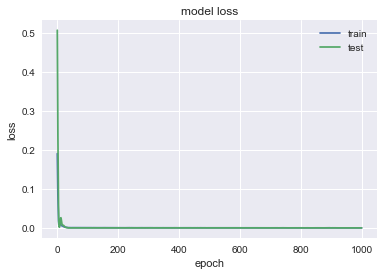

              CBRE
MSE       0.537374
MAE       0.588393
R2        0.944498
MAPE (%)   1.18747


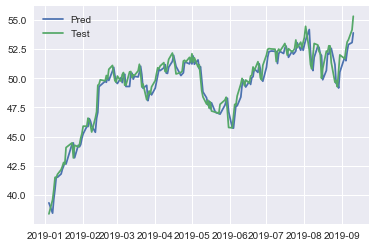

In [210]:
test = df["2019-01-04":].copy()
train = df[:"2019-01-04"].copy()
pred_gru_3 = pd.DataFrame(columns=df.columns,index = test.index)
for comp in companies:
    pred_gru_3[comp] = nn_forec_GRU(df,comp,first_layer = 128,second_layer=64).values

Predicting for  T
Train on 1008 samples, validate on 172 samples
Epoch 1/1000
0s - loss: 0.3170 - val_loss: 0.0505
Epoch 2/1000
0s - loss: 0.1888 - val_loss: 0.0185
Epoch 3/1000
0s - loss: 0.0895 - val_loss: 0.0042
Epoch 4/1000
0s - loss: 0.0254 - val_loss: 0.0153
Epoch 5/1000
0s - loss: 0.0104 - val_loss: 0.0383
Epoch 6/1000
0s - loss: 0.0208 - val_loss: 0.0384
Epoch 7/1000
0s - loss: 0.0167 - val_loss: 0.0216
Epoch 8/1000
0s - loss: 0.0078 - val_loss: 0.0092
Epoch 9/1000
0s - loss: 0.0074 - val_loss: 0.0045
Epoch 10/1000
0s - loss: 0.0101 - val_loss: 0.0035
Epoch 11/1000
0s - loss: 0.0097 - val_loss: 0.0040
Epoch 12/1000
0s - loss: 0.0065 - val_loss: 0.0057
Epoch 13/1000
0s - loss: 0.0043 - val_loss: 0.0072
Epoch 14/1000
0s - loss: 0.0038 - val_loss: 0.0070
Epoch 15/1000
0s - loss: 0.0034 - val_loss: 0.0052
Epoch 16/1000
0s - loss: 0.0031 - val_loss: 0.0034
Epoch 17/1000
0s - loss: 0.0028 - val_loss: 0.0023
Epoch 18/1000
0s - loss: 0.0028 - val_loss: 0.0019
Epoch 19/1000
0s - loss: 0

0s - loss: 0.0011 - val_loss: 5.4535e-04
Epoch 152/1000
0s - loss: 0.0012 - val_loss: 5.4446e-04
Epoch 153/1000
0s - loss: 0.0011 - val_loss: 5.3997e-04
Epoch 154/1000
0s - loss: 0.0010 - val_loss: 5.4961e-04
Epoch 155/1000
0s - loss: 0.0011 - val_loss: 5.5830e-04
Epoch 156/1000
0s - loss: 0.0011 - val_loss: 5.4054e-04
Epoch 157/1000
0s - loss: 0.0011 - val_loss: 5.3980e-04
Epoch 158/1000
0s - loss: 0.0011 - val_loss: 5.5460e-04
Epoch 159/1000
0s - loss: 0.0011 - val_loss: 5.4909e-04
Epoch 160/1000
0s - loss: 0.0011 - val_loss: 5.4082e-04
Epoch 161/1000
0s - loss: 0.0011 - val_loss: 5.4198e-04
Epoch 162/1000
0s - loss: 0.0011 - val_loss: 5.4228e-04
Epoch 163/1000
0s - loss: 0.0012 - val_loss: 5.4136e-04
Epoch 164/1000
0s - loss: 0.0011 - val_loss: 5.4670e-04
Epoch 165/1000
0s - loss: 0.0012 - val_loss: 5.5708e-04
Epoch 166/1000
0s - loss: 0.0011 - val_loss: 5.4165e-04
Epoch 167/1000
0s - loss: 0.0011 - val_loss: 5.4104e-04
Epoch 168/1000
0s - loss: 0.0010 - val_loss: 5.5065e-04
Epoch 1

0s - loss: 0.0011 - val_loss: 5.4081e-04
Epoch 297/1000
0s - loss: 0.0010 - val_loss: 5.4723e-04
Epoch 298/1000
0s - loss: 0.0010 - val_loss: 5.4144e-04
Epoch 299/1000
0s - loss: 0.0010 - val_loss: 5.4821e-04
Epoch 300/1000
0s - loss: 0.0010 - val_loss: 5.4095e-04
Epoch 301/1000
0s - loss: 9.8332e-04 - val_loss: 5.5942e-04
Epoch 302/1000
0s - loss: 0.0010 - val_loss: 5.4244e-04
Epoch 303/1000
0s - loss: 9.5604e-04 - val_loss: 5.5607e-04
Epoch 304/1000
0s - loss: 9.9700e-04 - val_loss: 5.4739e-04
Epoch 305/1000
0s - loss: 0.0011 - val_loss: 5.4013e-04
Epoch 306/1000
0s - loss: 0.0010 - val_loss: 5.4463e-04
Epoch 307/1000
0s - loss: 9.8015e-04 - val_loss: 5.4188e-04
Epoch 308/1000
0s - loss: 0.0010 - val_loss: 5.4286e-04
Epoch 309/1000
0s - loss: 9.9527e-04 - val_loss: 5.5437e-04
Epoch 310/1000
0s - loss: 9.6245e-04 - val_loss: 5.3917e-04
Epoch 311/1000
0s - loss: 0.0010 - val_loss: 5.6377e-04
Epoch 312/1000
0s - loss: 0.0010 - val_loss: 5.4199e-04
Epoch 313/1000
0s - loss: 9.9115e-04 - 

0s - loss: 0.0011 - val_loss: 5.4564e-04
Epoch 439/1000
0s - loss: 9.9603e-04 - val_loss: 6.2122e-04
Epoch 440/1000
0s - loss: 0.0010 - val_loss: 5.4240e-04
Epoch 441/1000
0s - loss: 0.0010 - val_loss: 6.1680e-04
Epoch 442/1000
0s - loss: 0.0011 - val_loss: 5.5349e-04
Epoch 443/1000
0s - loss: 9.5768e-04 - val_loss: 5.9478e-04
Epoch 444/1000
0s - loss: 0.0011 - val_loss: 5.4999e-04
Epoch 445/1000
0s - loss: 0.0010 - val_loss: 6.1022e-04
Epoch 446/1000
0s - loss: 0.0011 - val_loss: 5.4528e-04
Epoch 447/1000
0s - loss: 0.0010 - val_loss: 6.3699e-04
Epoch 448/1000
0s - loss: 0.0011 - val_loss: 5.5155e-04
Epoch 449/1000
0s - loss: 9.9966e-04 - val_loss: 6.0298e-04
Epoch 450/1000
0s - loss: 0.0010 - val_loss: 5.4152e-04
Epoch 451/1000
0s - loss: 9.5590e-04 - val_loss: 5.5379e-04
Epoch 452/1000
0s - loss: 9.3748e-04 - val_loss: 5.4263e-04
Epoch 453/1000
0s - loss: 9.5146e-04 - val_loss: 5.6957e-04
Epoch 454/1000
0s - loss: 9.4060e-04 - val_loss: 5.4204e-04
Epoch 455/1000
0s - loss: 9.6833e-0

0s - loss: 9.3423e-04 - val_loss: 5.3993e-04
Epoch 580/1000
0s - loss: 8.9608e-04 - val_loss: 5.5445e-04
Epoch 581/1000
0s - loss: 9.1799e-04 - val_loss: 5.5643e-04
Epoch 582/1000
0s - loss: 9.6511e-04 - val_loss: 5.4283e-04
Epoch 583/1000
0s - loss: 9.1970e-04 - val_loss: 5.7609e-04
Epoch 584/1000
0s - loss: 9.5097e-04 - val_loss: 5.4009e-04
Epoch 585/1000
0s - loss: 9.5307e-04 - val_loss: 5.8116e-04
Epoch 586/1000
0s - loss: 9.2581e-04 - val_loss: 5.4036e-04
Epoch 587/1000
0s - loss: 9.6930e-04 - val_loss: 5.9217e-04
Epoch 588/1000
0s - loss: 9.4113e-04 - val_loss: 5.4008e-04
Epoch 589/1000
0s - loss: 9.4393e-04 - val_loss: 5.7878e-04
Epoch 590/1000
0s - loss: 9.6808e-04 - val_loss: 5.4198e-04
Epoch 591/1000
0s - loss: 9.0746e-04 - val_loss: 5.7283e-04
Epoch 592/1000
0s - loss: 9.5693e-04 - val_loss: 5.4015e-04
Epoch 593/1000
0s - loss: 9.1300e-04 - val_loss: 5.8244e-04
Epoch 594/1000
0s - loss: 9.5619e-04 - val_loss: 5.3966e-04
Epoch 595/1000
0s - loss: 8.9706e-04 - val_loss: 5.4758

0s - loss: 0.0010 - val_loss: 5.4702e-04
Epoch 720/1000
0s - loss: 9.6858e-04 - val_loss: 6.2979e-04
Epoch 721/1000
0s - loss: 0.0010 - val_loss: 5.5483e-04
Epoch 722/1000
0s - loss: 9.8099e-04 - val_loss: 6.9440e-04
Epoch 723/1000
0s - loss: 0.0012 - val_loss: 6.1002e-04
Epoch 724/1000
0s - loss: 0.0011 - val_loss: 7.6494e-04
Epoch 725/1000
0s - loss: 0.0013 - val_loss: 6.1354e-04
Epoch 726/1000
0s - loss: 0.0012 - val_loss: 7.1058e-04
Epoch 727/1000
0s - loss: 0.0013 - val_loss: 6.0156e-04
Epoch 728/1000
0s - loss: 0.0011 - val_loss: 6.6904e-04
Epoch 729/1000
0s - loss: 0.0012 - val_loss: 5.7480e-04
Epoch 730/1000
0s - loss: 0.0011 - val_loss: 6.4635e-04
Epoch 731/1000
0s - loss: 0.0012 - val_loss: 5.4466e-04
Epoch 732/1000
0s - loss: 0.0010 - val_loss: 5.8043e-04
Epoch 733/1000
0s - loss: 9.7112e-04 - val_loss: 5.3968e-04
Epoch 734/1000
0s - loss: 9.1877e-04 - val_loss: 5.4313e-04
Epoch 735/1000
0s - loss: 8.7421e-04 - val_loss: 5.7272e-04
Epoch 736/1000
0s - loss: 8.9708e-04 - val_

0s - loss: 8.3076e-04 - val_loss: 5.4012e-04
Epoch 859/1000
0s - loss: 8.4979e-04 - val_loss: 5.6020e-04
Epoch 860/1000
0s - loss: 8.6271e-04 - val_loss: 5.4075e-04
Epoch 861/1000
0s - loss: 8.7251e-04 - val_loss: 5.6954e-04
Epoch 862/1000
0s - loss: 8.6373e-04 - val_loss: 5.4005e-04
Epoch 863/1000
0s - loss: 8.7731e-04 - val_loss: 6.1603e-04
Epoch 864/1000
0s - loss: 9.8461e-04 - val_loss: 5.4411e-04
Epoch 865/1000
0s - loss: 8.7993e-04 - val_loss: 6.1003e-04
Epoch 866/1000
0s - loss: 9.8851e-04 - val_loss: 5.7164e-04
Epoch 867/1000
0s - loss: 9.5814e-04 - val_loss: 6.9305e-04
Epoch 868/1000
0s - loss: 0.0010 - val_loss: 5.4399e-04
Epoch 869/1000
0s - loss: 9.9958e-04 - val_loss: 5.9225e-04
Epoch 870/1000
0s - loss: 9.5407e-04 - val_loss: 5.4179e-04
Epoch 871/1000
0s - loss: 8.9891e-04 - val_loss: 5.4840e-04
Epoch 872/1000
0s - loss: 8.5355e-04 - val_loss: 5.4319e-04
Epoch 873/1000
0s - loss: 8.6247e-04 - val_loss: 5.3920e-04
Epoch 874/1000
0s - loss: 8.4246e-04 - val_loss: 5.7177e-04

0s - loss: 0.0011 - val_loss: 5.8622e-04
Epoch 997/1000
0s - loss: 9.6605e-04 - val_loss: 6.8386e-04
Epoch 998/1000
0s - loss: 0.0011 - val_loss: 5.9375e-04
Epoch 999/1000
0s - loss: 0.0012 - val_loss: 7.3642e-04
Epoch 1000/1000
0s - loss: 0.0012 - val_loss: 6.5761e-04


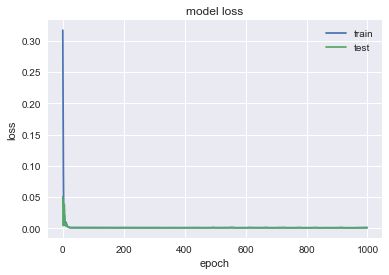

                 T
MSE       0.168348
MAE       0.307468
R2         0.94339
MAPE (%)  0.955837


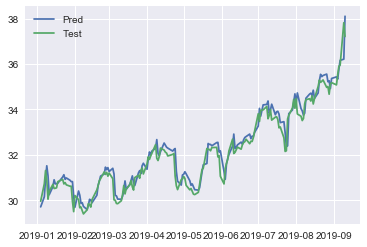

Predicting for  BBY
Train on 1008 samples, validate on 172 samples
Epoch 1/1000
0s - loss: 0.1987 - val_loss: 0.3526
Epoch 2/1000
0s - loss: 0.1209 - val_loss: 0.2051
Epoch 3/1000
0s - loss: 0.0582 - val_loss: 0.0845
Epoch 4/1000
0s - loss: 0.0186 - val_loss: 0.0141
Epoch 5/1000
0s - loss: 0.0124 - val_loss: 0.0024
Epoch 6/1000
0s - loss: 0.0272 - val_loss: 0.0085
Epoch 7/1000
0s - loss: 0.0286 - val_loss: 0.0031
Epoch 8/1000
0s - loss: 0.0177 - val_loss: 0.0018
Epoch 9/1000
0s - loss: 0.0108 - val_loss: 0.0081
Epoch 10/1000
0s - loss: 0.0085 - val_loss: 0.0114
Epoch 11/1000
0s - loss: 0.0068 - val_loss: 0.0081
Epoch 12/1000
0s - loss: 0.0046 - val_loss: 0.0029
Epoch 13/1000
0s - loss: 0.0032 - val_loss: 7.0274e-04
Epoch 14/1000
0s - loss: 0.0033 - val_loss: 6.9893e-04
Epoch 15/1000
0s - loss: 0.0031 - val_loss: 6.2077e-04
Epoch 16/1000
0s - loss: 0.0019 - val_loss: 6.7044e-04
Epoch 17/1000
0s - loss: 0.0013 - val_loss: 0.0011
Epoch 18/1000
0s - loss: 0.0011 - val_loss: 0.0011
Epoch 19

0s - loss: 6.7254e-04 - val_loss: 6.6092e-04
Epoch 142/1000
0s - loss: 7.4786e-04 - val_loss: 6.2148e-04
Epoch 143/1000
0s - loss: 6.8099e-04 - val_loss: 6.1039e-04
Epoch 144/1000
0s - loss: 7.3071e-04 - val_loss: 6.5859e-04
Epoch 145/1000
0s - loss: 7.2622e-04 - val_loss: 6.2305e-04
Epoch 146/1000
0s - loss: 6.7389e-04 - val_loss: 6.0946e-04
Epoch 147/1000
0s - loss: 7.5868e-04 - val_loss: 6.0732e-04
Epoch 148/1000
0s - loss: 7.2630e-04 - val_loss: 6.7549e-04
Epoch 149/1000
0s - loss: 6.9691e-04 - val_loss: 6.3346e-04
Epoch 150/1000
0s - loss: 7.0670e-04 - val_loss: 6.0541e-04
Epoch 151/1000
0s - loss: 7.7423e-04 - val_loss: 6.0647e-04
Epoch 152/1000
0s - loss: 7.2961e-04 - val_loss: 6.6982e-04
Epoch 153/1000
0s - loss: 7.6962e-04 - val_loss: 6.2491e-04
Epoch 154/1000
0s - loss: 7.3246e-04 - val_loss: 6.0904e-04
Epoch 155/1000
0s - loss: 7.3696e-04 - val_loss: 6.1322e-04
Epoch 156/1000
0s - loss: 7.1770e-04 - val_loss: 6.2082e-04
Epoch 157/1000
0s - loss: 7.3153e-04 - val_loss: 6.2803

0s - loss: 6.5854e-04 - val_loss: 5.9230e-04
Epoch 279/1000
0s - loss: 6.1685e-04 - val_loss: 6.0029e-04
Epoch 280/1000
0s - loss: 5.8754e-04 - val_loss: 6.2361e-04
Epoch 281/1000
0s - loss: 6.4003e-04 - val_loss: 6.1426e-04
Epoch 282/1000
0s - loss: 6.9571e-04 - val_loss: 6.0761e-04
Epoch 283/1000
0s - loss: 6.4436e-04 - val_loss: 5.9116e-04
Epoch 284/1000
0s - loss: 6.5871e-04 - val_loss: 6.1859e-04
Epoch 285/1000
0s - loss: 6.0982e-04 - val_loss: 5.9938e-04
Epoch 286/1000
0s - loss: 6.5551e-04 - val_loss: 6.4962e-04
Epoch 287/1000
0s - loss: 6.6906e-04 - val_loss: 5.9118e-04
Epoch 288/1000
0s - loss: 6.7833e-04 - val_loss: 5.9778e-04
Epoch 289/1000
0s - loss: 7.4073e-04 - val_loss: 6.4976e-04
Epoch 290/1000
0s - loss: 6.6923e-04 - val_loss: 5.9392e-04
Epoch 291/1000
0s - loss: 6.6201e-04 - val_loss: 6.1708e-04
Epoch 292/1000
0s - loss: 6.1433e-04 - val_loss: 6.0111e-04
Epoch 293/1000
0s - loss: 6.1544e-04 - val_loss: 5.9479e-04
Epoch 294/1000
0s - loss: 6.6101e-04 - val_loss: 6.1889

0s - loss: 6.7914e-04 - val_loss: 6.0207e-04
Epoch 416/1000
0s - loss: 6.8921e-04 - val_loss: 5.8846e-04
Epoch 417/1000
0s - loss: 6.4266e-04 - val_loss: 6.0692e-04
Epoch 418/1000
0s - loss: 5.9569e-04 - val_loss: 5.8584e-04
Epoch 419/1000
0s - loss: 6.6793e-04 - val_loss: 6.3075e-04
Epoch 420/1000
0s - loss: 6.4873e-04 - val_loss: 5.9261e-04
Epoch 421/1000
0s - loss: 6.6055e-04 - val_loss: 6.1840e-04
Epoch 422/1000
0s - loss: 6.4954e-04 - val_loss: 5.9199e-04
Epoch 423/1000
0s - loss: 5.7650e-04 - val_loss: 6.0661e-04
Epoch 424/1000
0s - loss: 6.0773e-04 - val_loss: 5.8939e-04
Epoch 425/1000
0s - loss: 5.8077e-04 - val_loss: 6.0763e-04
Epoch 426/1000
0s - loss: 5.9776e-04 - val_loss: 5.9677e-04
Epoch 427/1000
0s - loss: 6.2865e-04 - val_loss: 5.8948e-04
Epoch 428/1000
0s - loss: 5.8748e-04 - val_loss: 5.9029e-04
Epoch 429/1000
0s - loss: 6.0341e-04 - val_loss: 6.0413e-04
Epoch 430/1000
0s - loss: 6.1690e-04 - val_loss: 5.9150e-04
Epoch 431/1000
0s - loss: 6.3107e-04 - val_loss: 5.8821

0s - loss: 6.7980e-04 - val_loss: 6.6068e-04
Epoch 553/1000
0s - loss: 6.3512e-04 - val_loss: 5.8583e-04
Epoch 554/1000
0s - loss: 7.1063e-04 - val_loss: 5.9364e-04
Epoch 555/1000
0s - loss: 7.2782e-04 - val_loss: 5.8861e-04
Epoch 556/1000
0s - loss: 7.5304e-04 - val_loss: 6.1451e-04
Epoch 557/1000
0s - loss: 7.8549e-04 - val_loss: 6.2541e-04
Epoch 558/1000
0s - loss: 7.7297e-04 - val_loss: 6.5608e-04
Epoch 559/1000
0s - loss: 5.9626e-04 - val_loss: 6.0795e-04
Epoch 560/1000
0s - loss: 6.9344e-04 - val_loss: 5.9850e-04
Epoch 561/1000
0s - loss: 6.9413e-04 - val_loss: 5.9060e-04
Epoch 562/1000
0s - loss: 7.7963e-04 - val_loss: 6.1589e-04
Epoch 563/1000
0s - loss: 7.1898e-04 - val_loss: 5.8547e-04
Epoch 564/1000
0s - loss: 7.4344e-04 - val_loss: 6.3930e-04
Epoch 565/1000
0s - loss: 6.8048e-04 - val_loss: 5.9409e-04
Epoch 566/1000
0s - loss: 6.3601e-04 - val_loss: 7.1981e-04
Epoch 567/1000
0s - loss: 5.5651e-04 - val_loss: 5.9107e-04
Epoch 568/1000
0s - loss: 6.1788e-04 - val_loss: 5.8683

0s - loss: 5.6832e-04 - val_loss: 5.8945e-04
Epoch 690/1000
0s - loss: 5.3662e-04 - val_loss: 6.1094e-04
Epoch 691/1000
0s - loss: 5.2093e-04 - val_loss: 5.8815e-04
Epoch 692/1000
0s - loss: 5.3524e-04 - val_loss: 5.8891e-04
Epoch 693/1000
0s - loss: 5.4738e-04 - val_loss: 6.1617e-04
Epoch 694/1000
0s - loss: 6.5793e-04 - val_loss: 6.2343e-04
Epoch 695/1000
0s - loss: 6.1594e-04 - val_loss: 5.8973e-04
Epoch 696/1000
0s - loss: 5.4805e-04 - val_loss: 6.1098e-04
Epoch 697/1000
0s - loss: 5.9966e-04 - val_loss: 5.9463e-04
Epoch 698/1000
0s - loss: 5.4305e-04 - val_loss: 5.8775e-04
Epoch 699/1000
0s - loss: 5.6990e-04 - val_loss: 6.0418e-04
Epoch 700/1000
0s - loss: 5.3026e-04 - val_loss: 5.8818e-04
Epoch 701/1000
0s - loss: 5.6558e-04 - val_loss: 5.9151e-04
Epoch 702/1000
0s - loss: 6.0542e-04 - val_loss: 6.1561e-04
Epoch 703/1000
0s - loss: 5.3969e-04 - val_loss: 5.9047e-04
Epoch 704/1000
0s - loss: 5.5289e-04 - val_loss: 5.8837e-04
Epoch 705/1000
0s - loss: 5.8111e-04 - val_loss: 5.9162

0s - loss: 6.3078e-04 - val_loss: 5.8677e-04
Epoch 827/1000
0s - loss: 6.3796e-04 - val_loss: 6.4936e-04
Epoch 828/1000
0s - loss: 5.4704e-04 - val_loss: 5.8670e-04
Epoch 829/1000
0s - loss: 5.4081e-04 - val_loss: 6.3008e-04
Epoch 830/1000
0s - loss: 5.6287e-04 - val_loss: 5.9182e-04
Epoch 831/1000
0s - loss: 5.5900e-04 - val_loss: 5.9083e-04
Epoch 832/1000
0s - loss: 5.4231e-04 - val_loss: 5.8813e-04
Epoch 833/1000
0s - loss: 5.2054e-04 - val_loss: 5.9595e-04
Epoch 834/1000
0s - loss: 5.2769e-04 - val_loss: 5.8705e-04
Epoch 835/1000
0s - loss: 5.6870e-04 - val_loss: 5.9072e-04
Epoch 836/1000
0s - loss: 5.2295e-04 - val_loss: 6.0533e-04
Epoch 837/1000
0s - loss: 5.5638e-04 - val_loss: 5.9682e-04
Epoch 838/1000
0s - loss: 5.3054e-04 - val_loss: 6.2468e-04
Epoch 839/1000
0s - loss: 6.1032e-04 - val_loss: 5.8828e-04
Epoch 840/1000
0s - loss: 7.3529e-04 - val_loss: 5.9164e-04
Epoch 841/1000
0s - loss: 7.4673e-04 - val_loss: 6.3778e-04
Epoch 842/1000
0s - loss: 6.1772e-04 - val_loss: 5.9556

0s - loss: 5.3874e-04 - val_loss: 6.0221e-04
Epoch 964/1000
0s - loss: 4.7770e-04 - val_loss: 5.9728e-04
Epoch 965/1000
0s - loss: 5.7884e-04 - val_loss: 5.8965e-04
Epoch 966/1000
0s - loss: 5.3368e-04 - val_loss: 6.1403e-04
Epoch 967/1000
0s - loss: 5.5555e-04 - val_loss: 5.8846e-04
Epoch 968/1000
0s - loss: 5.6568e-04 - val_loss: 5.9412e-04
Epoch 969/1000
0s - loss: 5.6322e-04 - val_loss: 6.3259e-04
Epoch 970/1000
0s - loss: 5.5270e-04 - val_loss: 5.9365e-04
Epoch 971/1000
0s - loss: 5.2292e-04 - val_loss: 6.3684e-04
Epoch 972/1000
0s - loss: 5.8200e-04 - val_loss: 5.9473e-04
Epoch 973/1000
0s - loss: 5.2280e-04 - val_loss: 5.8998e-04
Epoch 974/1000
0s - loss: 5.2057e-04 - val_loss: 6.2042e-04
Epoch 975/1000
0s - loss: 5.0026e-04 - val_loss: 5.9147e-04
Epoch 976/1000
0s - loss: 5.0077e-04 - val_loss: 6.0478e-04
Epoch 977/1000
0s - loss: 5.0009e-04 - val_loss: 5.9940e-04
Epoch 978/1000
0s - loss: 5.9819e-04 - val_loss: 6.5834e-04
Epoch 979/1000
0s - loss: 7.7825e-04 - val_loss: 5.8827

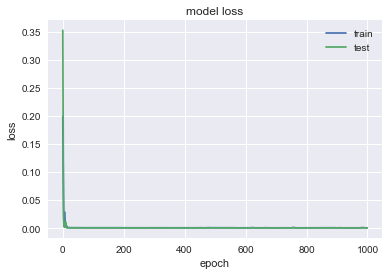

               BBY
MSE        1.96464
MAE       0.921442
R2        0.943159
MAPE (%)   1.37267


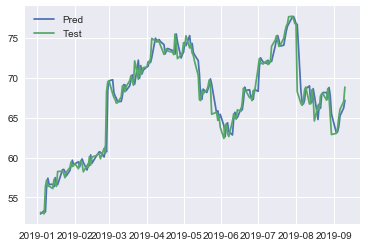

Predicting for  KO
Train on 1008 samples, validate on 172 samples
Epoch 1/1000
0s - loss: 0.0944 - val_loss: 0.2658
Epoch 2/1000
0s - loss: 0.0399 - val_loss: 0.1187
Epoch 3/1000
0s - loss: 0.0079 - val_loss: 0.0273
Epoch 4/1000
0s - loss: 0.0055 - val_loss: 0.0042
Epoch 5/1000
0s - loss: 0.0161 - val_loss: 0.0037
Epoch 6/1000
0s - loss: 0.0122 - val_loss: 0.0096
Epoch 7/1000
0s - loss: 0.0056 - val_loss: 0.0244
Epoch 8/1000
0s - loss: 0.0043 - val_loss: 0.0322
Epoch 9/1000
0s - loss: 0.0039 - val_loss: 0.0263
Epoch 10/1000
0s - loss: 0.0027 - val_loss: 0.0147
Epoch 11/1000
0s - loss: 0.0023 - val_loss: 0.0070
Epoch 12/1000
0s - loss: 0.0030 - val_loss: 0.0047
Epoch 13/1000
0s - loss: 0.0030 - val_loss: 0.0054
Epoch 14/1000
0s - loss: 0.0022 - val_loss: 0.0070
Epoch 15/1000
0s - loss: 0.0016 - val_loss: 0.0069
Epoch 16/1000
0s - loss: 0.0013 - val_loss: 0.0049
Epoch 17/1000
0s - loss: 0.0012 - val_loss: 0.0027
Epoch 18/1000
0s - loss: 0.0011 - val_loss: 0.0017
Epoch 19/1000
0s - loss: 

0s - loss: 6.4493e-04 - val_loss: 7.1582e-04
Epoch 143/1000
0s - loss: 6.7399e-04 - val_loss: 7.7536e-04
Epoch 144/1000
0s - loss: 6.6515e-04 - val_loss: 7.5285e-04
Epoch 145/1000
0s - loss: 6.4057e-04 - val_loss: 7.2329e-04
Epoch 146/1000
0s - loss: 6.6501e-04 - val_loss: 7.4236e-04
Epoch 147/1000
0s - loss: 6.0356e-04 - val_loss: 7.3114e-04
Epoch 148/1000
0s - loss: 6.4904e-04 - val_loss: 7.4498e-04
Epoch 149/1000
0s - loss: 6.6774e-04 - val_loss: 7.4598e-04
Epoch 150/1000
0s - loss: 6.0861e-04 - val_loss: 7.2241e-04
Epoch 151/1000
0s - loss: 6.3698e-04 - val_loss: 7.6781e-04
Epoch 152/1000
0s - loss: 6.4502e-04 - val_loss: 7.4214e-04
Epoch 153/1000
0s - loss: 6.1617e-04 - val_loss: 7.1781e-04
Epoch 154/1000
0s - loss: 6.4652e-04 - val_loss: 7.5931e-04
Epoch 155/1000
0s - loss: 6.2351e-04 - val_loss: 7.5746e-04
Epoch 156/1000
0s - loss: 6.3396e-04 - val_loss: 7.1471e-04
Epoch 157/1000
0s - loss: 6.7720e-04 - val_loss: 7.7884e-04
Epoch 158/1000
0s - loss: 6.3487e-04 - val_loss: 7.2911

0s - loss: 5.7592e-04 - val_loss: 8.0534e-04
Epoch 281/1000
0s - loss: 6.1396e-04 - val_loss: 7.6052e-04
Epoch 282/1000
0s - loss: 6.5152e-04 - val_loss: 7.2919e-04
Epoch 283/1000
0s - loss: 6.0165e-04 - val_loss: 7.9523e-04
Epoch 284/1000
0s - loss: 6.7796e-04 - val_loss: 7.1803e-04
Epoch 285/1000
0s - loss: 6.1357e-04 - val_loss: 7.5266e-04
Epoch 286/1000
0s - loss: 6.2592e-04 - val_loss: 7.2560e-04
Epoch 287/1000
0s - loss: 5.9965e-04 - val_loss: 7.4016e-04
Epoch 288/1000
0s - loss: 5.9314e-04 - val_loss: 7.1866e-04
Epoch 289/1000
0s - loss: 5.7781e-04 - val_loss: 7.2650e-04
Epoch 290/1000
0s - loss: 6.0516e-04 - val_loss: 7.3962e-04
Epoch 291/1000
0s - loss: 6.1910e-04 - val_loss: 7.4218e-04
Epoch 292/1000
0s - loss: 6.1735e-04 - val_loss: 7.4000e-04
Epoch 293/1000
0s - loss: 6.2239e-04 - val_loss: 7.9792e-04
Epoch 294/1000
0s - loss: 5.7097e-04 - val_loss: 7.3963e-04
Epoch 295/1000
0s - loss: 6.0860e-04 - val_loss: 7.7963e-04
Epoch 296/1000
0s - loss: 6.2005e-04 - val_loss: 7.1715

0s - loss: 6.0647e-04 - val_loss: 7.6272e-04
Epoch 419/1000
0s - loss: 6.0266e-04 - val_loss: 7.9852e-04
Epoch 420/1000
0s - loss: 6.1112e-04 - val_loss: 8.4039e-04
Epoch 421/1000
0s - loss: 6.0393e-04 - val_loss: 7.6405e-04
Epoch 422/1000
0s - loss: 5.9737e-04 - val_loss: 8.2003e-04
Epoch 423/1000
0s - loss: 5.7310e-04 - val_loss: 7.1192e-04
Epoch 424/1000
0s - loss: 6.0198e-04 - val_loss: 8.2871e-04
Epoch 425/1000
0s - loss: 6.2466e-04 - val_loss: 7.2836e-04
Epoch 426/1000
0s - loss: 6.1057e-04 - val_loss: 8.2996e-04
Epoch 427/1000
0s - loss: 6.2137e-04 - val_loss: 8.0425e-04
Epoch 428/1000
0s - loss: 6.0621e-04 - val_loss: 7.9975e-04
Epoch 429/1000
0s - loss: 5.9684e-04 - val_loss: 8.1480e-04
Epoch 430/1000
0s - loss: 6.2831e-04 - val_loss: 7.2681e-04
Epoch 431/1000
0s - loss: 5.8516e-04 - val_loss: 7.9909e-04
Epoch 432/1000
0s - loss: 5.7601e-04 - val_loss: 7.3183e-04
Epoch 433/1000
0s - loss: 5.8842e-04 - val_loss: 7.7022e-04
Epoch 434/1000
0s - loss: 5.8344e-04 - val_loss: 7.5258

0s - loss: 6.0821e-04 - val_loss: 8.8079e-04
Epoch 556/1000
0s - loss: 6.1045e-04 - val_loss: 7.6558e-04
Epoch 557/1000
0s - loss: 5.7571e-04 - val_loss: 8.0435e-04
Epoch 558/1000
0s - loss: 5.7758e-04 - val_loss: 7.5984e-04
Epoch 559/1000
0s - loss: 5.7836e-04 - val_loss: 8.2395e-04
Epoch 560/1000
0s - loss: 5.7936e-04 - val_loss: 7.9794e-04
Epoch 561/1000
0s - loss: 5.5993e-04 - val_loss: 8.5194e-04
Epoch 562/1000
0s - loss: 5.7819e-04 - val_loss: 8.4507e-04
Epoch 563/1000
0s - loss: 5.8352e-04 - val_loss: 8.4730e-04
Epoch 564/1000
0s - loss: 5.8684e-04 - val_loss: 8.4040e-04
Epoch 565/1000
0s - loss: 5.7453e-04 - val_loss: 8.1239e-04
Epoch 566/1000
0s - loss: 5.7837e-04 - val_loss: 8.0825e-04
Epoch 567/1000
0s - loss: 5.9334e-04 - val_loss: 7.7697e-04
Epoch 568/1000
0s - loss: 6.0200e-04 - val_loss: 7.9114e-04
Epoch 569/1000
0s - loss: 5.8464e-04 - val_loss: 7.8815e-04
Epoch 570/1000
0s - loss: 6.3126e-04 - val_loss: 7.8722e-04
Epoch 571/1000
0s - loss: 6.2130e-04 - val_loss: 8.2128

0s - loss: 5.5624e-04 - val_loss: 8.0351e-04
Epoch 693/1000
0s - loss: 5.7377e-04 - val_loss: 8.2961e-04
Epoch 694/1000
0s - loss: 5.7240e-04 - val_loss: 8.2160e-04
Epoch 695/1000
0s - loss: 5.6453e-04 - val_loss: 7.8704e-04
Epoch 696/1000
0s - loss: 5.6149e-04 - val_loss: 7.6321e-04
Epoch 697/1000
0s - loss: 6.0377e-04 - val_loss: 8.1064e-04
Epoch 698/1000
0s - loss: 5.7201e-04 - val_loss: 7.8917e-04
Epoch 699/1000
0s - loss: 6.2600e-04 - val_loss: 8.7081e-04
Epoch 700/1000
0s - loss: 6.0500e-04 - val_loss: 8.8388e-04
Epoch 701/1000
0s - loss: 5.6689e-04 - val_loss: 8.0346e-04
Epoch 702/1000
0s - loss: 5.8776e-04 - val_loss: 8.3312e-04
Epoch 703/1000
0s - loss: 5.7500e-04 - val_loss: 7.7341e-04
Epoch 704/1000
0s - loss: 5.7472e-04 - val_loss: 8.2822e-04
Epoch 705/1000
0s - loss: 6.0490e-04 - val_loss: 8.2471e-04
Epoch 706/1000
0s - loss: 6.1692e-04 - val_loss: 8.4596e-04
Epoch 707/1000
0s - loss: 5.8091e-04 - val_loss: 7.8974e-04
Epoch 708/1000
0s - loss: 6.0059e-04 - val_loss: 8.5392

0s - loss: 5.4414e-04 - val_loss: 8.3282e-04
Epoch 830/1000
0s - loss: 5.2285e-04 - val_loss: 7.5162e-04
Epoch 831/1000
0s - loss: 5.7913e-04 - val_loss: 7.7151e-04
Epoch 832/1000
0s - loss: 5.7914e-04 - val_loss: 7.4193e-04
Epoch 833/1000
0s - loss: 5.6578e-04 - val_loss: 7.5187e-04
Epoch 834/1000
0s - loss: 5.5407e-04 - val_loss: 7.6522e-04
Epoch 835/1000
0s - loss: 5.6383e-04 - val_loss: 8.5781e-04
Epoch 836/1000
0s - loss: 5.8272e-04 - val_loss: 8.4246e-04
Epoch 837/1000
0s - loss: 5.8520e-04 - val_loss: 8.0886e-04
Epoch 838/1000
0s - loss: 5.6309e-04 - val_loss: 7.4938e-04
Epoch 839/1000
0s - loss: 6.0326e-04 - val_loss: 7.6086e-04
Epoch 840/1000
0s - loss: 6.1482e-04 - val_loss: 8.1515e-04
Epoch 841/1000
0s - loss: 6.0491e-04 - val_loss: 7.7092e-04
Epoch 842/1000
0s - loss: 5.6358e-04 - val_loss: 8.1599e-04
Epoch 843/1000
0s - loss: 5.7165e-04 - val_loss: 7.6747e-04
Epoch 844/1000
0s - loss: 5.8405e-04 - val_loss: 8.2840e-04
Epoch 845/1000
0s - loss: 5.8093e-04 - val_loss: 7.7880

0s - loss: 6.2522e-04 - val_loss: 8.7839e-04
Epoch 967/1000
0s - loss: 5.9936e-04 - val_loss: 8.0143e-04
Epoch 968/1000
0s - loss: 5.9813e-04 - val_loss: 8.1770e-04
Epoch 969/1000
0s - loss: 6.0118e-04 - val_loss: 7.3502e-04
Epoch 970/1000
0s - loss: 6.0663e-04 - val_loss: 8.0655e-04
Epoch 971/1000
0s - loss: 6.1223e-04 - val_loss: 7.6326e-04
Epoch 972/1000
0s - loss: 5.8714e-04 - val_loss: 8.5727e-04
Epoch 973/1000
0s - loss: 5.6218e-04 - val_loss: 7.5405e-04
Epoch 974/1000
0s - loss: 5.7505e-04 - val_loss: 8.7285e-04
Epoch 975/1000
0s - loss: 5.3674e-04 - val_loss: 7.4261e-04
Epoch 976/1000
0s - loss: 5.4657e-04 - val_loss: 8.2471e-04
Epoch 977/1000
0s - loss: 5.2813e-04 - val_loss: 7.2454e-04
Epoch 978/1000
0s - loss: 5.4396e-04 - val_loss: 8.0016e-04
Epoch 979/1000
0s - loss: 5.6045e-04 - val_loss: 7.6416e-04
Epoch 980/1000
0s - loss: 5.4463e-04 - val_loss: 8.1335e-04
Epoch 981/1000
0s - loss: 5.6066e-04 - val_loss: 7.9465e-04
Epoch 982/1000
0s - loss: 5.3520e-04 - val_loss: 7.6188

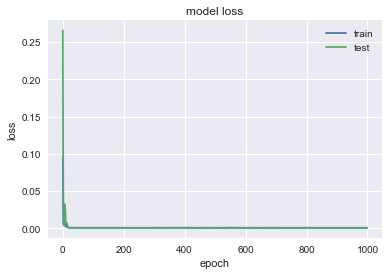

                KO
MSE        0.26731
MAE       0.375583
R2         0.96855
MAPE (%)  0.751974


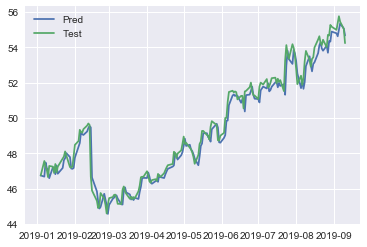

Predicting for  FTI
Train on 1008 samples, validate on 172 samples
Epoch 1/1000
0s - loss: 0.2022 - val_loss: 0.0127
Epoch 2/1000
0s - loss: 0.1070 - val_loss: 0.0016
Epoch 3/1000
0s - loss: 0.0402 - val_loss: 0.0078
Epoch 4/1000
0s - loss: 0.0107 - val_loss: 0.0304
Epoch 5/1000
0s - loss: 0.0160 - val_loss: 0.0370
Epoch 6/1000
0s - loss: 0.0147 - val_loss: 0.0222
Epoch 7/1000
0s - loss: 0.0054 - val_loss: 0.0091
Epoch 8/1000
0s - loss: 0.0041 - val_loss: 0.0038
Epoch 9/1000
0s - loss: 0.0072 - val_loss: 0.0028
Epoch 10/1000
0s - loss: 0.0072 - val_loss: 0.0037
Epoch 11/1000
0s - loss: 0.0051 - val_loss: 0.0059
Epoch 12/1000
0s - loss: 0.0033 - val_loss: 0.0076
Epoch 13/1000
0s - loss: 0.0031 - val_loss: 0.0068
Epoch 14/1000
0s - loss: 0.0026 - val_loss: 0.0044
Epoch 15/1000
0s - loss: 0.0020 - val_loss: 0.0025
Epoch 16/1000
0s - loss: 0.0020 - val_loss: 0.0017
Epoch 17/1000
0s - loss: 0.0020 - val_loss: 0.0016
Epoch 18/1000
0s - loss: 0.0018 - val_loss: 0.0017
Epoch 19/1000
0s - loss:

0s - loss: 9.5362e-04 - val_loss: 3.3082e-04
Epoch 143/1000
0s - loss: 9.5173e-04 - val_loss: 3.2960e-04
Epoch 144/1000
0s - loss: 9.1349e-04 - val_loss: 3.2887e-04
Epoch 145/1000
0s - loss: 9.4411e-04 - val_loss: 3.2877e-04
Epoch 146/1000
0s - loss: 9.3060e-04 - val_loss: 3.3013e-04
Epoch 147/1000
0s - loss: 9.1009e-04 - val_loss: 3.3623e-04
Epoch 148/1000
0s - loss: 9.0454e-04 - val_loss: 3.2769e-04
Epoch 149/1000
0s - loss: 9.0858e-04 - val_loss: 3.2772e-04
Epoch 150/1000
0s - loss: 9.0213e-04 - val_loss: 3.3483e-04
Epoch 151/1000
0s - loss: 8.9582e-04 - val_loss: 3.3155e-04
Epoch 152/1000
0s - loss: 9.3904e-04 - val_loss: 3.2895e-04
Epoch 153/1000
0s - loss: 9.4055e-04 - val_loss: 3.2958e-04
Epoch 154/1000
0s - loss: 8.8071e-04 - val_loss: 3.3083e-04
Epoch 155/1000
0s - loss: 9.1140e-04 - val_loss: 3.3019e-04
Epoch 156/1000
0s - loss: 9.1408e-04 - val_loss: 3.3183e-04
Epoch 157/1000
0s - loss: 9.0702e-04 - val_loss: 3.3054e-04
Epoch 158/1000
0s - loss: 9.6161e-04 - val_loss: 3.3073

0s - loss: 8.4182e-04 - val_loss: 3.4341e-04
Epoch 281/1000
0s - loss: 8.4492e-04 - val_loss: 3.3914e-04
Epoch 282/1000
0s - loss: 8.1478e-04 - val_loss: 3.3786e-04
Epoch 283/1000
0s - loss: 8.5031e-04 - val_loss: 3.4229e-04
Epoch 284/1000
0s - loss: 8.8128e-04 - val_loss: 3.3908e-04
Epoch 285/1000
0s - loss: 7.9073e-04 - val_loss: 3.3889e-04
Epoch 286/1000
0s - loss: 8.3300e-04 - val_loss: 3.4629e-04
Epoch 287/1000
0s - loss: 8.8682e-04 - val_loss: 3.3763e-04
Epoch 288/1000
0s - loss: 9.0127e-04 - val_loss: 3.4546e-04
Epoch 289/1000
0s - loss: 8.6821e-04 - val_loss: 3.4081e-04
Epoch 290/1000
0s - loss: 8.2713e-04 - val_loss: 3.3732e-04
Epoch 291/1000
0s - loss: 9.1595e-04 - val_loss: 3.4221e-04
Epoch 292/1000
0s - loss: 8.8103e-04 - val_loss: 3.3583e-04
Epoch 293/1000
0s - loss: 9.1435e-04 - val_loss: 3.3681e-04
Epoch 294/1000
0s - loss: 8.9745e-04 - val_loss: 3.4202e-04
Epoch 295/1000
0s - loss: 8.4535e-04 - val_loss: 3.3824e-04
Epoch 296/1000
0s - loss: 8.4730e-04 - val_loss: 3.4604

0s - loss: 8.5503e-04 - val_loss: 3.4080e-04
Epoch 418/1000
0s - loss: 8.4895e-04 - val_loss: 3.4795e-04
Epoch 419/1000
0s - loss: 8.7777e-04 - val_loss: 3.4039e-04
Epoch 420/1000
0s - loss: 8.1535e-04 - val_loss: 3.7109e-04
Epoch 421/1000
0s - loss: 8.9966e-04 - val_loss: 3.4632e-04
Epoch 422/1000
0s - loss: 8.4911e-04 - val_loss: 3.8670e-04
Epoch 423/1000
0s - loss: 9.0205e-04 - val_loss: 3.4405e-04
Epoch 424/1000
0s - loss: 8.0051e-04 - val_loss: 3.6193e-04
Epoch 425/1000
0s - loss: 8.4253e-04 - val_loss: 3.4549e-04
Epoch 426/1000
0s - loss: 7.9943e-04 - val_loss: 3.6883e-04
Epoch 427/1000
0s - loss: 8.9401e-04 - val_loss: 3.4649e-04
Epoch 428/1000
0s - loss: 8.0832e-04 - val_loss: 3.6095e-04
Epoch 429/1000
0s - loss: 8.2575e-04 - val_loss: 3.3987e-04
Epoch 430/1000
0s - loss: 8.2533e-04 - val_loss: 3.4810e-04
Epoch 431/1000
0s - loss: 8.5638e-04 - val_loss: 3.4335e-04
Epoch 432/1000
0s - loss: 8.0057e-04 - val_loss: 3.7144e-04
Epoch 433/1000
0s - loss: 7.9598e-04 - val_loss: 3.5067

0s - loss: 8.2886e-04 - val_loss: 3.5097e-04
Epoch 556/1000
0s - loss: 7.7475e-04 - val_loss: 3.8539e-04
Epoch 557/1000
0s - loss: 8.4977e-04 - val_loss: 3.4398e-04
Epoch 558/1000
0s - loss: 7.7232e-04 - val_loss: 3.6789e-04
Epoch 559/1000
0s - loss: 8.3197e-04 - val_loss: 3.4571e-04
Epoch 560/1000
0s - loss: 7.6918e-04 - val_loss: 3.4425e-04
Epoch 561/1000
0s - loss: 7.9447e-04 - val_loss: 3.4195e-04
Epoch 562/1000
0s - loss: 8.1038e-04 - val_loss: 3.4363e-04
Epoch 563/1000
0s - loss: 8.2360e-04 - val_loss: 3.4120e-04
Epoch 564/1000
0s - loss: 7.8156e-04 - val_loss: 3.3867e-04
Epoch 565/1000
0s - loss: 7.8621e-04 - val_loss: 3.3762e-04
Epoch 566/1000
0s - loss: 7.5872e-04 - val_loss: 3.4106e-04
Epoch 567/1000
0s - loss: 8.3001e-04 - val_loss: 3.4640e-04
Epoch 568/1000
0s - loss: 7.7194e-04 - val_loss: 3.5769e-04
Epoch 569/1000
0s - loss: 8.1543e-04 - val_loss: 3.4379e-04
Epoch 570/1000
0s - loss: 7.9270e-04 - val_loss: 3.5447e-04
Epoch 571/1000
0s - loss: 7.9060e-04 - val_loss: 3.4121

0s - loss: 8.1920e-04 - val_loss: 3.9384e-04
Epoch 694/1000
0s - loss: 8.9155e-04 - val_loss: 3.5707e-04
Epoch 695/1000
0s - loss: 8.4988e-04 - val_loss: 4.1531e-04
Epoch 696/1000
0s - loss: 8.5458e-04 - val_loss: 3.7733e-04
Epoch 697/1000
0s - loss: 8.6330e-04 - val_loss: 4.0879e-04
Epoch 698/1000
0s - loss: 9.1161e-04 - val_loss: 3.8589e-04
Epoch 699/1000
0s - loss: 8.1335e-04 - val_loss: 4.4420e-04
Epoch 700/1000
0s - loss: 8.7534e-04 - val_loss: 3.6465e-04
Epoch 701/1000
0s - loss: 8.3088e-04 - val_loss: 3.9216e-04
Epoch 702/1000
0s - loss: 8.5932e-04 - val_loss: 3.5621e-04
Epoch 703/1000
0s - loss: 7.7598e-04 - val_loss: 3.8502e-04
Epoch 704/1000
0s - loss: 8.8537e-04 - val_loss: 3.5776e-04
Epoch 705/1000
0s - loss: 8.3334e-04 - val_loss: 4.0996e-04
Epoch 706/1000
0s - loss: 8.7981e-04 - val_loss: 3.6189e-04
Epoch 707/1000
0s - loss: 8.4033e-04 - val_loss: 4.1807e-04
Epoch 708/1000
0s - loss: 8.2539e-04 - val_loss: 3.6924e-04
Epoch 709/1000
0s - loss: 7.9593e-04 - val_loss: 4.1640

0s - loss: 7.3728e-04 - val_loss: 3.4210e-04
Epoch 832/1000
0s - loss: 7.3973e-04 - val_loss: 3.3906e-04
Epoch 833/1000
0s - loss: 7.4379e-04 - val_loss: 3.4004e-04
Epoch 834/1000
0s - loss: 7.7578e-04 - val_loss: 3.4118e-04
Epoch 835/1000
0s - loss: 7.3884e-04 - val_loss: 3.4912e-04
Epoch 836/1000
0s - loss: 7.9910e-04 - val_loss: 3.4168e-04
Epoch 837/1000
0s - loss: 7.7280e-04 - val_loss: 3.5452e-04
Epoch 838/1000
0s - loss: 7.5100e-04 - val_loss: 3.4059e-04
Epoch 839/1000
0s - loss: 7.6693e-04 - val_loss: 3.4383e-04
Epoch 840/1000
0s - loss: 7.6770e-04 - val_loss: 3.4410e-04
Epoch 841/1000
0s - loss: 7.7536e-04 - val_loss: 3.8454e-04
Epoch 842/1000
0s - loss: 7.7886e-04 - val_loss: 3.4399e-04
Epoch 843/1000
0s - loss: 7.6070e-04 - val_loss: 3.5476e-04
Epoch 844/1000
0s - loss: 8.0155e-04 - val_loss: 3.4320e-04
Epoch 845/1000
0s - loss: 7.4526e-04 - val_loss: 3.7500e-04
Epoch 846/1000
0s - loss: 8.0153e-04 - val_loss: 3.4380e-04
Epoch 847/1000
0s - loss: 7.6952e-04 - val_loss: 3.6553

0s - loss: 7.4943e-04 - val_loss: 3.3644e-04
Epoch 970/1000
0s - loss: 7.7141e-04 - val_loss: 3.4669e-04
Epoch 971/1000
0s - loss: 7.0642e-04 - val_loss: 3.4907e-04
Epoch 972/1000
0s - loss: 7.8484e-04 - val_loss: 3.4492e-04
Epoch 973/1000
0s - loss: 7.9300e-04 - val_loss: 3.3775e-04
Epoch 974/1000
0s - loss: 7.2591e-04 - val_loss: 3.4454e-04
Epoch 975/1000
0s - loss: 7.6106e-04 - val_loss: 3.3942e-04
Epoch 976/1000
0s - loss: 7.5346e-04 - val_loss: 3.4884e-04
Epoch 977/1000
0s - loss: 7.3770e-04 - val_loss: 3.3820e-04
Epoch 978/1000
0s - loss: 7.7506e-04 - val_loss: 3.3896e-04
Epoch 979/1000
0s - loss: 7.5528e-04 - val_loss: 3.4783e-04
Epoch 980/1000
0s - loss: 7.6662e-04 - val_loss: 3.5095e-04
Epoch 981/1000
0s - loss: 7.6974e-04 - val_loss: 3.4564e-04
Epoch 982/1000
0s - loss: 7.1919e-04 - val_loss: 3.4149e-04
Epoch 983/1000
0s - loss: 7.4364e-04 - val_loss: 3.5039e-04
Epoch 984/1000
0s - loss: 7.1671e-04 - val_loss: 3.4188e-04
Epoch 985/1000
0s - loss: 7.5548e-04 - val_loss: 3.4253

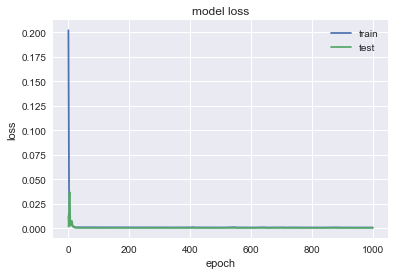

               FTI
MSE       0.277354
MAE       0.425607
R2        0.878849
MAPE (%)   1.79138


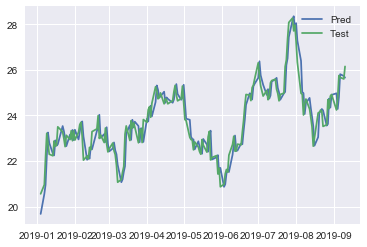

Predicting for  BLK
Train on 1008 samples, validate on 172 samples
Epoch 1/1000
0s - loss: 0.1497 - val_loss: 0.1335
Epoch 2/1000
0s - loss: 0.0769 - val_loss: 0.0545
Epoch 3/1000
0s - loss: 0.0265 - val_loss: 0.0083
Epoch 4/1000
0s - loss: 0.0087 - val_loss: 0.0031
Epoch 5/1000
0s - loss: 0.0178 - val_loss: 0.0099
Epoch 6/1000
0s - loss: 0.0213 - val_loss: 0.0046
Epoch 7/1000
0s - loss: 0.0135 - val_loss: 8.1519e-04
Epoch 8/1000
0s - loss: 0.0088 - val_loss: 0.0032
Epoch 9/1000
0s - loss: 0.0078 - val_loss: 0.0048
Epoch 10/1000
0s - loss: 0.0066 - val_loss: 0.0030
Epoch 11/1000
0s - loss: 0.0042 - val_loss: 8.7566e-04
Epoch 12/1000
0s - loss: 0.0029 - val_loss: 4.6193e-04
Epoch 13/1000
0s - loss: 0.0029 - val_loss: 5.7110e-04
Epoch 14/1000
0s - loss: 0.0025 - val_loss: 3.6086e-04
Epoch 15/1000
0s - loss: 0.0017 - val_loss: 4.6227e-04
Epoch 16/1000
0s - loss: 0.0013 - val_loss: 6.7093e-04
Epoch 17/1000
0s - loss: 0.0011 - val_loss: 4.9803e-04
Epoch 18/1000
0s - loss: 8.7744e-04 - val_l

0s - loss: 5.9614e-04 - val_loss: 3.1980e-04
Epoch 141/1000
0s - loss: 6.9697e-04 - val_loss: 3.4798e-04
Epoch 142/1000
0s - loss: 6.9734e-04 - val_loss: 3.5043e-04
Epoch 143/1000
0s - loss: 6.9242e-04 - val_loss: 3.2677e-04
Epoch 144/1000
0s - loss: 6.2909e-04 - val_loss: 3.3238e-04
Epoch 145/1000
0s - loss: 6.4158e-04 - val_loss: 3.3027e-04
Epoch 146/1000
0s - loss: 7.0600e-04 - val_loss: 3.3010e-04
Epoch 147/1000
0s - loss: 6.3392e-04 - val_loss: 3.4025e-04
Epoch 148/1000
0s - loss: 6.6374e-04 - val_loss: 3.3111e-04
Epoch 149/1000
0s - loss: 6.4380e-04 - val_loss: 3.2131e-04
Epoch 150/1000
0s - loss: 6.1889e-04 - val_loss: 3.2544e-04
Epoch 151/1000
0s - loss: 7.1345e-04 - val_loss: 3.3560e-04
Epoch 152/1000
0s - loss: 6.0120e-04 - val_loss: 3.2346e-04
Epoch 153/1000
0s - loss: 5.9231e-04 - val_loss: 3.3071e-04
Epoch 154/1000
0s - loss: 6.5359e-04 - val_loss: 3.3767e-04
Epoch 155/1000
0s - loss: 7.0913e-04 - val_loss: 3.2191e-04
Epoch 156/1000
0s - loss: 6.4481e-04 - val_loss: 3.3080

0s - loss: 5.8109e-04 - val_loss: 3.1988e-04
Epoch 279/1000
0s - loss: 6.1978e-04 - val_loss: 3.2471e-04
Epoch 280/1000
0s - loss: 6.4902e-04 - val_loss: 3.2437e-04
Epoch 281/1000
0s - loss: 5.8993e-04 - val_loss: 3.2181e-04
Epoch 282/1000
0s - loss: 6.0009e-04 - val_loss: 3.3548e-04
Epoch 283/1000
0s - loss: 5.7803e-04 - val_loss: 3.2085e-04
Epoch 284/1000
0s - loss: 6.0025e-04 - val_loss: 3.3279e-04
Epoch 285/1000
0s - loss: 6.0196e-04 - val_loss: 3.2146e-04
Epoch 286/1000
0s - loss: 5.7928e-04 - val_loss: 3.2755e-04
Epoch 287/1000
0s - loss: 6.3623e-04 - val_loss: 3.2291e-04
Epoch 288/1000
0s - loss: 6.2050e-04 - val_loss: 3.2145e-04
Epoch 289/1000
0s - loss: 6.3623e-04 - val_loss: 3.2675e-04
Epoch 290/1000
0s - loss: 5.8180e-04 - val_loss: 3.3474e-04
Epoch 291/1000
0s - loss: 5.6755e-04 - val_loss: 3.2437e-04
Epoch 292/1000
0s - loss: 5.7252e-04 - val_loss: 3.1993e-04
Epoch 293/1000
0s - loss: 5.8759e-04 - val_loss: 3.2305e-04
Epoch 294/1000
0s - loss: 5.6641e-04 - val_loss: 3.2359

0s - loss: 6.1200e-04 - val_loss: 3.2571e-04
Epoch 417/1000
0s - loss: 6.3675e-04 - val_loss: 3.2480e-04
Epoch 418/1000
0s - loss: 5.5600e-04 - val_loss: 3.2004e-04
Epoch 419/1000
0s - loss: 5.6775e-04 - val_loss: 3.2716e-04
Epoch 420/1000
0s - loss: 5.5535e-04 - val_loss: 3.2135e-04
Epoch 421/1000
0s - loss: 5.4175e-04 - val_loss: 3.2688e-04
Epoch 422/1000
0s - loss: 5.3369e-04 - val_loss: 3.2111e-04
Epoch 423/1000
0s - loss: 6.1374e-04 - val_loss: 3.2134e-04
Epoch 424/1000
0s - loss: 5.3557e-04 - val_loss: 3.2056e-04
Epoch 425/1000
0s - loss: 5.6733e-04 - val_loss: 3.2054e-04
Epoch 426/1000
0s - loss: 5.5975e-04 - val_loss: 3.2693e-04
Epoch 427/1000
0s - loss: 5.5036e-04 - val_loss: 3.2217e-04
Epoch 428/1000
0s - loss: 5.4084e-04 - val_loss: 3.2854e-04
Epoch 429/1000
0s - loss: 5.9424e-04 - val_loss: 3.1973e-04
Epoch 430/1000
0s - loss: 5.8244e-04 - val_loss: 3.2741e-04
Epoch 431/1000
0s - loss: 6.2480e-04 - val_loss: 3.2575e-04
Epoch 432/1000
0s - loss: 6.4802e-04 - val_loss: 3.4854

0s - loss: 5.5610e-04 - val_loss: 3.2276e-04
Epoch 555/1000
0s - loss: 5.6531e-04 - val_loss: 3.2192e-04
Epoch 556/1000
0s - loss: 5.5842e-04 - val_loss: 3.5535e-04
Epoch 557/1000
0s - loss: 5.6915e-04 - val_loss: 3.1802e-04
Epoch 558/1000
0s - loss: 5.4127e-04 - val_loss: 3.1899e-04
Epoch 559/1000
0s - loss: 5.8053e-04 - val_loss: 3.3380e-04
Epoch 560/1000
0s - loss: 5.6095e-04 - val_loss: 3.2087e-04
Epoch 561/1000
0s - loss: 5.5904e-04 - val_loss: 3.2613e-04
Epoch 562/1000
0s - loss: 5.4336e-04 - val_loss: 3.2178e-04
Epoch 563/1000
0s - loss: 5.1318e-04 - val_loss: 3.2165e-04
Epoch 564/1000
0s - loss: 5.4071e-04 - val_loss: 3.2349e-04
Epoch 565/1000
0s - loss: 5.8099e-04 - val_loss: 3.1968e-04
Epoch 566/1000
0s - loss: 5.3378e-04 - val_loss: 3.2428e-04
Epoch 567/1000
0s - loss: 5.4702e-04 - val_loss: 3.2555e-04
Epoch 568/1000
0s - loss: 5.4436e-04 - val_loss: 3.2141e-04
Epoch 569/1000
0s - loss: 5.7516e-04 - val_loss: 3.2211e-04
Epoch 570/1000
0s - loss: 5.7969e-04 - val_loss: 3.1999

0s - loss: 6.5706e-04 - val_loss: 3.2052e-04
Epoch 693/1000
0s - loss: 5.6275e-04 - val_loss: 3.4152e-04
Epoch 694/1000
0s - loss: 6.3169e-04 - val_loss: 3.3407e-04
Epoch 695/1000
0s - loss: 6.4575e-04 - val_loss: 3.8646e-04
Epoch 696/1000
0s - loss: 8.6167e-04 - val_loss: 3.3383e-04
Epoch 697/1000
0s - loss: 7.4593e-04 - val_loss: 3.4451e-04
Epoch 698/1000
0s - loss: 8.8029e-04 - val_loss: 3.1986e-04
Epoch 699/1000
0s - loss: 8.0375e-04 - val_loss: 3.2985e-04
Epoch 700/1000
0s - loss: 9.3602e-04 - val_loss: 3.1822e-04
Epoch 701/1000
0s - loss: 7.9973e-04 - val_loss: 3.2326e-04
Epoch 702/1000
0s - loss: 9.5741e-04 - val_loss: 3.3761e-04
Epoch 703/1000
0s - loss: 7.2586e-04 - val_loss: 3.1953e-04
Epoch 704/1000
0s - loss: 7.4960e-04 - val_loss: 3.3449e-04
Epoch 705/1000
0s - loss: 5.9129e-04 - val_loss: 3.1883e-04
Epoch 706/1000
0s - loss: 6.5837e-04 - val_loss: 3.3572e-04
Epoch 707/1000
0s - loss: 5.5330e-04 - val_loss: 3.1954e-04
Epoch 708/1000
0s - loss: 5.9862e-04 - val_loss: 3.2472

0s - loss: 5.2359e-04 - val_loss: 3.2105e-04
Epoch 831/1000
0s - loss: 5.4627e-04 - val_loss: 3.2619e-04
Epoch 832/1000
0s - loss: 5.2882e-04 - val_loss: 3.2196e-04
Epoch 833/1000
0s - loss: 5.3519e-04 - val_loss: 3.2308e-04
Epoch 834/1000
0s - loss: 5.3822e-04 - val_loss: 3.2439e-04
Epoch 835/1000
0s - loss: 5.5476e-04 - val_loss: 3.2149e-04
Epoch 836/1000
0s - loss: 5.2159e-04 - val_loss: 3.2163e-04
Epoch 837/1000
0s - loss: 5.3785e-04 - val_loss: 3.2295e-04
Epoch 838/1000
0s - loss: 4.8358e-04 - val_loss: 3.2378e-04
Epoch 839/1000
0s - loss: 5.1919e-04 - val_loss: 3.2140e-04
Epoch 840/1000
0s - loss: 4.8635e-04 - val_loss: 3.1996e-04
Epoch 841/1000
0s - loss: 4.9321e-04 - val_loss: 3.2382e-04
Epoch 842/1000
0s - loss: 5.3975e-04 - val_loss: 3.1956e-04
Epoch 843/1000
0s - loss: 5.0220e-04 - val_loss: 3.2264e-04
Epoch 844/1000
0s - loss: 5.4053e-04 - val_loss: 3.2312e-04
Epoch 845/1000
0s - loss: 5.1698e-04 - val_loss: 3.2052e-04
Epoch 846/1000
0s - loss: 5.3686e-04 - val_loss: 3.2910

0s - loss: 5.6914e-04 - val_loss: 3.2009e-04
Epoch 969/1000
0s - loss: 5.9813e-04 - val_loss: 3.5930e-04
Epoch 970/1000
0s - loss: 7.0495e-04 - val_loss: 3.1947e-04
Epoch 971/1000
0s - loss: 6.4538e-04 - val_loss: 3.3007e-04
Epoch 972/1000
0s - loss: 6.8618e-04 - val_loss: 3.2256e-04
Epoch 973/1000
0s - loss: 5.5162e-04 - val_loss: 3.1972e-04
Epoch 974/1000
0s - loss: 5.9351e-04 - val_loss: 3.3304e-04
Epoch 975/1000
0s - loss: 5.3550e-04 - val_loss: 3.2353e-04
Epoch 976/1000
0s - loss: 5.7496e-04 - val_loss: 3.1972e-04
Epoch 977/1000
0s - loss: 4.9274e-04 - val_loss: 3.2101e-04
Epoch 978/1000
0s - loss: 5.3025e-04 - val_loss: 3.3954e-04
Epoch 979/1000
0s - loss: 5.2939e-04 - val_loss: 3.2001e-04
Epoch 980/1000
0s - loss: 5.2233e-04 - val_loss: 3.2658e-04
Epoch 981/1000
0s - loss: 5.4762e-04 - val_loss: 3.2099e-04
Epoch 982/1000
0s - loss: 4.8416e-04 - val_loss: 3.2997e-04
Epoch 983/1000
0s - loss: 5.2853e-04 - val_loss: 3.1947e-04
Epoch 984/1000
0s - loss: 5.2606e-04 - val_loss: 3.4169

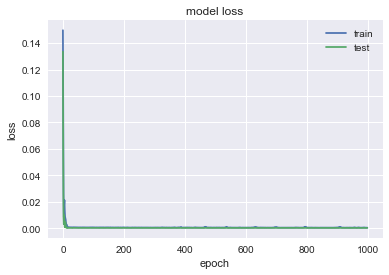

               BLK
MSE        30.5199
MAE        4.33121
R2        0.948342
MAPE (%)  0.987395


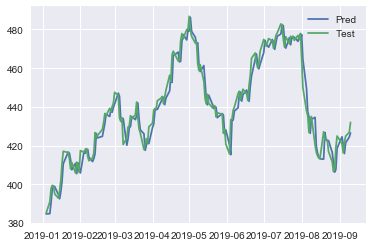

Predicting for  DVA
Train on 1008 samples, validate on 172 samples
Epoch 1/1000
0s - loss: 0.3921 - val_loss: 0.0406
Epoch 2/1000
0s - loss: 0.2288 - val_loss: 0.0113
Epoch 3/1000
0s - loss: 0.0980 - val_loss: 0.0038
Epoch 4/1000
0s - loss: 0.0205 - val_loss: 0.0301
Epoch 5/1000
0s - loss: 0.0172 - val_loss: 0.0595
Epoch 6/1000
0s - loss: 0.0314 - val_loss: 0.0470
Epoch 7/1000
0s - loss: 0.0149 - val_loss: 0.0228
Epoch 8/1000
0s - loss: 0.0038 - val_loss: 0.0098
Epoch 9/1000
0s - loss: 0.0070 - val_loss: 0.0062
Epoch 10/1000
0s - loss: 0.0102 - val_loss: 0.0067
Epoch 11/1000
0s - loss: 0.0079 - val_loss: 0.0102
Epoch 12/1000
0s - loss: 0.0051 - val_loss: 0.0150
Epoch 13/1000
0s - loss: 0.0044 - val_loss: 0.0175
Epoch 14/1000
0s - loss: 0.0047 - val_loss: 0.0157
Epoch 15/1000
0s - loss: 0.0037 - val_loss: 0.0119
Epoch 16/1000
0s - loss: 0.0033 - val_loss: 0.0092
Epoch 17/1000
0s - loss: 0.0035 - val_loss: 0.0081
Epoch 18/1000
0s - loss: 0.0035 - val_loss: 0.0083
Epoch 19/1000
0s - loss:

0s - loss: 0.0012 - val_loss: 7.1449e-04
Epoch 153/1000
0s - loss: 0.0013 - val_loss: 7.0744e-04
Epoch 154/1000
0s - loss: 0.0012 - val_loss: 6.9612e-04
Epoch 155/1000
0s - loss: 0.0012 - val_loss: 6.9690e-04
Epoch 156/1000
0s - loss: 0.0013 - val_loss: 7.2230e-04
Epoch 157/1000
0s - loss: 0.0012 - val_loss: 7.0458e-04
Epoch 158/1000
0s - loss: 0.0012 - val_loss: 6.9582e-04
Epoch 159/1000
0s - loss: 0.0013 - val_loss: 7.1277e-04
Epoch 160/1000
0s - loss: 0.0012 - val_loss: 7.1783e-04
Epoch 161/1000
0s - loss: 0.0012 - val_loss: 6.9583e-04
Epoch 162/1000
0s - loss: 0.0012 - val_loss: 7.0353e-04
Epoch 163/1000
0s - loss: 0.0012 - val_loss: 7.1520e-04
Epoch 164/1000
0s - loss: 0.0011 - val_loss: 7.0378e-04
Epoch 165/1000
0s - loss: 0.0012 - val_loss: 7.0025e-04
Epoch 166/1000
0s - loss: 0.0012 - val_loss: 7.1140e-04
Epoch 167/1000
0s - loss: 0.0012 - val_loss: 6.9925e-04
Epoch 168/1000
0s - loss: 0.0012 - val_loss: 7.1208e-04
Epoch 169/1000
0s - loss: 0.0013 - val_loss: 7.0388e-04
Epoch 1

0s - loss: 0.0012 - val_loss: 7.0007e-04
Epoch 300/1000
0s - loss: 0.0011 - val_loss: 7.0195e-04
Epoch 301/1000
0s - loss: 0.0010 - val_loss: 6.9816e-04
Epoch 302/1000
0s - loss: 0.0011 - val_loss: 6.9880e-04
Epoch 303/1000
0s - loss: 0.0011 - val_loss: 6.9953e-04
Epoch 304/1000
0s - loss: 0.0011 - val_loss: 6.9971e-04
Epoch 305/1000
0s - loss: 0.0012 - val_loss: 7.0056e-04
Epoch 306/1000
0s - loss: 0.0011 - val_loss: 6.9958e-04
Epoch 307/1000
0s - loss: 0.0010 - val_loss: 7.0016e-04
Epoch 308/1000
0s - loss: 0.0011 - val_loss: 6.9844e-04
Epoch 309/1000
0s - loss: 0.0010 - val_loss: 7.0199e-04
Epoch 310/1000
0s - loss: 0.0011 - val_loss: 6.9928e-04
Epoch 311/1000
0s - loss: 0.0011 - val_loss: 7.0429e-04
Epoch 312/1000
0s - loss: 0.0010 - val_loss: 7.0075e-04
Epoch 313/1000
0s - loss: 0.0011 - val_loss: 6.9965e-04
Epoch 314/1000
0s - loss: 0.0011 - val_loss: 7.0175e-04
Epoch 315/1000
0s - loss: 0.0011 - val_loss: 7.0436e-04
Epoch 316/1000
0s - loss: 0.0011 - val_loss: 7.0079e-04
Epoch 3

0s - loss: 0.0011 - val_loss: 7.5776e-04
Epoch 448/1000
0s - loss: 0.0011 - val_loss: 7.5709e-04
Epoch 449/1000
0s - loss: 0.0011 - val_loss: 7.5575e-04
Epoch 450/1000
0s - loss: 0.0011 - val_loss: 7.7672e-04
Epoch 451/1000
0s - loss: 0.0011 - val_loss: 7.3983e-04
Epoch 452/1000
0s - loss: 0.0011 - val_loss: 7.5329e-04
Epoch 453/1000
0s - loss: 0.0011 - val_loss: 7.8453e-04
Epoch 454/1000
0s - loss: 0.0012 - val_loss: 7.3801e-04
Epoch 455/1000
0s - loss: 0.0011 - val_loss: 8.2306e-04
Epoch 456/1000
0s - loss: 0.0012 - val_loss: 7.4929e-04
Epoch 457/1000
0s - loss: 0.0011 - val_loss: 8.3937e-04
Epoch 458/1000
0s - loss: 0.0013 - val_loss: 8.0895e-04
Epoch 459/1000
0s - loss: 0.0013 - val_loss: 8.8145e-04
Epoch 460/1000
0s - loss: 0.0013 - val_loss: 8.7218e-04
Epoch 461/1000
0s - loss: 0.0012 - val_loss: 8.8878e-04
Epoch 462/1000
0s - loss: 0.0013 - val_loss: 8.1013e-04
Epoch 463/1000
0s - loss: 0.0012 - val_loss: 8.2842e-04
Epoch 464/1000
0s - loss: 0.0013 - val_loss: 7.7624e-04
Epoch 4

0s - loss: 0.0010 - val_loss: 7.6812e-04
Epoch 594/1000
0s - loss: 0.0011 - val_loss: 7.2627e-04
Epoch 595/1000
0s - loss: 9.7574e-04 - val_loss: 7.7988e-04
Epoch 596/1000
0s - loss: 0.0011 - val_loss: 7.2511e-04
Epoch 597/1000
0s - loss: 0.0010 - val_loss: 7.6312e-04
Epoch 598/1000
0s - loss: 0.0011 - val_loss: 7.1223e-04
Epoch 599/1000
0s - loss: 0.0010 - val_loss: 7.3961e-04
Epoch 600/1000
0s - loss: 0.0011 - val_loss: 7.1925e-04
Epoch 601/1000
0s - loss: 0.0010 - val_loss: 7.7875e-04
Epoch 602/1000
0s - loss: 0.0011 - val_loss: 7.2322e-04
Epoch 603/1000
0s - loss: 0.0010 - val_loss: 7.9619e-04
Epoch 604/1000
0s - loss: 0.0011 - val_loss: 7.1909e-04
Epoch 605/1000
0s - loss: 0.0010 - val_loss: 7.5092e-04
Epoch 606/1000
0s - loss: 0.0010 - val_loss: 7.1646e-04
Epoch 607/1000
0s - loss: 9.9917e-04 - val_loss: 7.2842e-04
Epoch 608/1000
0s - loss: 0.0010 - val_loss: 7.3396e-04
Epoch 609/1000
0s - loss: 9.4811e-04 - val_loss: 7.1817e-04
Epoch 610/1000
0s - loss: 0.0010 - val_loss: 7.3101

0s - loss: 9.7838e-04 - val_loss: 7.1747e-04
Epoch 734/1000
0s - loss: 9.4144e-04 - val_loss: 7.2659e-04
Epoch 735/1000
0s - loss: 9.7960e-04 - val_loss: 7.1884e-04
Epoch 736/1000
0s - loss: 8.8695e-04 - val_loss: 7.2184e-04
Epoch 737/1000
0s - loss: 9.0662e-04 - val_loss: 7.3553e-04
Epoch 738/1000
0s - loss: 9.5161e-04 - val_loss: 7.1921e-04
Epoch 739/1000
0s - loss: 9.8857e-04 - val_loss: 7.2289e-04
Epoch 740/1000
0s - loss: 9.9798e-04 - val_loss: 7.2054e-04
Epoch 741/1000
0s - loss: 9.8132e-04 - val_loss: 7.1521e-04
Epoch 742/1000
0s - loss: 9.1516e-04 - val_loss: 7.3276e-04
Epoch 743/1000
0s - loss: 9.9536e-04 - val_loss: 7.2269e-04
Epoch 744/1000
0s - loss: 9.0555e-04 - val_loss: 7.2093e-04
Epoch 745/1000
0s - loss: 9.8147e-04 - val_loss: 7.2146e-04
Epoch 746/1000
0s - loss: 9.7485e-04 - val_loss: 7.2334e-04
Epoch 747/1000
0s - loss: 8.8488e-04 - val_loss: 7.2137e-04
Epoch 748/1000
0s - loss: 9.2261e-04 - val_loss: 7.2591e-04
Epoch 749/1000
0s - loss: 9.2398e-04 - val_loss: 7.2644

0s - loss: 9.1158e-04 - val_loss: 7.1126e-04
Epoch 873/1000
0s - loss: 8.8876e-04 - val_loss: 7.0882e-04
Epoch 874/1000
0s - loss: 8.9624e-04 - val_loss: 7.2148e-04
Epoch 875/1000
0s - loss: 9.2080e-04 - val_loss: 7.1241e-04
Epoch 876/1000
0s - loss: 9.1518e-04 - val_loss: 7.1220e-04
Epoch 877/1000
0s - loss: 8.8156e-04 - val_loss: 7.2226e-04
Epoch 878/1000
0s - loss: 8.8046e-04 - val_loss: 7.2102e-04
Epoch 879/1000
0s - loss: 9.4529e-04 - val_loss: 7.1761e-04
Epoch 880/1000
0s - loss: 9.3330e-04 - val_loss: 7.2244e-04
Epoch 881/1000
0s - loss: 9.1797e-04 - val_loss: 7.2081e-04
Epoch 882/1000
0s - loss: 9.4436e-04 - val_loss: 7.0990e-04
Epoch 883/1000
0s - loss: 9.1290e-04 - val_loss: 7.1298e-04
Epoch 884/1000
0s - loss: 8.7416e-04 - val_loss: 7.0604e-04
Epoch 885/1000
0s - loss: 9.9569e-04 - val_loss: 7.0760e-04
Epoch 886/1000
0s - loss: 9.5644e-04 - val_loss: 7.3329e-04
Epoch 887/1000
0s - loss: 0.0010 - val_loss: 7.1695e-04
Epoch 888/1000
0s - loss: 9.0805e-04 - val_loss: 7.4071e-04

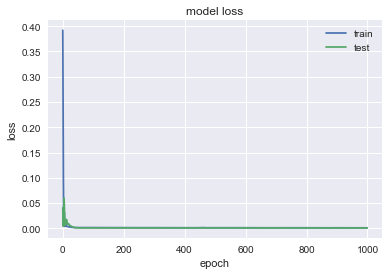

               DVA
MSE        1.22034
MAE        0.78593
R2        0.907861
MAPE (%)   1.45424


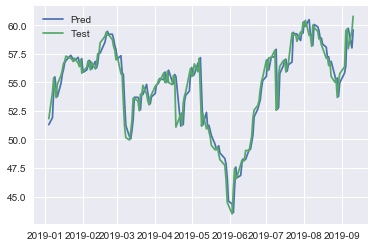

Predicting for  BA
Train on 1008 samples, validate on 172 samples
Epoch 1/1000
0s - loss: 0.1176 - val_loss: 0.3662
Epoch 2/1000
0s - loss: 0.0668 - val_loss: 0.2077
Epoch 3/1000
0s - loss: 0.0296 - val_loss: 0.0841
Epoch 4/1000
0s - loss: 0.0130 - val_loss: 0.0164
Epoch 5/1000
0s - loss: 0.0175 - val_loss: 8.8554e-04
Epoch 6/1000
0s - loss: 0.0256 - val_loss: 8.6807e-04
Epoch 7/1000
0s - loss: 0.0208 - val_loss: 0.0014
Epoch 8/1000
0s - loss: 0.0122 - val_loss: 0.0077
Epoch 9/1000
0s - loss: 0.0074 - val_loss: 0.0137
Epoch 10/1000
0s - loss: 0.0050 - val_loss: 0.0122
Epoch 11/1000
0s - loss: 0.0033 - val_loss: 0.0057
Epoch 12/1000
0s - loss: 0.0016 - val_loss: 0.0011
Epoch 13/1000
0s - loss: 0.0014 - val_loss: 4.7761e-04
Epoch 14/1000
0s - loss: 0.0012 - val_loss: 6.1517e-04
Epoch 15/1000
0s - loss: 7.0643e-04 - val_loss: 4.6124e-04
Epoch 16/1000
0s - loss: 4.4369e-04 - val_loss: 5.0714e-04
Epoch 17/1000
0s - loss: 6.2304e-04 - val_loss: 5.2362e-04
Epoch 18/1000
0s - loss: 5.9898e-04 

0s - loss: 4.0634e-04 - val_loss: 4.3431e-04
Epoch 141/1000
0s - loss: 3.6441e-04 - val_loss: 4.4877e-04
Epoch 142/1000
0s - loss: 4.2726e-04 - val_loss: 4.3204e-04
Epoch 143/1000
0s - loss: 4.3045e-04 - val_loss: 4.3175e-04
Epoch 144/1000
0s - loss: 4.3593e-04 - val_loss: 4.4877e-04
Epoch 145/1000
0s - loss: 4.2483e-04 - val_loss: 4.3313e-04
Epoch 146/1000
0s - loss: 3.7984e-04 - val_loss: 4.3045e-04
Epoch 147/1000
0s - loss: 4.0475e-04 - val_loss: 4.7172e-04
Epoch 148/1000
0s - loss: 4.3726e-04 - val_loss: 4.3185e-04
Epoch 149/1000
0s - loss: 3.9289e-04 - val_loss: 4.4247e-04
Epoch 150/1000
0s - loss: 4.1474e-04 - val_loss: 4.3811e-04
Epoch 151/1000
0s - loss: 3.9356e-04 - val_loss: 4.5552e-04
Epoch 152/1000
0s - loss: 3.8611e-04 - val_loss: 4.3312e-04
Epoch 153/1000
0s - loss: 3.7796e-04 - val_loss: 4.3239e-04
Epoch 154/1000
0s - loss: 4.0206e-04 - val_loss: 4.4869e-04
Epoch 155/1000
0s - loss: 3.4972e-04 - val_loss: 4.3539e-04
Epoch 156/1000
0s - loss: 3.8950e-04 - val_loss: 4.3010

0s - loss: 3.1360e-04 - val_loss: 4.3579e-04
Epoch 278/1000
0s - loss: 3.4543e-04 - val_loss: 4.3371e-04
Epoch 279/1000
0s - loss: 3.3109e-04 - val_loss: 4.2823e-04
Epoch 280/1000
0s - loss: 3.4223e-04 - val_loss: 4.4478e-04
Epoch 281/1000
0s - loss: 3.6142e-04 - val_loss: 4.5269e-04
Epoch 282/1000
0s - loss: 4.0193e-04 - val_loss: 4.2468e-04
Epoch 283/1000
0s - loss: 3.5664e-04 - val_loss: 4.4593e-04
Epoch 284/1000
0s - loss: 3.4269e-04 - val_loss: 4.5277e-04
Epoch 285/1000
0s - loss: 3.4863e-04 - val_loss: 4.3997e-04
Epoch 286/1000
0s - loss: 3.1741e-04 - val_loss: 4.3110e-04
Epoch 287/1000
0s - loss: 3.2129e-04 - val_loss: 4.5129e-04
Epoch 288/1000
0s - loss: 3.4465e-04 - val_loss: 4.9953e-04
Epoch 289/1000
0s - loss: 3.0772e-04 - val_loss: 4.1806e-04
Epoch 290/1000
0s - loss: 3.4881e-04 - val_loss: 4.2346e-04
Epoch 291/1000
0s - loss: 3.4248e-04 - val_loss: 4.3908e-04
Epoch 292/1000
0s - loss: 3.5801e-04 - val_loss: 4.4002e-04
Epoch 293/1000
0s - loss: 3.3849e-04 - val_loss: 4.2879

0s - loss: 4.7830e-04 - val_loss: 4.1927e-04
Epoch 415/1000
0s - loss: 5.1721e-04 - val_loss: 5.5236e-04
Epoch 416/1000
0s - loss: 4.9177e-04 - val_loss: 4.2495e-04
Epoch 417/1000
0s - loss: 4.9474e-04 - val_loss: 6.5081e-04
Epoch 418/1000
0s - loss: 4.0881e-04 - val_loss: 4.1794e-04
Epoch 419/1000
0s - loss: 3.4618e-04 - val_loss: 5.8260e-04
Epoch 420/1000
0s - loss: 3.0062e-04 - val_loss: 4.1936e-04
Epoch 421/1000
0s - loss: 3.2292e-04 - val_loss: 4.8877e-04
Epoch 422/1000
0s - loss: 3.2919e-04 - val_loss: 4.3468e-04
Epoch 423/1000
0s - loss: 3.1526e-04 - val_loss: 5.6460e-04
Epoch 424/1000
0s - loss: 3.5454e-04 - val_loss: 4.5636e-04
Epoch 425/1000
0s - loss: 3.4110e-04 - val_loss: 4.1927e-04
Epoch 426/1000
0s - loss: 3.4053e-04 - val_loss: 5.2699e-04
Epoch 427/1000
0s - loss: 3.3986e-04 - val_loss: 4.5105e-04
Epoch 428/1000
0s - loss: 3.4469e-04 - val_loss: 4.8024e-04
Epoch 429/1000
0s - loss: 3.7778e-04 - val_loss: 4.4841e-04
Epoch 430/1000
0s - loss: 3.7698e-04 - val_loss: 4.5644

0s - loss: 3.6122e-04 - val_loss: 5.3513e-04
Epoch 552/1000
0s - loss: 3.3339e-04 - val_loss: 4.3320e-04
Epoch 553/1000
0s - loss: 3.5188e-04 - val_loss: 5.0019e-04
Epoch 554/1000
0s - loss: 3.4535e-04 - val_loss: 4.1967e-04
Epoch 555/1000
0s - loss: 3.0223e-04 - val_loss: 5.5487e-04
Epoch 556/1000
0s - loss: 3.2640e-04 - val_loss: 4.2135e-04
Epoch 557/1000
0s - loss: 3.0003e-04 - val_loss: 5.0765e-04
Epoch 558/1000
0s - loss: 2.9271e-04 - val_loss: 4.4831e-04
Epoch 559/1000
0s - loss: 3.2022e-04 - val_loss: 4.6499e-04
Epoch 560/1000
0s - loss: 3.6212e-04 - val_loss: 4.9228e-04
Epoch 561/1000
0s - loss: 3.1017e-04 - val_loss: 4.5064e-04
Epoch 562/1000
0s - loss: 3.4827e-04 - val_loss: 4.4074e-04
Epoch 563/1000
0s - loss: 4.6398e-04 - val_loss: 4.3336e-04
Epoch 564/1000
0s - loss: 4.4780e-04 - val_loss: 5.3554e-04
Epoch 565/1000
0s - loss: 4.6831e-04 - val_loss: 4.2083e-04
Epoch 566/1000
0s - loss: 4.1528e-04 - val_loss: 6.2028e-04
Epoch 567/1000
0s - loss: 3.9295e-04 - val_loss: 4.2054

0s - loss: 3.0475e-04 - val_loss: 5.2641e-04
Epoch 689/1000
0s - loss: 3.3926e-04 - val_loss: 4.4390e-04
Epoch 690/1000
0s - loss: 3.0692e-04 - val_loss: 6.3670e-04
Epoch 691/1000
0s - loss: 3.0269e-04 - val_loss: 4.7241e-04
Epoch 692/1000
0s - loss: 3.5219e-04 - val_loss: 4.7046e-04
Epoch 693/1000
0s - loss: 3.3098e-04 - val_loss: 4.7686e-04
Epoch 694/1000
0s - loss: 3.5388e-04 - val_loss: 4.7925e-04
Epoch 695/1000
0s - loss: 3.8297e-04 - val_loss: 5.4994e-04
Epoch 696/1000
0s - loss: 3.5805e-04 - val_loss: 4.1997e-04
Epoch 697/1000
0s - loss: 3.2810e-04 - val_loss: 5.8755e-04
Epoch 698/1000
0s - loss: 3.1421e-04 - val_loss: 4.2005e-04
Epoch 699/1000
0s - loss: 3.4145e-04 - val_loss: 5.8270e-04
Epoch 700/1000
0s - loss: 3.4092e-04 - val_loss: 4.9577e-04
Epoch 701/1000
0s - loss: 3.3089e-04 - val_loss: 4.5064e-04
Epoch 702/1000
0s - loss: 2.9111e-04 - val_loss: 5.2999e-04
Epoch 703/1000
0s - loss: 2.8831e-04 - val_loss: 4.3538e-04
Epoch 704/1000
0s - loss: 2.7638e-04 - val_loss: 5.0197

0s - loss: 3.4855e-04 - val_loss: 4.2271e-04
Epoch 826/1000
0s - loss: 3.3170e-04 - val_loss: 4.7901e-04
Epoch 827/1000
0s - loss: 3.8437e-04 - val_loss: 4.2122e-04
Epoch 828/1000
0s - loss: 3.5025e-04 - val_loss: 4.7392e-04
Epoch 829/1000
0s - loss: 3.2525e-04 - val_loss: 4.4876e-04
Epoch 830/1000
0s - loss: 3.0383e-04 - val_loss: 5.2543e-04
Epoch 831/1000
0s - loss: 2.9064e-04 - val_loss: 4.3948e-04
Epoch 832/1000
0s - loss: 3.1065e-04 - val_loss: 5.4600e-04
Epoch 833/1000
0s - loss: 2.6261e-04 - val_loss: 4.4071e-04
Epoch 834/1000
0s - loss: 2.8046e-04 - val_loss: 5.1351e-04
Epoch 835/1000
0s - loss: 2.7000e-04 - val_loss: 4.3777e-04
Epoch 836/1000
0s - loss: 2.9521e-04 - val_loss: 5.4107e-04
Epoch 837/1000
0s - loss: 2.7275e-04 - val_loss: 4.6280e-04
Epoch 838/1000
0s - loss: 3.0247e-04 - val_loss: 5.6238e-04
Epoch 839/1000
0s - loss: 3.1865e-04 - val_loss: 4.3253e-04
Epoch 840/1000
0s - loss: 3.5241e-04 - val_loss: 4.6946e-04
Epoch 841/1000
0s - loss: 4.2208e-04 - val_loss: 5.3913

0s - loss: 5.0049e-04 - val_loss: 6.1147e-04
Epoch 964/1000
0s - loss: 5.0416e-04 - val_loss: 4.2568e-04
Epoch 965/1000
0s - loss: 4.5591e-04 - val_loss: 7.1117e-04
Epoch 966/1000
0s - loss: 3.4061e-04 - val_loss: 4.3931e-04
Epoch 967/1000
0s - loss: 3.1743e-04 - val_loss: 5.6967e-04
Epoch 968/1000
0s - loss: 2.7520e-04 - val_loss: 4.2000e-04
Epoch 969/1000
0s - loss: 2.6837e-04 - val_loss: 5.4309e-04
Epoch 970/1000
0s - loss: 2.8315e-04 - val_loss: 4.2340e-04
Epoch 971/1000
0s - loss: 2.9782e-04 - val_loss: 4.7501e-04
Epoch 972/1000
0s - loss: 3.7333e-04 - val_loss: 4.8298e-04
Epoch 973/1000
0s - loss: 3.5131e-04 - val_loss: 4.3235e-04
Epoch 974/1000
0s - loss: 3.8331e-04 - val_loss: 5.2650e-04
Epoch 975/1000
0s - loss: 3.8732e-04 - val_loss: 4.3598e-04
Epoch 976/1000
0s - loss: 4.9207e-04 - val_loss: 5.9529e-04
Epoch 977/1000
0s - loss: 4.2557e-04 - val_loss: 4.1916e-04
Epoch 978/1000
0s - loss: 3.6997e-04 - val_loss: 5.6921e-04
Epoch 979/1000
0s - loss: 4.0989e-04 - val_loss: 4.2415

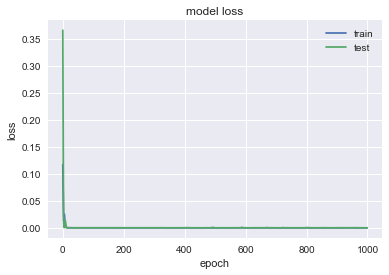

                BA
MSE        52.1445
MAE        5.02718
R2        0.912551
MAPE (%)   1.35259


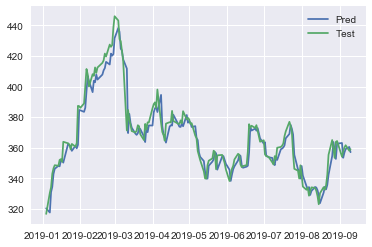

Predicting for  IBM
Train on 1008 samples, validate on 172 samples
Epoch 1/1000
0s - loss: 0.3187 - val_loss: 0.0711
Epoch 2/1000
0s - loss: 0.1551 - val_loss: 0.0157
Epoch 3/1000
0s - loss: 0.0449 - val_loss: 0.0039
Epoch 4/1000
0s - loss: 0.0088 - val_loss: 0.0329
Epoch 5/1000
0s - loss: 0.0263 - val_loss: 0.0348
Epoch 6/1000
0s - loss: 0.0185 - val_loss: 0.0134
Epoch 7/1000
0s - loss: 0.0049 - val_loss: 0.0025
Epoch 8/1000
0s - loss: 0.0063 - val_loss: 0.0012
Epoch 9/1000
0s - loss: 0.0104 - val_loss: 0.0011
Epoch 10/1000
0s - loss: 0.0086 - val_loss: 0.0016
Epoch 11/1000
0s - loss: 0.0044 - val_loss: 0.0039
Epoch 12/1000
0s - loss: 0.0035 - val_loss: 0.0059
Epoch 13/1000
0s - loss: 0.0037 - val_loss: 0.0049
Epoch 14/1000
0s - loss: 0.0030 - val_loss: 0.0026
Epoch 15/1000
0s - loss: 0.0026 - val_loss: 0.0013
Epoch 16/1000
0s - loss: 0.0028 - val_loss: 0.0010
Epoch 17/1000
0s - loss: 0.0026 - val_loss: 0.0012
Epoch 18/1000
0s - loss: 0.0022 - val_loss: 0.0015
Epoch 19/1000
0s - loss:

0s - loss: 0.0012 - val_loss: 5.0984e-04
Epoch 151/1000
0s - loss: 0.0012 - val_loss: 4.9616e-04
Epoch 152/1000
0s - loss: 0.0012 - val_loss: 5.1758e-04
Epoch 153/1000
0s - loss: 0.0012 - val_loss: 5.0049e-04
Epoch 154/1000
0s - loss: 0.0012 - val_loss: 4.9501e-04
Epoch 155/1000
0s - loss: 0.0011 - val_loss: 5.0467e-04
Epoch 156/1000
0s - loss: 0.0012 - val_loss: 5.1093e-04
Epoch 157/1000
0s - loss: 0.0011 - val_loss: 5.0011e-04
Epoch 158/1000
0s - loss: 0.0011 - val_loss: 5.2235e-04
Epoch 159/1000
0s - loss: 0.0012 - val_loss: 5.2219e-04
Epoch 160/1000
0s - loss: 0.0012 - val_loss: 5.0830e-04
Epoch 161/1000
0s - loss: 0.0011 - val_loss: 5.1626e-04
Epoch 162/1000
0s - loss: 0.0012 - val_loss: 5.4492e-04
Epoch 163/1000
0s - loss: 0.0012 - val_loss: 5.0821e-04
Epoch 164/1000
0s - loss: 0.0012 - val_loss: 5.0281e-04
Epoch 165/1000
0s - loss: 0.0011 - val_loss: 5.2154e-04
Epoch 166/1000
0s - loss: 0.0012 - val_loss: 5.1072e-04
Epoch 167/1000
0s - loss: 0.0011 - val_loss: 4.9880e-04
Epoch 1

0s - loss: 0.0011 - val_loss: 5.1385e-04
Epoch 299/1000
0s - loss: 0.0010 - val_loss: 5.1524e-04
Epoch 300/1000
0s - loss: 0.0011 - val_loss: 5.0970e-04
Epoch 301/1000
0s - loss: 0.0010 - val_loss: 5.1776e-04
Epoch 302/1000
0s - loss: 0.0010 - val_loss: 5.1798e-04
Epoch 303/1000
0s - loss: 0.0010 - val_loss: 5.1408e-04
Epoch 304/1000
0s - loss: 0.0011 - val_loss: 5.1377e-04
Epoch 305/1000
0s - loss: 0.0010 - val_loss: 5.1382e-04
Epoch 306/1000
0s - loss: 0.0011 - val_loss: 5.0967e-04
Epoch 307/1000
0s - loss: 0.0010 - val_loss: 5.2281e-04
Epoch 308/1000
0s - loss: 0.0011 - val_loss: 5.1706e-04
Epoch 309/1000
0s - loss: 0.0010 - val_loss: 5.1974e-04
Epoch 310/1000
0s - loss: 0.0011 - val_loss: 5.2403e-04
Epoch 311/1000
0s - loss: 0.0011 - val_loss: 5.0951e-04
Epoch 312/1000
0s - loss: 0.0010 - val_loss: 5.1543e-04
Epoch 313/1000
0s - loss: 0.0011 - val_loss: 5.0639e-04
Epoch 314/1000
0s - loss: 0.0010 - val_loss: 5.0858e-04
Epoch 315/1000
0s - loss: 0.0011 - val_loss: 5.2033e-04
Epoch 3

0s - loss: 0.0010 - val_loss: 5.9090e-04
Epoch 445/1000
0s - loss: 0.0010 - val_loss: 5.1866e-04
Epoch 446/1000
0s - loss: 0.0010 - val_loss: 5.6661e-04
Epoch 447/1000
0s - loss: 0.0011 - val_loss: 5.1862e-04
Epoch 448/1000
0s - loss: 0.0010 - val_loss: 5.6256e-04
Epoch 449/1000
0s - loss: 9.9323e-04 - val_loss: 5.2171e-04
Epoch 450/1000
0s - loss: 0.0010 - val_loss: 6.0749e-04
Epoch 451/1000
0s - loss: 9.9712e-04 - val_loss: 5.1732e-04
Epoch 452/1000
0s - loss: 0.0010 - val_loss: 5.5435e-04
Epoch 453/1000
0s - loss: 9.6643e-04 - val_loss: 5.1072e-04
Epoch 454/1000
0s - loss: 9.6649e-04 - val_loss: 5.3392e-04
Epoch 455/1000
0s - loss: 9.3388e-04 - val_loss: 5.0971e-04
Epoch 456/1000
0s - loss: 9.9326e-04 - val_loss: 5.2151e-04
Epoch 457/1000
0s - loss: 9.5784e-04 - val_loss: 5.1411e-04
Epoch 458/1000
0s - loss: 9.4157e-04 - val_loss: 5.4365e-04
Epoch 459/1000
0s - loss: 9.5777e-04 - val_loss: 5.1057e-04
Epoch 460/1000
0s - loss: 9.7309e-04 - val_loss: 5.3096e-04
Epoch 461/1000
0s - los

0s - loss: 8.9863e-04 - val_loss: 5.1414e-04
Epoch 586/1000
0s - loss: 9.3614e-04 - val_loss: 5.5767e-04
Epoch 587/1000
0s - loss: 9.6951e-04 - val_loss: 5.0750e-04
Epoch 588/1000
0s - loss: 9.6237e-04 - val_loss: 5.3375e-04
Epoch 589/1000
0s - loss: 0.0010 - val_loss: 5.0851e-04
Epoch 590/1000
0s - loss: 9.3615e-04 - val_loss: 5.4526e-04
Epoch 591/1000
0s - loss: 9.6089e-04 - val_loss: 5.1273e-04
Epoch 592/1000
0s - loss: 9.4693e-04 - val_loss: 5.6911e-04
Epoch 593/1000
0s - loss: 9.7435e-04 - val_loss: 5.1305e-04
Epoch 594/1000
0s - loss: 9.6459e-04 - val_loss: 5.5564e-04
Epoch 595/1000
0s - loss: 9.7098e-04 - val_loss: 5.1041e-04
Epoch 596/1000
0s - loss: 9.0830e-04 - val_loss: 5.6571e-04
Epoch 597/1000
0s - loss: 0.0010 - val_loss: 5.2363e-04
Epoch 598/1000
0s - loss: 9.4931e-04 - val_loss: 5.7150e-04
Epoch 599/1000
0s - loss: 0.0010 - val_loss: 5.2533e-04
Epoch 600/1000
0s - loss: 9.1442e-04 - val_loss: 5.9687e-04
Epoch 601/1000
0s - loss: 9.7254e-04 - val_loss: 5.1339e-04
Epoch 6

0s - loss: 9.8956e-04 - val_loss: 5.2462e-04
Epoch 727/1000
0s - loss: 8.8653e-04 - val_loss: 5.7268e-04
Epoch 728/1000
0s - loss: 9.9971e-04 - val_loss: 5.2815e-04
Epoch 729/1000
0s - loss: 9.6373e-04 - val_loss: 5.9836e-04
Epoch 730/1000
0s - loss: 9.9388e-04 - val_loss: 5.2201e-04
Epoch 731/1000
0s - loss: 9.0247e-04 - val_loss: 5.6835e-04
Epoch 732/1000
0s - loss: 9.1381e-04 - val_loss: 5.1336e-04
Epoch 733/1000
0s - loss: 9.0893e-04 - val_loss: 5.1713e-04
Epoch 734/1000
0s - loss: 9.0424e-04 - val_loss: 5.1776e-04
Epoch 735/1000
0s - loss: 9.3633e-04 - val_loss: 5.1120e-04
Epoch 736/1000
0s - loss: 9.0488e-04 - val_loss: 5.2716e-04
Epoch 737/1000
0s - loss: 9.4228e-04 - val_loss: 5.0784e-04
Epoch 738/1000
0s - loss: 9.6978e-04 - val_loss: 5.2414e-04
Epoch 739/1000
0s - loss: 9.4354e-04 - val_loss: 5.1822e-04
Epoch 740/1000
0s - loss: 8.8049e-04 - val_loss: 5.4840e-04
Epoch 741/1000
0s - loss: 8.9743e-04 - val_loss: 5.1566e-04
Epoch 742/1000
0s - loss: 8.7795e-04 - val_loss: 5.4982

0s - loss: 0.0010 - val_loss: 7.4878e-04
Epoch 865/1000
0s - loss: 0.0011 - val_loss: 6.4296e-04
Epoch 866/1000
0s - loss: 0.0011 - val_loss: 7.7331e-04
Epoch 867/1000
0s - loss: 0.0012 - val_loss: 6.2834e-04
Epoch 868/1000
0s - loss: 0.0011 - val_loss: 7.1411e-04
Epoch 869/1000
0s - loss: 0.0011 - val_loss: 6.0226e-04
Epoch 870/1000
0s - loss: 0.0010 - val_loss: 6.7033e-04
Epoch 871/1000
0s - loss: 0.0010 - val_loss: 5.7275e-04
Epoch 872/1000
0s - loss: 9.9925e-04 - val_loss: 6.7398e-04
Epoch 873/1000
0s - loss: 0.0011 - val_loss: 6.1767e-04
Epoch 874/1000
0s - loss: 9.6973e-04 - val_loss: 6.5015e-04
Epoch 875/1000
0s - loss: 9.7685e-04 - val_loss: 5.5789e-04
Epoch 876/1000
0s - loss: 9.9046e-04 - val_loss: 6.2538e-04
Epoch 877/1000
0s - loss: 9.9298e-04 - val_loss: 5.2842e-04
Epoch 878/1000
0s - loss: 9.9107e-04 - val_loss: 5.9084e-04
Epoch 879/1000
0s - loss: 9.8966e-04 - val_loss: 5.2942e-04
Epoch 880/1000
0s - loss: 9.1310e-04 - val_loss: 6.0099e-04
Epoch 881/1000
0s - loss: 0.001

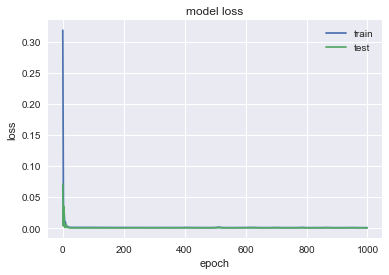

               IBM
MSE        3.09052
MAE        1.23081
R2        0.932255
MAPE (%)   0.90354


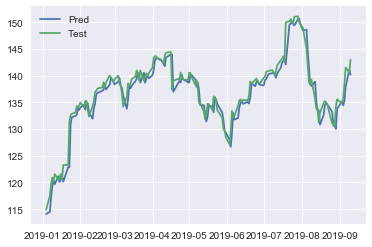

Predicting for  ALB
Train on 1008 samples, validate on 172 samples
Epoch 1/1000
0s - loss: 0.1956 - val_loss: 0.0538
Epoch 2/1000
0s - loss: 0.1038 - val_loss: 0.0156
Epoch 3/1000
0s - loss: 0.0367 - val_loss: 0.0018
Epoch 4/1000
0s - loss: 0.0094 - val_loss: 0.0179
Epoch 5/1000
0s - loss: 0.0206 - val_loss: 0.0306
Epoch 6/1000
0s - loss: 0.0252 - val_loss: 0.0187
Epoch 7/1000
0s - loss: 0.0150 - val_loss: 0.0056
Epoch 8/1000
0s - loss: 0.0098 - val_loss: 0.0013
Epoch 9/1000
0s - loss: 0.0098 - val_loss: 8.5452e-04
Epoch 10/1000
0s - loss: 0.0083 - val_loss: 8.5713e-04
Epoch 11/1000
0s - loss: 0.0049 - val_loss: 0.0017
Epoch 12/1000
0s - loss: 0.0035 - val_loss: 0.0031
Epoch 13/1000
0s - loss: 0.0038 - val_loss: 0.0030
Epoch 14/1000
0s - loss: 0.0032 - val_loss: 0.0016
Epoch 15/1000
0s - loss: 0.0023 - val_loss: 5.9135e-04
Epoch 16/1000
0s - loss: 0.0017 - val_loss: 3.2886e-04
Epoch 17/1000
0s - loss: 0.0014 - val_loss: 2.9668e-04
Epoch 18/1000
0s - loss: 9.5437e-04 - val_loss: 3.3023e

0s - loss: 5.9960e-04 - val_loss: 2.5305e-04
Epoch 141/1000
0s - loss: 6.3041e-04 - val_loss: 2.5298e-04
Epoch 142/1000
0s - loss: 6.3236e-04 - val_loss: 2.5426e-04
Epoch 143/1000
0s - loss: 6.1553e-04 - val_loss: 2.5332e-04
Epoch 144/1000
0s - loss: 5.9262e-04 - val_loss: 2.5623e-04
Epoch 145/1000
0s - loss: 6.9718e-04 - val_loss: 2.5428e-04
Epoch 146/1000
0s - loss: 5.8368e-04 - val_loss: 2.5662e-04
Epoch 147/1000
0s - loss: 6.2812e-04 - val_loss: 2.5294e-04
Epoch 148/1000
0s - loss: 6.4908e-04 - val_loss: 2.5430e-04
Epoch 149/1000
0s - loss: 6.4141e-04 - val_loss: 2.5336e-04
Epoch 150/1000
0s - loss: 6.5777e-04 - val_loss: 2.5361e-04
Epoch 151/1000
0s - loss: 6.2387e-04 - val_loss: 2.5306e-04
Epoch 152/1000
0s - loss: 6.3886e-04 - val_loss: 2.5309e-04
Epoch 153/1000
0s - loss: 6.6097e-04 - val_loss: 2.5466e-04
Epoch 154/1000
0s - loss: 6.3223e-04 - val_loss: 2.5345e-04
Epoch 155/1000
0s - loss: 5.6098e-04 - val_loss: 2.5388e-04
Epoch 156/1000
0s - loss: 6.4866e-04 - val_loss: 2.5414

0s - loss: 4.6868e-04 - val_loss: 2.5489e-04
Epoch 278/1000
0s - loss: 5.4433e-04 - val_loss: 2.5631e-04
Epoch 279/1000
0s - loss: 5.5170e-04 - val_loss: 2.5382e-04
Epoch 280/1000
0s - loss: 5.8190e-04 - val_loss: 2.5459e-04
Epoch 281/1000
0s - loss: 5.8849e-04 - val_loss: 2.5680e-04
Epoch 282/1000
0s - loss: 5.3728e-04 - val_loss: 2.5613e-04
Epoch 283/1000
0s - loss: 5.8727e-04 - val_loss: 2.6476e-04
Epoch 284/1000
0s - loss: 6.4935e-04 - val_loss: 2.5477e-04
Epoch 285/1000
0s - loss: 5.4512e-04 - val_loss: 2.5339e-04
Epoch 286/1000
0s - loss: 6.2752e-04 - val_loss: 2.6610e-04
Epoch 287/1000
0s - loss: 5.1364e-04 - val_loss: 2.5425e-04
Epoch 288/1000
0s - loss: 5.7433e-04 - val_loss: 2.6552e-04
Epoch 289/1000
0s - loss: 6.1537e-04 - val_loss: 2.5477e-04
Epoch 290/1000
0s - loss: 5.8937e-04 - val_loss: 2.5592e-04
Epoch 291/1000
0s - loss: 5.9889e-04 - val_loss: 2.5571e-04
Epoch 292/1000
0s - loss: 6.0029e-04 - val_loss: 2.5343e-04
Epoch 293/1000
0s - loss: 5.2261e-04 - val_loss: 2.5792

0s - loss: 5.5256e-04 - val_loss: 2.5482e-04
Epoch 415/1000
0s - loss: 6.0981e-04 - val_loss: 2.6215e-04
Epoch 416/1000
0s - loss: 5.6857e-04 - val_loss: 2.5537e-04
Epoch 417/1000
0s - loss: 6.2797e-04 - val_loss: 2.5528e-04
Epoch 418/1000
0s - loss: 5.0598e-04 - val_loss: 2.5549e-04
Epoch 419/1000
0s - loss: 5.9408e-04 - val_loss: 2.6203e-04
Epoch 420/1000
0s - loss: 5.5919e-04 - val_loss: 2.5473e-04
Epoch 421/1000
0s - loss: 5.2331e-04 - val_loss: 2.5443e-04
Epoch 422/1000
0s - loss: 5.3436e-04 - val_loss: 2.5995e-04
Epoch 423/1000
0s - loss: 4.7198e-04 - val_loss: 2.5393e-04
Epoch 424/1000
0s - loss: 4.8119e-04 - val_loss: 2.5383e-04
Epoch 425/1000
0s - loss: 4.9152e-04 - val_loss: 2.6212e-04
Epoch 426/1000
0s - loss: 5.4863e-04 - val_loss: 2.6823e-04
Epoch 427/1000
0s - loss: 5.9027e-04 - val_loss: 2.8962e-04
Epoch 428/1000
0s - loss: 6.6561e-04 - val_loss: 2.5385e-04
Epoch 429/1000
0s - loss: 6.6219e-04 - val_loss: 2.5760e-04
Epoch 430/1000
0s - loss: 6.2705e-04 - val_loss: 2.5607

0s - loss: 4.8378e-04 - val_loss: 2.5474e-04
Epoch 552/1000
0s - loss: 4.9596e-04 - val_loss: 2.5568e-04
Epoch 553/1000
0s - loss: 4.7516e-04 - val_loss: 2.6154e-04
Epoch 554/1000
0s - loss: 4.9813e-04 - val_loss: 2.5469e-04
Epoch 555/1000
0s - loss: 5.3069e-04 - val_loss: 2.5785e-04
Epoch 556/1000
0s - loss: 5.2709e-04 - val_loss: 2.5413e-04
Epoch 557/1000
0s - loss: 5.2531e-04 - val_loss: 2.6317e-04
Epoch 558/1000
0s - loss: 5.3964e-04 - val_loss: 2.5685e-04
Epoch 559/1000
0s - loss: 5.7290e-04 - val_loss: 2.5613e-04
Epoch 560/1000
0s - loss: 5.0572e-04 - val_loss: 2.6125e-04
Epoch 561/1000
0s - loss: 5.2490e-04 - val_loss: 2.5430e-04
Epoch 562/1000
0s - loss: 4.9496e-04 - val_loss: 2.5793e-04
Epoch 563/1000
0s - loss: 4.7235e-04 - val_loss: 2.5429e-04
Epoch 564/1000
0s - loss: 4.8026e-04 - val_loss: 2.5878e-04
Epoch 565/1000
0s - loss: 5.1550e-04 - val_loss: 2.5378e-04
Epoch 566/1000
0s - loss: 4.9645e-04 - val_loss: 2.5384e-04
Epoch 567/1000
0s - loss: 4.9016e-04 - val_loss: 2.5780

0s - loss: 4.7220e-04 - val_loss: 2.5501e-04
Epoch 689/1000
0s - loss: 4.7214e-04 - val_loss: 2.6750e-04
Epoch 690/1000
0s - loss: 4.3831e-04 - val_loss: 2.5474e-04
Epoch 691/1000
0s - loss: 4.8697e-04 - val_loss: 2.5437e-04
Epoch 692/1000
0s - loss: 4.6729e-04 - val_loss: 2.5546e-04
Epoch 693/1000
0s - loss: 4.7449e-04 - val_loss: 2.5665e-04
Epoch 694/1000
0s - loss: 4.2542e-04 - val_loss: 2.5522e-04
Epoch 695/1000
0s - loss: 4.8499e-04 - val_loss: 2.5699e-04
Epoch 696/1000
0s - loss: 5.0955e-04 - val_loss: 2.5470e-04
Epoch 697/1000
0s - loss: 4.7628e-04 - val_loss: 2.5455e-04
Epoch 698/1000
0s - loss: 4.7865e-04 - val_loss: 2.5363e-04
Epoch 699/1000
0s - loss: 5.1168e-04 - val_loss: 2.7322e-04
Epoch 700/1000
0s - loss: 5.3311e-04 - val_loss: 2.5940e-04
Epoch 701/1000
0s - loss: 5.1944e-04 - val_loss: 2.6530e-04
Epoch 702/1000
0s - loss: 5.1100e-04 - val_loss: 2.5397e-04
Epoch 703/1000
0s - loss: 5.4063e-04 - val_loss: 2.6456e-04
Epoch 704/1000
0s - loss: 4.8242e-04 - val_loss: 2.5468

0s - loss: 4.6989e-04 - val_loss: 2.6017e-04
Epoch 826/1000
0s - loss: 4.4651e-04 - val_loss: 2.5870e-04
Epoch 827/1000
0s - loss: 5.3896e-04 - val_loss: 2.6031e-04
Epoch 828/1000
0s - loss: 4.6596e-04 - val_loss: 2.5330e-04
Epoch 829/1000
0s - loss: 5.1862e-04 - val_loss: 2.5927e-04
Epoch 830/1000
0s - loss: 4.8929e-04 - val_loss: 2.5694e-04
Epoch 831/1000
0s - loss: 6.2543e-04 - val_loss: 2.7520e-04
Epoch 832/1000
0s - loss: 5.7784e-04 - val_loss: 2.6530e-04
Epoch 833/1000
0s - loss: 6.5486e-04 - val_loss: 2.6950e-04
Epoch 834/1000
0s - loss: 5.9463e-04 - val_loss: 2.5326e-04
Epoch 835/1000
0s - loss: 6.4140e-04 - val_loss: 2.6560e-04
Epoch 836/1000
0s - loss: 5.7674e-04 - val_loss: 2.5580e-04
Epoch 837/1000
0s - loss: 5.8247e-04 - val_loss: 2.5562e-04
Epoch 838/1000
0s - loss: 4.8695e-04 - val_loss: 2.5774e-04
Epoch 839/1000
0s - loss: 5.0685e-04 - val_loss: 2.5394e-04
Epoch 840/1000
0s - loss: 4.8862e-04 - val_loss: 2.5671e-04
Epoch 841/1000
0s - loss: 4.8236e-04 - val_loss: 2.5746

0s - loss: 5.6142e-04 - val_loss: 2.6153e-04
Epoch 963/1000
0s - loss: 4.8715e-04 - val_loss: 2.5338e-04
Epoch 964/1000
0s - loss: 5.2824e-04 - val_loss: 2.5795e-04
Epoch 965/1000
0s - loss: 4.5856e-04 - val_loss: 2.5409e-04
Epoch 966/1000
0s - loss: 5.2411e-04 - val_loss: 2.5349e-04
Epoch 967/1000
0s - loss: 4.8149e-04 - val_loss: 2.5723e-04
Epoch 968/1000
0s - loss: 4.2257e-04 - val_loss: 2.5388e-04
Epoch 969/1000
0s - loss: 4.7706e-04 - val_loss: 2.5743e-04
Epoch 970/1000
0s - loss: 4.3011e-04 - val_loss: 2.5410e-04
Epoch 971/1000
0s - loss: 4.5070e-04 - val_loss: 2.6670e-04
Epoch 972/1000
0s - loss: 4.4025e-04 - val_loss: 2.5716e-04
Epoch 973/1000
0s - loss: 4.7052e-04 - val_loss: 2.6794e-04
Epoch 974/1000
0s - loss: 4.9292e-04 - val_loss: 2.5498e-04
Epoch 975/1000
0s - loss: 5.4314e-04 - val_loss: 2.8027e-04
Epoch 976/1000
0s - loss: 5.4451e-04 - val_loss: 2.8171e-04
Epoch 977/1000
0s - loss: 6.4299e-04 - val_loss: 3.0348e-04
Epoch 978/1000
0s - loss: 7.3324e-04 - val_loss: 2.7414

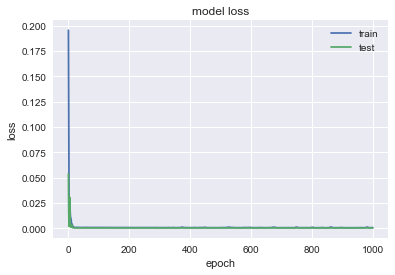

               ALB
MSE        2.63804
MAE        1.21087
R2        0.956914
MAPE (%)   1.63143


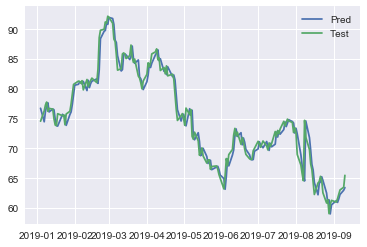

Predicting for  CBRE
Train on 1008 samples, validate on 172 samples
Epoch 1/1000
0s - loss: 0.1781 - val_loss: 0.4160
Epoch 2/1000
0s - loss: 0.0900 - val_loss: 0.2028
Epoch 3/1000
0s - loss: 0.0285 - val_loss: 0.0537
Epoch 4/1000
0s - loss: 0.0061 - val_loss: 0.0019
Epoch 5/1000
0s - loss: 0.0200 - val_loss: 0.0033
Epoch 6/1000
0s - loss: 0.0237 - val_loss: 0.0010
Epoch 7/1000
0s - loss: 0.0121 - val_loss: 0.0121
Epoch 8/1000
0s - loss: 0.0074 - val_loss: 0.0290
Epoch 9/1000
0s - loss: 0.0072 - val_loss: 0.0316
Epoch 10/1000
0s - loss: 0.0059 - val_loss: 0.0205
Epoch 11/1000
0s - loss: 0.0038 - val_loss: 0.0083
Epoch 12/1000
0s - loss: 0.0036 - val_loss: 0.0027
Epoch 13/1000
0s - loss: 0.0041 - val_loss: 0.0018
Epoch 14/1000
0s - loss: 0.0037 - val_loss: 0.0028
Epoch 15/1000
0s - loss: 0.0027 - val_loss: 0.0047
Epoch 16/1000
0s - loss: 0.0019 - val_loss: 0.0050
Epoch 17/1000
0s - loss: 0.0018 - val_loss: 0.0033
Epoch 18/1000
0s - loss: 0.0014 - val_loss: 0.0014
Epoch 19/1000
0s - loss

0s - loss: 6.1942e-04 - val_loss: 5.2479e-04
Epoch 143/1000
0s - loss: 6.3595e-04 - val_loss: 4.9253e-04
Epoch 144/1000
0s - loss: 6.9399e-04 - val_loss: 4.9387e-04
Epoch 145/1000
0s - loss: 6.3176e-04 - val_loss: 5.7126e-04
Epoch 146/1000
0s - loss: 6.1641e-04 - val_loss: 4.9377e-04
Epoch 147/1000
0s - loss: 6.7549e-04 - val_loss: 5.0772e-04
Epoch 148/1000
0s - loss: 6.8282e-04 - val_loss: 5.2636e-04
Epoch 149/1000
0s - loss: 5.9866e-04 - val_loss: 4.9838e-04
Epoch 150/1000
0s - loss: 6.7923e-04 - val_loss: 5.3466e-04
Epoch 151/1000
0s - loss: 6.6604e-04 - val_loss: 5.5528e-04
Epoch 152/1000
0s - loss: 6.3841e-04 - val_loss: 5.0623e-04
Epoch 153/1000
0s - loss: 6.0422e-04 - val_loss: 5.2875e-04
Epoch 154/1000
0s - loss: 6.7264e-04 - val_loss: 5.5237e-04
Epoch 155/1000
0s - loss: 6.2742e-04 - val_loss: 5.1918e-04
Epoch 156/1000
0s - loss: 6.5180e-04 - val_loss: 4.9135e-04
Epoch 157/1000
0s - loss: 6.7942e-04 - val_loss: 5.0825e-04
Epoch 158/1000
0s - loss: 6.8867e-04 - val_loss: 5.0220

0s - loss: 5.8305e-04 - val_loss: 5.0194e-04
Epoch 280/1000
0s - loss: 5.4634e-04 - val_loss: 4.7971e-04
Epoch 281/1000
0s - loss: 5.5700e-04 - val_loss: 5.0348e-04
Epoch 282/1000
0s - loss: 5.8055e-04 - val_loss: 5.5759e-04
Epoch 283/1000
0s - loss: 6.4796e-04 - val_loss: 4.8400e-04
Epoch 284/1000
0s - loss: 6.0389e-04 - val_loss: 5.2977e-04
Epoch 285/1000
0s - loss: 5.9463e-04 - val_loss: 5.0741e-04
Epoch 286/1000
0s - loss: 6.3168e-04 - val_loss: 5.1100e-04
Epoch 287/1000
0s - loss: 6.2605e-04 - val_loss: 5.0871e-04
Epoch 288/1000
0s - loss: 6.2711e-04 - val_loss: 5.1003e-04
Epoch 289/1000
0s - loss: 5.8943e-04 - val_loss: 5.4318e-04
Epoch 290/1000
0s - loss: 5.8818e-04 - val_loss: 4.8898e-04
Epoch 291/1000
0s - loss: 5.8132e-04 - val_loss: 5.3902e-04
Epoch 292/1000
0s - loss: 6.0614e-04 - val_loss: 4.8576e-04
Epoch 293/1000
0s - loss: 6.3659e-04 - val_loss: 6.7501e-04
Epoch 294/1000
0s - loss: 6.0707e-04 - val_loss: 5.0926e-04
Epoch 295/1000
0s - loss: 5.7498e-04 - val_loss: 5.0791

0s - loss: 5.6367e-04 - val_loss: 5.1920e-04
Epoch 418/1000
0s - loss: 5.6028e-04 - val_loss: 5.2811e-04
Epoch 419/1000
0s - loss: 5.9526e-04 - val_loss: 5.4150e-04
Epoch 420/1000
0s - loss: 5.4391e-04 - val_loss: 5.2869e-04
Epoch 421/1000
0s - loss: 5.2010e-04 - val_loss: 5.3118e-04
Epoch 422/1000
0s - loss: 5.4619e-04 - val_loss: 5.7589e-04
Epoch 423/1000
0s - loss: 5.1887e-04 - val_loss: 5.2192e-04
Epoch 424/1000
0s - loss: 5.7500e-04 - val_loss: 5.7286e-04
Epoch 425/1000
0s - loss: 5.6184e-04 - val_loss: 5.3205e-04
Epoch 426/1000
0s - loss: 5.6202e-04 - val_loss: 4.9933e-04
Epoch 427/1000
0s - loss: 5.2569e-04 - val_loss: 5.5518e-04
Epoch 428/1000
0s - loss: 5.4502e-04 - val_loss: 5.3678e-04
Epoch 429/1000
0s - loss: 5.2138e-04 - val_loss: 5.9513e-04
Epoch 430/1000
0s - loss: 6.1429e-04 - val_loss: 4.9591e-04
Epoch 431/1000
0s - loss: 5.5884e-04 - val_loss: 5.5309e-04
Epoch 432/1000
0s - loss: 6.1237e-04 - val_loss: 5.5303e-04
Epoch 433/1000
0s - loss: 5.9474e-04 - val_loss: 4.9505

0s - loss: 5.9086e-04 - val_loss: 5.6710e-04
Epoch 556/1000
0s - loss: 5.2588e-04 - val_loss: 5.3669e-04
Epoch 557/1000
0s - loss: 5.8070e-04 - val_loss: 5.5574e-04
Epoch 558/1000
0s - loss: 5.2781e-04 - val_loss: 5.9887e-04
Epoch 559/1000
0s - loss: 6.7254e-04 - val_loss: 5.6362e-04
Epoch 560/1000
0s - loss: 5.8735e-04 - val_loss: 5.0345e-04
Epoch 561/1000
0s - loss: 6.6912e-04 - val_loss: 5.6606e-04
Epoch 562/1000
0s - loss: 5.9886e-04 - val_loss: 5.2992e-04
Epoch 563/1000
0s - loss: 6.4159e-04 - val_loss: 5.7447e-04
Epoch 564/1000
0s - loss: 5.3851e-04 - val_loss: 4.9304e-04
Epoch 565/1000
0s - loss: 6.6586e-04 - val_loss: 5.7656e-04
Epoch 566/1000
0s - loss: 5.7929e-04 - val_loss: 5.2532e-04
Epoch 567/1000
0s - loss: 6.5098e-04 - val_loss: 5.7304e-04
Epoch 568/1000
0s - loss: 6.4654e-04 - val_loss: 5.0102e-04
Epoch 569/1000
0s - loss: 7.9534e-04 - val_loss: 6.0559e-04
Epoch 570/1000
0s - loss: 6.6720e-04 - val_loss: 5.0515e-04
Epoch 571/1000
0s - loss: 8.3966e-04 - val_loss: 6.9838

0s - loss: 5.1963e-04 - val_loss: 4.9263e-04
Epoch 693/1000
0s - loss: 5.3054e-04 - val_loss: 7.4957e-04
Epoch 694/1000
0s - loss: 5.4773e-04 - val_loss: 5.0621e-04
Epoch 695/1000
0s - loss: 5.3111e-04 - val_loss: 5.6730e-04
Epoch 696/1000
0s - loss: 5.3158e-04 - val_loss: 5.2071e-04
Epoch 697/1000
0s - loss: 5.0154e-04 - val_loss: 5.3423e-04
Epoch 698/1000
0s - loss: 4.6950e-04 - val_loss: 5.2773e-04
Epoch 699/1000
0s - loss: 5.1042e-04 - val_loss: 5.2352e-04
Epoch 700/1000
0s - loss: 5.1491e-04 - val_loss: 5.3081e-04
Epoch 701/1000
0s - loss: 5.5249e-04 - val_loss: 5.7816e-04
Epoch 702/1000
0s - loss: 5.1111e-04 - val_loss: 5.3550e-04
Epoch 703/1000
0s - loss: 5.1919e-04 - val_loss: 5.8844e-04
Epoch 704/1000
0s - loss: 4.9638e-04 - val_loss: 4.9944e-04
Epoch 705/1000
0s - loss: 5.0163e-04 - val_loss: 5.4483e-04
Epoch 706/1000
0s - loss: 5.4542e-04 - val_loss: 4.9593e-04
Epoch 707/1000
0s - loss: 5.1932e-04 - val_loss: 4.9320e-04
Epoch 708/1000
0s - loss: 5.2039e-04 - val_loss: 5.6008

0s - loss: 5.0740e-04 - val_loss: 5.2205e-04
Epoch 831/1000
0s - loss: 5.6606e-04 - val_loss: 5.0787e-04
Epoch 832/1000
0s - loss: 5.9301e-04 - val_loss: 5.3268e-04
Epoch 833/1000
0s - loss: 7.1143e-04 - val_loss: 5.9959e-04
Epoch 834/1000
0s - loss: 6.1901e-04 - val_loss: 5.2430e-04
Epoch 835/1000
0s - loss: 7.5998e-04 - val_loss: 6.9773e-04
Epoch 836/1000
0s - loss: 6.1927e-04 - val_loss: 4.8354e-04
Epoch 837/1000
0s - loss: 6.8223e-04 - val_loss: 7.0638e-04
Epoch 838/1000
0s - loss: 6.1036e-04 - val_loss: 4.7277e-04
Epoch 839/1000
0s - loss: 6.1505e-04 - val_loss: 7.4545e-04
Epoch 840/1000
0s - loss: 5.0585e-04 - val_loss: 4.7963e-04
Epoch 841/1000
0s - loss: 5.9035e-04 - val_loss: 6.2535e-04
Epoch 842/1000
0s - loss: 4.8664e-04 - val_loss: 4.7795e-04
Epoch 843/1000
0s - loss: 5.3313e-04 - val_loss: 6.1996e-04
Epoch 844/1000
0s - loss: 5.1312e-04 - val_loss: 5.4949e-04
Epoch 845/1000
0s - loss: 5.1008e-04 - val_loss: 5.7067e-04
Epoch 846/1000
0s - loss: 4.5253e-04 - val_loss: 5.2039

0s - loss: 7.0372e-04 - val_loss: 7.1336e-04
Epoch 968/1000
0s - loss: 6.0652e-04 - val_loss: 4.7445e-04
Epoch 969/1000
0s - loss: 5.9935e-04 - val_loss: 8.5484e-04
Epoch 970/1000
0s - loss: 5.2230e-04 - val_loss: 4.6748e-04
Epoch 971/1000
0s - loss: 5.0099e-04 - val_loss: 6.7425e-04
Epoch 972/1000
0s - loss: 4.8979e-04 - val_loss: 5.1405e-04
Epoch 973/1000
0s - loss: 4.8171e-04 - val_loss: 5.7378e-04
Epoch 974/1000
0s - loss: 4.7015e-04 - val_loss: 5.0199e-04
Epoch 975/1000
0s - loss: 4.4485e-04 - val_loss: 5.7802e-04
Epoch 976/1000
0s - loss: 4.8442e-04 - val_loss: 5.5548e-04
Epoch 977/1000
0s - loss: 4.6680e-04 - val_loss: 5.3362e-04
Epoch 978/1000
0s - loss: 4.6508e-04 - val_loss: 5.9563e-04
Epoch 979/1000
0s - loss: 4.8983e-04 - val_loss: 5.3283e-04
Epoch 980/1000
0s - loss: 4.8635e-04 - val_loss: 5.8697e-04
Epoch 981/1000
0s - loss: 4.7066e-04 - val_loss: 5.0442e-04
Epoch 982/1000
0s - loss: 4.5160e-04 - val_loss: 5.5563e-04
Epoch 983/1000
0s - loss: 4.9800e-04 - val_loss: 5.3023

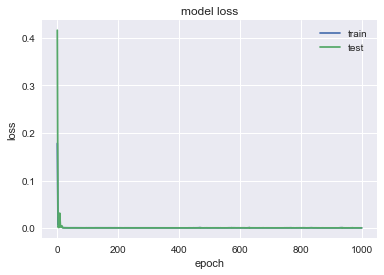

              CBRE
MSE       0.511003
MAE       0.569222
R2        0.947267
MAPE (%)   1.14981


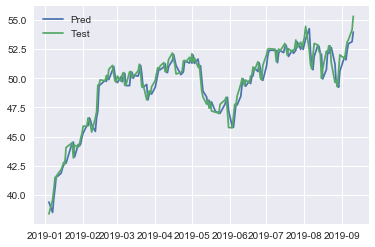

In [215]:
test = df["2019-01-04":].copy()
train = df[:"2019-01-04"].copy()
pred_gru_4 = pd.DataFrame(columns=df.columns,index = test.index)
for comp in companies:
    pred_gru_4[comp] = nn_forec_GRU(df,comp,first_layer = 256,second_layer=128).values

In [200]:
gru_uni_64_32 = eval(pred_gru_1,test,companies=companies)
gru_uni_64_32

,T,BBY,KO,FTI,BLK,DVA,BA,IBM,ALB,CBRE
MSE,0.142723,1.99169,0.272612,0.291586,29.8278,1.22603,57.9068,2.87237,2.87484,0.67075
MAE,0.274081,0.927835,0.379253,0.438753,4.27524,0.795163,5.40378,1.16448,1.24255,0.672865
R2,0.949908,0.941768,0.967578,0.867124,0.948831,0.905504,0.902635,0.936404,0.952528,0.929254
MAPE (%),0.847423,1.37834,0.75854,1.83964,0.97495,1.46896,1.44949,0.854811,1.6827,1.35442


In [202]:
gru_uni_64_32.astype(float).round(2).to_latex()

'\\begin{tabular}{lrrrrrrrrrr}\n\\toprule\n{} &     T &   BBY &    KO &   FTI &    BLK &   DVA &     BA &   IBM &   ALB &  CBRE \\\\\n\\midrule\nMSE      &  0.14 &  1.99 &  0.27 &  0.29 &  29.83 &  1.23 &  57.91 &  2.87 &  2.87 &  0.67 \\\\\nMAE      &  0.27 &  0.93 &  0.38 &  0.44 &   4.28 &  0.80 &   5.40 &  1.16 &  1.24 &  0.67 \\\\\nR2       &  0.95 &  0.94 &  0.97 &  0.87 &   0.95 &  0.91 &   0.90 &  0.94 &  0.95 &  0.93 \\\\\nMAPE (\\%) &  0.85 &  1.38 &  0.76 &  1.84 &   0.97 &  1.47 &   1.45 &  0.85 &  1.68 &  1.35 \\\\\n\\bottomrule\n\\end{tabular}\n'

In [201]:
print("Average = ",gru_uni_64_32.astype(float).round(2).loc['MAPE (%)',:].mean())

Average =  1.26


In [207]:
gru_uni_32_16 = eval(pred_gru_2,test,companies=companies)
gru_uni_32_16

,T,BBY,KO,FTI,BLK,DVA,BA,IBM,ALB,CBRE
MSE,0.139748,2.01835,0.268766,0.269119,30.152,1.24204,73.2921,3.00392,2.63959,0.644627
MAE,0.269273,0.944827,0.374781,0.41999,4.31071,0.791996,6.41121,1.21772,1.20858,0.656766
R2,0.949941,0.940112,0.967627,0.876974,0.948197,0.898841,0.870313,0.932403,0.956861,0.93185
MAPE (%),0.833063,1.4008,0.749176,1.76545,0.982428,1.47349,1.71015,0.892179,1.6296,1.32193


In [208]:
gru_uni_32_16.astype(float).round(2).to_latex()

'\\begin{tabular}{lrrrrrrrrrr}\n\\toprule\n{} &     T &   BBY &    KO &   FTI &    BLK &   DVA &     BA &   IBM &   ALB &  CBRE \\\\\n\\midrule\nMSE      &  0.14 &  2.02 &  0.27 &  0.27 &  30.15 &  1.24 &  73.29 &  3.00 &  2.64 &  0.64 \\\\\nMAE      &  0.27 &  0.94 &  0.37 &  0.42 &   4.31 &  0.79 &   6.41 &  1.22 &  1.21 &  0.66 \\\\\nR2       &  0.95 &  0.94 &  0.97 &  0.88 &   0.95 &  0.90 &   0.87 &  0.93 &  0.96 &  0.93 \\\\\nMAPE (\\%) &  0.83 &  1.40 &  0.75 &  1.77 &   0.98 &  1.47 &   1.71 &  0.89 &  1.63 &  1.32 \\\\\n\\bottomrule\n\\end{tabular}\n'

In [209]:
print("Average = ",gru_uni_32_16.astype(float).round(2).loc['MAPE (%)',:].mean())

Average =  1.275


In [212]:
gru_uni_128_64 = eval(pred_gru_3,test,companies=companies)
gru_uni_128_64

,T,BBY,KO,FTI,BLK,DVA,BA,IBM,ALB,CBRE
MSE,0.139723,1.97585,0.248345,0.279326,30.0223,1.2256,50.8294,2.74583,2.66736,0.537374
MAE,0.268435,0.931703,0.359181,0.428901,4.27643,0.788905,4.95398,1.1297,1.21242,0.588393
R2,0.951086,0.942472,0.970979,0.873638,0.949196,0.908079,0.914763,0.939538,0.95665,0.944498
MAPE (%),0.830765,1.39005,0.720182,1.80097,0.97548,1.45828,1.33461,0.829836,1.63659,1.18747


In [213]:
gru_uni_128_64.astype(float).round(2).to_latex()

'\\begin{tabular}{lrrrrrrrrrr}\n\\toprule\n{} &     T &   BBY &    KO &   FTI &    BLK &   DVA &     BA &   IBM &   ALB &  CBRE \\\\\n\\midrule\nMSE      &  0.14 &  1.98 &  0.25 &  0.28 &  30.02 &  1.23 &  50.83 &  2.75 &  2.67 &  0.54 \\\\\nMAE      &  0.27 &  0.93 &  0.36 &  0.43 &   4.28 &  0.79 &   4.95 &  1.13 &  1.21 &  0.59 \\\\\nR2       &  0.95 &  0.94 &  0.97 &  0.87 &   0.95 &  0.91 &   0.91 &  0.94 &  0.96 &  0.94 \\\\\nMAPE (\\%) &  0.83 &  1.39 &  0.72 &  1.80 &   0.98 &  1.46 &   1.33 &  0.83 &  1.64 &  1.19 \\\\\n\\bottomrule\n\\end{tabular}\n'

In [214]:
print("Average = ",gru_uni_128_64.astype(float).round(2).loc['MAPE (%)',:].mean())

Average =  1.217


In [216]:
gru_uni_256_128 = eval(pred_gru_4,test,companies=companies)
gru_uni_256_128

,T,BBY,KO,FTI,BLK,DVA,BA,IBM,ALB,CBRE
MSE,0.168348,1.96464,0.26731,0.277354,30.5199,1.22034,52.1445,3.09052,2.63804,0.511003
MAE,0.307468,0.921442,0.375583,0.425607,4.33121,0.78593,5.02718,1.23081,1.21087,0.569222
R2,0.94339,0.943159,0.96855,0.878849,0.948342,0.907861,0.912551,0.932255,0.956914,0.947267
MAPE (%),0.955837,1.37267,0.751974,1.79138,0.987395,1.45424,1.35259,0.90354,1.63143,1.14981


In [217]:
gru_uni_256_128.astype(float).round(2).to_latex()

'\\begin{tabular}{lrrrrrrrrrr}\n\\toprule\n{} &     T &   BBY &    KO &   FTI &    BLK &   DVA &     BA &   IBM &   ALB &  CBRE \\\\\n\\midrule\nMSE      &  0.17 &  1.96 &  0.27 &  0.28 &  30.52 &  1.22 &  52.14 &  3.09 &  2.64 &  0.51 \\\\\nMAE      &  0.31 &  0.92 &  0.38 &  0.43 &   4.33 &  0.79 &   5.03 &  1.23 &  1.21 &  0.57 \\\\\nR2       &  0.94 &  0.94 &  0.97 &  0.88 &   0.95 &  0.91 &   0.91 &  0.93 &  0.96 &  0.95 \\\\\nMAPE (\\%) &  0.96 &  1.37 &  0.75 &  1.79 &   0.99 &  1.45 &   1.35 &  0.90 &  1.63 &  1.15 \\\\\n\\bottomrule\n\\end{tabular}\n'

In [218]:
print("Average = ",gru_uni_256_128.astype(float).round(2).loc['MAPE (%)',:].mean())

Average =  1.2339999999999998


## Multivariate Forecasting using LSTM

In [281]:
df = pd.DataFrame(columns = companies)
for i in companies:
    df[i] = yf.download(i,'2015-01-01','2019-09-11')["Open"]
train = df[:"2019-01-04"].copy()
test = df["2019-01-04":].copy()

[*********************100%***********************]  1 of 1 downloaded
[*********************100%***********************]  1 of 1 downloaded
[*********************100%***********************]  1 of 1 downloaded
[*********************100%***********************]  1 of 1 downloaded
[*********************100%***********************]  1 of 1 downloaded
[*********************100%***********************]  1 of 1 downloaded
[*********************100%***********************]  1 of 1 downloaded
[*********************100%***********************]  1 of 1 downloaded
[*********************100%***********************]  1 of 1 downloaded
[*********************100%***********************]  1 of 1 downloaded


In [292]:
def nn_forec_multi(df,company_,n_lags = 1,feature_range=(0, 1),n_train_time = 172,first_layer = 64,second_layer = 32):
    print("Predicting for ", company_)
    comp = df.copy()

    scaler_1 = MinMaxScaler(feature_range=feature_range)
    scaler = MinMaxScaler(feature_range=feature_range)
    comp[company_] = scaler_1.fit_transform(comp[company_])
    scal_2 = []
    for i in enumerate(list(map(lambda x:  x!= company_, companies))):
        if(i[1]):
            scal_2.append(i[0])
    
    comp.iloc[:,scal_2] = scaler.fit_transform(comp.iloc[:,scal_2])
    
    comp = pd.DataFrame(comp,columns=df.columns,index=df.index)
    for company in companies:
        for i in range(1,n_lags+1):
            comp.loc[:,company+"(t-"+str(i)+")"] = comp[company].shift(i)
    
    comp = comp.dropna()
    cols_to_del = []
    for c in companies:
        if c != company_:
            cols_to_del.append(c)
    comp = comp.drop(cols_to_del,axis = 1)
    values = comp.values

    n_train_time = 172
    train = values[:comp.shape[0] -n_train_time, :]
    test = values[comp.shape[0] - n_train_time :, :]
    train_X, train_y = train[:, 1:], train[:, 0]
    test_X, test_y = test[:, 1:], test[:, 0]
    train_X = train_X.reshape((train_X.shape[0], 1, train_X.shape[1]))
    test_X = test_X.reshape((test_X.shape[0], 1, test_X.shape[1]))

    model = Sequential()
    model.add(LSTM(first_layer, input_shape=(train_X.shape[1], train_X.shape[2]),return_sequences=True))
    model.add(Dropout(0.1))
    model.add(LSTM(second_layer))
    model.add(Dropout(0.1))
    model.add(Dense(1))
    model.compile(loss="mean_squared_error", optimizer='Adamax')



    # fit network
    history = model.fit(train_X, train_y, epochs=1400, batch_size=150, validation_data=(test_X, test_y), verbose=2, shuffle=False)

    # summarize history for loss
    plt.plot(history.history['loss'][200:])
    plt.plot(history.history['val_loss'][200:])
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'test'], loc='upper right')
    plt.show()
    
    # make a prediction
    yhat = model.predict(test_X)
    # invert scaling for forecast
    inv_yhat_sc = scaler_1.inverse_transform(yhat)
    # invert scaling for actual

    inv_y = scaler_1.inverse_transform(test_y)
    test = df["2019-01-04":].copy()
    train = df[:"2019-01-04"].copy()
    predictions = pd.DataFrame(inv_yhat_sc,columns=[company_],index = test.index)
    
    lstm_eval = eval(predictions,test,companies=[company_])
    print(lstm_eval)
    
    plt.plot(predictions[company_])
    plt.plot(test[company_])
    plt.legend(['Pred', 'Test'])
    plt.show()
    return predictions

Predicting for  T
Train on 1008 samples, validate on 172 samples
Epoch 1/1400
0s - loss: 0.2947 - val_loss: 0.0475
Epoch 2/1400
0s - loss: 0.2176 - val_loss: 0.0209
Epoch 3/1400
0s - loss: 0.1521 - val_loss: 0.0088
Epoch 4/1400
0s - loss: 0.0992 - val_loss: 0.0192
Epoch 5/1400
0s - loss: 0.0681 - val_loss: 0.0491
Epoch 6/1400
0s - loss: 0.0552 - val_loss: 0.0741
Epoch 7/1400
0s - loss: 0.0498 - val_loss: 0.0784
Epoch 8/1400
0s - loss: 0.0469 - val_loss: 0.0692
Epoch 9/1400
0s - loss: 0.0450 - val_loss: 0.0572
Epoch 10/1400
0s - loss: 0.0420 - val_loss: 0.0481
Epoch 11/1400
0s - loss: 0.0420 - val_loss: 0.0428
Epoch 12/1400
0s - loss: 0.0413 - val_loss: 0.0401
Epoch 13/1400
0s - loss: 0.0389 - val_loss: 0.0387
Epoch 14/1400
0s - loss: 0.0376 - val_loss: 0.0371
Epoch 15/1400
0s - loss: 0.0353 - val_loss: 0.0349
Epoch 16/1400
0s - loss: 0.0344 - val_loss: 0.0323
Epoch 17/1400
0s - loss: 0.0325 - val_loss: 0.0296
Epoch 18/1400
0s - loss: 0.0315 - val_loss: 0.0269
Epoch 19/1400
0s - loss: 0

0s - loss: 0.0029 - val_loss: 0.0042
Epoch 161/1400
0s - loss: 0.0029 - val_loss: 0.0039
Epoch 162/1400
0s - loss: 0.0026 - val_loss: 0.0045
Epoch 163/1400
0s - loss: 0.0028 - val_loss: 0.0042
Epoch 164/1400
0s - loss: 0.0027 - val_loss: 0.0037
Epoch 165/1400
0s - loss: 0.0028 - val_loss: 0.0045
Epoch 166/1400
0s - loss: 0.0027 - val_loss: 0.0043
Epoch 167/1400
0s - loss: 0.0030 - val_loss: 0.0042
Epoch 168/1400
0s - loss: 0.0028 - val_loss: 0.0044
Epoch 169/1400
0s - loss: 0.0026 - val_loss: 0.0045
Epoch 170/1400
0s - loss: 0.0027 - val_loss: 0.0044
Epoch 171/1400
0s - loss: 0.0029 - val_loss: 0.0043
Epoch 172/1400
0s - loss: 0.0028 - val_loss: 0.0042
Epoch 173/1400
0s - loss: 0.0026 - val_loss: 0.0040
Epoch 174/1400
0s - loss: 0.0028 - val_loss: 0.0043
Epoch 175/1400
0s - loss: 0.0025 - val_loss: 0.0044
Epoch 176/1400
0s - loss: 0.0028 - val_loss: 0.0039
Epoch 177/1400
0s - loss: 0.0025 - val_loss: 0.0040
Epoch 178/1400
0s - loss: 0.0026 - val_loss: 0.0044
Epoch 179/1400
0s - loss: 0

0s - loss: 0.0021 - val_loss: 0.0034
Epoch 321/1400
0s - loss: 0.0021 - val_loss: 0.0046
Epoch 322/1400
0s - loss: 0.0022 - val_loss: 0.0034
Epoch 323/1400
0s - loss: 0.0020 - val_loss: 0.0043
Epoch 324/1400
0s - loss: 0.0020 - val_loss: 0.0034
Epoch 325/1400
0s - loss: 0.0020 - val_loss: 0.0036
Epoch 326/1400
0s - loss: 0.0019 - val_loss: 0.0043
Epoch 327/1400
0s - loss: 0.0020 - val_loss: 0.0032
Epoch 328/1400
0s - loss: 0.0020 - val_loss: 0.0039
Epoch 329/1400
0s - loss: 0.0021 - val_loss: 0.0036
Epoch 330/1400
0s - loss: 0.0020 - val_loss: 0.0036
Epoch 331/1400
0s - loss: 0.0020 - val_loss: 0.0037
Epoch 332/1400
0s - loss: 0.0019 - val_loss: 0.0040
Epoch 333/1400
0s - loss: 0.0018 - val_loss: 0.0035
Epoch 334/1400
0s - loss: 0.0019 - val_loss: 0.0035
Epoch 335/1400
0s - loss: 0.0020 - val_loss: 0.0037
Epoch 336/1400
0s - loss: 0.0020 - val_loss: 0.0039
Epoch 337/1400
0s - loss: 0.0019 - val_loss: 0.0035
Epoch 338/1400
0s - loss: 0.0020 - val_loss: 0.0033
Epoch 339/1400
0s - loss: 0

0s - loss: 0.0016 - val_loss: 0.0030
Epoch 481/1400
0s - loss: 0.0016 - val_loss: 0.0025
Epoch 482/1400
0s - loss: 0.0015 - val_loss: 0.0027
Epoch 483/1400
0s - loss: 0.0015 - val_loss: 0.0024
Epoch 484/1400
0s - loss: 0.0017 - val_loss: 0.0027
Epoch 485/1400
0s - loss: 0.0015 - val_loss: 0.0026
Epoch 486/1400
0s - loss: 0.0015 - val_loss: 0.0022
Epoch 487/1400
0s - loss: 0.0016 - val_loss: 0.0024
Epoch 488/1400
0s - loss: 0.0016 - val_loss: 0.0030
Epoch 489/1400
0s - loss: 0.0015 - val_loss: 0.0023
Epoch 490/1400
0s - loss: 0.0015 - val_loss: 0.0023
Epoch 491/1400
0s - loss: 0.0016 - val_loss: 0.0024
Epoch 492/1400
0s - loss: 0.0014 - val_loss: 0.0028
Epoch 493/1400
0s - loss: 0.0015 - val_loss: 0.0020
Epoch 494/1400
0s - loss: 0.0015 - val_loss: 0.0027
Epoch 495/1400
0s - loss: 0.0016 - val_loss: 0.0024
Epoch 496/1400
0s - loss: 0.0015 - val_loss: 0.0025
Epoch 497/1400
0s - loss: 0.0015 - val_loss: 0.0019
Epoch 498/1400
0s - loss: 0.0015 - val_loss: 0.0027
Epoch 499/1400
0s - loss: 0

0s - loss: 0.0012 - val_loss: 0.0018
Epoch 641/1400
0s - loss: 0.0011 - val_loss: 0.0018
Epoch 642/1400
0s - loss: 9.8787e-04 - val_loss: 0.0018
Epoch 643/1400
0s - loss: 0.0012 - val_loss: 0.0017
Epoch 644/1400
0s - loss: 0.0011 - val_loss: 0.0019
Epoch 645/1400
0s - loss: 0.0011 - val_loss: 0.0021
Epoch 646/1400
0s - loss: 0.0012 - val_loss: 0.0014
Epoch 647/1400
0s - loss: 0.0012 - val_loss: 0.0024
Epoch 648/1400
0s - loss: 0.0011 - val_loss: 0.0019
Epoch 649/1400
0s - loss: 0.0011 - val_loss: 0.0017
Epoch 650/1400
0s - loss: 0.0011 - val_loss: 0.0021
Epoch 651/1400
0s - loss: 0.0012 - val_loss: 0.0018
Epoch 652/1400
0s - loss: 0.0010 - val_loss: 0.0020
Epoch 653/1400
0s - loss: 0.0012 - val_loss: 0.0019
Epoch 654/1400
0s - loss: 0.0011 - val_loss: 0.0018
Epoch 655/1400
0s - loss: 0.0010 - val_loss: 0.0019
Epoch 656/1400
0s - loss: 0.0011 - val_loss: 0.0019
Epoch 657/1400
0s - loss: 0.0011 - val_loss: 0.0016
Epoch 658/1400
0s - loss: 0.0011 - val_loss: 0.0018
Epoch 659/1400
0s - los

0s - loss: 0.0010 - val_loss: 0.0013
Epoch 799/1400
0s - loss: 9.8087e-04 - val_loss: 0.0019
Epoch 800/1400
0s - loss: 0.0012 - val_loss: 0.0023
Epoch 801/1400
0s - loss: 0.0011 - val_loss: 0.0013
Epoch 802/1400
0s - loss: 9.6756e-04 - val_loss: 0.0018
Epoch 803/1400
0s - loss: 0.0010 - val_loss: 0.0020
Epoch 804/1400
0s - loss: 9.7792e-04 - val_loss: 0.0015
Epoch 805/1400
0s - loss: 9.7257e-04 - val_loss: 0.0019
Epoch 806/1400
0s - loss: 9.9942e-04 - val_loss: 0.0018
Epoch 807/1400
0s - loss: 0.0010 - val_loss: 0.0017
Epoch 808/1400
0s - loss: 9.5642e-04 - val_loss: 0.0016
Epoch 809/1400
0s - loss: 9.7992e-04 - val_loss: 0.0021
Epoch 810/1400
0s - loss: 9.7748e-04 - val_loss: 0.0017
Epoch 811/1400
0s - loss: 9.8113e-04 - val_loss: 0.0016
Epoch 812/1400
0s - loss: 0.0010 - val_loss: 0.0021
Epoch 813/1400
0s - loss: 9.5116e-04 - val_loss: 0.0019
Epoch 814/1400
0s - loss: 0.0011 - val_loss: 0.0014
Epoch 815/1400
0s - loss: 0.0010 - val_loss: 0.0017
Epoch 816/1400
0s - loss: 0.0010 - val_

0s - loss: 9.3271e-04 - val_loss: 0.0015
Epoch 951/1400
0s - loss: 9.2503e-04 - val_loss: 0.0019
Epoch 952/1400
0s - loss: 8.9340e-04 - val_loss: 0.0018
Epoch 953/1400
0s - loss: 9.1686e-04 - val_loss: 0.0015
Epoch 954/1400
0s - loss: 9.0897e-04 - val_loss: 0.0018
Epoch 955/1400
0s - loss: 9.6441e-04 - val_loss: 0.0018
Epoch 956/1400
0s - loss: 9.4176e-04 - val_loss: 0.0014
Epoch 957/1400
0s - loss: 9.3695e-04 - val_loss: 0.0018
Epoch 958/1400
0s - loss: 9.5316e-04 - val_loss: 0.0019
Epoch 959/1400
0s - loss: 9.7073e-04 - val_loss: 0.0012
Epoch 960/1400
0s - loss: 8.7171e-04 - val_loss: 0.0017
Epoch 961/1400
0s - loss: 0.0011 - val_loss: 0.0020
Epoch 962/1400
0s - loss: 8.9977e-04 - val_loss: 0.0012
Epoch 963/1400
0s - loss: 8.9300e-04 - val_loss: 0.0017
Epoch 964/1400
0s - loss: 8.7163e-04 - val_loss: 0.0020
Epoch 965/1400
0s - loss: 9.4471e-04 - val_loss: 0.0014
Epoch 966/1400
0s - loss: 8.9633e-04 - val_loss: 0.0019
Epoch 967/1400
0s - loss: 9.4393e-04 - val_loss: 0.0022
Epoch 968/1

0s - loss: 9.7805e-04 - val_loss: 0.0017
Epoch 1098/1400
0s - loss: 9.4739e-04 - val_loss: 0.0014
Epoch 1099/1400
0s - loss: 8.9685e-04 - val_loss: 0.0022
Epoch 1100/1400
0s - loss: 8.4971e-04 - val_loss: 0.0018
Epoch 1101/1400
0s - loss: 9.2117e-04 - val_loss: 0.0014
Epoch 1102/1400
0s - loss: 8.7885e-04 - val_loss: 0.0022
Epoch 1103/1400
0s - loss: 8.6389e-04 - val_loss: 0.0018
Epoch 1104/1400
0s - loss: 9.1764e-04 - val_loss: 0.0015
Epoch 1105/1400
0s - loss: 8.7736e-04 - val_loss: 0.0020
Epoch 1106/1400
0s - loss: 9.0515e-04 - val_loss: 0.0019
Epoch 1107/1400
0s - loss: 0.0010 - val_loss: 0.0012
Epoch 1108/1400
0s - loss: 9.0868e-04 - val_loss: 0.0022
Epoch 1109/1400
0s - loss: 9.0811e-04 - val_loss: 0.0019
Epoch 1110/1400
0s - loss: 8.9555e-04 - val_loss: 0.0014
Epoch 1111/1400
0s - loss: 8.5873e-04 - val_loss: 0.0018
Epoch 1112/1400
0s - loss: 7.6501e-04 - val_loss: 0.0017
Epoch 1113/1400
0s - loss: 8.3858e-04 - val_loss: 0.0017
Epoch 1114/1400
0s - loss: 8.3434e-04 - val_loss: 0

0s - loss: 9.0454e-04 - val_loss: 0.0017
Epoch 1244/1400
0s - loss: 8.7660e-04 - val_loss: 0.0019
Epoch 1245/1400
0s - loss: 8.2250e-04 - val_loss: 0.0017
Epoch 1246/1400
0s - loss: 8.3024e-04 - val_loss: 0.0019
Epoch 1247/1400
0s - loss: 8.3881e-04 - val_loss: 0.0018
Epoch 1248/1400
0s - loss: 8.4815e-04 - val_loss: 0.0017
Epoch 1249/1400
0s - loss: 8.7407e-04 - val_loss: 0.0019
Epoch 1250/1400
0s - loss: 8.5275e-04 - val_loss: 0.0019
Epoch 1251/1400
0s - loss: 9.0655e-04 - val_loss: 0.0020
Epoch 1252/1400
0s - loss: 9.7726e-04 - val_loss: 0.0013
Epoch 1253/1400
0s - loss: 9.4531e-04 - val_loss: 0.0025
Epoch 1254/1400
0s - loss: 8.5735e-04 - val_loss: 0.0017
Epoch 1255/1400
0s - loss: 9.2294e-04 - val_loss: 0.0016
Epoch 1256/1400
0s - loss: 8.7102e-04 - val_loss: 0.0023
Epoch 1257/1400
0s - loss: 9.1915e-04 - val_loss: 0.0016
Epoch 1258/1400
0s - loss: 9.1573e-04 - val_loss: 0.0017
Epoch 1259/1400
0s - loss: 9.3135e-04 - val_loss: 0.0023
Epoch 1260/1400
0s - loss: 8.5596e-04 - val_los

0s - loss: 8.6389e-04 - val_loss: 0.0015
Epoch 1389/1400
0s - loss: 8.7250e-04 - val_loss: 0.0017
Epoch 1390/1400
0s - loss: 7.9506e-04 - val_loss: 0.0016
Epoch 1391/1400
0s - loss: 8.6626e-04 - val_loss: 0.0018
Epoch 1392/1400
0s - loss: 8.7977e-04 - val_loss: 0.0018
Epoch 1393/1400
0s - loss: 8.1008e-04 - val_loss: 0.0015
Epoch 1394/1400
0s - loss: 8.7317e-04 - val_loss: 0.0022
Epoch 1395/1400
0s - loss: 8.0610e-04 - val_loss: 0.0019
Epoch 1396/1400
0s - loss: 8.3173e-04 - val_loss: 0.0017
Epoch 1397/1400
0s - loss: 8.3314e-04 - val_loss: 0.0019
Epoch 1398/1400
0s - loss: 8.4550e-04 - val_loss: 0.0016
Epoch 1399/1400
0s - loss: 8.4107e-04 - val_loss: 0.0019
Epoch 1400/1400
0s - loss: 8.3516e-04 - val_loss: 0.0019


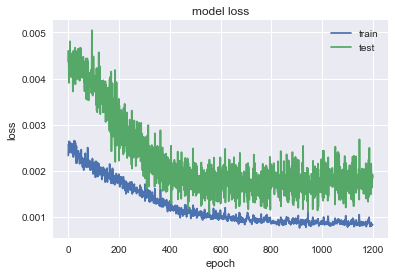

                 T
MSE       0.474557
MAE       0.565269
R2        0.789701
MAPE (%)   1.72325


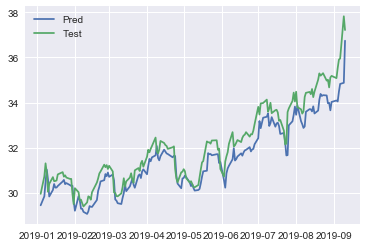

Predicting for  BBY
Train on 1008 samples, validate on 172 samples
Epoch 1/1400
0s - loss: 0.2163 - val_loss: 0.4625
Epoch 2/1400
0s - loss: 0.1753 - val_loss: 0.3949
Epoch 3/1400
0s - loss: 0.1400 - val_loss: 0.3250
Epoch 4/1400
0s - loss: 0.1067 - val_loss: 0.2554
Epoch 5/1400
0s - loss: 0.0799 - val_loss: 0.1906
Epoch 6/1400
0s - loss: 0.0613 - val_loss: 0.1357
Epoch 7/1400
0s - loss: 0.0521 - val_loss: 0.0957
Epoch 8/1400
0s - loss: 0.0511 - val_loss: 0.0715
Epoch 9/1400
0s - loss: 0.0518 - val_loss: 0.0600
Epoch 10/1400
0s - loss: 0.0518 - val_loss: 0.0561
Epoch 11/1400
0s - loss: 0.0479 - val_loss: 0.0549
Epoch 12/1400
0s - loss: 0.0448 - val_loss: 0.0534
Epoch 13/1400
0s - loss: 0.0415 - val_loss: 0.0500
Epoch 14/1400
0s - loss: 0.0379 - val_loss: 0.0451
Epoch 15/1400
0s - loss: 0.0348 - val_loss: 0.0391
Epoch 16/1400
0s - loss: 0.0316 - val_loss: 0.0334
Epoch 17/1400
0s - loss: 0.0285 - val_loss: 0.0285
Epoch 18/1400
0s - loss: 0.0268 - val_loss: 0.0244
Epoch 19/1400
0s - loss:

0s - loss: 0.0027 - val_loss: 0.0017
Epoch 162/1400
0s - loss: 0.0025 - val_loss: 0.0017
Epoch 163/1400
0s - loss: 0.0027 - val_loss: 0.0017
Epoch 164/1400
0s - loss: 0.0025 - val_loss: 0.0017
Epoch 165/1400
0s - loss: 0.0026 - val_loss: 0.0017
Epoch 166/1400
0s - loss: 0.0023 - val_loss: 0.0016
Epoch 167/1400
0s - loss: 0.0026 - val_loss: 0.0016
Epoch 168/1400
0s - loss: 0.0025 - val_loss: 0.0016
Epoch 169/1400
0s - loss: 0.0025 - val_loss: 0.0016
Epoch 170/1400
0s - loss: 0.0025 - val_loss: 0.0016
Epoch 171/1400
0s - loss: 0.0023 - val_loss: 0.0016
Epoch 172/1400
0s - loss: 0.0024 - val_loss: 0.0016
Epoch 173/1400
0s - loss: 0.0026 - val_loss: 0.0016
Epoch 174/1400
0s - loss: 0.0023 - val_loss: 0.0016
Epoch 175/1400
0s - loss: 0.0024 - val_loss: 0.0016
Epoch 176/1400
0s - loss: 0.0024 - val_loss: 0.0016
Epoch 177/1400
0s - loss: 0.0024 - val_loss: 0.0016
Epoch 178/1400
0s - loss: 0.0023 - val_loss: 0.0015
Epoch 179/1400
0s - loss: 0.0022 - val_loss: 0.0015
Epoch 180/1400
0s - loss: 0

0s - loss: 0.0017 - val_loss: 0.0013
Epoch 323/1400
0s - loss: 0.0015 - val_loss: 0.0014
Epoch 324/1400
0s - loss: 0.0016 - val_loss: 0.0013
Epoch 325/1400
0s - loss: 0.0017 - val_loss: 0.0012
Epoch 326/1400
0s - loss: 0.0016 - val_loss: 0.0014
Epoch 327/1400
0s - loss: 0.0016 - val_loss: 0.0011
Epoch 328/1400
0s - loss: 0.0016 - val_loss: 0.0013
Epoch 329/1400
0s - loss: 0.0015 - val_loss: 0.0013
Epoch 330/1400
0s - loss: 0.0015 - val_loss: 0.0013
Epoch 331/1400
0s - loss: 0.0016 - val_loss: 0.0015
Epoch 332/1400
0s - loss: 0.0016 - val_loss: 0.0015
Epoch 333/1400
0s - loss: 0.0015 - val_loss: 0.0016
Epoch 334/1400
0s - loss: 0.0015 - val_loss: 0.0015
Epoch 335/1400
0s - loss: 0.0015 - val_loss: 0.0016
Epoch 336/1400
0s - loss: 0.0016 - val_loss: 0.0013
Epoch 337/1400
0s - loss: 0.0016 - val_loss: 0.0013
Epoch 338/1400
0s - loss: 0.0013 - val_loss: 0.0013
Epoch 339/1400
0s - loss: 0.0016 - val_loss: 0.0014
Epoch 340/1400
0s - loss: 0.0016 - val_loss: 0.0016
Epoch 341/1400
0s - loss: 0

0s - loss: 0.0011 - val_loss: 0.0011
Epoch 482/1400
0s - loss: 0.0012 - val_loss: 0.0012
Epoch 483/1400
0s - loss: 0.0012 - val_loss: 0.0011
Epoch 484/1400
0s - loss: 0.0011 - val_loss: 0.0012
Epoch 485/1400
0s - loss: 0.0013 - val_loss: 8.8711e-04
Epoch 486/1400
0s - loss: 0.0013 - val_loss: 0.0010
Epoch 487/1400
0s - loss: 0.0012 - val_loss: 0.0011
Epoch 488/1400
0s - loss: 0.0013 - val_loss: 0.0013
Epoch 489/1400
0s - loss: 0.0012 - val_loss: 0.0012
Epoch 490/1400
0s - loss: 0.0012 - val_loss: 0.0011
Epoch 491/1400
0s - loss: 0.0011 - val_loss: 0.0011
Epoch 492/1400
0s - loss: 0.0013 - val_loss: 0.0011
Epoch 493/1400
0s - loss: 0.0013 - val_loss: 0.0011
Epoch 494/1400
0s - loss: 0.0012 - val_loss: 0.0012
Epoch 495/1400
0s - loss: 0.0011 - val_loss: 0.0014
Epoch 496/1400
0s - loss: 0.0012 - val_loss: 9.7199e-04
Epoch 497/1400
0s - loss: 0.0011 - val_loss: 0.0012
Epoch 498/1400
0s - loss: 0.0012 - val_loss: 9.2429e-04
Epoch 499/1400
0s - loss: 0.0011 - val_loss: 0.0013
Epoch 500/1400


0s - loss: 9.8939e-04 - val_loss: 0.0013
Epoch 638/1400
0s - loss: 0.0010 - val_loss: 9.3738e-04
Epoch 639/1400
0s - loss: 9.7235e-04 - val_loss: 0.0012
Epoch 640/1400
0s - loss: 8.9950e-04 - val_loss: 9.8248e-04
Epoch 641/1400
0s - loss: 9.3232e-04 - val_loss: 8.5412e-04
Epoch 642/1400
0s - loss: 9.3791e-04 - val_loss: 0.0012
Epoch 643/1400
0s - loss: 0.0011 - val_loss: 6.5835e-04
Epoch 644/1400
0s - loss: 0.0012 - val_loss: 0.0014
Epoch 645/1400
0s - loss: 0.0011 - val_loss: 7.0993e-04
Epoch 646/1400
0s - loss: 0.0011 - val_loss: 0.0010
Epoch 647/1400
0s - loss: 8.3742e-04 - val_loss: 8.6616e-04
Epoch 648/1400
0s - loss: 9.8862e-04 - val_loss: 9.1411e-04
Epoch 649/1400
0s - loss: 0.0010 - val_loss: 7.8537e-04
Epoch 650/1400
0s - loss: 0.0011 - val_loss: 0.0011
Epoch 651/1400
0s - loss: 0.0010 - val_loss: 6.9094e-04
Epoch 652/1400
0s - loss: 0.0010 - val_loss: 0.0012
Epoch 653/1400
0s - loss: 0.0011 - val_loss: 7.0643e-04
Epoch 654/1400
0s - loss: 9.4888e-04 - val_loss: 0.0013
Epoch 6

0s - loss: 8.9327e-04 - val_loss: 8.6703e-04
Epoch 781/1400
0s - loss: 8.6980e-04 - val_loss: 9.4077e-04
Epoch 782/1400
0s - loss: 9.4680e-04 - val_loss: 7.4838e-04
Epoch 783/1400
0s - loss: 0.0011 - val_loss: 0.0012
Epoch 784/1400
0s - loss: 0.0011 - val_loss: 6.4592e-04
Epoch 785/1400
0s - loss: 9.0180e-04 - val_loss: 0.0011
Epoch 786/1400
0s - loss: 8.8523e-04 - val_loss: 7.2995e-04
Epoch 787/1400
0s - loss: 8.1444e-04 - val_loss: 0.0011
Epoch 788/1400
0s - loss: 8.3732e-04 - val_loss: 9.0068e-04
Epoch 789/1400
0s - loss: 8.4163e-04 - val_loss: 8.3678e-04
Epoch 790/1400
0s - loss: 9.1954e-04 - val_loss: 9.1988e-04
Epoch 791/1400
0s - loss: 7.7875e-04 - val_loss: 9.2500e-04
Epoch 792/1400
0s - loss: 8.7102e-04 - val_loss: 7.9993e-04
Epoch 793/1400
0s - loss: 7.8945e-04 - val_loss: 9.7645e-04
Epoch 794/1400
0s - loss: 8.8219e-04 - val_loss: 7.2698e-04
Epoch 795/1400
0s - loss: 9.7886e-04 - val_loss: 0.0012
Epoch 796/1400
0s - loss: 8.9896e-04 - val_loss: 7.0765e-04
Epoch 797/1400
0s -

0s - loss: 8.1250e-04 - val_loss: 7.4806e-04
Epoch 925/1400
0s - loss: 7.9217e-04 - val_loss: 6.9082e-04
Epoch 926/1400
0s - loss: 8.0356e-04 - val_loss: 8.1159e-04
Epoch 927/1400
0s - loss: 8.8532e-04 - val_loss: 7.8792e-04
Epoch 928/1400
0s - loss: 7.4185e-04 - val_loss: 8.2193e-04
Epoch 929/1400
0s - loss: 8.9982e-04 - val_loss: 8.2208e-04
Epoch 930/1400
0s - loss: 7.3636e-04 - val_loss: 8.2597e-04
Epoch 931/1400
0s - loss: 8.2700e-04 - val_loss: 7.9990e-04
Epoch 932/1400
0s - loss: 7.8068e-04 - val_loss: 8.9809e-04
Epoch 933/1400
0s - loss: 7.8108e-04 - val_loss: 7.6529e-04
Epoch 934/1400
0s - loss: 8.6434e-04 - val_loss: 9.4483e-04
Epoch 935/1400
0s - loss: 7.8871e-04 - val_loss: 8.8415e-04
Epoch 936/1400
0s - loss: 8.2841e-04 - val_loss: 8.8716e-04
Epoch 937/1400
0s - loss: 8.6715e-04 - val_loss: 8.5497e-04
Epoch 938/1400
0s - loss: 7.4276e-04 - val_loss: 8.7259e-04
Epoch 939/1400
0s - loss: 8.2557e-04 - val_loss: 8.0631e-04
Epoch 940/1400
0s - loss: 7.7770e-04 - val_loss: 8.4709

0s - loss: 7.8240e-04 - val_loss: 9.6141e-04
Epoch 1065/1400
0s - loss: 8.5367e-04 - val_loss: 6.6315e-04
Epoch 1066/1400
0s - loss: 9.5669e-04 - val_loss: 9.0111e-04
Epoch 1067/1400
0s - loss: 8.1385e-04 - val_loss: 7.3422e-04
Epoch 1068/1400
0s - loss: 7.8460e-04 - val_loss: 8.3780e-04
Epoch 1069/1400
0s - loss: 8.8396e-04 - val_loss: 0.0010
Epoch 1070/1400
0s - loss: 9.1182e-04 - val_loss: 6.2773e-04
Epoch 1071/1400
0s - loss: 9.7236e-04 - val_loss: 9.2352e-04
Epoch 1072/1400
0s - loss: 8.5220e-04 - val_loss: 6.6580e-04
Epoch 1073/1400
0s - loss: 8.0635e-04 - val_loss: 8.3958e-04
Epoch 1074/1400
0s - loss: 8.0130e-04 - val_loss: 6.9030e-04
Epoch 1075/1400
0s - loss: 7.4538e-04 - val_loss: 7.2955e-04
Epoch 1076/1400
0s - loss: 8.3451e-04 - val_loss: 8.0462e-04
Epoch 1077/1400
0s - loss: 7.8368e-04 - val_loss: 7.0425e-04
Epoch 1078/1400
0s - loss: 7.8455e-04 - val_loss: 7.0780e-04
Epoch 1079/1400
0s - loss: 7.6326e-04 - val_loss: 7.1194e-04
Epoch 1080/1400
0s - loss: 8.4259e-04 - val_

0s - loss: 7.8479e-04 - val_loss: 7.2478e-04
Epoch 1200/1400
0s - loss: 8.2385e-04 - val_loss: 0.0011
Epoch 1201/1400
0s - loss: 8.8332e-04 - val_loss: 6.3924e-04
Epoch 1202/1400
0s - loss: 8.3961e-04 - val_loss: 9.2734e-04
Epoch 1203/1400
0s - loss: 7.5015e-04 - val_loss: 7.1316e-04
Epoch 1204/1400
0s - loss: 7.0980e-04 - val_loss: 7.9333e-04
Epoch 1205/1400
0s - loss: 8.0162e-04 - val_loss: 7.6723e-04
Epoch 1206/1400
0s - loss: 7.6845e-04 - val_loss: 6.9752e-04
Epoch 1207/1400
0s - loss: 8.4674e-04 - val_loss: 7.5048e-04
Epoch 1208/1400
0s - loss: 7.1314e-04 - val_loss: 7.0081e-04
Epoch 1209/1400
0s - loss: 7.4080e-04 - val_loss: 6.7006e-04
Epoch 1210/1400
0s - loss: 7.8753e-04 - val_loss: 8.6867e-04
Epoch 1211/1400
0s - loss: 8.7723e-04 - val_loss: 6.2658e-04
Epoch 1212/1400
0s - loss: 8.6967e-04 - val_loss: 9.2976e-04
Epoch 1213/1400
0s - loss: 9.4554e-04 - val_loss: 6.7227e-04
Epoch 1214/1400
0s - loss: 8.1944e-04 - val_loss: 7.8360e-04
Epoch 1215/1400
0s - loss: 8.8417e-04 - val_

0s - loss: 7.7162e-04 - val_loss: 8.4495e-04
Epoch 1336/1400
0s - loss: 8.1536e-04 - val_loss: 6.2622e-04
Epoch 1337/1400
0s - loss: 7.4032e-04 - val_loss: 9.2554e-04
Epoch 1338/1400
0s - loss: 7.3267e-04 - val_loss: 6.6543e-04
Epoch 1339/1400
0s - loss: 7.2553e-04 - val_loss: 7.1552e-04
Epoch 1340/1400
0s - loss: 7.7226e-04 - val_loss: 8.2531e-04
Epoch 1341/1400
0s - loss: 8.6303e-04 - val_loss: 6.4863e-04
Epoch 1342/1400
0s - loss: 9.3175e-04 - val_loss: 9.6960e-04
Epoch 1343/1400
0s - loss: 9.9812e-04 - val_loss: 6.5033e-04
Epoch 1344/1400
0s - loss: 9.1140e-04 - val_loss: 9.5487e-04
Epoch 1345/1400
0s - loss: 8.2318e-04 - val_loss: 6.7142e-04
Epoch 1346/1400
0s - loss: 7.3639e-04 - val_loss: 7.6170e-04
Epoch 1347/1400
0s - loss: 7.5275e-04 - val_loss: 8.1507e-04
Epoch 1348/1400
0s - loss: 7.9113e-04 - val_loss: 7.7680e-04
Epoch 1349/1400
0s - loss: 7.4558e-04 - val_loss: 6.8890e-04
Epoch 1350/1400
0s - loss: 7.1636e-04 - val_loss: 7.8320e-04
Epoch 1351/1400
0s - loss: 7.8806e-04 - 

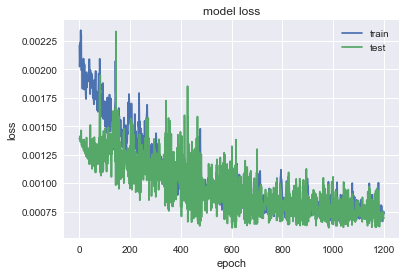

              BBY
MSE       2.30507
MAE       1.07691
R2        0.93093
MAPE (%)  1.58946


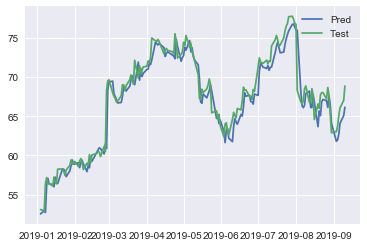

Predicting for  KO
Train on 1008 samples, validate on 172 samples
Epoch 1/1400
0s - loss: 0.0935 - val_loss: 0.3556
Epoch 2/1400
0s - loss: 0.0546 - val_loss: 0.2775
Epoch 3/1400
0s - loss: 0.0293 - val_loss: 0.2078
Epoch 4/1400
0s - loss: 0.0170 - val_loss: 0.1540
Epoch 5/1400
0s - loss: 0.0154 - val_loss: 0.1248
Epoch 6/1400
0s - loss: 0.0175 - val_loss: 0.1176
Epoch 7/1400
0s - loss: 0.0173 - val_loss: 0.1212
Epoch 8/1400
0s - loss: 0.0162 - val_loss: 0.1267
Epoch 9/1400
0s - loss: 0.0151 - val_loss: 0.1286
Epoch 10/1400
0s - loss: 0.0142 - val_loss: 0.1263
Epoch 11/1400
0s - loss: 0.0140 - val_loss: 0.1217
Epoch 12/1400
0s - loss: 0.0134 - val_loss: 0.1165
Epoch 13/1400
0s - loss: 0.0132 - val_loss: 0.1120
Epoch 14/1400
0s - loss: 0.0129 - val_loss: 0.1085
Epoch 15/1400
0s - loss: 0.0124 - val_loss: 0.1060
Epoch 16/1400
0s - loss: 0.0122 - val_loss: 0.1037
Epoch 17/1400
0s - loss: 0.0118 - val_loss: 0.1011
Epoch 18/1400
0s - loss: 0.0115 - val_loss: 0.0981
Epoch 19/1400
0s - loss: 

0s - loss: 0.0012 - val_loss: 0.0044
Epoch 164/1400
0s - loss: 0.0013 - val_loss: 0.0047
Epoch 165/1400
0s - loss: 0.0013 - val_loss: 0.0044
Epoch 166/1400
0s - loss: 0.0012 - val_loss: 0.0047
Epoch 167/1400
0s - loss: 0.0013 - val_loss: 0.0043
Epoch 168/1400
0s - loss: 0.0013 - val_loss: 0.0043
Epoch 169/1400
0s - loss: 0.0012 - val_loss: 0.0043
Epoch 170/1400
0s - loss: 0.0012 - val_loss: 0.0037
Epoch 171/1400
0s - loss: 0.0012 - val_loss: 0.0039
Epoch 172/1400
0s - loss: 0.0012 - val_loss: 0.0039
Epoch 173/1400
0s - loss: 0.0013 - val_loss: 0.0037
Epoch 174/1400
0s - loss: 0.0012 - val_loss: 0.0041
Epoch 175/1400
0s - loss: 0.0012 - val_loss: 0.0033
Epoch 176/1400
0s - loss: 0.0012 - val_loss: 0.0044
Epoch 177/1400
0s - loss: 0.0012 - val_loss: 0.0034
Epoch 178/1400
0s - loss: 0.0012 - val_loss: 0.0038
Epoch 179/1400
0s - loss: 0.0012 - val_loss: 0.0036
Epoch 180/1400
0s - loss: 0.0013 - val_loss: 0.0035
Epoch 181/1400
0s - loss: 0.0013 - val_loss: 0.0034
Epoch 182/1400
0s - loss: 0

0s - loss: 8.9807e-04 - val_loss: 0.0016
Epoch 320/1400
0s - loss: 8.7154e-04 - val_loss: 0.0012
Epoch 321/1400
0s - loss: 8.6833e-04 - val_loss: 0.0015
Epoch 322/1400
0s - loss: 9.4883e-04 - val_loss: 0.0011
Epoch 323/1400
0s - loss: 0.0010 - val_loss: 0.0016
Epoch 324/1400
0s - loss: 9.6786e-04 - val_loss: 9.9028e-04
Epoch 325/1400
0s - loss: 9.7806e-04 - val_loss: 0.0014
Epoch 326/1400
0s - loss: 9.3263e-04 - val_loss: 0.0012
Epoch 327/1400
0s - loss: 8.9093e-04 - val_loss: 0.0015
Epoch 328/1400
0s - loss: 8.9889e-04 - val_loss: 0.0014
Epoch 329/1400
0s - loss: 9.1613e-04 - val_loss: 0.0015
Epoch 330/1400
0s - loss: 9.5727e-04 - val_loss: 0.0012
Epoch 331/1400
0s - loss: 8.4764e-04 - val_loss: 0.0014
Epoch 332/1400
0s - loss: 9.2178e-04 - val_loss: 0.0019
Epoch 333/1400
0s - loss: 9.9104e-04 - val_loss: 0.0012
Epoch 334/1400
0s - loss: 0.0011 - val_loss: 0.0019
Epoch 335/1400
0s - loss: 0.0010 - val_loss: 0.0012
Epoch 336/1400
0s - loss: 9.2168e-04 - val_loss: 0.0018
Epoch 337/1400


0s - loss: 7.2101e-04 - val_loss: 0.0019
Epoch 470/1400
0s - loss: 7.2648e-04 - val_loss: 0.0018
Epoch 471/1400
0s - loss: 7.4907e-04 - val_loss: 0.0018
Epoch 472/1400
0s - loss: 6.9609e-04 - val_loss: 0.0020
Epoch 473/1400
0s - loss: 7.0629e-04 - val_loss: 0.0019
Epoch 474/1400
0s - loss: 7.0120e-04 - val_loss: 0.0019
Epoch 475/1400
0s - loss: 7.3800e-04 - val_loss: 0.0016
Epoch 476/1400
0s - loss: 7.5824e-04 - val_loss: 0.0019
Epoch 477/1400
0s - loss: 7.6487e-04 - val_loss: 0.0017
Epoch 478/1400
0s - loss: 7.0427e-04 - val_loss: 0.0021
Epoch 479/1400
0s - loss: 7.3144e-04 - val_loss: 0.0020
Epoch 480/1400
0s - loss: 6.8110e-04 - val_loss: 0.0019
Epoch 481/1400
0s - loss: 6.9368e-04 - val_loss: 0.0023
Epoch 482/1400
0s - loss: 6.7006e-04 - val_loss: 0.0020
Epoch 483/1400
0s - loss: 7.3434e-04 - val_loss: 0.0018
Epoch 484/1400
0s - loss: 7.0591e-04 - val_loss: 0.0023
Epoch 485/1400
0s - loss: 7.4797e-04 - val_loss: 0.0017
Epoch 486/1400
0s - loss: 7.4610e-04 - val_loss: 0.0021
Epoch 4

0s - loss: 5.7886e-04 - val_loss: 0.0024
Epoch 617/1400
0s - loss: 6.2470e-04 - val_loss: 0.0024
Epoch 618/1400
0s - loss: 6.3820e-04 - val_loss: 0.0023
Epoch 619/1400
0s - loss: 6.0955e-04 - val_loss: 0.0028
Epoch 620/1400
0s - loss: 6.6308e-04 - val_loss: 0.0027
Epoch 621/1400
0s - loss: 6.1241e-04 - val_loss: 0.0024
Epoch 622/1400
0s - loss: 6.3602e-04 - val_loss: 0.0027
Epoch 623/1400
0s - loss: 6.8838e-04 - val_loss: 0.0024
Epoch 624/1400
0s - loss: 6.4279e-04 - val_loss: 0.0024
Epoch 625/1400
0s - loss: 6.6559e-04 - val_loss: 0.0027
Epoch 626/1400
0s - loss: 7.1135e-04 - val_loss: 0.0026
Epoch 627/1400
0s - loss: 6.4061e-04 - val_loss: 0.0031
Epoch 628/1400
0s - loss: 6.6524e-04 - val_loss: 0.0029
Epoch 629/1400
0s - loss: 6.5493e-04 - val_loss: 0.0021
Epoch 630/1400
0s - loss: 6.0907e-04 - val_loss: 0.0027
Epoch 631/1400
0s - loss: 6.3315e-04 - val_loss: 0.0024
Epoch 632/1400
0s - loss: 6.7818e-04 - val_loss: 0.0030
Epoch 633/1400
0s - loss: 6.4061e-04 - val_loss: 0.0025
Epoch 6

0s - loss: 6.3760e-04 - val_loss: 0.0030
Epoch 767/1400
0s - loss: 6.4180e-04 - val_loss: 0.0030
Epoch 768/1400
0s - loss: 6.4647e-04 - val_loss: 0.0032
Epoch 769/1400
0s - loss: 7.3414e-04 - val_loss: 0.0037
Epoch 770/1400
0s - loss: 6.3248e-04 - val_loss: 0.0025
Epoch 771/1400
0s - loss: 6.1414e-04 - val_loss: 0.0031
Epoch 772/1400
0s - loss: 5.8663e-04 - val_loss: 0.0030
Epoch 773/1400
0s - loss: 5.8646e-04 - val_loss: 0.0033
Epoch 774/1400
0s - loss: 6.2233e-04 - val_loss: 0.0030
Epoch 775/1400
0s - loss: 5.8198e-04 - val_loss: 0.0033
Epoch 776/1400
0s - loss: 5.8236e-04 - val_loss: 0.0029
Epoch 777/1400
0s - loss: 6.1538e-04 - val_loss: 0.0029
Epoch 778/1400
0s - loss: 6.0866e-04 - val_loss: 0.0027
Epoch 779/1400
0s - loss: 5.5309e-04 - val_loss: 0.0028
Epoch 780/1400
0s - loss: 5.8703e-04 - val_loss: 0.0030
Epoch 781/1400
0s - loss: 5.7222e-04 - val_loss: 0.0030
Epoch 782/1400
0s - loss: 5.7903e-04 - val_loss: 0.0030
Epoch 783/1400
0s - loss: 5.9398e-04 - val_loss: 0.0031
Epoch 7

Epoch 915/1400
0s - loss: 5.9565e-04 - val_loss: 0.0031
Epoch 916/1400
0s - loss: 5.6638e-04 - val_loss: 0.0031
Epoch 917/1400
0s - loss: 5.6656e-04 - val_loss: 0.0029
Epoch 918/1400
0s - loss: 5.8650e-04 - val_loss: 0.0030
Epoch 919/1400
0s - loss: 6.3714e-04 - val_loss: 0.0032
Epoch 920/1400
0s - loss: 5.7817e-04 - val_loss: 0.0028
Epoch 921/1400
0s - loss: 6.0935e-04 - val_loss: 0.0029
Epoch 922/1400
0s - loss: 5.8711e-04 - val_loss: 0.0030
Epoch 923/1400
0s - loss: 5.9553e-04 - val_loss: 0.0028
Epoch 924/1400
0s - loss: 5.8562e-04 - val_loss: 0.0030
Epoch 925/1400
0s - loss: 5.8989e-04 - val_loss: 0.0031
Epoch 926/1400
0s - loss: 5.8863e-04 - val_loss: 0.0027
Epoch 927/1400
0s - loss: 6.0157e-04 - val_loss: 0.0030
Epoch 928/1400
0s - loss: 5.9519e-04 - val_loss: 0.0029
Epoch 929/1400
0s - loss: 5.5209e-04 - val_loss: 0.0028
Epoch 930/1400
0s - loss: 5.7508e-04 - val_loss: 0.0031
Epoch 931/1400
0s - loss: 5.7279e-04 - val_loss: 0.0031
Epoch 932/1400
0s - loss: 5.3794e-04 - val_loss:

0s - loss: 5.4641e-04 - val_loss: 0.0034
Epoch 1061/1400
0s - loss: 5.7163e-04 - val_loss: 0.0036
Epoch 1062/1400
0s - loss: 5.6471e-04 - val_loss: 0.0035
Epoch 1063/1400
0s - loss: 5.8745e-04 - val_loss: 0.0036
Epoch 1064/1400
0s - loss: 5.8917e-04 - val_loss: 0.0036
Epoch 1065/1400
0s - loss: 5.7765e-04 - val_loss: 0.0039
Epoch 1066/1400
0s - loss: 5.6811e-04 - val_loss: 0.0037
Epoch 1067/1400
0s - loss: 5.7062e-04 - val_loss: 0.0031
Epoch 1068/1400
0s - loss: 5.9376e-04 - val_loss: 0.0034
Epoch 1069/1400
0s - loss: 5.7235e-04 - val_loss: 0.0035
Epoch 1070/1400
0s - loss: 5.7649e-04 - val_loss: 0.0037
Epoch 1071/1400
0s - loss: 5.8504e-04 - val_loss: 0.0037
Epoch 1072/1400
0s - loss: 5.8282e-04 - val_loss: 0.0037
Epoch 1073/1400
0s - loss: 5.6518e-04 - val_loss: 0.0038
Epoch 1074/1400
0s - loss: 6.1848e-04 - val_loss: 0.0035
Epoch 1075/1400
0s - loss: 6.2280e-04 - val_loss: 0.0034
Epoch 1076/1400
0s - loss: 6.1704e-04 - val_loss: 0.0035
Epoch 1077/1400
0s - loss: 6.5837e-04 - val_los

0s - loss: 5.4883e-04 - val_loss: 0.0033
Epoch 1207/1400
0s - loss: 5.6875e-04 - val_loss: 0.0040
Epoch 1208/1400
0s - loss: 5.5842e-04 - val_loss: 0.0037
Epoch 1209/1400
0s - loss: 5.8808e-04 - val_loss: 0.0037
Epoch 1210/1400
0s - loss: 5.3172e-04 - val_loss: 0.0037
Epoch 1211/1400
0s - loss: 5.6187e-04 - val_loss: 0.0033
Epoch 1212/1400
0s - loss: 5.3651e-04 - val_loss: 0.0034
Epoch 1213/1400
0s - loss: 5.4431e-04 - val_loss: 0.0034
Epoch 1214/1400
0s - loss: 5.6050e-04 - val_loss: 0.0035
Epoch 1215/1400
0s - loss: 5.4927e-04 - val_loss: 0.0035
Epoch 1216/1400
0s - loss: 5.6503e-04 - val_loss: 0.0036
Epoch 1217/1400
0s - loss: 5.6580e-04 - val_loss: 0.0037
Epoch 1218/1400
0s - loss: 5.4360e-04 - val_loss: 0.0037
Epoch 1219/1400
0s - loss: 5.5306e-04 - val_loss: 0.0034
Epoch 1220/1400
0s - loss: 5.3702e-04 - val_loss: 0.0033
Epoch 1221/1400
0s - loss: 5.9216e-04 - val_loss: 0.0035
Epoch 1222/1400
0s - loss: 6.0583e-04 - val_loss: 0.0035
Epoch 1223/1400
0s - loss: 6.3883e-04 - val_los

0s - loss: 5.9879e-04 - val_loss: 0.0038
Epoch 1353/1400
0s - loss: 5.6522e-04 - val_loss: 0.0037
Epoch 1354/1400
0s - loss: 5.5377e-04 - val_loss: 0.0042
Epoch 1355/1400
0s - loss: 5.3921e-04 - val_loss: 0.0038
Epoch 1356/1400
0s - loss: 5.5121e-04 - val_loss: 0.0036
Epoch 1357/1400
0s - loss: 5.5921e-04 - val_loss: 0.0036
Epoch 1358/1400
0s - loss: 5.5039e-04 - val_loss: 0.0038
Epoch 1359/1400
0s - loss: 5.5709e-04 - val_loss: 0.0039
Epoch 1360/1400
0s - loss: 5.7621e-04 - val_loss: 0.0038
Epoch 1361/1400
0s - loss: 5.5824e-04 - val_loss: 0.0040
Epoch 1362/1400
0s - loss: 5.5660e-04 - val_loss: 0.0037
Epoch 1363/1400
0s - loss: 5.3764e-04 - val_loss: 0.0037
Epoch 1364/1400
0s - loss: 5.3004e-04 - val_loss: 0.0038
Epoch 1365/1400
0s - loss: 5.8325e-04 - val_loss: 0.0038
Epoch 1366/1400
0s - loss: 5.1873e-04 - val_loss: 0.0037
Epoch 1367/1400
0s - loss: 5.3224e-04 - val_loss: 0.0037
Epoch 1368/1400
0s - loss: 5.8746e-04 - val_loss: 0.0037
Epoch 1369/1400
0s - loss: 5.6680e-04 - val_los

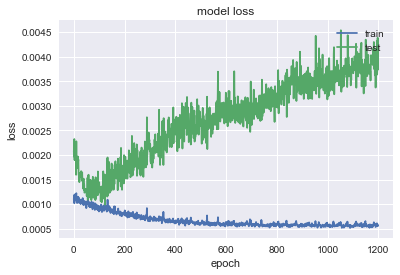

                KO
MSE        1.17945
MAE       0.867112
R2        0.797018
MAPE (%)   1.68904


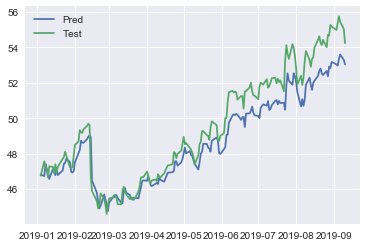

Predicting for  FTI
Train on 1008 samples, validate on 172 samples
Epoch 1/1400
0s - loss: 0.1872 - val_loss: 0.0117
Epoch 2/1400
0s - loss: 0.1326 - val_loss: 0.0023
Epoch 3/1400
0s - loss: 0.0918 - val_loss: 0.0042
Epoch 4/1400
0s - loss: 0.0615 - val_loss: 0.0190
Epoch 5/1400
0s - loss: 0.0449 - val_loss: 0.0416
Epoch 6/1400
0s - loss: 0.0384 - val_loss: 0.0589
Epoch 7/1400
0s - loss: 0.0358 - val_loss: 0.0623
Epoch 8/1400
0s - loss: 0.0320 - val_loss: 0.0561
Epoch 9/1400
0s - loss: 0.0309 - val_loss: 0.0480
Epoch 10/1400
0s - loss: 0.0295 - val_loss: 0.0416
Epoch 11/1400
0s - loss: 0.0283 - val_loss: 0.0378
Epoch 12/1400
0s - loss: 0.0273 - val_loss: 0.0359
Epoch 13/1400
0s - loss: 0.0266 - val_loss: 0.0347
Epoch 14/1400
0s - loss: 0.0253 - val_loss: 0.0336
Epoch 15/1400
0s - loss: 0.0244 - val_loss: 0.0323
Epoch 16/1400
0s - loss: 0.0239 - val_loss: 0.0307
Epoch 17/1400
0s - loss: 0.0228 - val_loss: 0.0289
Epoch 18/1400
0s - loss: 0.0217 - val_loss: 0.0272
Epoch 19/1400
0s - loss:

0s - loss: 0.0022 - val_loss: 0.0015
Epoch 161/1400
0s - loss: 0.0021 - val_loss: 0.0014
Epoch 162/1400
0s - loss: 0.0020 - val_loss: 0.0014
Epoch 163/1400
0s - loss: 0.0020 - val_loss: 0.0014
Epoch 164/1400
0s - loss: 0.0020 - val_loss: 0.0014
Epoch 165/1400
0s - loss: 0.0021 - val_loss: 0.0014
Epoch 166/1400
0s - loss: 0.0020 - val_loss: 0.0014
Epoch 167/1400
0s - loss: 0.0021 - val_loss: 0.0014
Epoch 168/1400
0s - loss: 0.0022 - val_loss: 0.0014
Epoch 169/1400
0s - loss: 0.0020 - val_loss: 0.0014
Epoch 170/1400
0s - loss: 0.0020 - val_loss: 0.0015
Epoch 171/1400
0s - loss: 0.0017 - val_loss: 0.0014
Epoch 172/1400
0s - loss: 0.0021 - val_loss: 0.0014
Epoch 173/1400
0s - loss: 0.0019 - val_loss: 0.0014
Epoch 174/1400
0s - loss: 0.0020 - val_loss: 0.0013
Epoch 175/1400
0s - loss: 0.0020 - val_loss: 0.0014
Epoch 176/1400
0s - loss: 0.0019 - val_loss: 0.0013
Epoch 177/1400
0s - loss: 0.0020 - val_loss: 0.0014
Epoch 178/1400
0s - loss: 0.0020 - val_loss: 0.0014
Epoch 179/1400
0s - loss: 0

0s - loss: 0.0016 - val_loss: 0.0018
Epoch 320/1400
0s - loss: 0.0014 - val_loss: 0.0020
Epoch 321/1400
0s - loss: 0.0015 - val_loss: 0.0018
Epoch 322/1400
0s - loss: 0.0016 - val_loss: 0.0020
Epoch 323/1400
0s - loss: 0.0016 - val_loss: 0.0018
Epoch 324/1400
0s - loss: 0.0016 - val_loss: 0.0021
Epoch 325/1400
0s - loss: 0.0015 - val_loss: 0.0017
Epoch 326/1400
0s - loss: 0.0015 - val_loss: 0.0021
Epoch 327/1400
0s - loss: 0.0015 - val_loss: 0.0019
Epoch 328/1400
0s - loss: 0.0015 - val_loss: 0.0020
Epoch 329/1400
0s - loss: 0.0016 - val_loss: 0.0016
Epoch 330/1400
0s - loss: 0.0015 - val_loss: 0.0021
Epoch 331/1400
0s - loss: 0.0017 - val_loss: 0.0018
Epoch 332/1400
0s - loss: 0.0015 - val_loss: 0.0021
Epoch 333/1400
0s - loss: 0.0016 - val_loss: 0.0016
Epoch 334/1400
0s - loss: 0.0016 - val_loss: 0.0020
Epoch 335/1400
0s - loss: 0.0017 - val_loss: 0.0016
Epoch 336/1400
0s - loss: 0.0016 - val_loss: 0.0022
Epoch 337/1400
0s - loss: 0.0015 - val_loss: 0.0018
Epoch 338/1400
0s - loss: 0

0s - loss: 0.0014 - val_loss: 0.0016
Epoch 478/1400
0s - loss: 0.0012 - val_loss: 0.0016
Epoch 479/1400
0s - loss: 0.0012 - val_loss: 0.0016
Epoch 480/1400
0s - loss: 0.0013 - val_loss: 0.0019
Epoch 481/1400
0s - loss: 0.0013 - val_loss: 0.0015
Epoch 482/1400
0s - loss: 0.0013 - val_loss: 0.0017
Epoch 483/1400
0s - loss: 0.0012 - val_loss: 0.0016
Epoch 484/1400
0s - loss: 0.0012 - val_loss: 0.0015
Epoch 485/1400
0s - loss: 0.0012 - val_loss: 0.0017
Epoch 486/1400
0s - loss: 0.0012 - val_loss: 0.0017
Epoch 487/1400
0s - loss: 0.0011 - val_loss: 0.0019
Epoch 488/1400
0s - loss: 0.0011 - val_loss: 0.0018
Epoch 489/1400
0s - loss: 0.0013 - val_loss: 0.0016
Epoch 490/1400
0s - loss: 0.0012 - val_loss: 0.0019
Epoch 491/1400
0s - loss: 0.0012 - val_loss: 0.0016
Epoch 492/1400
0s - loss: 0.0012 - val_loss: 0.0016
Epoch 493/1400
0s - loss: 0.0012 - val_loss: 0.0019
Epoch 494/1400
0s - loss: 0.0012 - val_loss: 0.0015
Epoch 495/1400
0s - loss: 0.0012 - val_loss: 0.0019
Epoch 496/1400
0s - loss: 0

0s - loss: 9.0846e-04 - val_loss: 0.0017
Epoch 637/1400
0s - loss: 9.7145e-04 - val_loss: 0.0015
Epoch 638/1400
0s - loss: 9.5931e-04 - val_loss: 0.0013
Epoch 639/1400
0s - loss: 9.7312e-04 - val_loss: 0.0017
Epoch 640/1400
0s - loss: 9.5485e-04 - val_loss: 0.0017
Epoch 641/1400
0s - loss: 0.0010 - val_loss: 0.0013
Epoch 642/1400
0s - loss: 0.0010 - val_loss: 0.0020
Epoch 643/1400
0s - loss: 9.4249e-04 - val_loss: 0.0013
Epoch 644/1400
0s - loss: 9.1117e-04 - val_loss: 0.0016
Epoch 645/1400
0s - loss: 9.5658e-04 - val_loss: 0.0016
Epoch 646/1400
0s - loss: 9.7017e-04 - val_loss: 0.0013
Epoch 647/1400
0s - loss: 9.7640e-04 - val_loss: 0.0018
Epoch 648/1400
0s - loss: 0.0010 - val_loss: 0.0013
Epoch 649/1400
0s - loss: 0.0011 - val_loss: 0.0014
Epoch 650/1400
0s - loss: 9.8232e-04 - val_loss: 0.0018
Epoch 651/1400
0s - loss: 9.4158e-04 - val_loss: 0.0011
Epoch 652/1400
0s - loss: 9.0188e-04 - val_loss: 0.0015
Epoch 653/1400
0s - loss: 9.7965e-04 - val_loss: 0.0013
Epoch 654/1400
0s - los

0s - loss: 8.1400e-04 - val_loss: 0.0012
Epoch 785/1400
0s - loss: 8.1587e-04 - val_loss: 0.0013
Epoch 786/1400
0s - loss: 8.5080e-04 - val_loss: 0.0013
Epoch 787/1400
0s - loss: 8.2160e-04 - val_loss: 0.0013
Epoch 788/1400
0s - loss: 7.7161e-04 - val_loss: 0.0014
Epoch 789/1400
0s - loss: 8.5111e-04 - val_loss: 0.0014
Epoch 790/1400
0s - loss: 8.7667e-04 - val_loss: 0.0011
Epoch 791/1400
0s - loss: 8.1655e-04 - val_loss: 0.0015
Epoch 792/1400
0s - loss: 9.1771e-04 - val_loss: 0.0013
Epoch 793/1400
0s - loss: 8.3367e-04 - val_loss: 0.0013
Epoch 794/1400
0s - loss: 8.2999e-04 - val_loss: 0.0013
Epoch 795/1400
0s - loss: 7.9971e-04 - val_loss: 0.0012
Epoch 796/1400
0s - loss: 8.4435e-04 - val_loss: 0.0012
Epoch 797/1400
0s - loss: 7.9176e-04 - val_loss: 0.0011
Epoch 798/1400
0s - loss: 8.9478e-04 - val_loss: 0.0014
Epoch 799/1400
0s - loss: 8.9498e-04 - val_loss: 0.0013
Epoch 800/1400
0s - loss: 7.9728e-04 - val_loss: 0.0011
Epoch 801/1400
0s - loss: 8.5827e-04 - val_loss: 0.0015
Epoch 8

0s - loss: 8.2377e-04 - val_loss: 0.0011
Epoch 933/1400
0s - loss: 7.9293e-04 - val_loss: 0.0011
Epoch 934/1400
0s - loss: 8.3076e-04 - val_loss: 0.0012
Epoch 935/1400
0s - loss: 8.8022e-04 - val_loss: 0.0010
Epoch 936/1400
0s - loss: 8.2067e-04 - val_loss: 9.6850e-04
Epoch 937/1400
0s - loss: 8.2472e-04 - val_loss: 9.7344e-04
Epoch 938/1400
0s - loss: 8.1712e-04 - val_loss: 0.0014
Epoch 939/1400
0s - loss: 7.8883e-04 - val_loss: 0.0011
Epoch 940/1400
0s - loss: 7.8766e-04 - val_loss: 0.0010
Epoch 941/1400
0s - loss: 7.7546e-04 - val_loss: 0.0012
Epoch 942/1400
0s - loss: 8.2130e-04 - val_loss: 0.0011
Epoch 943/1400
0s - loss: 8.2406e-04 - val_loss: 0.0010
Epoch 944/1400
0s - loss: 8.0625e-04 - val_loss: 0.0012
Epoch 945/1400
0s - loss: 7.9803e-04 - val_loss: 9.5305e-04
Epoch 946/1400
0s - loss: 8.1335e-04 - val_loss: 0.0011
Epoch 947/1400
0s - loss: 8.0863e-04 - val_loss: 0.0012
Epoch 948/1400
0s - loss: 7.5834e-04 - val_loss: 9.4746e-04
Epoch 949/1400
0s - loss: 8.4173e-04 - val_loss

0s - loss: 7.7332e-04 - val_loss: 9.8208e-04
Epoch 1077/1400
0s - loss: 7.5609e-04 - val_loss: 0.0010
Epoch 1078/1400
0s - loss: 8.0373e-04 - val_loss: 0.0011
Epoch 1079/1400
0s - loss: 7.6156e-04 - val_loss: 8.3238e-04
Epoch 1080/1400
0s - loss: 7.9212e-04 - val_loss: 0.0011
Epoch 1081/1400
0s - loss: 8.0002e-04 - val_loss: 0.0010
Epoch 1082/1400
0s - loss: 8.2765e-04 - val_loss: 0.0012
Epoch 1083/1400
0s - loss: 7.3111e-04 - val_loss: 9.8389e-04
Epoch 1084/1400
0s - loss: 7.4343e-04 - val_loss: 0.0011
Epoch 1085/1400
0s - loss: 8.0364e-04 - val_loss: 9.4352e-04
Epoch 1086/1400
0s - loss: 7.6059e-04 - val_loss: 0.0010
Epoch 1087/1400
0s - loss: 7.6228e-04 - val_loss: 0.0010
Epoch 1088/1400
0s - loss: 7.4524e-04 - val_loss: 8.8579e-04
Epoch 1089/1400
0s - loss: 7.9850e-04 - val_loss: 0.0010
Epoch 1090/1400
0s - loss: 7.5594e-04 - val_loss: 0.0012
Epoch 1091/1400
0s - loss: 7.6013e-04 - val_loss: 0.0010
Epoch 1092/1400
0s - loss: 7.3961e-04 - val_loss: 0.0011
Epoch 1093/1400
0s - loss: 

0s - loss: 7.6085e-04 - val_loss: 8.9151e-04
Epoch 1217/1400
0s - loss: 7.9781e-04 - val_loss: 0.0011
Epoch 1218/1400
0s - loss: 7.4967e-04 - val_loss: 9.3621e-04
Epoch 1219/1400
0s - loss: 7.8860e-04 - val_loss: 0.0011
Epoch 1220/1400
0s - loss: 7.2386e-04 - val_loss: 0.0011
Epoch 1221/1400
0s - loss: 7.7595e-04 - val_loss: 0.0012
Epoch 1222/1400
0s - loss: 7.7708e-04 - val_loss: 9.0289e-04
Epoch 1223/1400
0s - loss: 7.7490e-04 - val_loss: 8.1705e-04
Epoch 1224/1400
0s - loss: 7.8376e-04 - val_loss: 0.0011
Epoch 1225/1400
0s - loss: 8.2245e-04 - val_loss: 7.6781e-04
Epoch 1226/1400
0s - loss: 8.0475e-04 - val_loss: 0.0010
Epoch 1227/1400
0s - loss: 7.8199e-04 - val_loss: 0.0011
Epoch 1228/1400
0s - loss: 8.2839e-04 - val_loss: 7.7878e-04
Epoch 1229/1400
0s - loss: 7.5898e-04 - val_loss: 9.4311e-04
Epoch 1230/1400
0s - loss: 7.5296e-04 - val_loss: 8.7386e-04
Epoch 1231/1400
0s - loss: 7.6631e-04 - val_loss: 8.8813e-04
Epoch 1232/1400
0s - loss: 7.5576e-04 - val_loss: 9.8939e-04
Epoch 1

0s - loss: 7.5991e-04 - val_loss: 0.0011
Epoch 1357/1400
0s - loss: 7.2816e-04 - val_loss: 9.1138e-04
Epoch 1358/1400
0s - loss: 7.3366e-04 - val_loss: 9.4071e-04
Epoch 1359/1400
0s - loss: 7.7714e-04 - val_loss: 0.0011
Epoch 1360/1400
0s - loss: 7.6566e-04 - val_loss: 0.0010
Epoch 1361/1400
0s - loss: 7.6583e-04 - val_loss: 0.0012
Epoch 1362/1400
0s - loss: 7.4948e-04 - val_loss: 0.0011
Epoch 1363/1400
0s - loss: 7.9106e-04 - val_loss: 7.5063e-04
Epoch 1364/1400
0s - loss: 7.6521e-04 - val_loss: 0.0012
Epoch 1365/1400
0s - loss: 7.9341e-04 - val_loss: 0.0012
Epoch 1366/1400
0s - loss: 7.1340e-04 - val_loss: 8.9266e-04
Epoch 1367/1400
0s - loss: 7.7620e-04 - val_loss: 9.5267e-04
Epoch 1368/1400
0s - loss: 7.9129e-04 - val_loss: 9.3052e-04
Epoch 1369/1400
0s - loss: 7.9448e-04 - val_loss: 9.0636e-04
Epoch 1370/1400
0s - loss: 8.7283e-04 - val_loss: 0.0011
Epoch 1371/1400
0s - loss: 8.0217e-04 - val_loss: 0.0012
Epoch 1372/1400
0s - loss: 8.7724e-04 - val_loss: 8.2200e-04
Epoch 1373/1400

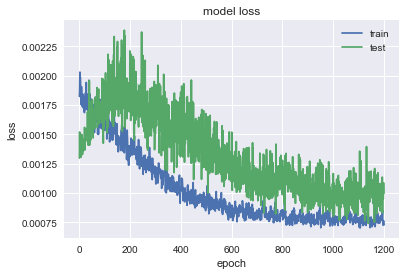

               FTI
MSE       0.807085
MAE       0.704535
R2         0.57131
MAPE (%)   2.91799


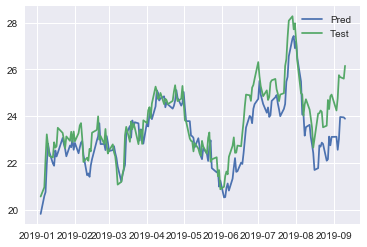

Predicting for  BLK
Train on 1008 samples, validate on 172 samples
Epoch 1/1400
0s - loss: 0.1757 - val_loss: 0.2006
Epoch 2/1400
0s - loss: 0.1435 - val_loss: 0.1666
Epoch 3/1400
0s - loss: 0.1159 - val_loss: 0.1324
Epoch 4/1400
0s - loss: 0.0906 - val_loss: 0.0995
Epoch 5/1400
0s - loss: 0.0694 - val_loss: 0.0696
Epoch 6/1400
0s - loss: 0.0524 - val_loss: 0.0449
Epoch 7/1400
0s - loss: 0.0409 - val_loss: 0.0269
Epoch 8/1400
0s - loss: 0.0353 - val_loss: 0.0157
Epoch 9/1400
0s - loss: 0.0336 - val_loss: 0.0099
Epoch 10/1400
0s - loss: 0.0326 - val_loss: 0.0073
Epoch 11/1400
0s - loss: 0.0337 - val_loss: 0.0064
Epoch 12/1400
0s - loss: 0.0315 - val_loss: 0.0060
Epoch 13/1400
0s - loss: 0.0304 - val_loss: 0.0058
Epoch 14/1400
0s - loss: 0.0285 - val_loss: 0.0055
Epoch 15/1400
0s - loss: 0.0262 - val_loss: 0.0049
Epoch 16/1400
0s - loss: 0.0256 - val_loss: 0.0043
Epoch 17/1400
0s - loss: 0.0246 - val_loss: 0.0038
Epoch 18/1400
0s - loss: 0.0234 - val_loss: 0.0034
Epoch 19/1400
0s - loss:

0s - loss: 0.0026 - val_loss: 0.0021
Epoch 161/1400
0s - loss: 0.0026 - val_loss: 0.0021
Epoch 162/1400
0s - loss: 0.0026 - val_loss: 0.0020
Epoch 163/1400
0s - loss: 0.0026 - val_loss: 0.0020
Epoch 164/1400
0s - loss: 0.0027 - val_loss: 0.0021
Epoch 165/1400
0s - loss: 0.0027 - val_loss: 0.0020
Epoch 166/1400
0s - loss: 0.0027 - val_loss: 0.0020
Epoch 167/1400
0s - loss: 0.0026 - val_loss: 0.0020
Epoch 168/1400
0s - loss: 0.0026 - val_loss: 0.0020
Epoch 169/1400
0s - loss: 0.0028 - val_loss: 0.0020
Epoch 170/1400
0s - loss: 0.0026 - val_loss: 0.0020
Epoch 171/1400
0s - loss: 0.0025 - val_loss: 0.0020
Epoch 172/1400
0s - loss: 0.0026 - val_loss: 0.0019
Epoch 173/1400
0s - loss: 0.0026 - val_loss: 0.0019
Epoch 174/1400
0s - loss: 0.0024 - val_loss: 0.0019
Epoch 175/1400
0s - loss: 0.0026 - val_loss: 0.0019
Epoch 176/1400
0s - loss: 0.0023 - val_loss: 0.0019
Epoch 177/1400
0s - loss: 0.0024 - val_loss: 0.0019
Epoch 178/1400
0s - loss: 0.0025 - val_loss: 0.0019
Epoch 179/1400
0s - loss: 0

0s - loss: 0.0018 - val_loss: 7.3887e-04
Epoch 317/1400
0s - loss: 0.0018 - val_loss: 5.6910e-04
Epoch 318/1400
0s - loss: 0.0015 - val_loss: 7.2897e-04
Epoch 319/1400
0s - loss: 0.0015 - val_loss: 5.6600e-04
Epoch 320/1400
0s - loss: 0.0016 - val_loss: 6.3515e-04
Epoch 321/1400
0s - loss: 0.0015 - val_loss: 5.8216e-04
Epoch 322/1400
0s - loss: 0.0016 - val_loss: 5.5185e-04
Epoch 323/1400
0s - loss: 0.0015 - val_loss: 6.0888e-04
Epoch 324/1400
0s - loss: 0.0015 - val_loss: 5.5972e-04
Epoch 325/1400
0s - loss: 0.0014 - val_loss: 6.0624e-04
Epoch 326/1400
0s - loss: 0.0017 - val_loss: 5.8096e-04
Epoch 327/1400
0s - loss: 0.0014 - val_loss: 6.3285e-04
Epoch 328/1400
0s - loss: 0.0015 - val_loss: 5.3709e-04
Epoch 329/1400
0s - loss: 0.0014 - val_loss: 6.1507e-04
Epoch 330/1400
0s - loss: 0.0014 - val_loss: 5.8454e-04
Epoch 331/1400
0s - loss: 0.0015 - val_loss: 5.4605e-04
Epoch 332/1400
0s - loss: 0.0014 - val_loss: 6.2421e-04
Epoch 333/1400
0s - loss: 0.0014 - val_loss: 5.3431e-04
Epoch 3

0s - loss: 0.0013 - val_loss: 5.3645e-04
Epoch 465/1400
0s - loss: 0.0011 - val_loss: 6.8125e-04
Epoch 466/1400
0s - loss: 0.0011 - val_loss: 4.9933e-04
Epoch 467/1400
0s - loss: 0.0012 - val_loss: 6.8805e-04
Epoch 468/1400
0s - loss: 0.0011 - val_loss: 4.8048e-04
Epoch 469/1400
0s - loss: 9.7910e-04 - val_loss: 6.4782e-04
Epoch 470/1400
0s - loss: 0.0011 - val_loss: 5.9485e-04
Epoch 471/1400
0s - loss: 0.0011 - val_loss: 6.0996e-04
Epoch 472/1400
0s - loss: 0.0011 - val_loss: 5.3800e-04
Epoch 473/1400
0s - loss: 0.0010 - val_loss: 6.2782e-04
Epoch 474/1400
0s - loss: 0.0011 - val_loss: 5.6521e-04
Epoch 475/1400
0s - loss: 0.0011 - val_loss: 7.3099e-04
Epoch 476/1400
0s - loss: 0.0011 - val_loss: 5.8060e-04
Epoch 477/1400
0s - loss: 0.0012 - val_loss: 5.6664e-04
Epoch 478/1400
0s - loss: 0.0011 - val_loss: 5.7734e-04
Epoch 479/1400
0s - loss: 0.0012 - val_loss: 5.8206e-04
Epoch 480/1400
0s - loss: 0.0010 - val_loss: 5.8291e-04
Epoch 481/1400
0s - loss: 0.0011 - val_loss: 7.9038e-04
Epo

0s - loss: 9.2052e-04 - val_loss: 9.1299e-04
Epoch 609/1400
0s - loss: 9.1339e-04 - val_loss: 8.6561e-04
Epoch 610/1400
0s - loss: 9.3763e-04 - val_loss: 8.3847e-04
Epoch 611/1400
0s - loss: 8.6997e-04 - val_loss: 8.3823e-04
Epoch 612/1400
0s - loss: 8.7750e-04 - val_loss: 8.2844e-04
Epoch 613/1400
0s - loss: 8.8842e-04 - val_loss: 0.0010
Epoch 614/1400
0s - loss: 8.9028e-04 - val_loss: 8.5077e-04
Epoch 615/1400
0s - loss: 9.3461e-04 - val_loss: 9.7885e-04
Epoch 616/1400
0s - loss: 0.0010 - val_loss: 7.9474e-04
Epoch 617/1400
0s - loss: 8.6609e-04 - val_loss: 9.7516e-04
Epoch 618/1400
0s - loss: 7.7749e-04 - val_loss: 8.6588e-04
Epoch 619/1400
0s - loss: 8.5502e-04 - val_loss: 0.0010
Epoch 620/1400
0s - loss: 8.5592e-04 - val_loss: 7.8463e-04
Epoch 621/1400
0s - loss: 8.9237e-04 - val_loss: 9.4686e-04
Epoch 622/1400
0s - loss: 8.7867e-04 - val_loss: 7.4147e-04
Epoch 623/1400
0s - loss: 8.8378e-04 - val_loss: 0.0011
Epoch 624/1400
0s - loss: 8.8467e-04 - val_loss: 6.2390e-04
Epoch 625/1

0s - loss: 8.4231e-04 - val_loss: 7.3667e-04
Epoch 751/1400
0s - loss: 8.5740e-04 - val_loss: 0.0012
Epoch 752/1400
0s - loss: 7.3190e-04 - val_loss: 8.4542e-04
Epoch 753/1400
0s - loss: 7.8614e-04 - val_loss: 0.0010
Epoch 754/1400
0s - loss: 7.9991e-04 - val_loss: 8.5320e-04
Epoch 755/1400
0s - loss: 7.6323e-04 - val_loss: 0.0011
Epoch 756/1400
0s - loss: 8.2849e-04 - val_loss: 6.8929e-04
Epoch 757/1400
0s - loss: 7.4537e-04 - val_loss: 0.0013
Epoch 758/1400
0s - loss: 8.5677e-04 - val_loss: 7.0863e-04
Epoch 759/1400
0s - loss: 7.8137e-04 - val_loss: 0.0012
Epoch 760/1400
0s - loss: 7.1805e-04 - val_loss: 0.0010
Epoch 761/1400
0s - loss: 8.1727e-04 - val_loss: 8.4767e-04
Epoch 762/1400
0s - loss: 7.5973e-04 - val_loss: 0.0012
Epoch 763/1400
0s - loss: 7.6064e-04 - val_loss: 9.0042e-04
Epoch 764/1400
0s - loss: 8.2444e-04 - val_loss: 8.1657e-04
Epoch 765/1400
0s - loss: 8.2964e-04 - val_loss: 0.0013
Epoch 766/1400
0s - loss: 7.7403e-04 - val_loss: 8.3976e-04
Epoch 767/1400
0s - loss: 8

0s - loss: 7.7433e-04 - val_loss: 0.0013
Epoch 895/1400
0s - loss: 7.7449e-04 - val_loss: 9.1114e-04
Epoch 896/1400
0s - loss: 7.6121e-04 - val_loss: 9.1870e-04
Epoch 897/1400
0s - loss: 8.3070e-04 - val_loss: 0.0012
Epoch 898/1400
0s - loss: 8.4065e-04 - val_loss: 5.8822e-04
Epoch 899/1400
0s - loss: 7.0939e-04 - val_loss: 0.0011
Epoch 900/1400
0s - loss: 6.5173e-04 - val_loss: 8.8829e-04
Epoch 901/1400
0s - loss: 6.9972e-04 - val_loss: 9.4248e-04
Epoch 902/1400
0s - loss: 7.1202e-04 - val_loss: 0.0011
Epoch 903/1400
0s - loss: 6.7925e-04 - val_loss: 0.0011
Epoch 904/1400
0s - loss: 7.3829e-04 - val_loss: 0.0011
Epoch 905/1400
0s - loss: 6.8387e-04 - val_loss: 0.0011
Epoch 906/1400
0s - loss: 6.6011e-04 - val_loss: 8.7975e-04
Epoch 907/1400
0s - loss: 7.6177e-04 - val_loss: 0.0011
Epoch 908/1400
0s - loss: 7.3878e-04 - val_loss: 0.0010
Epoch 909/1400
0s - loss: 6.7657e-04 - val_loss: 9.2521e-04
Epoch 910/1400
0s - loss: 6.4940e-04 - val_loss: 0.0011
Epoch 911/1400
0s - loss: 6.6057e-0

0s - loss: 7.3098e-04 - val_loss: 0.0010
Epoch 1039/1400
0s - loss: 7.3360e-04 - val_loss: 0.0010
Epoch 1040/1400
0s - loss: 6.7542e-04 - val_loss: 7.2793e-04
Epoch 1041/1400
0s - loss: 7.2070e-04 - val_loss: 0.0011
Epoch 1042/1400
0s - loss: 6.4034e-04 - val_loss: 9.5362e-04
Epoch 1043/1400
0s - loss: 6.5879e-04 - val_loss: 9.5258e-04
Epoch 1044/1400
0s - loss: 6.9239e-04 - val_loss: 0.0010
Epoch 1045/1400
0s - loss: 6.6617e-04 - val_loss: 9.8004e-04
Epoch 1046/1400
0s - loss: 6.7750e-04 - val_loss: 9.3496e-04
Epoch 1047/1400
0s - loss: 5.8578e-04 - val_loss: 0.0012
Epoch 1048/1400
0s - loss: 6.5743e-04 - val_loss: 7.0460e-04
Epoch 1049/1400
0s - loss: 6.4745e-04 - val_loss: 0.0010
Epoch 1050/1400
0s - loss: 7.9516e-04 - val_loss: 0.0011
Epoch 1051/1400
0s - loss: 7.6430e-04 - val_loss: 6.7062e-04
Epoch 1052/1400
0s - loss: 8.9952e-04 - val_loss: 0.0013
Epoch 1053/1400
0s - loss: 7.4003e-04 - val_loss: 9.1154e-04
Epoch 1054/1400
0s - loss: 7.4296e-04 - val_loss: 7.1663e-04
Epoch 1055/

0s - loss: 6.3180e-04 - val_loss: 8.7102e-04
Epoch 1179/1400
0s - loss: 6.1559e-04 - val_loss: 0.0011
Epoch 1180/1400
0s - loss: 7.1813e-04 - val_loss: 7.1593e-04
Epoch 1181/1400
0s - loss: 7.1241e-04 - val_loss: 0.0011
Epoch 1182/1400
0s - loss: 6.3978e-04 - val_loss: 0.0011
Epoch 1183/1400
0s - loss: 7.2326e-04 - val_loss: 6.3201e-04
Epoch 1184/1400
0s - loss: 8.3223e-04 - val_loss: 0.0011
Epoch 1185/1400
0s - loss: 7.7508e-04 - val_loss: 9.4433e-04
Epoch 1186/1400
0s - loss: 7.5688e-04 - val_loss: 7.2902e-04
Epoch 1187/1400
0s - loss: 8.2961e-04 - val_loss: 0.0011
Epoch 1188/1400
0s - loss: 6.2156e-04 - val_loss: 8.0685e-04
Epoch 1189/1400
0s - loss: 6.6144e-04 - val_loss: 8.5315e-04
Epoch 1190/1400
0s - loss: 6.1295e-04 - val_loss: 0.0011
Epoch 1191/1400
0s - loss: 7.1105e-04 - val_loss: 9.7123e-04
Epoch 1192/1400
0s - loss: 6.5529e-04 - val_loss: 8.2950e-04
Epoch 1193/1400
0s - loss: 6.4283e-04 - val_loss: 8.5014e-04
Epoch 1194/1400
0s - loss: 6.3384e-04 - val_loss: 9.6665e-04
Epo

0s - loss: 6.6519e-04 - val_loss: 8.0524e-04
Epoch 1319/1400
0s - loss: 6.6615e-04 - val_loss: 9.6339e-04
Epoch 1320/1400
0s - loss: 7.1446e-04 - val_loss: 0.0013
Epoch 1321/1400
0s - loss: 7.2205e-04 - val_loss: 7.5710e-04
Epoch 1322/1400
0s - loss: 6.7766e-04 - val_loss: 0.0012
Epoch 1323/1400
0s - loss: 6.4043e-04 - val_loss: 8.3270e-04
Epoch 1324/1400
0s - loss: 6.7612e-04 - val_loss: 8.4223e-04
Epoch 1325/1400
0s - loss: 7.0528e-04 - val_loss: 0.0012
Epoch 1326/1400
0s - loss: 6.8487e-04 - val_loss: 7.0322e-04
Epoch 1327/1400
0s - loss: 6.4939e-04 - val_loss: 9.2057e-04
Epoch 1328/1400
0s - loss: 7.0904e-04 - val_loss: 0.0012
Epoch 1329/1400
0s - loss: 7.1229e-04 - val_loss: 5.6637e-04
Epoch 1330/1400
0s - loss: 7.7119e-04 - val_loss: 0.0012
Epoch 1331/1400
0s - loss: 7.3908e-04 - val_loss: 8.3479e-04
Epoch 1332/1400
0s - loss: 6.5061e-04 - val_loss: 7.0931e-04
Epoch 1333/1400
0s - loss: 7.6680e-04 - val_loss: 0.0013
Epoch 1334/1400
0s - loss: 7.2527e-04 - val_loss: 7.4332e-04
Epo

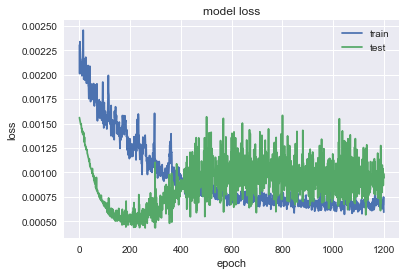

               BLK
MSE        88.3604
MAE        7.85364
R2        0.836509
MAPE (%)   1.77447


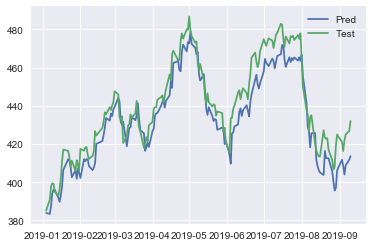

Predicting for  DVA
Train on 1008 samples, validate on 172 samples
Epoch 1/1400
0s - loss: 0.3768 - val_loss: 0.0379
Epoch 2/1400
0s - loss: 0.2804 - val_loss: 0.0137
Epoch 3/1400
0s - loss: 0.1966 - val_loss: 0.0067
Epoch 4/1400
0s - loss: 0.1245 - val_loss: 0.0280
Epoch 5/1400
0s - loss: 0.0760 - val_loss: 0.0811
Epoch 6/1400
0s - loss: 0.0565 - val_loss: 0.1384
Epoch 7/1400
0s - loss: 0.0498 - val_loss: 0.1592
Epoch 8/1400
0s - loss: 0.0441 - val_loss: 0.1451
Epoch 9/1400
0s - loss: 0.0399 - val_loss: 0.1213
Epoch 10/1400
0s - loss: 0.0369 - val_loss: 0.1045
Epoch 11/1400
0s - loss: 0.0370 - val_loss: 0.0967
Epoch 12/1400
0s - loss: 0.0359 - val_loss: 0.0939
Epoch 13/1400
0s - loss: 0.0346 - val_loss: 0.0934
Epoch 14/1400
0s - loss: 0.0337 - val_loss: 0.0928
Epoch 15/1400
0s - loss: 0.0311 - val_loss: 0.0912
Epoch 16/1400
0s - loss: 0.0302 - val_loss: 0.0885
Epoch 17/1400
0s - loss: 0.0295 - val_loss: 0.0851
Epoch 18/1400
0s - loss: 0.0278 - val_loss: 0.0816
Epoch 19/1400
0s - loss:

0s - loss: 0.0035 - val_loss: 0.0101
Epoch 161/1400
0s - loss: 0.0031 - val_loss: 0.0091
Epoch 162/1400
0s - loss: 0.0036 - val_loss: 0.0095
Epoch 163/1400
0s - loss: 0.0035 - val_loss: 0.0086
Epoch 164/1400
0s - loss: 0.0033 - val_loss: 0.0089
Epoch 165/1400
0s - loss: 0.0034 - val_loss: 0.0079
Epoch 166/1400
0s - loss: 0.0033 - val_loss: 0.0087
Epoch 167/1400
0s - loss: 0.0030 - val_loss: 0.0081
Epoch 168/1400
0s - loss: 0.0031 - val_loss: 0.0080
Epoch 169/1400
0s - loss: 0.0033 - val_loss: 0.0077
Epoch 170/1400
0s - loss: 0.0033 - val_loss: 0.0072
Epoch 171/1400
0s - loss: 0.0032 - val_loss: 0.0089
Epoch 172/1400
0s - loss: 0.0031 - val_loss: 0.0065
Epoch 173/1400
0s - loss: 0.0032 - val_loss: 0.0072
Epoch 174/1400
0s - loss: 0.0033 - val_loss: 0.0066
Epoch 175/1400
0s - loss: 0.0029 - val_loss: 0.0059
Epoch 176/1400
0s - loss: 0.0033 - val_loss: 0.0070
Epoch 177/1400
0s - loss: 0.0033 - val_loss: 0.0056
Epoch 178/1400
0s - loss: 0.0032 - val_loss: 0.0066
Epoch 179/1400
0s - loss: 0

0s - loss: 0.0024 - val_loss: 0.0011
Epoch 321/1400
0s - loss: 0.0024 - val_loss: 0.0012
Epoch 322/1400
0s - loss: 0.0025 - val_loss: 0.0011
Epoch 323/1400
0s - loss: 0.0023 - val_loss: 0.0012
Epoch 324/1400
0s - loss: 0.0022 - val_loss: 0.0011
Epoch 325/1400
0s - loss: 0.0024 - val_loss: 0.0011
Epoch 326/1400
0s - loss: 0.0026 - val_loss: 0.0012
Epoch 327/1400
0s - loss: 0.0023 - val_loss: 0.0011
Epoch 328/1400
0s - loss: 0.0022 - val_loss: 0.0012
Epoch 329/1400
0s - loss: 0.0024 - val_loss: 0.0011
Epoch 330/1400
0s - loss: 0.0024 - val_loss: 0.0012
Epoch 331/1400
0s - loss: 0.0024 - val_loss: 0.0011
Epoch 332/1400
0s - loss: 0.0026 - val_loss: 0.0012
Epoch 333/1400
0s - loss: 0.0023 - val_loss: 0.0012
Epoch 334/1400
0s - loss: 0.0022 - val_loss: 0.0012
Epoch 335/1400
0s - loss: 0.0023 - val_loss: 0.0011
Epoch 336/1400
0s - loss: 0.0024 - val_loss: 0.0011
Epoch 337/1400
0s - loss: 0.0023 - val_loss: 0.0012
Epoch 338/1400
0s - loss: 0.0024 - val_loss: 0.0011
Epoch 339/1400
0s - loss: 0

0s - loss: 0.0019 - val_loss: 0.0012
Epoch 480/1400
0s - loss: 0.0017 - val_loss: 0.0015
Epoch 481/1400
0s - loss: 0.0017 - val_loss: 0.0012
Epoch 482/1400
0s - loss: 0.0018 - val_loss: 0.0014
Epoch 483/1400
0s - loss: 0.0015 - val_loss: 0.0013
Epoch 484/1400
0s - loss: 0.0016 - val_loss: 0.0015
Epoch 485/1400
0s - loss: 0.0016 - val_loss: 0.0013
Epoch 486/1400
0s - loss: 0.0017 - val_loss: 0.0013
Epoch 487/1400
0s - loss: 0.0017 - val_loss: 0.0014
Epoch 488/1400
0s - loss: 0.0017 - val_loss: 0.0013
Epoch 489/1400
0s - loss: 0.0017 - val_loss: 0.0015
Epoch 490/1400
0s - loss: 0.0017 - val_loss: 0.0014
Epoch 491/1400
0s - loss: 0.0018 - val_loss: 0.0013
Epoch 492/1400
0s - loss: 0.0017 - val_loss: 0.0014
Epoch 493/1400
0s - loss: 0.0016 - val_loss: 0.0013
Epoch 494/1400
0s - loss: 0.0017 - val_loss: 0.0013
Epoch 495/1400
0s - loss: 0.0016 - val_loss: 0.0015
Epoch 496/1400
0s - loss: 0.0017 - val_loss: 0.0015
Epoch 497/1400
0s - loss: 0.0017 - val_loss: 0.0013
Epoch 498/1400
0s - loss: 0

0s - loss: 0.0013 - val_loss: 0.0015
Epoch 640/1400
0s - loss: 0.0013 - val_loss: 0.0014
Epoch 641/1400
0s - loss: 0.0012 - val_loss: 0.0017
Epoch 642/1400
0s - loss: 0.0013 - val_loss: 0.0013
Epoch 643/1400
0s - loss: 0.0012 - val_loss: 0.0016
Epoch 644/1400
0s - loss: 0.0012 - val_loss: 0.0014
Epoch 645/1400
0s - loss: 0.0012 - val_loss: 0.0015
Epoch 646/1400
0s - loss: 0.0012 - val_loss: 0.0015
Epoch 647/1400
0s - loss: 0.0012 - val_loss: 0.0014
Epoch 648/1400
0s - loss: 0.0012 - val_loss: 0.0017
Epoch 649/1400
0s - loss: 0.0013 - val_loss: 0.0016
Epoch 650/1400
0s - loss: 0.0012 - val_loss: 0.0014
Epoch 651/1400
0s - loss: 0.0013 - val_loss: 0.0015
Epoch 652/1400
0s - loss: 0.0013 - val_loss: 0.0014
Epoch 653/1400
0s - loss: 0.0013 - val_loss: 0.0013
Epoch 654/1400
0s - loss: 0.0012 - val_loss: 0.0017
Epoch 655/1400
0s - loss: 0.0012 - val_loss: 0.0015
Epoch 656/1400
0s - loss: 0.0012 - val_loss: 0.0014
Epoch 657/1400
0s - loss: 0.0011 - val_loss: 0.0016
Epoch 658/1400
0s - loss: 0

0s - loss: 0.0011 - val_loss: 0.0011
Epoch 800/1400
0s - loss: 0.0011 - val_loss: 0.0013
Epoch 801/1400
0s - loss: 0.0010 - val_loss: 0.0013
Epoch 802/1400
0s - loss: 0.0010 - val_loss: 0.0012
Epoch 803/1400
0s - loss: 9.5960e-04 - val_loss: 0.0012
Epoch 804/1400
0s - loss: 0.0010 - val_loss: 0.0014
Epoch 805/1400
0s - loss: 9.8456e-04 - val_loss: 0.0013
Epoch 806/1400
0s - loss: 9.6726e-04 - val_loss: 0.0013
Epoch 807/1400
0s - loss: 0.0011 - val_loss: 0.0014
Epoch 808/1400
0s - loss: 0.0010 - val_loss: 0.0012
Epoch 809/1400
0s - loss: 9.8153e-04 - val_loss: 0.0013
Epoch 810/1400
0s - loss: 0.0011 - val_loss: 0.0014
Epoch 811/1400
0s - loss: 9.8701e-04 - val_loss: 0.0012
Epoch 812/1400
0s - loss: 0.0011 - val_loss: 0.0013
Epoch 813/1400
0s - loss: 0.0011 - val_loss: 0.0013
Epoch 814/1400
0s - loss: 0.0011 - val_loss: 0.0011
Epoch 815/1400
0s - loss: 0.0010 - val_loss: 0.0014
Epoch 816/1400
0s - loss: 9.1505e-04 - val_loss: 0.0012
Epoch 817/1400
0s - loss: 0.0010 - val_loss: 0.0013
Epo

0s - loss: 9.3573e-04 - val_loss: 0.0011
Epoch 952/1400
0s - loss: 9.1287e-04 - val_loss: 0.0012
Epoch 953/1400
0s - loss: 8.5251e-04 - val_loss: 0.0013
Epoch 954/1400
0s - loss: 8.3741e-04 - val_loss: 0.0012
Epoch 955/1400
0s - loss: 8.8157e-04 - val_loss: 0.0012
Epoch 956/1400
0s - loss: 8.9689e-04 - val_loss: 0.0013
Epoch 957/1400
0s - loss: 8.9304e-04 - val_loss: 0.0014
Epoch 958/1400
0s - loss: 9.0471e-04 - val_loss: 0.0012
Epoch 959/1400
0s - loss: 9.4211e-04 - val_loss: 0.0012
Epoch 960/1400
0s - loss: 9.9357e-04 - val_loss: 0.0014
Epoch 961/1400
0s - loss: 0.0010 - val_loss: 0.0012
Epoch 962/1400
0s - loss: 9.7292e-04 - val_loss: 0.0012
Epoch 963/1400
0s - loss: 0.0010 - val_loss: 0.0015
Epoch 964/1400
0s - loss: 8.4677e-04 - val_loss: 0.0011
Epoch 965/1400
0s - loss: 8.4736e-04 - val_loss: 0.0012
Epoch 966/1400
0s - loss: 8.6895e-04 - val_loss: 0.0012
Epoch 967/1400
0s - loss: 8.7170e-04 - val_loss: 0.0013
Epoch 968/1400
0s - loss: 9.0937e-04 - val_loss: 0.0012
Epoch 969/1400


0s - loss: 8.6836e-04 - val_loss: 0.0012
Epoch 1100/1400
0s - loss: 8.3248e-04 - val_loss: 0.0011
Epoch 1101/1400
0s - loss: 8.2096e-04 - val_loss: 0.0011
Epoch 1102/1400
0s - loss: 8.0407e-04 - val_loss: 0.0012
Epoch 1103/1400
0s - loss: 8.1944e-04 - val_loss: 0.0011
Epoch 1104/1400
0s - loss: 8.1380e-04 - val_loss: 0.0012
Epoch 1105/1400
0s - loss: 7.9705e-04 - val_loss: 0.0012
Epoch 1106/1400
0s - loss: 8.4397e-04 - val_loss: 0.0014
Epoch 1107/1400
0s - loss: 8.4471e-04 - val_loss: 0.0011
Epoch 1108/1400
0s - loss: 8.3357e-04 - val_loss: 0.0013
Epoch 1109/1400
0s - loss: 8.6507e-04 - val_loss: 0.0012
Epoch 1110/1400
0s - loss: 8.3600e-04 - val_loss: 0.0012
Epoch 1111/1400
0s - loss: 8.4411e-04 - val_loss: 0.0011
Epoch 1112/1400
0s - loss: 8.8949e-04 - val_loss: 0.0012
Epoch 1113/1400
0s - loss: 9.0307e-04 - val_loss: 0.0011
Epoch 1114/1400
0s - loss: 8.8243e-04 - val_loss: 0.0011
Epoch 1115/1400
0s - loss: 8.9760e-04 - val_loss: 0.0013
Epoch 1116/1400
0s - loss: 9.3549e-04 - val_los

0s - loss: 8.5541e-04 - val_loss: 0.0011
Epoch 1244/1400
0s - loss: 9.1817e-04 - val_loss: 0.0011
Epoch 1245/1400
0s - loss: 8.3817e-04 - val_loss: 0.0010
Epoch 1246/1400
0s - loss: 9.1217e-04 - val_loss: 0.0012
Epoch 1247/1400
0s - loss: 8.8648e-04 - val_loss: 0.0010
Epoch 1248/1400
0s - loss: 8.7173e-04 - val_loss: 0.0010
Epoch 1249/1400
0s - loss: 8.1606e-04 - val_loss: 0.0013
Epoch 1250/1400
0s - loss: 7.7589e-04 - val_loss: 0.0010
Epoch 1251/1400
0s - loss: 8.0207e-04 - val_loss: 0.0012
Epoch 1252/1400
0s - loss: 7.8824e-04 - val_loss: 0.0011
Epoch 1253/1400
0s - loss: 8.0674e-04 - val_loss: 0.0011
Epoch 1254/1400
0s - loss: 8.4520e-04 - val_loss: 0.0013
Epoch 1255/1400
0s - loss: 8.1278e-04 - val_loss: 0.0011
Epoch 1256/1400
0s - loss: 7.9456e-04 - val_loss: 0.0012
Epoch 1257/1400
0s - loss: 8.1781e-04 - val_loss: 0.0012
Epoch 1258/1400
0s - loss: 7.8716e-04 - val_loss: 0.0010
Epoch 1259/1400
0s - loss: 7.8391e-04 - val_loss: 0.0011
Epoch 1260/1400
0s - loss: 8.2429e-04 - val_los

0s - loss: 7.5936e-04 - val_loss: 0.0011
Epoch 1388/1400
0s - loss: 7.6131e-04 - val_loss: 0.0011
Epoch 1389/1400
0s - loss: 8.6814e-04 - val_loss: 0.0011
Epoch 1390/1400
0s - loss: 7.5684e-04 - val_loss: 0.0012
Epoch 1391/1400
0s - loss: 8.0031e-04 - val_loss: 0.0012
Epoch 1392/1400
0s - loss: 7.4931e-04 - val_loss: 0.0011
Epoch 1393/1400
0s - loss: 7.8475e-04 - val_loss: 0.0011
Epoch 1394/1400
0s - loss: 8.2427e-04 - val_loss: 0.0012
Epoch 1395/1400
0s - loss: 7.8718e-04 - val_loss: 0.0012
Epoch 1396/1400
0s - loss: 8.4334e-04 - val_loss: 0.0011
Epoch 1397/1400
0s - loss: 8.3493e-04 - val_loss: 0.0012
Epoch 1398/1400
0s - loss: 8.4252e-04 - val_loss: 0.0011
Epoch 1399/1400
0s - loss: 7.9499e-04 - val_loss: 9.7875e-04
Epoch 1400/1400
0s - loss: 8.6856e-04 - val_loss: 0.0011


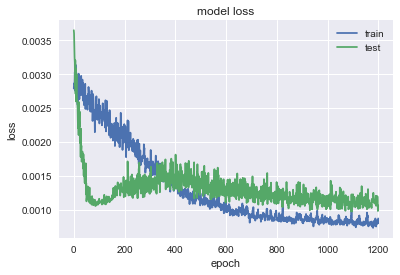

               DVA
MSE        1.83625
MAE        1.02325
R2        0.823427
MAPE (%)   1.87595


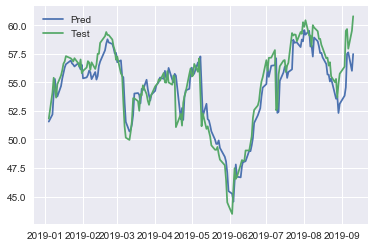

Predicting for  BA
Train on 1008 samples, validate on 172 samples
Epoch 1/1400
0s - loss: 0.1334 - val_loss: 0.5039
Epoch 2/1400
0s - loss: 0.1058 - val_loss: 0.4389
Epoch 3/1400
0s - loss: 0.0847 - val_loss: 0.3743
Epoch 4/1400
0s - loss: 0.0675 - val_loss: 0.3129
Epoch 5/1400
0s - loss: 0.0547 - val_loss: 0.2574
Epoch 6/1400
0s - loss: 0.0476 - val_loss: 0.2116
Epoch 7/1400
0s - loss: 0.0445 - val_loss: 0.1775
Epoch 8/1400
0s - loss: 0.0432 - val_loss: 0.1548
Epoch 9/1400
0s - loss: 0.0424 - val_loss: 0.1411
Epoch 10/1400
0s - loss: 0.0409 - val_loss: 0.1333
Epoch 11/1400
0s - loss: 0.0372 - val_loss: 0.1275
Epoch 12/1400
0s - loss: 0.0342 - val_loss: 0.1213
Epoch 13/1400
0s - loss: 0.0318 - val_loss: 0.1138
Epoch 14/1400
0s - loss: 0.0290 - val_loss: 0.1049
Epoch 15/1400
0s - loss: 0.0253 - val_loss: 0.0951
Epoch 16/1400
0s - loss: 0.0227 - val_loss: 0.0857
Epoch 17/1400
0s - loss: 0.0199 - val_loss: 0.0767
Epoch 18/1400
0s - loss: 0.0178 - val_loss: 0.0681
Epoch 19/1400
0s - loss: 

0s - loss: 0.0020 - val_loss: 0.0054
Epoch 161/1400
0s - loss: 0.0017 - val_loss: 0.0051
Epoch 162/1400
0s - loss: 0.0019 - val_loss: 0.0053
Epoch 163/1400
0s - loss: 0.0020 - val_loss: 0.0052
Epoch 164/1400
0s - loss: 0.0019 - val_loss: 0.0050
Epoch 165/1400
0s - loss: 0.0017 - val_loss: 0.0051
Epoch 166/1400
0s - loss: 0.0019 - val_loss: 0.0053
Epoch 167/1400
0s - loss: 0.0018 - val_loss: 0.0047
Epoch 168/1400
0s - loss: 0.0018 - val_loss: 0.0047
Epoch 169/1400
0s - loss: 0.0017 - val_loss: 0.0051
Epoch 170/1400
0s - loss: 0.0018 - val_loss: 0.0049
Epoch 171/1400
0s - loss: 0.0019 - val_loss: 0.0047
Epoch 172/1400
0s - loss: 0.0018 - val_loss: 0.0048
Epoch 173/1400
0s - loss: 0.0017 - val_loss: 0.0046
Epoch 174/1400
0s - loss: 0.0016 - val_loss: 0.0048
Epoch 175/1400
0s - loss: 0.0015 - val_loss: 0.0047
Epoch 176/1400
0s - loss: 0.0017 - val_loss: 0.0048
Epoch 177/1400
0s - loss: 0.0017 - val_loss: 0.0044
Epoch 178/1400
0s - loss: 0.0017 - val_loss: 0.0045
Epoch 179/1400
0s - loss: 0

0s - loss: 0.0011 - val_loss: 0.0013
Epoch 321/1400
0s - loss: 0.0010 - val_loss: 0.0013
Epoch 322/1400
0s - loss: 9.8621e-04 - val_loss: 0.0013
Epoch 323/1400
0s - loss: 0.0011 - val_loss: 0.0013
Epoch 324/1400
0s - loss: 0.0010 - val_loss: 0.0014
Epoch 325/1400
0s - loss: 0.0011 - val_loss: 0.0013
Epoch 326/1400
0s - loss: 0.0012 - val_loss: 0.0013
Epoch 327/1400
0s - loss: 0.0012 - val_loss: 0.0012
Epoch 328/1400
0s - loss: 0.0011 - val_loss: 0.0014
Epoch 329/1400
0s - loss: 0.0012 - val_loss: 0.0012
Epoch 330/1400
0s - loss: 0.0011 - val_loss: 0.0013
Epoch 331/1400
0s - loss: 9.9986e-04 - val_loss: 0.0012
Epoch 332/1400
0s - loss: 0.0011 - val_loss: 0.0012
Epoch 333/1400
0s - loss: 9.7082e-04 - val_loss: 0.0012
Epoch 334/1400
0s - loss: 9.5508e-04 - val_loss: 0.0012
Epoch 335/1400
0s - loss: 9.9135e-04 - val_loss: 0.0012
Epoch 336/1400
0s - loss: 0.0010 - val_loss: 0.0012
Epoch 337/1400
0s - loss: 9.7001e-04 - val_loss: 0.0012
Epoch 338/1400
0s - loss: 0.0011 - val_loss: 0.0012
Epo

0s - loss: 7.8599e-04 - val_loss: 8.1078e-04
Epoch 469/1400
0s - loss: 8.8245e-04 - val_loss: 8.4378e-04
Epoch 470/1400
0s - loss: 8.8871e-04 - val_loss: 7.4326e-04
Epoch 471/1400
0s - loss: 8.8489e-04 - val_loss: 8.0417e-04
Epoch 472/1400
0s - loss: 8.4778e-04 - val_loss: 6.9464e-04
Epoch 473/1400
0s - loss: 7.8712e-04 - val_loss: 7.8730e-04
Epoch 474/1400
0s - loss: 8.3368e-04 - val_loss: 6.9829e-04
Epoch 475/1400
0s - loss: 7.5876e-04 - val_loss: 9.3641e-04
Epoch 476/1400
0s - loss: 7.9268e-04 - val_loss: 7.5800e-04
Epoch 477/1400
0s - loss: 8.2976e-04 - val_loss: 7.7069e-04
Epoch 478/1400
0s - loss: 8.3066e-04 - val_loss: 7.4266e-04
Epoch 479/1400
0s - loss: 8.1244e-04 - val_loss: 6.7093e-04
Epoch 480/1400
0s - loss: 7.3520e-04 - val_loss: 8.3154e-04
Epoch 481/1400
0s - loss: 9.3109e-04 - val_loss: 7.2802e-04
Epoch 482/1400
0s - loss: 8.1754e-04 - val_loss: 8.2927e-04
Epoch 483/1400
0s - loss: 8.7123e-04 - val_loss: 7.9223e-04
Epoch 484/1400
0s - loss: 7.9002e-04 - val_loss: 6.9207

0s - loss: 6.5610e-04 - val_loss: 7.9049e-04
Epoch 607/1400
0s - loss: 6.6312e-04 - val_loss: 6.8156e-04
Epoch 608/1400
0s - loss: 6.6928e-04 - val_loss: 7.2229e-04
Epoch 609/1400
0s - loss: 7.1152e-04 - val_loss: 7.5035e-04
Epoch 610/1400
0s - loss: 7.3783e-04 - val_loss: 7.6320e-04
Epoch 611/1400
0s - loss: 6.9865e-04 - val_loss: 8.3184e-04
Epoch 612/1400
0s - loss: 7.1372e-04 - val_loss: 7.2570e-04
Epoch 613/1400
0s - loss: 7.1629e-04 - val_loss: 8.4677e-04
Epoch 614/1400
0s - loss: 8.3915e-04 - val_loss: 7.9906e-04
Epoch 615/1400
0s - loss: 7.9304e-04 - val_loss: 8.9153e-04
Epoch 616/1400
0s - loss: 9.7451e-04 - val_loss: 6.7770e-04
Epoch 617/1400
0s - loss: 8.5355e-04 - val_loss: 9.7494e-04
Epoch 618/1400
0s - loss: 8.8163e-04 - val_loss: 7.7866e-04
Epoch 619/1400
0s - loss: 9.8480e-04 - val_loss: 0.0012
Epoch 620/1400
0s - loss: 8.4670e-04 - val_loss: 7.3964e-04
Epoch 621/1400
0s - loss: 8.0730e-04 - val_loss: 0.0011
Epoch 622/1400
0s - loss: 8.6877e-04 - val_loss: 6.5268e-04
Epo

0s - loss: 6.6266e-04 - val_loss: 7.8270e-04
Epoch 748/1400
0s - loss: 5.7527e-04 - val_loss: 8.5272e-04
Epoch 749/1400
0s - loss: 6.2216e-04 - val_loss: 8.1266e-04
Epoch 750/1400
0s - loss: 6.4797e-04 - val_loss: 9.5447e-04
Epoch 751/1400
0s - loss: 6.4626e-04 - val_loss: 7.3783e-04
Epoch 752/1400
0s - loss: 6.1506e-04 - val_loss: 9.1380e-04
Epoch 753/1400
0s - loss: 5.6554e-04 - val_loss: 0.0011
Epoch 754/1400
0s - loss: 5.9995e-04 - val_loss: 8.9433e-04
Epoch 755/1400
0s - loss: 6.7872e-04 - val_loss: 0.0012
Epoch 756/1400
0s - loss: 6.9342e-04 - val_loss: 7.2495e-04
Epoch 757/1400
0s - loss: 6.7330e-04 - val_loss: 0.0011
Epoch 758/1400
0s - loss: 6.1118e-04 - val_loss: 8.5787e-04
Epoch 759/1400
0s - loss: 7.3869e-04 - val_loss: 9.9867e-04
Epoch 760/1400
0s - loss: 5.8915e-04 - val_loss: 7.6216e-04
Epoch 761/1400
0s - loss: 6.1952e-04 - val_loss: 0.0010
Epoch 762/1400
0s - loss: 6.3832e-04 - val_loss: 9.0958e-04
Epoch 763/1400
0s - loss: 6.6730e-04 - val_loss: 0.0010
Epoch 764/1400


0s - loss: 5.5675e-04 - val_loss: 0.0010
Epoch 889/1400
0s - loss: 5.8422e-04 - val_loss: 0.0010
Epoch 890/1400
0s - loss: 5.7909e-04 - val_loss: 0.0011
Epoch 891/1400
0s - loss: 5.5226e-04 - val_loss: 0.0011
Epoch 892/1400
0s - loss: 5.3438e-04 - val_loss: 0.0010
Epoch 893/1400
0s - loss: 6.0207e-04 - val_loss: 0.0014
Epoch 894/1400
0s - loss: 6.9075e-04 - val_loss: 0.0010
Epoch 895/1400
0s - loss: 6.6512e-04 - val_loss: 0.0014
Epoch 896/1400
0s - loss: 6.9036e-04 - val_loss: 8.8191e-04
Epoch 897/1400
0s - loss: 6.1349e-04 - val_loss: 0.0013
Epoch 898/1400
0s - loss: 5.9984e-04 - val_loss: 8.6863e-04
Epoch 899/1400
0s - loss: 7.1692e-04 - val_loss: 9.7975e-04
Epoch 900/1400
0s - loss: 6.2084e-04 - val_loss: 7.8815e-04
Epoch 901/1400
0s - loss: 5.5367e-04 - val_loss: 0.0012
Epoch 902/1400
0s - loss: 5.4909e-04 - val_loss: 0.0011
Epoch 903/1400
0s - loss: 5.8621e-04 - val_loss: 0.0012
Epoch 904/1400
0s - loss: 6.5268e-04 - val_loss: 9.6314e-04
Epoch 905/1400
0s - loss: 5.9459e-04 - val_

0s - loss: 7.7534e-04 - val_loss: 0.0016
Epoch 1034/1400
0s - loss: 5.7460e-04 - val_loss: 0.0010
Epoch 1035/1400
0s - loss: 6.3582e-04 - val_loss: 0.0013
Epoch 1036/1400
0s - loss: 7.3347e-04 - val_loss: 0.0012
Epoch 1037/1400
0s - loss: 7.8103e-04 - val_loss: 0.0014
Epoch 1038/1400
0s - loss: 7.1156e-04 - val_loss: 0.0011
Epoch 1039/1400
0s - loss: 6.9563e-04 - val_loss: 0.0014
Epoch 1040/1400
0s - loss: 8.2440e-04 - val_loss: 0.0016
Epoch 1041/1400
0s - loss: 8.6299e-04 - val_loss: 0.0011
Epoch 1042/1400
0s - loss: 7.0255e-04 - val_loss: 0.0013
Epoch 1043/1400
0s - loss: 6.9654e-04 - val_loss: 0.0011
Epoch 1044/1400
0s - loss: 6.8457e-04 - val_loss: 0.0018
Epoch 1045/1400
0s - loss: 5.8234e-04 - val_loss: 0.0011
Epoch 1046/1400
0s - loss: 6.0724e-04 - val_loss: 0.0015
Epoch 1047/1400
0s - loss: 5.5048e-04 - val_loss: 0.0010
Epoch 1048/1400
0s - loss: 5.4085e-04 - val_loss: 0.0014
Epoch 1049/1400
0s - loss: 5.5551e-04 - val_loss: 0.0014
Epoch 1050/1400
0s - loss: 5.9010e-04 - val_los

0s - loss: 5.4045e-04 - val_loss: 0.0011
Epoch 1180/1400
0s - loss: 5.7787e-04 - val_loss: 0.0011
Epoch 1181/1400
0s - loss: 5.2079e-04 - val_loss: 0.0013
Epoch 1182/1400
0s - loss: 4.8825e-04 - val_loss: 0.0013
Epoch 1183/1400
0s - loss: 4.8293e-04 - val_loss: 0.0013
Epoch 1184/1400
0s - loss: 4.9877e-04 - val_loss: 0.0013
Epoch 1185/1400
0s - loss: 5.2343e-04 - val_loss: 0.0012
Epoch 1186/1400
0s - loss: 5.6733e-04 - val_loss: 0.0012
Epoch 1187/1400
0s - loss: 5.0726e-04 - val_loss: 0.0011
Epoch 1188/1400
0s - loss: 4.8072e-04 - val_loss: 0.0015
Epoch 1189/1400
0s - loss: 5.3582e-04 - val_loss: 0.0012
Epoch 1190/1400
0s - loss: 5.9715e-04 - val_loss: 0.0013
Epoch 1191/1400
0s - loss: 5.1344e-04 - val_loss: 0.0012
Epoch 1192/1400
0s - loss: 5.5036e-04 - val_loss: 0.0015
Epoch 1193/1400
0s - loss: 5.3572e-04 - val_loss: 0.0014
Epoch 1194/1400
0s - loss: 5.5975e-04 - val_loss: 0.0013
Epoch 1195/1400
0s - loss: 6.0220e-04 - val_loss: 0.0012
Epoch 1196/1400
0s - loss: 5.5243e-04 - val_los

0s - loss: 5.3941e-04 - val_loss: 0.0014
Epoch 1324/1400
0s - loss: 4.4349e-04 - val_loss: 0.0015
Epoch 1325/1400
0s - loss: 4.9839e-04 - val_loss: 0.0016
Epoch 1326/1400
0s - loss: 5.7047e-04 - val_loss: 0.0012
Epoch 1327/1400
0s - loss: 5.5427e-04 - val_loss: 0.0017
Epoch 1328/1400
0s - loss: 5.4405e-04 - val_loss: 0.0015
Epoch 1329/1400
0s - loss: 5.7561e-04 - val_loss: 0.0017
Epoch 1330/1400
0s - loss: 5.8413e-04 - val_loss: 0.0016
Epoch 1331/1400
0s - loss: 5.8271e-04 - val_loss: 0.0015
Epoch 1332/1400
0s - loss: 6.2860e-04 - val_loss: 0.0019
Epoch 1333/1400
0s - loss: 5.5841e-04 - val_loss: 0.0012
Epoch 1334/1400
0s - loss: 5.5678e-04 - val_loss: 0.0015
Epoch 1335/1400
0s - loss: 6.2599e-04 - val_loss: 0.0018
Epoch 1336/1400
0s - loss: 5.8620e-04 - val_loss: 0.0013
Epoch 1337/1400
0s - loss: 5.7929e-04 - val_loss: 0.0016
Epoch 1338/1400
0s - loss: 5.2267e-04 - val_loss: 0.0014
Epoch 1339/1400
0s - loss: 4.3032e-04 - val_loss: 0.0016
Epoch 1340/1400
0s - loss: 5.0563e-04 - val_los

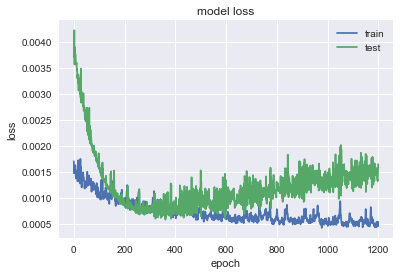

                BA
MSE        191.298
MAE         11.893
R2        0.613382
MAPE (%)   3.16767


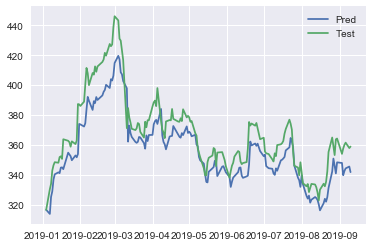

Predicting for  IBM
Train on 1008 samples, validate on 172 samples
Epoch 1/1400
0s - loss: 0.3455 - val_loss: 0.0985
Epoch 2/1400
0s - loss: 0.2600 - val_loss: 0.0528
Epoch 3/1400
0s - loss: 0.1847 - val_loss: 0.0180
Epoch 4/1400
0s - loss: 0.1170 - val_loss: 0.0043
Epoch 5/1400
0s - loss: 0.0677 - val_loss: 0.0209
Epoch 6/1400
0s - loss: 0.0447 - val_loss: 0.0538
Epoch 7/1400
0s - loss: 0.0372 - val_loss: 0.0673
Epoch 8/1400
0s - loss: 0.0332 - val_loss: 0.0597
Epoch 9/1400
0s - loss: 0.0289 - val_loss: 0.0462
Epoch 10/1400
0s - loss: 0.0278 - val_loss: 0.0359
Epoch 11/1400
0s - loss: 0.0274 - val_loss: 0.0300
Epoch 12/1400
0s - loss: 0.0268 - val_loss: 0.0273
Epoch 13/1400
0s - loss: 0.0254 - val_loss: 0.0264
Epoch 14/1400
0s - loss: 0.0247 - val_loss: 0.0258
Epoch 15/1400
0s - loss: 0.0238 - val_loss: 0.0248
Epoch 16/1400
0s - loss: 0.0216 - val_loss: 0.0231
Epoch 17/1400
0s - loss: 0.0217 - val_loss: 0.0211
Epoch 18/1400
0s - loss: 0.0207 - val_loss: 0.0189
Epoch 19/1400
0s - loss:

0s - loss: 0.0029 - val_loss: 0.0118
Epoch 161/1400
0s - loss: 0.0033 - val_loss: 0.0117
Epoch 162/1400
0s - loss: 0.0032 - val_loss: 0.0111
Epoch 163/1400
0s - loss: 0.0030 - val_loss: 0.0111
Epoch 164/1400
0s - loss: 0.0032 - val_loss: 0.0124
Epoch 165/1400
0s - loss: 0.0033 - val_loss: 0.0100
Epoch 166/1400
0s - loss: 0.0031 - val_loss: 0.0117
Epoch 167/1400
0s - loss: 0.0031 - val_loss: 0.0121
Epoch 168/1400
0s - loss: 0.0031 - val_loss: 0.0106
Epoch 169/1400
0s - loss: 0.0033 - val_loss: 0.0116
Epoch 170/1400
0s - loss: 0.0033 - val_loss: 0.0118
Epoch 171/1400
0s - loss: 0.0032 - val_loss: 0.0111
Epoch 172/1400
0s - loss: 0.0030 - val_loss: 0.0119
Epoch 173/1400
0s - loss: 0.0030 - val_loss: 0.0109
Epoch 174/1400
0s - loss: 0.0029 - val_loss: 0.0108
Epoch 175/1400
0s - loss: 0.0031 - val_loss: 0.0107
Epoch 176/1400
0s - loss: 0.0029 - val_loss: 0.0104
Epoch 177/1400
0s - loss: 0.0031 - val_loss: 0.0112
Epoch 178/1400
0s - loss: 0.0030 - val_loss: 0.0105
Epoch 179/1400
0s - loss: 0

0s - loss: 0.0021 - val_loss: 0.0034
Epoch 321/1400
0s - loss: 0.0021 - val_loss: 0.0033
Epoch 322/1400
0s - loss: 0.0021 - val_loss: 0.0032
Epoch 323/1400
0s - loss: 0.0022 - val_loss: 0.0033
Epoch 324/1400
0s - loss: 0.0022 - val_loss: 0.0033
Epoch 325/1400
0s - loss: 0.0020 - val_loss: 0.0034
Epoch 326/1400
0s - loss: 0.0021 - val_loss: 0.0034
Epoch 327/1400
0s - loss: 0.0022 - val_loss: 0.0031
Epoch 328/1400
0s - loss: 0.0021 - val_loss: 0.0030
Epoch 329/1400
0s - loss: 0.0021 - val_loss: 0.0028
Epoch 330/1400
0s - loss: 0.0021 - val_loss: 0.0034
Epoch 331/1400
0s - loss: 0.0023 - val_loss: 0.0030
Epoch 332/1400
0s - loss: 0.0019 - val_loss: 0.0031
Epoch 333/1400
0s - loss: 0.0021 - val_loss: 0.0028
Epoch 334/1400
0s - loss: 0.0021 - val_loss: 0.0038
Epoch 335/1400
0s - loss: 0.0021 - val_loss: 0.0028
Epoch 336/1400
0s - loss: 0.0021 - val_loss: 0.0033
Epoch 337/1400
0s - loss: 0.0021 - val_loss: 0.0029
Epoch 338/1400
0s - loss: 0.0021 - val_loss: 0.0032
Epoch 339/1400
0s - loss: 0

0s - loss: 0.0016 - val_loss: 0.0027
Epoch 479/1400
0s - loss: 0.0014 - val_loss: 0.0017
Epoch 480/1400
0s - loss: 0.0016 - val_loss: 0.0021
Epoch 481/1400
0s - loss: 0.0016 - val_loss: 0.0019
Epoch 482/1400
0s - loss: 0.0016 - val_loss: 0.0023
Epoch 483/1400
0s - loss: 0.0016 - val_loss: 0.0025
Epoch 484/1400
0s - loss: 0.0015 - val_loss: 0.0019
Epoch 485/1400
0s - loss: 0.0016 - val_loss: 0.0024
Epoch 486/1400
0s - loss: 0.0016 - val_loss: 0.0024
Epoch 487/1400
0s - loss: 0.0016 - val_loss: 0.0021
Epoch 488/1400
0s - loss: 0.0015 - val_loss: 0.0021
Epoch 489/1400
0s - loss: 0.0016 - val_loss: 0.0026
Epoch 490/1400
0s - loss: 0.0017 - val_loss: 0.0015
Epoch 491/1400
0s - loss: 0.0016 - val_loss: 0.0024
Epoch 492/1400
0s - loss: 0.0016 - val_loss: 0.0024
Epoch 493/1400
0s - loss: 0.0015 - val_loss: 0.0020
Epoch 494/1400
0s - loss: 0.0015 - val_loss: 0.0023
Epoch 495/1400
0s - loss: 0.0015 - val_loss: 0.0017
Epoch 496/1400
0s - loss: 0.0014 - val_loss: 0.0024
Epoch 497/1400
0s - loss: 0

0s - loss: 0.0011 - val_loss: 0.0021
Epoch 637/1400
0s - loss: 0.0011 - val_loss: 0.0021
Epoch 638/1400
0s - loss: 0.0012 - val_loss: 0.0023
Epoch 639/1400
0s - loss: 0.0012 - val_loss: 0.0016
Epoch 640/1400
0s - loss: 0.0011 - val_loss: 0.0020
Epoch 641/1400
0s - loss: 0.0012 - val_loss: 0.0021
Epoch 642/1400
0s - loss: 0.0010 - val_loss: 0.0020
Epoch 643/1400
0s - loss: 0.0011 - val_loss: 0.0016
Epoch 644/1400
0s - loss: 0.0012 - val_loss: 0.0022
Epoch 645/1400
0s - loss: 0.0011 - val_loss: 0.0016
Epoch 646/1400
0s - loss: 0.0012 - val_loss: 0.0021
Epoch 647/1400
0s - loss: 0.0011 - val_loss: 0.0025
Epoch 648/1400
0s - loss: 0.0012 - val_loss: 0.0019
Epoch 649/1400
0s - loss: 0.0012 - val_loss: 0.0020
Epoch 650/1400
0s - loss: 0.0011 - val_loss: 0.0019
Epoch 651/1400
0s - loss: 0.0011 - val_loss: 0.0022
Epoch 652/1400
0s - loss: 0.0011 - val_loss: 0.0020
Epoch 653/1400
0s - loss: 0.0011 - val_loss: 0.0020
Epoch 654/1400
0s - loss: 0.0012 - val_loss: 0.0022
Epoch 655/1400
0s - loss: 0

0s - loss: 0.0011 - val_loss: 0.0019
Epoch 793/1400
0s - loss: 9.6322e-04 - val_loss: 0.0016
Epoch 794/1400
0s - loss: 9.9808e-04 - val_loss: 0.0022
Epoch 795/1400
0s - loss: 9.1537e-04 - val_loss: 0.0020
Epoch 796/1400
0s - loss: 9.3571e-04 - val_loss: 0.0016
Epoch 797/1400
0s - loss: 0.0010 - val_loss: 0.0024
Epoch 798/1400
0s - loss: 9.6629e-04 - val_loss: 0.0020
Epoch 799/1400
0s - loss: 9.9155e-04 - val_loss: 0.0016
Epoch 800/1400
0s - loss: 9.4917e-04 - val_loss: 0.0021
Epoch 801/1400
0s - loss: 9.5967e-04 - val_loss: 0.0020
Epoch 802/1400
0s - loss: 8.9693e-04 - val_loss: 0.0019
Epoch 803/1400
0s - loss: 9.2065e-04 - val_loss: 0.0020
Epoch 804/1400
0s - loss: 9.5652e-04 - val_loss: 0.0023
Epoch 805/1400
0s - loss: 9.6596e-04 - val_loss: 0.0017
Epoch 806/1400
0s - loss: 8.9552e-04 - val_loss: 0.0019
Epoch 807/1400
0s - loss: 9.0969e-04 - val_loss: 0.0022
Epoch 808/1400
0s - loss: 9.6668e-04 - val_loss: 0.0019
Epoch 809/1400
0s - loss: 8.2674e-04 - val_loss: 0.0017
Epoch 810/1400


0s - loss: 8.3742e-04 - val_loss: 0.0018
Epoch 941/1400
0s - loss: 8.5843e-04 - val_loss: 0.0018
Epoch 942/1400
0s - loss: 8.2312e-04 - val_loss: 0.0023
Epoch 943/1400
0s - loss: 9.2981e-04 - val_loss: 0.0015
Epoch 944/1400
0s - loss: 8.6811e-04 - val_loss: 0.0019
Epoch 945/1400
0s - loss: 9.3536e-04 - val_loss: 0.0027
Epoch 946/1400
0s - loss: 9.1536e-04 - val_loss: 0.0014
Epoch 947/1400
0s - loss: 8.3005e-04 - val_loss: 0.0021
Epoch 948/1400
0s - loss: 8.1807e-04 - val_loss: 0.0022
Epoch 949/1400
0s - loss: 8.6677e-04 - val_loss: 0.0017
Epoch 950/1400
0s - loss: 8.6875e-04 - val_loss: 0.0020
Epoch 951/1400
0s - loss: 8.3758e-04 - val_loss: 0.0020
Epoch 952/1400
0s - loss: 8.9608e-04 - val_loss: 0.0024
Epoch 953/1400
0s - loss: 8.5798e-04 - val_loss: 0.0017
Epoch 954/1400
0s - loss: 8.6699e-04 - val_loss: 0.0018
Epoch 955/1400
0s - loss: 9.0511e-04 - val_loss: 0.0021
Epoch 956/1400
0s - loss: 7.7066e-04 - val_loss: 0.0016
Epoch 957/1400
0s - loss: 8.4381e-04 - val_loss: 0.0018
Epoch 9

0s - loss: 8.1585e-04 - val_loss: 0.0021
Epoch 1089/1400
0s - loss: 8.0726e-04 - val_loss: 0.0017
Epoch 1090/1400
0s - loss: 8.7670e-04 - val_loss: 0.0021
Epoch 1091/1400
0s - loss: 8.3020e-04 - val_loss: 0.0020
Epoch 1092/1400
0s - loss: 8.3476e-04 - val_loss: 0.0017
Epoch 1093/1400
0s - loss: 8.3762e-04 - val_loss: 0.0020
Epoch 1094/1400
0s - loss: 8.4962e-04 - val_loss: 0.0024
Epoch 1095/1400
0s - loss: 8.6277e-04 - val_loss: 0.0013
Epoch 1096/1400
0s - loss: 8.0375e-04 - val_loss: 0.0019
Epoch 1097/1400
0s - loss: 8.1565e-04 - val_loss: 0.0024
Epoch 1098/1400
0s - loss: 8.2689e-04 - val_loss: 0.0017
Epoch 1099/1400
0s - loss: 7.3280e-04 - val_loss: 0.0019
Epoch 1100/1400
0s - loss: 7.9763e-04 - val_loss: 0.0021
Epoch 1101/1400
0s - loss: 8.2005e-04 - val_loss: 0.0017
Epoch 1102/1400
0s - loss: 8.2075e-04 - val_loss: 0.0020
Epoch 1103/1400
0s - loss: 8.1577e-04 - val_loss: 0.0021
Epoch 1104/1400
0s - loss: 8.6098e-04 - val_loss: 0.0015
Epoch 1105/1400
0s - loss: 8.2887e-04 - val_los

0s - loss: 8.2274e-04 - val_loss: 0.0019
Epoch 1233/1400
0s - loss: 8.0145e-04 - val_loss: 0.0019
Epoch 1234/1400
0s - loss: 8.1466e-04 - val_loss: 0.0017
Epoch 1235/1400
0s - loss: 8.8281e-04 - val_loss: 0.0022
Epoch 1236/1400
0s - loss: 8.2426e-04 - val_loss: 0.0021
Epoch 1237/1400
0s - loss: 8.8887e-04 - val_loss: 0.0014
Epoch 1238/1400
0s - loss: 7.6963e-04 - val_loss: 0.0026
Epoch 1239/1400
0s - loss: 8.0806e-04 - val_loss: 0.0022
Epoch 1240/1400
0s - loss: 7.5052e-04 - val_loss: 0.0018
Epoch 1241/1400
0s - loss: 7.8274e-04 - val_loss: 0.0017
Epoch 1242/1400
0s - loss: 8.2703e-04 - val_loss: 0.0020
Epoch 1243/1400
0s - loss: 7.8756e-04 - val_loss: 0.0020
Epoch 1244/1400
0s - loss: 7.6678e-04 - val_loss: 0.0019
Epoch 1245/1400
0s - loss: 8.4687e-04 - val_loss: 0.0020
Epoch 1246/1400
0s - loss: 8.4195e-04 - val_loss: 0.0021
Epoch 1247/1400
0s - loss: 8.1542e-04 - val_loss: 0.0015
Epoch 1248/1400
0s - loss: 8.2798e-04 - val_loss: 0.0021
Epoch 1249/1400
0s - loss: 8.3608e-04 - val_los

0s - loss: 8.2952e-04 - val_loss: 0.0025
Epoch 1377/1400
0s - loss: 7.9084e-04 - val_loss: 0.0022
Epoch 1378/1400
0s - loss: 7.5509e-04 - val_loss: 0.0019
Epoch 1379/1400
0s - loss: 7.6480e-04 - val_loss: 0.0022
Epoch 1380/1400
0s - loss: 7.3323e-04 - val_loss: 0.0021
Epoch 1381/1400
0s - loss: 7.7934e-04 - val_loss: 0.0019
Epoch 1382/1400
0s - loss: 7.6933e-04 - val_loss: 0.0020
Epoch 1383/1400
0s - loss: 7.6604e-04 - val_loss: 0.0020
Epoch 1384/1400
0s - loss: 8.2477e-04 - val_loss: 0.0019
Epoch 1385/1400
0s - loss: 7.5466e-04 - val_loss: 0.0019
Epoch 1386/1400
0s - loss: 7.1741e-04 - val_loss: 0.0018
Epoch 1387/1400
0s - loss: 7.4471e-04 - val_loss: 0.0022
Epoch 1388/1400
0s - loss: 7.7655e-04 - val_loss: 0.0020
Epoch 1389/1400
0s - loss: 7.2257e-04 - val_loss: 0.0021
Epoch 1390/1400
0s - loss: 7.6371e-04 - val_loss: 0.0021
Epoch 1391/1400
0s - loss: 7.5697e-04 - val_loss: 0.0021
Epoch 1392/1400
0s - loss: 7.7238e-04 - val_loss: 0.0019
Epoch 1393/1400
0s - loss: 7.4962e-04 - val_los

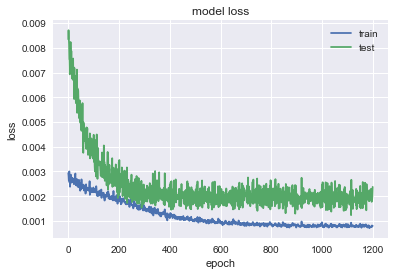

               IBM
MSE        13.0121
MAE        3.20602
R2        0.691937
MAPE (%)   2.33163


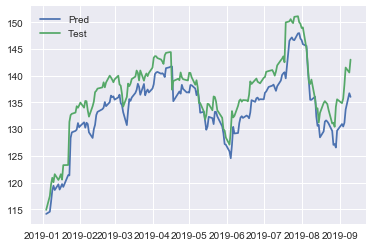

Predicting for  ALB
Train on 1008 samples, validate on 172 samples
Epoch 1/1400
0s - loss: 0.2098 - val_loss: 0.0658
Epoch 2/1400
0s - loss: 0.1610 - val_loss: 0.0371
Epoch 3/1400
0s - loss: 0.1169 - val_loss: 0.0163
Epoch 4/1400
0s - loss: 0.0806 - val_loss: 0.0076
Epoch 5/1400
0s - loss: 0.0548 - val_loss: 0.0132
Epoch 6/1400
0s - loss: 0.0427 - val_loss: 0.0294
Epoch 7/1400
0s - loss: 0.0419 - val_loss: 0.0451
Epoch 8/1400
0s - loss: 0.0429 - val_loss: 0.0523
Epoch 9/1400
0s - loss: 0.0421 - val_loss: 0.0515
Epoch 10/1400
0s - loss: 0.0414 - val_loss: 0.0482
Epoch 11/1400
0s - loss: 0.0390 - val_loss: 0.0458
Epoch 12/1400
0s - loss: 0.0366 - val_loss: 0.0458
Epoch 13/1400
0s - loss: 0.0357 - val_loss: 0.0475
Epoch 14/1400
0s - loss: 0.0354 - val_loss: 0.0504
Epoch 15/1400
0s - loss: 0.0332 - val_loss: 0.0536
Epoch 16/1400
0s - loss: 0.0315 - val_loss: 0.0569
Epoch 17/1400
0s - loss: 0.0305 - val_loss: 0.0593
Epoch 18/1400
0s - loss: 0.0296 - val_loss: 0.0611
Epoch 19/1400
0s - loss:

0s - loss: 0.0027 - val_loss: 0.0249
Epoch 161/1400
0s - loss: 0.0025 - val_loss: 0.0245
Epoch 162/1400
0s - loss: 0.0023 - val_loss: 0.0253
Epoch 163/1400
0s - loss: 0.0026 - val_loss: 0.0248
Epoch 164/1400
0s - loss: 0.0024 - val_loss: 0.0233
Epoch 165/1400
0s - loss: 0.0024 - val_loss: 0.0222
Epoch 166/1400
0s - loss: 0.0025 - val_loss: 0.0218
Epoch 167/1400
0s - loss: 0.0025 - val_loss: 0.0211
Epoch 168/1400
0s - loss: 0.0022 - val_loss: 0.0221
Epoch 169/1400
0s - loss: 0.0025 - val_loss: 0.0192
Epoch 170/1400
0s - loss: 0.0024 - val_loss: 0.0211
Epoch 171/1400
0s - loss: 0.0023 - val_loss: 0.0206
Epoch 172/1400
0s - loss: 0.0024 - val_loss: 0.0209
Epoch 173/1400
0s - loss: 0.0023 - val_loss: 0.0205
Epoch 174/1400
0s - loss: 0.0025 - val_loss: 0.0189
Epoch 175/1400
0s - loss: 0.0020 - val_loss: 0.0203
Epoch 176/1400
0s - loss: 0.0023 - val_loss: 0.0193
Epoch 177/1400
0s - loss: 0.0024 - val_loss: 0.0196
Epoch 178/1400
0s - loss: 0.0022 - val_loss: 0.0180
Epoch 179/1400
0s - loss: 0

0s - loss: 0.0016 - val_loss: 0.0022
Epoch 321/1400
0s - loss: 0.0015 - val_loss: 0.0031
Epoch 322/1400
0s - loss: 0.0016 - val_loss: 0.0021
Epoch 323/1400
0s - loss: 0.0016 - val_loss: 0.0029
Epoch 324/1400
0s - loss: 0.0016 - val_loss: 0.0020
Epoch 325/1400
0s - loss: 0.0017 - val_loss: 0.0029
Epoch 326/1400
0s - loss: 0.0017 - val_loss: 0.0025
Epoch 327/1400
0s - loss: 0.0015 - val_loss: 0.0026
Epoch 328/1400
0s - loss: 0.0017 - val_loss: 0.0027
Epoch 329/1400
0s - loss: 0.0016 - val_loss: 0.0025
Epoch 330/1400
0s - loss: 0.0016 - val_loss: 0.0025
Epoch 331/1400
0s - loss: 0.0016 - val_loss: 0.0030
Epoch 332/1400
0s - loss: 0.0017 - val_loss: 0.0023
Epoch 333/1400
0s - loss: 0.0017 - val_loss: 0.0026
Epoch 334/1400
0s - loss: 0.0018 - val_loss: 0.0019
Epoch 335/1400
0s - loss: 0.0017 - val_loss: 0.0022
Epoch 336/1400
0s - loss: 0.0018 - val_loss: 0.0021
Epoch 337/1400
0s - loss: 0.0017 - val_loss: 0.0024
Epoch 338/1400
0s - loss: 0.0018 - val_loss: 0.0021
Epoch 339/1400
0s - loss: 0

0s - loss: 0.0011 - val_loss: 3.6388e-04
Epoch 477/1400
0s - loss: 0.0012 - val_loss: 8.5763e-04
Epoch 478/1400
0s - loss: 0.0013 - val_loss: 4.4141e-04
Epoch 479/1400
0s - loss: 0.0010 - val_loss: 4.1230e-04
Epoch 480/1400
0s - loss: 0.0011 - val_loss: 6.4032e-04
Epoch 481/1400
0s - loss: 0.0010 - val_loss: 3.8716e-04
Epoch 482/1400
0s - loss: 0.0012 - val_loss: 4.2884e-04
Epoch 483/1400
0s - loss: 0.0011 - val_loss: 3.6376e-04
Epoch 484/1400
0s - loss: 0.0012 - val_loss: 5.2428e-04
Epoch 485/1400
0s - loss: 0.0010 - val_loss: 4.3432e-04
Epoch 486/1400
0s - loss: 0.0011 - val_loss: 3.4235e-04
Epoch 487/1400
0s - loss: 0.0011 - val_loss: 8.5760e-04
Epoch 488/1400
0s - loss: 0.0010 - val_loss: 3.6447e-04
Epoch 489/1400
0s - loss: 0.0011 - val_loss: 4.6114e-04
Epoch 490/1400
0s - loss: 0.0011 - val_loss: 5.2206e-04
Epoch 491/1400
0s - loss: 0.0011 - val_loss: 3.2209e-04
Epoch 492/1400
0s - loss: 0.0011 - val_loss: 7.1626e-04
Epoch 493/1400
0s - loss: 0.0011 - val_loss: 3.3193e-04
Epoch 4

0s - loss: 8.4236e-04 - val_loss: 3.0538e-04
Epoch 621/1400
0s - loss: 8.5950e-04 - val_loss: 3.2286e-04
Epoch 622/1400
0s - loss: 8.0936e-04 - val_loss: 3.0032e-04
Epoch 623/1400
0s - loss: 9.7398e-04 - val_loss: 3.1341e-04
Epoch 624/1400
0s - loss: 8.3838e-04 - val_loss: 3.0513e-04
Epoch 625/1400
0s - loss: 8.5867e-04 - val_loss: 3.1851e-04
Epoch 626/1400
0s - loss: 8.0084e-04 - val_loss: 3.1788e-04
Epoch 627/1400
0s - loss: 8.5637e-04 - val_loss: 3.0903e-04
Epoch 628/1400
0s - loss: 7.9759e-04 - val_loss: 3.1549e-04
Epoch 629/1400
0s - loss: 8.2735e-04 - val_loss: 2.9734e-04
Epoch 630/1400
0s - loss: 7.8848e-04 - val_loss: 2.9455e-04
Epoch 631/1400
0s - loss: 8.2167e-04 - val_loss: 3.3001e-04
Epoch 632/1400
0s - loss: 8.3474e-04 - val_loss: 3.0052e-04
Epoch 633/1400
0s - loss: 8.1041e-04 - val_loss: 3.3962e-04
Epoch 634/1400
0s - loss: 8.6525e-04 - val_loss: 3.0286e-04
Epoch 635/1400
0s - loss: 9.9194e-04 - val_loss: 3.1754e-04
Epoch 636/1400
0s - loss: 9.0515e-04 - val_loss: 5.5588

0s - loss: 7.6298e-04 - val_loss: 2.9308e-04
Epoch 758/1400
0s - loss: 7.6072e-04 - val_loss: 2.9923e-04
Epoch 759/1400
0s - loss: 7.6840e-04 - val_loss: 3.3426e-04
Epoch 760/1400
0s - loss: 6.1661e-04 - val_loss: 2.9254e-04
Epoch 761/1400
0s - loss: 7.7368e-04 - val_loss: 3.3628e-04
Epoch 762/1400
0s - loss: 6.9140e-04 - val_loss: 2.9031e-04
Epoch 763/1400
0s - loss: 7.2569e-04 - val_loss: 2.9364e-04
Epoch 764/1400
0s - loss: 7.1689e-04 - val_loss: 2.8779e-04
Epoch 765/1400
0s - loss: 7.9910e-04 - val_loss: 2.9394e-04
Epoch 766/1400
0s - loss: 7.7469e-04 - val_loss: 3.7503e-04
Epoch 767/1400
0s - loss: 7.1336e-04 - val_loss: 2.8731e-04
Epoch 768/1400
0s - loss: 7.5941e-04 - val_loss: 2.8593e-04
Epoch 769/1400
0s - loss: 7.3535e-04 - val_loss: 3.4992e-04
Epoch 770/1400
0s - loss: 7.3531e-04 - val_loss: 2.9488e-04
Epoch 771/1400
0s - loss: 8.0321e-04 - val_loss: 2.8760e-04
Epoch 772/1400
0s - loss: 7.9716e-04 - val_loss: 3.3348e-04
Epoch 773/1400
0s - loss: 7.4804e-04 - val_loss: 2.9048

0s - loss: 7.8596e-04 - val_loss: 3.2019e-04
Epoch 897/1400
0s - loss: 7.2914e-04 - val_loss: 3.8613e-04
Epoch 898/1400
0s - loss: 7.0045e-04 - val_loss: 2.8449e-04
Epoch 899/1400
0s - loss: 7.0459e-04 - val_loss: 2.9178e-04
Epoch 900/1400
0s - loss: 7.2072e-04 - val_loss: 4.3868e-04
Epoch 901/1400
0s - loss: 8.0367e-04 - val_loss: 3.1534e-04
Epoch 902/1400
0s - loss: 6.7560e-04 - val_loss: 2.9049e-04
Epoch 903/1400
0s - loss: 6.4824e-04 - val_loss: 3.6463e-04
Epoch 904/1400
0s - loss: 6.4054e-04 - val_loss: 2.8318e-04
Epoch 905/1400
0s - loss: 6.6080e-04 - val_loss: 3.0893e-04
Epoch 906/1400
0s - loss: 6.8574e-04 - val_loss: 3.1855e-04
Epoch 907/1400
0s - loss: 6.3996e-04 - val_loss: 2.8661e-04
Epoch 908/1400
0s - loss: 7.6934e-04 - val_loss: 2.9041e-04
Epoch 909/1400
0s - loss: 6.9014e-04 - val_loss: 5.4875e-04
Epoch 910/1400
0s - loss: 7.3529e-04 - val_loss: 2.8277e-04
Epoch 911/1400
0s - loss: 6.8165e-04 - val_loss: 3.1121e-04
Epoch 912/1400
0s - loss: 8.1641e-04 - val_loss: 4.1576

0s - loss: 6.6583e-04 - val_loss: 3.6702e-04
Epoch 1036/1400
0s - loss: 6.7134e-04 - val_loss: 2.9465e-04
Epoch 1037/1400
0s - loss: 7.2367e-04 - val_loss: 3.6353e-04
Epoch 1038/1400
0s - loss: 6.2603e-04 - val_loss: 2.9524e-04
Epoch 1039/1400
0s - loss: 6.4114e-04 - val_loss: 2.8887e-04
Epoch 1040/1400
0s - loss: 6.7158e-04 - val_loss: 2.8603e-04
Epoch 1041/1400
0s - loss: 6.5068e-04 - val_loss: 3.1100e-04
Epoch 1042/1400
0s - loss: 6.2050e-04 - val_loss: 2.8114e-04
Epoch 1043/1400
0s - loss: 7.3174e-04 - val_loss: 2.8197e-04
Epoch 1044/1400
0s - loss: 6.6235e-04 - val_loss: 3.8664e-04
Epoch 1045/1400
0s - loss: 7.0117e-04 - val_loss: 3.2185e-04
Epoch 1046/1400
0s - loss: 6.8509e-04 - val_loss: 4.3826e-04
Epoch 1047/1400
0s - loss: 6.4672e-04 - val_loss: 2.8010e-04
Epoch 1048/1400
0s - loss: 6.4971e-04 - val_loss: 2.8789e-04
Epoch 1049/1400
0s - loss: 7.2206e-04 - val_loss: 3.9240e-04
Epoch 1050/1400
0s - loss: 7.8274e-04 - val_loss: 3.4955e-04
Epoch 1051/1400
0s - loss: 7.1076e-04 - 

0s - loss: 6.9473e-04 - val_loss: 2.8225e-04
Epoch 1172/1400
0s - loss: 7.0716e-04 - val_loss: 3.1228e-04
Epoch 1173/1400
0s - loss: 6.4825e-04 - val_loss: 3.1611e-04
Epoch 1174/1400
0s - loss: 6.7507e-04 - val_loss: 3.5702e-04
Epoch 1175/1400
0s - loss: 6.5533e-04 - val_loss: 2.9120e-04
Epoch 1176/1400
0s - loss: 6.3395e-04 - val_loss: 3.0616e-04
Epoch 1177/1400
0s - loss: 6.8091e-04 - val_loss: 4.0419e-04
Epoch 1178/1400
0s - loss: 6.2304e-04 - val_loss: 2.8801e-04
Epoch 1179/1400
0s - loss: 6.6695e-04 - val_loss: 3.0354e-04
Epoch 1180/1400
0s - loss: 6.5497e-04 - val_loss: 3.5898e-04
Epoch 1181/1400
0s - loss: 6.7072e-04 - val_loss: 3.1537e-04
Epoch 1182/1400
0s - loss: 6.5645e-04 - val_loss: 3.4228e-04
Epoch 1183/1400
0s - loss: 7.0876e-04 - val_loss: 3.1264e-04
Epoch 1184/1400
0s - loss: 7.7005e-04 - val_loss: 3.8311e-04
Epoch 1185/1400
0s - loss: 8.4283e-04 - val_loss: 5.1527e-04
Epoch 1186/1400
0s - loss: 7.5496e-04 - val_loss: 3.0903e-04
Epoch 1187/1400
0s - loss: 6.5223e-04 - 

0s - loss: 6.3827e-04 - val_loss: 3.1002e-04
Epoch 1308/1400
0s - loss: 6.3683e-04 - val_loss: 2.8431e-04
Epoch 1309/1400
0s - loss: 6.2492e-04 - val_loss: 2.8567e-04
Epoch 1310/1400
0s - loss: 6.4285e-04 - val_loss: 2.9090e-04
Epoch 1311/1400
0s - loss: 6.5704e-04 - val_loss: 2.8622e-04
Epoch 1312/1400
0s - loss: 6.3009e-04 - val_loss: 3.0148e-04
Epoch 1313/1400
0s - loss: 7.0562e-04 - val_loss: 4.5002e-04
Epoch 1314/1400
0s - loss: 6.4259e-04 - val_loss: 2.8863e-04
Epoch 1315/1400
0s - loss: 6.8810e-04 - val_loss: 3.6056e-04
Epoch 1316/1400
0s - loss: 7.1858e-04 - val_loss: 3.7374e-04
Epoch 1317/1400
0s - loss: 6.7092e-04 - val_loss: 3.3424e-04
Epoch 1318/1400
0s - loss: 6.2002e-04 - val_loss: 2.8687e-04
Epoch 1319/1400
0s - loss: 6.4542e-04 - val_loss: 3.0839e-04
Epoch 1320/1400
0s - loss: 6.2053e-04 - val_loss: 3.0290e-04
Epoch 1321/1400
0s - loss: 6.2665e-04 - val_loss: 3.4357e-04
Epoch 1322/1400
0s - loss: 6.2181e-04 - val_loss: 2.8904e-04
Epoch 1323/1400
0s - loss: 6.5754e-04 - 

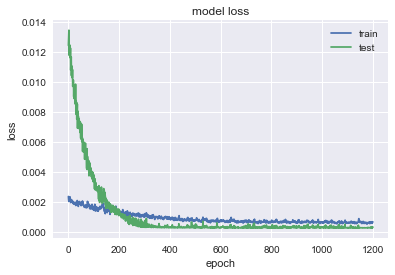

               ALB
MSE        3.57694
MAE        1.43753
R2        0.939586
MAPE (%)   1.90953


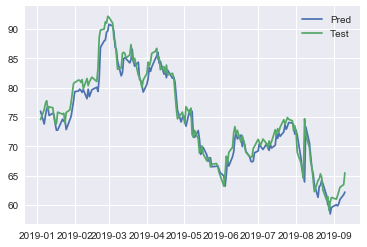

Predicting for  CBRE
Train on 1008 samples, validate on 172 samples
Epoch 1/1400
0s - loss: 0.1741 - val_loss: 0.5398
Epoch 2/1400
0s - loss: 0.1226 - val_loss: 0.4419
Epoch 3/1400
0s - loss: 0.0805 - val_loss: 0.3430
Epoch 4/1400
0s - loss: 0.0476 - val_loss: 0.2511
Epoch 5/1400
0s - loss: 0.0295 - val_loss: 0.1774
Epoch 6/1400
0s - loss: 0.0247 - val_loss: 0.1317
Epoch 7/1400
0s - loss: 0.0271 - val_loss: 0.1137
Epoch 8/1400
0s - loss: 0.0270 - val_loss: 0.1134
Epoch 9/1400
0s - loss: 0.0251 - val_loss: 0.1191
Epoch 10/1400
0s - loss: 0.0234 - val_loss: 0.1228
Epoch 11/1400
0s - loss: 0.0219 - val_loss: 0.1215
Epoch 12/1400
0s - loss: 0.0198 - val_loss: 0.1154
Epoch 13/1400
0s - loss: 0.0188 - val_loss: 0.1076
Epoch 14/1400
0s - loss: 0.0183 - val_loss: 0.0999
Epoch 15/1400
0s - loss: 0.0168 - val_loss: 0.0931
Epoch 16/1400
0s - loss: 0.0156 - val_loss: 0.0881
Epoch 17/1400
0s - loss: 0.0144 - val_loss: 0.0835
Epoch 18/1400
0s - loss: 0.0138 - val_loss: 0.0787
Epoch 19/1400
0s - loss

0s - loss: 0.0021 - val_loss: 0.0161
Epoch 161/1400
0s - loss: 0.0021 - val_loss: 0.0145
Epoch 162/1400
0s - loss: 0.0020 - val_loss: 0.0163
Epoch 163/1400
0s - loss: 0.0021 - val_loss: 0.0159
Epoch 164/1400
0s - loss: 0.0019 - val_loss: 0.0147
Epoch 165/1400
0s - loss: 0.0021 - val_loss: 0.0150
Epoch 166/1400
0s - loss: 0.0019 - val_loss: 0.0156
Epoch 167/1400
0s - loss: 0.0021 - val_loss: 0.0147
Epoch 168/1400
0s - loss: 0.0020 - val_loss: 0.0149
Epoch 169/1400
0s - loss: 0.0020 - val_loss: 0.0156
Epoch 170/1400
0s - loss: 0.0019 - val_loss: 0.0137
Epoch 171/1400
0s - loss: 0.0020 - val_loss: 0.0136
Epoch 172/1400
0s - loss: 0.0020 - val_loss: 0.0147
Epoch 173/1400
0s - loss: 0.0021 - val_loss: 0.0143
Epoch 174/1400
0s - loss: 0.0018 - val_loss: 0.0141
Epoch 175/1400
0s - loss: 0.0020 - val_loss: 0.0143
Epoch 176/1400
0s - loss: 0.0020 - val_loss: 0.0128
Epoch 177/1400
0s - loss: 0.0018 - val_loss: 0.0143
Epoch 178/1400
0s - loss: 0.0019 - val_loss: 0.0133
Epoch 179/1400
0s - loss: 0

0s - loss: 0.0014 - val_loss: 0.0033
Epoch 320/1400
0s - loss: 0.0016 - val_loss: 0.0033
Epoch 321/1400
0s - loss: 0.0014 - val_loss: 0.0028
Epoch 322/1400
0s - loss: 0.0014 - val_loss: 0.0037
Epoch 323/1400
0s - loss: 0.0014 - val_loss: 0.0027
Epoch 324/1400
0s - loss: 0.0012 - val_loss: 0.0034
Epoch 325/1400
0s - loss: 0.0015 - val_loss: 0.0027
Epoch 326/1400
0s - loss: 0.0013 - val_loss: 0.0032
Epoch 327/1400
0s - loss: 0.0012 - val_loss: 0.0028
Epoch 328/1400
0s - loss: 0.0013 - val_loss: 0.0034
Epoch 329/1400
0s - loss: 0.0014 - val_loss: 0.0028
Epoch 330/1400
0s - loss: 0.0012 - val_loss: 0.0034
Epoch 331/1400
0s - loss: 0.0012 - val_loss: 0.0028
Epoch 332/1400
0s - loss: 0.0012 - val_loss: 0.0030
Epoch 333/1400
0s - loss: 0.0013 - val_loss: 0.0026
Epoch 334/1400
0s - loss: 0.0013 - val_loss: 0.0029
Epoch 335/1400
0s - loss: 0.0011 - val_loss: 0.0027
Epoch 336/1400
0s - loss: 0.0013 - val_loss: 0.0032
Epoch 337/1400
0s - loss: 0.0012 - val_loss: 0.0028
Epoch 338/1400
0s - loss: 0

0s - loss: 0.0010 - val_loss: 0.0024
Epoch 478/1400
0s - loss: 0.0010 - val_loss: 0.0016
Epoch 479/1400
0s - loss: 9.4294e-04 - val_loss: 0.0021
Epoch 480/1400
0s - loss: 9.2757e-04 - val_loss: 0.0019
Epoch 481/1400
0s - loss: 9.6231e-04 - val_loss: 0.0016
Epoch 482/1400
0s - loss: 0.0010 - val_loss: 0.0019
Epoch 483/1400
0s - loss: 9.2240e-04 - val_loss: 0.0020
Epoch 484/1400
0s - loss: 0.0010 - val_loss: 0.0018
Epoch 485/1400
0s - loss: 9.0046e-04 - val_loss: 0.0023
Epoch 486/1400
0s - loss: 9.7063e-04 - val_loss: 0.0019
Epoch 487/1400
0s - loss: 9.5580e-04 - val_loss: 0.0022
Epoch 488/1400
0s - loss: 9.4592e-04 - val_loss: 0.0018
Epoch 489/1400
0s - loss: 0.0010 - val_loss: 0.0022
Epoch 490/1400
0s - loss: 9.1733e-04 - val_loss: 0.0019
Epoch 491/1400
0s - loss: 0.0011 - val_loss: 0.0017
Epoch 492/1400
0s - loss: 9.3327e-04 - val_loss: 0.0024
Epoch 493/1400
0s - loss: 9.0196e-04 - val_loss: 0.0017
Epoch 494/1400
0s - loss: 9.1633e-04 - val_loss: 0.0022
Epoch 495/1400
0s - loss: 8.919

0s - loss: 7.7298e-04 - val_loss: 0.0015
Epoch 629/1400
0s - loss: 8.1930e-04 - val_loss: 0.0013
Epoch 630/1400
0s - loss: 7.6302e-04 - val_loss: 0.0023
Epoch 631/1400
0s - loss: 8.7589e-04 - val_loss: 9.1745e-04
Epoch 632/1400
0s - loss: 8.1975e-04 - val_loss: 0.0022
Epoch 633/1400
0s - loss: 7.0967e-04 - val_loss: 0.0014
Epoch 634/1400
0s - loss: 6.7886e-04 - val_loss: 0.0016
Epoch 635/1400
0s - loss: 6.6043e-04 - val_loss: 0.0017
Epoch 636/1400
0s - loss: 7.4539e-04 - val_loss: 0.0016
Epoch 637/1400
0s - loss: 7.4797e-04 - val_loss: 0.0016
Epoch 638/1400
0s - loss: 7.0693e-04 - val_loss: 0.0020
Epoch 639/1400
0s - loss: 6.9267e-04 - val_loss: 0.0015
Epoch 640/1400
0s - loss: 7.9715e-04 - val_loss: 0.0018
Epoch 641/1400
0s - loss: 7.1247e-04 - val_loss: 0.0013
Epoch 642/1400
0s - loss: 7.0015e-04 - val_loss: 0.0017
Epoch 643/1400
0s - loss: 6.9818e-04 - val_loss: 0.0015
Epoch 644/1400
0s - loss: 7.7511e-04 - val_loss: 0.0019
Epoch 645/1400
0s - loss: 7.7864e-04 - val_loss: 0.0014
Epo

0s - loss: 7.2349e-04 - val_loss: 0.0013
Epoch 776/1400
0s - loss: 7.2617e-04 - val_loss: 0.0015
Epoch 777/1400
0s - loss: 7.4253e-04 - val_loss: 0.0023
Epoch 778/1400
0s - loss: 6.6866e-04 - val_loss: 0.0012
Epoch 779/1400
0s - loss: 6.0841e-04 - val_loss: 0.0020
Epoch 780/1400
0s - loss: 7.0716e-04 - val_loss: 0.0017
Epoch 781/1400
0s - loss: 6.4355e-04 - val_loss: 0.0018
Epoch 782/1400
0s - loss: 5.6927e-04 - val_loss: 0.0014
Epoch 783/1400
0s - loss: 6.0722e-04 - val_loss: 0.0017
Epoch 784/1400
0s - loss: 6.5952e-04 - val_loss: 0.0016
Epoch 785/1400
0s - loss: 5.8485e-04 - val_loss: 0.0016
Epoch 786/1400
0s - loss: 6.8066e-04 - val_loss: 0.0014
Epoch 787/1400
0s - loss: 6.2132e-04 - val_loss: 0.0020
Epoch 788/1400
0s - loss: 6.6704e-04 - val_loss: 0.0013
Epoch 789/1400
0s - loss: 5.6830e-04 - val_loss: 0.0018
Epoch 790/1400
0s - loss: 6.1468e-04 - val_loss: 0.0013
Epoch 791/1400
0s - loss: 6.2209e-04 - val_loss: 0.0019
Epoch 792/1400
0s - loss: 5.9790e-04 - val_loss: 0.0013
Epoch 7

0s - loss: 5.5852e-04 - val_loss: 0.0019
Epoch 924/1400
0s - loss: 5.7714e-04 - val_loss: 0.0018
Epoch 925/1400
0s - loss: 5.8630e-04 - val_loss: 0.0017
Epoch 926/1400
0s - loss: 5.9824e-04 - val_loss: 0.0016
Epoch 927/1400
0s - loss: 6.8191e-04 - val_loss: 0.0020
Epoch 928/1400
0s - loss: 6.3382e-04 - val_loss: 0.0013
Epoch 929/1400
0s - loss: 6.6339e-04 - val_loss: 0.0020
Epoch 930/1400
0s - loss: 6.0668e-04 - val_loss: 0.0017
Epoch 931/1400
0s - loss: 7.0978e-04 - val_loss: 0.0014
Epoch 932/1400
0s - loss: 7.9233e-04 - val_loss: 0.0021
Epoch 933/1400
0s - loss: 6.4471e-04 - val_loss: 0.0013
Epoch 934/1400
0s - loss: 6.4501e-04 - val_loss: 0.0012
Epoch 935/1400
0s - loss: 5.7206e-04 - val_loss: 0.0019
Epoch 936/1400
0s - loss: 6.2989e-04 - val_loss: 0.0015
Epoch 937/1400
0s - loss: 5.8721e-04 - val_loss: 0.0020
Epoch 938/1400
0s - loss: 5.3998e-04 - val_loss: 0.0015
Epoch 939/1400
0s - loss: 5.4239e-04 - val_loss: 0.0017
Epoch 940/1400
0s - loss: 5.9132e-04 - val_loss: 0.0016
Epoch 9

0s - loss: 5.6549e-04 - val_loss: 0.0017
Epoch 1072/1400
0s - loss: 6.1019e-04 - val_loss: 0.0015
Epoch 1073/1400
0s - loss: 6.1498e-04 - val_loss: 0.0017
Epoch 1074/1400
0s - loss: 5.5217e-04 - val_loss: 0.0014
Epoch 1075/1400
0s - loss: 5.8170e-04 - val_loss: 0.0016
Epoch 1076/1400
0s - loss: 5.6681e-04 - val_loss: 0.0016
Epoch 1077/1400
0s - loss: 5.9278e-04 - val_loss: 0.0013
Epoch 1078/1400
0s - loss: 5.5189e-04 - val_loss: 0.0015
Epoch 1079/1400
0s - loss: 6.2024e-04 - val_loss: 0.0015
Epoch 1080/1400
0s - loss: 6.0754e-04 - val_loss: 0.0012
Epoch 1081/1400
0s - loss: 5.9773e-04 - val_loss: 0.0015
Epoch 1082/1400
0s - loss: 6.2200e-04 - val_loss: 0.0018
Epoch 1083/1400
0s - loss: 5.8308e-04 - val_loss: 0.0014
Epoch 1084/1400
0s - loss: 6.1652e-04 - val_loss: 0.0011
Epoch 1085/1400
0s - loss: 5.7908e-04 - val_loss: 0.0018
Epoch 1086/1400
0s - loss: 5.8888e-04 - val_loss: 0.0014
Epoch 1087/1400
0s - loss: 5.4501e-04 - val_loss: 0.0015
Epoch 1088/1400
0s - loss: 5.7017e-04 - val_los

0s - loss: 4.9599e-04 - val_loss: 0.0016
Epoch 1218/1400
0s - loss: 5.9033e-04 - val_loss: 0.0017
Epoch 1219/1400
0s - loss: 6.0085e-04 - val_loss: 0.0018
Epoch 1220/1400
0s - loss: 5.4672e-04 - val_loss: 0.0016
Epoch 1221/1400
0s - loss: 5.9194e-04 - val_loss: 0.0015
Epoch 1222/1400
0s - loss: 5.7621e-04 - val_loss: 0.0018
Epoch 1223/1400
0s - loss: 5.4839e-04 - val_loss: 0.0015
Epoch 1224/1400
0s - loss: 5.9947e-04 - val_loss: 0.0015
Epoch 1225/1400
0s - loss: 6.0002e-04 - val_loss: 0.0017
Epoch 1226/1400
0s - loss: 6.1734e-04 - val_loss: 0.0014
Epoch 1227/1400
0s - loss: 6.3670e-04 - val_loss: 0.0015
Epoch 1228/1400
0s - loss: 7.2293e-04 - val_loss: 0.0022
Epoch 1229/1400
0s - loss: 5.5386e-04 - val_loss: 0.0012
Epoch 1230/1400
0s - loss: 5.8775e-04 - val_loss: 0.0017
Epoch 1231/1400
0s - loss: 5.5873e-04 - val_loss: 0.0017
Epoch 1232/1400
0s - loss: 5.9635e-04 - val_loss: 0.0018
Epoch 1233/1400
0s - loss: 6.5817e-04 - val_loss: 0.0012
Epoch 1234/1400
0s - loss: 6.1145e-04 - val_los

0s - loss: 5.6682e-04 - val_loss: 0.0018
Epoch 1362/1400
0s - loss: 5.6493e-04 - val_loss: 0.0014
Epoch 1363/1400
0s - loss: 4.9084e-04 - val_loss: 0.0019
Epoch 1364/1400
0s - loss: 5.4480e-04 - val_loss: 0.0015
Epoch 1365/1400
0s - loss: 5.8179e-04 - val_loss: 0.0014
Epoch 1366/1400
0s - loss: 5.4949e-04 - val_loss: 0.0016
Epoch 1367/1400
0s - loss: 6.7264e-04 - val_loss: 0.0013
Epoch 1368/1400
0s - loss: 6.2243e-04 - val_loss: 0.0022
Epoch 1369/1400
0s - loss: 5.5698e-04 - val_loss: 0.0013
Epoch 1370/1400
0s - loss: 5.7346e-04 - val_loss: 0.0015
Epoch 1371/1400
0s - loss: 6.0616e-04 - val_loss: 0.0018
Epoch 1372/1400
0s - loss: 5.6421e-04 - val_loss: 0.0012
Epoch 1373/1400
0s - loss: 5.8459e-04 - val_loss: 0.0016
Epoch 1374/1400
0s - loss: 5.7738e-04 - val_loss: 0.0019
Epoch 1375/1400
0s - loss: 6.2071e-04 - val_loss: 0.0015
Epoch 1376/1400
0s - loss: 7.0665e-04 - val_loss: 0.0019
Epoch 1377/1400
0s - loss: 6.1120e-04 - val_loss: 0.0012
Epoch 1378/1400
0s - loss: 5.6513e-04 - val_los

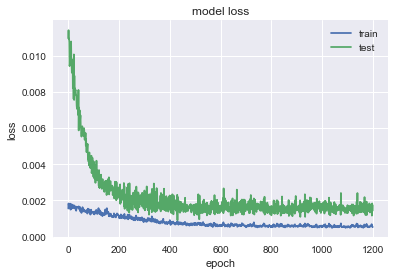

              CBRE
MSE        1.82393
MAE        1.16923
R2        0.775957
MAPE (%)   2.32815


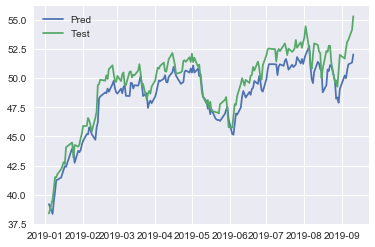

In [293]:
pred_multi = pd.DataFrame(columns=df.columns,index = test.index)
for comp in companies:
    pred_multi[comp] = nn_forec_multi(df,comp,first_layer = 64,second_layer=32).values

In [294]:
pred_multi_64_32 = eval(pred_multi,test,companies=companies)
pred_multi_64_32

,T,BBY,KO,FTI,BLK,DVA,BA,IBM,ALB,CBRE
MSE,0.474557,2.30507,1.17945,0.807085,88.3604,1.83625,191.298,13.0121,3.57694,1.82393
MAE,0.565269,1.07691,0.867112,0.704535,7.85364,1.02325,11.893,3.20602,1.43753,1.16923
R2,0.789701,0.93093,0.797018,0.57131,0.836509,0.823427,0.613382,0.691937,0.939586,0.775957
MAPE (%),1.72325,1.58946,1.68904,2.91799,1.77447,1.87595,3.16767,2.33163,1.90953,2.32815


In [295]:
pred_multi_64_32.astype(float).round(2).to_latex()

'\\begin{tabular}{lrrrrrrrrrr}\n\\toprule\n{} &     T &   BBY &    KO &   FTI &    BLK &   DVA &      BA &    IBM &   ALB &  CBRE \\\\\n\\midrule\nMSE      &  0.47 &  2.31 &  1.18 &  0.81 &  88.36 &  1.84 &  191.30 &  13.01 &  3.58 &  1.82 \\\\\nMAE      &  0.57 &  1.08 &  0.87 &  0.70 &   7.85 &  1.02 &   11.89 &   3.21 &  1.44 &  1.17 \\\\\nR2       &  0.79 &  0.93 &  0.80 &  0.57 &   0.84 &  0.82 &    0.61 &   0.69 &  0.94 &  0.78 \\\\\nMAPE (\\%) &  1.72 &  1.59 &  1.69 &  2.92 &   1.77 &  1.88 &    3.17 &   2.33 &  1.91 &  2.33 \\\\\n\\bottomrule\n\\end{tabular}\n'

In [287]:
triv_prec

,T,BBY,KO,FTI,BLK,DVA,BA,IBM,ALB,CBRE
MSE,0.137026,2.02855,0.225022,0.272115,30.3432,1.20785,49.2181,2.77441,2.63199,0.508235
MAE,0.264353,0.932941,0.342941,0.422176,4.31082,0.781471,4.79553,1.13294,1.20224,0.561235
R2,0.952411,0.939063,0.975307,0.87075,0.946298,0.909667,0.925577,0.931289,0.957899,0.942953
MAPE (%),0.81722,1.38642,0.68909,1.7702,0.982166,1.44418,1.29799,0.830379,1.62189,1.13024


Predicting for  T
Train on 1008 samples, validate on 172 samples
Epoch 1/1400
0s - loss: 0.2794 - val_loss: 0.0294
Epoch 2/1400
0s - loss: 0.1612 - val_loss: 0.0095
Epoch 3/1400
0s - loss: 0.0867 - val_loss: 0.0436
Epoch 4/1400
0s - loss: 0.0604 - val_loss: 0.0877
Epoch 5/1400
0s - loss: 0.0534 - val_loss: 0.0849
Epoch 6/1400
0s - loss: 0.0466 - val_loss: 0.0612
Epoch 7/1400
0s - loss: 0.0429 - val_loss: 0.0435
Epoch 8/1400
0s - loss: 0.0409 - val_loss: 0.0355
Epoch 9/1400
0s - loss: 0.0395 - val_loss: 0.0326
Epoch 10/1400
0s - loss: 0.0367 - val_loss: 0.0313
Epoch 11/1400
0s - loss: 0.0334 - val_loss: 0.0292
Epoch 12/1400
0s - loss: 0.0312 - val_loss: 0.0260
Epoch 13/1400
0s - loss: 0.0287 - val_loss: 0.0222
Epoch 14/1400
0s - loss: 0.0266 - val_loss: 0.0186
Epoch 15/1400
0s - loss: 0.0240 - val_loss: 0.0155
Epoch 16/1400
0s - loss: 0.0218 - val_loss: 0.0129
Epoch 17/1400
0s - loss: 0.0198 - val_loss: 0.0106
Epoch 18/1400
0s - loss: 0.0181 - val_loss: 0.0086
Epoch 19/1400
0s - loss: 0

0s - loss: 0.0019 - val_loss: 0.0043
Epoch 161/1400
0s - loss: 0.0018 - val_loss: 0.0045
Epoch 162/1400
0s - loss: 0.0018 - val_loss: 0.0043
Epoch 163/1400
0s - loss: 0.0017 - val_loss: 0.0043
Epoch 164/1400
0s - loss: 0.0019 - val_loss: 0.0044
Epoch 165/1400
0s - loss: 0.0018 - val_loss: 0.0041
Epoch 166/1400
0s - loss: 0.0020 - val_loss: 0.0047
Epoch 167/1400
0s - loss: 0.0016 - val_loss: 0.0044
Epoch 168/1400
0s - loss: 0.0017 - val_loss: 0.0041
Epoch 169/1400
0s - loss: 0.0018 - val_loss: 0.0043
Epoch 170/1400
0s - loss: 0.0017 - val_loss: 0.0041
Epoch 171/1400
0s - loss: 0.0019 - val_loss: 0.0048
Epoch 172/1400
0s - loss: 0.0017 - val_loss: 0.0040
Epoch 173/1400
0s - loss: 0.0017 - val_loss: 0.0044
Epoch 174/1400
0s - loss: 0.0017 - val_loss: 0.0042
Epoch 175/1400
0s - loss: 0.0018 - val_loss: 0.0042
Epoch 176/1400
0s - loss: 0.0017 - val_loss: 0.0039
Epoch 177/1400
0s - loss: 0.0017 - val_loss: 0.0046
Epoch 178/1400
0s - loss: 0.0017 - val_loss: 0.0042
Epoch 179/1400
0s - loss: 0

0s - loss: 0.0016 - val_loss: 0.0019
Epoch 320/1400
0s - loss: 0.0013 - val_loss: 0.0026
Epoch 321/1400
0s - loss: 0.0015 - val_loss: 0.0029
Epoch 322/1400
0s - loss: 0.0015 - val_loss: 0.0028
Epoch 323/1400
0s - loss: 0.0015 - val_loss: 0.0022
Epoch 324/1400
0s - loss: 0.0015 - val_loss: 0.0031
Epoch 325/1400
0s - loss: 0.0014 - val_loss: 0.0031
Epoch 326/1400
0s - loss: 0.0014 - val_loss: 0.0024
Epoch 327/1400
0s - loss: 0.0013 - val_loss: 0.0027
Epoch 328/1400
0s - loss: 0.0014 - val_loss: 0.0028
Epoch 329/1400
0s - loss: 0.0013 - val_loss: 0.0027
Epoch 330/1400
0s - loss: 0.0014 - val_loss: 0.0027
Epoch 331/1400
0s - loss: 0.0014 - val_loss: 0.0028
Epoch 332/1400
0s - loss: 0.0014 - val_loss: 0.0027
Epoch 333/1400
0s - loss: 0.0015 - val_loss: 0.0023
Epoch 334/1400
0s - loss: 0.0014 - val_loss: 0.0029
Epoch 335/1400
0s - loss: 0.0015 - val_loss: 0.0031
Epoch 336/1400
0s - loss: 0.0015 - val_loss: 0.0026
Epoch 337/1400
0s - loss: 0.0014 - val_loss: 0.0025
Epoch 338/1400
0s - loss: 0

0s - loss: 0.0013 - val_loss: 0.0023
Epoch 479/1400
0s - loss: 0.0013 - val_loss: 0.0021
Epoch 480/1400
0s - loss: 0.0013 - val_loss: 0.0017
Epoch 481/1400
0s - loss: 0.0014 - val_loss: 0.0018
Epoch 482/1400
0s - loss: 0.0015 - val_loss: 0.0031
Epoch 483/1400
0s - loss: 0.0016 - val_loss: 0.0013
Epoch 484/1400
0s - loss: 0.0014 - val_loss: 0.0018
Epoch 485/1400
0s - loss: 0.0013 - val_loss: 0.0029
Epoch 486/1400
0s - loss: 0.0012 - val_loss: 0.0019
Epoch 487/1400
0s - loss: 0.0012 - val_loss: 0.0025
Epoch 488/1400
0s - loss: 0.0012 - val_loss: 0.0018
Epoch 489/1400
0s - loss: 0.0012 - val_loss: 0.0021
Epoch 490/1400
0s - loss: 0.0012 - val_loss: 0.0023
Epoch 491/1400
0s - loss: 0.0013 - val_loss: 0.0020
Epoch 492/1400
0s - loss: 0.0013 - val_loss: 0.0022
Epoch 493/1400
0s - loss: 0.0012 - val_loss: 0.0021
Epoch 494/1400
0s - loss: 0.0012 - val_loss: 0.0020
Epoch 495/1400
0s - loss: 0.0012 - val_loss: 0.0024
Epoch 496/1400
0s - loss: 0.0012 - val_loss: 0.0021
Epoch 497/1400
0s - loss: 0

0s - loss: 0.0010 - val_loss: 0.0016
Epoch 637/1400
0s - loss: 0.0011 - val_loss: 0.0021
Epoch 638/1400
0s - loss: 0.0011 - val_loss: 0.0022
Epoch 639/1400
0s - loss: 0.0015 - val_loss: 0.0011
Epoch 640/1400
0s - loss: 0.0013 - val_loss: 0.0025
Epoch 641/1400
0s - loss: 0.0013 - val_loss: 0.0026
Epoch 642/1400
0s - loss: 0.0013 - val_loss: 0.0011
Epoch 643/1400
0s - loss: 0.0011 - val_loss: 0.0022
Epoch 644/1400
0s - loss: 0.0011 - val_loss: 0.0022
Epoch 645/1400
0s - loss: 0.0011 - val_loss: 0.0015
Epoch 646/1400
0s - loss: 0.0011 - val_loss: 0.0019
Epoch 647/1400
0s - loss: 0.0011 - val_loss: 0.0025
Epoch 648/1400
0s - loss: 0.0012 - val_loss: 0.0016
Epoch 649/1400
0s - loss: 0.0010 - val_loss: 0.0019
Epoch 650/1400
0s - loss: 0.0011 - val_loss: 0.0021
Epoch 651/1400
0s - loss: 0.0010 - val_loss: 0.0017
Epoch 652/1400
0s - loss: 0.0010 - val_loss: 0.0020
Epoch 653/1400
0s - loss: 0.0011 - val_loss: 0.0023
Epoch 654/1400
0s - loss: 0.0011 - val_loss: 0.0017
Epoch 655/1400
0s - loss: 0

0s - loss: 0.0010 - val_loss: 0.0022
Epoch 793/1400
0s - loss: 0.0010 - val_loss: 0.0014
Epoch 794/1400
0s - loss: 9.9923e-04 - val_loss: 0.0016
Epoch 795/1400
0s - loss: 0.0011 - val_loss: 0.0024
Epoch 796/1400
0s - loss: 0.0011 - val_loss: 0.0012
Epoch 797/1400
0s - loss: 9.9827e-04 - val_loss: 0.0017
Epoch 798/1400
0s - loss: 0.0012 - val_loss: 0.0027
Epoch 799/1400
0s - loss: 0.0011 - val_loss: 0.0012
Epoch 800/1400
0s - loss: 0.0010 - val_loss: 0.0016
Epoch 801/1400
0s - loss: 0.0011 - val_loss: 0.0025
Epoch 802/1400
0s - loss: 9.8940e-04 - val_loss: 0.0015
Epoch 803/1400
0s - loss: 0.0010 - val_loss: 0.0014
Epoch 804/1400
0s - loss: 0.0010 - val_loss: 0.0024
Epoch 805/1400
0s - loss: 9.5161e-04 - val_loss: 0.0020
Epoch 806/1400
0s - loss: 0.0012 - val_loss: 0.0013
Epoch 807/1400
0s - loss: 0.0012 - val_loss: 0.0022
Epoch 808/1400
0s - loss: 0.0011 - val_loss: 0.0022
Epoch 809/1400
0s - loss: 0.0013 - val_loss: 0.0011
Epoch 810/1400
0s - loss: 0.0011 - val_loss: 0.0023
Epoch 811/1

0s - loss: 8.8469e-04 - val_loss: 0.0022
Epoch 944/1400
0s - loss: 9.2445e-04 - val_loss: 0.0016
Epoch 945/1400
0s - loss: 9.3335e-04 - val_loss: 0.0014
Epoch 946/1400
0s - loss: 9.5216e-04 - val_loss: 0.0021
Epoch 947/1400
0s - loss: 0.0010 - val_loss: 0.0015
Epoch 948/1400
0s - loss: 9.7555e-04 - val_loss: 0.0014
Epoch 949/1400
0s - loss: 0.0012 - val_loss: 0.0024
Epoch 950/1400
0s - loss: 0.0010 - val_loss: 0.0014
Epoch 951/1400
0s - loss: 9.9918e-04 - val_loss: 0.0013
Epoch 952/1400
0s - loss: 0.0011 - val_loss: 0.0028
Epoch 953/1400
0s - loss: 9.7316e-04 - val_loss: 0.0015
Epoch 954/1400
0s - loss: 0.0011 - val_loss: 0.0013
Epoch 955/1400
0s - loss: 0.0011 - val_loss: 0.0023
Epoch 956/1400
0s - loss: 8.9102e-04 - val_loss: 0.0017
Epoch 957/1400
0s - loss: 9.8462e-04 - val_loss: 0.0014
Epoch 958/1400
0s - loss: 9.9305e-04 - val_loss: 0.0023
Epoch 959/1400
0s - loss: 9.2447e-04 - val_loss: 0.0017
Epoch 960/1400
0s - loss: 9.7707e-04 - val_loss: 0.0013
Epoch 961/1400
0s - loss: 9.101

0s - loss: 8.5536e-04 - val_loss: 0.0014
Epoch 1092/1400
0s - loss: 8.1651e-04 - val_loss: 0.0015
Epoch 1093/1400
0s - loss: 8.2063e-04 - val_loss: 0.0020
Epoch 1094/1400
0s - loss: 8.4075e-04 - val_loss: 0.0017
Epoch 1095/1400
0s - loss: 8.2500e-04 - val_loss: 0.0016
Epoch 1096/1400
0s - loss: 8.6929e-04 - val_loss: 0.0017
Epoch 1097/1400
0s - loss: 8.2633e-04 - val_loss: 0.0018
Epoch 1098/1400
0s - loss: 7.7507e-04 - val_loss: 0.0018
Epoch 1099/1400
0s - loss: 8.6829e-04 - val_loss: 0.0016
Epoch 1100/1400
0s - loss: 8.5442e-04 - val_loss: 0.0022
Epoch 1101/1400
0s - loss: 8.5657e-04 - val_loss: 0.0015
Epoch 1102/1400
0s - loss: 8.4403e-04 - val_loss: 0.0016
Epoch 1103/1400
0s - loss: 8.4577e-04 - val_loss: 0.0020
Epoch 1104/1400
0s - loss: 8.3162e-04 - val_loss: 0.0018
Epoch 1105/1400
0s - loss: 8.0286e-04 - val_loss: 0.0016
Epoch 1106/1400
0s - loss: 8.4937e-04 - val_loss: 0.0020
Epoch 1107/1400
0s - loss: 8.8273e-04 - val_loss: 0.0014
Epoch 1108/1400
0s - loss: 9.1273e-04 - val_los

0s - loss: 8.9148e-04 - val_loss: 0.0020
Epoch 1238/1400
0s - loss: 9.7108e-04 - val_loss: 0.0013
Epoch 1239/1400
0s - loss: 8.9459e-04 - val_loss: 0.0024
Epoch 1240/1400
0s - loss: 8.2525e-04 - val_loss: 0.0017
Epoch 1241/1400
0s - loss: 7.7827e-04 - val_loss: 0.0018
Epoch 1242/1400
0s - loss: 8.3618e-04 - val_loss: 0.0021
Epoch 1243/1400
0s - loss: 7.8382e-04 - val_loss: 0.0016
Epoch 1244/1400
0s - loss: 8.1585e-04 - val_loss: 0.0017
Epoch 1245/1400
0s - loss: 8.8190e-04 - val_loss: 0.0022
Epoch 1246/1400
0s - loss: 8.2278e-04 - val_loss: 0.0017
Epoch 1247/1400
0s - loss: 8.7551e-04 - val_loss: 0.0015
Epoch 1248/1400
0s - loss: 8.8749e-04 - val_loss: 0.0025
Epoch 1249/1400
0s - loss: 8.4582e-04 - val_loss: 0.0016
Epoch 1250/1400
0s - loss: 8.6399e-04 - val_loss: 0.0016
Epoch 1251/1400
0s - loss: 8.7308e-04 - val_loss: 0.0024
Epoch 1252/1400
0s - loss: 8.3495e-04 - val_loss: 0.0016
Epoch 1253/1400
0s - loss: 8.5290e-04 - val_loss: 0.0016
Epoch 1254/1400
0s - loss: 8.8457e-04 - val_los

0s - loss: 7.8655e-04 - val_loss: 0.0018
Epoch 1383/1400
0s - loss: 8.1248e-04 - val_loss: 0.0017
Epoch 1384/1400
0s - loss: 7.7732e-04 - val_loss: 0.0015
Epoch 1385/1400
0s - loss: 8.1222e-04 - val_loss: 0.0018
Epoch 1386/1400
0s - loss: 8.2063e-04 - val_loss: 0.0021
Epoch 1387/1400
0s - loss: 7.6973e-04 - val_loss: 0.0014
Epoch 1388/1400
0s - loss: 8.1548e-04 - val_loss: 0.0019
Epoch 1389/1400
0s - loss: 7.7981e-04 - val_loss: 0.0019
Epoch 1390/1400
0s - loss: 7.7417e-04 - val_loss: 0.0014
Epoch 1391/1400
0s - loss: 7.9937e-04 - val_loss: 0.0019
Epoch 1392/1400
0s - loss: 8.1288e-04 - val_loss: 0.0020
Epoch 1393/1400
0s - loss: 8.6046e-04 - val_loss: 0.0013
Epoch 1394/1400
0s - loss: 9.1292e-04 - val_loss: 0.0019
Epoch 1395/1400
0s - loss: 9.4420e-04 - val_loss: 0.0024
Epoch 1396/1400
0s - loss: 0.0011 - val_loss: 0.0010
Epoch 1397/1400
0s - loss: 8.8514e-04 - val_loss: 0.0022
Epoch 1398/1400
0s - loss: 9.1950e-04 - val_loss: 0.0023
Epoch 1399/1400
0s - loss: 8.4597e-04 - val_loss: 0

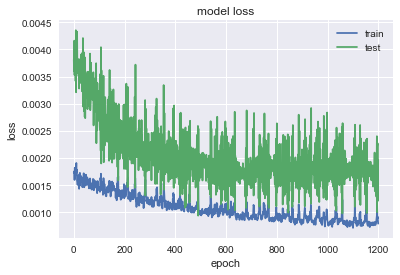

                 T
MSE       0.500237
MAE       0.587291
R2        0.777695
MAPE (%)   1.79147


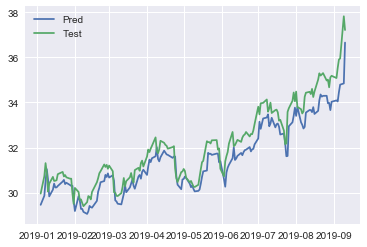

Predicting for  BBY
Train on 1008 samples, validate on 172 samples
Epoch 1/1400
0s - loss: 0.1913 - val_loss: 0.3991
Epoch 2/1400
0s - loss: 0.1271 - val_loss: 0.2925
Epoch 3/1400
0s - loss: 0.0792 - val_loss: 0.1897
Epoch 4/1400
0s - loss: 0.0504 - val_loss: 0.1081
Epoch 5/1400
0s - loss: 0.0445 - val_loss: 0.0620
Epoch 6/1400
0s - loss: 0.0495 - val_loss: 0.0466
Epoch 7/1400
0s - loss: 0.0486 - val_loss: 0.0468
Epoch 8/1400
0s - loss: 0.0421 - val_loss: 0.0495
Epoch 9/1400
0s - loss: 0.0363 - val_loss: 0.0469
Epoch 10/1400
0s - loss: 0.0301 - val_loss: 0.0388
Epoch 11/1400
0s - loss: 0.0253 - val_loss: 0.0290
Epoch 12/1400
0s - loss: 0.0214 - val_loss: 0.0208
Epoch 13/1400
0s - loss: 0.0184 - val_loss: 0.0154
Epoch 14/1400
0s - loss: 0.0153 - val_loss: 0.0118
Epoch 15/1400
0s - loss: 0.0122 - val_loss: 0.0088
Epoch 16/1400
0s - loss: 0.0097 - val_loss: 0.0063
Epoch 17/1400
0s - loss: 0.0082 - val_loss: 0.0044
Epoch 18/1400
0s - loss: 0.0064 - val_loss: 0.0033
Epoch 19/1400
0s - loss:

0s - loss: 0.0014 - val_loss: 0.0024
Epoch 161/1400
0s - loss: 0.0014 - val_loss: 0.0023
Epoch 162/1400
0s - loss: 0.0015 - val_loss: 0.0023
Epoch 163/1400
0s - loss: 0.0015 - val_loss: 0.0024
Epoch 164/1400
0s - loss: 0.0013 - val_loss: 0.0021
Epoch 165/1400
0s - loss: 0.0014 - val_loss: 0.0021
Epoch 166/1400
0s - loss: 0.0013 - val_loss: 0.0020
Epoch 167/1400
0s - loss: 0.0014 - val_loss: 0.0022
Epoch 168/1400
0s - loss: 0.0014 - val_loss: 0.0021
Epoch 169/1400
0s - loss: 0.0014 - val_loss: 0.0023
Epoch 170/1400
0s - loss: 0.0013 - val_loss: 0.0023
Epoch 171/1400
0s - loss: 0.0015 - val_loss: 0.0024
Epoch 172/1400
0s - loss: 0.0015 - val_loss: 0.0021
Epoch 173/1400
0s - loss: 0.0014 - val_loss: 0.0023
Epoch 174/1400
0s - loss: 0.0014 - val_loss: 0.0019
Epoch 175/1400
0s - loss: 0.0013 - val_loss: 0.0023
Epoch 176/1400
0s - loss: 0.0014 - val_loss: 0.0019
Epoch 177/1400
0s - loss: 0.0014 - val_loss: 0.0021
Epoch 178/1400
0s - loss: 0.0013 - val_loss: 0.0020
Epoch 179/1400
0s - loss: 0

0s - loss: 0.0012 - val_loss: 9.5219e-04
Epoch 319/1400
0s - loss: 0.0012 - val_loss: 0.0012
Epoch 320/1400
0s - loss: 0.0010 - val_loss: 0.0011
Epoch 321/1400
0s - loss: 0.0012 - val_loss: 0.0013
Epoch 322/1400
0s - loss: 0.0010 - val_loss: 0.0011
Epoch 323/1400
0s - loss: 0.0011 - val_loss: 0.0012
Epoch 324/1400
0s - loss: 0.0010 - val_loss: 0.0011
Epoch 325/1400
0s - loss: 9.7975e-04 - val_loss: 0.0013
Epoch 326/1400
0s - loss: 0.0010 - val_loss: 0.0011
Epoch 327/1400
0s - loss: 0.0011 - val_loss: 0.0015
Epoch 328/1400
0s - loss: 0.0010 - val_loss: 0.0011
Epoch 329/1400
0s - loss: 9.6721e-04 - val_loss: 0.0013
Epoch 330/1400
0s - loss: 0.0012 - val_loss: 0.0012
Epoch 331/1400
0s - loss: 9.6947e-04 - val_loss: 0.0011
Epoch 332/1400
0s - loss: 0.0011 - val_loss: 0.0012
Epoch 333/1400
0s - loss: 0.0010 - val_loss: 9.7518e-04
Epoch 334/1400
0s - loss: 9.7268e-04 - val_loss: 0.0013
Epoch 335/1400
0s - loss: 0.0011 - val_loss: 0.0012
Epoch 336/1400
0s - loss: 0.0011 - val_loss: 0.0014
Epo

0s - loss: 9.5253e-04 - val_loss: 0.0011
Epoch 471/1400
0s - loss: 8.3316e-04 - val_loss: 9.8522e-04
Epoch 472/1400
0s - loss: 8.9374e-04 - val_loss: 9.8999e-04
Epoch 473/1400
0s - loss: 0.0010 - val_loss: 0.0010
Epoch 474/1400
0s - loss: 9.2447e-04 - val_loss: 0.0011
Epoch 475/1400
0s - loss: 9.2484e-04 - val_loss: 9.3695e-04
Epoch 476/1400
0s - loss: 8.6074e-04 - val_loss: 0.0010
Epoch 477/1400
0s - loss: 0.0010 - val_loss: 9.5025e-04
Epoch 478/1400
0s - loss: 8.4126e-04 - val_loss: 9.4226e-04
Epoch 479/1400
0s - loss: 0.0010 - val_loss: 0.0011
Epoch 480/1400
0s - loss: 8.8620e-04 - val_loss: 0.0010
Epoch 481/1400
0s - loss: 0.0010 - val_loss: 0.0011
Epoch 482/1400
0s - loss: 9.5600e-04 - val_loss: 9.5638e-04
Epoch 483/1400
0s - loss: 9.4514e-04 - val_loss: 9.7428e-04
Epoch 484/1400
0s - loss: 8.9401e-04 - val_loss: 9.6024e-04
Epoch 485/1400
0s - loss: 9.7724e-04 - val_loss: 0.0011
Epoch 486/1400
0s - loss: 9.7152e-04 - val_loss: 8.4911e-04
Epoch 487/1400
0s - loss: 0.0011 - val_loss

0s - loss: 8.3577e-04 - val_loss: 0.0011
Epoch 615/1400
0s - loss: 7.6483e-04 - val_loss: 0.0011
Epoch 616/1400
0s - loss: 7.9713e-04 - val_loss: 8.1996e-04
Epoch 617/1400
0s - loss: 9.0875e-04 - val_loss: 0.0014
Epoch 618/1400
0s - loss: 8.5908e-04 - val_loss: 7.5262e-04
Epoch 619/1400
0s - loss: 8.9767e-04 - val_loss: 9.2645e-04
Epoch 620/1400
0s - loss: 8.3574e-04 - val_loss: 0.0014
Epoch 621/1400
0s - loss: 8.9985e-04 - val_loss: 7.2776e-04
Epoch 622/1400
0s - loss: 0.0011 - val_loss: 0.0012
Epoch 623/1400
0s - loss: 9.8087e-04 - val_loss: 0.0015
Epoch 624/1400
0s - loss: 0.0011 - val_loss: 6.7012e-04
Epoch 625/1400
0s - loss: 0.0010 - val_loss: 0.0014
Epoch 626/1400
0s - loss: 8.1016e-04 - val_loss: 9.4319e-04
Epoch 627/1400
0s - loss: 8.6463e-04 - val_loss: 8.4356e-04
Epoch 628/1400
0s - loss: 6.7511e-04 - val_loss: 0.0010
Epoch 629/1400
0s - loss: 7.6878e-04 - val_loss: 0.0010
Epoch 630/1400
0s - loss: 8.0567e-04 - val_loss: 0.0010
Epoch 631/1400
0s - loss: 8.1783e-04 - val_loss

0s - loss: 7.3573e-04 - val_loss: 9.0527e-04
Epoch 757/1400
0s - loss: 8.3527e-04 - val_loss: 0.0014
Epoch 758/1400
0s - loss: 8.7521e-04 - val_loss: 8.0492e-04
Epoch 759/1400
0s - loss: 7.8816e-04 - val_loss: 0.0011
Epoch 760/1400
0s - loss: 7.4624e-04 - val_loss: 0.0011
Epoch 761/1400
0s - loss: 7.1399e-04 - val_loss: 0.0010
Epoch 762/1400
0s - loss: 7.0825e-04 - val_loss: 0.0010
Epoch 763/1400
0s - loss: 7.2477e-04 - val_loss: 0.0010
Epoch 764/1400
0s - loss: 7.1631e-04 - val_loss: 8.8291e-04
Epoch 765/1400
0s - loss: 7.5606e-04 - val_loss: 9.7135e-04
Epoch 766/1400
0s - loss: 7.0707e-04 - val_loss: 0.0012
Epoch 767/1400
0s - loss: 7.4203e-04 - val_loss: 9.2832e-04
Epoch 768/1400
0s - loss: 6.9899e-04 - val_loss: 9.2345e-04
Epoch 769/1400
0s - loss: 7.3929e-04 - val_loss: 0.0011
Epoch 770/1400
0s - loss: 7.9240e-04 - val_loss: 8.5254e-04
Epoch 771/1400
0s - loss: 7.7639e-04 - val_loss: 8.0780e-04
Epoch 772/1400
0s - loss: 8.4652e-04 - val_loss: 0.0015
Epoch 773/1400
0s - loss: 0.001

0s - loss: 9.3409e-04 - val_loss: 7.3103e-04
Epoch 900/1400
0s - loss: 0.0011 - val_loss: 0.0016
Epoch 901/1400
0s - loss: 0.0011 - val_loss: 6.9941e-04
Epoch 902/1400
0s - loss: 0.0010 - val_loss: 0.0014
Epoch 903/1400
0s - loss: 0.0012 - val_loss: 7.2730e-04
Epoch 904/1400
0s - loss: 0.0013 - val_loss: 0.0013
Epoch 905/1400
0s - loss: 0.0013 - val_loss: 0.0010
Epoch 906/1400
0s - loss: 0.0012 - val_loss: 0.0011
Epoch 907/1400
0s - loss: 0.0013 - val_loss: 0.0013
Epoch 908/1400
0s - loss: 0.0013 - val_loss: 7.4578e-04
Epoch 909/1400
0s - loss: 9.6208e-04 - val_loss: 0.0013
Epoch 910/1400
0s - loss: 8.8362e-04 - val_loss: 7.3685e-04
Epoch 911/1400
0s - loss: 7.8715e-04 - val_loss: 0.0012
Epoch 912/1400
0s - loss: 8.0611e-04 - val_loss: 8.2120e-04
Epoch 913/1400
0s - loss: 9.5523e-04 - val_loss: 0.0011
Epoch 914/1400
0s - loss: 9.0509e-04 - val_loss: 7.8681e-04
Epoch 915/1400
0s - loss: 7.9799e-04 - val_loss: 0.0010
Epoch 916/1400
0s - loss: 7.4699e-04 - val_loss: 7.8204e-04
Epoch 917/1

0s - loss: 9.1499e-04 - val_loss: 7.3037e-04
Epoch 1044/1400
0s - loss: 8.0519e-04 - val_loss: 0.0011
Epoch 1045/1400
0s - loss: 7.5297e-04 - val_loss: 7.4046e-04
Epoch 1046/1400
0s - loss: 7.7324e-04 - val_loss: 0.0011
Epoch 1047/1400
0s - loss: 7.4893e-04 - val_loss: 8.4812e-04
Epoch 1048/1400
0s - loss: 7.8481e-04 - val_loss: 0.0011
Epoch 1049/1400
0s - loss: 8.0665e-04 - val_loss: 8.0535e-04
Epoch 1050/1400
0s - loss: 7.1599e-04 - val_loss: 0.0011
Epoch 1051/1400
0s - loss: 7.1931e-04 - val_loss: 7.8544e-04
Epoch 1052/1400
0s - loss: 6.1862e-04 - val_loss: 0.0010
Epoch 1053/1400
0s - loss: 6.7449e-04 - val_loss: 9.4040e-04
Epoch 1054/1400
0s - loss: 6.4356e-04 - val_loss: 9.3138e-04
Epoch 1055/1400
0s - loss: 6.7697e-04 - val_loss: 0.0010
Epoch 1056/1400
0s - loss: 7.5707e-04 - val_loss: 9.0934e-04
Epoch 1057/1400
0s - loss: 8.3389e-04 - val_loss: 0.0010
Epoch 1058/1400
0s - loss: 8.3979e-04 - val_loss: 9.2611e-04
Epoch 1059/1400
0s - loss: 8.2244e-04 - val_loss: 9.3749e-04
Epoch 1

0s - loss: 6.4771e-04 - val_loss: 9.9685e-04
Epoch 1182/1400
0s - loss: 5.9655e-04 - val_loss: 8.4100e-04
Epoch 1183/1400
0s - loss: 6.1699e-04 - val_loss: 0.0010
Epoch 1184/1400
0s - loss: 6.7063e-04 - val_loss: 7.9398e-04
Epoch 1185/1400
0s - loss: 6.9433e-04 - val_loss: 0.0010
Epoch 1186/1400
0s - loss: 6.6462e-04 - val_loss: 8.7457e-04
Epoch 1187/1400
0s - loss: 6.7951e-04 - val_loss: 0.0010
Epoch 1188/1400
0s - loss: 5.8656e-04 - val_loss: 9.7537e-04
Epoch 1189/1400
0s - loss: 6.6144e-04 - val_loss: 9.8246e-04
Epoch 1190/1400
0s - loss: 6.6653e-04 - val_loss: 8.2014e-04
Epoch 1191/1400
0s - loss: 7.2043e-04 - val_loss: 0.0010
Epoch 1192/1400
0s - loss: 7.3754e-04 - val_loss: 8.5147e-04
Epoch 1193/1400
0s - loss: 7.0475e-04 - val_loss: 0.0010
Epoch 1194/1400
0s - loss: 6.8629e-04 - val_loss: 7.7709e-04
Epoch 1195/1400
0s - loss: 7.3949e-04 - val_loss: 0.0010
Epoch 1196/1400
0s - loss: 7.1988e-04 - val_loss: 7.7507e-04
Epoch 1197/1400
0s - loss: 7.2023e-04 - val_loss: 0.0011
Epoch 1

0s - loss: 6.0623e-04 - val_loss: 8.1029e-04
Epoch 1320/1400
0s - loss: 6.2109e-04 - val_loss: 8.6582e-04
Epoch 1321/1400
0s - loss: 6.1929e-04 - val_loss: 8.5851e-04
Epoch 1322/1400
0s - loss: 5.6950e-04 - val_loss: 8.4525e-04
Epoch 1323/1400
0s - loss: 6.3326e-04 - val_loss: 0.0011
Epoch 1324/1400
0s - loss: 6.1804e-04 - val_loss: 8.5608e-04
Epoch 1325/1400
0s - loss: 5.9581e-04 - val_loss: 8.6101e-04
Epoch 1326/1400
0s - loss: 6.1109e-04 - val_loss: 0.0011
Epoch 1327/1400
0s - loss: 7.2165e-04 - val_loss: 7.4390e-04
Epoch 1328/1400
0s - loss: 7.9436e-04 - val_loss: 0.0011
Epoch 1329/1400
0s - loss: 7.0467e-04 - val_loss: 8.4942e-04
Epoch 1330/1400
0s - loss: 6.9613e-04 - val_loss: 7.3441e-04
Epoch 1331/1400
0s - loss: 9.3753e-04 - val_loss: 0.0013
Epoch 1332/1400
0s - loss: 9.2990e-04 - val_loss: 6.2364e-04
Epoch 1333/1400
0s - loss: 8.6949e-04 - val_loss: 0.0012
Epoch 1334/1400
0s - loss: 6.5539e-04 - val_loss: 6.6598e-04
Epoch 1335/1400
0s - loss: 8.1820e-04 - val_loss: 0.0010
Epo

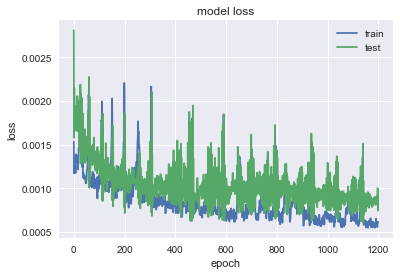

               BBY
MSE        3.26741
MAE        1.38843
R2        0.899319
MAPE (%)   2.03273


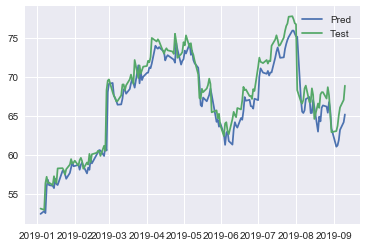

Predicting for  KO
Train on 1008 samples, validate on 172 samples
Epoch 1/1400
0s - loss: 0.0765 - val_loss: 0.3001
Epoch 2/1400
0s - loss: 0.0277 - val_loss: 0.1896
Epoch 3/1400
0s - loss: 0.0146 - val_loss: 0.1237
Epoch 4/1400
0s - loss: 0.0200 - val_loss: 0.1130
Epoch 5/1400
0s - loss: 0.0193 - val_loss: 0.1257
Epoch 6/1400
0s - loss: 0.0166 - val_loss: 0.1352
Epoch 7/1400
0s - loss: 0.0147 - val_loss: 0.1332
Epoch 8/1400
0s - loss: 0.0136 - val_loss: 0.1237
Epoch 9/1400
0s - loss: 0.0131 - val_loss: 0.1133
Epoch 10/1400
0s - loss: 0.0126 - val_loss: 0.1060
Epoch 11/1400
0s - loss: 0.0125 - val_loss: 0.1029
Epoch 12/1400
0s - loss: 0.0119 - val_loss: 0.1008
Epoch 13/1400
0s - loss: 0.0113 - val_loss: 0.0971
Epoch 14/1400
0s - loss: 0.0108 - val_loss: 0.0929
Epoch 15/1400
0s - loss: 0.0104 - val_loss: 0.0888
Epoch 16/1400
0s - loss: 0.0101 - val_loss: 0.0851
Epoch 17/1400
0s - loss: 0.0098 - val_loss: 0.0819
Epoch 18/1400
0s - loss: 0.0094 - val_loss: 0.0786
Epoch 19/1400
0s - loss: 

0s - loss: 8.8268e-04 - val_loss: 0.0025
Epoch 161/1400
0s - loss: 8.6973e-04 - val_loss: 0.0023
Epoch 162/1400
0s - loss: 8.3552e-04 - val_loss: 0.0027
Epoch 163/1400
0s - loss: 8.7847e-04 - val_loss: 0.0021
Epoch 164/1400
0s - loss: 9.7806e-04 - val_loss: 0.0021
Epoch 165/1400
0s - loss: 8.8240e-04 - val_loss: 0.0017
Epoch 166/1400
0s - loss: 8.7089e-04 - val_loss: 0.0023
Epoch 167/1400
0s - loss: 8.8245e-04 - val_loss: 0.0018
Epoch 168/1400
0s - loss: 8.8934e-04 - val_loss: 0.0022
Epoch 169/1400
0s - loss: 8.3499e-04 - val_loss: 0.0020
Epoch 170/1400
0s - loss: 8.5061e-04 - val_loss: 0.0020
Epoch 171/1400
0s - loss: 8.8547e-04 - val_loss: 0.0018
Epoch 172/1400
0s - loss: 8.3677e-04 - val_loss: 0.0019
Epoch 173/1400
0s - loss: 8.7059e-04 - val_loss: 0.0016
Epoch 174/1400
0s - loss: 8.3939e-04 - val_loss: 0.0019
Epoch 175/1400
0s - loss: 8.2095e-04 - val_loss: 0.0016
Epoch 176/1400
0s - loss: 8.2892e-04 - val_loss: 0.0020
Epoch 177/1400
0s - loss: 8.6799e-04 - val_loss: 0.0015
Epoch 1

0s - loss: 7.9166e-04 - val_loss: 0.0012
Epoch 307/1400
0s - loss: 7.2389e-04 - val_loss: 0.0013
Epoch 308/1400
0s - loss: 7.0734e-04 - val_loss: 0.0015
Epoch 309/1400
0s - loss: 7.2837e-04 - val_loss: 0.0014
Epoch 310/1400
0s - loss: 7.6423e-04 - val_loss: 0.0013
Epoch 311/1400
0s - loss: 7.1216e-04 - val_loss: 0.0014
Epoch 312/1400
0s - loss: 7.3590e-04 - val_loss: 0.0013
Epoch 313/1400
0s - loss: 6.8975e-04 - val_loss: 0.0015
Epoch 314/1400
0s - loss: 7.2994e-04 - val_loss: 0.0012
Epoch 315/1400
0s - loss: 7.2097e-04 - val_loss: 0.0013
Epoch 316/1400
0s - loss: 7.1985e-04 - val_loss: 0.0015
Epoch 317/1400
0s - loss: 7.6704e-04 - val_loss: 0.0014
Epoch 318/1400
0s - loss: 7.6979e-04 - val_loss: 0.0013
Epoch 319/1400
0s - loss: 7.6105e-04 - val_loss: 0.0014
Epoch 320/1400
0s - loss: 8.5442e-04 - val_loss: 0.0020
Epoch 321/1400
0s - loss: 8.5469e-04 - val_loss: 0.0012
Epoch 322/1400
0s - loss: 7.3808e-04 - val_loss: 0.0014
Epoch 323/1400
0s - loss: 7.4755e-04 - val_loss: 0.0017
Epoch 3

0s - loss: 6.9806e-04 - val_loss: 0.0026
Epoch 454/1400
0s - loss: 6.8864e-04 - val_loss: 0.0020
Epoch 455/1400
0s - loss: 6.7364e-04 - val_loss: 0.0018
Epoch 456/1400
0s - loss: 7.4483e-04 - val_loss: 0.0022
Epoch 457/1400
0s - loss: 7.0876e-04 - val_loss: 0.0019
Epoch 458/1400
0s - loss: 7.1525e-04 - val_loss: 0.0016
Epoch 459/1400
0s - loss: 7.9723e-04 - val_loss: 0.0024
Epoch 460/1400
0s - loss: 6.7858e-04 - val_loss: 0.0019
Epoch 461/1400
0s - loss: 7.2615e-04 - val_loss: 0.0017
Epoch 462/1400
0s - loss: 6.6342e-04 - val_loss: 0.0019
Epoch 463/1400
0s - loss: 6.4067e-04 - val_loss: 0.0020
Epoch 464/1400
0s - loss: 6.9272e-04 - val_loss: 0.0019
Epoch 465/1400
0s - loss: 6.8148e-04 - val_loss: 0.0015
Epoch 466/1400
0s - loss: 7.6002e-04 - val_loss: 0.0020
Epoch 467/1400
0s - loss: 6.8088e-04 - val_loss: 0.0022
Epoch 468/1400
0s - loss: 8.0369e-04 - val_loss: 0.0016
Epoch 469/1400
0s - loss: 7.3638e-04 - val_loss: 0.0023
Epoch 470/1400
0s - loss: 7.6412e-04 - val_loss: 0.0027
Epoch 4

0s - loss: 5.9076e-04 - val_loss: 0.0021
Epoch 602/1400
0s - loss: 5.9780e-04 - val_loss: 0.0021
Epoch 603/1400
0s - loss: 6.2395e-04 - val_loss: 0.0025
Epoch 604/1400
0s - loss: 6.5695e-04 - val_loss: 0.0024
Epoch 605/1400
0s - loss: 6.1928e-04 - val_loss: 0.0024
Epoch 606/1400
0s - loss: 6.6228e-04 - val_loss: 0.0027
Epoch 607/1400
0s - loss: 7.0874e-04 - val_loss: 0.0023
Epoch 608/1400
0s - loss: 6.7142e-04 - val_loss: 0.0022
Epoch 609/1400
0s - loss: 7.8498e-04 - val_loss: 0.0030
Epoch 610/1400
0s - loss: 6.4282e-04 - val_loss: 0.0022
Epoch 611/1400
0s - loss: 6.8344e-04 - val_loss: 0.0020
Epoch 612/1400
0s - loss: 5.9412e-04 - val_loss: 0.0026
Epoch 613/1400
0s - loss: 5.7793e-04 - val_loss: 0.0021
Epoch 614/1400
0s - loss: 6.0195e-04 - val_loss: 0.0021
Epoch 615/1400
0s - loss: 5.7443e-04 - val_loss: 0.0024
Epoch 616/1400
0s - loss: 5.7911e-04 - val_loss: 0.0022
Epoch 617/1400
0s - loss: 5.9798e-04 - val_loss: 0.0023
Epoch 618/1400
0s - loss: 5.9179e-04 - val_loss: 0.0023
Epoch 6

0s - loss: 5.6713e-04 - val_loss: 0.0025
Epoch 750/1400
0s - loss: 6.3725e-04 - val_loss: 0.0028
Epoch 751/1400
0s - loss: 6.0316e-04 - val_loss: 0.0024
Epoch 752/1400
0s - loss: 5.7806e-04 - val_loss: 0.0027
Epoch 753/1400
0s - loss: 6.2490e-04 - val_loss: 0.0029
Epoch 754/1400
0s - loss: 5.8547e-04 - val_loss: 0.0028
Epoch 755/1400
0s - loss: 5.8882e-04 - val_loss: 0.0027
Epoch 756/1400
0s - loss: 6.2751e-04 - val_loss: 0.0030
Epoch 757/1400
0s - loss: 5.7735e-04 - val_loss: 0.0027
Epoch 758/1400
0s - loss: 5.8990e-04 - val_loss: 0.0025
Epoch 759/1400
0s - loss: 5.9190e-04 - val_loss: 0.0025
Epoch 760/1400
0s - loss: 5.6873e-04 - val_loss: 0.0028
Epoch 761/1400
0s - loss: 6.2745e-04 - val_loss: 0.0026
Epoch 762/1400
0s - loss: 6.0620e-04 - val_loss: 0.0026
Epoch 763/1400
0s - loss: 6.3776e-04 - val_loss: 0.0028
Epoch 764/1400
0s - loss: 5.9464e-04 - val_loss: 0.0027
Epoch 765/1400
0s - loss: 6.1135e-04 - val_loss: 0.0025
Epoch 766/1400
0s - loss: 6.8290e-04 - val_loss: 0.0028
Epoch 7

0s - loss: 6.4452e-04 - val_loss: 0.0029
Epoch 898/1400
0s - loss: 6.4748e-04 - val_loss: 0.0030
Epoch 899/1400
0s - loss: 7.7891e-04 - val_loss: 0.0035
Epoch 900/1400
0s - loss: 6.9063e-04 - val_loss: 0.0024
Epoch 901/1400
0s - loss: 5.5975e-04 - val_loss: 0.0035
Epoch 902/1400
0s - loss: 5.5208e-04 - val_loss: 0.0029
Epoch 903/1400
0s - loss: 5.3680e-04 - val_loss: 0.0026
Epoch 904/1400
0s - loss: 5.5829e-04 - val_loss: 0.0027
Epoch 905/1400
0s - loss: 5.4390e-04 - val_loss: 0.0027
Epoch 906/1400
0s - loss: 5.5844e-04 - val_loss: 0.0027
Epoch 907/1400
0s - loss: 5.5018e-04 - val_loss: 0.0024
Epoch 908/1400
0s - loss: 5.1681e-04 - val_loss: 0.0029
Epoch 909/1400
0s - loss: 5.3338e-04 - val_loss: 0.0028
Epoch 910/1400
0s - loss: 5.6087e-04 - val_loss: 0.0028
Epoch 911/1400
0s - loss: 5.4455e-04 - val_loss: 0.0029
Epoch 912/1400
0s - loss: 5.1306e-04 - val_loss: 0.0027
Epoch 913/1400
0s - loss: 5.4132e-04 - val_loss: 0.0027
Epoch 914/1400
0s - loss: 5.3886e-04 - val_loss: 0.0027
Epoch 9

0s - loss: 5.5967e-04 - val_loss: 0.0037
Epoch 1044/1400
0s - loss: 5.3860e-04 - val_loss: 0.0032
Epoch 1045/1400
0s - loss: 5.6473e-04 - val_loss: 0.0030
Epoch 1046/1400
0s - loss: 5.7588e-04 - val_loss: 0.0036
Epoch 1047/1400
0s - loss: 5.2807e-04 - val_loss: 0.0029
Epoch 1048/1400
0s - loss: 5.1047e-04 - val_loss: 0.0030
Epoch 1049/1400
0s - loss: 5.1938e-04 - val_loss: 0.0032
Epoch 1050/1400
0s - loss: 5.3011e-04 - val_loss: 0.0028
Epoch 1051/1400
0s - loss: 5.8113e-04 - val_loss: 0.0033
Epoch 1052/1400
0s - loss: 5.8274e-04 - val_loss: 0.0031
Epoch 1053/1400
0s - loss: 5.7990e-04 - val_loss: 0.0028
Epoch 1054/1400
0s - loss: 6.0376e-04 - val_loss: 0.0034
Epoch 1055/1400
0s - loss: 5.6621e-04 - val_loss: 0.0031
Epoch 1056/1400
0s - loss: 5.8433e-04 - val_loss: 0.0028
Epoch 1057/1400
0s - loss: 6.1102e-04 - val_loss: 0.0033
Epoch 1058/1400
0s - loss: 5.6422e-04 - val_loss: 0.0031
Epoch 1059/1400
0s - loss: 6.3810e-04 - val_loss: 0.0028
Epoch 1060/1400
0s - loss: 6.8165e-04 - val_los

0s - loss: 5.2234e-04 - val_loss: 0.0035
Epoch 1188/1400
0s - loss: 5.1141e-04 - val_loss: 0.0035
Epoch 1189/1400
0s - loss: 4.9795e-04 - val_loss: 0.0034
Epoch 1190/1400
0s - loss: 5.1679e-04 - val_loss: 0.0033
Epoch 1191/1400
0s - loss: 5.1807e-04 - val_loss: 0.0034
Epoch 1192/1400
0s - loss: 5.0342e-04 - val_loss: 0.0034
Epoch 1193/1400
0s - loss: 5.1767e-04 - val_loss: 0.0033
Epoch 1194/1400
0s - loss: 5.1879e-04 - val_loss: 0.0036
Epoch 1195/1400
0s - loss: 5.1736e-04 - val_loss: 0.0033
Epoch 1196/1400
0s - loss: 5.2061e-04 - val_loss: 0.0035
Epoch 1197/1400
0s - loss: 5.0359e-04 - val_loss: 0.0033
Epoch 1198/1400
0s - loss: 5.4079e-04 - val_loss: 0.0033
Epoch 1199/1400
0s - loss: 5.1773e-04 - val_loss: 0.0033
Epoch 1200/1400
0s - loss: 5.0379e-04 - val_loss: 0.0032
Epoch 1201/1400
0s - loss: 5.4093e-04 - val_loss: 0.0033
Epoch 1202/1400
0s - loss: 5.0010e-04 - val_loss: 0.0032
Epoch 1203/1400
0s - loss: 5.3601e-04 - val_loss: 0.0030
Epoch 1204/1400
0s - loss: 5.3072e-04 - val_los

0s - loss: 5.2183e-04 - val_loss: 0.0036
Epoch 1332/1400
0s - loss: 5.1740e-04 - val_loss: 0.0035
Epoch 1333/1400
0s - loss: 5.4196e-04 - val_loss: 0.0033
Epoch 1334/1400
0s - loss: 5.2352e-04 - val_loss: 0.0033
Epoch 1335/1400
0s - loss: 5.5941e-04 - val_loss: 0.0035
Epoch 1336/1400
0s - loss: 5.4418e-04 - val_loss: 0.0035
Epoch 1337/1400
0s - loss: 5.3563e-04 - val_loss: 0.0035
Epoch 1338/1400
0s - loss: 5.8509e-04 - val_loss: 0.0033
Epoch 1339/1400
0s - loss: 5.6937e-04 - val_loss: 0.0034
Epoch 1340/1400
0s - loss: 6.0290e-04 - val_loss: 0.0035
Epoch 1341/1400
0s - loss: 7.0972e-04 - val_loss: 0.0037
Epoch 1342/1400
0s - loss: 5.8287e-04 - val_loss: 0.0028
Epoch 1343/1400
0s - loss: 5.1034e-04 - val_loss: 0.0038
Epoch 1344/1400
0s - loss: 5.0507e-04 - val_loss: 0.0035
Epoch 1345/1400
0s - loss: 5.1292e-04 - val_loss: 0.0035
Epoch 1346/1400
0s - loss: 5.2589e-04 - val_loss: 0.0033
Epoch 1347/1400
0s - loss: 5.2238e-04 - val_loss: 0.0036
Epoch 1348/1400
0s - loss: 5.3738e-04 - val_los

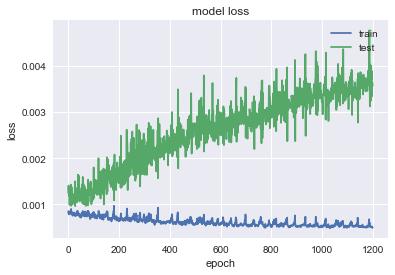

                KO
MSE        1.12323
MAE       0.856755
R2        0.816145
MAPE (%)    1.6725


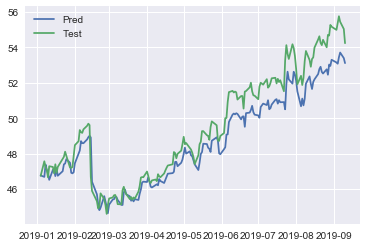

Predicting for  FTI
Train on 1008 samples, validate on 172 samples
Epoch 1/1400
0s - loss: 0.1763 - val_loss: 0.0051
Epoch 2/1400
0s - loss: 0.0976 - val_loss: 0.0074
Epoch 3/1400
0s - loss: 0.0531 - val_loss: 0.0449
Epoch 4/1400
0s - loss: 0.0393 - val_loss: 0.0785
Epoch 5/1400
0s - loss: 0.0338 - val_loss: 0.0717
Epoch 6/1400
0s - loss: 0.0286 - val_loss: 0.0508
Epoch 7/1400
0s - loss: 0.0258 - val_loss: 0.0372
Epoch 8/1400
0s - loss: 0.0256 - val_loss: 0.0321
Epoch 9/1400
0s - loss: 0.0256 - val_loss: 0.0315
Epoch 10/1400
0s - loss: 0.0240 - val_loss: 0.0317
Epoch 11/1400
0s - loss: 0.0223 - val_loss: 0.0306
Epoch 12/1400
0s - loss: 0.0206 - val_loss: 0.0278
Epoch 13/1400
0s - loss: 0.0195 - val_loss: 0.0245
Epoch 14/1400
0s - loss: 0.0179 - val_loss: 0.0215
Epoch 15/1400
0s - loss: 0.0168 - val_loss: 0.0191
Epoch 16/1400
0s - loss: 0.0161 - val_loss: 0.0170
Epoch 17/1400
0s - loss: 0.0151 - val_loss: 0.0150
Epoch 18/1400
0s - loss: 0.0144 - val_loss: 0.0133
Epoch 19/1400
0s - loss:

0s - loss: 0.0014 - val_loss: 0.0012
Epoch 162/1400
0s - loss: 0.0013 - val_loss: 0.0013
Epoch 163/1400
0s - loss: 0.0014 - val_loss: 0.0011
Epoch 164/1400
0s - loss: 0.0014 - val_loss: 0.0013
Epoch 165/1400
0s - loss: 0.0014 - val_loss: 0.0011
Epoch 166/1400
0s - loss: 0.0015 - val_loss: 0.0014
Epoch 167/1400
0s - loss: 0.0016 - val_loss: 0.0012
Epoch 168/1400
0s - loss: 0.0015 - val_loss: 0.0013
Epoch 169/1400
0s - loss: 0.0015 - val_loss: 0.0012
Epoch 170/1400
0s - loss: 0.0014 - val_loss: 0.0012
Epoch 171/1400
0s - loss: 0.0015 - val_loss: 0.0012
Epoch 172/1400
0s - loss: 0.0013 - val_loss: 0.0012
Epoch 173/1400
0s - loss: 0.0015 - val_loss: 0.0012
Epoch 174/1400
0s - loss: 0.0014 - val_loss: 0.0011
Epoch 175/1400
0s - loss: 0.0014 - val_loss: 0.0012
Epoch 176/1400
0s - loss: 0.0014 - val_loss: 0.0011
Epoch 177/1400
0s - loss: 0.0014 - val_loss: 0.0013
Epoch 178/1400
0s - loss: 0.0013 - val_loss: 0.0012
Epoch 179/1400
0s - loss: 0.0013 - val_loss: 0.0012
Epoch 180/1400
0s - loss: 0

0s - loss: 0.0011 - val_loss: 0.0012
Epoch 321/1400
0s - loss: 0.0011 - val_loss: 0.0013
Epoch 322/1400
0s - loss: 0.0012 - val_loss: 0.0013
Epoch 323/1400
0s - loss: 0.0011 - val_loss: 0.0014
Epoch 324/1400
0s - loss: 0.0011 - val_loss: 0.0015
Epoch 325/1400
0s - loss: 0.0011 - val_loss: 0.0013
Epoch 326/1400
0s - loss: 0.0012 - val_loss: 0.0014
Epoch 327/1400
0s - loss: 0.0011 - val_loss: 0.0015
Epoch 328/1400
0s - loss: 0.0011 - val_loss: 0.0015
Epoch 329/1400
0s - loss: 0.0012 - val_loss: 0.0013
Epoch 330/1400
0s - loss: 0.0012 - val_loss: 0.0017
Epoch 331/1400
0s - loss: 0.0011 - val_loss: 0.0014
Epoch 332/1400
0s - loss: 0.0011 - val_loss: 0.0014
Epoch 333/1400
0s - loss: 0.0011 - val_loss: 0.0015
Epoch 334/1400
0s - loss: 0.0011 - val_loss: 0.0015
Epoch 335/1400
0s - loss: 0.0011 - val_loss: 0.0012
Epoch 336/1400
0s - loss: 0.0010 - val_loss: 0.0012
Epoch 337/1400
0s - loss: 0.0011 - val_loss: 0.0014
Epoch 338/1400
0s - loss: 0.0010 - val_loss: 0.0012
Epoch 339/1400
0s - loss: 0

0s - loss: 0.0011 - val_loss: 0.0013
Epoch 479/1400
0s - loss: 9.4507e-04 - val_loss: 0.0014
Epoch 480/1400
0s - loss: 9.6250e-04 - val_loss: 0.0010
Epoch 481/1400
0s - loss: 9.1829e-04 - val_loss: 0.0013
Epoch 482/1400
0s - loss: 9.4928e-04 - val_loss: 0.0012
Epoch 483/1400
0s - loss: 9.9316e-04 - val_loss: 0.0013
Epoch 484/1400
0s - loss: 9.7540e-04 - val_loss: 0.0013
Epoch 485/1400
0s - loss: 0.0010 - val_loss: 0.0012
Epoch 486/1400
0s - loss: 9.3525e-04 - val_loss: 0.0013
Epoch 487/1400
0s - loss: 9.4776e-04 - val_loss: 0.0011
Epoch 488/1400
0s - loss: 9.1925e-04 - val_loss: 0.0011
Epoch 489/1400
0s - loss: 9.2853e-04 - val_loss: 0.0013
Epoch 490/1400
0s - loss: 9.8850e-04 - val_loss: 0.0011
Epoch 491/1400
0s - loss: 9.6970e-04 - val_loss: 0.0012
Epoch 492/1400
0s - loss: 8.9882e-04 - val_loss: 0.0012
Epoch 493/1400
0s - loss: 9.8263e-04 - val_loss: 0.0013
Epoch 494/1400
0s - loss: 9.5538e-04 - val_loss: 0.0013
Epoch 495/1400
0s - loss: 0.0010 - val_loss: 0.0013
Epoch 496/1400
0s -

0s - loss: 9.1103e-04 - val_loss: 0.0011
Epoch 628/1400
0s - loss: 9.6379e-04 - val_loss: 0.0013
Epoch 629/1400
0s - loss: 8.9707e-04 - val_loss: 0.0010
Epoch 630/1400
0s - loss: 9.0627e-04 - val_loss: 0.0011
Epoch 631/1400
0s - loss: 8.8095e-04 - val_loss: 0.0014
Epoch 632/1400
0s - loss: 9.3337e-04 - val_loss: 0.0011
Epoch 633/1400
0s - loss: 9.2228e-04 - val_loss: 0.0012
Epoch 634/1400
0s - loss: 9.1011e-04 - val_loss: 0.0014
Epoch 635/1400
0s - loss: 8.7354e-04 - val_loss: 0.0012
Epoch 636/1400
0s - loss: 9.2566e-04 - val_loss: 0.0012
Epoch 637/1400
0s - loss: 9.1156e-04 - val_loss: 0.0014
Epoch 638/1400
0s - loss: 9.5459e-04 - val_loss: 9.4785e-04
Epoch 639/1400
0s - loss: 9.3016e-04 - val_loss: 0.0011
Epoch 640/1400
0s - loss: 0.0010 - val_loss: 0.0013
Epoch 641/1400
0s - loss: 0.0010 - val_loss: 0.0011
Epoch 642/1400
0s - loss: 8.5239e-04 - val_loss: 0.0012
Epoch 643/1400
0s - loss: 9.0811e-04 - val_loss: 0.0013
Epoch 644/1400
0s - loss: 8.4525e-04 - val_loss: 0.0011
Epoch 645/1

0s - loss: 9.5375e-04 - val_loss: 0.0013
Epoch 774/1400
0s - loss: 9.8229e-04 - val_loss: 8.6470e-04
Epoch 775/1400
0s - loss: 0.0011 - val_loss: 0.0012
Epoch 776/1400
0s - loss: 9.7660e-04 - val_loss: 0.0012
Epoch 777/1400
0s - loss: 9.2585e-04 - val_loss: 8.3244e-04
Epoch 778/1400
0s - loss: 8.4875e-04 - val_loss: 0.0011
Epoch 779/1400
0s - loss: 8.4423e-04 - val_loss: 0.0013
Epoch 780/1400
0s - loss: 8.1521e-04 - val_loss: 0.0011
Epoch 781/1400
0s - loss: 8.3870e-04 - val_loss: 0.0012
Epoch 782/1400
0s - loss: 8.5577e-04 - val_loss: 0.0012
Epoch 783/1400
0s - loss: 8.0724e-04 - val_loss: 0.0011
Epoch 784/1400
0s - loss: 8.3215e-04 - val_loss: 0.0013
Epoch 785/1400
0s - loss: 8.2558e-04 - val_loss: 0.0012
Epoch 786/1400
0s - loss: 7.9991e-04 - val_loss: 0.0011
Epoch 787/1400
0s - loss: 8.8681e-04 - val_loss: 0.0012
Epoch 788/1400
0s - loss: 8.6092e-04 - val_loss: 0.0012
Epoch 789/1400
0s - loss: 8.3382e-04 - val_loss: 0.0010
Epoch 790/1400
0s - loss: 8.5657e-04 - val_loss: 0.0012
Epo

0s - loss: 7.7807e-04 - val_loss: 0.0011
Epoch 920/1400
0s - loss: 8.1885e-04 - val_loss: 0.0012
Epoch 921/1400
0s - loss: 7.2390e-04 - val_loss: 9.9209e-04
Epoch 922/1400
0s - loss: 7.9875e-04 - val_loss: 0.0011
Epoch 923/1400
0s - loss: 7.6249e-04 - val_loss: 0.0011
Epoch 924/1400
0s - loss: 7.7350e-04 - val_loss: 0.0011
Epoch 925/1400
0s - loss: 8.2881e-04 - val_loss: 0.0011
Epoch 926/1400
0s - loss: 7.4560e-04 - val_loss: 9.6686e-04
Epoch 927/1400
0s - loss: 7.3843e-04 - val_loss: 0.0011
Epoch 928/1400
0s - loss: 7.8955e-04 - val_loss: 0.0012
Epoch 929/1400
0s - loss: 7.5917e-04 - val_loss: 0.0011
Epoch 930/1400
0s - loss: 8.3077e-04 - val_loss: 0.0011
Epoch 931/1400
0s - loss: 7.8045e-04 - val_loss: 0.0011
Epoch 932/1400
0s - loss: 7.8154e-04 - val_loss: 0.0011
Epoch 933/1400
0s - loss: 8.3696e-04 - val_loss: 9.5550e-04
Epoch 934/1400
0s - loss: 8.5287e-04 - val_loss: 9.5005e-04
Epoch 935/1400
0s - loss: 8.3324e-04 - val_loss: 0.0015
Epoch 936/1400
0s - loss: 0.0010 - val_loss: 9.

0s - loss: 7.4015e-04 - val_loss: 9.0834e-04
Epoch 1064/1400
0s - loss: 7.7929e-04 - val_loss: 0.0012
Epoch 1065/1400
0s - loss: 7.1684e-04 - val_loss: 0.0011
Epoch 1066/1400
0s - loss: 7.4293e-04 - val_loss: 9.6404e-04
Epoch 1067/1400
0s - loss: 7.5725e-04 - val_loss: 0.0011
Epoch 1068/1400
0s - loss: 7.2958e-04 - val_loss: 0.0011
Epoch 1069/1400
0s - loss: 7.7624e-04 - val_loss: 0.0011
Epoch 1070/1400
0s - loss: 7.1532e-04 - val_loss: 0.0012
Epoch 1071/1400
0s - loss: 7.2614e-04 - val_loss: 0.0011
Epoch 1072/1400
0s - loss: 7.6627e-04 - val_loss: 0.0012
Epoch 1073/1400
0s - loss: 7.3164e-04 - val_loss: 0.0010
Epoch 1074/1400
0s - loss: 7.2107e-04 - val_loss: 0.0011
Epoch 1075/1400
0s - loss: 7.2664e-04 - val_loss: 0.0012
Epoch 1076/1400
0s - loss: 7.8106e-04 - val_loss: 0.0011
Epoch 1077/1400
0s - loss: 8.0070e-04 - val_loss: 9.7271e-04
Epoch 1078/1400
0s - loss: 8.0064e-04 - val_loss: 0.0013
Epoch 1079/1400
0s - loss: 8.2635e-04 - val_loss: 0.0010
Epoch 1080/1400
0s - loss: 7.7136e-

0s - loss: 7.4924e-04 - val_loss: 0.0011
Epoch 1205/1400
0s - loss: 7.5686e-04 - val_loss: 0.0011
Epoch 1206/1400
0s - loss: 7.0300e-04 - val_loss: 9.9410e-04
Epoch 1207/1400
0s - loss: 7.0344e-04 - val_loss: 9.4362e-04
Epoch 1208/1400
0s - loss: 6.8840e-04 - val_loss: 9.9113e-04
Epoch 1209/1400
0s - loss: 7.0151e-04 - val_loss: 9.5672e-04
Epoch 1210/1400
0s - loss: 7.0423e-04 - val_loss: 9.5091e-04
Epoch 1211/1400
0s - loss: 7.1660e-04 - val_loss: 9.5803e-04
Epoch 1212/1400
0s - loss: 7.3491e-04 - val_loss: 0.0011
Epoch 1213/1400
0s - loss: 6.9407e-04 - val_loss: 0.0011
Epoch 1214/1400
0s - loss: 6.9098e-04 - val_loss: 8.6732e-04
Epoch 1215/1400
0s - loss: 7.2356e-04 - val_loss: 9.2321e-04
Epoch 1216/1400
0s - loss: 7.3773e-04 - val_loss: 0.0011
Epoch 1217/1400
0s - loss: 7.7760e-04 - val_loss: 0.0011
Epoch 1218/1400
0s - loss: 7.7431e-04 - val_loss: 8.7044e-04
Epoch 1219/1400
0s - loss: 8.2425e-04 - val_loss: 0.0010
Epoch 1220/1400
0s - loss: 8.4477e-04 - val_loss: 0.0012
Epoch 1221/

0s - loss: 6.9274e-04 - val_loss: 9.8959e-04
Epoch 1344/1400
0s - loss: 7.0622e-04 - val_loss: 0.0011
Epoch 1345/1400
0s - loss: 6.9186e-04 - val_loss: 9.1188e-04
Epoch 1346/1400
0s - loss: 7.0320e-04 - val_loss: 0.0012
Epoch 1347/1400
0s - loss: 7.0515e-04 - val_loss: 0.0011
Epoch 1348/1400
0s - loss: 7.1747e-04 - val_loss: 8.5670e-04
Epoch 1349/1400
0s - loss: 7.0885e-04 - val_loss: 0.0011
Epoch 1350/1400
0s - loss: 7.5554e-04 - val_loss: 0.0011
Epoch 1351/1400
0s - loss: 7.4441e-04 - val_loss: 0.0010
Epoch 1352/1400
0s - loss: 7.8870e-04 - val_loss: 8.7400e-04
Epoch 1353/1400
0s - loss: 7.9118e-04 - val_loss: 0.0012
Epoch 1354/1400
0s - loss: 8.1655e-04 - val_loss: 9.3096e-04
Epoch 1355/1400
0s - loss: 7.6722e-04 - val_loss: 8.8359e-04
Epoch 1356/1400
0s - loss: 8.3473e-04 - val_loss: 0.0013
Epoch 1357/1400
0s - loss: 7.9658e-04 - val_loss: 9.1839e-04
Epoch 1358/1400
0s - loss: 7.4513e-04 - val_loss: 8.6654e-04
Epoch 1359/1400
0s - loss: 8.2848e-04 - val_loss: 0.0011
Epoch 1360/1400

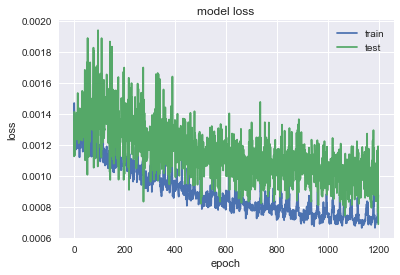

               FTI
MSE       0.555672
MAE       0.592699
R2         0.70696
MAPE (%)   2.46673


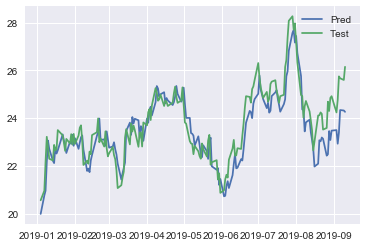

Predicting for  BLK
Train on 1008 samples, validate on 172 samples
Epoch 1/1400
0s - loss: 0.1482 - val_loss: 0.1485
Epoch 2/1400
0s - loss: 0.0932 - val_loss: 0.0889
Epoch 3/1400
0s - loss: 0.0549 - val_loss: 0.0410
Epoch 4/1400
0s - loss: 0.0320 - val_loss: 0.0131
Epoch 5/1400
0s - loss: 0.0265 - val_loss: 0.0043
Epoch 6/1400
0s - loss: 0.0297 - val_loss: 0.0034
Epoch 7/1400
0s - loss: 0.0293 - val_loss: 0.0033
Epoch 8/1400
0s - loss: 0.0256 - val_loss: 0.0034
Epoch 9/1400
0s - loss: 0.0232 - val_loss: 0.0033
Epoch 10/1400
0s - loss: 0.0202 - val_loss: 0.0030
Epoch 11/1400
0s - loss: 0.0178 - val_loss: 0.0031
Epoch 12/1400
0s - loss: 0.0157 - val_loss: 0.0040
Epoch 13/1400
0s - loss: 0.0139 - val_loss: 0.0052
Epoch 14/1400
0s - loss: 0.0131 - val_loss: 0.0063
Epoch 15/1400
0s - loss: 0.0118 - val_loss: 0.0072
Epoch 16/1400
0s - loss: 0.0103 - val_loss: 0.0083
Epoch 17/1400
0s - loss: 0.0095 - val_loss: 0.0096
Epoch 18/1400
0s - loss: 0.0086 - val_loss: 0.0113
Epoch 19/1400
0s - loss:

0s - loss: 0.0014 - val_loss: 8.5460e-04
Epoch 161/1400
0s - loss: 0.0014 - val_loss: 8.2556e-04
Epoch 162/1400
0s - loss: 0.0014 - val_loss: 8.7187e-04
Epoch 163/1400
0s - loss: 0.0014 - val_loss: 7.8015e-04
Epoch 164/1400
0s - loss: 0.0014 - val_loss: 7.8054e-04
Epoch 165/1400
0s - loss: 0.0014 - val_loss: 8.2109e-04
Epoch 166/1400
0s - loss: 0.0013 - val_loss: 7.4984e-04
Epoch 167/1400
0s - loss: 0.0014 - val_loss: 7.6840e-04
Epoch 168/1400
0s - loss: 0.0013 - val_loss: 8.2957e-04
Epoch 169/1400
0s - loss: 0.0014 - val_loss: 7.8683e-04
Epoch 170/1400
0s - loss: 0.0014 - val_loss: 7.5618e-04
Epoch 171/1400
0s - loss: 0.0014 - val_loss: 7.8804e-04
Epoch 172/1400
0s - loss: 0.0013 - val_loss: 7.4955e-04
Epoch 173/1400
0s - loss: 0.0014 - val_loss: 7.8253e-04
Epoch 174/1400
0s - loss: 0.0012 - val_loss: 7.5697e-04
Epoch 175/1400
0s - loss: 0.0014 - val_loss: 7.8978e-04
Epoch 176/1400
0s - loss: 0.0013 - val_loss: 7.2640e-04
Epoch 177/1400
0s - loss: 0.0013 - val_loss: 8.7028e-04
Epoch 1

0s - loss: 0.0017 - val_loss: 4.3266e-04
Epoch 308/1400
0s - loss: 0.0018 - val_loss: 4.2831e-04
Epoch 309/1400
0s - loss: 0.0018 - val_loss: 5.7316e-04
Epoch 310/1400
0s - loss: 0.0017 - val_loss: 4.7027e-04
Epoch 311/1400
0s - loss: 0.0014 - val_loss: 5.6470e-04
Epoch 312/1400
0s - loss: 0.0014 - val_loss: 4.2713e-04
Epoch 313/1400
0s - loss: 0.0013 - val_loss: 4.8164e-04
Epoch 314/1400
0s - loss: 0.0013 - val_loss: 4.3077e-04
Epoch 315/1400
0s - loss: 0.0014 - val_loss: 4.8759e-04
Epoch 316/1400
0s - loss: 0.0013 - val_loss: 4.2580e-04
Epoch 317/1400
0s - loss: 0.0014 - val_loss: 5.0397e-04
Epoch 318/1400
0s - loss: 0.0012 - val_loss: 4.3530e-04
Epoch 319/1400
0s - loss: 0.0013 - val_loss: 4.2914e-04
Epoch 320/1400
0s - loss: 0.0012 - val_loss: 4.2387e-04
Epoch 321/1400
0s - loss: 0.0013 - val_loss: 4.3522e-04
Epoch 322/1400
0s - loss: 0.0013 - val_loss: 4.2215e-04
Epoch 323/1400
0s - loss: 0.0012 - val_loss: 4.2955e-04
Epoch 324/1400
0s - loss: 0.0012 - val_loss: 4.2117e-04
Epoch 3

0s - loss: 0.0015 - val_loss: 4.5788e-04
Epoch 452/1400
0s - loss: 0.0014 - val_loss: 3.8363e-04
Epoch 453/1400
0s - loss: 0.0014 - val_loss: 4.5932e-04
Epoch 454/1400
0s - loss: 0.0013 - val_loss: 3.9235e-04
Epoch 455/1400
0s - loss: 0.0013 - val_loss: 4.2803e-04
Epoch 456/1400
0s - loss: 0.0013 - val_loss: 3.8905e-04
Epoch 457/1400
0s - loss: 0.0013 - val_loss: 4.2346e-04
Epoch 458/1400
0s - loss: 0.0013 - val_loss: 3.8899e-04
Epoch 459/1400
0s - loss: 0.0012 - val_loss: 4.4420e-04
Epoch 460/1400
0s - loss: 0.0011 - val_loss: 4.0132e-04
Epoch 461/1400
0s - loss: 0.0012 - val_loss: 4.4802e-04
Epoch 462/1400
0s - loss: 0.0011 - val_loss: 3.9160e-04
Epoch 463/1400
0s - loss: 0.0011 - val_loss: 4.5517e-04
Epoch 464/1400
0s - loss: 0.0011 - val_loss: 4.0205e-04
Epoch 465/1400
0s - loss: 9.9485e-04 - val_loss: 4.5041e-04
Epoch 466/1400
0s - loss: 0.0010 - val_loss: 3.9834e-04
Epoch 467/1400
0s - loss: 0.0011 - val_loss: 4.4756e-04
Epoch 468/1400
0s - loss: 9.7042e-04 - val_loss: 3.9411e-04

0s - loss: 7.6899e-04 - val_loss: 6.0813e-04
Epoch 592/1400
0s - loss: 8.5020e-04 - val_loss: 5.8624e-04
Epoch 593/1400
0s - loss: 7.8840e-04 - val_loss: 5.3154e-04
Epoch 594/1400
0s - loss: 8.0456e-04 - val_loss: 6.4855e-04
Epoch 595/1400
0s - loss: 7.7829e-04 - val_loss: 5.7515e-04
Epoch 596/1400
0s - loss: 7.8410e-04 - val_loss: 5.7343e-04
Epoch 597/1400
0s - loss: 7.2735e-04 - val_loss: 5.8900e-04
Epoch 598/1400
0s - loss: 7.0620e-04 - val_loss: 5.3368e-04
Epoch 599/1400
0s - loss: 7.6202e-04 - val_loss: 4.8526e-04
Epoch 600/1400
0s - loss: 8.0251e-04 - val_loss: 6.3061e-04
Epoch 601/1400
0s - loss: 7.7541e-04 - val_loss: 4.8664e-04
Epoch 602/1400
0s - loss: 8.6941e-04 - val_loss: 6.0913e-04
Epoch 603/1400
0s - loss: 7.5712e-04 - val_loss: 5.1094e-04
Epoch 604/1400
0s - loss: 7.8967e-04 - val_loss: 6.5429e-04
Epoch 605/1400
0s - loss: 8.2408e-04 - val_loss: 4.9325e-04
Epoch 606/1400
0s - loss: 7.8336e-04 - val_loss: 7.9023e-04
Epoch 607/1400
0s - loss: 8.4766e-04 - val_loss: 4.6854

0s - loss: 6.3954e-04 - val_loss: 7.2670e-04
Epoch 730/1400
0s - loss: 6.5699e-04 - val_loss: 8.4124e-04
Epoch 731/1400
0s - loss: 7.1787e-04 - val_loss: 6.6098e-04
Epoch 732/1400
0s - loss: 6.7700e-04 - val_loss: 8.3548e-04
Epoch 733/1400
0s - loss: 6.7188e-04 - val_loss: 6.6975e-04
Epoch 734/1400
0s - loss: 6.7998e-04 - val_loss: 7.0837e-04
Epoch 735/1400
0s - loss: 6.6326e-04 - val_loss: 7.2908e-04
Epoch 736/1400
0s - loss: 6.6925e-04 - val_loss: 6.2511e-04
Epoch 737/1400
0s - loss: 6.9037e-04 - val_loss: 8.4699e-04
Epoch 738/1400
0s - loss: 6.6552e-04 - val_loss: 6.4452e-04
Epoch 739/1400
0s - loss: 6.2137e-04 - val_loss: 7.9681e-04
Epoch 740/1400
0s - loss: 6.6784e-04 - val_loss: 7.4914e-04
Epoch 741/1400
0s - loss: 6.8980e-04 - val_loss: 7.1405e-04
Epoch 742/1400
0s - loss: 6.5379e-04 - val_loss: 7.9239e-04
Epoch 743/1400
0s - loss: 6.7592e-04 - val_loss: 6.0781e-04
Epoch 744/1400
0s - loss: 7.1583e-04 - val_loss: 7.7942e-04
Epoch 745/1400
0s - loss: 6.6536e-04 - val_loss: 6.9343

0s - loss: 7.8315e-04 - val_loss: 0.0013
Epoch 870/1400
0s - loss: 7.7985e-04 - val_loss: 5.5193e-04
Epoch 871/1400
0s - loss: 7.2214e-04 - val_loss: 9.6891e-04
Epoch 872/1400
0s - loss: 7.0491e-04 - val_loss: 0.0010
Epoch 873/1400
0s - loss: 6.5320e-04 - val_loss: 4.6631e-04
Epoch 874/1400
0s - loss: 8.3623e-04 - val_loss: 0.0015
Epoch 875/1400
0s - loss: 8.0625e-04 - val_loss: 7.0899e-04
Epoch 876/1400
0s - loss: 7.7452e-04 - val_loss: 6.5164e-04
Epoch 877/1400
0s - loss: 8.3868e-04 - val_loss: 0.0016
Epoch 878/1400
0s - loss: 8.6218e-04 - val_loss: 5.2528e-04
Epoch 879/1400
0s - loss: 7.4024e-04 - val_loss: 0.0011
Epoch 880/1400
0s - loss: 6.4792e-04 - val_loss: 8.0203e-04
Epoch 881/1400
0s - loss: 5.2026e-04 - val_loss: 8.8085e-04
Epoch 882/1400
0s - loss: 6.1946e-04 - val_loss: 9.5477e-04
Epoch 883/1400
0s - loss: 5.4715e-04 - val_loss: 9.7960e-04
Epoch 884/1400
0s - loss: 5.6353e-04 - val_loss: 7.7613e-04
Epoch 885/1400
0s - loss: 5.9704e-04 - val_loss: 9.3461e-04
Epoch 886/1400


0s - loss: 5.6185e-04 - val_loss: 7.5978e-04
Epoch 1010/1400
0s - loss: 5.9639e-04 - val_loss: 8.3501e-04
Epoch 1011/1400
0s - loss: 5.4866e-04 - val_loss: 8.4027e-04
Epoch 1012/1400
0s - loss: 5.5087e-04 - val_loss: 9.8200e-04
Epoch 1013/1400
0s - loss: 5.9936e-04 - val_loss: 8.4052e-04
Epoch 1014/1400
0s - loss: 6.3221e-04 - val_loss: 0.0012
Epoch 1015/1400
0s - loss: 5.8213e-04 - val_loss: 6.9556e-04
Epoch 1016/1400
0s - loss: 6.2793e-04 - val_loss: 0.0014
Epoch 1017/1400
0s - loss: 6.3982e-04 - val_loss: 7.3815e-04
Epoch 1018/1400
0s - loss: 6.1392e-04 - val_loss: 9.9951e-04
Epoch 1019/1400
0s - loss: 6.4444e-04 - val_loss: 0.0013
Epoch 1020/1400
0s - loss: 6.1565e-04 - val_loss: 7.7875e-04
Epoch 1021/1400
0s - loss: 6.5257e-04 - val_loss: 0.0011
Epoch 1022/1400
0s - loss: 6.2095e-04 - val_loss: 0.0011
Epoch 1023/1400
0s - loss: 6.9317e-04 - val_loss: 7.0805e-04
Epoch 1024/1400
0s - loss: 7.2514e-04 - val_loss: 9.1388e-04
Epoch 1025/1400
0s - loss: 6.1732e-04 - val_loss: 0.0011
Epo

0s - loss: 6.2480e-04 - val_loss: 8.4467e-04
Epoch 1148/1400
0s - loss: 6.4655e-04 - val_loss: 6.6612e-04
Epoch 1149/1400
0s - loss: 7.0061e-04 - val_loss: 0.0015
Epoch 1150/1400
0s - loss: 7.6565e-04 - val_loss: 7.9872e-04
Epoch 1151/1400
0s - loss: 7.2832e-04 - val_loss: 6.8909e-04
Epoch 1152/1400
0s - loss: 8.1441e-04 - val_loss: 0.0015
Epoch 1153/1400
0s - loss: 7.9432e-04 - val_loss: 5.4938e-04
Epoch 1154/1400
0s - loss: 6.7715e-04 - val_loss: 0.0011
Epoch 1155/1400
0s - loss: 5.0770e-04 - val_loss: 8.9280e-04
Epoch 1156/1400
0s - loss: 6.0751e-04 - val_loss: 9.1253e-04
Epoch 1157/1400
0s - loss: 5.4312e-04 - val_loss: 0.0010
Epoch 1158/1400
0s - loss: 5.7532e-04 - val_loss: 9.1812e-04
Epoch 1159/1400
0s - loss: 5.8334e-04 - val_loss: 0.0011
Epoch 1160/1400
0s - loss: 5.8626e-04 - val_loss: 0.0010
Epoch 1161/1400
0s - loss: 5.5912e-04 - val_loss: 9.8645e-04
Epoch 1162/1400
0s - loss: 5.5194e-04 - val_loss: 9.6492e-04
Epoch 1163/1400
0s - loss: 5.7182e-04 - val_loss: 0.0011
Epoch 1

0s - loss: 6.2176e-04 - val_loss: 6.5933e-04
Epoch 1288/1400
0s - loss: 5.6621e-04 - val_loss: 9.7842e-04
Epoch 1289/1400
0s - loss: 5.4686e-04 - val_loss: 8.8134e-04
Epoch 1290/1400
0s - loss: 5.7172e-04 - val_loss: 8.7253e-04
Epoch 1291/1400
0s - loss: 5.1330e-04 - val_loss: 9.6588e-04
Epoch 1292/1400
0s - loss: 5.6633e-04 - val_loss: 0.0011
Epoch 1293/1400
0s - loss: 5.7264e-04 - val_loss: 8.2233e-04
Epoch 1294/1400
0s - loss: 5.4754e-04 - val_loss: 0.0011
Epoch 1295/1400
0s - loss: 6.1366e-04 - val_loss: 8.4362e-04
Epoch 1296/1400
0s - loss: 5.5712e-04 - val_loss: 7.6818e-04
Epoch 1297/1400
0s - loss: 5.1409e-04 - val_loss: 0.0011
Epoch 1298/1400
0s - loss: 6.3016e-04 - val_loss: 8.5989e-04
Epoch 1299/1400
0s - loss: 5.4548e-04 - val_loss: 8.5093e-04
Epoch 1300/1400
0s - loss: 6.1402e-04 - val_loss: 0.0013
Epoch 1301/1400
0s - loss: 6.0091e-04 - val_loss: 7.9214e-04
Epoch 1302/1400
0s - loss: 6.9612e-04 - val_loss: 8.5644e-04
Epoch 1303/1400
0s - loss: 6.7798e-04 - val_loss: 0.0015

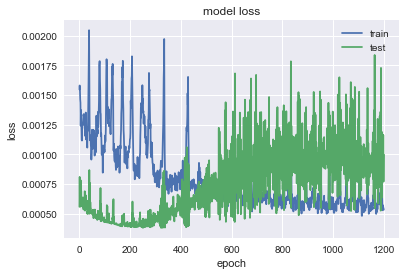

               BLK
MSE        93.4697
MAE        8.01741
R2        0.822514
MAPE (%)   1.80836


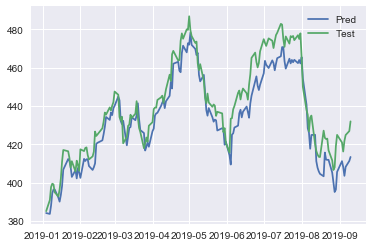

Predicting for  DVA
Train on 1008 samples, validate on 172 samples
Epoch 1/1400
0s - loss: 0.3546 - val_loss: 0.0234
Epoch 2/1400
0s - loss: 0.2095 - val_loss: 0.0072
Epoch 3/1400
0s - loss: 0.1012 - val_loss: 0.0609
Epoch 4/1400
0s - loss: 0.0586 - val_loss: 0.1571
Epoch 5/1400
0s - loss: 0.0503 - val_loss: 0.1674
Epoch 6/1400
0s - loss: 0.0373 - val_loss: 0.1199
Epoch 7/1400
0s - loss: 0.0306 - val_loss: 0.0856
Epoch 8/1400
0s - loss: 0.0313 - val_loss: 0.0736
Epoch 9/1400
0s - loss: 0.0314 - val_loss: 0.0734
Epoch 10/1400
0s - loss: 0.0301 - val_loss: 0.0764
Epoch 11/1400
0s - loss: 0.0269 - val_loss: 0.0762
Epoch 12/1400
0s - loss: 0.0248 - val_loss: 0.0718
Epoch 13/1400
0s - loss: 0.0224 - val_loss: 0.0653
Epoch 14/1400
0s - loss: 0.0221 - val_loss: 0.0599
Epoch 15/1400
0s - loss: 0.0205 - val_loss: 0.0564
Epoch 16/1400
0s - loss: 0.0195 - val_loss: 0.0533
Epoch 17/1400
0s - loss: 0.0184 - val_loss: 0.0502
Epoch 18/1400
0s - loss: 0.0167 - val_loss: 0.0473
Epoch 19/1400
0s - loss:

0s - loss: 0.0021 - val_loss: 0.0056
Epoch 161/1400
0s - loss: 0.0020 - val_loss: 0.0062
Epoch 162/1400
0s - loss: 0.0020 - val_loss: 0.0057
Epoch 163/1400
0s - loss: 0.0022 - val_loss: 0.0056
Epoch 164/1400
0s - loss: 0.0020 - val_loss: 0.0054
Epoch 165/1400
0s - loss: 0.0021 - val_loss: 0.0047
Epoch 166/1400
0s - loss: 0.0021 - val_loss: 0.0049
Epoch 167/1400
0s - loss: 0.0020 - val_loss: 0.0046
Epoch 168/1400
0s - loss: 0.0021 - val_loss: 0.0046
Epoch 169/1400
0s - loss: 0.0021 - val_loss: 0.0045
Epoch 170/1400
0s - loss: 0.0020 - val_loss: 0.0044
Epoch 171/1400
0s - loss: 0.0019 - val_loss: 0.0045
Epoch 172/1400
0s - loss: 0.0021 - val_loss: 0.0042
Epoch 173/1400
0s - loss: 0.0020 - val_loss: 0.0042
Epoch 174/1400
0s - loss: 0.0020 - val_loss: 0.0037
Epoch 175/1400
0s - loss: 0.0019 - val_loss: 0.0041
Epoch 176/1400
0s - loss: 0.0019 - val_loss: 0.0037
Epoch 177/1400
0s - loss: 0.0021 - val_loss: 0.0041
Epoch 178/1400
0s - loss: 0.0020 - val_loss: 0.0038
Epoch 179/1400
0s - loss: 0

0s - loss: 0.0017 - val_loss: 0.0010
Epoch 316/1400
0s - loss: 0.0016 - val_loss: 9.3726e-04
Epoch 317/1400
0s - loss: 0.0017 - val_loss: 9.5071e-04
Epoch 318/1400
0s - loss: 0.0016 - val_loss: 0.0011
Epoch 319/1400
0s - loss: 0.0017 - val_loss: 9.6050e-04
Epoch 320/1400
0s - loss: 0.0018 - val_loss: 9.6829e-04
Epoch 321/1400
0s - loss: 0.0018 - val_loss: 9.5401e-04
Epoch 322/1400
0s - loss: 0.0017 - val_loss: 9.3580e-04
Epoch 323/1400
0s - loss: 0.0015 - val_loss: 9.5561e-04
Epoch 324/1400
0s - loss: 0.0016 - val_loss: 9.2516e-04
Epoch 325/1400
0s - loss: 0.0015 - val_loss: 9.6775e-04
Epoch 326/1400
0s - loss: 0.0017 - val_loss: 9.2883e-04
Epoch 327/1400
0s - loss: 0.0016 - val_loss: 0.0010
Epoch 328/1400
0s - loss: 0.0015 - val_loss: 9.3072e-04
Epoch 329/1400
0s - loss: 0.0017 - val_loss: 9.2559e-04
Epoch 330/1400
0s - loss: 0.0016 - val_loss: 9.8697e-04
Epoch 331/1400
0s - loss: 0.0018 - val_loss: 9.3930e-04
Epoch 332/1400
0s - loss: 0.0016 - val_loss: 9.5605e-04
Epoch 333/1400
0s -

0s - loss: 0.0016 - val_loss: 9.6585e-04
Epoch 463/1400
0s - loss: 0.0015 - val_loss: 9.7007e-04
Epoch 464/1400
0s - loss: 0.0014 - val_loss: 9.3169e-04
Epoch 465/1400
0s - loss: 0.0013 - val_loss: 9.0967e-04
Epoch 466/1400
0s - loss: 0.0015 - val_loss: 9.4313e-04
Epoch 467/1400
0s - loss: 0.0013 - val_loss: 9.3566e-04
Epoch 468/1400
0s - loss: 0.0014 - val_loss: 9.0770e-04
Epoch 469/1400
0s - loss: 0.0013 - val_loss: 9.0782e-04
Epoch 470/1400
0s - loss: 0.0013 - val_loss: 9.7472e-04
Epoch 471/1400
0s - loss: 0.0014 - val_loss: 9.3196e-04
Epoch 472/1400
0s - loss: 0.0013 - val_loss: 9.1872e-04
Epoch 473/1400
0s - loss: 0.0014 - val_loss: 9.7101e-04
Epoch 474/1400
0s - loss: 0.0015 - val_loss: 9.8209e-04
Epoch 475/1400
0s - loss: 0.0014 - val_loss: 9.3391e-04
Epoch 476/1400
0s - loss: 0.0013 - val_loss: 9.5080e-04
Epoch 477/1400
0s - loss: 0.0013 - val_loss: 0.0011
Epoch 478/1400
0s - loss: 0.0014 - val_loss: 9.4316e-04
Epoch 479/1400
0s - loss: 0.0015 - val_loss: 8.9925e-04
Epoch 480/1

0s - loss: 0.0016 - val_loss: 0.0011
Epoch 612/1400
0s - loss: 0.0014 - val_loss: 9.7048e-04
Epoch 613/1400
0s - loss: 0.0014 - val_loss: 9.1261e-04
Epoch 614/1400
0s - loss: 0.0014 - val_loss: 0.0011
Epoch 615/1400
0s - loss: 0.0013 - val_loss: 9.6606e-04
Epoch 616/1400
0s - loss: 0.0012 - val_loss: 9.3734e-04
Epoch 617/1400
0s - loss: 0.0011 - val_loss: 0.0010
Epoch 618/1400
0s - loss: 0.0013 - val_loss: 0.0010
Epoch 619/1400
0s - loss: 0.0012 - val_loss: 9.5892e-04
Epoch 620/1400
0s - loss: 0.0011 - val_loss: 9.9352e-04
Epoch 621/1400
0s - loss: 0.0011 - val_loss: 0.0011
Epoch 622/1400
0s - loss: 0.0012 - val_loss: 9.8218e-04
Epoch 623/1400
0s - loss: 0.0012 - val_loss: 0.0010
Epoch 624/1400
0s - loss: 0.0013 - val_loss: 0.0011
Epoch 625/1400
0s - loss: 0.0013 - val_loss: 0.0010
Epoch 626/1400
0s - loss: 0.0012 - val_loss: 9.8670e-04
Epoch 627/1400
0s - loss: 0.0012 - val_loss: 9.8047e-04
Epoch 628/1400
0s - loss: 0.0012 - val_loss: 0.0011
Epoch 629/1400
0s - loss: 0.0012 - val_loss

0s - loss: 0.0013 - val_loss: 0.0010
Epoch 764/1400
0s - loss: 0.0013 - val_loss: 9.2156e-04
Epoch 765/1400
0s - loss: 0.0010 - val_loss: 0.0010
Epoch 766/1400
0s - loss: 0.0011 - val_loss: 0.0011
Epoch 767/1400
0s - loss: 0.0010 - val_loss: 9.2887e-04
Epoch 768/1400
0s - loss: 0.0010 - val_loss: 0.0010
Epoch 769/1400
0s - loss: 0.0011 - val_loss: 9.3348e-04
Epoch 770/1400
0s - loss: 0.0010 - val_loss: 9.4259e-04
Epoch 771/1400
0s - loss: 0.0011 - val_loss: 9.8748e-04
Epoch 772/1400
0s - loss: 0.0011 - val_loss: 9.4066e-04
Epoch 773/1400
0s - loss: 9.9898e-04 - val_loss: 9.5922e-04
Epoch 774/1400
0s - loss: 0.0010 - val_loss: 9.9942e-04
Epoch 775/1400
0s - loss: 0.0011 - val_loss: 0.0010
Epoch 776/1400
0s - loss: 9.6874e-04 - val_loss: 0.0010
Epoch 777/1400
0s - loss: 9.9088e-04 - val_loss: 0.0010
Epoch 778/1400
0s - loss: 0.0010 - val_loss: 9.8466e-04
Epoch 779/1400
0s - loss: 0.0011 - val_loss: 0.0010
Epoch 780/1400
0s - loss: 0.0011 - val_loss: 9.6046e-04
Epoch 781/1400
0s - loss: 0

0s - loss: 8.9145e-04 - val_loss: 0.0010
Epoch 912/1400
0s - loss: 9.3742e-04 - val_loss: 0.0012
Epoch 913/1400
0s - loss: 0.0010 - val_loss: 0.0010
Epoch 914/1400
0s - loss: 9.6344e-04 - val_loss: 0.0010
Epoch 915/1400
0s - loss: 9.3053e-04 - val_loss: 0.0011
Epoch 916/1400
0s - loss: 9.6191e-04 - val_loss: 9.7882e-04
Epoch 917/1400
0s - loss: 0.0010 - val_loss: 0.0010
Epoch 918/1400
0s - loss: 9.8024e-04 - val_loss: 0.0011
Epoch 919/1400
0s - loss: 0.0010 - val_loss: 0.0010
Epoch 920/1400
0s - loss: 9.3848e-04 - val_loss: 9.3696e-04
Epoch 921/1400
0s - loss: 0.0011 - val_loss: 0.0011
Epoch 922/1400
0s - loss: 0.0010 - val_loss: 9.6515e-04
Epoch 923/1400
0s - loss: 0.0010 - val_loss: 9.3945e-04
Epoch 924/1400
0s - loss: 0.0010 - val_loss: 9.8063e-04
Epoch 925/1400
0s - loss: 0.0010 - val_loss: 0.0011
Epoch 926/1400
0s - loss: 9.9118e-04 - val_loss: 9.4350e-04
Epoch 927/1400
0s - loss: 0.0011 - val_loss: 0.0010
Epoch 928/1400
0s - loss: 0.0010 - val_loss: 0.0010
Epoch 929/1400
0s - los

0s - loss: 8.3669e-04 - val_loss: 0.0011
Epoch 1058/1400
0s - loss: 8.9523e-04 - val_loss: 0.0010
Epoch 1059/1400
0s - loss: 8.4346e-04 - val_loss: 0.0010
Epoch 1060/1400
0s - loss: 8.4585e-04 - val_loss: 0.0010
Epoch 1061/1400
0s - loss: 8.2836e-04 - val_loss: 9.5861e-04
Epoch 1062/1400
0s - loss: 8.6866e-04 - val_loss: 0.0010
Epoch 1063/1400
0s - loss: 8.0557e-04 - val_loss: 9.8621e-04
Epoch 1064/1400
0s - loss: 8.4137e-04 - val_loss: 0.0010
Epoch 1065/1400
0s - loss: 8.9895e-04 - val_loss: 0.0010
Epoch 1066/1400
0s - loss: 8.3676e-04 - val_loss: 9.7437e-04
Epoch 1067/1400
0s - loss: 8.4561e-04 - val_loss: 9.9041e-04
Epoch 1068/1400
0s - loss: 8.1821e-04 - val_loss: 9.6002e-04
Epoch 1069/1400
0s - loss: 8.4900e-04 - val_loss: 9.9615e-04
Epoch 1070/1400
0s - loss: 8.4434e-04 - val_loss: 0.0010
Epoch 1071/1400
0s - loss: 8.5286e-04 - val_loss: 0.0011
Epoch 1072/1400
0s - loss: 8.7616e-04 - val_loss: 0.0011
Epoch 1073/1400
0s - loss: 8.2348e-04 - val_loss: 0.0011
Epoch 1074/1400
0s - lo

0s - loss: 8.4707e-04 - val_loss: 0.0010
Epoch 1200/1400
0s - loss: 7.7383e-04 - val_loss: 0.0011
Epoch 1201/1400
0s - loss: 8.0750e-04 - val_loss: 9.9485e-04
Epoch 1202/1400
0s - loss: 8.0250e-04 - val_loss: 9.9947e-04
Epoch 1203/1400
0s - loss: 8.0142e-04 - val_loss: 0.0010
Epoch 1204/1400
0s - loss: 8.1383e-04 - val_loss: 0.0010
Epoch 1205/1400
0s - loss: 8.2560e-04 - val_loss: 0.0011
Epoch 1206/1400
0s - loss: 8.2216e-04 - val_loss: 0.0010
Epoch 1207/1400
0s - loss: 7.8235e-04 - val_loss: 0.0011
Epoch 1208/1400
0s - loss: 7.7078e-04 - val_loss: 0.0010
Epoch 1209/1400
0s - loss: 8.1887e-04 - val_loss: 0.0011
Epoch 1210/1400
0s - loss: 8.2839e-04 - val_loss: 0.0011
Epoch 1211/1400
0s - loss: 7.7668e-04 - val_loss: 0.0010
Epoch 1212/1400
0s - loss: 8.4566e-04 - val_loss: 9.9197e-04
Epoch 1213/1400
0s - loss: 8.7557e-04 - val_loss: 0.0011
Epoch 1214/1400
0s - loss: 8.6886e-04 - val_loss: 0.0010
Epoch 1215/1400
0s - loss: 8.7622e-04 - val_loss: 9.7423e-04
Epoch 1216/1400
0s - loss: 9.11

0s - loss: 7.9025e-04 - val_loss: 0.0011
Epoch 1342/1400
0s - loss: 8.4629e-04 - val_loss: 0.0010
Epoch 1343/1400
0s - loss: 7.7790e-04 - val_loss: 0.0011
Epoch 1344/1400
0s - loss: 7.7458e-04 - val_loss: 0.0010
Epoch 1345/1400
0s - loss: 7.8645e-04 - val_loss: 0.0010
Epoch 1346/1400
0s - loss: 7.8223e-04 - val_loss: 0.0010
Epoch 1347/1400
0s - loss: 7.9741e-04 - val_loss: 0.0010
Epoch 1348/1400
0s - loss: 7.5672e-04 - val_loss: 0.0010
Epoch 1349/1400
0s - loss: 7.2638e-04 - val_loss: 9.8721e-04
Epoch 1350/1400
0s - loss: 8.1155e-04 - val_loss: 0.0011
Epoch 1351/1400
0s - loss: 7.8999e-04 - val_loss: 9.7788e-04
Epoch 1352/1400
0s - loss: 7.6852e-04 - val_loss: 9.7112e-04
Epoch 1353/1400
0s - loss: 8.0980e-04 - val_loss: 0.0011
Epoch 1354/1400
0s - loss: 8.4205e-04 - val_loss: 0.0011
Epoch 1355/1400
0s - loss: 8.2113e-04 - val_loss: 0.0010
Epoch 1356/1400
0s - loss: 8.2558e-04 - val_loss: 0.0011
Epoch 1357/1400
0s - loss: 8.6741e-04 - val_loss: 9.9223e-04
Epoch 1358/1400
0s - loss: 7.68

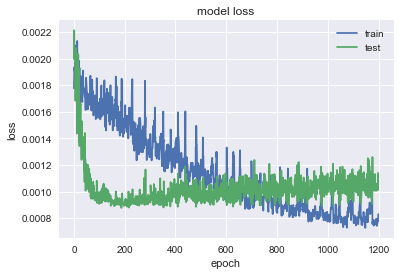

               DVA
MSE        1.85859
MAE        1.04557
R2        0.839063
MAPE (%)   1.91043


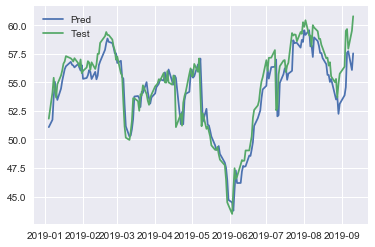

Predicting for  BA
Train on 1008 samples, validate on 172 samples
Epoch 1/1400
0s - loss: 0.1149 - val_loss: 0.4487
Epoch 2/1400
0s - loss: 0.0801 - val_loss: 0.3544
Epoch 3/1400
0s - loss: 0.0559 - val_loss: 0.2641
Epoch 4/1400
0s - loss: 0.0427 - val_loss: 0.1910
Epoch 5/1400
0s - loss: 0.0413 - val_loss: 0.1452
Epoch 6/1400
0s - loss: 0.0423 - val_loss: 0.1253
Epoch 7/1400
0s - loss: 0.0401 - val_loss: 0.1200
Epoch 8/1400
0s - loss: 0.0360 - val_loss: 0.1173
Epoch 9/1400
0s - loss: 0.0308 - val_loss: 0.1095
Epoch 10/1400
0s - loss: 0.0257 - val_loss: 0.0960
Epoch 11/1400
0s - loss: 0.0208 - val_loss: 0.0799
Epoch 12/1400
0s - loss: 0.0175 - val_loss: 0.0649
Epoch 13/1400
0s - loss: 0.0142 - val_loss: 0.0529
Epoch 14/1400
0s - loss: 0.0107 - val_loss: 0.0431
Epoch 15/1400
0s - loss: 0.0079 - val_loss: 0.0348
Epoch 16/1400
0s - loss: 0.0058 - val_loss: 0.0277
Epoch 17/1400
0s - loss: 0.0040 - val_loss: 0.0217
Epoch 18/1400
0s - loss: 0.0032 - val_loss: 0.0173
Epoch 19/1400
0s - loss: 

0s - loss: 0.0012 - val_loss: 0.0035
Epoch 161/1400
0s - loss: 0.0011 - val_loss: 0.0035
Epoch 162/1400
0s - loss: 0.0012 - val_loss: 0.0033
Epoch 163/1400
0s - loss: 0.0011 - val_loss: 0.0033
Epoch 164/1400
0s - loss: 0.0011 - val_loss: 0.0033
Epoch 165/1400
0s - loss: 9.9229e-04 - val_loss: 0.0033
Epoch 166/1400
0s - loss: 0.0012 - val_loss: 0.0032
Epoch 167/1400
0s - loss: 0.0010 - val_loss: 0.0032
Epoch 168/1400
0s - loss: 0.0010 - val_loss: 0.0031
Epoch 169/1400
0s - loss: 0.0011 - val_loss: 0.0032
Epoch 170/1400
0s - loss: 0.0011 - val_loss: 0.0031
Epoch 171/1400
0s - loss: 0.0011 - val_loss: 0.0031
Epoch 172/1400
0s - loss: 0.0011 - val_loss: 0.0030
Epoch 173/1400
0s - loss: 0.0011 - val_loss: 0.0030
Epoch 174/1400
0s - loss: 0.0011 - val_loss: 0.0030
Epoch 175/1400
0s - loss: 0.0012 - val_loss: 0.0030
Epoch 176/1400
0s - loss: 0.0011 - val_loss: 0.0029
Epoch 177/1400
0s - loss: 0.0010 - val_loss: 0.0029
Epoch 178/1400
0s - loss: 0.0011 - val_loss: 0.0029
Epoch 179/1400
0s - los

0s - loss: 6.2929e-04 - val_loss: 0.0010
Epoch 313/1400
0s - loss: 8.1174e-04 - val_loss: 0.0010
Epoch 314/1400
0s - loss: 6.1436e-04 - val_loss: 9.9749e-04
Epoch 315/1400
0s - loss: 7.8233e-04 - val_loss: 9.8499e-04
Epoch 316/1400
0s - loss: 7.1167e-04 - val_loss: 9.7138e-04
Epoch 317/1400
0s - loss: 6.0743e-04 - val_loss: 9.6625e-04
Epoch 318/1400
0s - loss: 7.1431e-04 - val_loss: 9.6877e-04
Epoch 319/1400
0s - loss: 7.5679e-04 - val_loss: 9.5968e-04
Epoch 320/1400
0s - loss: 8.5633e-04 - val_loss: 9.5332e-04
Epoch 321/1400
0s - loss: 9.5151e-04 - val_loss: 0.0010
Epoch 322/1400
0s - loss: 8.7706e-04 - val_loss: 9.9580e-04
Epoch 323/1400
0s - loss: 8.7870e-04 - val_loss: 0.0010
Epoch 324/1400
0s - loss: 9.8727e-04 - val_loss: 9.4558e-04
Epoch 325/1400
0s - loss: 0.0012 - val_loss: 0.0011
Epoch 326/1400
0s - loss: 0.0012 - val_loss: 9.3900e-04
Epoch 327/1400
0s - loss: 0.0015 - val_loss: 0.0013
Epoch 328/1400
0s - loss: 0.0013 - val_loss: 0.0012
Epoch 329/1400
0s - loss: 0.0010 - val_

0s - loss: 5.6107e-04 - val_loss: 6.6564e-04
Epoch 453/1400
0s - loss: 6.0086e-04 - val_loss: 7.5426e-04
Epoch 454/1400
0s - loss: 6.2358e-04 - val_loss: 6.3993e-04
Epoch 455/1400
0s - loss: 6.0951e-04 - val_loss: 7.3411e-04
Epoch 456/1400
0s - loss: 6.2112e-04 - val_loss: 6.3913e-04
Epoch 457/1400
0s - loss: 5.5618e-04 - val_loss: 7.0989e-04
Epoch 458/1400
0s - loss: 5.6259e-04 - val_loss: 7.0024e-04
Epoch 459/1400
0s - loss: 5.5090e-04 - val_loss: 7.0211e-04
Epoch 460/1400
0s - loss: 5.8060e-04 - val_loss: 6.7859e-04
Epoch 461/1400
0s - loss: 5.2864e-04 - val_loss: 7.2351e-04
Epoch 462/1400
0s - loss: 6.3654e-04 - val_loss: 6.5162e-04
Epoch 463/1400
0s - loss: 5.1495e-04 - val_loss: 7.1064e-04
Epoch 464/1400
0s - loss: 6.5282e-04 - val_loss: 7.1518e-04
Epoch 465/1400
0s - loss: 6.4433e-04 - val_loss: 7.7450e-04
Epoch 466/1400
0s - loss: 6.7037e-04 - val_loss: 7.3810e-04
Epoch 467/1400
0s - loss: 7.2703e-04 - val_loss: 6.6440e-04
Epoch 468/1400
0s - loss: 8.6950e-04 - val_loss: 6.8811

0s - loss: 5.1448e-04 - val_loss: 6.6862e-04
Epoch 593/1400
0s - loss: 4.7686e-04 - val_loss: 6.4626e-04
Epoch 594/1400
0s - loss: 4.7236e-04 - val_loss: 6.6107e-04
Epoch 595/1400
0s - loss: 4.8512e-04 - val_loss: 6.9536e-04
Epoch 596/1400
0s - loss: 5.1510e-04 - val_loss: 6.9122e-04
Epoch 597/1400
0s - loss: 6.4600e-04 - val_loss: 6.2737e-04
Epoch 598/1400
0s - loss: 5.3634e-04 - val_loss: 7.3354e-04
Epoch 599/1400
0s - loss: 5.6494e-04 - val_loss: 6.3902e-04
Epoch 600/1400
0s - loss: 7.1912e-04 - val_loss: 7.4660e-04
Epoch 601/1400
0s - loss: 6.1832e-04 - val_loss: 6.0340e-04
Epoch 602/1400
0s - loss: 7.0471e-04 - val_loss: 8.5306e-04
Epoch 603/1400
0s - loss: 6.2435e-04 - val_loss: 6.4007e-04
Epoch 604/1400
0s - loss: 7.0289e-04 - val_loss: 8.1574e-04
Epoch 605/1400
0s - loss: 6.9789e-04 - val_loss: 5.9446e-04
Epoch 606/1400
0s - loss: 7.6559e-04 - val_loss: 8.5203e-04
Epoch 607/1400
0s - loss: 7.7362e-04 - val_loss: 6.1757e-04
Epoch 608/1400
0s - loss: 7.2695e-04 - val_loss: 8.7868

0s - loss: 5.3391e-04 - val_loss: 7.4492e-04
Epoch 733/1400
0s - loss: 6.1326e-04 - val_loss: 7.6641e-04
Epoch 734/1400
0s - loss: 6.8583e-04 - val_loss: 9.6256e-04
Epoch 735/1400
0s - loss: 7.1802e-04 - val_loss: 7.6666e-04
Epoch 736/1400
0s - loss: 7.8756e-04 - val_loss: 0.0010
Epoch 737/1400
0s - loss: 7.4997e-04 - val_loss: 6.2651e-04
Epoch 738/1400
0s - loss: 7.7224e-04 - val_loss: 0.0011
Epoch 739/1400
0s - loss: 7.5954e-04 - val_loss: 6.2536e-04
Epoch 740/1400
0s - loss: 7.5360e-04 - val_loss: 0.0011
Epoch 741/1400
0s - loss: 7.4990e-04 - val_loss: 6.6529e-04
Epoch 742/1400
0s - loss: 6.2539e-04 - val_loss: 9.6234e-04
Epoch 743/1400
0s - loss: 7.0743e-04 - val_loss: 6.9049e-04
Epoch 744/1400
0s - loss: 8.1318e-04 - val_loss: 9.6525e-04
Epoch 745/1400
0s - loss: 9.2571e-04 - val_loss: 8.0343e-04
Epoch 746/1400
0s - loss: 0.0010 - val_loss: 9.9480e-04
Epoch 747/1400
0s - loss: 9.7189e-04 - val_loss: 5.9830e-04
Epoch 748/1400
0s - loss: 9.4277e-04 - val_loss: 0.0012
Epoch 749/1400


0s - loss: 4.8453e-04 - val_loss: 8.4687e-04
Epoch 871/1400
0s - loss: 5.3919e-04 - val_loss: 9.2604e-04
Epoch 872/1400
0s - loss: 5.3574e-04 - val_loss: 7.7690e-04
Epoch 873/1400
0s - loss: 5.1422e-04 - val_loss: 8.8246e-04
Epoch 874/1400
0s - loss: 5.1429e-04 - val_loss: 8.0370e-04
Epoch 875/1400
0s - loss: 5.7661e-04 - val_loss: 8.2669e-04
Epoch 876/1400
0s - loss: 7.0804e-04 - val_loss: 8.1287e-04
Epoch 877/1400
0s - loss: 7.7419e-04 - val_loss: 8.7700e-04
Epoch 878/1400
0s - loss: 8.5646e-04 - val_loss: 8.0796e-04
Epoch 879/1400
0s - loss: 0.0010 - val_loss: 0.0011
Epoch 880/1400
0s - loss: 9.6125e-04 - val_loss: 6.6855e-04
Epoch 881/1400
0s - loss: 9.8663e-04 - val_loss: 0.0014
Epoch 882/1400
0s - loss: 8.2013e-04 - val_loss: 5.2131e-04
Epoch 883/1400
0s - loss: 6.0813e-04 - val_loss: 0.0014
Epoch 884/1400
0s - loss: 5.6189e-04 - val_loss: 5.7892e-04
Epoch 885/1400
0s - loss: 4.9268e-04 - val_loss: 0.0011
Epoch 886/1400
0s - loss: 4.3272e-04 - val_loss: 6.2844e-04
Epoch 887/1400


0s - loss: 4.0769e-04 - val_loss: 0.0011
Epoch 1011/1400
0s - loss: 3.7498e-04 - val_loss: 9.3209e-04
Epoch 1012/1400
0s - loss: 3.4167e-04 - val_loss: 0.0010
Epoch 1013/1400
0s - loss: 4.0109e-04 - val_loss: 0.0010
Epoch 1014/1400
0s - loss: 4.2949e-04 - val_loss: 0.0010
Epoch 1015/1400
0s - loss: 4.2280e-04 - val_loss: 9.4483e-04
Epoch 1016/1400
0s - loss: 4.0990e-04 - val_loss: 0.0010
Epoch 1017/1400
0s - loss: 4.0312e-04 - val_loss: 0.0011
Epoch 1018/1400
0s - loss: 4.2720e-04 - val_loss: 0.0011
Epoch 1019/1400
0s - loss: 4.0663e-04 - val_loss: 0.0010
Epoch 1020/1400
0s - loss: 4.5444e-04 - val_loss: 8.9442e-04
Epoch 1021/1400
0s - loss: 5.3025e-04 - val_loss: 0.0011
Epoch 1022/1400
0s - loss: 4.6170e-04 - val_loss: 9.7658e-04
Epoch 1023/1400
0s - loss: 5.2455e-04 - val_loss: 9.3958e-04
Epoch 1024/1400
0s - loss: 4.8412e-04 - val_loss: 9.3313e-04
Epoch 1025/1400
0s - loss: 5.5898e-04 - val_loss: 0.0010
Epoch 1026/1400
0s - loss: 6.5640e-04 - val_loss: 9.8678e-04
Epoch 1027/1400
0s 

0s - loss: 4.0508e-04 - val_loss: 0.0013
Epoch 1150/1400
0s - loss: 3.6556e-04 - val_loss: 7.4446e-04
Epoch 1151/1400
0s - loss: 4.3724e-04 - val_loss: 0.0010
Epoch 1152/1400
0s - loss: 4.9126e-04 - val_loss: 8.2406e-04
Epoch 1153/1400
0s - loss: 4.5908e-04 - val_loss: 0.0013
Epoch 1154/1400
0s - loss: 4.6789e-04 - val_loss: 8.9942e-04
Epoch 1155/1400
0s - loss: 4.0759e-04 - val_loss: 0.0011
Epoch 1156/1400
0s - loss: 4.0023e-04 - val_loss: 9.0445e-04
Epoch 1157/1400
0s - loss: 3.4754e-04 - val_loss: 9.6672e-04
Epoch 1158/1400
0s - loss: 3.4502e-04 - val_loss: 0.0011
Epoch 1159/1400
0s - loss: 4.0418e-04 - val_loss: 9.1890e-04
Epoch 1160/1400
0s - loss: 4.1997e-04 - val_loss: 0.0014
Epoch 1161/1400
0s - loss: 4.3436e-04 - val_loss: 8.6767e-04
Epoch 1162/1400
0s - loss: 4.6550e-04 - val_loss: 0.0014
Epoch 1163/1400
0s - loss: 4.4448e-04 - val_loss: 8.2366e-04
Epoch 1164/1400
0s - loss: 4.5145e-04 - val_loss: 0.0011
Epoch 1165/1400
0s - loss: 3.8512e-04 - val_loss: 0.0011
Epoch 1166/1400

0s - loss: 3.7504e-04 - val_loss: 8.5056e-04
Epoch 1290/1400
0s - loss: 3.7902e-04 - val_loss: 0.0011
Epoch 1291/1400
0s - loss: 4.4698e-04 - val_loss: 0.0010
Epoch 1292/1400
0s - loss: 4.6377e-04 - val_loss: 0.0012
Epoch 1293/1400
0s - loss: 4.7539e-04 - val_loss: 9.6301e-04
Epoch 1294/1400
0s - loss: 6.1602e-04 - val_loss: 0.0012
Epoch 1295/1400
0s - loss: 4.7376e-04 - val_loss: 8.8904e-04
Epoch 1296/1400
0s - loss: 4.8755e-04 - val_loss: 0.0013
Epoch 1297/1400
0s - loss: 4.0656e-04 - val_loss: 8.5554e-04
Epoch 1298/1400
0s - loss: 4.0961e-04 - val_loss: 0.0010
Epoch 1299/1400
0s - loss: 4.0553e-04 - val_loss: 8.8518e-04
Epoch 1300/1400
0s - loss: 3.7094e-04 - val_loss: 0.0012
Epoch 1301/1400
0s - loss: 3.6024e-04 - val_loss: 9.2320e-04
Epoch 1302/1400
0s - loss: 3.4745e-04 - val_loss: 0.0011
Epoch 1303/1400
0s - loss: 3.6346e-04 - val_loss: 8.6596e-04
Epoch 1304/1400
0s - loss: 3.8295e-04 - val_loss: 9.9699e-04
Epoch 1305/1400
0s - loss: 3.5996e-04 - val_loss: 9.7601e-04
Epoch 1306/

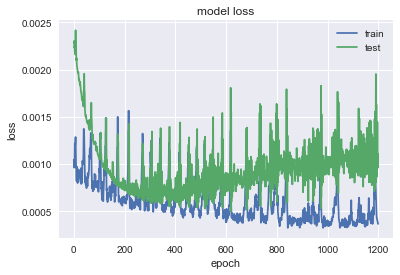

                BA
MSE        111.894
MAE        8.52344
R2        0.797961
MAPE (%)   2.27502


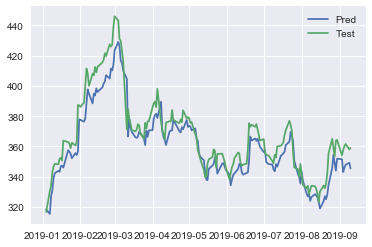

Predicting for  IBM
Train on 1008 samples, validate on 172 samples
Epoch 1/1400
0s - loss: 0.3106 - val_loss: 0.0709
Epoch 2/1400
0s - loss: 0.1811 - val_loss: 0.0131
Epoch 3/1400
0s - loss: 0.0811 - val_loss: 0.0144
Epoch 4/1400
0s - loss: 0.0423 - val_loss: 0.0654
Epoch 5/1400
0s - loss: 0.0347 - val_loss: 0.0637
Epoch 6/1400
0s - loss: 0.0260 - val_loss: 0.0367
Epoch 7/1400
0s - loss: 0.0219 - val_loss: 0.0207
Epoch 8/1400
0s - loss: 0.0229 - val_loss: 0.0157
Epoch 9/1400
0s - loss: 0.0228 - val_loss: 0.0156
Epoch 10/1400
0s - loss: 0.0203 - val_loss: 0.0164
Epoch 11/1400
0s - loss: 0.0184 - val_loss: 0.0159
Epoch 12/1400
0s - loss: 0.0171 - val_loss: 0.0136
Epoch 13/1400
0s - loss: 0.0159 - val_loss: 0.0108
Epoch 14/1400
0s - loss: 0.0150 - val_loss: 0.0084
Epoch 15/1400
0s - loss: 0.0140 - val_loss: 0.0069
Epoch 16/1400
0s - loss: 0.0131 - val_loss: 0.0059
Epoch 17/1400
0s - loss: 0.0122 - val_loss: 0.0051
Epoch 18/1400
0s - loss: 0.0114 - val_loss: 0.0044
Epoch 19/1400
0s - loss:

0s - loss: 0.0020 - val_loss: 0.0080
Epoch 161/1400
0s - loss: 0.0020 - val_loss: 0.0079
Epoch 162/1400
0s - loss: 0.0020 - val_loss: 0.0075
Epoch 163/1400
0s - loss: 0.0021 - val_loss: 0.0075
Epoch 164/1400
0s - loss: 0.0020 - val_loss: 0.0079
Epoch 165/1400
0s - loss: 0.0020 - val_loss: 0.0075
Epoch 166/1400
0s - loss: 0.0021 - val_loss: 0.0081
Epoch 167/1400
0s - loss: 0.0020 - val_loss: 0.0073
Epoch 168/1400
0s - loss: 0.0019 - val_loss: 0.0072
Epoch 169/1400
0s - loss: 0.0019 - val_loss: 0.0070
Epoch 170/1400
0s - loss: 0.0020 - val_loss: 0.0076
Epoch 171/1400
0s - loss: 0.0020 - val_loss: 0.0069
Epoch 172/1400
0s - loss: 0.0021 - val_loss: 0.0075
Epoch 173/1400
0s - loss: 0.0018 - val_loss: 0.0069
Epoch 174/1400
0s - loss: 0.0020 - val_loss: 0.0072
Epoch 175/1400
0s - loss: 0.0019 - val_loss: 0.0066
Epoch 176/1400
0s - loss: 0.0020 - val_loss: 0.0062
Epoch 177/1400
0s - loss: 0.0020 - val_loss: 0.0071
Epoch 178/1400
0s - loss: 0.0020 - val_loss: 0.0063
Epoch 179/1400
0s - loss: 0

0s - loss: 0.0014 - val_loss: 0.0019
Epoch 320/1400
0s - loss: 0.0014 - val_loss: 0.0024
Epoch 321/1400
0s - loss: 0.0015 - val_loss: 0.0021
Epoch 322/1400
0s - loss: 0.0014 - val_loss: 0.0024
Epoch 323/1400
0s - loss: 0.0015 - val_loss: 0.0031
Epoch 324/1400
0s - loss: 0.0015 - val_loss: 0.0025
Epoch 325/1400
0s - loss: 0.0014 - val_loss: 0.0025
Epoch 326/1400
0s - loss: 0.0014 - val_loss: 0.0024
Epoch 327/1400
0s - loss: 0.0014 - val_loss: 0.0024
Epoch 328/1400
0s - loss: 0.0015 - val_loss: 0.0027
Epoch 329/1400
0s - loss: 0.0014 - val_loss: 0.0023
Epoch 330/1400
0s - loss: 0.0014 - val_loss: 0.0022
Epoch 331/1400
0s - loss: 0.0015 - val_loss: 0.0023
Epoch 332/1400
0s - loss: 0.0015 - val_loss: 0.0030
Epoch 333/1400
0s - loss: 0.0014 - val_loss: 0.0020
Epoch 334/1400
0s - loss: 0.0014 - val_loss: 0.0024
Epoch 335/1400
0s - loss: 0.0016 - val_loss: 0.0031
Epoch 336/1400
0s - loss: 0.0015 - val_loss: 0.0016
Epoch 337/1400
0s - loss: 0.0016 - val_loss: 0.0023
Epoch 338/1400
0s - loss: 0

0s - loss: 0.0013 - val_loss: 0.0012
Epoch 478/1400
0s - loss: 0.0013 - val_loss: 0.0023
Epoch 479/1400
0s - loss: 0.0014 - val_loss: 0.0015
Epoch 480/1400
0s - loss: 0.0014 - val_loss: 0.0010
Epoch 481/1400
0s - loss: 0.0015 - val_loss: 0.0023
Epoch 482/1400
0s - loss: 0.0013 - val_loss: 0.0018
Epoch 483/1400
0s - loss: 0.0013 - val_loss: 0.0012
Epoch 484/1400
0s - loss: 0.0014 - val_loss: 0.0018
Epoch 485/1400
0s - loss: 0.0013 - val_loss: 0.0019
Epoch 486/1400
0s - loss: 0.0012 - val_loss: 0.0013
Epoch 487/1400
0s - loss: 0.0013 - val_loss: 0.0018
Epoch 488/1400
0s - loss: 0.0013 - val_loss: 0.0018
Epoch 489/1400
0s - loss: 0.0013 - val_loss: 0.0013
Epoch 490/1400
0s - loss: 0.0013 - val_loss: 0.0018
Epoch 491/1400
0s - loss: 0.0012 - val_loss: 0.0019
Epoch 492/1400
0s - loss: 0.0012 - val_loss: 0.0016
Epoch 493/1400
0s - loss: 0.0012 - val_loss: 0.0014
Epoch 494/1400
0s - loss: 0.0013 - val_loss: 0.0017
Epoch 495/1400
0s - loss: 0.0013 - val_loss: 0.0014
Epoch 496/1400
0s - loss: 0

0s - loss: 0.0010 - val_loss: 0.0014
Epoch 636/1400
0s - loss: 0.0011 - val_loss: 0.0016
Epoch 637/1400
0s - loss: 0.0010 - val_loss: 0.0018
Epoch 638/1400
0s - loss: 0.0011 - val_loss: 0.0018
Epoch 639/1400
0s - loss: 0.0010 - val_loss: 0.0015
Epoch 640/1400
0s - loss: 0.0010 - val_loss: 0.0016
Epoch 641/1400
0s - loss: 0.0010 - val_loss: 0.0017
Epoch 642/1400
0s - loss: 0.0011 - val_loss: 0.0013
Epoch 643/1400
0s - loss: 0.0011 - val_loss: 0.0018
Epoch 644/1400
0s - loss: 0.0012 - val_loss: 0.0014
Epoch 645/1400
0s - loss: 0.0012 - val_loss: 0.0014
Epoch 646/1400
0s - loss: 0.0013 - val_loss: 0.0021
Epoch 647/1400
0s - loss: 0.0012 - val_loss: 0.0017
Epoch 648/1400
0s - loss: 0.0013 - val_loss: 0.0013
Epoch 649/1400
0s - loss: 0.0011 - val_loss: 0.0018
Epoch 650/1400
0s - loss: 0.0013 - val_loss: 0.0021
Epoch 651/1400
0s - loss: 0.0013 - val_loss: 9.6483e-04
Epoch 652/1400
0s - loss: 0.0011 - val_loss: 0.0014
Epoch 653/1400
0s - loss: 0.0011 - val_loss: 0.0023
Epoch 654/1400
0s - los

0s - loss: 8.7164e-04 - val_loss: 0.0015
Epoch 790/1400
0s - loss: 9.8586e-04 - val_loss: 0.0017
Epoch 791/1400
0s - loss: 9.3280e-04 - val_loss: 0.0014
Epoch 792/1400
0s - loss: 9.3773e-04 - val_loss: 0.0015
Epoch 793/1400
0s - loss: 9.4867e-04 - val_loss: 0.0013
Epoch 794/1400
0s - loss: 9.5165e-04 - val_loss: 0.0015
Epoch 795/1400
0s - loss: 8.9167e-04 - val_loss: 0.0016
Epoch 796/1400
0s - loss: 9.7405e-04 - val_loss: 0.0016
Epoch 797/1400
0s - loss: 9.2133e-04 - val_loss: 0.0016
Epoch 798/1400
0s - loss: 9.2353e-04 - val_loss: 0.0015
Epoch 799/1400
0s - loss: 9.1902e-04 - val_loss: 0.0016
Epoch 800/1400
0s - loss: 8.9115e-04 - val_loss: 0.0016
Epoch 801/1400
0s - loss: 9.7380e-04 - val_loss: 0.0016
Epoch 802/1400
0s - loss: 9.0595e-04 - val_loss: 0.0015
Epoch 803/1400
0s - loss: 9.1092e-04 - val_loss: 0.0015
Epoch 804/1400
0s - loss: 9.0855e-04 - val_loss: 0.0014
Epoch 805/1400
0s - loss: 9.8909e-04 - val_loss: 0.0016
Epoch 806/1400
0s - loss: 9.2875e-04 - val_loss: 0.0015
Epoch 8

0s - loss: 9.1919e-04 - val_loss: 0.0014
Epoch 939/1400
0s - loss: 9.4462e-04 - val_loss: 0.0017
Epoch 940/1400
0s - loss: 9.2990e-04 - val_loss: 0.0019
Epoch 941/1400
0s - loss: 9.2997e-04 - val_loss: 0.0012
Epoch 942/1400
0s - loss: 8.4440e-04 - val_loss: 0.0013
Epoch 943/1400
0s - loss: 0.0010 - val_loss: 0.0020
Epoch 944/1400
0s - loss: 9.9585e-04 - val_loss: 0.0016
Epoch 945/1400
0s - loss: 0.0012 - val_loss: 0.0011
Epoch 946/1400
0s - loss: 0.0010 - val_loss: 0.0021
Epoch 947/1400
0s - loss: 0.0010 - val_loss: 0.0022
Epoch 948/1400
0s - loss: 0.0010 - val_loss: 9.5953e-04
Epoch 949/1400
0s - loss: 8.6675e-04 - val_loss: 0.0019
Epoch 950/1400
0s - loss: 8.3024e-04 - val_loss: 0.0019
Epoch 951/1400
0s - loss: 8.4546e-04 - val_loss: 0.0017
Epoch 952/1400
0s - loss: 8.2823e-04 - val_loss: 0.0014
Epoch 953/1400
0s - loss: 8.9125e-04 - val_loss: 0.0018
Epoch 954/1400
0s - loss: 8.2896e-04 - val_loss: 0.0016
Epoch 955/1400
0s - loss: 8.8056e-04 - val_loss: 0.0016
Epoch 956/1400
0s - los

0s - loss: 8.0796e-04 - val_loss: 0.0017
Epoch 1085/1400
0s - loss: 7.9874e-04 - val_loss: 0.0013
Epoch 1086/1400
0s - loss: 8.4291e-04 - val_loss: 0.0018
Epoch 1087/1400
0s - loss: 8.7409e-04 - val_loss: 0.0017
Epoch 1088/1400
0s - loss: 9.3623e-04 - val_loss: 0.0013
Epoch 1089/1400
0s - loss: 8.2935e-04 - val_loss: 0.0016
Epoch 1090/1400
0s - loss: 9.2324e-04 - val_loss: 0.0020
Epoch 1091/1400
0s - loss: 9.8437e-04 - val_loss: 0.0010
Epoch 1092/1400
0s - loss: 8.7412e-04 - val_loss: 0.0014
Epoch 1093/1400
0s - loss: 8.2916e-04 - val_loss: 0.0022
Epoch 1094/1400
0s - loss: 7.6004e-04 - val_loss: 0.0014
Epoch 1095/1400
0s - loss: 7.9436e-04 - val_loss: 0.0015
Epoch 1096/1400
0s - loss: 8.3831e-04 - val_loss: 0.0016
Epoch 1097/1400
0s - loss: 7.9712e-04 - val_loss: 0.0015
Epoch 1098/1400
0s - loss: 8.1136e-04 - val_loss: 0.0017
Epoch 1099/1400
0s - loss: 8.3550e-04 - val_loss: 0.0015
Epoch 1100/1400
0s - loss: 8.3306e-04 - val_loss: 0.0017
Epoch 1101/1400
0s - loss: 7.7993e-04 - val_los

0s - loss: 7.9430e-04 - val_loss: 0.0013
Epoch 1229/1400
0s - loss: 9.1300e-04 - val_loss: 0.0019
Epoch 1230/1400
0s - loss: 8.5509e-04 - val_loss: 0.0013
Epoch 1231/1400
0s - loss: 8.6091e-04 - val_loss: 0.0012
Epoch 1232/1400
0s - loss: 9.0274e-04 - val_loss: 0.0022
Epoch 1233/1400
0s - loss: 8.3531e-04 - val_loss: 0.0015
Epoch 1234/1400
0s - loss: 9.4618e-04 - val_loss: 0.0012
Epoch 1235/1400
0s - loss: 8.7289e-04 - val_loss: 0.0021
Epoch 1236/1400
0s - loss: 8.5147e-04 - val_loss: 0.0017
Epoch 1237/1400
0s - loss: 8.0470e-04 - val_loss: 0.0013
Epoch 1238/1400
0s - loss: 8.3561e-04 - val_loss: 0.0018
Epoch 1239/1400
0s - loss: 8.2016e-04 - val_loss: 0.0018
Epoch 1240/1400
0s - loss: 7.7443e-04 - val_loss: 0.0013
Epoch 1241/1400
0s - loss: 7.4740e-04 - val_loss: 0.0016
Epoch 1242/1400
0s - loss: 7.3255e-04 - val_loss: 0.0017
Epoch 1243/1400
0s - loss: 7.7185e-04 - val_loss: 0.0014
Epoch 1244/1400
0s - loss: 7.2651e-04 - val_loss: 0.0015
Epoch 1245/1400
0s - loss: 7.8695e-04 - val_los

0s - loss: 7.1673e-04 - val_loss: 0.0015
Epoch 1373/1400
0s - loss: 7.7264e-04 - val_loss: 0.0016
Epoch 1374/1400
0s - loss: 7.2128e-04 - val_loss: 0.0019
Epoch 1375/1400
0s - loss: 7.2514e-04 - val_loss: 0.0015
Epoch 1376/1400
0s - loss: 7.6720e-04 - val_loss: 0.0017
Epoch 1377/1400
0s - loss: 7.4820e-04 - val_loss: 0.0017
Epoch 1378/1400
0s - loss: 7.2389e-04 - val_loss: 0.0016
Epoch 1379/1400
0s - loss: 7.2007e-04 - val_loss: 0.0013
Epoch 1380/1400
0s - loss: 7.4316e-04 - val_loss: 0.0018
Epoch 1381/1400
0s - loss: 6.7163e-04 - val_loss: 0.0017
Epoch 1382/1400
0s - loss: 7.2685e-04 - val_loss: 0.0016
Epoch 1383/1400
0s - loss: 7.3252e-04 - val_loss: 0.0015
Epoch 1384/1400
0s - loss: 7.5157e-04 - val_loss: 0.0019
Epoch 1385/1400
0s - loss: 7.3246e-04 - val_loss: 0.0015
Epoch 1386/1400
0s - loss: 6.9755e-04 - val_loss: 0.0014
Epoch 1387/1400
0s - loss: 7.7529e-04 - val_loss: 0.0019
Epoch 1388/1400
0s - loss: 6.8610e-04 - val_loss: 0.0016
Epoch 1389/1400
0s - loss: 7.2769e-04 - val_los

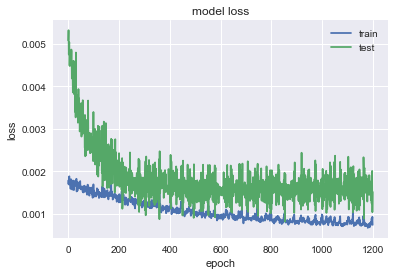

               IBM
MSE         8.3138
MAE        2.44877
R2        0.814213
MAPE (%)   1.78506


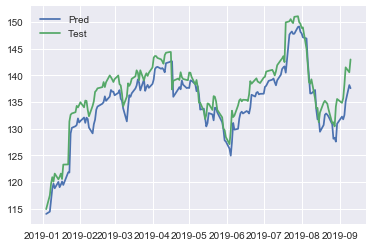

Predicting for  ALB
Train on 1008 samples, validate on 172 samples
Epoch 1/1400
0s - loss: 0.1898 - val_loss: 0.0503
Epoch 2/1400
0s - loss: 0.1117 - val_loss: 0.0143
Epoch 3/1400
0s - loss: 0.0573 - val_loss: 0.0099
Epoch 4/1400
0s - loss: 0.0403 - val_loss: 0.0334
Epoch 5/1400
0s - loss: 0.0468 - val_loss: 0.0473
Epoch 6/1400
0s - loss: 0.0484 - val_loss: 0.0411
Epoch 7/1400
0s - loss: 0.0445 - val_loss: 0.0325
Epoch 8/1400
0s - loss: 0.0407 - val_loss: 0.0301
Epoch 9/1400
0s - loss: 0.0373 - val_loss: 0.0331
Epoch 10/1400
0s - loss: 0.0347 - val_loss: 0.0392
Epoch 11/1400
0s - loss: 0.0324 - val_loss: 0.0454
Epoch 12/1400
0s - loss: 0.0313 - val_loss: 0.0497
Epoch 13/1400
0s - loss: 0.0292 - val_loss: 0.0522
Epoch 14/1400
0s - loss: 0.0283 - val_loss: 0.0537
Epoch 15/1400
0s - loss: 0.0259 - val_loss: 0.0557
Epoch 16/1400
0s - loss: 0.0245 - val_loss: 0.0579
Epoch 17/1400
0s - loss: 0.0234 - val_loss: 0.0596
Epoch 18/1400
0s - loss: 0.0218 - val_loss: 0.0613
Epoch 19/1400
0s - loss:

0s - loss: 0.0015 - val_loss: 0.0061
Epoch 161/1400
0s - loss: 0.0018 - val_loss: 0.0069
Epoch 162/1400
0s - loss: 0.0018 - val_loss: 0.0071
Epoch 163/1400
0s - loss: 0.0019 - val_loss: 0.0057
Epoch 164/1400
0s - loss: 0.0017 - val_loss: 0.0073
Epoch 165/1400
0s - loss: 0.0016 - val_loss: 0.0060
Epoch 166/1400
0s - loss: 0.0015 - val_loss: 0.0067
Epoch 167/1400
0s - loss: 0.0016 - val_loss: 0.0059
Epoch 168/1400
0s - loss: 0.0015 - val_loss: 0.0069
Epoch 169/1400
0s - loss: 0.0015 - val_loss: 0.0059
Epoch 170/1400
0s - loss: 0.0014 - val_loss: 0.0061
Epoch 171/1400
0s - loss: 0.0014 - val_loss: 0.0059
Epoch 172/1400
0s - loss: 0.0013 - val_loss: 0.0062
Epoch 173/1400
0s - loss: 0.0013 - val_loss: 0.0059
Epoch 174/1400
0s - loss: 0.0012 - val_loss: 0.0061
Epoch 175/1400
0s - loss: 0.0015 - val_loss: 0.0053
Epoch 176/1400
0s - loss: 0.0013 - val_loss: 0.0059
Epoch 177/1400
0s - loss: 0.0013 - val_loss: 0.0055
Epoch 178/1400
0s - loss: 0.0014 - val_loss: 0.0059
Epoch 179/1400
0s - loss: 0

0s - loss: 0.0018 - val_loss: 0.0022
Epoch 319/1400
0s - loss: 0.0018 - val_loss: 0.0016
Epoch 320/1400
0s - loss: 0.0022 - val_loss: 0.0016
Epoch 321/1400
0s - loss: 0.0018 - val_loss: 0.0020
Epoch 322/1400
0s - loss: 0.0017 - val_loss: 0.0015
Epoch 323/1400
0s - loss: 0.0015 - val_loss: 0.0018
Epoch 324/1400
0s - loss: 0.0015 - val_loss: 0.0014
Epoch 325/1400
0s - loss: 0.0013 - val_loss: 0.0021
Epoch 326/1400
0s - loss: 0.0012 - val_loss: 0.0012
Epoch 327/1400
0s - loss: 0.0011 - val_loss: 0.0020
Epoch 328/1400
0s - loss: 9.3911e-04 - val_loss: 0.0013
Epoch 329/1400
0s - loss: 9.0878e-04 - val_loss: 0.0016
Epoch 330/1400
0s - loss: 0.0011 - val_loss: 0.0016
Epoch 331/1400
0s - loss: 9.7549e-04 - val_loss: 0.0012
Epoch 332/1400
0s - loss: 9.7613e-04 - val_loss: 0.0015
Epoch 333/1400
0s - loss: 0.0010 - val_loss: 0.0015
Epoch 334/1400
0s - loss: 0.0010 - val_loss: 0.0015
Epoch 335/1400
0s - loss: 0.0010 - val_loss: 0.0013
Epoch 336/1400
0s - loss: 0.0010 - val_loss: 0.0014
Epoch 337/1

0s - loss: 7.7348e-04 - val_loss: 5.4110e-04
Epoch 467/1400
0s - loss: 7.9145e-04 - val_loss: 4.9934e-04
Epoch 468/1400
0s - loss: 8.7497e-04 - val_loss: 5.1296e-04
Epoch 469/1400
0s - loss: 7.6219e-04 - val_loss: 4.7638e-04
Epoch 470/1400
0s - loss: 8.5905e-04 - val_loss: 5.4820e-04
Epoch 471/1400
0s - loss: 7.9091e-04 - val_loss: 5.8656e-04
Epoch 472/1400
0s - loss: 8.4704e-04 - val_loss: 4.5650e-04
Epoch 473/1400
0s - loss: 7.7911e-04 - val_loss: 5.4003e-04
Epoch 474/1400
0s - loss: 7.3215e-04 - val_loss: 4.3119e-04
Epoch 475/1400
0s - loss: 7.8135e-04 - val_loss: 4.5938e-04
Epoch 476/1400
0s - loss: 8.0154e-04 - val_loss: 4.4546e-04
Epoch 477/1400
0s - loss: 7.5906e-04 - val_loss: 4.3903e-04
Epoch 478/1400
0s - loss: 8.0464e-04 - val_loss: 4.0636e-04
Epoch 479/1400
0s - loss: 8.2282e-04 - val_loss: 4.1530e-04
Epoch 480/1400
0s - loss: 8.0410e-04 - val_loss: 4.2377e-04
Epoch 481/1400
0s - loss: 7.9070e-04 - val_loss: 3.9276e-04
Epoch 482/1400
0s - loss: 7.9434e-04 - val_loss: 3.9210

0s - loss: 9.6297e-04 - val_loss: 3.0844e-04
Epoch 605/1400
0s - loss: 8.3674e-04 - val_loss: 4.5976e-04
Epoch 606/1400
0s - loss: 9.3541e-04 - val_loss: 4.9359e-04
Epoch 607/1400
0s - loss: 8.1819e-04 - val_loss: 3.3818e-04
Epoch 608/1400
0s - loss: 7.1175e-04 - val_loss: 3.5309e-04
Epoch 609/1400
0s - loss: 7.5166e-04 - val_loss: 3.8025e-04
Epoch 610/1400
0s - loss: 7.5262e-04 - val_loss: 2.9511e-04
Epoch 611/1400
0s - loss: 7.0938e-04 - val_loss: 3.0317e-04
Epoch 612/1400
0s - loss: 7.0507e-04 - val_loss: 2.9737e-04
Epoch 613/1400
0s - loss: 6.2467e-04 - val_loss: 3.1930e-04
Epoch 614/1400
0s - loss: 7.0632e-04 - val_loss: 2.9406e-04
Epoch 615/1400
0s - loss: 7.1407e-04 - val_loss: 3.5542e-04
Epoch 616/1400
0s - loss: 7.5462e-04 - val_loss: 4.1791e-04
Epoch 617/1400
0s - loss: 7.1546e-04 - val_loss: 3.2826e-04
Epoch 618/1400
0s - loss: 6.7930e-04 - val_loss: 3.5098e-04
Epoch 619/1400
0s - loss: 6.8842e-04 - val_loss: 2.9196e-04
Epoch 620/1400
0s - loss: 8.1126e-04 - val_loss: 3.1031

0s - loss: 7.8322e-04 - val_loss: 3.1342e-04
Epoch 743/1400
0s - loss: 8.8559e-04 - val_loss: 8.6849e-04
Epoch 744/1400
0s - loss: 9.9785e-04 - val_loss: 3.8237e-04
Epoch 745/1400
0s - loss: 6.8916e-04 - val_loss: 3.0628e-04
Epoch 746/1400
0s - loss: 6.9053e-04 - val_loss: 4.3662e-04
Epoch 747/1400
0s - loss: 7.0642e-04 - val_loss: 3.1567e-04
Epoch 748/1400
0s - loss: 6.3088e-04 - val_loss: 3.1366e-04
Epoch 749/1400
0s - loss: 6.3121e-04 - val_loss: 3.1063e-04
Epoch 750/1400
0s - loss: 6.1168e-04 - val_loss: 2.9433e-04
Epoch 751/1400
0s - loss: 6.3553e-04 - val_loss: 2.9600e-04
Epoch 752/1400
0s - loss: 5.9655e-04 - val_loss: 3.0047e-04
Epoch 753/1400
0s - loss: 7.1420e-04 - val_loss: 5.9678e-04
Epoch 754/1400
0s - loss: 7.7474e-04 - val_loss: 3.5497e-04
Epoch 755/1400
0s - loss: 6.0848e-04 - val_loss: 2.9082e-04
Epoch 756/1400
0s - loss: 6.2732e-04 - val_loss: 3.3282e-04
Epoch 757/1400
0s - loss: 6.0654e-04 - val_loss: 2.8710e-04
Epoch 758/1400
0s - loss: 7.0676e-04 - val_loss: 2.8346

0s - loss: 5.6000e-04 - val_loss: 3.0182e-04
Epoch 881/1400
0s - loss: 5.5343e-04 - val_loss: 2.8412e-04
Epoch 882/1400
0s - loss: 6.0068e-04 - val_loss: 4.7191e-04
Epoch 883/1400
0s - loss: 5.8462e-04 - val_loss: 2.9113e-04
Epoch 884/1400
0s - loss: 5.2883e-04 - val_loss: 2.8424e-04
Epoch 885/1400
0s - loss: 5.7487e-04 - val_loss: 3.4085e-04
Epoch 886/1400
0s - loss: 5.4401e-04 - val_loss: 2.8434e-04
Epoch 887/1400
0s - loss: 5.5960e-04 - val_loss: 3.0644e-04
Epoch 888/1400
0s - loss: 5.7808e-04 - val_loss: 4.8338e-04
Epoch 889/1400
0s - loss: 6.2317e-04 - val_loss: 2.9297e-04
Epoch 890/1400
0s - loss: 6.0900e-04 - val_loss: 3.9414e-04
Epoch 891/1400
0s - loss: 5.3353e-04 - val_loss: 3.4796e-04
Epoch 892/1400
0s - loss: 5.8494e-04 - val_loss: 2.8188e-04
Epoch 893/1400
0s - loss: 5.9493e-04 - val_loss: 3.2435e-04
Epoch 894/1400
0s - loss: 6.1514e-04 - val_loss: 6.1936e-04
Epoch 895/1400
0s - loss: 6.9931e-04 - val_loss: 3.6385e-04
Epoch 896/1400
0s - loss: 6.4856e-04 - val_loss: 2.8392

0s - loss: 5.0849e-04 - val_loss: 3.3614e-04
Epoch 1019/1400
0s - loss: 5.7104e-04 - val_loss: 2.9161e-04
Epoch 1020/1400
0s - loss: 5.4931e-04 - val_loss: 2.8148e-04
Epoch 1021/1400
0s - loss: 4.6824e-04 - val_loss: 3.3976e-04
Epoch 1022/1400
0s - loss: 5.2451e-04 - val_loss: 2.8889e-04
Epoch 1023/1400
0s - loss: 5.2507e-04 - val_loss: 2.8403e-04
Epoch 1024/1400
0s - loss: 4.7466e-04 - val_loss: 3.0657e-04
Epoch 1025/1400
0s - loss: 5.0839e-04 - val_loss: 2.8182e-04
Epoch 1026/1400
0s - loss: 4.8484e-04 - val_loss: 2.9898e-04
Epoch 1027/1400
0s - loss: 4.9998e-04 - val_loss: 2.8080e-04
Epoch 1028/1400
0s - loss: 4.8520e-04 - val_loss: 3.6084e-04
Epoch 1029/1400
0s - loss: 5.5575e-04 - val_loss: 3.5259e-04
Epoch 1030/1400
0s - loss: 5.5228e-04 - val_loss: 2.8010e-04
Epoch 1031/1400
0s - loss: 5.7249e-04 - val_loss: 4.7821e-04
Epoch 1032/1400
0s - loss: 5.6133e-04 - val_loss: 3.0310e-04
Epoch 1033/1400
0s - loss: 6.9522e-04 - val_loss: 4.2559e-04
Epoch 1034/1400
0s - loss: 7.8825e-04 - 

0s - loss: 4.7505e-04 - val_loss: 2.9033e-04
Epoch 1155/1400
0s - loss: 5.1341e-04 - val_loss: 3.1231e-04
Epoch 1156/1400
0s - loss: 5.1014e-04 - val_loss: 2.9195e-04
Epoch 1157/1400
0s - loss: 5.3153e-04 - val_loss: 4.2184e-04
Epoch 1158/1400
0s - loss: 4.7829e-04 - val_loss: 2.7977e-04
Epoch 1159/1400
0s - loss: 4.7282e-04 - val_loss: 2.9815e-04
Epoch 1160/1400
0s - loss: 4.9358e-04 - val_loss: 3.3184e-04
Epoch 1161/1400
0s - loss: 5.0238e-04 - val_loss: 2.7810e-04
Epoch 1162/1400
0s - loss: 5.3704e-04 - val_loss: 3.2058e-04
Epoch 1163/1400
0s - loss: 5.2661e-04 - val_loss: 3.5234e-04
Epoch 1164/1400
0s - loss: 5.3365e-04 - val_loss: 2.8826e-04
Epoch 1165/1400
0s - loss: 5.3751e-04 - val_loss: 5.0131e-04
Epoch 1166/1400
0s - loss: 5.3373e-04 - val_loss: 2.8352e-04
Epoch 1167/1400
0s - loss: 5.8519e-04 - val_loss: 3.7168e-04
Epoch 1168/1400
0s - loss: 5.8705e-04 - val_loss: 7.2737e-04
Epoch 1169/1400
0s - loss: 7.6656e-04 - val_loss: 3.1458e-04
Epoch 1170/1400
0s - loss: 6.4526e-04 - 

0s - loss: 7.0592e-04 - val_loss: 6.2142e-04
Epoch 1290/1400
0s - loss: 8.1941e-04 - val_loss: 4.9757e-04
Epoch 1291/1400
0s - loss: 7.2126e-04 - val_loss: 3.7605e-04
Epoch 1292/1400
0s - loss: 4.8300e-04 - val_loss: 2.8109e-04
Epoch 1293/1400
0s - loss: 4.8706e-04 - val_loss: 3.3392e-04
Epoch 1294/1400
0s - loss: 4.6919e-04 - val_loss: 2.8935e-04
Epoch 1295/1400
0s - loss: 5.0325e-04 - val_loss: 3.3132e-04
Epoch 1296/1400
0s - loss: 4.7786e-04 - val_loss: 2.7466e-04
Epoch 1297/1400
0s - loss: 4.6367e-04 - val_loss: 2.8459e-04
Epoch 1298/1400
0s - loss: 5.1187e-04 - val_loss: 2.8909e-04
Epoch 1299/1400
0s - loss: 4.7234e-04 - val_loss: 2.8835e-04
Epoch 1300/1400
0s - loss: 4.4502e-04 - val_loss: 2.8893e-04
Epoch 1301/1400
0s - loss: 4.9769e-04 - val_loss: 2.7581e-04
Epoch 1302/1400
0s - loss: 5.1467e-04 - val_loss: 3.2546e-04
Epoch 1303/1400
0s - loss: 5.1636e-04 - val_loss: 2.7544e-04
Epoch 1304/1400
0s - loss: 4.9768e-04 - val_loss: 2.8146e-04
Epoch 1305/1400
0s - loss: 5.0800e-04 - 

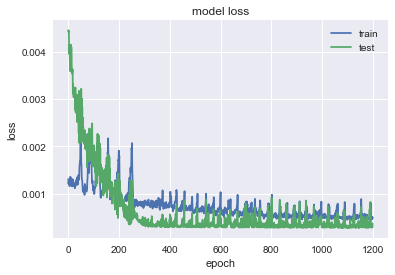

               ALB
MSE        3.82435
MAE        1.49289
R2        0.938073
MAPE (%)   1.99284


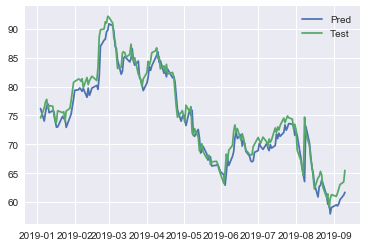

Predicting for  CBRE
Train on 1008 samples, validate on 172 samples
Epoch 1/1400
0s - loss: 0.1588 - val_loss: 0.4871
Epoch 2/1400
0s - loss: 0.0822 - val_loss: 0.3388
Epoch 3/1400
0s - loss: 0.0366 - val_loss: 0.2091
Epoch 4/1400
0s - loss: 0.0254 - val_loss: 0.1314
Epoch 5/1400
0s - loss: 0.0306 - val_loss: 0.1114
Epoch 6/1400
0s - loss: 0.0290 - val_loss: 0.1211
Epoch 7/1400
0s - loss: 0.0242 - val_loss: 0.1321
Epoch 8/1400
0s - loss: 0.0207 - val_loss: 0.1312
Epoch 9/1400
0s - loss: 0.0192 - val_loss: 0.1198
Epoch 10/1400
0s - loss: 0.0171 - val_loss: 0.1051
Epoch 11/1400
0s - loss: 0.0158 - val_loss: 0.0930
Epoch 12/1400
0s - loss: 0.0145 - val_loss: 0.0847
Epoch 13/1400
0s - loss: 0.0133 - val_loss: 0.0790
Epoch 14/1400
0s - loss: 0.0121 - val_loss: 0.0738
Epoch 15/1400
0s - loss: 0.0106 - val_loss: 0.0687
Epoch 16/1400
0s - loss: 0.0102 - val_loss: 0.0635
Epoch 17/1400
0s - loss: 0.0090 - val_loss: 0.0583
Epoch 18/1400
0s - loss: 0.0083 - val_loss: 0.0534
Epoch 19/1400
0s - loss

0s - loss: 0.0015 - val_loss: 0.0054
Epoch 161/1400
0s - loss: 0.0014 - val_loss: 0.0052
Epoch 162/1400
0s - loss: 0.0014 - val_loss: 0.0042
Epoch 163/1400
0s - loss: 0.0013 - val_loss: 0.0054
Epoch 164/1400
0s - loss: 0.0013 - val_loss: 0.0042
Epoch 165/1400
0s - loss: 0.0014 - val_loss: 0.0051
Epoch 166/1400
0s - loss: 0.0013 - val_loss: 0.0044
Epoch 167/1400
0s - loss: 0.0013 - val_loss: 0.0050
Epoch 168/1400
0s - loss: 0.0012 - val_loss: 0.0042
Epoch 169/1400
0s - loss: 0.0012 - val_loss: 0.0047
Epoch 170/1400
0s - loss: 0.0011 - val_loss: 0.0042
Epoch 171/1400
0s - loss: 0.0013 - val_loss: 0.0044
Epoch 172/1400
0s - loss: 0.0013 - val_loss: 0.0039
Epoch 173/1400
0s - loss: 0.0013 - val_loss: 0.0043
Epoch 174/1400
0s - loss: 0.0013 - val_loss: 0.0036
Epoch 175/1400
0s - loss: 0.0012 - val_loss: 0.0039
Epoch 176/1400
0s - loss: 0.0012 - val_loss: 0.0039
Epoch 177/1400
0s - loss: 0.0013 - val_loss: 0.0037
Epoch 178/1400
0s - loss: 0.0012 - val_loss: 0.0038
Epoch 179/1400
0s - loss: 0

0s - loss: 9.5153e-04 - val_loss: 0.0023
Epoch 317/1400
0s - loss: 0.0010 - val_loss: 0.0013
Epoch 318/1400
0s - loss: 0.0011 - val_loss: 0.0024
Epoch 319/1400
0s - loss: 0.0010 - val_loss: 0.0016
Epoch 320/1400
0s - loss: 0.0011 - val_loss: 0.0024
Epoch 321/1400
0s - loss: 9.1134e-04 - val_loss: 0.0015
Epoch 322/1400
0s - loss: 0.0010 - val_loss: 0.0023
Epoch 323/1400
0s - loss: 9.6461e-04 - val_loss: 0.0017
Epoch 324/1400
0s - loss: 9.1736e-04 - val_loss: 0.0024
Epoch 325/1400
0s - loss: 8.8197e-04 - val_loss: 0.0015
Epoch 326/1400
0s - loss: 8.5634e-04 - val_loss: 0.0020
Epoch 327/1400
0s - loss: 9.5495e-04 - val_loss: 0.0014
Epoch 328/1400
0s - loss: 8.3767e-04 - val_loss: 0.0021
Epoch 329/1400
0s - loss: 7.9202e-04 - val_loss: 0.0015
Epoch 330/1400
0s - loss: 8.7857e-04 - val_loss: 0.0020
Epoch 331/1400
0s - loss: 9.1550e-04 - val_loss: 0.0016
Epoch 332/1400
0s - loss: 8.5808e-04 - val_loss: 0.0021
Epoch 333/1400
0s - loss: 8.3740e-04 - val_loss: 0.0016
Epoch 334/1400
0s - loss: 8

0s - loss: 7.2787e-04 - val_loss: 0.0021
Epoch 465/1400
0s - loss: 7.6734e-04 - val_loss: 0.0014
Epoch 466/1400
0s - loss: 7.6365e-04 - val_loss: 0.0016
Epoch 467/1400
0s - loss: 7.1299e-04 - val_loss: 0.0017
Epoch 468/1400
0s - loss: 7.6382e-04 - val_loss: 0.0014
Epoch 469/1400
0s - loss: 7.7886e-04 - val_loss: 0.0022
Epoch 470/1400
0s - loss: 8.3207e-04 - val_loss: 0.0013
Epoch 471/1400
0s - loss: 7.4224e-04 - val_loss: 0.0016
Epoch 472/1400
0s - loss: 7.7760e-04 - val_loss: 0.0022
Epoch 473/1400
0s - loss: 8.3290e-04 - val_loss: 0.0012
Epoch 474/1400
0s - loss: 8.3959e-04 - val_loss: 0.0015
Epoch 475/1400
0s - loss: 7.8501e-04 - val_loss: 0.0022
Epoch 476/1400
0s - loss: 8.9476e-04 - val_loss: 0.0014
Epoch 477/1400
0s - loss: 7.7812e-04 - val_loss: 0.0015
Epoch 478/1400
0s - loss: 9.4782e-04 - val_loss: 0.0023
Epoch 479/1400
0s - loss: 9.5135e-04 - val_loss: 0.0014
Epoch 480/1400
0s - loss: 7.7702e-04 - val_loss: 0.0013
Epoch 481/1400
0s - loss: 9.5258e-04 - val_loss: 0.0020
Epoch 4

0s - loss: 7.3268e-04 - val_loss: 0.0011
Epoch 612/1400
0s - loss: 9.5816e-04 - val_loss: 0.0022
Epoch 613/1400
0s - loss: 8.6096e-04 - val_loss: 0.0010
Epoch 614/1400
0s - loss: 7.5258e-04 - val_loss: 0.0015
Epoch 615/1400
0s - loss: 7.3023e-04 - val_loss: 0.0021
Epoch 616/1400
0s - loss: 6.2599e-04 - val_loss: 0.0013
Epoch 617/1400
0s - loss: 6.4966e-04 - val_loss: 0.0015
Epoch 618/1400
0s - loss: 6.3698e-04 - val_loss: 0.0013
Epoch 619/1400
0s - loss: 6.3697e-04 - val_loss: 0.0016
Epoch 620/1400
0s - loss: 6.3187e-04 - val_loss: 0.0016
Epoch 621/1400
0s - loss: 6.0587e-04 - val_loss: 0.0012
Epoch 622/1400
0s - loss: 6.5390e-04 - val_loss: 0.0016
Epoch 623/1400
0s - loss: 6.1569e-04 - val_loss: 0.0014
Epoch 624/1400
0s - loss: 6.3012e-04 - val_loss: 0.0016
Epoch 625/1400
0s - loss: 5.8892e-04 - val_loss: 0.0014
Epoch 626/1400
0s - loss: 5.9463e-04 - val_loss: 0.0013
Epoch 627/1400
0s - loss: 6.5069e-04 - val_loss: 0.0012
Epoch 628/1400
0s - loss: 6.4630e-04 - val_loss: 0.0015
Epoch 6

0s - loss: 6.4742e-04 - val_loss: 0.0014
Epoch 760/1400
0s - loss: 6.6859e-04 - val_loss: 0.0012
Epoch 761/1400
0s - loss: 7.0320e-04 - val_loss: 0.0017
Epoch 762/1400
0s - loss: 6.5432e-04 - val_loss: 0.0014
Epoch 763/1400
0s - loss: 6.7104e-04 - val_loss: 0.0012
Epoch 764/1400
0s - loss: 8.3085e-04 - val_loss: 0.0022
Epoch 765/1400
0s - loss: 6.2432e-04 - val_loss: 0.0016
Epoch 766/1400
0s - loss: 7.9342e-04 - val_loss: 0.0011
Epoch 767/1400
0s - loss: 7.1917e-04 - val_loss: 0.0023
Epoch 768/1400
0s - loss: 6.2140e-04 - val_loss: 0.0016
Epoch 769/1400
0s - loss: 6.4337e-04 - val_loss: 0.0012
Epoch 770/1400
0s - loss: 6.2260e-04 - val_loss: 0.0019
Epoch 771/1400
0s - loss: 5.6973e-04 - val_loss: 0.0015
Epoch 772/1400
0s - loss: 6.0200e-04 - val_loss: 0.0014
Epoch 773/1400
0s - loss: 5.9535e-04 - val_loss: 0.0019
Epoch 774/1400
0s - loss: 5.6718e-04 - val_loss: 0.0016
Epoch 775/1400
0s - loss: 5.5631e-04 - val_loss: 0.0013
Epoch 776/1400
0s - loss: 5.7571e-04 - val_loss: 0.0020
Epoch 7

0s - loss: 5.3554e-04 - val_loss: 0.0015
Epoch 908/1400
0s - loss: 5.1040e-04 - val_loss: 0.0015
Epoch 909/1400
0s - loss: 5.4535e-04 - val_loss: 0.0015
Epoch 910/1400
0s - loss: 5.3428e-04 - val_loss: 0.0013
Epoch 911/1400
0s - loss: 5.6515e-04 - val_loss: 0.0016
Epoch 912/1400
0s - loss: 5.3425e-04 - val_loss: 0.0014
Epoch 913/1400
0s - loss: 4.9803e-04 - val_loss: 0.0016
Epoch 914/1400
0s - loss: 5.2735e-04 - val_loss: 0.0014
Epoch 915/1400
0s - loss: 5.1998e-04 - val_loss: 0.0017
Epoch 916/1400
0s - loss: 5.5320e-04 - val_loss: 0.0013
Epoch 917/1400
0s - loss: 5.4905e-04 - val_loss: 0.0017
Epoch 918/1400
0s - loss: 5.3182e-04 - val_loss: 0.0014
Epoch 919/1400
0s - loss: 5.2599e-04 - val_loss: 0.0017
Epoch 920/1400
0s - loss: 5.4787e-04 - val_loss: 0.0014
Epoch 921/1400
0s - loss: 5.3067e-04 - val_loss: 0.0018
Epoch 922/1400
0s - loss: 5.3341e-04 - val_loss: 0.0013
Epoch 923/1400
0s - loss: 5.1644e-04 - val_loss: 0.0015
Epoch 924/1400
0s - loss: 5.1722e-04 - val_loss: 0.0015
Epoch 9

0s - loss: 5.6542e-04 - val_loss: 0.0015
Epoch 1054/1400
0s - loss: 5.2693e-04 - val_loss: 0.0019
Epoch 1055/1400
0s - loss: 5.2204e-04 - val_loss: 0.0016
Epoch 1056/1400
0s - loss: 5.1356e-04 - val_loss: 0.0018
Epoch 1057/1400
0s - loss: 5.0359e-04 - val_loss: 0.0017
Epoch 1058/1400
0s - loss: 5.0558e-04 - val_loss: 0.0018
Epoch 1059/1400
0s - loss: 5.4000e-04 - val_loss: 0.0017
Epoch 1060/1400
0s - loss: 4.9193e-04 - val_loss: 0.0018
Epoch 1061/1400
0s - loss: 4.7579e-04 - val_loss: 0.0017
Epoch 1062/1400
0s - loss: 4.6654e-04 - val_loss: 0.0019
Epoch 1063/1400
0s - loss: 5.0696e-04 - val_loss: 0.0016
Epoch 1064/1400
0s - loss: 5.1044e-04 - val_loss: 0.0015
Epoch 1065/1400
0s - loss: 4.9551e-04 - val_loss: 0.0016
Epoch 1066/1400
0s - loss: 5.0786e-04 - val_loss: 0.0018
Epoch 1067/1400
0s - loss: 5.0771e-04 - val_loss: 0.0017
Epoch 1068/1400
0s - loss: 5.4087e-04 - val_loss: 0.0016
Epoch 1069/1400
0s - loss: 4.8881e-04 - val_loss: 0.0014
Epoch 1070/1400
0s - loss: 4.9575e-04 - val_los

0s - loss: 4.9705e-04 - val_loss: 0.0016
Epoch 1198/1400
0s - loss: 5.0052e-04 - val_loss: 0.0014
Epoch 1199/1400
0s - loss: 5.1807e-04 - val_loss: 0.0013
Epoch 1200/1400
0s - loss: 4.6454e-04 - val_loss: 0.0015
Epoch 1201/1400
0s - loss: 4.6259e-04 - val_loss: 0.0014
Epoch 1202/1400
0s - loss: 4.8262e-04 - val_loss: 0.0015
Epoch 1203/1400
0s - loss: 4.9053e-04 - val_loss: 0.0016
Epoch 1204/1400
0s - loss: 5.3208e-04 - val_loss: 0.0012
Epoch 1205/1400
0s - loss: 5.2803e-04 - val_loss: 0.0017
Epoch 1206/1400
0s - loss: 5.3753e-04 - val_loss: 0.0015
Epoch 1207/1400
0s - loss: 5.3664e-04 - val_loss: 0.0013
Epoch 1208/1400
0s - loss: 5.8063e-04 - val_loss: 0.0022
Epoch 1209/1400
0s - loss: 6.1095e-04 - val_loss: 0.0010
Epoch 1210/1400
0s - loss: 5.8343e-04 - val_loss: 0.0019
Epoch 1211/1400
0s - loss: 5.4794e-04 - val_loss: 0.0016
Epoch 1212/1400
0s - loss: 5.8289e-04 - val_loss: 0.0012
Epoch 1213/1400
0s - loss: 6.2927e-04 - val_loss: 0.0022
Epoch 1214/1400
0s - loss: 6.3475e-04 - val_los

0s - loss: 5.7835e-04 - val_loss: 0.0021
Epoch 1342/1400
0s - loss: 5.8416e-04 - val_loss: 0.0013
Epoch 1343/1400
0s - loss: 5.0981e-04 - val_loss: 0.0022
Epoch 1344/1400
0s - loss: 4.4249e-04 - val_loss: 0.0016
Epoch 1345/1400
0s - loss: 4.4871e-04 - val_loss: 0.0018
Epoch 1346/1400
0s - loss: 4.8466e-04 - val_loss: 0.0016
Epoch 1347/1400
0s - loss: 4.5757e-04 - val_loss: 0.0018
Epoch 1348/1400
0s - loss: 4.8908e-04 - val_loss: 0.0017
Epoch 1349/1400
0s - loss: 5.0823e-04 - val_loss: 0.0016
Epoch 1350/1400
0s - loss: 4.9653e-04 - val_loss: 0.0016
Epoch 1351/1400
0s - loss: 4.9231e-04 - val_loss: 0.0015
Epoch 1352/1400
0s - loss: 5.4064e-04 - val_loss: 0.0020
Epoch 1353/1400
0s - loss: 5.4315e-04 - val_loss: 0.0015
Epoch 1354/1400
0s - loss: 5.9127e-04 - val_loss: 0.0014
Epoch 1355/1400
0s - loss: 6.7712e-04 - val_loss: 0.0021
Epoch 1356/1400
0s - loss: 6.7535e-04 - val_loss: 0.0011
Epoch 1357/1400
0s - loss: 5.6150e-04 - val_loss: 0.0023
Epoch 1358/1400
0s - loss: 4.8798e-04 - val_los

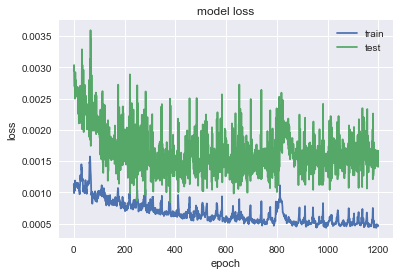

             CBRE
MSE       1.47953
MAE       1.03546
R2        0.82232
MAPE (%)  2.06305


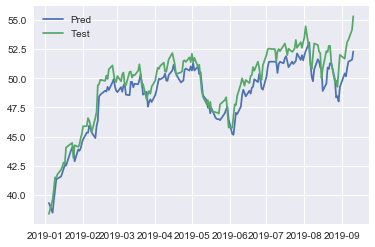

In [296]:
pred_multi_2 = pd.DataFrame(columns=df.columns,index = test.index)
for comp in companies:
    pred_multi[comp] = nn_forec_multi(df,comp,first_layer = 128,second_layer=64).values

In [297]:
pred_multi_128_64 = eval(pred_multi,test,companies=companies)
pred_multi_128_64

,T,BBY,KO,FTI,BLK,DVA,BA,IBM,ALB,CBRE
MSE,0.500237,3.26741,1.12323,0.555672,93.4697,1.85859,111.894,8.3138,3.82435,1.47953
MAE,0.587291,1.38843,0.856755,0.592699,8.01741,1.04557,8.52344,2.44877,1.49289,1.03546
R2,0.777695,0.899319,0.816145,0.70696,0.822514,0.839063,0.797961,0.814213,0.938073,0.82232
MAPE (%),1.79147,2.03273,1.6725,2.46673,1.80836,1.91043,2.27502,1.78506,1.99284,2.06305


In [298]:
pred_multi_128_64.astype(float).round(2).to_latex()

'\\begin{tabular}{lrrrrrrrrrr}\n\\toprule\n{} &     T &   BBY &    KO &   FTI &    BLK &   DVA &      BA &   IBM &   ALB &  CBRE \\\\\n\\midrule\nMSE      &  0.50 &  3.27 &  1.12 &  0.56 &  93.47 &  1.86 &  111.89 &  8.31 &  3.82 &  1.48 \\\\\nMAE      &  0.59 &  1.39 &  0.86 &  0.59 &   8.02 &  1.05 &    8.52 &  2.45 &  1.49 &  1.04 \\\\\nR2       &  0.78 &  0.90 &  0.82 &  0.71 &   0.82 &  0.84 &    0.80 &  0.81 &  0.94 &  0.82 \\\\\nMAPE (\\%) &  1.79 &  2.03 &  1.67 &  2.47 &   1.81 &  1.91 &    2.28 &  1.79 &  1.99 &  2.06 \\\\\n\\bottomrule\n\\end{tabular}\n'

In [315]:
def nn_forec_multi_GRU(df,company_,n_lags = 1,feature_range=(0, 1),n_train_time = 172,first_layer = 64,second_layer = 32):
    print("Predicting for ", company_)
    comp = df.copy()

    scaler_1 = MinMaxScaler(feature_range=feature_range)
    scaler = MinMaxScaler(feature_range=feature_range)
    comp[company_] = scaler_1.fit_transform(comp[company_])
    scal_2 = []
    for i in enumerate(list(map(lambda x:  x!= company_, companies))):
        if(i[1]):
            scal_2.append(i[0])
    
    comp.iloc[:,scal_2] = scaler.fit_transform(comp.iloc[:,scal_2])
    
    comp = pd.DataFrame(comp,columns=df.columns,index=df.index)
    for company in companies:
        for i in range(1,n_lags+1):
            comp.loc[:,company+"(t-"+str(i)+")"] = comp[company].shift(i)
    
    comp = comp.dropna()
    cols_to_del = []
    for c in companies:
        if c != company_:
            cols_to_del.append(c)
    comp = comp.drop(cols_to_del,axis = 1)
    values = comp.values

    n_train_time = 172
    train = values[:comp.shape[0] -n_train_time, :]
    test = values[comp.shape[0] - n_train_time :, :]
    train_X, train_y = train[:, 1:], train[:, 0]
    test_X, test_y = test[:, 1:], test[:, 0]
    train_X = train_X.reshape((train_X.shape[0], 1, train_X.shape[1]))
    test_X = test_X.reshape((test_X.shape[0], 1, test_X.shape[1]))

    model = Sequential()
    model.add(GRU(first_layer, input_shape=(train_X.shape[1], train_X.shape[2]),return_sequences=True))
    model.add(Dropout(0.1))
    model.add(GRU(second_layer))
    model.add(Dropout(0.1))
    model.add(Dense(1))
    model.compile(loss="mean_squared_error", optimizer='Adamax')



    # fit network
    history = model.fit(train_X, train_y, epochs=1000, batch_size=150, validation_data=(test_X, test_y), verbose=2, shuffle=False)

    # summarize history for loss
    plt.plot(history.history['loss'][200:])
    plt.plot(history.history['val_loss'][200:])
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'test'], loc='upper right')
    plt.show()
    
    # make a prediction
    yhat = model.predict(test_X)
    # invert scaling for forecast
    inv_yhat_sc = scaler_1.inverse_transform(yhat)
    # invert scaling for actual

    inv_y = scaler_1.inverse_transform(test_y)
    test = df["2019-01-04":].copy()
    train = df[:"2019-01-04"].copy()
    predictions = pd.DataFrame(inv_yhat_sc,columns=[company_],index = test.index)
    
    lstm_eval = eval(predictions,test,companies=[company_])
    print(lstm_eval)
    
    plt.plot(predictions[company_])
    plt.plot(test[company_])
    plt.legend(['Pred', 'Test'])
    plt.show()
    return predictions

Predicting for  T
Train on 1008 samples, validate on 172 samples
Epoch 1/1000
0s - loss: 0.2645 - val_loss: 0.0136
Epoch 2/1000
0s - loss: 0.1104 - val_loss: 0.0298
Epoch 3/1000
0s - loss: 0.0674 - val_loss: 0.0702
Epoch 4/1000
0s - loss: 0.0603 - val_loss: 0.0712
Epoch 5/1000
0s - loss: 0.0514 - val_loss: 0.0499
Epoch 6/1000
0s - loss: 0.0468 - val_loss: 0.0315
Epoch 7/1000
0s - loss: 0.0446 - val_loss: 0.0215
Epoch 8/1000
0s - loss: 0.0421 - val_loss: 0.0170
Epoch 9/1000
0s - loss: 0.0382 - val_loss: 0.0149
Epoch 10/1000
0s - loss: 0.0355 - val_loss: 0.0135
Epoch 11/1000
0s - loss: 0.0316 - val_loss: 0.0118
Epoch 12/1000
0s - loss: 0.0297 - val_loss: 0.0100
Epoch 13/1000
0s - loss: 0.0263 - val_loss: 0.0085
Epoch 14/1000
0s - loss: 0.0253 - val_loss: 0.0074
Epoch 15/1000
0s - loss: 0.0233 - val_loss: 0.0069
Epoch 16/1000
0s - loss: 0.0201 - val_loss: 0.0067
Epoch 17/1000
0s - loss: 0.0190 - val_loss: 0.0068
Epoch 18/1000
0s - loss: 0.0175 - val_loss: 0.0074
Epoch 19/1000
0s - loss: 0

0s - loss: 0.0030 - val_loss: 0.0078
Epoch 165/1000
0s - loss: 0.0033 - val_loss: 0.0082
Epoch 166/1000
0s - loss: 0.0032 - val_loss: 0.0081
Epoch 167/1000
0s - loss: 0.0030 - val_loss: 0.0075
Epoch 168/1000
0s - loss: 0.0030 - val_loss: 0.0078
Epoch 169/1000
0s - loss: 0.0030 - val_loss: 0.0093
Epoch 170/1000
0s - loss: 0.0029 - val_loss: 0.0079
Epoch 171/1000
0s - loss: 0.0030 - val_loss: 0.0074
Epoch 172/1000
0s - loss: 0.0030 - val_loss: 0.0075
Epoch 173/1000
0s - loss: 0.0031 - val_loss: 0.0077
Epoch 174/1000
0s - loss: 0.0030 - val_loss: 0.0067
Epoch 175/1000
0s - loss: 0.0034 - val_loss: 0.0072
Epoch 176/1000
0s - loss: 0.0033 - val_loss: 0.0076
Epoch 177/1000
0s - loss: 0.0032 - val_loss: 0.0079
Epoch 178/1000
0s - loss: 0.0029 - val_loss: 0.0071
Epoch 179/1000
0s - loss: 0.0029 - val_loss: 0.0077
Epoch 180/1000
0s - loss: 0.0030 - val_loss: 0.0076
Epoch 181/1000
0s - loss: 0.0028 - val_loss: 0.0073
Epoch 182/1000
0s - loss: 0.0029 - val_loss: 0.0080
Epoch 183/1000
0s - loss: 0

0s - loss: 0.0022 - val_loss: 0.0043
Epoch 323/1000
0s - loss: 0.0022 - val_loss: 0.0030
Epoch 324/1000
0s - loss: 0.0021 - val_loss: 0.0039
Epoch 325/1000
0s - loss: 0.0022 - val_loss: 0.0036
Epoch 326/1000
0s - loss: 0.0022 - val_loss: 0.0037
Epoch 327/1000
0s - loss: 0.0021 - val_loss: 0.0035
Epoch 328/1000
0s - loss: 0.0022 - val_loss: 0.0041
Epoch 329/1000
0s - loss: 0.0022 - val_loss: 0.0035
Epoch 330/1000
0s - loss: 0.0021 - val_loss: 0.0039
Epoch 331/1000
0s - loss: 0.0021 - val_loss: 0.0030
Epoch 332/1000
0s - loss: 0.0023 - val_loss: 0.0037
Epoch 333/1000
0s - loss: 0.0020 - val_loss: 0.0040
Epoch 334/1000
0s - loss: 0.0025 - val_loss: 0.0028
Epoch 335/1000
0s - loss: 0.0023 - val_loss: 0.0046
Epoch 336/1000
0s - loss: 0.0023 - val_loss: 0.0033
Epoch 337/1000
0s - loss: 0.0020 - val_loss: 0.0034
Epoch 338/1000
0s - loss: 0.0020 - val_loss: 0.0031
Epoch 339/1000
0s - loss: 0.0023 - val_loss: 0.0037
Epoch 340/1000
0s - loss: 0.0022 - val_loss: 0.0038
Epoch 341/1000
0s - loss: 0

0s - loss: 0.0017 - val_loss: 0.0025
Epoch 483/1000
0s - loss: 0.0017 - val_loss: 0.0024
Epoch 484/1000
0s - loss: 0.0018 - val_loss: 0.0038
Epoch 485/1000
0s - loss: 0.0019 - val_loss: 0.0018
Epoch 486/1000
0s - loss: 0.0016 - val_loss: 0.0031
Epoch 487/1000
0s - loss: 0.0016 - val_loss: 0.0025
Epoch 488/1000
0s - loss: 0.0016 - val_loss: 0.0025
Epoch 489/1000
0s - loss: 0.0017 - val_loss: 0.0027
Epoch 490/1000
0s - loss: 0.0016 - val_loss: 0.0027
Epoch 491/1000
0s - loss: 0.0017 - val_loss: 0.0026
Epoch 492/1000
0s - loss: 0.0016 - val_loss: 0.0028
Epoch 493/1000
0s - loss: 0.0017 - val_loss: 0.0022
Epoch 494/1000
0s - loss: 0.0015 - val_loss: 0.0030
Epoch 495/1000
0s - loss: 0.0017 - val_loss: 0.0031
Epoch 496/1000
0s - loss: 0.0017 - val_loss: 0.0021
Epoch 497/1000
0s - loss: 0.0017 - val_loss: 0.0026
Epoch 498/1000
0s - loss: 0.0017 - val_loss: 0.0034
Epoch 499/1000
0s - loss: 0.0017 - val_loss: 0.0016
Epoch 500/1000
0s - loss: 0.0015 - val_loss: 0.0034
Epoch 501/1000
94s - loss: 

0s - loss: 0.0013 - val_loss: 0.0020
Epoch 641/1000
0s - loss: 0.0011 - val_loss: 0.0022
Epoch 642/1000
0s - loss: 0.0012 - val_loss: 0.0019
Epoch 643/1000
0s - loss: 0.0012 - val_loss: 0.0021
Epoch 644/1000
0s - loss: 0.0013 - val_loss: 0.0021
Epoch 645/1000
0s - loss: 0.0013 - val_loss: 0.0020
Epoch 646/1000
0s - loss: 0.0012 - val_loss: 0.0021
Epoch 647/1000
0s - loss: 0.0012 - val_loss: 0.0021
Epoch 648/1000
0s - loss: 0.0012 - val_loss: 0.0021
Epoch 649/1000
0s - loss: 0.0013 - val_loss: 0.0021
Epoch 650/1000
0s - loss: 0.0014 - val_loss: 0.0016
Epoch 651/1000
0s - loss: 0.0016 - val_loss: 0.0029
Epoch 652/1000
0s - loss: 0.0014 - val_loss: 0.0023
Epoch 653/1000
0s - loss: 0.0017 - val_loss: 0.0012
Epoch 654/1000
0s - loss: 0.0014 - val_loss: 0.0029
Epoch 655/1000
0s - loss: 0.0013 - val_loss: 0.0024
Epoch 656/1000
0s - loss: 0.0013 - val_loss: 0.0024
Epoch 657/1000
0s - loss: 0.0013 - val_loss: 0.0018
Epoch 658/1000
0s - loss: 0.0013 - val_loss: 0.0019
Epoch 659/1000
0s - loss: 0

0s - loss: 0.0010 - val_loss: 0.0021
Epoch 802/1000
0s - loss: 0.0010 - val_loss: 0.0022
Epoch 803/1000
0s - loss: 0.0011 - val_loss: 0.0021
Epoch 804/1000
0s - loss: 0.0011 - val_loss: 0.0023
Epoch 805/1000
0s - loss: 0.0012 - val_loss: 0.0018
Epoch 806/1000
0s - loss: 0.0011 - val_loss: 0.0020
Epoch 807/1000
0s - loss: 0.0014 - val_loss: 0.0030
Epoch 808/1000
0s - loss: 0.0014 - val_loss: 0.0011
Epoch 809/1000
0s - loss: 0.0011 - val_loss: 0.0024
Epoch 810/1000
0s - loss: 0.0012 - val_loss: 0.0023
Epoch 811/1000
0s - loss: 0.0011 - val_loss: 0.0016
Epoch 812/1000
0s - loss: 0.0012 - val_loss: 0.0025
Epoch 813/1000
0s - loss: 0.0011 - val_loss: 0.0014
Epoch 814/1000
0s - loss: 0.0010 - val_loss: 0.0021
Epoch 815/1000
0s - loss: 0.0012 - val_loss: 0.0025
Epoch 816/1000
0s - loss: 0.0012 - val_loss: 0.0015
Epoch 817/1000
0s - loss: 0.0011 - val_loss: 0.0025
Epoch 818/1000
0s - loss: 0.0011 - val_loss: 0.0020
Epoch 819/1000
0s - loss: 0.0010 - val_loss: 0.0018
Epoch 820/1000
0s - loss: 0

0s - loss: 0.0010 - val_loss: 0.0021
Epoch 961/1000
0s - loss: 9.5254e-04 - val_loss: 0.0016
Epoch 962/1000
0s - loss: 0.0010 - val_loss: 0.0021
Epoch 963/1000
0s - loss: 9.4725e-04 - val_loss: 0.0017
Epoch 964/1000
0s - loss: 9.9346e-04 - val_loss: 0.0018
Epoch 965/1000
0s - loss: 9.8949e-04 - val_loss: 0.0021
Epoch 966/1000
0s - loss: 0.0010 - val_loss: 0.0017
Epoch 967/1000
0s - loss: 0.0011 - val_loss: 0.0019
Epoch 968/1000
0s - loss: 9.8696e-04 - val_loss: 0.0021
Epoch 969/1000
0s - loss: 9.7088e-04 - val_loss: 0.0018
Epoch 970/1000
0s - loss: 0.0010 - val_loss: 0.0018
Epoch 971/1000
0s - loss: 9.7361e-04 - val_loss: 0.0022
Epoch 972/1000
0s - loss: 9.5690e-04 - val_loss: 0.0017
Epoch 973/1000
0s - loss: 9.8964e-04 - val_loss: 0.0017
Epoch 974/1000
0s - loss: 9.6159e-04 - val_loss: 0.0021
Epoch 975/1000
0s - loss: 0.0010 - val_loss: 0.0018
Epoch 976/1000
0s - loss: 0.0011 - val_loss: 0.0015
Epoch 977/1000
0s - loss: 0.0011 - val_loss: 0.0026
Epoch 978/1000
0s - loss: 0.0011 - val_

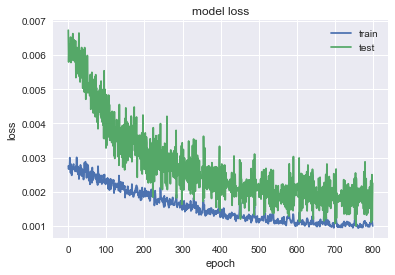

                 T
MSE        0.57669
MAE       0.637706
R2        0.735191
MAPE (%)   1.94421


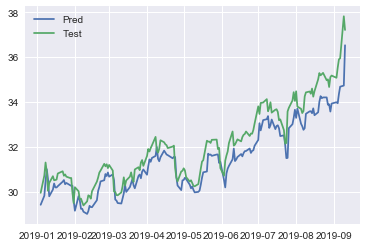

Predicting for  BBY
Train on 1008 samples, validate on 172 samples
Epoch 1/1000
0s - loss: 0.1206 - val_loss: 0.2427
Epoch 2/1000
0s - loss: 0.0528 - val_loss: 0.1247
Epoch 3/1000
0s - loss: 0.0416 - val_loss: 0.0647
Epoch 4/1000
0s - loss: 0.0438 - val_loss: 0.0414
Epoch 5/1000
0s - loss: 0.0416 - val_loss: 0.0353
Epoch 6/1000
0s - loss: 0.0353 - val_loss: 0.0344
Epoch 7/1000
0s - loss: 0.0287 - val_loss: 0.0315
Epoch 8/1000
0s - loss: 0.0221 - val_loss: 0.0254
Epoch 9/1000
0s - loss: 0.0188 - val_loss: 0.0181
Epoch 10/1000
0s - loss: 0.0148 - val_loss: 0.0118
Epoch 11/1000
0s - loss: 0.0123 - val_loss: 0.0077
Epoch 12/1000
0s - loss: 0.0106 - val_loss: 0.0054
Epoch 13/1000
0s - loss: 0.0095 - val_loss: 0.0043
Epoch 14/1000
0s - loss: 0.0086 - val_loss: 0.0039
Epoch 15/1000
0s - loss: 0.0079 - val_loss: 0.0038
Epoch 16/1000
0s - loss: 0.0068 - val_loss: 0.0040
Epoch 17/1000
0s - loss: 0.0072 - val_loss: 0.0042
Epoch 18/1000
0s - loss: 0.0070 - val_loss: 0.0045
Epoch 19/1000
0s - loss:

0s - loss: 0.0025 - val_loss: 0.0016
Epoch 162/1000
0s - loss: 0.0024 - val_loss: 0.0015
Epoch 163/1000
0s - loss: 0.0026 - val_loss: 0.0017
Epoch 164/1000
0s - loss: 0.0022 - val_loss: 0.0015
Epoch 165/1000
0s - loss: 0.0022 - val_loss: 0.0015
Epoch 166/1000
0s - loss: 0.0024 - val_loss: 0.0015
Epoch 167/1000
0s - loss: 0.0022 - val_loss: 0.0015
Epoch 168/1000
0s - loss: 0.0020 - val_loss: 0.0015
Epoch 169/1000
0s - loss: 0.0023 - val_loss: 0.0015
Epoch 170/1000
0s - loss: 0.0023 - val_loss: 0.0015
Epoch 171/1000
0s - loss: 0.0024 - val_loss: 0.0016
Epoch 172/1000
0s - loss: 0.0022 - val_loss: 0.0014
Epoch 173/1000
0s - loss: 0.0021 - val_loss: 0.0016
Epoch 174/1000
0s - loss: 0.0022 - val_loss: 0.0014
Epoch 175/1000
0s - loss: 0.0020 - val_loss: 0.0014
Epoch 176/1000
0s - loss: 0.0025 - val_loss: 0.0014
Epoch 177/1000
0s - loss: 0.0023 - val_loss: 0.0014
Epoch 178/1000
0s - loss: 0.0021 - val_loss: 0.0014
Epoch 179/1000
0s - loss: 0.0022 - val_loss: 0.0014
Epoch 180/1000
0s - loss: 0

0s - loss: 0.0021 - val_loss: 0.0014
Epoch 319/1000
0s - loss: 0.0025 - val_loss: 0.0015
Epoch 320/1000
0s - loss: 0.0023 - val_loss: 9.5221e-04
Epoch 321/1000
0s - loss: 0.0020 - val_loss: 0.0019
Epoch 322/1000
0s - loss: 0.0019 - val_loss: 8.6662e-04
Epoch 323/1000
0s - loss: 0.0018 - val_loss: 0.0017
Epoch 324/1000
0s - loss: 0.0018 - val_loss: 8.5385e-04
Epoch 325/1000
0s - loss: 0.0017 - val_loss: 0.0013
Epoch 326/1000
0s - loss: 0.0016 - val_loss: 9.2612e-04
Epoch 327/1000
0s - loss: 0.0017 - val_loss: 0.0012
Epoch 328/1000
0s - loss: 0.0016 - val_loss: 8.8821e-04
Epoch 329/1000
0s - loss: 0.0013 - val_loss: 0.0012
Epoch 330/1000
0s - loss: 0.0016 - val_loss: 9.8491e-04
Epoch 331/1000
0s - loss: 0.0017 - val_loss: 0.0011
Epoch 332/1000
0s - loss: 0.0015 - val_loss: 0.0012
Epoch 333/1000
0s - loss: 0.0016 - val_loss: 0.0010
Epoch 334/1000
0s - loss: 0.0014 - val_loss: 0.0011
Epoch 335/1000
0s - loss: 0.0014 - val_loss: 0.0011
Epoch 336/1000
0s - loss: 0.0016 - val_loss: 0.0010
Epo

0s - loss: 0.0014 - val_loss: 9.1186e-04
Epoch 477/1000
0s - loss: 0.0013 - val_loss: 0.0011
Epoch 478/1000
0s - loss: 0.0012 - val_loss: 0.0010
Epoch 479/1000
0s - loss: 0.0013 - val_loss: 9.8934e-04
Epoch 480/1000
0s - loss: 0.0012 - val_loss: 8.7468e-04
Epoch 481/1000
0s - loss: 0.0012 - val_loss: 0.0010
Epoch 482/1000
0s - loss: 0.0012 - val_loss: 9.8088e-04
Epoch 483/1000
0s - loss: 0.0012 - val_loss: 0.0013
Epoch 484/1000
0s - loss: 0.0012 - val_loss: 0.0011
Epoch 485/1000
0s - loss: 0.0012 - val_loss: 0.0012
Epoch 486/1000
0s - loss: 0.0012 - val_loss: 9.6549e-04
Epoch 487/1000
0s - loss: 0.0013 - val_loss: 0.0011
Epoch 488/1000
0s - loss: 0.0012 - val_loss: 0.0010
Epoch 489/1000
0s - loss: 0.0014 - val_loss: 9.0980e-04
Epoch 490/1000
0s - loss: 0.0013 - val_loss: 0.0011
Epoch 491/1000
0s - loss: 0.0013 - val_loss: 0.0010
Epoch 492/1000
0s - loss: 0.0012 - val_loss: 0.0012
Epoch 493/1000
0s - loss: 0.0012 - val_loss: 0.0012
Epoch 494/1000
0s - loss: 0.0013 - val_loss: 0.0011
Epo

0s - loss: 0.0010 - val_loss: 9.3171e-04
Epoch 629/1000
0s - loss: 0.0010 - val_loss: 8.3306e-04
Epoch 630/1000
0s - loss: 0.0010 - val_loss: 0.0011
Epoch 631/1000
0s - loss: 0.0011 - val_loss: 9.0325e-04
Epoch 632/1000
0s - loss: 0.0010 - val_loss: 0.0011
Epoch 633/1000
0s - loss: 0.0011 - val_loss: 9.4823e-04
Epoch 634/1000
0s - loss: 0.0011 - val_loss: 0.0010
Epoch 635/1000
0s - loss: 9.6913e-04 - val_loss: 0.0010
Epoch 636/1000
0s - loss: 0.0011 - val_loss: 9.9496e-04
Epoch 637/1000
0s - loss: 9.9611e-04 - val_loss: 9.5769e-04
Epoch 638/1000
0s - loss: 0.0011 - val_loss: 9.4220e-04
Epoch 639/1000
0s - loss: 0.0011 - val_loss: 9.1810e-04
Epoch 640/1000
0s - loss: 9.8355e-04 - val_loss: 0.0011
Epoch 641/1000
0s - loss: 0.0010 - val_loss: 0.0010
Epoch 642/1000
0s - loss: 0.0011 - val_loss: 9.3418e-04
Epoch 643/1000
0s - loss: 0.0012 - val_loss: 0.0010
Epoch 644/1000
0s - loss: 0.0011 - val_loss: 9.1273e-04
Epoch 645/1000
0s - loss: 0.0011 - val_loss: 0.0012
Epoch 646/1000
0s - loss: 0

0s - loss: 7.8925e-04 - val_loss: 9.0990e-04
Epoch 777/1000
0s - loss: 8.9854e-04 - val_loss: 0.0011
Epoch 778/1000
0s - loss: 9.6099e-04 - val_loss: 8.9804e-04
Epoch 779/1000
0s - loss: 0.0011 - val_loss: 9.8202e-04
Epoch 780/1000
0s - loss: 0.0010 - val_loss: 9.9884e-04
Epoch 781/1000
0s - loss: 0.0010 - val_loss: 0.0011
Epoch 782/1000
0s - loss: 9.7526e-04 - val_loss: 8.9433e-04
Epoch 783/1000
0s - loss: 8.7697e-04 - val_loss: 9.8410e-04
Epoch 784/1000
0s - loss: 8.8403e-04 - val_loss: 0.0010
Epoch 785/1000
0s - loss: 9.2751e-04 - val_loss: 0.0010
Epoch 786/1000
0s - loss: 8.8654e-04 - val_loss: 9.3881e-04
Epoch 787/1000
0s - loss: 9.3531e-04 - val_loss: 7.8440e-04
Epoch 788/1000
0s - loss: 9.0568e-04 - val_loss: 0.0011
Epoch 789/1000
0s - loss: 9.0728e-04 - val_loss: 8.7504e-04
Epoch 790/1000
0s - loss: 0.0011 - val_loss: 9.2257e-04
Epoch 791/1000
0s - loss: 9.6801e-04 - val_loss: 9.3010e-04
Epoch 792/1000
0s - loss: 8.8432e-04 - val_loss: 0.0011
Epoch 793/1000
0s - loss: 8.8598e-0

0s - loss: 0.0010 - val_loss: 0.0011
Epoch 919/1000
0s - loss: 9.4603e-04 - val_loss: 9.8798e-04
Epoch 920/1000
0s - loss: 9.8433e-04 - val_loss: 0.0011
Epoch 921/1000
0s - loss: 9.4262e-04 - val_loss: 9.4109e-04
Epoch 922/1000
0s - loss: 9.7508e-04 - val_loss: 9.6400e-04
Epoch 923/1000
0s - loss: 9.2070e-04 - val_loss: 9.1149e-04
Epoch 924/1000
0s - loss: 0.0010 - val_loss: 8.4343e-04
Epoch 925/1000
0s - loss: 9.9593e-04 - val_loss: 8.8710e-04
Epoch 926/1000
0s - loss: 9.8618e-04 - val_loss: 8.2024e-04
Epoch 927/1000
0s - loss: 9.8420e-04 - val_loss: 9.6140e-04
Epoch 928/1000
0s - loss: 9.2746e-04 - val_loss: 8.9220e-04
Epoch 929/1000
0s - loss: 9.0938e-04 - val_loss: 9.6462e-04
Epoch 930/1000
0s - loss: 9.0849e-04 - val_loss: 9.8675e-04
Epoch 931/1000
0s - loss: 8.7891e-04 - val_loss: 0.0011
Epoch 932/1000
0s - loss: 8.5094e-04 - val_loss: 9.0819e-04
Epoch 933/1000
0s - loss: 8.9303e-04 - val_loss: 0.0011
Epoch 934/1000
0s - loss: 8.5798e-04 - val_loss: 8.3464e-04
Epoch 935/1000
0s -

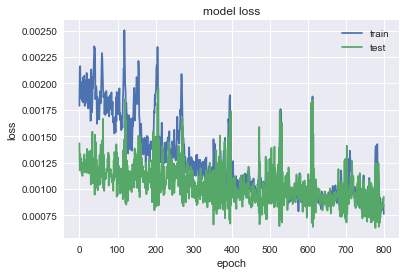

               BBY
MSE        3.08549
MAE        1.35564
R2        0.899135
MAPE (%)   1.97826


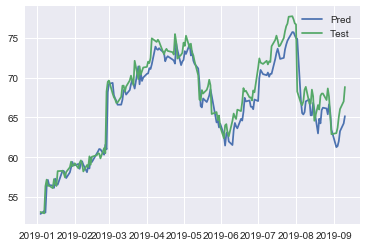

Predicting for  KO
Train on 1008 samples, validate on 172 samples
Epoch 1/1000
0s - loss: 0.0716 - val_loss: 0.2371
Epoch 2/1000
0s - loss: 0.0169 - val_loss: 0.1214
Epoch 3/1000
0s - loss: 0.0243 - val_loss: 0.1002
Epoch 4/1000
0s - loss: 0.0244 - val_loss: 0.1128
Epoch 5/1000
0s - loss: 0.0186 - val_loss: 0.1260
Epoch 6/1000
0s - loss: 0.0163 - val_loss: 0.1259
Epoch 7/1000
0s - loss: 0.0142 - val_loss: 0.1154
Epoch 8/1000
0s - loss: 0.0130 - val_loss: 0.1021
Epoch 9/1000
0s - loss: 0.0119 - val_loss: 0.0914
Epoch 10/1000
0s - loss: 0.0120 - val_loss: 0.0856
Epoch 11/1000
0s - loss: 0.0111 - val_loss: 0.0825
Epoch 12/1000
0s - loss: 0.0103 - val_loss: 0.0800
Epoch 13/1000
0s - loss: 0.0098 - val_loss: 0.0772
Epoch 14/1000
0s - loss: 0.0096 - val_loss: 0.0731
Epoch 15/1000
0s - loss: 0.0096 - val_loss: 0.0698
Epoch 16/1000
0s - loss: 0.0081 - val_loss: 0.0674
Epoch 17/1000
0s - loss: 0.0083 - val_loss: 0.0656
Epoch 18/1000
0s - loss: 0.0079 - val_loss: 0.0636
Epoch 19/1000
0s - loss: 

0s - loss: 0.0015 - val_loss: 0.0078
Epoch 164/1000
0s - loss: 0.0014 - val_loss: 0.0087
Epoch 165/1000
0s - loss: 0.0015 - val_loss: 0.0086
Epoch 166/1000
0s - loss: 0.0013 - val_loss: 0.0083
Epoch 167/1000
0s - loss: 0.0015 - val_loss: 0.0084
Epoch 168/1000
0s - loss: 0.0015 - val_loss: 0.0081
Epoch 169/1000
0s - loss: 0.0014 - val_loss: 0.0083
Epoch 170/1000
0s - loss: 0.0014 - val_loss: 0.0072
Epoch 171/1000
0s - loss: 0.0014 - val_loss: 0.0076
Epoch 172/1000
0s - loss: 0.0014 - val_loss: 0.0077
Epoch 173/1000
0s - loss: 0.0013 - val_loss: 0.0076
Epoch 174/1000
0s - loss: 0.0015 - val_loss: 0.0075
Epoch 175/1000
0s - loss: 0.0014 - val_loss: 0.0068
Epoch 176/1000
0s - loss: 0.0014 - val_loss: 0.0070
Epoch 177/1000
0s - loss: 0.0014 - val_loss: 0.0070
Epoch 178/1000
0s - loss: 0.0014 - val_loss: 0.0067
Epoch 179/1000
0s - loss: 0.0013 - val_loss: 0.0066
Epoch 180/1000
0s - loss: 0.0013 - val_loss: 0.0061
Epoch 181/1000
0s - loss: 0.0013 - val_loss: 0.0061
Epoch 182/1000
0s - loss: 0

0s - loss: 0.0010 - val_loss: 0.0023
Epoch 324/1000
0s - loss: 9.7726e-04 - val_loss: 0.0032
Epoch 325/1000
0s - loss: 0.0010 - val_loss: 0.0023
Epoch 326/1000
0s - loss: 9.5432e-04 - val_loss: 0.0031
Epoch 327/1000
0s - loss: 9.6141e-04 - val_loss: 0.0025
Epoch 328/1000
0s - loss: 9.1147e-04 - val_loss: 0.0029
Epoch 329/1000
0s - loss: 8.7703e-04 - val_loss: 0.0029
Epoch 330/1000
0s - loss: 9.4033e-04 - val_loss: 0.0028
Epoch 331/1000
0s - loss: 9.1073e-04 - val_loss: 0.0026
Epoch 332/1000
0s - loss: 9.0243e-04 - val_loss: 0.0026
Epoch 333/1000
0s - loss: 9.1441e-04 - val_loss: 0.0026
Epoch 334/1000
0s - loss: 8.1871e-04 - val_loss: 0.0029
Epoch 335/1000
0s - loss: 8.9552e-04 - val_loss: 0.0026
Epoch 336/1000
0s - loss: 9.8546e-04 - val_loss: 0.0027
Epoch 337/1000
0s - loss: 9.2735e-04 - val_loss: 0.0026
Epoch 338/1000
0s - loss: 9.3371e-04 - val_loss: 0.0022
Epoch 339/1000
0s - loss: 9.1377e-04 - val_loss: 0.0028
Epoch 340/1000
0s - loss: 9.5092e-04 - val_loss: 0.0019
Epoch 341/1000


0s - loss: 7.2050e-04 - val_loss: 0.0027
Epoch 472/1000
0s - loss: 7.6067e-04 - val_loss: 0.0028
Epoch 473/1000
0s - loss: 7.0514e-04 - val_loss: 0.0028
Epoch 474/1000
0s - loss: 7.6575e-04 - val_loss: 0.0030
Epoch 475/1000
0s - loss: 7.7424e-04 - val_loss: 0.0027
Epoch 476/1000
0s - loss: 7.9809e-04 - val_loss: 0.0027
Epoch 477/1000
0s - loss: 6.9405e-04 - val_loss: 0.0024
Epoch 478/1000
0s - loss: 7.5039e-04 - val_loss: 0.0025
Epoch 479/1000
0s - loss: 7.4340e-04 - val_loss: 0.0023
Epoch 480/1000
0s - loss: 8.0608e-04 - val_loss: 0.0024
Epoch 481/1000
0s - loss: 9.5252e-04 - val_loss: 0.0025
Epoch 482/1000
0s - loss: 9.4178e-04 - val_loss: 0.0026
Epoch 483/1000
0s - loss: 8.9237e-04 - val_loss: 0.0036
Epoch 484/1000
0s - loss: 7.0495e-04 - val_loss: 0.0027
Epoch 485/1000
0s - loss: 7.5120e-04 - val_loss: 0.0027
Epoch 486/1000
0s - loss: 7.2104e-04 - val_loss: 0.0026
Epoch 487/1000
0s - loss: 7.5436e-04 - val_loss: 0.0029
Epoch 488/1000
0s - loss: 7.2512e-04 - val_loss: 0.0027
Epoch 4

0s - loss: 6.4217e-04 - val_loss: 0.0026
Epoch 620/1000
0s - loss: 6.4159e-04 - val_loss: 0.0026
Epoch 621/1000
0s - loss: 6.9204e-04 - val_loss: 0.0030
Epoch 622/1000
0s - loss: 7.1546e-04 - val_loss: 0.0026
Epoch 623/1000
0s - loss: 7.0247e-04 - val_loss: 0.0025
Epoch 624/1000
0s - loss: 7.7333e-04 - val_loss: 0.0032
Epoch 625/1000
0s - loss: 7.5402e-04 - val_loss: 0.0027
Epoch 626/1000
0s - loss: 7.0012e-04 - val_loss: 0.0032
Epoch 627/1000
0s - loss: 7.3517e-04 - val_loss: 0.0034
Epoch 628/1000
0s - loss: 6.8613e-04 - val_loss: 0.0026
Epoch 629/1000
0s - loss: 6.5879e-04 - val_loss: 0.0032
Epoch 630/1000
0s - loss: 6.4234e-04 - val_loss: 0.0027
Epoch 631/1000
0s - loss: 6.2994e-04 - val_loss: 0.0024
Epoch 632/1000
0s - loss: 6.1787e-04 - val_loss: 0.0026
Epoch 633/1000
0s - loss: 6.5856e-04 - val_loss: 0.0027
Epoch 634/1000
0s - loss: 5.9690e-04 - val_loss: 0.0026
Epoch 635/1000
0s - loss: 6.5847e-04 - val_loss: 0.0031
Epoch 636/1000
0s - loss: 6.4374e-04 - val_loss: 0.0029
Epoch 6

0s - loss: 5.4126e-04 - val_loss: 0.0027
Epoch 768/1000
0s - loss: 6.2408e-04 - val_loss: 0.0029
Epoch 769/1000
0s - loss: 5.7305e-04 - val_loss: 0.0029
Epoch 770/1000
0s - loss: 6.1033e-04 - val_loss: 0.0032
Epoch 771/1000
0s - loss: 5.9669e-04 - val_loss: 0.0028
Epoch 772/1000
0s - loss: 6.3020e-04 - val_loss: 0.0030
Epoch 773/1000
0s - loss: 6.1084e-04 - val_loss: 0.0028
Epoch 774/1000
0s - loss: 6.4402e-04 - val_loss: 0.0029
Epoch 775/1000
0s - loss: 6.6326e-04 - val_loss: 0.0033
Epoch 776/1000
0s - loss: 6.6378e-04 - val_loss: 0.0030
Epoch 777/1000
0s - loss: 6.4974e-04 - val_loss: 0.0032
Epoch 778/1000
0s - loss: 6.7534e-04 - val_loss: 0.0031
Epoch 779/1000
0s - loss: 6.5920e-04 - val_loss: 0.0030
Epoch 780/1000
0s - loss: 7.1537e-04 - val_loss: 0.0034
Epoch 781/1000
0s - loss: 8.1140e-04 - val_loss: 0.0038
Epoch 782/1000
0s - loss: 6.2041e-04 - val_loss: 0.0026
Epoch 783/1000
0s - loss: 6.0716e-04 - val_loss: 0.0035
Epoch 784/1000
0s - loss: 6.2654e-04 - val_loss: 0.0040
Epoch 7

0s - loss: 5.6436e-04 - val_loss: 0.0032
Epoch 919/1000
0s - loss: 6.1909e-04 - val_loss: 0.0035
Epoch 920/1000
0s - loss: 6.1794e-04 - val_loss: 0.0034
Epoch 921/1000
0s - loss: 6.4915e-04 - val_loss: 0.0035
Epoch 922/1000
0s - loss: 6.3437e-04 - val_loss: 0.0037
Epoch 923/1000
0s - loss: 6.1542e-04 - val_loss: 0.0032
Epoch 924/1000
0s - loss: 6.8425e-04 - val_loss: 0.0031
Epoch 925/1000
0s - loss: 6.0325e-04 - val_loss: 0.0036
Epoch 926/1000
0s - loss: 6.0079e-04 - val_loss: 0.0029
Epoch 927/1000
0s - loss: 6.0261e-04 - val_loss: 0.0030
Epoch 928/1000
0s - loss: 5.9556e-04 - val_loss: 0.0035
Epoch 929/1000
0s - loss: 5.6639e-04 - val_loss: 0.0032
Epoch 930/1000
0s - loss: 5.5905e-04 - val_loss: 0.0035
Epoch 931/1000
0s - loss: 6.4697e-04 - val_loss: 0.0034
Epoch 932/1000
0s - loss: 5.9593e-04 - val_loss: 0.0031
Epoch 933/1000
0s - loss: 5.8616e-04 - val_loss: 0.0034
Epoch 934/1000
0s - loss: 5.8077e-04 - val_loss: 0.0033
Epoch 935/1000
0s - loss: 5.7983e-04 - val_loss: 0.0030
Epoch 9

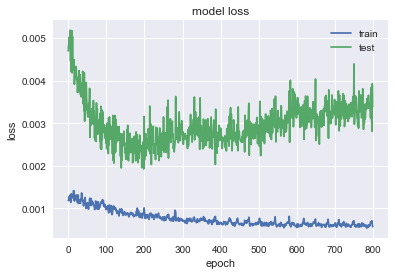

                KO
MSE        1.06673
MAE       0.833683
R2        0.826649
MAPE (%)   1.62795


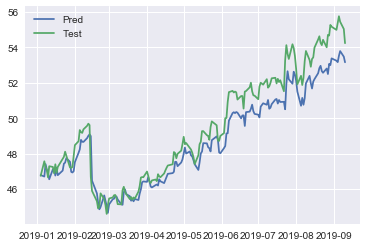

Predicting for  FTI
Train on 1008 samples, validate on 172 samples
Epoch 1/1000
0s - loss: 0.1438 - val_loss: 0.0024
Epoch 2/1000
0s - loss: 0.0579 - val_loss: 0.0361
Epoch 3/1000
0s - loss: 0.0372 - val_loss: 0.0691
Epoch 4/1000
0s - loss: 0.0322 - val_loss: 0.0648
Epoch 5/1000
0s - loss: 0.0266 - val_loss: 0.0440
Epoch 6/1000
0s - loss: 0.0226 - val_loss: 0.0288
Epoch 7/1000
0s - loss: 0.0223 - val_loss: 0.0221
Epoch 8/1000
0s - loss: 0.0213 - val_loss: 0.0204
Epoch 9/1000
0s - loss: 0.0195 - val_loss: 0.0201
Epoch 10/1000
0s - loss: 0.0181 - val_loss: 0.0194
Epoch 11/1000
0s - loss: 0.0172 - val_loss: 0.0175
Epoch 12/1000
0s - loss: 0.0158 - val_loss: 0.0151
Epoch 13/1000
0s - loss: 0.0146 - val_loss: 0.0127
Epoch 14/1000
0s - loss: 0.0135 - val_loss: 0.0112
Epoch 15/1000
0s - loss: 0.0133 - val_loss: 0.0102
Epoch 16/1000
0s - loss: 0.0123 - val_loss: 0.0095
Epoch 17/1000
0s - loss: 0.0116 - val_loss: 0.0086
Epoch 18/1000
0s - loss: 0.0107 - val_loss: 0.0079
Epoch 19/1000
0s - loss:

0s - loss: 0.0020 - val_loss: 8.2646e-04
Epoch 161/1000
0s - loss: 0.0021 - val_loss: 0.0010
Epoch 162/1000
0s - loss: 0.0020 - val_loss: 8.4178e-04
Epoch 163/1000
0s - loss: 0.0021 - val_loss: 9.2596e-04
Epoch 164/1000
0s - loss: 0.0019 - val_loss: 8.3829e-04
Epoch 165/1000
0s - loss: 0.0020 - val_loss: 8.8862e-04
Epoch 166/1000
0s - loss: 0.0020 - val_loss: 7.9559e-04
Epoch 167/1000
0s - loss: 0.0022 - val_loss: 9.2150e-04
Epoch 168/1000
0s - loss: 0.0020 - val_loss: 8.6708e-04
Epoch 169/1000
0s - loss: 0.0020 - val_loss: 0.0010
Epoch 170/1000
0s - loss: 0.0020 - val_loss: 9.2244e-04
Epoch 171/1000
0s - loss: 0.0022 - val_loss: 9.7037e-04
Epoch 172/1000
0s - loss: 0.0020 - val_loss: 9.9236e-04
Epoch 173/1000
0s - loss: 0.0021 - val_loss: 0.0010
Epoch 174/1000
0s - loss: 0.0021 - val_loss: 8.9967e-04
Epoch 175/1000
0s - loss: 0.0021 - val_loss: 0.0011
Epoch 176/1000
0s - loss: 0.0020 - val_loss: 8.8025e-04
Epoch 177/1000
0s - loss: 0.0019 - val_loss: 0.0011
Epoch 178/1000
0s - loss: 0

0s - loss: 0.0016 - val_loss: 8.5554e-04
Epoch 316/1000
0s - loss: 0.0015 - val_loss: 9.7050e-04
Epoch 317/1000
0s - loss: 0.0015 - val_loss: 0.0011
Epoch 318/1000
0s - loss: 0.0014 - val_loss: 8.5688e-04
Epoch 319/1000
0s - loss: 0.0015 - val_loss: 0.0012
Epoch 320/1000
0s - loss: 0.0014 - val_loss: 9.1880e-04
Epoch 321/1000
0s - loss: 0.0015 - val_loss: 9.5561e-04
Epoch 322/1000
0s - loss: 0.0014 - val_loss: 7.8136e-04
Epoch 323/1000
0s - loss: 0.0016 - val_loss: 0.0010
Epoch 324/1000
0s - loss: 0.0016 - val_loss: 7.9185e-04
Epoch 325/1000
0s - loss: 0.0017 - val_loss: 0.0012
Epoch 326/1000
0s - loss: 0.0016 - val_loss: 0.0012
Epoch 327/1000
0s - loss: 0.0018 - val_loss: 8.3283e-04
Epoch 328/1000
0s - loss: 0.0016 - val_loss: 7.7351e-04
Epoch 329/1000
0s - loss: 0.0017 - val_loss: 0.0012
Epoch 330/1000
0s - loss: 0.0016 - val_loss: 8.8054e-04
Epoch 331/1000
0s - loss: 0.0016 - val_loss: 8.4966e-04
Epoch 332/1000
0s - loss: 0.0016 - val_loss: 0.0012
Epoch 333/1000
0s - loss: 0.0015 - 

0s - loss: 0.0012 - val_loss: 0.0010
Epoch 471/1000
0s - loss: 0.0013 - val_loss: 8.9702e-04
Epoch 472/1000
0s - loss: 0.0014 - val_loss: 9.7354e-04
Epoch 473/1000
0s - loss: 0.0013 - val_loss: 7.5425e-04
Epoch 474/1000
0s - loss: 0.0012 - val_loss: 0.0011
Epoch 475/1000
0s - loss: 0.0013 - val_loss: 9.0300e-04
Epoch 476/1000
0s - loss: 0.0012 - val_loss: 7.8090e-04
Epoch 477/1000
0s - loss: 0.0012 - val_loss: 0.0011
Epoch 478/1000
0s - loss: 0.0013 - val_loss: 8.9717e-04
Epoch 479/1000
0s - loss: 0.0014 - val_loss: 9.4912e-04
Epoch 480/1000
0s - loss: 0.0013 - val_loss: 9.5943e-04
Epoch 481/1000
0s - loss: 0.0012 - val_loss: 9.6512e-04
Epoch 482/1000
0s - loss: 0.0013 - val_loss: 7.8497e-04
Epoch 483/1000
0s - loss: 0.0013 - val_loss: 9.3026e-04
Epoch 484/1000
0s - loss: 0.0013 - val_loss: 0.0011
Epoch 485/1000
0s - loss: 0.0013 - val_loss: 6.9701e-04
Epoch 486/1000
0s - loss: 0.0013 - val_loss: 7.7825e-04
Epoch 487/1000
0s - loss: 0.0014 - val_loss: 0.0012
Epoch 488/1000
0s - loss: 0

0s - loss: 9.7684e-04 - val_loss: 7.6608e-04
Epoch 621/1000
0s - loss: 0.0011 - val_loss: 9.2514e-04
Epoch 622/1000
0s - loss: 9.6943e-04 - val_loss: 9.0399e-04
Epoch 623/1000
0s - loss: 9.9630e-04 - val_loss: 7.7042e-04
Epoch 624/1000
0s - loss: 0.0011 - val_loss: 8.5528e-04
Epoch 625/1000
0s - loss: 0.0011 - val_loss: 8.9148e-04
Epoch 626/1000
0s - loss: 0.0010 - val_loss: 9.8267e-04
Epoch 627/1000
0s - loss: 0.0011 - val_loss: 8.5985e-04
Epoch 628/1000
0s - loss: 0.0011 - val_loss: 8.9675e-04
Epoch 629/1000
0s - loss: 0.0011 - val_loss: 8.7321e-04
Epoch 630/1000
0s - loss: 0.0010 - val_loss: 7.1920e-04
Epoch 631/1000
0s - loss: 0.0011 - val_loss: 0.0012
Epoch 632/1000
0s - loss: 9.8676e-04 - val_loss: 0.0010
Epoch 633/1000
0s - loss: 9.7889e-04 - val_loss: 8.0434e-04
Epoch 634/1000
0s - loss: 0.0010 - val_loss: 8.1063e-04
Epoch 635/1000
0s - loss: 9.3878e-04 - val_loss: 8.2761e-04
Epoch 636/1000
0s - loss: 9.9954e-04 - val_loss: 7.6835e-04
Epoch 637/1000
0s - loss: 9.6755e-04 - val_

0s - loss: 8.7369e-04 - val_loss: 6.0890e-04
Epoch 763/1000
0s - loss: 8.7441e-04 - val_loss: 7.7578e-04
Epoch 764/1000
0s - loss: 8.8327e-04 - val_loss: 6.2371e-04
Epoch 765/1000
0s - loss: 0.0010 - val_loss: 7.8983e-04
Epoch 766/1000
0s - loss: 9.9741e-04 - val_loss: 9.5176e-04
Epoch 767/1000
0s - loss: 0.0010 - val_loss: 7.4206e-04
Epoch 768/1000
0s - loss: 9.1941e-04 - val_loss: 8.2175e-04
Epoch 769/1000
0s - loss: 9.5195e-04 - val_loss: 8.9097e-04
Epoch 770/1000
0s - loss: 0.0011 - val_loss: 6.7590e-04
Epoch 771/1000
0s - loss: 8.6854e-04 - val_loss: 9.4251e-04
Epoch 772/1000
0s - loss: 9.3133e-04 - val_loss: 9.3960e-04
Epoch 773/1000
0s - loss: 8.9788e-04 - val_loss: 6.4933e-04
Epoch 774/1000
0s - loss: 8.7499e-04 - val_loss: 6.6041e-04
Epoch 775/1000
0s - loss: 9.5910e-04 - val_loss: 7.4372e-04
Epoch 776/1000
0s - loss: 8.7643e-04 - val_loss: 7.8827e-04
Epoch 777/1000
0s - loss: 8.8416e-04 - val_loss: 7.7528e-04
Epoch 778/1000
0s - loss: 8.9762e-04 - val_loss: 7.9674e-04
Epoch 7

0s - loss: 8.8670e-04 - val_loss: 6.4898e-04
Epoch 903/1000
0s - loss: 8.9144e-04 - val_loss: 7.6020e-04
Epoch 904/1000
0s - loss: 9.0662e-04 - val_loss: 6.9421e-04
Epoch 905/1000
0s - loss: 8.5395e-04 - val_loss: 7.9930e-04
Epoch 906/1000
0s - loss: 8.4803e-04 - val_loss: 5.7873e-04
Epoch 907/1000
0s - loss: 9.3646e-04 - val_loss: 7.4818e-04
Epoch 908/1000
0s - loss: 8.9580e-04 - val_loss: 6.7606e-04
Epoch 909/1000
0s - loss: 9.4188e-04 - val_loss: 6.6640e-04
Epoch 910/1000
0s - loss: 9.2840e-04 - val_loss: 6.6258e-04
Epoch 911/1000
0s - loss: 9.3394e-04 - val_loss: 8.5892e-04
Epoch 912/1000
0s - loss: 8.6973e-04 - val_loss: 5.5595e-04
Epoch 913/1000
0s - loss: 8.8910e-04 - val_loss: 6.7216e-04
Epoch 914/1000
0s - loss: 8.6017e-04 - val_loss: 8.2365e-04
Epoch 915/1000
0s - loss: 8.7659e-04 - val_loss: 7.1486e-04
Epoch 916/1000
0s - loss: 8.8834e-04 - val_loss: 6.7071e-04
Epoch 917/1000
0s - loss: 8.6116e-04 - val_loss: 6.7290e-04
Epoch 918/1000
0s - loss: 8.1201e-04 - val_loss: 7.4652

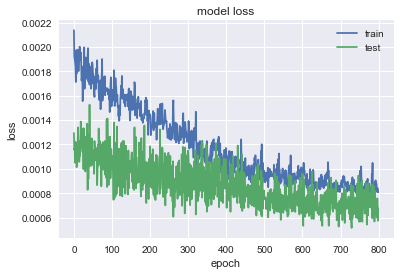

               FTI
MSE       0.545928
MAE       0.585468
R2        0.687155
MAPE (%)   2.42601


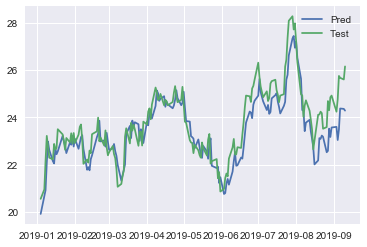

Predicting for  BLK
Train on 1008 samples, validate on 172 samples
Epoch 1/1000
0s - loss: 0.1253 - val_loss: 0.1052
Epoch 2/1000
0s - loss: 0.0548 - val_loss: 0.0419
Epoch 3/1000
0s - loss: 0.0360 - val_loss: 0.0144
Epoch 4/1000
0s - loss: 0.0339 - val_loss: 0.0062
Epoch 5/1000
0s - loss: 0.0337 - val_loss: 0.0045
Epoch 6/1000
0s - loss: 0.0302 - val_loss: 0.0041
Epoch 7/1000
0s - loss: 0.0279 - val_loss: 0.0039
Epoch 8/1000
0s - loss: 0.0241 - val_loss: 0.0035
Epoch 9/1000
0s - loss: 0.0205 - val_loss: 0.0031
Epoch 10/1000
0s - loss: 0.0189 - val_loss: 0.0032
Epoch 11/1000
0s - loss: 0.0162 - val_loss: 0.0037
Epoch 12/1000
0s - loss: 0.0149 - val_loss: 0.0047
Epoch 13/1000
0s - loss: 0.0143 - val_loss: 0.0057
Epoch 14/1000
0s - loss: 0.0126 - val_loss: 0.0069
Epoch 15/1000
0s - loss: 0.0114 - val_loss: 0.0081
Epoch 16/1000
0s - loss: 0.0109 - val_loss: 0.0093
Epoch 17/1000
0s - loss: 0.0101 - val_loss: 0.0104
Epoch 18/1000
0s - loss: 0.0092 - val_loss: 0.0115
Epoch 19/1000
0s - loss:

0s - loss: 0.0021 - val_loss: 0.0014
Epoch 161/1000
0s - loss: 0.0022 - val_loss: 0.0016
Epoch 162/1000
0s - loss: 0.0021 - val_loss: 0.0013
Epoch 163/1000
0s - loss: 0.0021 - val_loss: 0.0015
Epoch 164/1000
0s - loss: 0.0021 - val_loss: 0.0014
Epoch 165/1000
0s - loss: 0.0021 - val_loss: 0.0013
Epoch 166/1000
0s - loss: 0.0024 - val_loss: 0.0015
Epoch 167/1000
0s - loss: 0.0022 - val_loss: 0.0014
Epoch 168/1000
0s - loss: 0.0023 - val_loss: 0.0012
Epoch 169/1000
0s - loss: 0.0021 - val_loss: 0.0014
Epoch 170/1000
0s - loss: 0.0023 - val_loss: 0.0012
Epoch 171/1000
0s - loss: 0.0021 - val_loss: 0.0014
Epoch 172/1000
0s - loss: 0.0021 - val_loss: 0.0013
Epoch 173/1000
0s - loss: 0.0023 - val_loss: 0.0014
Epoch 174/1000
0s - loss: 0.0021 - val_loss: 0.0013
Epoch 175/1000
0s - loss: 0.0023 - val_loss: 0.0015
Epoch 176/1000
0s - loss: 0.0021 - val_loss: 0.0014
Epoch 177/1000
0s - loss: 0.0022 - val_loss: 0.0010
Epoch 178/1000
0s - loss: 0.0021 - val_loss: 0.0013
Epoch 179/1000
0s - loss: 0

0s - loss: 0.0017 - val_loss: 4.1603e-04
Epoch 311/1000
0s - loss: 0.0019 - val_loss: 4.6301e-04
Epoch 312/1000
0s - loss: 0.0019 - val_loss: 4.1819e-04
Epoch 313/1000
0s - loss: 0.0014 - val_loss: 4.6686e-04
Epoch 314/1000
0s - loss: 0.0014 - val_loss: 4.1817e-04
Epoch 315/1000
0s - loss: 0.0016 - val_loss: 4.4721e-04
Epoch 316/1000
0s - loss: 0.0015 - val_loss: 4.1759e-04
Epoch 317/1000
0s - loss: 0.0015 - val_loss: 4.2988e-04
Epoch 318/1000
0s - loss: 0.0013 - val_loss: 4.1472e-04
Epoch 319/1000
0s - loss: 0.0014 - val_loss: 4.6311e-04
Epoch 320/1000
0s - loss: 0.0014 - val_loss: 4.2097e-04
Epoch 321/1000
0s - loss: 0.0014 - val_loss: 4.3006e-04
Epoch 322/1000
0s - loss: 0.0014 - val_loss: 4.4281e-04
Epoch 323/1000
0s - loss: 0.0015 - val_loss: 4.4373e-04
Epoch 324/1000
0s - loss: 0.0014 - val_loss: 4.2199e-04
Epoch 325/1000
0s - loss: 0.0016 - val_loss: 4.2356e-04
Epoch 326/1000
0s - loss: 0.0015 - val_loss: 4.1995e-04
Epoch 327/1000
0s - loss: 0.0016 - val_loss: 4.3288e-04
Epoch 3

0s - loss: 0.0012 - val_loss: 4.6074e-04
Epoch 458/1000
0s - loss: 0.0011 - val_loss: 6.1758e-04
Epoch 459/1000
0s - loss: 0.0010 - val_loss: 6.2907e-04
Epoch 460/1000
0s - loss: 0.0011 - val_loss: 6.6752e-04
Epoch 461/1000
0s - loss: 0.0011 - val_loss: 5.1083e-04
Epoch 462/1000
0s - loss: 0.0012 - val_loss: 5.6919e-04
Epoch 463/1000
0s - loss: 0.0012 - val_loss: 5.1395e-04
Epoch 464/1000
0s - loss: 0.0012 - val_loss: 4.4028e-04
Epoch 465/1000
0s - loss: 0.0012 - val_loss: 5.9975e-04
Epoch 466/1000
0s - loss: 0.0011 - val_loss: 5.1092e-04
Epoch 467/1000
0s - loss: 0.0011 - val_loss: 5.8953e-04
Epoch 468/1000
0s - loss: 0.0012 - val_loss: 6.7431e-04
Epoch 469/1000
0s - loss: 0.0012 - val_loss: 4.7671e-04
Epoch 470/1000
0s - loss: 0.0012 - val_loss: 6.0850e-04
Epoch 471/1000
0s - loss: 0.0013 - val_loss: 5.4458e-04
Epoch 472/1000
0s - loss: 0.0012 - val_loss: 5.3748e-04
Epoch 473/1000
0s - loss: 0.0012 - val_loss: 6.1762e-04
Epoch 474/1000
0s - loss: 0.0010 - val_loss: 5.2220e-04
Epoch 4

0s - loss: 9.5919e-04 - val_loss: 6.6944e-04
Epoch 603/1000
0s - loss: 0.0010 - val_loss: 8.0502e-04
Epoch 604/1000
0s - loss: 0.0010 - val_loss: 5.7680e-04
Epoch 605/1000
0s - loss: 8.9877e-04 - val_loss: 9.9006e-04
Epoch 606/1000
0s - loss: 0.0011 - val_loss: 4.8813e-04
Epoch 607/1000
0s - loss: 9.9172e-04 - val_loss: 8.5783e-04
Epoch 608/1000
0s - loss: 8.9558e-04 - val_loss: 5.2304e-04
Epoch 609/1000
0s - loss: 8.4242e-04 - val_loss: 7.0291e-04
Epoch 610/1000
0s - loss: 0.0010 - val_loss: 5.6954e-04
Epoch 611/1000
0s - loss: 9.5712e-04 - val_loss: 7.2209e-04
Epoch 612/1000
0s - loss: 9.7965e-04 - val_loss: 6.1322e-04
Epoch 613/1000
0s - loss: 9.4570e-04 - val_loss: 7.0547e-04
Epoch 614/1000
0s - loss: 9.5351e-04 - val_loss: 7.0456e-04
Epoch 615/1000
0s - loss: 9.3931e-04 - val_loss: 6.3992e-04
Epoch 616/1000
0s - loss: 0.0010 - val_loss: 8.5696e-04
Epoch 617/1000
0s - loss: 0.0011 - val_loss: 4.7840e-04
Epoch 618/1000
0s - loss: 0.0011 - val_loss: 7.6664e-04
Epoch 619/1000
0s - los

0s - loss: 0.0013 - val_loss: 6.1797e-04
Epoch 743/1000
0s - loss: 0.0012 - val_loss: 0.0012
Epoch 744/1000
0s - loss: 0.0012 - val_loss: 5.2465e-04
Epoch 745/1000
0s - loss: 9.7093e-04 - val_loss: 0.0011
Epoch 746/1000
0s - loss: 8.9983e-04 - val_loss: 5.7077e-04
Epoch 747/1000
0s - loss: 8.3956e-04 - val_loss: 9.3808e-04
Epoch 748/1000
0s - loss: 8.7512e-04 - val_loss: 7.1515e-04
Epoch 749/1000
0s - loss: 9.3256e-04 - val_loss: 8.6278e-04
Epoch 750/1000
0s - loss: 9.0451e-04 - val_loss: 7.3841e-04
Epoch 751/1000
0s - loss: 8.7706e-04 - val_loss: 7.7854e-04
Epoch 752/1000
0s - loss: 8.8979e-04 - val_loss: 7.3719e-04
Epoch 753/1000
0s - loss: 8.7769e-04 - val_loss: 9.5027e-04
Epoch 754/1000
0s - loss: 8.7242e-04 - val_loss: 6.8558e-04
Epoch 755/1000
0s - loss: 7.9102e-04 - val_loss: 9.3158e-04
Epoch 756/1000
0s - loss: 8.2559e-04 - val_loss: 6.9771e-04
Epoch 757/1000
0s - loss: 8.3138e-04 - val_loss: 7.8406e-04
Epoch 758/1000
0s - loss: 7.8934e-04 - val_loss: 7.4072e-04
Epoch 759/1000


0s - loss: 8.4352e-04 - val_loss: 9.6791e-04
Epoch 883/1000
0s - loss: 9.6902e-04 - val_loss: 6.7696e-04
Epoch 884/1000
0s - loss: 0.0010 - val_loss: 8.6109e-04
Epoch 885/1000
0s - loss: 9.5671e-04 - val_loss: 5.7718e-04
Epoch 886/1000
0s - loss: 9.8683e-04 - val_loss: 9.5878e-04
Epoch 887/1000
0s - loss: 0.0012 - val_loss: 6.7180e-04
Epoch 888/1000
0s - loss: 0.0010 - val_loss: 9.7616e-04
Epoch 889/1000
0s - loss: 8.5716e-04 - val_loss: 6.6387e-04
Epoch 890/1000
0s - loss: 9.7232e-04 - val_loss: 8.2447e-04
Epoch 891/1000
0s - loss: 8.2995e-04 - val_loss: 7.8862e-04
Epoch 892/1000
0s - loss: 8.5589e-04 - val_loss: 8.4872e-04
Epoch 893/1000
0s - loss: 8.9279e-04 - val_loss: 6.5677e-04
Epoch 894/1000
0s - loss: 9.0319e-04 - val_loss: 8.9417e-04
Epoch 895/1000
0s - loss: 8.8233e-04 - val_loss: 8.4023e-04
Epoch 896/1000
0s - loss: 7.5553e-04 - val_loss: 9.1875e-04
Epoch 897/1000
0s - loss: 7.3221e-04 - val_loss: 8.1140e-04
Epoch 898/1000
0s - loss: 8.3374e-04 - val_loss: 7.6938e-04
Epoch 8

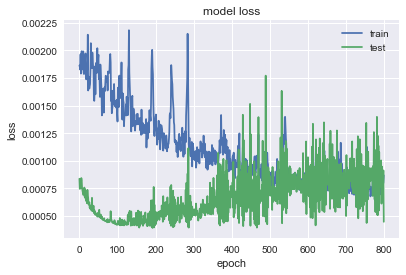

               BLK
MSE        41.9132
MAE        5.04079
R2        0.919252
MAPE (%)   1.13843


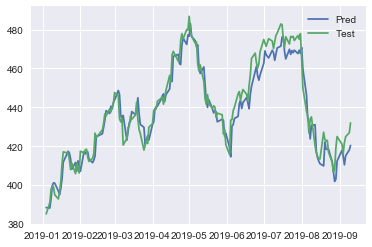

Predicting for  DVA
Train on 1008 samples, validate on 172 samples
Epoch 1/1000
0s - loss: 0.3592 - val_loss: 0.0145
Epoch 2/1000
0s - loss: 0.1622 - val_loss: 0.0169
Epoch 3/1000
0s - loss: 0.0770 - val_loss: 0.0784
Epoch 4/1000
0s - loss: 0.0554 - val_loss: 0.1314
Epoch 5/1000
0s - loss: 0.0504 - val_loss: 0.1254
Epoch 6/1000
0s - loss: 0.0413 - val_loss: 0.0936
Epoch 7/1000
0s - loss: 0.0356 - val_loss: 0.0694
Epoch 8/1000
0s - loss: 0.0357 - val_loss: 0.0583
Epoch 9/1000
0s - loss: 0.0333 - val_loss: 0.0552
Epoch 10/1000
0s - loss: 0.0324 - val_loss: 0.0555
Epoch 11/1000
0s - loss: 0.0312 - val_loss: 0.0565
Epoch 12/1000
0s - loss: 0.0302 - val_loss: 0.0568
Epoch 13/1000
0s - loss: 0.0282 - val_loss: 0.0543
Epoch 14/1000
0s - loss: 0.0266 - val_loss: 0.0502
Epoch 15/1000
0s - loss: 0.0268 - val_loss: 0.0470
Epoch 16/1000
0s - loss: 0.0243 - val_loss: 0.0449
Epoch 17/1000
0s - loss: 0.0242 - val_loss: 0.0437
Epoch 18/1000
0s - loss: 0.0233 - val_loss: 0.0432
Epoch 19/1000
0s - loss:

0s - loss: 0.0035 - val_loss: 0.0042
Epoch 161/1000
0s - loss: 0.0035 - val_loss: 0.0041
Epoch 162/1000
0s - loss: 0.0034 - val_loss: 0.0049
Epoch 163/1000
0s - loss: 0.0034 - val_loss: 0.0041
Epoch 164/1000
0s - loss: 0.0035 - val_loss: 0.0038
Epoch 165/1000
0s - loss: 0.0034 - val_loss: 0.0043
Epoch 166/1000
0s - loss: 0.0035 - val_loss: 0.0031
Epoch 167/1000
0s - loss: 0.0033 - val_loss: 0.0040
Epoch 168/1000
0s - loss: 0.0035 - val_loss: 0.0034
Epoch 169/1000
0s - loss: 0.0033 - val_loss: 0.0036
Epoch 170/1000
0s - loss: 0.0033 - val_loss: 0.0031
Epoch 171/1000
0s - loss: 0.0031 - val_loss: 0.0032
Epoch 172/1000
0s - loss: 0.0035 - val_loss: 0.0032
Epoch 173/1000
0s - loss: 0.0034 - val_loss: 0.0035
Epoch 174/1000
0s - loss: 0.0032 - val_loss: 0.0029
Epoch 175/1000
0s - loss: 0.0032 - val_loss: 0.0032
Epoch 176/1000
0s - loss: 0.0031 - val_loss: 0.0027
Epoch 177/1000
0s - loss: 0.0034 - val_loss: 0.0029
Epoch 178/1000
0s - loss: 0.0032 - val_loss: 0.0024
Epoch 179/1000
0s - loss: 0

0s - loss: 0.0023 - val_loss: 9.1815e-04
Epoch 311/1000
0s - loss: 0.0025 - val_loss: 9.0197e-04
Epoch 312/1000
0s - loss: 0.0025 - val_loss: 9.0519e-04
Epoch 313/1000
0s - loss: 0.0024 - val_loss: 9.0581e-04
Epoch 314/1000
0s - loss: 0.0023 - val_loss: 8.7879e-04
Epoch 315/1000
0s - loss: 0.0025 - val_loss: 9.0602e-04
Epoch 316/1000
0s - loss: 0.0023 - val_loss: 8.8460e-04
Epoch 317/1000
0s - loss: 0.0025 - val_loss: 9.5370e-04
Epoch 318/1000
0s - loss: 0.0025 - val_loss: 8.7600e-04
Epoch 319/1000
0s - loss: 0.0024 - val_loss: 9.2182e-04
Epoch 320/1000
0s - loss: 0.0025 - val_loss: 8.7557e-04
Epoch 321/1000
0s - loss: 0.0024 - val_loss: 8.9874e-04
Epoch 322/1000
0s - loss: 0.0025 - val_loss: 9.0933e-04
Epoch 323/1000
0s - loss: 0.0024 - val_loss: 8.9019e-04
Epoch 324/1000
0s - loss: 0.0026 - val_loss: 9.4541e-04
Epoch 325/1000
0s - loss: 0.0025 - val_loss: 8.7569e-04
Epoch 326/1000
0s - loss: 0.0024 - val_loss: 9.4764e-04
Epoch 327/1000
0s - loss: 0.0025 - val_loss: 8.6025e-04
Epoch 3

0s - loss: 0.0019 - val_loss: 0.0011
Epoch 462/1000
0s - loss: 0.0018 - val_loss: 9.9819e-04
Epoch 463/1000
0s - loss: 0.0018 - val_loss: 9.9118e-04
Epoch 464/1000
0s - loss: 0.0018 - val_loss: 9.8635e-04
Epoch 465/1000
0s - loss: 0.0019 - val_loss: 9.5849e-04
Epoch 466/1000
0s - loss: 0.0019 - val_loss: 9.0915e-04
Epoch 467/1000
0s - loss: 0.0019 - val_loss: 9.7064e-04
Epoch 468/1000
0s - loss: 0.0018 - val_loss: 9.9912e-04
Epoch 469/1000
0s - loss: 0.0019 - val_loss: 9.5839e-04
Epoch 470/1000
0s - loss: 0.0018 - val_loss: 8.9844e-04
Epoch 471/1000
0s - loss: 0.0019 - val_loss: 0.0010
Epoch 472/1000
0s - loss: 0.0019 - val_loss: 8.8207e-04
Epoch 473/1000
0s - loss: 0.0018 - val_loss: 8.8859e-04
Epoch 474/1000
0s - loss: 0.0020 - val_loss: 9.4244e-04
Epoch 475/1000
0s - loss: 0.0020 - val_loss: 0.0011
Epoch 476/1000
0s - loss: 0.0022 - val_loss: 8.5678e-04
Epoch 477/1000
0s - loss: 0.0023 - val_loss: 0.0012
Epoch 478/1000
0s - loss: 0.0020 - val_loss: 0.0010
Epoch 479/1000
0s - loss: 0

0s - loss: 0.0014 - val_loss: 0.0010
Epoch 614/1000
0s - loss: 0.0015 - val_loss: 9.0529e-04
Epoch 615/1000
0s - loss: 0.0013 - val_loss: 0.0011
Epoch 616/1000
0s - loss: 0.0014 - val_loss: 9.0965e-04
Epoch 617/1000
0s - loss: 0.0015 - val_loss: 9.5397e-04
Epoch 618/1000
0s - loss: 0.0015 - val_loss: 9.0900e-04
Epoch 619/1000
0s - loss: 0.0015 - val_loss: 8.9257e-04
Epoch 620/1000
0s - loss: 0.0014 - val_loss: 0.0010
Epoch 621/1000
0s - loss: 0.0014 - val_loss: 8.8931e-04
Epoch 622/1000
0s - loss: 0.0014 - val_loss: 9.5516e-04
Epoch 623/1000
0s - loss: 0.0014 - val_loss: 8.6782e-04
Epoch 624/1000
0s - loss: 0.0012 - val_loss: 8.9931e-04
Epoch 625/1000
0s - loss: 0.0014 - val_loss: 9.4579e-04
Epoch 626/1000
0s - loss: 0.0014 - val_loss: 8.6744e-04
Epoch 627/1000
0s - loss: 0.0014 - val_loss: 9.4382e-04
Epoch 628/1000
0s - loss: 0.0013 - val_loss: 8.6809e-04
Epoch 629/1000
0s - loss: 0.0014 - val_loss: 0.0011
Epoch 630/1000
0s - loss: 0.0014 - val_loss: 8.4787e-04
Epoch 631/1000
0s - los

0s - loss: 0.0011 - val_loss: 8.0138e-04
Epoch 762/1000
0s - loss: 0.0012 - val_loss: 8.4984e-04
Epoch 763/1000
0s - loss: 0.0012 - val_loss: 8.2579e-04
Epoch 764/1000
0s - loss: 0.0011 - val_loss: 8.0623e-04
Epoch 765/1000
0s - loss: 0.0012 - val_loss: 8.5540e-04
Epoch 766/1000
0s - loss: 0.0012 - val_loss: 8.4536e-04
Epoch 767/1000
0s - loss: 0.0011 - val_loss: 8.1683e-04
Epoch 768/1000
0s - loss: 0.0012 - val_loss: 8.5320e-04
Epoch 769/1000
0s - loss: 0.0013 - val_loss: 0.0011
Epoch 770/1000
0s - loss: 0.0015 - val_loss: 8.0618e-04
Epoch 771/1000
0s - loss: 0.0013 - val_loss: 9.1178e-04
Epoch 772/1000
0s - loss: 0.0011 - val_loss: 8.3377e-04
Epoch 773/1000
0s - loss: 0.0012 - val_loss: 8.1948e-04
Epoch 774/1000
0s - loss: 0.0011 - val_loss: 8.7795e-04
Epoch 775/1000
0s - loss: 0.0011 - val_loss: 8.3459e-04
Epoch 776/1000
0s - loss: 0.0012 - val_loss: 9.1226e-04
Epoch 777/1000
0s - loss: 0.0011 - val_loss: 8.1224e-04
Epoch 778/1000
0s - loss: 0.0011 - val_loss: 8.9449e-04
Epoch 779/1

0s - loss: 0.0010 - val_loss: 8.5161e-04
Epoch 911/1000
0s - loss: 9.9997e-04 - val_loss: 9.0521e-04
Epoch 912/1000
0s - loss: 0.0011 - val_loss: 8.8080e-04
Epoch 913/1000
0s - loss: 0.0011 - val_loss: 7.9671e-04
Epoch 914/1000
0s - loss: 0.0012 - val_loss: 8.8987e-04
Epoch 915/1000
0s - loss: 0.0012 - val_loss: 8.2211e-04
Epoch 916/1000
0s - loss: 0.0011 - val_loss: 7.9884e-04
Epoch 917/1000
0s - loss: 0.0012 - val_loss: 8.6541e-04
Epoch 918/1000
0s - loss: 0.0011 - val_loss: 8.1451e-04
Epoch 919/1000
0s - loss: 9.9365e-04 - val_loss: 8.1099e-04
Epoch 920/1000
0s - loss: 0.0010 - val_loss: 8.5404e-04
Epoch 921/1000
0s - loss: 0.0010 - val_loss: 8.4062e-04
Epoch 922/1000
0s - loss: 0.0011 - val_loss: 8.2894e-04
Epoch 923/1000
0s - loss: 9.9805e-04 - val_loss: 8.3254e-04
Epoch 924/1000
0s - loss: 0.0010 - val_loss: 8.0201e-04
Epoch 925/1000
0s - loss: 9.9942e-04 - val_loss: 8.2668e-04
Epoch 926/1000
0s - loss: 0.0010 - val_loss: 8.1095e-04
Epoch 927/1000
0s - loss: 0.0010 - val_loss: 8.

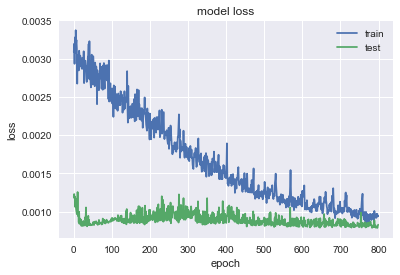

               DVA
MSE        1.43407
MAE       0.878684
R2         0.87299
MAPE (%)   1.62004


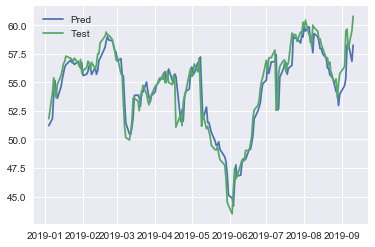

Predicting for  BA
Train on 1008 samples, validate on 172 samples
Epoch 1/1000
0s - loss: 0.0890 - val_loss: 0.3782
Epoch 2/1000
0s - loss: 0.0543 - val_loss: 0.2662
Epoch 3/1000
0s - loss: 0.0429 - val_loss: 0.1925
Epoch 4/1000
0s - loss: 0.0422 - val_loss: 0.1525
Epoch 5/1000
0s - loss: 0.0409 - val_loss: 0.1338
Epoch 6/1000
0s - loss: 0.0358 - val_loss: 0.1246
Epoch 7/1000
0s - loss: 0.0297 - val_loss: 0.1168
Epoch 8/1000
0s - loss: 0.0252 - val_loss: 0.1066
Epoch 9/1000
0s - loss: 0.0206 - val_loss: 0.0934
Epoch 10/1000
0s - loss: 0.0167 - val_loss: 0.0789
Epoch 11/1000
0s - loss: 0.0134 - val_loss: 0.0654
Epoch 12/1000
0s - loss: 0.0104 - val_loss: 0.0539
Epoch 13/1000
0s - loss: 0.0080 - val_loss: 0.0446
Epoch 14/1000
0s - loss: 0.0067 - val_loss: 0.0372
Epoch 15/1000
0s - loss: 0.0052 - val_loss: 0.0317
Epoch 16/1000
0s - loss: 0.0049 - val_loss: 0.0280
Epoch 17/1000
0s - loss: 0.0041 - val_loss: 0.0247
Epoch 18/1000
0s - loss: 0.0041 - val_loss: 0.0224
Epoch 19/1000
0s - loss: 

0s - loss: 0.0019 - val_loss: 0.0047
Epoch 161/1000
0s - loss: 0.0021 - val_loss: 0.0046
Epoch 162/1000
0s - loss: 0.0017 - val_loss: 0.0049
Epoch 163/1000
0s - loss: 0.0019 - val_loss: 0.0049
Epoch 164/1000
0s - loss: 0.0018 - val_loss: 0.0046
Epoch 165/1000
0s - loss: 0.0019 - val_loss: 0.0048
Epoch 166/1000
0s - loss: 0.0018 - val_loss: 0.0048
Epoch 167/1000
0s - loss: 0.0018 - val_loss: 0.0045
Epoch 168/1000
0s - loss: 0.0018 - val_loss: 0.0045
Epoch 169/1000
0s - loss: 0.0018 - val_loss: 0.0047
Epoch 170/1000
0s - loss: 0.0017 - val_loss: 0.0045
Epoch 171/1000
0s - loss: 0.0017 - val_loss: 0.0045
Epoch 172/1000
0s - loss: 0.0018 - val_loss: 0.0045
Epoch 173/1000
0s - loss: 0.0018 - val_loss: 0.0042
Epoch 174/1000
0s - loss: 0.0017 - val_loss: 0.0045
Epoch 175/1000
0s - loss: 0.0020 - val_loss: 0.0040
Epoch 176/1000
0s - loss: 0.0016 - val_loss: 0.0038
Epoch 177/1000
0s - loss: 0.0020 - val_loss: 0.0038
Epoch 178/1000
0s - loss: 0.0017 - val_loss: 0.0041
Epoch 179/1000
0s - loss: 0

0s - loss: 0.0015 - val_loss: 0.0014
Epoch 323/1000
0s - loss: 0.0015 - val_loss: 0.0010
Epoch 324/1000
0s - loss: 0.0014 - val_loss: 0.0018
Epoch 325/1000
0s - loss: 0.0012 - val_loss: 0.0011
Epoch 326/1000
0s - loss: 0.0012 - val_loss: 0.0015
Epoch 327/1000
0s - loss: 9.6463e-04 - val_loss: 0.0011
Epoch 328/1000
0s - loss: 0.0010 - val_loss: 0.0012
Epoch 329/1000
0s - loss: 0.0010 - val_loss: 0.0011
Epoch 330/1000
0s - loss: 0.0011 - val_loss: 0.0012
Epoch 331/1000
0s - loss: 0.0012 - val_loss: 0.0011
Epoch 332/1000
0s - loss: 0.0011 - val_loss: 0.0011
Epoch 333/1000
0s - loss: 0.0011 - val_loss: 0.0010
Epoch 334/1000
0s - loss: 0.0011 - val_loss: 0.0011
Epoch 335/1000
0s - loss: 0.0012 - val_loss: 0.0010
Epoch 336/1000
0s - loss: 0.0010 - val_loss: 0.0011
Epoch 337/1000
0s - loss: 0.0011 - val_loss: 0.0011
Epoch 338/1000
0s - loss: 0.0013 - val_loss: 9.4226e-04
Epoch 339/1000
0s - loss: 0.0011 - val_loss: 0.0012
Epoch 340/1000
0s - loss: 0.0011 - val_loss: 9.4419e-04
Epoch 341/1000


0s - loss: 0.0012 - val_loss: 0.0011
Epoch 472/1000
0s - loss: 0.0013 - val_loss: 7.4094e-04
Epoch 473/1000
0s - loss: 0.0011 - val_loss: 0.0016
Epoch 474/1000
0s - loss: 0.0010 - val_loss: 8.2768e-04
Epoch 475/1000
0s - loss: 0.0011 - val_loss: 0.0012
Epoch 476/1000
0s - loss: 0.0012 - val_loss: 6.9429e-04
Epoch 477/1000
0s - loss: 0.0011 - val_loss: 0.0011
Epoch 478/1000
0s - loss: 9.2523e-04 - val_loss: 7.2104e-04
Epoch 479/1000
0s - loss: 8.6391e-04 - val_loss: 0.0012
Epoch 480/1000
0s - loss: 0.0010 - val_loss: 6.9704e-04
Epoch 481/1000
0s - loss: 8.1669e-04 - val_loss: 9.8082e-04
Epoch 482/1000
0s - loss: 9.0487e-04 - val_loss: 8.4217e-04
Epoch 483/1000
0s - loss: 8.1651e-04 - val_loss: 0.0013
Epoch 484/1000
0s - loss: 8.1680e-04 - val_loss: 9.1031e-04
Epoch 485/1000
0s - loss: 7.9283e-04 - val_loss: 0.0010
Epoch 486/1000
0s - loss: 7.5720e-04 - val_loss: 9.3159e-04
Epoch 487/1000
0s - loss: 8.4494e-04 - val_loss: 8.3028e-04
Epoch 488/1000
0s - loss: 9.1981e-04 - val_loss: 9.5635

0s - loss: 7.1286e-04 - val_loss: 7.3285e-04
Epoch 616/1000
0s - loss: 6.3151e-04 - val_loss: 9.6489e-04
Epoch 617/1000
0s - loss: 7.1466e-04 - val_loss: 9.1602e-04
Epoch 618/1000
0s - loss: 6.8352e-04 - val_loss: 9.1357e-04
Epoch 619/1000
0s - loss: 7.1857e-04 - val_loss: 8.7320e-04
Epoch 620/1000
0s - loss: 6.6720e-04 - val_loss: 7.9621e-04
Epoch 621/1000
0s - loss: 6.2722e-04 - val_loss: 9.6406e-04
Epoch 622/1000
0s - loss: 7.6545e-04 - val_loss: 9.6779e-04
Epoch 623/1000
0s - loss: 6.6315e-04 - val_loss: 0.0011
Epoch 624/1000
0s - loss: 6.7411e-04 - val_loss: 8.9696e-04
Epoch 625/1000
0s - loss: 6.6470e-04 - val_loss: 9.4208e-04
Epoch 626/1000
0s - loss: 6.2881e-04 - val_loss: 8.7424e-04
Epoch 627/1000
0s - loss: 7.5114e-04 - val_loss: 9.1875e-04
Epoch 628/1000
0s - loss: 7.9681e-04 - val_loss: 0.0010
Epoch 629/1000
0s - loss: 8.0882e-04 - val_loss: 7.8556e-04
Epoch 630/1000
0s - loss: 6.7884e-04 - val_loss: 9.3304e-04
Epoch 631/1000
0s - loss: 6.8466e-04 - val_loss: 8.6226e-04
Epo

0s - loss: 9.6820e-04 - val_loss: 4.8594e-04
Epoch 755/1000
0s - loss: 8.0878e-04 - val_loss: 0.0010
Epoch 756/1000
0s - loss: 6.1909e-04 - val_loss: 5.8897e-04
Epoch 757/1000
0s - loss: 6.3209e-04 - val_loss: 7.2814e-04
Epoch 758/1000
0s - loss: 6.9115e-04 - val_loss: 9.2531e-04
Epoch 759/1000
0s - loss: 5.7472e-04 - val_loss: 7.0061e-04
Epoch 760/1000
0s - loss: 6.0922e-04 - val_loss: 9.5548e-04
Epoch 761/1000
0s - loss: 5.8099e-04 - val_loss: 8.0044e-04
Epoch 762/1000
0s - loss: 5.8172e-04 - val_loss: 8.3738e-04
Epoch 763/1000
0s - loss: 5.5652e-04 - val_loss: 0.0010
Epoch 764/1000
0s - loss: 6.1057e-04 - val_loss: 9.5508e-04
Epoch 765/1000
0s - loss: 6.2370e-04 - val_loss: 0.0010
Epoch 766/1000
0s - loss: 6.6736e-04 - val_loss: 0.0010
Epoch 767/1000
0s - loss: 6.3099e-04 - val_loss: 8.8506e-04
Epoch 768/1000
0s - loss: 5.7470e-04 - val_loss: 9.8562e-04
Epoch 769/1000
0s - loss: 6.3272e-04 - val_loss: 9.1641e-04
Epoch 770/1000
0s - loss: 5.9181e-04 - val_loss: 9.0268e-04
Epoch 771/1

0s - loss: 6.5999e-04 - val_loss: 7.3986e-04
Epoch 899/1000
0s - loss: 6.0937e-04 - val_loss: 0.0014
Epoch 900/1000
0s - loss: 5.3108e-04 - val_loss: 8.0970e-04
Epoch 901/1000
0s - loss: 6.0525e-04 - val_loss: 8.6179e-04
Epoch 902/1000
0s - loss: 5.8253e-04 - val_loss: 0.0011
Epoch 903/1000
0s - loss: 5.3567e-04 - val_loss: 8.7943e-04
Epoch 904/1000
0s - loss: 5.9420e-04 - val_loss: 9.4731e-04
Epoch 905/1000
0s - loss: 6.3846e-04 - val_loss: 8.9252e-04
Epoch 906/1000
0s - loss: 5.8394e-04 - val_loss: 0.0010
Epoch 907/1000
0s - loss: 5.8264e-04 - val_loss: 9.0499e-04
Epoch 908/1000
0s - loss: 6.7949e-04 - val_loss: 0.0012
Epoch 909/1000
0s - loss: 7.3410e-04 - val_loss: 7.2827e-04
Epoch 910/1000
0s - loss: 7.0653e-04 - val_loss: 0.0012
Epoch 911/1000
0s - loss: 6.1551e-04 - val_loss: 8.6455e-04
Epoch 912/1000
0s - loss: 6.2252e-04 - val_loss: 0.0010
Epoch 913/1000
0s - loss: 7.1744e-04 - val_loss: 0.0010
Epoch 914/1000
0s - loss: 7.8358e-04 - val_loss: 6.9307e-04
Epoch 915/1000
0s - los

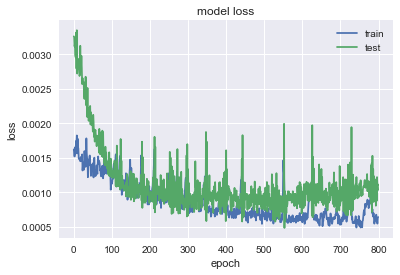

                BA
MSE        120.475
MAE        9.02046
R2        0.801127
MAPE (%)   2.42575


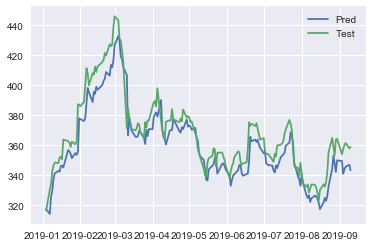

Predicting for  IBM
Train on 1008 samples, validate on 172 samples
Epoch 1/1000
0s - loss: 0.2210 - val_loss: 0.0173
Epoch 2/1000
0s - loss: 0.0595 - val_loss: 0.0145
Epoch 3/1000
0s - loss: 0.0313 - val_loss: 0.0403
Epoch 4/1000
0s - loss: 0.0284 - val_loss: 0.0297
Epoch 5/1000
0s - loss: 0.0214 - val_loss: 0.0132
Epoch 6/1000
0s - loss: 0.0193 - val_loss: 0.0064
Epoch 7/1000
0s - loss: 0.0189 - val_loss: 0.0048
Epoch 8/1000
0s - loss: 0.0189 - val_loss: 0.0046
Epoch 9/1000
0s - loss: 0.0180 - val_loss: 0.0047
Epoch 10/1000
0s - loss: 0.0162 - val_loss: 0.0045
Epoch 11/1000
0s - loss: 0.0149 - val_loss: 0.0039
Epoch 12/1000
0s - loss: 0.0147 - val_loss: 0.0036
Epoch 13/1000
0s - loss: 0.0137 - val_loss: 0.0035
Epoch 14/1000
0s - loss: 0.0129 - val_loss: 0.0037
Epoch 15/1000
0s - loss: 0.0129 - val_loss: 0.0039
Epoch 16/1000
0s - loss: 0.0127 - val_loss: 0.0043
Epoch 17/1000
0s - loss: 0.0119 - val_loss: 0.0047
Epoch 18/1000
0s - loss: 0.0120 - val_loss: 0.0052
Epoch 19/1000
0s - loss:

0s - loss: 0.0034 - val_loss: 0.0080
Epoch 162/1000
0s - loss: 0.0036 - val_loss: 0.0086
Epoch 163/1000
0s - loss: 0.0034 - val_loss: 0.0085
Epoch 164/1000
0s - loss: 0.0031 - val_loss: 0.0078
Epoch 165/1000
0s - loss: 0.0030 - val_loss: 0.0082
Epoch 166/1000
0s - loss: 0.0033 - val_loss: 0.0071
Epoch 167/1000
0s - loss: 0.0033 - val_loss: 0.0077
Epoch 168/1000
0s - loss: 0.0028 - val_loss: 0.0067
Epoch 169/1000
0s - loss: 0.0031 - val_loss: 0.0065
Epoch 170/1000
0s - loss: 0.0034 - val_loss: 0.0067
Epoch 171/1000
0s - loss: 0.0034 - val_loss: 0.0059
Epoch 172/1000
0s - loss: 0.0033 - val_loss: 0.0057
Epoch 173/1000
0s - loss: 0.0031 - val_loss: 0.0062
Epoch 174/1000
0s - loss: 0.0032 - val_loss: 0.0072
Epoch 175/1000
0s - loss: 0.0033 - val_loss: 0.0057
Epoch 176/1000
0s - loss: 0.0031 - val_loss: 0.0064
Epoch 177/1000
0s - loss: 0.0031 - val_loss: 0.0060
Epoch 178/1000
0s - loss: 0.0033 - val_loss: 0.0051
Epoch 179/1000
0s - loss: 0.0031 - val_loss: 0.0051
Epoch 180/1000
0s - loss: 0

0s - loss: 0.0021 - val_loss: 0.0013
Epoch 320/1000
0s - loss: 0.0021 - val_loss: 0.0017
Epoch 321/1000
0s - loss: 0.0022 - val_loss: 0.0015
Epoch 322/1000
0s - loss: 0.0023 - val_loss: 0.0012
Epoch 323/1000
0s - loss: 0.0021 - val_loss: 0.0019
Epoch 324/1000
0s - loss: 0.0021 - val_loss: 0.0013
Epoch 325/1000
0s - loss: 0.0022 - val_loss: 0.0016
Epoch 326/1000
0s - loss: 0.0021 - val_loss: 0.0014
Epoch 327/1000
0s - loss: 0.0022 - val_loss: 0.0016
Epoch 328/1000
0s - loss: 0.0022 - val_loss: 0.0013
Epoch 329/1000
0s - loss: 0.0023 - val_loss: 0.0013
Epoch 330/1000
0s - loss: 0.0021 - val_loss: 0.0019
Epoch 331/1000
0s - loss: 0.0021 - val_loss: 0.0016
Epoch 332/1000
0s - loss: 0.0022 - val_loss: 0.0015
Epoch 333/1000
0s - loss: 0.0021 - val_loss: 0.0015
Epoch 334/1000
0s - loss: 0.0021 - val_loss: 0.0014
Epoch 335/1000
0s - loss: 0.0021 - val_loss: 0.0013
Epoch 336/1000
0s - loss: 0.0021 - val_loss: 0.0016
Epoch 337/1000
0s - loss: 0.0022 - val_loss: 0.0014
Epoch 338/1000
0s - loss: 0

0s - loss: 0.0016 - val_loss: 0.0015
Epoch 478/1000
0s - loss: 0.0016 - val_loss: 0.0015
Epoch 479/1000
0s - loss: 0.0015 - val_loss: 0.0016
Epoch 480/1000
0s - loss: 0.0017 - val_loss: 0.0016
Epoch 481/1000
0s - loss: 0.0018 - val_loss: 0.0012
Epoch 482/1000
0s - loss: 0.0016 - val_loss: 0.0019
Epoch 483/1000
0s - loss: 0.0015 - val_loss: 0.0015
Epoch 484/1000
0s - loss: 0.0016 - val_loss: 0.0014
Epoch 485/1000
0s - loss: 0.0015 - val_loss: 0.0018
Epoch 486/1000
0s - loss: 0.0016 - val_loss: 0.0016
Epoch 487/1000
0s - loss: 0.0015 - val_loss: 0.0015
Epoch 488/1000
0s - loss: 0.0016 - val_loss: 0.0012
Epoch 489/1000
0s - loss: 0.0017 - val_loss: 0.0014
Epoch 490/1000
0s - loss: 0.0016 - val_loss: 0.0022
Epoch 491/1000
0s - loss: 0.0020 - val_loss: 0.0011
Epoch 492/1000
0s - loss: 0.0016 - val_loss: 0.0014
Epoch 493/1000
0s - loss: 0.0016 - val_loss: 0.0020
Epoch 494/1000
0s - loss: 0.0017 - val_loss: 0.0012
Epoch 495/1000
0s - loss: 0.0016 - val_loss: 0.0018
Epoch 496/1000
0s - loss: 0

0s - loss: 0.0011 - val_loss: 0.0012
Epoch 638/1000
0s - loss: 0.0012 - val_loss: 0.0012
Epoch 639/1000
0s - loss: 0.0012 - val_loss: 0.0015
Epoch 640/1000
0s - loss: 0.0012 - val_loss: 0.0014
Epoch 641/1000
0s - loss: 0.0013 - val_loss: 0.0013
Epoch 642/1000
0s - loss: 0.0011 - val_loss: 0.0015
Epoch 643/1000
0s - loss: 0.0012 - val_loss: 0.0013
Epoch 644/1000
0s - loss: 0.0012 - val_loss: 0.0014
Epoch 645/1000
0s - loss: 0.0011 - val_loss: 0.0017
Epoch 646/1000
0s - loss: 0.0012 - val_loss: 0.0013
Epoch 647/1000
0s - loss: 0.0012 - val_loss: 0.0014
Epoch 648/1000
0s - loss: 0.0012 - val_loss: 0.0015
Epoch 649/1000
0s - loss: 0.0011 - val_loss: 0.0015
Epoch 650/1000
0s - loss: 0.0011 - val_loss: 0.0012
Epoch 651/1000
0s - loss: 0.0012 - val_loss: 0.0012
Epoch 652/1000
0s - loss: 0.0012 - val_loss: 0.0017
Epoch 653/1000
0s - loss: 0.0012 - val_loss: 0.0013
Epoch 654/1000
0s - loss: 0.0011 - val_loss: 0.0015
Epoch 655/1000
0s - loss: 0.0012 - val_loss: 0.0015
Epoch 656/1000
0s - loss: 0

0s - loss: 0.0011 - val_loss: 0.0013
Epoch 797/1000
0s - loss: 0.0010 - val_loss: 0.0014
Epoch 798/1000
0s - loss: 9.6224e-04 - val_loss: 0.0013
Epoch 799/1000
0s - loss: 9.8367e-04 - val_loss: 0.0016
Epoch 800/1000
0s - loss: 0.0010 - val_loss: 0.0016
Epoch 801/1000
0s - loss: 0.0012 - val_loss: 9.7612e-04
Epoch 802/1000
0s - loss: 0.0011 - val_loss: 0.0015
Epoch 803/1000
0s - loss: 0.0012 - val_loss: 0.0022
Epoch 804/1000
0s - loss: 0.0011 - val_loss: 9.9984e-04
Epoch 805/1000
0s - loss: 0.0010 - val_loss: 0.0014
Epoch 806/1000
0s - loss: 0.0011 - val_loss: 0.0018
Epoch 807/1000
0s - loss: 9.6881e-04 - val_loss: 0.0012
Epoch 808/1000
0s - loss: 0.0011 - val_loss: 0.0016
Epoch 809/1000
0s - loss: 0.0011 - val_loss: 0.0014
Epoch 810/1000
0s - loss: 9.9867e-04 - val_loss: 0.0012
Epoch 811/1000
0s - loss: 0.0011 - val_loss: 0.0017
Epoch 812/1000
0s - loss: 0.0010 - val_loss: 0.0013
Epoch 813/1000
0s - loss: 9.1877e-04 - val_loss: 0.0015
Epoch 814/1000
0s - loss: 0.0010 - val_loss: 0.0016

0s - loss: 9.3049e-04 - val_loss: 0.0013
Epoch 950/1000
0s - loss: 0.0011 - val_loss: 0.0012
Epoch 951/1000
0s - loss: 9.7062e-04 - val_loss: 0.0018
Epoch 952/1000
0s - loss: 0.0011 - val_loss: 0.0022
Epoch 953/1000
0s - loss: 0.0012 - val_loss: 8.9733e-04
Epoch 954/1000
0s - loss: 0.0010 - val_loss: 0.0015
Epoch 955/1000
0s - loss: 9.4868e-04 - val_loss: 0.0020
Epoch 956/1000
0s - loss: 9.2053e-04 - val_loss: 0.0012
Epoch 957/1000
0s - loss: 8.8439e-04 - val_loss: 0.0015
Epoch 958/1000
0s - loss: 9.4315e-04 - val_loss: 0.0013
Epoch 959/1000
0s - loss: 8.9675e-04 - val_loss: 0.0014
Epoch 960/1000
0s - loss: 9.0182e-04 - val_loss: 0.0017
Epoch 961/1000
0s - loss: 9.4954e-04 - val_loss: 0.0013
Epoch 962/1000
0s - loss: 8.4583e-04 - val_loss: 0.0013
Epoch 963/1000
0s - loss: 9.0877e-04 - val_loss: 0.0013
Epoch 964/1000
0s - loss: 8.5102e-04 - val_loss: 0.0014
Epoch 965/1000
0s - loss: 8.6428e-04 - val_loss: 0.0013
Epoch 966/1000
0s - loss: 9.1415e-04 - val_loss: 0.0015
Epoch 967/1000
0s -

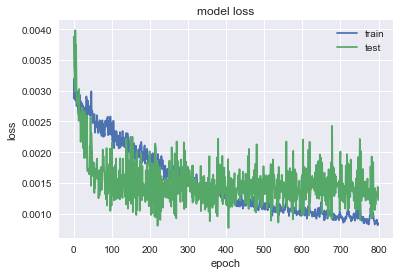

               IBM
MSE        6.69189
MAE        2.14702
R2        0.841088
MAPE (%)   1.55941


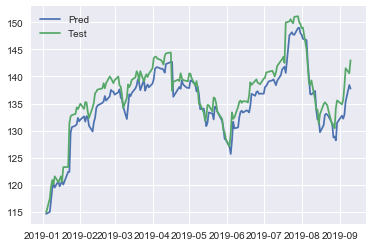

Predicting for  ALB
Train on 1008 samples, validate on 172 samples
Epoch 1/1000
0s - loss: 0.1298 - val_loss: 0.0130
Epoch 2/1000
0s - loss: 0.0579 - val_loss: 0.0122
Epoch 3/1000
0s - loss: 0.0435 - val_loss: 0.0351
Epoch 4/1000
0s - loss: 0.0479 - val_loss: 0.0467
Epoch 5/1000
0s - loss: 0.0491 - val_loss: 0.0430
Epoch 6/1000
0s - loss: 0.0447 - val_loss: 0.0365
Epoch 7/1000
0s - loss: 0.0403 - val_loss: 0.0336
Epoch 8/1000
0s - loss: 0.0380 - val_loss: 0.0347
Epoch 9/1000
0s - loss: 0.0353 - val_loss: 0.0387
Epoch 10/1000
0s - loss: 0.0330 - val_loss: 0.0441
Epoch 11/1000
0s - loss: 0.0302 - val_loss: 0.0493
Epoch 12/1000
0s - loss: 0.0291 - val_loss: 0.0529
Epoch 13/1000
0s - loss: 0.0277 - val_loss: 0.0548
Epoch 14/1000
0s - loss: 0.0249 - val_loss: 0.0565
Epoch 15/1000
0s - loss: 0.0238 - val_loss: 0.0585
Epoch 16/1000
0s - loss: 0.0215 - val_loss: 0.0605
Epoch 17/1000
0s - loss: 0.0210 - val_loss: 0.0622
Epoch 18/1000
0s - loss: 0.0191 - val_loss: 0.0647
Epoch 19/1000
0s - loss:

0s - loss: 0.0023 - val_loss: 0.0084
Epoch 163/1000
0s - loss: 0.0027 - val_loss: 0.0078
Epoch 164/1000
0s - loss: 0.0025 - val_loss: 0.0076
Epoch 165/1000
0s - loss: 0.0024 - val_loss: 0.0068
Epoch 166/1000
0s - loss: 0.0023 - val_loss: 0.0069
Epoch 167/1000
0s - loss: 0.0022 - val_loss: 0.0068
Epoch 168/1000
0s - loss: 0.0022 - val_loss: 0.0065
Epoch 169/1000
0s - loss: 0.0022 - val_loss: 0.0071
Epoch 170/1000
0s - loss: 0.0022 - val_loss: 0.0076
Epoch 171/1000
0s - loss: 0.0020 - val_loss: 0.0061
Epoch 172/1000
0s - loss: 0.0022 - val_loss: 0.0068
Epoch 173/1000
0s - loss: 0.0024 - val_loss: 0.0061
Epoch 174/1000
0s - loss: 0.0024 - val_loss: 0.0059
Epoch 175/1000
0s - loss: 0.0023 - val_loss: 0.0055
Epoch 176/1000
0s - loss: 0.0022 - val_loss: 0.0063
Epoch 177/1000
0s - loss: 0.0023 - val_loss: 0.0056
Epoch 178/1000
0s - loss: 0.0023 - val_loss: 0.0055
Epoch 179/1000
0s - loss: 0.0022 - val_loss: 0.0050
Epoch 180/1000
0s - loss: 0.0024 - val_loss: 0.0054
Epoch 181/1000
0s - loss: 0

0s - loss: 0.0016 - val_loss: 5.0823e-04
Epoch 319/1000
0s - loss: 0.0019 - val_loss: 7.9534e-04
Epoch 320/1000
0s - loss: 0.0017 - val_loss: 5.9846e-04
Epoch 321/1000
0s - loss: 0.0019 - val_loss: 7.0563e-04
Epoch 322/1000
0s - loss: 0.0018 - val_loss: 8.7702e-04
Epoch 323/1000
0s - loss: 0.0016 - val_loss: 6.9464e-04
Epoch 324/1000
0s - loss: 0.0017 - val_loss: 9.2132e-04
Epoch 325/1000
0s - loss: 0.0017 - val_loss: 6.6736e-04
Epoch 326/1000
0s - loss: 0.0015 - val_loss: 6.3458e-04
Epoch 327/1000
0s - loss: 0.0017 - val_loss: 6.0853e-04
Epoch 328/1000
0s - loss: 0.0017 - val_loss: 5.2206e-04
Epoch 329/1000
0s - loss: 0.0015 - val_loss: 6.1029e-04
Epoch 330/1000
0s - loss: 0.0018 - val_loss: 5.0846e-04
Epoch 331/1000
0s - loss: 0.0015 - val_loss: 5.6082e-04
Epoch 332/1000
0s - loss: 0.0016 - val_loss: 6.2007e-04
Epoch 333/1000
0s - loss: 0.0015 - val_loss: 5.1619e-04
Epoch 334/1000
0s - loss: 0.0016 - val_loss: 6.1537e-04
Epoch 335/1000
0s - loss: 0.0016 - val_loss: 5.1677e-04
Epoch 3

0s - loss: 0.0012 - val_loss: 4.6979e-04
Epoch 469/1000
0s - loss: 0.0011 - val_loss: 3.7779e-04
Epoch 470/1000
0s - loss: 0.0012 - val_loss: 3.4842e-04
Epoch 471/1000
0s - loss: 0.0012 - val_loss: 3.4678e-04
Epoch 472/1000
0s - loss: 0.0012 - val_loss: 4.6212e-04
Epoch 473/1000
0s - loss: 0.0012 - val_loss: 3.6671e-04
Epoch 474/1000
0s - loss: 0.0012 - val_loss: 3.5061e-04
Epoch 475/1000
0s - loss: 0.0012 - val_loss: 2.9918e-04
Epoch 476/1000
0s - loss: 0.0011 - val_loss: 2.9816e-04
Epoch 477/1000
0s - loss: 0.0010 - val_loss: 3.0583e-04
Epoch 478/1000
0s - loss: 0.0012 - val_loss: 2.9714e-04
Epoch 479/1000
0s - loss: 0.0011 - val_loss: 3.2369e-04
Epoch 480/1000
0s - loss: 0.0011 - val_loss: 3.1721e-04
Epoch 481/1000
0s - loss: 9.7585e-04 - val_loss: 3.1138e-04
Epoch 482/1000
0s - loss: 0.0012 - val_loss: 3.0720e-04
Epoch 483/1000
0s - loss: 0.0011 - val_loss: 3.0279e-04
Epoch 484/1000
0s - loss: 0.0010 - val_loss: 3.1069e-04
Epoch 485/1000
0s - loss: 0.0010 - val_loss: 3.1119e-04
Epo

0s - loss: 9.1899e-04 - val_loss: 5.9294e-04
Epoch 615/1000
0s - loss: 9.9295e-04 - val_loss: 2.9054e-04
Epoch 616/1000
0s - loss: 9.4715e-04 - val_loss: 2.8832e-04
Epoch 617/1000
0s - loss: 9.4526e-04 - val_loss: 6.2356e-04
Epoch 618/1000
0s - loss: 0.0010 - val_loss: 2.9515e-04
Epoch 619/1000
0s - loss: 9.9111e-04 - val_loss: 3.6411e-04
Epoch 620/1000
0s - loss: 9.7747e-04 - val_loss: 3.4255e-04
Epoch 621/1000
0s - loss: 9.2824e-04 - val_loss: 2.8815e-04
Epoch 622/1000
0s - loss: 9.9797e-04 - val_loss: 4.5563e-04
Epoch 623/1000
0s - loss: 9.4762e-04 - val_loss: 3.6941e-04
Epoch 624/1000
0s - loss: 9.1626e-04 - val_loss: 3.0497e-04
Epoch 625/1000
0s - loss: 9.7936e-04 - val_loss: 3.9198e-04
Epoch 626/1000
0s - loss: 9.5149e-04 - val_loss: 4.7376e-04
Epoch 627/1000
0s - loss: 0.0012 - val_loss: 3.7500e-04
Epoch 628/1000
0s - loss: 0.0013 - val_loss: 8.1936e-04
Epoch 629/1000
0s - loss: 9.5377e-04 - val_loss: 3.0013e-04
Epoch 630/1000
0s - loss: 8.1760e-04 - val_loss: 4.1025e-04
Epoch 6

0s - loss: 7.2295e-04 - val_loss: 3.4743e-04
Epoch 757/1000
0s - loss: 8.1142e-04 - val_loss: 2.8667e-04
Epoch 758/1000
0s - loss: 8.0144e-04 - val_loss: 3.3223e-04
Epoch 759/1000
0s - loss: 7.6306e-04 - val_loss: 3.3584e-04
Epoch 760/1000
0s - loss: 7.4583e-04 - val_loss: 2.8916e-04
Epoch 761/1000
0s - loss: 7.1302e-04 - val_loss: 4.0369e-04
Epoch 762/1000
0s - loss: 7.3876e-04 - val_loss: 3.2473e-04
Epoch 763/1000
0s - loss: 8.1345e-04 - val_loss: 3.5314e-04
Epoch 764/1000
0s - loss: 8.6186e-04 - val_loss: 3.0469e-04
Epoch 765/1000
0s - loss: 7.4184e-04 - val_loss: 3.9226e-04
Epoch 766/1000
0s - loss: 8.1073e-04 - val_loss: 2.9856e-04
Epoch 767/1000
0s - loss: 7.7095e-04 - val_loss: 3.3705e-04
Epoch 768/1000
0s - loss: 6.9727e-04 - val_loss: 3.1635e-04
Epoch 769/1000
0s - loss: 8.6802e-04 - val_loss: 3.6529e-04
Epoch 770/1000
0s - loss: 7.4674e-04 - val_loss: 3.4493e-04
Epoch 771/1000
0s - loss: 7.4826e-04 - val_loss: 2.9780e-04
Epoch 772/1000
0s - loss: 7.6070e-04 - val_loss: 3.6398

0s - loss: 7.3714e-04 - val_loss: 2.8633e-04
Epoch 896/1000
0s - loss: 7.8625e-04 - val_loss: 3.2716e-04
Epoch 897/1000
0s - loss: 8.1902e-04 - val_loss: 2.8491e-04
Epoch 898/1000
0s - loss: 7.5692e-04 - val_loss: 3.5306e-04
Epoch 899/1000
0s - loss: 7.7391e-04 - val_loss: 2.7890e-04
Epoch 900/1000
0s - loss: 7.2771e-04 - val_loss: 4.5279e-04
Epoch 901/1000
0s - loss: 7.5464e-04 - val_loss: 3.0291e-04
Epoch 902/1000
0s - loss: 8.4436e-04 - val_loss: 4.1246e-04
Epoch 903/1000
0s - loss: 8.7197e-04 - val_loss: 3.1452e-04
Epoch 904/1000
0s - loss: 8.1194e-04 - val_loss: 5.4283e-04
Epoch 905/1000
0s - loss: 8.6894e-04 - val_loss: 3.4859e-04
Epoch 906/1000
0s - loss: 0.0010 - val_loss: 5.4934e-04
Epoch 907/1000
0s - loss: 0.0011 - val_loss: 4.3035e-04
Epoch 908/1000
0s - loss: 9.8838e-04 - val_loss: 4.4299e-04
Epoch 909/1000
0s - loss: 7.6302e-04 - val_loss: 2.9904e-04
Epoch 910/1000
0s - loss: 9.6966e-04 - val_loss: 4.5972e-04
Epoch 911/1000
0s - loss: 0.0010 - val_loss: 3.4896e-04
Epoch 9

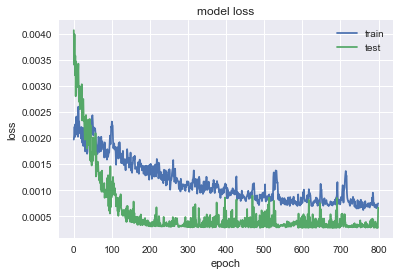

               ALB
MSE        6.91723
MAE         2.1406
R2        0.888882
MAPE (%)   2.85806


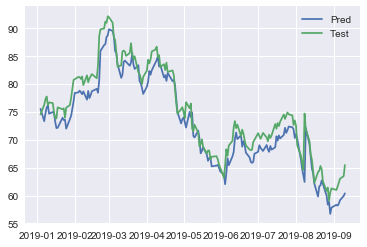

Predicting for  CBRE
Train on 1008 samples, validate on 172 samples
Epoch 1/1000
0s - loss: 0.1435 - val_loss: 0.3113
Epoch 2/1000
0s - loss: 0.0322 - val_loss: 0.1417
Epoch 3/1000
0s - loss: 0.0198 - val_loss: 0.0758
Epoch 4/1000
0s - loss: 0.0259 - val_loss: 0.0667
Epoch 5/1000
0s - loss: 0.0223 - val_loss: 0.0782
Epoch 6/1000
0s - loss: 0.0180 - val_loss: 0.0879
Epoch 7/1000
0s - loss: 0.0156 - val_loss: 0.0863
Epoch 8/1000
0s - loss: 0.0133 - val_loss: 0.0756
Epoch 9/1000
0s - loss: 0.0121 - val_loss: 0.0624
Epoch 10/1000
0s - loss: 0.0109 - val_loss: 0.0518
Epoch 11/1000
0s - loss: 0.0101 - val_loss: 0.0454
Epoch 12/1000
0s - loss: 0.0091 - val_loss: 0.0417
Epoch 13/1000
0s - loss: 0.0080 - val_loss: 0.0383
Epoch 14/1000
0s - loss: 0.0072 - val_loss: 0.0353
Epoch 15/1000
0s - loss: 0.0063 - val_loss: 0.0318
Epoch 16/1000
0s - loss: 0.0064 - val_loss: 0.0285
Epoch 17/1000
0s - loss: 0.0059 - val_loss: 0.0263
Epoch 18/1000
0s - loss: 0.0057 - val_loss: 0.0244
Epoch 19/1000
0s - loss

0s - loss: 0.0021 - val_loss: 0.0065
Epoch 162/1000
0s - loss: 0.0020 - val_loss: 0.0075
Epoch 163/1000
0s - loss: 0.0019 - val_loss: 0.0066
Epoch 164/1000
0s - loss: 0.0018 - val_loss: 0.0065
Epoch 165/1000
0s - loss: 0.0017 - val_loss: 0.0067
Epoch 166/1000
0s - loss: 0.0018 - val_loss: 0.0065
Epoch 167/1000
0s - loss: 0.0019 - val_loss: 0.0061
Epoch 168/1000
0s - loss: 0.0017 - val_loss: 0.0064
Epoch 169/1000
0s - loss: 0.0018 - val_loss: 0.0064
Epoch 170/1000
0s - loss: 0.0019 - val_loss: 0.0060
Epoch 171/1000
0s - loss: 0.0020 - val_loss: 0.0071
Epoch 172/1000
0s - loss: 0.0017 - val_loss: 0.0063
Epoch 173/1000
0s - loss: 0.0018 - val_loss: 0.0073
Epoch 174/1000
0s - loss: 0.0018 - val_loss: 0.0057
Epoch 175/1000
0s - loss: 0.0019 - val_loss: 0.0068
Epoch 176/1000
0s - loss: 0.0019 - val_loss: 0.0055
Epoch 177/1000
0s - loss: 0.0018 - val_loss: 0.0059
Epoch 178/1000
0s - loss: 0.0017 - val_loss: 0.0057
Epoch 179/1000
0s - loss: 0.0016 - val_loss: 0.0063
Epoch 180/1000
0s - loss: 0

0s - loss: 0.0013 - val_loss: 0.0034
Epoch 320/1000
0s - loss: 0.0014 - val_loss: 0.0034
Epoch 321/1000
0s - loss: 0.0014 - val_loss: 0.0036
Epoch 322/1000
0s - loss: 0.0013 - val_loss: 0.0032
Epoch 323/1000
0s - loss: 0.0013 - val_loss: 0.0030
Epoch 324/1000
0s - loss: 0.0013 - val_loss: 0.0032
Epoch 325/1000
0s - loss: 0.0013 - val_loss: 0.0030
Epoch 326/1000
0s - loss: 0.0013 - val_loss: 0.0029
Epoch 327/1000
0s - loss: 0.0013 - val_loss: 0.0032
Epoch 328/1000
0s - loss: 0.0014 - val_loss: 0.0026
Epoch 329/1000
0s - loss: 0.0014 - val_loss: 0.0034
Epoch 330/1000
0s - loss: 0.0015 - val_loss: 0.0024
Epoch 331/1000
0s - loss: 0.0013 - val_loss: 0.0034
Epoch 332/1000
0s - loss: 0.0013 - val_loss: 0.0023
Epoch 333/1000
0s - loss: 0.0013 - val_loss: 0.0031
Epoch 334/1000
0s - loss: 0.0013 - val_loss: 0.0024
Epoch 335/1000
0s - loss: 0.0014 - val_loss: 0.0035
Epoch 336/1000
0s - loss: 0.0014 - val_loss: 0.0024
Epoch 337/1000
0s - loss: 0.0012 - val_loss: 0.0035
Epoch 338/1000
0s - loss: 0

0s - loss: 9.2019e-04 - val_loss: 0.0018
Epoch 477/1000
0s - loss: 0.0010 - val_loss: 0.0029
Epoch 478/1000
0s - loss: 9.3431e-04 - val_loss: 0.0022
Epoch 479/1000
0s - loss: 9.5955e-04 - val_loss: 0.0025
Epoch 480/1000
0s - loss: 9.8930e-04 - val_loss: 0.0028
Epoch 481/1000
0s - loss: 9.1739e-04 - val_loss: 0.0017
Epoch 482/1000
0s - loss: 9.4823e-04 - val_loss: 0.0028
Epoch 483/1000
0s - loss: 0.0010 - val_loss: 0.0026
Epoch 484/1000
0s - loss: 0.0012 - val_loss: 0.0023
Epoch 485/1000
0s - loss: 0.0015 - val_loss: 0.0035
Epoch 486/1000
0s - loss: 0.0011 - val_loss: 0.0016
Epoch 487/1000
0s - loss: 0.0010 - val_loss: 0.0027
Epoch 488/1000
0s - loss: 0.0010 - val_loss: 0.0019
Epoch 489/1000
0s - loss: 0.0011 - val_loss: 0.0035
Epoch 490/1000
0s - loss: 0.0011 - val_loss: 0.0019
Epoch 491/1000
0s - loss: 0.0013 - val_loss: 0.0028
Epoch 492/1000
0s - loss: 0.0012 - val_loss: 0.0017
Epoch 493/1000
0s - loss: 0.0012 - val_loss: 0.0032
Epoch 494/1000
0s - loss: 0.0013 - val_loss: 0.0020
Epo

0s - loss: 9.6278e-04 - val_loss: 0.0031
Epoch 628/1000
0s - loss: 0.0010 - val_loss: 0.0018
Epoch 629/1000
0s - loss: 0.0012 - val_loss: 0.0033
Epoch 630/1000
0s - loss: 0.0013 - val_loss: 0.0026
Epoch 631/1000
0s - loss: 0.0014 - val_loss: 0.0024
Epoch 632/1000
0s - loss: 0.0013 - val_loss: 0.0031
Epoch 633/1000
0s - loss: 0.0012 - val_loss: 0.0019
Epoch 634/1000
0s - loss: 0.0012 - val_loss: 0.0036
Epoch 635/1000
0s - loss: 0.0011 - val_loss: 0.0020
Epoch 636/1000
0s - loss: 0.0010 - val_loss: 0.0035
Epoch 637/1000
0s - loss: 0.0011 - val_loss: 0.0022
Epoch 638/1000
0s - loss: 9.7722e-04 - val_loss: 0.0034
Epoch 639/1000
0s - loss: 8.7726e-04 - val_loss: 0.0022
Epoch 640/1000
0s - loss: 7.8790e-04 - val_loss: 0.0034
Epoch 641/1000
0s - loss: 8.3090e-04 - val_loss: 0.0023
Epoch 642/1000
0s - loss: 7.6451e-04 - val_loss: 0.0030
Epoch 643/1000
0s - loss: 7.3142e-04 - val_loss: 0.0025
Epoch 644/1000
0s - loss: 7.4105e-04 - val_loss: 0.0024
Epoch 645/1000
0s - loss: 7.6450e-04 - val_loss

0s - loss: 8.5527e-04 - val_loss: 0.0018
Epoch 777/1000
0s - loss: 9.9285e-04 - val_loss: 0.0027
Epoch 778/1000
0s - loss: 0.0010 - val_loss: 0.0020
Epoch 779/1000
0s - loss: 8.1503e-04 - val_loss: 0.0015
Epoch 780/1000
0s - loss: 7.4910e-04 - val_loss: 0.0018
Epoch 781/1000
0s - loss: 7.8944e-04 - val_loss: 0.0023
Epoch 782/1000
0s - loss: 7.9569e-04 - val_loss: 0.0019
Epoch 783/1000
0s - loss: 7.1909e-04 - val_loss: 0.0020
Epoch 784/1000
0s - loss: 7.1524e-04 - val_loss: 0.0017
Epoch 785/1000
0s - loss: 6.6750e-04 - val_loss: 0.0019
Epoch 786/1000
0s - loss: 6.7933e-04 - val_loss: 0.0018
Epoch 787/1000
0s - loss: 6.7645e-04 - val_loss: 0.0018
Epoch 788/1000
0s - loss: 6.7493e-04 - val_loss: 0.0019
Epoch 789/1000
0s - loss: 6.7693e-04 - val_loss: 0.0019
Epoch 790/1000
0s - loss: 7.1257e-04 - val_loss: 0.0020
Epoch 791/1000
0s - loss: 7.5641e-04 - val_loss: 0.0018
Epoch 792/1000
0s - loss: 7.8463e-04 - val_loss: 0.0019
Epoch 793/1000
0s - loss: 7.0824e-04 - val_loss: 0.0017
Epoch 794/1

0s - loss: 6.2332e-04 - val_loss: 0.0018
Epoch 927/1000
0s - loss: 6.8317e-04 - val_loss: 0.0018
Epoch 928/1000
0s - loss: 5.7547e-04 - val_loss: 0.0020
Epoch 929/1000
0s - loss: 6.2727e-04 - val_loss: 0.0020
Epoch 930/1000
0s - loss: 6.6636e-04 - val_loss: 0.0018
Epoch 931/1000
0s - loss: 6.7478e-04 - val_loss: 0.0018
Epoch 932/1000
0s - loss: 5.9326e-04 - val_loss: 0.0020
Epoch 933/1000
0s - loss: 6.2568e-04 - val_loss: 0.0018
Epoch 934/1000
0s - loss: 5.8724e-04 - val_loss: 0.0018
Epoch 935/1000
0s - loss: 6.0536e-04 - val_loss: 0.0019
Epoch 936/1000
0s - loss: 6.7502e-04 - val_loss: 0.0018
Epoch 937/1000
0s - loss: 6.8784e-04 - val_loss: 0.0016
Epoch 938/1000
0s - loss: 6.9434e-04 - val_loss: 0.0015
Epoch 939/1000
0s - loss: 7.0472e-04 - val_loss: 0.0020
Epoch 940/1000
0s - loss: 6.3193e-04 - val_loss: 0.0019
Epoch 941/1000
0s - loss: 7.0176e-04 - val_loss: 0.0016
Epoch 942/1000
0s - loss: 7.1592e-04 - val_loss: 0.0020
Epoch 943/1000
0s - loss: 6.5085e-04 - val_loss: 0.0016
Epoch 9

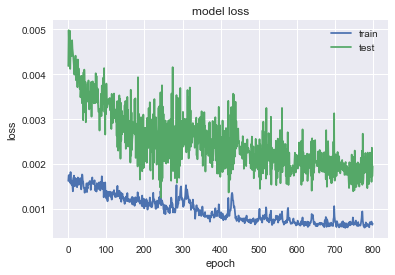

              CBRE
MSE        2.04911
MAE        1.23549
R2        0.736329
MAPE (%)   2.45338


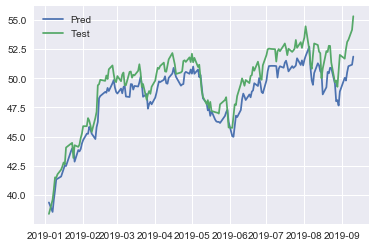

In [316]:
pred_multi_GRU = pd.DataFrame(columns=df.columns,index = test.index)
for comp in companies:
    pred_multi_GRU[comp] = nn_forec_multi_GRU(df,comp,first_layer = 64,second_layer=32).values

In [317]:
pred_multi_64_32_GRU = eval(pred_multi_GRU,test,companies=companies)
pred_multi_64_32_GRU

,T,BBY,KO,FTI,BLK,DVA,BA,IBM,ALB,CBRE
MSE,0.57669,3.08549,1.06673,0.545928,41.9132,1.43407,120.475,6.69189,6.91723,2.04911
MAE,0.637706,1.35564,0.833683,0.585468,5.04079,0.878684,9.02046,2.14702,2.1406,1.23549
R2,0.735191,0.899135,0.826649,0.687155,0.919252,0.87299,0.801127,0.841088,0.888882,0.736329
MAPE (%),1.94421,1.97826,1.62795,2.42601,1.13843,1.62004,2.42575,1.55941,2.85806,2.45338


In [318]:
s = [2,3,4,5,5,5,5,5,6]